In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [2]:
def load_train_data():
    train_file = 'train.json.zip'
    train = pd.read_json(train_file, orient='records', convert_dates=['created'])
    train.reset_index(drop=True, inplace=True)
    return train

def load_test_data():
    test_file = 'test.json.zip'
    test = pd.read_json(test_file, orient='records', convert_dates=['created'])
    test.reset_index(drop=True, inplace=True)
    return test

In [3]:
# load data
train = load_train_data()

# remove outliers
# latitude
lower = np.percentile(train['latitude'].values, 1)
upper = np.percentile(train['latitude'].values, 99)
train = train[train['latitude'] > lower]
train = train[train['latitude'] < upper]
# train.latitude.hist()

# longitude
lower = np.percentile(train['longitude'].values, 1)
upper = np.percentile(train['longitude'].values, 99)
train = train[train['longitude'] > lower]
train = train[train['longitude'] < upper]
# train.longitude.hist()

# price
upper = np.percentile(train['price'].values, 99)
train = train[train['price'] < upper]
# train.price.hist()

train.reset_index(drop=True, inplace=True)

In [4]:
# Adding feature manager id
manager_id_df = train.groupby(['manager_id']).agg({'building_id': 'count'}).reset_index()
manager_number = manager_id_df['building_id'].shape[0]
manager_id_df['building_id'] = np.linspace(1, manager_number, num=manager_number, dtype=int)

train = train.merge(manager_id_df, how='left', on='manager_id')
del train['building_id_x']
train = train.rename(columns={'building_id_y': 'manager_number'})

# using external dataset
subway = pd.read_csv('NYC_Transit_Subway_Entrance_And_Exit_Data.csv')
subway = subway[['Station Name', 'Station Latitude', 'Station Longitude']]
subway = subway.groupby(['Station Name']).mean().reset_index(drop=True)

from math import cos, asin, sqrt
# https://stackoverflow.com/questions/27928/calculate-distance-between-two-latitude-longitude-points-haversine-formula/21623206
def distance_pair(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295     #Pi/180
    a = 0.5 - cos((lat2 - lat1) * p)/2 +  cos(lat1 * p) * cos(lat2 * p) * (1 - cos((lon2 - lon1) * p)) / 2
    d_2_point = 6371 *2 * asin(sqrt(a)) #2*R*asin...
    return d_2_point
distance_pairs = np.vectorize(distance_pair)

def get_nearby_subway(location):
    distances = distance_pairs(location[0], location[1], subway['Station Latitude'], subway['Station Longitude'])    
    return distances[distances < 1].shape[0]
    
def get_subway_distance(location):
    distances = distance_pairs(location[0], location[1], subway['Station Latitude'], subway['Station Longitude'])    
    return min(distances)

train['feature_number'] = train['features'].apply(len)
train['room_number'] = train['bedrooms'] + train['bathrooms']
train['photo_number'] = train['photos'].apply(len)
train['location'] = train[['latitude', 'longitude']].values.tolist()
train['nearby_subway'] = train['location'].apply(get_nearby_subway)
train['subway_distance'] = train['location'].apply(get_subway_distance)
train['target'] = train['interest_level'].apply(lambda x: 0 if x=='low' else 1 if x=='medium' else 2)


In [5]:
X_features = ['feature_number', 'room_number', 'photo_number', 'subway_distance', 'price']
# X_features = ['price']
X = train[X_features]
y = train['target']

In [6]:
# from sklearn.linear_model import SGDClassifier
# from sklearn.model_selection import cross_val_score

# sgd = SGDClassifier()

# scores = cross_val_score(sgd, X, y, cv=5)
# print("Accuracy: %f (+/- %f)" % (scores.mean(), scores.std() * 2))

In [7]:
# from lightgbm import LGBMRegressor
# from sklearn.model_selection import cross_val_score

# lgbm = LGBMRegressor()

# scores = cross_val_score(lgbm, X, y, cv=5)
# print("Accuracy: %f (+/- %f)" % (scores.mean(), scores.std() * 2))

In [8]:
# from sklearn.ensemble import GradientBoostingClassifier
# from sklearn.model_selection import cross_val_score

# model = GradientBoostingClassifier(max_depth=10,
#                                 max_features=5,
#                                 subsample=0.5)

# scores = cross_val_score(model, X, y, cv=5)
# print("Accuracy: %f (+/- %f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.711392 (+/- 0.010974)


0:	learn: 1.0287833	total: 13.8ms	remaining: 13.7s
1:	learn: 0.9727906	total: 25.4ms	remaining: 12.7s
2:	learn: 0.9300474	total: 36.7ms	remaining: 12.2s
3:	learn: 0.8951575	total: 47.8ms	remaining: 11.9s
4:	learn: 0.8661446	total: 59.2ms	remaining: 11.8s
5:	learn: 0.8419614	total: 70.2ms	remaining: 11.6s
6:	learn: 0.8213003	total: 81.1ms	remaining: 11.5s
7:	learn: 0.8042595	total: 92.4ms	remaining: 11.5s
8:	learn: 0.7893192	total: 104ms	remaining: 11.4s
9:	learn: 0.7766285	total: 115ms	remaining: 11.4s
10:	learn: 0.7654125	total: 127ms	remaining: 11.4s
11:	learn: 0.7561118	total: 138ms	remaining: 11.3s
12:	learn: 0.7475545	total: 149ms	remaining: 11.3s
13:	learn: 0.7394383	total: 161ms	remaining: 11.3s
14:	learn: 0.7333151	total: 172ms	remaining: 11.3s
15:	learn: 0.7279267	total: 183ms	remaining: 11.3s
16:	learn: 0.7227688	total: 195ms	remaining: 11.3s
17:	learn: 0.7178714	total: 209ms	remaining: 11.4s
18:	learn: 0.7137623	total: 222ms	remaining: 11.5s
19:	learn: 0.7103584	total: 233ms

165:	learn: 0.6430336	total: 2.03s	remaining: 10.2s
166:	learn: 0.6429313	total: 2.04s	remaining: 10.2s
167:	learn: 0.6428122	total: 2.05s	remaining: 10.2s
168:	learn: 0.6426148	total: 2.07s	remaining: 10.2s
169:	learn: 0.6424738	total: 2.08s	remaining: 10.1s
170:	learn: 0.6423656	total: 2.09s	remaining: 10.1s
171:	learn: 0.6422230	total: 2.1s	remaining: 10.1s
172:	learn: 0.6420532	total: 2.11s	remaining: 10.1s
173:	learn: 0.6419421	total: 2.12s	remaining: 10.1s
174:	learn: 0.6418323	total: 2.13s	remaining: 10.1s
175:	learn: 0.6416885	total: 2.14s	remaining: 10s
176:	learn: 0.6415473	total: 2.15s	remaining: 10s
177:	learn: 0.6413670	total: 2.17s	remaining: 10s
178:	learn: 0.6412880	total: 2.18s	remaining: 9.99s
179:	learn: 0.6411574	total: 2.19s	remaining: 9.98s
180:	learn: 0.6410238	total: 2.2s	remaining: 9.97s
181:	learn: 0.6408769	total: 2.22s	remaining: 9.97s
182:	learn: 0.6407290	total: 2.23s	remaining: 9.96s
183:	learn: 0.6406125	total: 2.24s	remaining: 9.95s
184:	learn: 0.640541

330:	learn: 0.6251085	total: 4.02s	remaining: 8.12s
331:	learn: 0.6250022	total: 4.03s	remaining: 8.11s
332:	learn: 0.6249471	total: 4.04s	remaining: 8.09s
333:	learn: 0.6248633	total: 4.05s	remaining: 8.08s
334:	learn: 0.6247882	total: 4.06s	remaining: 8.07s
335:	learn: 0.6246359	total: 4.07s	remaining: 8.05s
336:	learn: 0.6245434	total: 4.08s	remaining: 8.04s
337:	learn: 0.6244304	total: 4.1s	remaining: 8.02s
338:	learn: 0.6243322	total: 4.11s	remaining: 8.01s
339:	learn: 0.6242238	total: 4.12s	remaining: 8s
340:	learn: 0.6240670	total: 4.13s	remaining: 7.99s
341:	learn: 0.6239452	total: 4.14s	remaining: 7.97s
342:	learn: 0.6238524	total: 4.15s	remaining: 7.96s
343:	learn: 0.6237439	total: 4.17s	remaining: 7.95s
344:	learn: 0.6236691	total: 4.18s	remaining: 7.93s
345:	learn: 0.6236061	total: 4.19s	remaining: 7.92s
346:	learn: 0.6235068	total: 4.2s	remaining: 7.91s
347:	learn: 0.6233913	total: 4.21s	remaining: 7.9s
348:	learn: 0.6232785	total: 4.23s	remaining: 7.88s
349:	learn: 0.6231

496:	learn: 0.6118152	total: 6.03s	remaining: 6.1s
497:	learn: 0.6117369	total: 6.04s	remaining: 6.09s
498:	learn: 0.6116552	total: 6.05s	remaining: 6.08s
499:	learn: 0.6115938	total: 6.06s	remaining: 6.06s
500:	learn: 0.6115499	total: 6.08s	remaining: 6.05s
501:	learn: 0.6114615	total: 6.09s	remaining: 6.04s
502:	learn: 0.6113960	total: 6.1s	remaining: 6.02s
503:	learn: 0.6113107	total: 6.11s	remaining: 6.01s
504:	learn: 0.6112692	total: 6.12s	remaining: 6s
505:	learn: 0.6111803	total: 6.13s	remaining: 5.99s
506:	learn: 0.6111141	total: 6.14s	remaining: 5.97s
507:	learn: 0.6110553	total: 6.15s	remaining: 5.96s
508:	learn: 0.6110018	total: 6.17s	remaining: 5.95s
509:	learn: 0.6109256	total: 6.18s	remaining: 5.93s
510:	learn: 0.6108846	total: 6.19s	remaining: 5.92s
511:	learn: 0.6108006	total: 6.2s	remaining: 5.91s
512:	learn: 0.6107409	total: 6.21s	remaining: 5.9s
513:	learn: 0.6106902	total: 6.22s	remaining: 5.89s
514:	learn: 0.6106463	total: 6.24s	remaining: 5.87s
515:	learn: 0.61054

668:	learn: 0.5999402	total: 8.03s	remaining: 3.97s
669:	learn: 0.5998684	total: 8.04s	remaining: 3.96s
670:	learn: 0.5998154	total: 8.05s	remaining: 3.95s
671:	learn: 0.5997303	total: 8.06s	remaining: 3.94s
672:	learn: 0.5996536	total: 8.07s	remaining: 3.92s
673:	learn: 0.5996080	total: 8.09s	remaining: 3.91s
674:	learn: 0.5995696	total: 8.1s	remaining: 3.9s
675:	learn: 0.5995134	total: 8.11s	remaining: 3.89s
676:	learn: 0.5994466	total: 8.12s	remaining: 3.87s
677:	learn: 0.5994031	total: 8.13s	remaining: 3.86s
678:	learn: 0.5993743	total: 8.14s	remaining: 3.85s
679:	learn: 0.5993016	total: 8.15s	remaining: 3.84s
680:	learn: 0.5992476	total: 8.16s	remaining: 3.82s
681:	learn: 0.5991563	total: 8.18s	remaining: 3.81s
682:	learn: 0.5990969	total: 8.19s	remaining: 3.8s
683:	learn: 0.5990482	total: 8.2s	remaining: 3.79s
684:	learn: 0.5989402	total: 8.21s	remaining: 3.78s
685:	learn: 0.5988763	total: 8.22s	remaining: 3.77s
686:	learn: 0.5987689	total: 8.24s	remaining: 3.75s
687:	learn: 0.59

840:	learn: 0.5898624	total: 10s	remaining: 1.9s
841:	learn: 0.5898025	total: 10s	remaining: 1.88s
842:	learn: 0.5897317	total: 10.1s	remaining: 1.87s
843:	learn: 0.5896745	total: 10.1s	remaining: 1.86s
844:	learn: 0.5896182	total: 10.1s	remaining: 1.85s
845:	learn: 0.5895622	total: 10.1s	remaining: 1.84s
846:	learn: 0.5894969	total: 10.1s	remaining: 1.82s
847:	learn: 0.5894556	total: 10.1s	remaining: 1.81s
848:	learn: 0.5894174	total: 10.1s	remaining: 1.8s
849:	learn: 0.5893723	total: 10.1s	remaining: 1.79s
850:	learn: 0.5893061	total: 10.1s	remaining: 1.77s
851:	learn: 0.5892557	total: 10.2s	remaining: 1.76s
852:	learn: 0.5891900	total: 10.2s	remaining: 1.75s
853:	learn: 0.5891425	total: 10.2s	remaining: 1.74s
854:	learn: 0.5890680	total: 10.2s	remaining: 1.73s
855:	learn: 0.5890363	total: 10.2s	remaining: 1.72s
856:	learn: 0.5890080	total: 10.2s	remaining: 1.7s
857:	learn: 0.5889443	total: 10.2s	remaining: 1.69s
858:	learn: 0.5889156	total: 10.2s	remaining: 1.68s
859:	learn: 0.58882

5:	learn: 0.8435165	total: 87.3ms	remaining: 14.5s
6:	learn: 0.8226966	total: 99.1ms	remaining: 14.1s
7:	learn: 0.8056661	total: 111ms	remaining: 13.7s
8:	learn: 0.7914238	total: 122ms	remaining: 13.5s
9:	learn: 0.7782142	total: 134ms	remaining: 13.3s
10:	learn: 0.7666777	total: 145ms	remaining: 13.1s
11:	learn: 0.7573998	total: 157ms	remaining: 12.9s
12:	learn: 0.7481994	total: 168ms	remaining: 12.8s
13:	learn: 0.7404368	total: 180ms	remaining: 12.6s
14:	learn: 0.7342368	total: 191ms	remaining: 12.5s
15:	learn: 0.7285099	total: 202ms	remaining: 12.4s
16:	learn: 0.7232586	total: 214ms	remaining: 12.4s
17:	learn: 0.7182968	total: 225ms	remaining: 12.3s
18:	learn: 0.7141986	total: 237ms	remaining: 12.2s
19:	learn: 0.7106514	total: 248ms	remaining: 12.1s
20:	learn: 0.7069530	total: 262ms	remaining: 12.2s
21:	learn: 0.7040083	total: 274ms	remaining: 12.2s
22:	learn: 0.7014900	total: 285ms	remaining: 12.1s
23:	learn: 0.6989295	total: 296ms	remaining: 12s
24:	learn: 0.6971132	total: 307ms	re

177:	learn: 0.6427718	total: 2.08s	remaining: 9.61s
178:	learn: 0.6426504	total: 2.09s	remaining: 9.6s
179:	learn: 0.6425718	total: 2.1s	remaining: 9.59s
180:	learn: 0.6424743	total: 2.12s	remaining: 9.57s
181:	learn: 0.6424096	total: 2.13s	remaining: 9.56s
182:	learn: 0.6422656	total: 2.14s	remaining: 9.55s
183:	learn: 0.6421774	total: 2.15s	remaining: 9.53s
184:	learn: 0.6420523	total: 2.16s	remaining: 9.52s
185:	learn: 0.6419948	total: 2.17s	remaining: 9.5s
186:	learn: 0.6418622	total: 2.18s	remaining: 9.49s
187:	learn: 0.6417509	total: 2.19s	remaining: 9.48s
188:	learn: 0.6416127	total: 2.21s	remaining: 9.47s
189:	learn: 0.6414993	total: 2.22s	remaining: 9.46s
190:	learn: 0.6414020	total: 2.23s	remaining: 9.44s
191:	learn: 0.6413003	total: 2.24s	remaining: 9.43s
192:	learn: 0.6412311	total: 2.25s	remaining: 9.43s
193:	learn: 0.6410771	total: 2.27s	remaining: 9.42s
194:	learn: 0.6409544	total: 2.28s	remaining: 9.4s
195:	learn: 0.6408437	total: 2.29s	remaining: 9.39s
196:	learn: 0.64

348:	learn: 0.6246763	total: 4.07s	remaining: 7.59s
349:	learn: 0.6245195	total: 4.08s	remaining: 7.58s
350:	learn: 0.6244244	total: 4.09s	remaining: 7.57s
351:	learn: 0.6243315	total: 4.11s	remaining: 7.56s
352:	learn: 0.6242377	total: 4.12s	remaining: 7.54s
353:	learn: 0.6241640	total: 4.13s	remaining: 7.53s
354:	learn: 0.6241024	total: 4.14s	remaining: 7.52s
355:	learn: 0.6240301	total: 4.15s	remaining: 7.51s
356:	learn: 0.6239433	total: 4.16s	remaining: 7.49s
357:	learn: 0.6239057	total: 4.17s	remaining: 7.48s
358:	learn: 0.6238240	total: 4.18s	remaining: 7.47s
359:	learn: 0.6237356	total: 4.19s	remaining: 7.46s
360:	learn: 0.6236782	total: 4.21s	remaining: 7.44s
361:	learn: 0.6236157	total: 4.22s	remaining: 7.43s
362:	learn: 0.6235357	total: 4.23s	remaining: 7.42s
363:	learn: 0.6234784	total: 4.24s	remaining: 7.41s
364:	learn: 0.6233726	total: 4.25s	remaining: 7.4s
365:	learn: 0.6233036	total: 4.26s	remaining: 7.39s
366:	learn: 0.6232067	total: 4.28s	remaining: 7.38s
367:	learn: 0

520:	learn: 0.6117916	total: 6.06s	remaining: 5.58s
521:	learn: 0.6117431	total: 6.08s	remaining: 5.56s
522:	learn: 0.6116341	total: 6.09s	remaining: 5.55s
523:	learn: 0.6115662	total: 6.1s	remaining: 5.54s
524:	learn: 0.6115253	total: 6.11s	remaining: 5.53s
525:	learn: 0.6114221	total: 6.12s	remaining: 5.52s
526:	learn: 0.6113202	total: 6.13s	remaining: 5.5s
527:	learn: 0.6112235	total: 6.14s	remaining: 5.49s
528:	learn: 0.6111099	total: 6.16s	remaining: 5.48s
529:	learn: 0.6110552	total: 6.17s	remaining: 5.47s
530:	learn: 0.6109882	total: 6.18s	remaining: 5.46s
531:	learn: 0.6109283	total: 6.19s	remaining: 5.45s
532:	learn: 0.6108635	total: 6.2s	remaining: 5.43s
533:	learn: 0.6108073	total: 6.21s	remaining: 5.42s
534:	learn: 0.6107396	total: 6.22s	remaining: 5.41s
535:	learn: 0.6106660	total: 6.24s	remaining: 5.4s
536:	learn: 0.6105891	total: 6.25s	remaining: 5.39s
537:	learn: 0.6105453	total: 6.26s	remaining: 5.38s
538:	learn: 0.6104861	total: 6.27s	remaining: 5.37s
539:	learn: 0.61

692:	learn: 0.6000130	total: 8.07s	remaining: 3.57s
693:	learn: 0.5999028	total: 8.08s	remaining: 3.56s
694:	learn: 0.5997920	total: 8.09s	remaining: 3.55s
695:	learn: 0.5997455	total: 8.1s	remaining: 3.54s
696:	learn: 0.5996892	total: 8.11s	remaining: 3.53s
697:	learn: 0.5996195	total: 8.13s	remaining: 3.52s
698:	learn: 0.5995930	total: 8.14s	remaining: 3.5s
699:	learn: 0.5995287	total: 8.15s	remaining: 3.49s
700:	learn: 0.5994815	total: 8.16s	remaining: 3.48s
701:	learn: 0.5994139	total: 8.17s	remaining: 3.47s
702:	learn: 0.5993656	total: 8.18s	remaining: 3.46s
703:	learn: 0.5993162	total: 8.19s	remaining: 3.44s
704:	learn: 0.5992590	total: 8.21s	remaining: 3.43s
705:	learn: 0.5991713	total: 8.22s	remaining: 3.42s
706:	learn: 0.5991263	total: 8.23s	remaining: 3.41s
707:	learn: 0.5990769	total: 8.24s	remaining: 3.4s
708:	learn: 0.5990056	total: 8.26s	remaining: 3.39s
709:	learn: 0.5989610	total: 8.27s	remaining: 3.38s
710:	learn: 0.5989317	total: 8.28s	remaining: 3.36s
711:	learn: 0.5

862:	learn: 0.5894055	total: 10.1s	remaining: 1.6s
863:	learn: 0.5893693	total: 10.1s	remaining: 1.59s
864:	learn: 0.5893202	total: 10.1s	remaining: 1.57s
865:	learn: 0.5892730	total: 10.1s	remaining: 1.56s
866:	learn: 0.5892481	total: 10.1s	remaining: 1.55s
867:	learn: 0.5891684	total: 10.1s	remaining: 1.54s
868:	learn: 0.5891116	total: 10.1s	remaining: 1.53s
869:	learn: 0.5890375	total: 10.1s	remaining: 1.52s
870:	learn: 0.5889495	total: 10.2s	remaining: 1.5s
871:	learn: 0.5888991	total: 10.2s	remaining: 1.49s
872:	learn: 0.5888632	total: 10.2s	remaining: 1.48s
873:	learn: 0.5887795	total: 10.2s	remaining: 1.47s
874:	learn: 0.5887556	total: 10.2s	remaining: 1.46s
875:	learn: 0.5887073	total: 10.2s	remaining: 1.45s
876:	learn: 0.5886552	total: 10.2s	remaining: 1.43s
877:	learn: 0.5886287	total: 10.2s	remaining: 1.42s
878:	learn: 0.5885757	total: 10.3s	remaining: 1.41s
879:	learn: 0.5885310	total: 10.3s	remaining: 1.4s
880:	learn: 0.5884904	total: 10.3s	remaining: 1.39s
881:	learn: 0.5

33:	learn: 0.6813382	total: 407ms	remaining: 11.6s
34:	learn: 0.6803403	total: 418ms	remaining: 11.5s
35:	learn: 0.6796006	total: 430ms	remaining: 11.5s
36:	learn: 0.6789173	total: 441ms	remaining: 11.5s
37:	learn: 0.6782367	total: 453ms	remaining: 11.5s
38:	learn: 0.6774107	total: 464ms	remaining: 11.4s
39:	learn: 0.6765546	total: 476ms	remaining: 11.4s
40:	learn: 0.6754688	total: 487ms	remaining: 11.4s
41:	learn: 0.6750173	total: 498ms	remaining: 11.4s
42:	learn: 0.6743837	total: 509ms	remaining: 11.3s
43:	learn: 0.6736857	total: 521ms	remaining: 11.3s
44:	learn: 0.6727278	total: 533ms	remaining: 11.3s
45:	learn: 0.6720802	total: 544ms	remaining: 11.3s
46:	learn: 0.6714603	total: 555ms	remaining: 11.3s
47:	learn: 0.6707881	total: 566ms	remaining: 11.2s
48:	learn: 0.6700759	total: 581ms	remaining: 11.3s
49:	learn: 0.6694969	total: 593ms	remaining: 11.3s
50:	learn: 0.6690191	total: 604ms	remaining: 11.2s
51:	learn: 0.6685480	total: 615ms	remaining: 11.2s
52:	learn: 0.6680347	total: 627

205:	learn: 0.6377673	total: 2.4s	remaining: 9.23s
206:	learn: 0.6376949	total: 2.41s	remaining: 9.23s
207:	learn: 0.6376140	total: 2.42s	remaining: 9.22s
208:	learn: 0.6374445	total: 2.43s	remaining: 9.2s
209:	learn: 0.6373512	total: 2.44s	remaining: 9.19s
210:	learn: 0.6372377	total: 2.45s	remaining: 9.18s
211:	learn: 0.6371148	total: 2.46s	remaining: 9.16s
212:	learn: 0.6369687	total: 2.48s	remaining: 9.15s
213:	learn: 0.6368935	total: 2.49s	remaining: 9.14s
214:	learn: 0.6368335	total: 2.5s	remaining: 9.12s
215:	learn: 0.6367528	total: 2.51s	remaining: 9.11s
216:	learn: 0.6366861	total: 2.52s	remaining: 9.1s
217:	learn: 0.6365793	total: 2.53s	remaining: 9.09s
218:	learn: 0.6364681	total: 2.54s	remaining: 9.07s
219:	learn: 0.6363703	total: 2.56s	remaining: 9.06s
220:	learn: 0.6361965	total: 2.57s	remaining: 9.05s
221:	learn: 0.6361241	total: 2.58s	remaining: 9.05s
222:	learn: 0.6359630	total: 2.59s	remaining: 9.03s
223:	learn: 0.6358900	total: 2.6s	remaining: 9.02s
224:	learn: 0.635

377:	learn: 0.6214001	total: 4.39s	remaining: 7.23s
378:	learn: 0.6213471	total: 4.4s	remaining: 7.22s
379:	learn: 0.6212610	total: 4.42s	remaining: 7.21s
380:	learn: 0.6211472	total: 4.43s	remaining: 7.19s
381:	learn: 0.6211000	total: 4.44s	remaining: 7.18s
382:	learn: 0.6210049	total: 4.45s	remaining: 7.17s
383:	learn: 0.6209367	total: 4.46s	remaining: 7.16s
384:	learn: 0.6208428	total: 4.47s	remaining: 7.14s
385:	learn: 0.6208053	total: 4.48s	remaining: 7.13s
386:	learn: 0.6207325	total: 4.5s	remaining: 7.12s
387:	learn: 0.6206607	total: 4.51s	remaining: 7.11s
388:	learn: 0.6205639	total: 4.52s	remaining: 7.09s
389:	learn: 0.6204920	total: 4.53s	remaining: 7.08s
390:	learn: 0.6203613	total: 4.54s	remaining: 7.07s
391:	learn: 0.6203215	total: 4.55s	remaining: 7.06s
392:	learn: 0.6202279	total: 4.56s	remaining: 7.05s
393:	learn: 0.6201506	total: 4.58s	remaining: 7.04s
394:	learn: 0.6200515	total: 4.59s	remaining: 7.03s
395:	learn: 0.6200145	total: 4.6s	remaining: 7.02s
396:	learn: 0.6

548:	learn: 0.6087192	total: 6.39s	remaining: 5.25s
549:	learn: 0.6086523	total: 6.4s	remaining: 5.24s
550:	learn: 0.6085532	total: 6.41s	remaining: 5.22s
551:	learn: 0.6084651	total: 6.42s	remaining: 5.21s
552:	learn: 0.6084279	total: 6.43s	remaining: 5.2s
553:	learn: 0.6083813	total: 6.44s	remaining: 5.19s
554:	learn: 0.6083436	total: 6.46s	remaining: 5.17s
555:	learn: 0.6082638	total: 6.47s	remaining: 5.16s
556:	learn: 0.6081677	total: 6.48s	remaining: 5.15s
557:	learn: 0.6081116	total: 6.49s	remaining: 5.14s
558:	learn: 0.6080433	total: 6.5s	remaining: 5.13s
559:	learn: 0.6079633	total: 6.51s	remaining: 5.12s
560:	learn: 0.6079069	total: 6.52s	remaining: 5.1s
561:	learn: 0.6078525	total: 6.53s	remaining: 5.09s
562:	learn: 0.6077766	total: 6.55s	remaining: 5.08s
563:	learn: 0.6076935	total: 6.56s	remaining: 5.07s
564:	learn: 0.6076255	total: 6.57s	remaining: 5.06s
565:	learn: 0.6075790	total: 6.58s	remaining: 5.05s
566:	learn: 0.6074727	total: 6.59s	remaining: 5.04s
567:	learn: 0.60

721:	learn: 0.5974311	total: 8.4s	remaining: 3.23s
722:	learn: 0.5973830	total: 8.41s	remaining: 3.22s
723:	learn: 0.5973086	total: 8.42s	remaining: 3.21s
724:	learn: 0.5972260	total: 8.43s	remaining: 3.2s
725:	learn: 0.5971697	total: 8.45s	remaining: 3.19s
726:	learn: 0.5970969	total: 8.46s	remaining: 3.18s
727:	learn: 0.5970508	total: 8.47s	remaining: 3.16s
728:	learn: 0.5970105	total: 8.48s	remaining: 3.15s
729:	learn: 0.5969764	total: 8.49s	remaining: 3.14s
730:	learn: 0.5969257	total: 8.5s	remaining: 3.13s
731:	learn: 0.5968696	total: 8.51s	remaining: 3.12s
732:	learn: 0.5968036	total: 8.53s	remaining: 3.1s
733:	learn: 0.5967880	total: 8.54s	remaining: 3.09s
734:	learn: 0.5966846	total: 8.55s	remaining: 3.08s
735:	learn: 0.5966191	total: 8.56s	remaining: 3.07s
736:	learn: 0.5965731	total: 8.57s	remaining: 3.06s
737:	learn: 0.5965131	total: 8.59s	remaining: 3.05s
738:	learn: 0.5964406	total: 8.6s	remaining: 3.04s
739:	learn: 0.5963678	total: 8.61s	remaining: 3.02s
740:	learn: 0.596

893:	learn: 0.5875204	total: 10.4s	remaining: 1.23s
894:	learn: 0.5874542	total: 10.4s	remaining: 1.22s
895:	learn: 0.5873968	total: 10.4s	remaining: 1.21s
896:	learn: 0.5873338	total: 10.4s	remaining: 1.2s
897:	learn: 0.5872864	total: 10.4s	remaining: 1.19s
898:	learn: 0.5872119	total: 10.5s	remaining: 1.17s
899:	learn: 0.5871386	total: 10.5s	remaining: 1.16s
900:	learn: 0.5870847	total: 10.5s	remaining: 1.15s
901:	learn: 0.5870589	total: 10.5s	remaining: 1.14s
902:	learn: 0.5869878	total: 10.5s	remaining: 1.13s
903:	learn: 0.5869342	total: 10.5s	remaining: 1.12s
904:	learn: 0.5868925	total: 10.5s	remaining: 1.1s
905:	learn: 0.5868263	total: 10.5s	remaining: 1.09s
906:	learn: 0.5867458	total: 10.5s	remaining: 1.08s
907:	learn: 0.5867139	total: 10.6s	remaining: 1.07s
908:	learn: 0.5866379	total: 10.6s	remaining: 1.06s
909:	learn: 0.5865854	total: 10.6s	remaining: 1.05s
910:	learn: 0.5865380	total: 10.6s	remaining: 1.03s
911:	learn: 0.5865025	total: 10.6s	remaining: 1.02s
912:	learn: 0.

63:	learn: 0.6640343	total: 749ms	remaining: 11s
64:	learn: 0.6637799	total: 761ms	remaining: 10.9s
65:	learn: 0.6633949	total: 772ms	remaining: 10.9s
66:	learn: 0.6631074	total: 784ms	remaining: 10.9s
67:	learn: 0.6628746	total: 795ms	remaining: 10.9s
68:	learn: 0.6624723	total: 806ms	remaining: 10.9s
69:	learn: 0.6621328	total: 818ms	remaining: 10.9s
70:	learn: 0.6619754	total: 829ms	remaining: 10.8s
71:	learn: 0.6615659	total: 840ms	remaining: 10.8s
72:	learn: 0.6614660	total: 851ms	remaining: 10.8s
73:	learn: 0.6611930	total: 862ms	remaining: 10.8s
74:	learn: 0.6609465	total: 874ms	remaining: 10.8s
75:	learn: 0.6607308	total: 885ms	remaining: 10.8s
76:	learn: 0.6604263	total: 896ms	remaining: 10.7s
77:	learn: 0.6602609	total: 908ms	remaining: 10.7s
78:	learn: 0.6600683	total: 921ms	remaining: 10.7s
79:	learn: 0.6597095	total: 933ms	remaining: 10.7s
80:	learn: 0.6594113	total: 946ms	remaining: 10.7s
81:	learn: 0.6590678	total: 957ms	remaining: 10.7s
82:	learn: 0.6589057	total: 969ms

234:	learn: 0.6344795	total: 2.74s	remaining: 8.93s
235:	learn: 0.6344133	total: 2.75s	remaining: 8.92s
236:	learn: 0.6342874	total: 2.77s	remaining: 8.9s
237:	learn: 0.6341662	total: 2.78s	remaining: 8.89s
238:	learn: 0.6340368	total: 2.79s	remaining: 8.88s
239:	learn: 0.6339756	total: 2.8s	remaining: 8.87s
240:	learn: 0.6338703	total: 2.81s	remaining: 8.86s
241:	learn: 0.6337247	total: 2.82s	remaining: 8.84s
242:	learn: 0.6336380	total: 2.83s	remaining: 8.83s
243:	learn: 0.6334719	total: 2.85s	remaining: 8.81s
244:	learn: 0.6334064	total: 2.86s	remaining: 8.8s
245:	learn: 0.6332718	total: 2.87s	remaining: 8.79s
246:	learn: 0.6331936	total: 2.88s	remaining: 8.78s
247:	learn: 0.6331186	total: 2.89s	remaining: 8.77s
248:	learn: 0.6330227	total: 2.9s	remaining: 8.76s
249:	learn: 0.6329356	total: 2.92s	remaining: 8.75s
250:	learn: 0.6328257	total: 2.93s	remaining: 8.74s
251:	learn: 0.6327225	total: 2.94s	remaining: 8.73s
252:	learn: 0.6326185	total: 2.95s	remaining: 8.72s
253:	learn: 0.63

400:	learn: 0.6196940	total: 4.74s	remaining: 7.07s
401:	learn: 0.6196203	total: 4.75s	remaining: 7.06s
402:	learn: 0.6195137	total: 4.76s	remaining: 7.05s
403:	learn: 0.6194227	total: 4.77s	remaining: 7.04s
404:	learn: 0.6193500	total: 4.78s	remaining: 7.03s
405:	learn: 0.6192794	total: 4.79s	remaining: 7.01s
406:	learn: 0.6191680	total: 4.81s	remaining: 7s
407:	learn: 0.6190436	total: 4.82s	remaining: 6.99s
408:	learn: 0.6189548	total: 4.83s	remaining: 6.98s
409:	learn: 0.6188945	total: 4.84s	remaining: 6.96s
410:	learn: 0.6188184	total: 4.85s	remaining: 6.95s
411:	learn: 0.6187653	total: 4.86s	remaining: 6.94s
412:	learn: 0.6187239	total: 4.87s	remaining: 6.93s
413:	learn: 0.6186803	total: 4.88s	remaining: 6.91s
414:	learn: 0.6186167	total: 4.9s	remaining: 6.9s
415:	learn: 0.6184978	total: 4.91s	remaining: 6.89s
416:	learn: 0.6184352	total: 4.92s	remaining: 6.88s
417:	learn: 0.6183176	total: 4.93s	remaining: 6.87s
418:	learn: 0.6182736	total: 4.95s	remaining: 6.86s
419:	learn: 0.618

572:	learn: 0.6070508	total: 6.74s	remaining: 5.02s
573:	learn: 0.6069912	total: 6.75s	remaining: 5.01s
574:	learn: 0.6069221	total: 6.76s	remaining: 5s
575:	learn: 0.6068784	total: 6.77s	remaining: 4.99s
576:	learn: 0.6068187	total: 6.79s	remaining: 4.97s
577:	learn: 0.6067698	total: 6.8s	remaining: 4.96s
578:	learn: 0.6067275	total: 6.81s	remaining: 4.95s
579:	learn: 0.6066741	total: 6.82s	remaining: 4.94s
580:	learn: 0.6065777	total: 6.83s	remaining: 4.93s
581:	learn: 0.6065126	total: 6.84s	remaining: 4.92s
582:	learn: 0.6064293	total: 6.86s	remaining: 4.9s
583:	learn: 0.6063895	total: 6.87s	remaining: 4.89s
584:	learn: 0.6063338	total: 6.88s	remaining: 4.88s
585:	learn: 0.6062623	total: 6.89s	remaining: 4.87s
586:	learn: 0.6061959	total: 6.9s	remaining: 4.86s
587:	learn: 0.6061500	total: 6.91s	remaining: 4.84s
588:	learn: 0.6060807	total: 6.93s	remaining: 4.83s
589:	learn: 0.6060444	total: 6.94s	remaining: 4.82s
590:	learn: 0.6059616	total: 6.95s	remaining: 4.81s
591:	learn: 0.6059

743:	learn: 0.5962617	total: 8.75s	remaining: 3.01s
744:	learn: 0.5962150	total: 8.77s	remaining: 3s
745:	learn: 0.5961375	total: 8.78s	remaining: 2.99s
746:	learn: 0.5961050	total: 8.79s	remaining: 2.98s
747:	learn: 0.5960702	total: 8.8s	remaining: 2.96s
748:	learn: 0.5960316	total: 8.81s	remaining: 2.95s
749:	learn: 0.5959585	total: 8.82s	remaining: 2.94s
750:	learn: 0.5959067	total: 8.83s	remaining: 2.93s
751:	learn: 0.5958280	total: 8.85s	remaining: 2.92s
752:	learn: 0.5957372	total: 8.86s	remaining: 2.9s
753:	learn: 0.5957196	total: 8.87s	remaining: 2.89s
754:	learn: 0.5956402	total: 8.88s	remaining: 2.88s
755:	learn: 0.5955710	total: 8.89s	remaining: 2.87s
756:	learn: 0.5954749	total: 8.9s	remaining: 2.86s
757:	learn: 0.5954126	total: 8.91s	remaining: 2.85s
758:	learn: 0.5953749	total: 8.93s	remaining: 2.83s
759:	learn: 0.5953240	total: 8.94s	remaining: 2.82s
760:	learn: 0.5952633	total: 8.95s	remaining: 2.81s
761:	learn: 0.5952354	total: 8.96s	remaining: 2.8s
762:	learn: 0.59520

914:	learn: 0.5869175	total: 10.7s	remaining: 998ms
915:	learn: 0.5868720	total: 10.8s	remaining: 987ms
916:	learn: 0.5868314	total: 10.8s	remaining: 975ms
917:	learn: 0.5867633	total: 10.8s	remaining: 963ms
918:	learn: 0.5867236	total: 10.8s	remaining: 951ms
919:	learn: 0.5866739	total: 10.8s	remaining: 939ms
920:	learn: 0.5866204	total: 10.8s	remaining: 928ms
921:	learn: 0.5865729	total: 10.8s	remaining: 916ms
922:	learn: 0.5865284	total: 10.8s	remaining: 904ms
923:	learn: 0.5864938	total: 10.8s	remaining: 892ms
924:	learn: 0.5864430	total: 10.9s	remaining: 881ms
925:	learn: 0.5863829	total: 10.9s	remaining: 869ms
926:	learn: 0.5863599	total: 10.9s	remaining: 857ms
927:	learn: 0.5862933	total: 10.9s	remaining: 845ms
928:	learn: 0.5861818	total: 10.9s	remaining: 834ms
929:	learn: 0.5861444	total: 10.9s	remaining: 822ms
930:	learn: 0.5860589	total: 10.9s	remaining: 810ms
931:	learn: 0.5860220	total: 10.9s	remaining: 799ms
932:	learn: 0.5859729	total: 11s	remaining: 787ms
933:	learn: 0.

79:	learn: 0.6600194	total: 953ms	remaining: 11s
80:	learn: 0.6598755	total: 966ms	remaining: 11s
81:	learn: 0.6596333	total: 978ms	remaining: 10.9s
82:	learn: 0.6595455	total: 989ms	remaining: 10.9s
83:	learn: 0.6593719	total: 1s	remaining: 10.9s
84:	learn: 0.6591630	total: 1.01s	remaining: 10.9s
85:	learn: 0.6587106	total: 1.02s	remaining: 10.9s
86:	learn: 0.6585337	total: 1.03s	remaining: 10.9s
87:	learn: 0.6583153	total: 1.05s	remaining: 10.9s
88:	learn: 0.6580499	total: 1.06s	remaining: 10.8s
89:	learn: 0.6579079	total: 1.07s	remaining: 10.8s
90:	learn: 0.6577393	total: 1.08s	remaining: 10.8s
91:	learn: 0.6576350	total: 1.09s	remaining: 10.8s
92:	learn: 0.6574504	total: 1.1s	remaining: 10.7s
93:	learn: 0.6572322	total: 1.11s	remaining: 10.7s
94:	learn: 0.6569479	total: 1.13s	remaining: 10.8s
95:	learn: 0.6568155	total: 1.14s	remaining: 10.7s
96:	learn: 0.6565013	total: 1.15s	remaining: 10.7s
97:	learn: 0.6561853	total: 1.16s	remaining: 10.7s
98:	learn: 0.6560401	total: 1.17s	remai

252:	learn: 0.6344217	total: 2.97s	remaining: 8.76s
253:	learn: 0.6343178	total: 2.98s	remaining: 8.75s
254:	learn: 0.6342226	total: 2.99s	remaining: 8.74s
255:	learn: 0.6341212	total: 3s	remaining: 8.73s
256:	learn: 0.6340089	total: 3.02s	remaining: 8.72s
257:	learn: 0.6338808	total: 3.03s	remaining: 8.7s
258:	learn: 0.6337645	total: 3.04s	remaining: 8.69s
259:	learn: 0.6336253	total: 3.05s	remaining: 8.68s
260:	learn: 0.6335184	total: 3.06s	remaining: 8.66s
261:	learn: 0.6334263	total: 3.07s	remaining: 8.65s
262:	learn: 0.6333176	total: 3.08s	remaining: 8.64s
263:	learn: 0.6331658	total: 3.09s	remaining: 8.63s
264:	learn: 0.6330966	total: 3.1s	remaining: 8.61s
265:	learn: 0.6329654	total: 3.12s	remaining: 8.6s
266:	learn: 0.6328455	total: 3.13s	remaining: 8.59s
267:	learn: 0.6327563	total: 3.14s	remaining: 8.59s
268:	learn: 0.6326799	total: 3.15s	remaining: 8.58s
269:	learn: 0.6326348	total: 3.17s	remaining: 8.56s
270:	learn: 0.6325487	total: 3.18s	remaining: 8.55s
271:	learn: 0.6324

423:	learn: 0.6193009	total: 4.97s	remaining: 6.75s
424:	learn: 0.6192160	total: 4.98s	remaining: 6.74s
425:	learn: 0.6191516	total: 4.99s	remaining: 6.73s
426:	learn: 0.6190578	total: 5s	remaining: 6.71s
427:	learn: 0.6190295	total: 5.01s	remaining: 6.7s
428:	learn: 0.6189405	total: 5.03s	remaining: 6.69s
429:	learn: 0.6188305	total: 5.04s	remaining: 6.68s
430:	learn: 0.6187117	total: 5.05s	remaining: 6.67s
431:	learn: 0.6186517	total: 5.06s	remaining: 6.66s
432:	learn: 0.6185140	total: 5.07s	remaining: 6.64s
433:	learn: 0.6184076	total: 5.08s	remaining: 6.63s
434:	learn: 0.6183689	total: 5.1s	remaining: 6.62s
435:	learn: 0.6182705	total: 5.11s	remaining: 6.61s
436:	learn: 0.6182092	total: 5.12s	remaining: 6.6s
437:	learn: 0.6181069	total: 5.13s	remaining: 6.59s
438:	learn: 0.6180212	total: 5.15s	remaining: 6.58s
439:	learn: 0.6179120	total: 5.16s	remaining: 6.57s
440:	learn: 0.6178133	total: 5.17s	remaining: 6.55s
441:	learn: 0.6177774	total: 5.18s	remaining: 6.54s
442:	learn: 0.6177

593:	learn: 0.6071106	total: 6.97s	remaining: 4.77s
594:	learn: 0.6070524	total: 6.99s	remaining: 4.76s
595:	learn: 0.6070045	total: 7s	remaining: 4.74s
596:	learn: 0.6069577	total: 7.01s	remaining: 4.73s
597:	learn: 0.6069125	total: 7.02s	remaining: 4.72s
598:	learn: 0.6068566	total: 7.03s	remaining: 4.71s
599:	learn: 0.6067956	total: 7.04s	remaining: 4.7s
600:	learn: 0.6067324	total: 7.06s	remaining: 4.68s
601:	learn: 0.6066636	total: 7.07s	remaining: 4.67s
602:	learn: 0.6065993	total: 7.08s	remaining: 4.66s
603:	learn: 0.6065420	total: 7.09s	remaining: 4.65s
604:	learn: 0.6064987	total: 7.1s	remaining: 4.64s
605:	learn: 0.6064415	total: 7.11s	remaining: 4.63s
606:	learn: 0.6063840	total: 7.12s	remaining: 4.61s
607:	learn: 0.6063279	total: 7.14s	remaining: 4.6s
608:	learn: 0.6062427	total: 7.15s	remaining: 4.59s
609:	learn: 0.6061628	total: 7.16s	remaining: 4.58s
610:	learn: 0.6060920	total: 7.17s	remaining: 4.57s
611:	learn: 0.6060403	total: 7.19s	remaining: 4.56s
612:	learn: 0.6059

762:	learn: 0.5966078	total: 8.99s	remaining: 2.79s
763:	learn: 0.5965404	total: 9.01s	remaining: 2.78s
764:	learn: 0.5964570	total: 9.02s	remaining: 2.77s
765:	learn: 0.5964032	total: 9.03s	remaining: 2.76s
766:	learn: 0.5963130	total: 9.04s	remaining: 2.75s
767:	learn: 0.5962222	total: 9.05s	remaining: 2.73s
768:	learn: 0.5961580	total: 9.06s	remaining: 2.72s
769:	learn: 0.5960955	total: 9.08s	remaining: 2.71s
770:	learn: 0.5960304	total: 9.09s	remaining: 2.7s
771:	learn: 0.5959713	total: 9.1s	remaining: 2.69s
772:	learn: 0.5959309	total: 9.11s	remaining: 2.67s
773:	learn: 0.5958612	total: 9.12s	remaining: 2.66s
774:	learn: 0.5958248	total: 9.13s	remaining: 2.65s
775:	learn: 0.5957463	total: 9.14s	remaining: 2.64s
776:	learn: 0.5956807	total: 9.16s	remaining: 2.63s
777:	learn: 0.5956208	total: 9.17s	remaining: 2.62s
778:	learn: 0.5955651	total: 9.18s	remaining: 2.6s
779:	learn: 0.5955053	total: 9.2s	remaining: 2.59s
780:	learn: 0.5954564	total: 9.21s	remaining: 2.58s
781:	learn: 0.59

932:	learn: 0.5866842	total: 11s	remaining: 790ms
933:	learn: 0.5865780	total: 11s	remaining: 778ms
934:	learn: 0.5865372	total: 11s	remaining: 766ms
935:	learn: 0.5864892	total: 11s	remaining: 754ms
936:	learn: 0.5864596	total: 11s	remaining: 742ms
937:	learn: 0.5863986	total: 11.1s	remaining: 731ms
938:	learn: 0.5863514	total: 11.1s	remaining: 719ms
939:	learn: 0.5862926	total: 11.1s	remaining: 707ms
940:	learn: 0.5862436	total: 11.1s	remaining: 695ms
941:	learn: 0.5861793	total: 11.1s	remaining: 683ms
942:	learn: 0.5861193	total: 11.1s	remaining: 672ms
943:	learn: 0.5860756	total: 11.1s	remaining: 660ms
944:	learn: 0.5860418	total: 11.1s	remaining: 648ms
945:	learn: 0.5859832	total: 11.1s	remaining: 636ms
946:	learn: 0.5859445	total: 11.2s	remaining: 624ms
947:	learn: 0.5858910	total: 11.2s	remaining: 613ms
948:	learn: 0.5858352	total: 11.2s	remaining: 601ms
949:	learn: 0.5857850	total: 11.2s	remaining: 589ms
950:	learn: 0.5857454	total: 11.2s	remaining: 577ms
951:	learn: 0.5856879	

97:	learn: 0.6550041	total: 1.15s	remaining: 10.6s
98:	learn: 0.6549034	total: 1.17s	remaining: 10.6s
99:	learn: 0.6546880	total: 1.18s	remaining: 10.6s
100:	learn: 0.6544833	total: 1.19s	remaining: 10.6s
101:	learn: 0.6542737	total: 1.2s	remaining: 10.6s
102:	learn: 0.6540416	total: 1.21s	remaining: 10.6s
103:	learn: 0.6538646	total: 1.22s	remaining: 10.5s
104:	learn: 0.6536258	total: 1.24s	remaining: 10.5s
105:	learn: 0.6534022	total: 1.25s	remaining: 10.5s
106:	learn: 0.6532381	total: 1.26s	remaining: 10.5s
107:	learn: 0.6531718	total: 1.27s	remaining: 10.5s
108:	learn: 0.6530805	total: 1.28s	remaining: 10.5s
109:	learn: 0.6527878	total: 1.29s	remaining: 10.5s
110:	learn: 0.6524122	total: 1.31s	remaining: 10.5s
111:	learn: 0.6522324	total: 1.32s	remaining: 10.5s
112:	learn: 0.6520569	total: 1.33s	remaining: 10.5s
113:	learn: 0.6519126	total: 1.34s	remaining: 10.4s
114:	learn: 0.6517176	total: 1.35s	remaining: 10.4s
115:	learn: 0.6515655	total: 1.37s	remaining: 10.4s
116:	learn: 0.65

270:	learn: 0.6309516	total: 3.17s	remaining: 8.52s
271:	learn: 0.6308571	total: 3.18s	remaining: 8.51s
272:	learn: 0.6307749	total: 3.19s	remaining: 8.49s
273:	learn: 0.6307204	total: 3.2s	remaining: 8.48s
274:	learn: 0.6306415	total: 3.21s	remaining: 8.47s
275:	learn: 0.6305477	total: 3.22s	remaining: 8.46s
276:	learn: 0.6304512	total: 3.23s	remaining: 8.45s
277:	learn: 0.6303943	total: 3.25s	remaining: 8.43s
278:	learn: 0.6302997	total: 3.26s	remaining: 8.42s
279:	learn: 0.6302131	total: 3.27s	remaining: 8.41s
280:	learn: 0.6301533	total: 3.28s	remaining: 8.39s
281:	learn: 0.6300589	total: 3.29s	remaining: 8.38s
282:	learn: 0.6300059	total: 3.3s	remaining: 8.37s
283:	learn: 0.6298571	total: 3.31s	remaining: 8.36s
284:	learn: 0.6297554	total: 3.33s	remaining: 8.34s
285:	learn: 0.6296466	total: 3.34s	remaining: 8.33s
286:	learn: 0.6294761	total: 3.35s	remaining: 8.32s
287:	learn: 0.6293893	total: 3.36s	remaining: 8.31s
288:	learn: 0.6293568	total: 3.37s	remaining: 8.3s
289:	learn: 0.6

443:	learn: 0.6165369	total: 5.17s	remaining: 6.48s
444:	learn: 0.6164512	total: 5.18s	remaining: 6.47s
445:	learn: 0.6163508	total: 5.2s	remaining: 6.46s
446:	learn: 0.6162632	total: 5.21s	remaining: 6.44s
447:	learn: 0.6162071	total: 5.22s	remaining: 6.43s
448:	learn: 0.6161476	total: 5.23s	remaining: 6.42s
449:	learn: 0.6160866	total: 5.24s	remaining: 6.41s
450:	learn: 0.6160261	total: 5.25s	remaining: 6.39s
451:	learn: 0.6159367	total: 5.26s	remaining: 6.38s
452:	learn: 0.6158493	total: 5.28s	remaining: 6.37s
453:	learn: 0.6157837	total: 5.29s	remaining: 6.36s
454:	learn: 0.6156923	total: 5.3s	remaining: 6.35s
455:	learn: 0.6156227	total: 5.31s	remaining: 6.33s
456:	learn: 0.6154846	total: 5.32s	remaining: 6.32s
457:	learn: 0.6154068	total: 5.33s	remaining: 6.31s
458:	learn: 0.6153627	total: 5.35s	remaining: 6.3s
459:	learn: 0.6152914	total: 5.36s	remaining: 6.29s
460:	learn: 0.6152320	total: 5.37s	remaining: 6.28s
461:	learn: 0.6151784	total: 5.38s	remaining: 6.27s
462:	learn: 0.6

615:	learn: 0.6051537	total: 7.17s	remaining: 4.47s
616:	learn: 0.6050517	total: 7.18s	remaining: 4.46s
617:	learn: 0.6049275	total: 7.2s	remaining: 4.45s
618:	learn: 0.6048484	total: 7.21s	remaining: 4.43s
619:	learn: 0.6048063	total: 7.22s	remaining: 4.42s
620:	learn: 0.6047461	total: 7.23s	remaining: 4.41s
621:	learn: 0.6046760	total: 7.24s	remaining: 4.4s
622:	learn: 0.6045875	total: 7.25s	remaining: 4.39s
623:	learn: 0.6045654	total: 7.26s	remaining: 4.38s
624:	learn: 0.6043805	total: 7.27s	remaining: 4.36s
625:	learn: 0.6043151	total: 7.29s	remaining: 4.35s
626:	learn: 0.6042014	total: 7.3s	remaining: 4.34s
627:	learn: 0.6041233	total: 7.31s	remaining: 4.33s
628:	learn: 0.6040684	total: 7.32s	remaining: 4.32s
629:	learn: 0.6040160	total: 7.33s	remaining: 4.3s
630:	learn: 0.6039237	total: 7.35s	remaining: 4.3s
631:	learn: 0.6038472	total: 7.36s	remaining: 4.28s
632:	learn: 0.6037515	total: 7.37s	remaining: 4.27s
633:	learn: 0.6036795	total: 7.38s	remaining: 4.26s
634:	learn: 0.603

785:	learn: 0.5939986	total: 9.17s	remaining: 2.5s
786:	learn: 0.5939466	total: 9.18s	remaining: 2.48s
787:	learn: 0.5938976	total: 9.19s	remaining: 2.47s
788:	learn: 0.5937943	total: 9.2s	remaining: 2.46s
789:	learn: 0.5937121	total: 9.21s	remaining: 2.45s
790:	learn: 0.5936332	total: 9.23s	remaining: 2.44s
791:	learn: 0.5935654	total: 9.24s	remaining: 2.43s
792:	learn: 0.5935112	total: 9.25s	remaining: 2.41s
793:	learn: 0.5934024	total: 9.26s	remaining: 2.4s
794:	learn: 0.5933605	total: 9.27s	remaining: 2.39s
795:	learn: 0.5932918	total: 9.28s	remaining: 2.38s
796:	learn: 0.5932456	total: 9.29s	remaining: 2.37s
797:	learn: 0.5932223	total: 9.31s	remaining: 2.35s
798:	learn: 0.5931849	total: 9.32s	remaining: 2.34s
799:	learn: 0.5931256	total: 9.33s	remaining: 2.33s
800:	learn: 0.5930739	total: 9.34s	remaining: 2.32s
801:	learn: 0.5930079	total: 9.36s	remaining: 2.31s
802:	learn: 0.5929613	total: 9.37s	remaining: 2.3s
803:	learn: 0.5928987	total: 9.38s	remaining: 2.29s
804:	learn: 0.59

954:	learn: 0.5845143	total: 11.1s	remaining: 525ms
955:	learn: 0.5844551	total: 11.2s	remaining: 514ms
956:	learn: 0.5843977	total: 11.2s	remaining: 502ms
957:	learn: 0.5843247	total: 11.2s	remaining: 490ms
958:	learn: 0.5842601	total: 11.2s	remaining: 479ms
959:	learn: 0.5842188	total: 11.2s	remaining: 467ms
960:	learn: 0.5841808	total: 11.2s	remaining: 455ms
961:	learn: 0.5841591	total: 11.2s	remaining: 444ms
962:	learn: 0.5840980	total: 11.2s	remaining: 432ms
963:	learn: 0.5840189	total: 11.3s	remaining: 420ms
964:	learn: 0.5839616	total: 11.3s	remaining: 409ms
965:	learn: 0.5839187	total: 11.3s	remaining: 397ms
966:	learn: 0.5838609	total: 11.3s	remaining: 385ms
967:	learn: 0.5838101	total: 11.3s	remaining: 373ms
968:	learn: 0.5837291	total: 11.3s	remaining: 362ms
969:	learn: 0.5837054	total: 11.3s	remaining: 350ms
970:	learn: 0.5836382	total: 11.3s	remaining: 338ms
971:	learn: 0.5836008	total: 11.3s	remaining: 327ms
972:	learn: 0.5835641	total: 11.4s	remaining: 315ms
973:	learn: 

128:	learn: 0.6489298	total: 1.51s	remaining: 10.2s
129:	learn: 0.6487807	total: 1.52s	remaining: 10.2s
130:	learn: 0.6486032	total: 1.53s	remaining: 10.2s
131:	learn: 0.6484449	total: 1.54s	remaining: 10.1s
132:	learn: 0.6482592	total: 1.55s	remaining: 10.1s
133:	learn: 0.6481731	total: 1.56s	remaining: 10.1s
134:	learn: 0.6479153	total: 1.58s	remaining: 10.1s
135:	learn: 0.6477804	total: 1.59s	remaining: 10.1s
136:	learn: 0.6475892	total: 1.6s	remaining: 10.1s
137:	learn: 0.6474204	total: 1.61s	remaining: 10.1s
138:	learn: 0.6472505	total: 1.62s	remaining: 10s
139:	learn: 0.6471312	total: 1.63s	remaining: 10s
140:	learn: 0.6470176	total: 1.64s	remaining: 10s
141:	learn: 0.6468264	total: 1.65s	remaining: 10s
142:	learn: 0.6466723	total: 1.67s	remaining: 9.98s
143:	learn: 0.6464464	total: 1.68s	remaining: 10s
144:	learn: 0.6462673	total: 1.69s	remaining: 9.98s
145:	learn: 0.6460410	total: 1.7s	remaining: 9.97s
146:	learn: 0.6459508	total: 1.72s	remaining: 9.96s
147:	learn: 0.6457559	to

300:	learn: 0.6274472	total: 3.51s	remaining: 8.15s
301:	learn: 0.6273593	total: 3.52s	remaining: 8.14s
302:	learn: 0.6272581	total: 3.53s	remaining: 8.13s
303:	learn: 0.6271794	total: 3.54s	remaining: 8.11s
304:	learn: 0.6271268	total: 3.56s	remaining: 8.1s
305:	learn: 0.6270567	total: 3.57s	remaining: 8.09s
306:	learn: 0.6270012	total: 3.58s	remaining: 8.08s
307:	learn: 0.6269109	total: 3.59s	remaining: 8.06s
308:	learn: 0.6268163	total: 3.6s	remaining: 8.05s
309:	learn: 0.6267534	total: 3.61s	remaining: 8.04s
310:	learn: 0.6267094	total: 3.62s	remaining: 8.03s
311:	learn: 0.6266454	total: 3.63s	remaining: 8.01s
312:	learn: 0.6265465	total: 3.65s	remaining: 8s
313:	learn: 0.6265117	total: 3.66s	remaining: 7.99s
314:	learn: 0.6263860	total: 3.67s	remaining: 7.98s
315:	learn: 0.6262665	total: 3.68s	remaining: 7.97s
316:	learn: 0.6262108	total: 3.69s	remaining: 7.96s
317:	learn: 0.6261411	total: 3.71s	remaining: 7.95s
318:	learn: 0.6260385	total: 3.72s	remaining: 7.94s
319:	learn: 0.625

470:	learn: 0.6137131	total: 5.49s	remaining: 6.17s
471:	learn: 0.6136635	total: 5.5s	remaining: 6.16s
472:	learn: 0.6136002	total: 5.51s	remaining: 6.14s
473:	learn: 0.6135422	total: 5.53s	remaining: 6.13s
474:	learn: 0.6134377	total: 5.54s	remaining: 6.12s
475:	learn: 0.6134005	total: 5.55s	remaining: 6.11s
476:	learn: 0.6133020	total: 5.56s	remaining: 6.1s
477:	learn: 0.6132624	total: 5.57s	remaining: 6.08s
478:	learn: 0.6132128	total: 5.58s	remaining: 6.07s
479:	learn: 0.6131505	total: 5.59s	remaining: 6.06s
480:	learn: 0.6130866	total: 5.61s	remaining: 6.05s
481:	learn: 0.6130341	total: 5.62s	remaining: 6.04s
482:	learn: 0.6129754	total: 5.63s	remaining: 6.02s
483:	learn: 0.6129085	total: 5.64s	remaining: 6.01s
484:	learn: 0.6128479	total: 5.65s	remaining: 6s
485:	learn: 0.6127553	total: 5.66s	remaining: 5.99s
486:	learn: 0.6126886	total: 5.67s	remaining: 5.98s
487:	learn: 0.6126312	total: 5.69s	remaining: 5.97s
488:	learn: 0.6125632	total: 5.7s	remaining: 5.96s
489:	learn: 0.6124

640:	learn: 0.6016680	total: 7.48s	remaining: 4.19s
641:	learn: 0.6015769	total: 7.49s	remaining: 4.18s
642:	learn: 0.6015165	total: 7.5s	remaining: 4.17s
643:	learn: 0.6014649	total: 7.52s	remaining: 4.16s
644:	learn: 0.6014025	total: 7.53s	remaining: 4.14s
645:	learn: 0.6012922	total: 7.54s	remaining: 4.13s
646:	learn: 0.6012582	total: 7.55s	remaining: 4.12s
647:	learn: 0.6011901	total: 7.56s	remaining: 4.11s
648:	learn: 0.6010926	total: 7.57s	remaining: 4.1s
649:	learn: 0.6010564	total: 7.58s	remaining: 4.08s
650:	learn: 0.6010326	total: 7.6s	remaining: 4.07s
651:	learn: 0.6009929	total: 7.61s	remaining: 4.06s
652:	learn: 0.6009123	total: 7.62s	remaining: 4.05s
653:	learn: 0.6007967	total: 7.63s	remaining: 4.04s
654:	learn: 0.6007232	total: 7.64s	remaining: 4.02s
655:	learn: 0.6006530	total: 7.65s	remaining: 4.01s
656:	learn: 0.6005692	total: 7.66s	remaining: 4s
657:	learn: 0.6005290	total: 7.68s	remaining: 3.99s
658:	learn: 0.6004838	total: 7.69s	remaining: 3.98s
659:	learn: 0.6003

812:	learn: 0.5912089	total: 9.5s	remaining: 2.18s
813:	learn: 0.5911645	total: 9.51s	remaining: 2.17s
814:	learn: 0.5911099	total: 9.52s	remaining: 2.16s
815:	learn: 0.5910664	total: 9.54s	remaining: 2.15s
816:	learn: 0.5910273	total: 9.55s	remaining: 2.14s
817:	learn: 0.5909749	total: 9.56s	remaining: 2.13s
818:	learn: 0.5908949	total: 9.57s	remaining: 2.11s
819:	learn: 0.5908384	total: 9.58s	remaining: 2.1s
820:	learn: 0.5907775	total: 9.59s	remaining: 2.09s
821:	learn: 0.5907186	total: 9.6s	remaining: 2.08s
822:	learn: 0.5906496	total: 9.62s	remaining: 2.07s
823:	learn: 0.5906002	total: 9.63s	remaining: 2.06s
824:	learn: 0.5905506	total: 9.64s	remaining: 2.04s
825:	learn: 0.5904832	total: 9.65s	remaining: 2.03s
826:	learn: 0.5904168	total: 9.66s	remaining: 2.02s
827:	learn: 0.5903837	total: 9.68s	remaining: 2.01s
828:	learn: 0.5903456	total: 9.69s	remaining: 2s
829:	learn: 0.5902918	total: 9.7s	remaining: 1.99s
830:	learn: 0.5902397	total: 9.71s	remaining: 1.97s
831:	learn: 0.59016

979:	learn: 0.5821100	total: 11.5s	remaining: 235ms
980:	learn: 0.5820695	total: 11.5s	remaining: 223ms
981:	learn: 0.5820078	total: 11.5s	remaining: 211ms
982:	learn: 0.5819783	total: 11.5s	remaining: 199ms
983:	learn: 0.5819398	total: 11.5s	remaining: 188ms
984:	learn: 0.5819120	total: 11.6s	remaining: 176ms
985:	learn: 0.5818415	total: 11.6s	remaining: 164ms
986:	learn: 0.5818022	total: 11.6s	remaining: 152ms
987:	learn: 0.5817676	total: 11.6s	remaining: 141ms
988:	learn: 0.5816852	total: 11.6s	remaining: 129ms
989:	learn: 0.5816365	total: 11.6s	remaining: 117ms
990:	learn: 0.5815955	total: 11.6s	remaining: 106ms
991:	learn: 0.5815461	total: 11.6s	remaining: 93.8ms
992:	learn: 0.5814932	total: 11.6s	remaining: 82.1ms
993:	learn: 0.5814639	total: 11.7s	remaining: 70.3ms
994:	learn: 0.5814253	total: 11.7s	remaining: 58.6ms
995:	learn: 0.5813753	total: 11.7s	remaining: 46.9ms
996:	learn: 0.5813203	total: 11.7s	remaining: 35.2ms
997:	learn: 0.5812901	total: 11.7s	remaining: 23.5ms
998:	

143:	learn: 0.6451726	total: 1.7s	remaining: 10.1s
144:	learn: 0.6450617	total: 1.71s	remaining: 10.1s
145:	learn: 0.6449285	total: 1.72s	remaining: 10.1s
146:	learn: 0.6448426	total: 1.73s	remaining: 10.1s
147:	learn: 0.6446530	total: 1.75s	remaining: 10.1s
148:	learn: 0.6444485	total: 1.76s	remaining: 10s
149:	learn: 0.6442887	total: 1.77s	remaining: 10s
150:	learn: 0.6440520	total: 1.78s	remaining: 10s
151:	learn: 0.6439155	total: 1.79s	remaining: 10s
152:	learn: 0.6436807	total: 1.8s	remaining: 9.98s
153:	learn: 0.6434667	total: 1.81s	remaining: 9.97s
154:	learn: 0.6433518	total: 1.83s	remaining: 9.96s
155:	learn: 0.6432453	total: 1.84s	remaining: 9.94s
156:	learn: 0.6431109	total: 1.85s	remaining: 9.93s
157:	learn: 0.6428849	total: 1.86s	remaining: 9.92s
158:	learn: 0.6427747	total: 1.88s	remaining: 9.92s
159:	learn: 0.6426681	total: 1.89s	remaining: 9.92s
160:	learn: 0.6425875	total: 1.9s	remaining: 9.91s
161:	learn: 0.6424231	total: 1.91s	remaining: 9.89s
162:	learn: 0.6422655	t

314:	learn: 0.6250880	total: 3.7s	remaining: 8.05s
315:	learn: 0.6250466	total: 3.71s	remaining: 8.04s
316:	learn: 0.6249941	total: 3.72s	remaining: 8.03s
317:	learn: 0.6248779	total: 3.74s	remaining: 8.01s
318:	learn: 0.6247583	total: 3.75s	remaining: 8s
319:	learn: 0.6246467	total: 3.76s	remaining: 7.99s
320:	learn: 0.6245461	total: 3.77s	remaining: 7.98s
321:	learn: 0.6244532	total: 3.78s	remaining: 7.96s
322:	learn: 0.6243664	total: 3.79s	remaining: 7.95s
323:	learn: 0.6242901	total: 3.81s	remaining: 7.94s
324:	learn: 0.6242112	total: 3.82s	remaining: 7.93s
325:	learn: 0.6241695	total: 3.83s	remaining: 7.91s
326:	learn: 0.6240830	total: 3.84s	remaining: 7.9s
327:	learn: 0.6239900	total: 3.85s	remaining: 7.89s
328:	learn: 0.6239019	total: 3.86s	remaining: 7.88s
329:	learn: 0.6238281	total: 3.88s	remaining: 7.87s
330:	learn: 0.6237563	total: 3.89s	remaining: 7.86s
331:	learn: 0.6236725	total: 3.9s	remaining: 7.85s
332:	learn: 0.6235781	total: 3.91s	remaining: 7.84s
333:	learn: 0.6234

484:	learn: 0.6117507	total: 5.69s	remaining: 6.04s
485:	learn: 0.6116883	total: 5.71s	remaining: 6.03s
486:	learn: 0.6116069	total: 5.72s	remaining: 6.02s
487:	learn: 0.6115200	total: 5.73s	remaining: 6.01s
488:	learn: 0.6114524	total: 5.74s	remaining: 6s
489:	learn: 0.6113916	total: 5.75s	remaining: 5.99s
490:	learn: 0.6113243	total: 5.76s	remaining: 5.97s
491:	learn: 0.6112664	total: 5.77s	remaining: 5.96s
492:	learn: 0.6112311	total: 5.79s	remaining: 5.95s
493:	learn: 0.6111019	total: 5.8s	remaining: 5.94s
494:	learn: 0.6110214	total: 5.81s	remaining: 5.92s
495:	learn: 0.6109024	total: 5.82s	remaining: 5.91s
496:	learn: 0.6108447	total: 5.83s	remaining: 5.9s
497:	learn: 0.6107318	total: 5.84s	remaining: 5.89s
498:	learn: 0.6106715	total: 5.85s	remaining: 5.88s
499:	learn: 0.6105999	total: 5.87s	remaining: 5.87s
500:	learn: 0.6104980	total: 5.88s	remaining: 5.86s
501:	learn: 0.6104252	total: 5.89s	remaining: 5.85s
502:	learn: 0.6103421	total: 5.9s	remaining: 5.83s
503:	learn: 0.6102

655:	learn: 0.5995518	total: 7.7s	remaining: 4.04s
656:	learn: 0.5994864	total: 7.71s	remaining: 4.03s
657:	learn: 0.5994271	total: 7.72s	remaining: 4.01s
658:	learn: 0.5993767	total: 7.74s	remaining: 4s
659:	learn: 0.5993075	total: 7.75s	remaining: 3.99s
660:	learn: 0.5992339	total: 7.76s	remaining: 3.98s
661:	learn: 0.5991775	total: 7.77s	remaining: 3.97s
662:	learn: 0.5991085	total: 7.78s	remaining: 3.96s
663:	learn: 0.5990668	total: 7.79s	remaining: 3.94s
664:	learn: 0.5989618	total: 7.8s	remaining: 3.93s
665:	learn: 0.5989057	total: 7.82s	remaining: 3.92s
666:	learn: 0.5988463	total: 7.83s	remaining: 3.91s
667:	learn: 0.5987793	total: 7.84s	remaining: 3.9s
668:	learn: 0.5987382	total: 7.85s	remaining: 3.88s
669:	learn: 0.5986677	total: 7.86s	remaining: 3.87s
670:	learn: 0.5986328	total: 7.88s	remaining: 3.86s
671:	learn: 0.5985593	total: 7.89s	remaining: 3.85s
672:	learn: 0.5985126	total: 7.9s	remaining: 3.84s
673:	learn: 0.5984269	total: 7.91s	remaining: 3.83s
674:	learn: 0.59832

825:	learn: 0.5890207	total: 9.71s	remaining: 2.05s
826:	learn: 0.5889531	total: 9.73s	remaining: 2.03s
827:	learn: 0.5889160	total: 9.74s	remaining: 2.02s
828:	learn: 0.5888581	total: 9.75s	remaining: 2.01s
829:	learn: 0.5887758	total: 9.76s	remaining: 2s
830:	learn: 0.5887519	total: 9.77s	remaining: 1.99s
831:	learn: 0.5886758	total: 9.78s	remaining: 1.98s
832:	learn: 0.5886302	total: 9.79s	remaining: 1.96s
833:	learn: 0.5885603	total: 9.81s	remaining: 1.95s
834:	learn: 0.5885043	total: 9.82s	remaining: 1.94s
835:	learn: 0.5884364	total: 9.83s	remaining: 1.93s
836:	learn: 0.5883902	total: 9.84s	remaining: 1.92s
837:	learn: 0.5883430	total: 9.85s	remaining: 1.9s
838:	learn: 0.5882799	total: 9.86s	remaining: 1.89s
839:	learn: 0.5882327	total: 9.88s	remaining: 1.88s
840:	learn: 0.5881801	total: 9.89s	remaining: 1.87s
841:	learn: 0.5881015	total: 9.9s	remaining: 1.86s
842:	learn: 0.5879934	total: 9.91s	remaining: 1.85s
843:	learn: 0.5879266	total: 9.92s	remaining: 1.83s
844:	learn: 0.587

996:	learn: 0.5797302	total: 11.7s	remaining: 35.2ms
997:	learn: 0.5796667	total: 11.7s	remaining: 23.5ms
998:	learn: 0.5796386	total: 11.7s	remaining: 11.8ms
999:	learn: 0.5796099	total: 11.7s	remaining: 0us
0:	learn: 1.0294947	total: 12.3ms	remaining: 12.3s
1:	learn: 0.9750692	total: 23.5ms	remaining: 11.7s
2:	learn: 0.9319320	total: 34.6ms	remaining: 11.5s
3:	learn: 0.8966551	total: 45.6ms	remaining: 11.4s
4:	learn: 0.8677840	total: 57.3ms	remaining: 11.4s
5:	learn: 0.8426631	total: 68.7ms	remaining: 11.4s
6:	learn: 0.8228441	total: 82.8ms	remaining: 11.7s
7:	learn: 0.8054010	total: 94.1ms	remaining: 11.7s
8:	learn: 0.7897182	total: 106ms	remaining: 11.7s
9:	learn: 0.7768995	total: 118ms	remaining: 11.7s
10:	learn: 0.7649860	total: 129ms	remaining: 11.6s
11:	learn: 0.7544134	total: 141ms	remaining: 11.6s
12:	learn: 0.7458899	total: 152ms	remaining: 11.5s
13:	learn: 0.7381056	total: 163ms	remaining: 11.5s
14:	learn: 0.7314200	total: 175ms	remaining: 11.5s
15:	learn: 0.7261498	total: 

161:	learn: 0.6416676	total: 1.9s	remaining: 9.8s
162:	learn: 0.6415468	total: 1.91s	remaining: 9.8s
163:	learn: 0.6414538	total: 1.92s	remaining: 9.79s
164:	learn: 0.6412821	total: 1.93s	remaining: 9.77s
165:	learn: 0.6411592	total: 1.94s	remaining: 9.76s
166:	learn: 0.6410747	total: 1.95s	remaining: 9.75s
167:	learn: 0.6409869	total: 1.97s	remaining: 9.73s
168:	learn: 0.6408326	total: 1.98s	remaining: 9.72s
169:	learn: 0.6407294	total: 1.99s	remaining: 9.7s
170:	learn: 0.6405006	total: 2s	remaining: 9.69s
171:	learn: 0.6403381	total: 2.01s	remaining: 9.68s
172:	learn: 0.6401998	total: 2.02s	remaining: 9.66s
173:	learn: 0.6400449	total: 2.03s	remaining: 9.65s
174:	learn: 0.6399283	total: 2.04s	remaining: 9.63s
175:	learn: 0.6397973	total: 2.05s	remaining: 9.62s
176:	learn: 0.6395956	total: 2.07s	remaining: 9.61s
177:	learn: 0.6394483	total: 2.08s	remaining: 9.62s
178:	learn: 0.6392387	total: 2.09s	remaining: 9.61s
179:	learn: 0.6390460	total: 2.11s	remaining: 9.6s
180:	learn: 0.638981

331:	learn: 0.6229032	total: 3.89s	remaining: 7.82s
332:	learn: 0.6227822	total: 3.9s	remaining: 7.81s
333:	learn: 0.6227081	total: 3.91s	remaining: 7.8s
334:	learn: 0.6226561	total: 3.92s	remaining: 7.79s
335:	learn: 0.6225814	total: 3.93s	remaining: 7.78s
336:	learn: 0.6224819	total: 3.95s	remaining: 7.76s
337:	learn: 0.6224426	total: 3.96s	remaining: 7.75s
338:	learn: 0.6223974	total: 3.97s	remaining: 7.74s
339:	learn: 0.6222625	total: 3.98s	remaining: 7.72s
340:	learn: 0.6221445	total: 3.99s	remaining: 7.71s
341:	learn: 0.6220890	total: 4s	remaining: 7.7s
342:	learn: 0.6220095	total: 4.01s	remaining: 7.69s
343:	learn: 0.6219144	total: 4.02s	remaining: 7.67s
344:	learn: 0.6218163	total: 4.04s	remaining: 7.66s
345:	learn: 0.6217358	total: 4.05s	remaining: 7.65s
346:	learn: 0.6216500	total: 4.06s	remaining: 7.64s
347:	learn: 0.6215897	total: 4.07s	remaining: 7.63s
348:	learn: 0.6215033	total: 4.08s	remaining: 7.62s
349:	learn: 0.6214066	total: 4.1s	remaining: 7.61s
350:	learn: 0.62133

504:	learn: 0.6094694	total: 5.92s	remaining: 5.8s
505:	learn: 0.6093922	total: 5.93s	remaining: 5.79s
506:	learn: 0.6092726	total: 5.94s	remaining: 5.78s
507:	learn: 0.6092272	total: 5.96s	remaining: 5.77s
508:	learn: 0.6091201	total: 5.97s	remaining: 5.76s
509:	learn: 0.6090229	total: 5.98s	remaining: 5.74s
510:	learn: 0.6089471	total: 5.99s	remaining: 5.73s
511:	learn: 0.6088751	total: 6s	remaining: 5.72s
512:	learn: 0.6088016	total: 6.01s	remaining: 5.71s
513:	learn: 0.6087424	total: 6.02s	remaining: 5.7s
514:	learn: 0.6086204	total: 6.04s	remaining: 5.68s
515:	learn: 0.6085467	total: 6.05s	remaining: 5.67s
516:	learn: 0.6084891	total: 6.06s	remaining: 5.66s
517:	learn: 0.6084210	total: 6.07s	remaining: 5.65s
518:	learn: 0.6082835	total: 6.08s	remaining: 5.64s
519:	learn: 0.6082390	total: 6.09s	remaining: 5.63s
520:	learn: 0.6082017	total: 6.11s	remaining: 5.61s
521:	learn: 0.6081518	total: 6.12s	remaining: 5.6s
522:	learn: 0.6080858	total: 6.13s	remaining: 5.59s
523:	learn: 0.6080

673:	learn: 0.5979396	total: 7.91s	remaining: 3.83s
674:	learn: 0.5978688	total: 7.92s	remaining: 3.81s
675:	learn: 0.5977969	total: 7.93s	remaining: 3.8s
676:	learn: 0.5977452	total: 7.95s	remaining: 3.79s
677:	learn: 0.5977112	total: 7.96s	remaining: 3.78s
678:	learn: 0.5976604	total: 7.97s	remaining: 3.77s
679:	learn: 0.5975900	total: 7.98s	remaining: 3.75s
680:	learn: 0.5974930	total: 7.99s	remaining: 3.74s
681:	learn: 0.5974104	total: 8s	remaining: 3.73s
682:	learn: 0.5973270	total: 8.01s	remaining: 3.72s
683:	learn: 0.5972807	total: 8.03s	remaining: 3.71s
684:	learn: 0.5971575	total: 8.04s	remaining: 3.7s
685:	learn: 0.5970572	total: 8.05s	remaining: 3.68s
686:	learn: 0.5970287	total: 8.06s	remaining: 3.67s
687:	learn: 0.5969156	total: 8.07s	remaining: 3.66s
688:	learn: 0.5968590	total: 8.09s	remaining: 3.65s
689:	learn: 0.5967734	total: 8.1s	remaining: 3.64s
690:	learn: 0.5967488	total: 8.11s	remaining: 3.63s
691:	learn: 0.5966835	total: 8.12s	remaining: 3.61s
692:	learn: 0.5966

842:	learn: 0.5875786	total: 9.9s	remaining: 1.84s
843:	learn: 0.5875029	total: 9.91s	remaining: 1.83s
844:	learn: 0.5874669	total: 9.92s	remaining: 1.82s
845:	learn: 0.5874210	total: 9.93s	remaining: 1.81s
846:	learn: 0.5873763	total: 9.94s	remaining: 1.8s
847:	learn: 0.5873331	total: 9.96s	remaining: 1.78s
848:	learn: 0.5872538	total: 9.97s	remaining: 1.77s
849:	learn: 0.5871816	total: 9.98s	remaining: 1.76s
850:	learn: 0.5871136	total: 9.99s	remaining: 1.75s
851:	learn: 0.5870795	total: 10s	remaining: 1.74s
852:	learn: 0.5870164	total: 10s	remaining: 1.73s
853:	learn: 0.5869339	total: 10s	remaining: 1.71s
854:	learn: 0.5868887	total: 10s	remaining: 1.7s
855:	learn: 0.5868426	total: 10s	remaining: 1.69s
856:	learn: 0.5867844	total: 10.1s	remaining: 1.68s
857:	learn: 0.5867484	total: 10.1s	remaining: 1.67s
858:	learn: 0.5866878	total: 10.1s	remaining: 1.66s
859:	learn: 0.5866265	total: 10.1s	remaining: 1.64s
860:	learn: 0.5865990	total: 10.1s	remaining: 1.63s
861:	learn: 0.5865530	tot

7:	learn: 0.8044198	total: 110ms	remaining: 13.6s
8:	learn: 0.7889884	total: 123ms	remaining: 13.5s
9:	learn: 0.7760615	total: 134ms	remaining: 13.3s
10:	learn: 0.7644597	total: 146ms	remaining: 13.1s
11:	learn: 0.7539294	total: 158ms	remaining: 13s
12:	learn: 0.7455265	total: 170ms	remaining: 12.9s
13:	learn: 0.7380398	total: 181ms	remaining: 12.8s
14:	learn: 0.7319166	total: 193ms	remaining: 12.7s
15:	learn: 0.7266625	total: 204ms	remaining: 12.6s
16:	learn: 0.7216747	total: 216ms	remaining: 12.5s
17:	learn: 0.7170128	total: 227ms	remaining: 12.4s
18:	learn: 0.7125760	total: 239ms	remaining: 12.3s
19:	learn: 0.7090904	total: 250ms	remaining: 12.3s
20:	learn: 0.7057664	total: 262ms	remaining: 12.2s
21:	learn: 0.7026626	total: 273ms	remaining: 12.1s
22:	learn: 0.6995843	total: 285ms	remaining: 12.1s
23:	learn: 0.6969338	total: 303ms	remaining: 12.3s
24:	learn: 0.6950454	total: 315ms	remaining: 12.3s
25:	learn: 0.6928431	total: 326ms	remaining: 12.2s
26:	learn: 0.6912531	total: 338ms	re

178:	learn: 0.6404202	total: 2.11s	remaining: 9.67s
179:	learn: 0.6403263	total: 2.12s	remaining: 9.66s
180:	learn: 0.6401984	total: 2.13s	remaining: 9.65s
181:	learn: 0.6401298	total: 2.14s	remaining: 9.64s
182:	learn: 0.6399933	total: 2.15s	remaining: 9.62s
183:	learn: 0.6397824	total: 2.17s	remaining: 9.61s
184:	learn: 0.6397075	total: 2.18s	remaining: 9.59s
185:	learn: 0.6395307	total: 2.19s	remaining: 9.58s
186:	learn: 0.6394813	total: 2.2s	remaining: 9.56s
187:	learn: 0.6393408	total: 2.21s	remaining: 9.55s
188:	learn: 0.6392582	total: 2.22s	remaining: 9.54s
189:	learn: 0.6391807	total: 2.23s	remaining: 9.52s
190:	learn: 0.6390586	total: 2.25s	remaining: 9.51s
191:	learn: 0.6389544	total: 2.26s	remaining: 9.5s
192:	learn: 0.6387521	total: 2.27s	remaining: 9.48s
193:	learn: 0.6386328	total: 2.29s	remaining: 9.49s
194:	learn: 0.6384666	total: 2.3s	remaining: 9.48s
195:	learn: 0.6383420	total: 2.31s	remaining: 9.47s
196:	learn: 0.6382359	total: 2.32s	remaining: 9.45s
197:	learn: 0.6

349:	learn: 0.6229532	total: 4.11s	remaining: 7.63s
350:	learn: 0.6228830	total: 4.12s	remaining: 7.62s
351:	learn: 0.6228119	total: 4.13s	remaining: 7.61s
352:	learn: 0.6227243	total: 4.14s	remaining: 7.59s
353:	learn: 0.6226337	total: 4.16s	remaining: 7.58s
354:	learn: 0.6225139	total: 4.17s	remaining: 7.57s
355:	learn: 0.6224150	total: 4.18s	remaining: 7.56s
356:	learn: 0.6223567	total: 4.19s	remaining: 7.54s
357:	learn: 0.6222197	total: 4.2s	remaining: 7.53s
358:	learn: 0.6221147	total: 4.21s	remaining: 7.52s
359:	learn: 0.6220335	total: 4.22s	remaining: 7.51s
360:	learn: 0.6219670	total: 4.23s	remaining: 7.5s
361:	learn: 0.6218197	total: 4.25s	remaining: 7.48s
362:	learn: 0.6217854	total: 4.26s	remaining: 7.47s
363:	learn: 0.6216910	total: 4.27s	remaining: 7.46s
364:	learn: 0.6216507	total: 4.28s	remaining: 7.45s
365:	learn: 0.6215742	total: 4.29s	remaining: 7.44s
366:	learn: 0.6214067	total: 4.31s	remaining: 7.43s
367:	learn: 0.6213156	total: 4.32s	remaining: 7.42s
368:	learn: 0.

519:	learn: 0.6096022	total: 6.1s	remaining: 5.63s
520:	learn: 0.6095602	total: 6.11s	remaining: 5.62s
521:	learn: 0.6094718	total: 6.13s	remaining: 5.61s
522:	learn: 0.6094171	total: 6.14s	remaining: 5.6s
523:	learn: 0.6092967	total: 6.15s	remaining: 5.58s
524:	learn: 0.6092054	total: 6.16s	remaining: 5.57s
525:	learn: 0.6091190	total: 6.17s	remaining: 5.56s
526:	learn: 0.6090633	total: 6.18s	remaining: 5.55s
527:	learn: 0.6090131	total: 6.2s	remaining: 5.54s
528:	learn: 0.6089320	total: 6.21s	remaining: 5.53s
529:	learn: 0.6088536	total: 6.22s	remaining: 5.51s
530:	learn: 0.6087725	total: 6.23s	remaining: 5.5s
531:	learn: 0.6087194	total: 6.24s	remaining: 5.49s
532:	learn: 0.6086652	total: 6.25s	remaining: 5.48s
533:	learn: 0.6086091	total: 6.26s	remaining: 5.46s
534:	learn: 0.6085341	total: 6.27s	remaining: 5.45s
535:	learn: 0.6084385	total: 6.29s	remaining: 5.44s
536:	learn: 0.6083759	total: 6.3s	remaining: 5.43s
537:	learn: 0.6083005	total: 6.31s	remaining: 5.42s
538:	learn: 0.608

688:	learn: 0.5982447	total: 8.09s	remaining: 3.65s
689:	learn: 0.5981678	total: 8.11s	remaining: 3.64s
690:	learn: 0.5980693	total: 8.12s	remaining: 3.63s
691:	learn: 0.5980331	total: 8.13s	remaining: 3.62s
692:	learn: 0.5979466	total: 8.14s	remaining: 3.6s
693:	learn: 0.5978781	total: 8.15s	remaining: 3.59s
694:	learn: 0.5978150	total: 8.16s	remaining: 3.58s
695:	learn: 0.5977295	total: 8.17s	remaining: 3.57s
696:	learn: 0.5976746	total: 8.19s	remaining: 3.56s
697:	learn: 0.5975967	total: 8.2s	remaining: 3.55s
698:	learn: 0.5975481	total: 8.21s	remaining: 3.53s
699:	learn: 0.5974711	total: 8.22s	remaining: 3.52s
700:	learn: 0.5974290	total: 8.23s	remaining: 3.51s
701:	learn: 0.5973534	total: 8.24s	remaining: 3.5s
702:	learn: 0.5972840	total: 8.25s	remaining: 3.49s
703:	learn: 0.5972157	total: 8.27s	remaining: 3.48s
704:	learn: 0.5971270	total: 8.28s	remaining: 3.46s
705:	learn: 0.5970700	total: 8.29s	remaining: 3.45s
706:	learn: 0.5969812	total: 8.3s	remaining: 3.44s
707:	learn: 0.59

859:	learn: 0.5879524	total: 10.1s	remaining: 1.65s
860:	learn: 0.5879018	total: 10.1s	remaining: 1.63s
861:	learn: 0.5878287	total: 10.1s	remaining: 1.62s
862:	learn: 0.5877808	total: 10.1s	remaining: 1.61s
863:	learn: 0.5877212	total: 10.2s	remaining: 1.6s
864:	learn: 0.5876494	total: 10.2s	remaining: 1.59s
865:	learn: 0.5876072	total: 10.2s	remaining: 1.57s
866:	learn: 0.5875621	total: 10.2s	remaining: 1.56s
867:	learn: 0.5875093	total: 10.2s	remaining: 1.55s
868:	learn: 0.5874675	total: 10.2s	remaining: 1.54s
869:	learn: 0.5873874	total: 10.2s	remaining: 1.53s
870:	learn: 0.5873481	total: 10.2s	remaining: 1.52s
871:	learn: 0.5872801	total: 10.3s	remaining: 1.5s
872:	learn: 0.5872321	total: 10.3s	remaining: 1.49s
873:	learn: 0.5871577	total: 10.3s	remaining: 1.48s
874:	learn: 0.5870872	total: 10.3s	remaining: 1.47s
875:	learn: 0.5870409	total: 10.3s	remaining: 1.46s
876:	learn: 0.5869989	total: 10.3s	remaining: 1.45s
877:	learn: 0.5868987	total: 10.3s	remaining: 1.43s
878:	learn: 0.

21:	learn: 0.6739360	total: 271ms	remaining: 12s
22:	learn: 0.6723627	total: 285ms	remaining: 12.1s
23:	learn: 0.6713220	total: 296ms	remaining: 12s
24:	learn: 0.6700101	total: 308ms	remaining: 12s
25:	learn: 0.6691484	total: 320ms	remaining: 12s
26:	learn: 0.6678660	total: 331ms	remaining: 11.9s
27:	learn: 0.6667936	total: 343ms	remaining: 11.9s
28:	learn: 0.6660188	total: 354ms	remaining: 11.8s
29:	learn: 0.6651396	total: 365ms	remaining: 11.8s
30:	learn: 0.6645102	total: 377ms	remaining: 11.8s
31:	learn: 0.6638812	total: 388ms	remaining: 11.7s
32:	learn: 0.6631350	total: 399ms	remaining: 11.7s
33:	learn: 0.6623833	total: 411ms	remaining: 11.7s
34:	learn: 0.6621086	total: 422ms	remaining: 11.6s
35:	learn: 0.6613505	total: 434ms	remaining: 11.6s
36:	learn: 0.6609790	total: 451ms	remaining: 11.7s
37:	learn: 0.6606987	total: 462ms	remaining: 11.7s
38:	learn: 0.6603629	total: 474ms	remaining: 11.7s
39:	learn: 0.6597770	total: 485ms	remaining: 11.6s
40:	learn: 0.6592480	total: 497ms	remai

189:	learn: 0.6219467	total: 2.25s	remaining: 9.58s
190:	learn: 0.6217484	total: 2.26s	remaining: 9.57s
191:	learn: 0.6215162	total: 2.27s	remaining: 9.56s
192:	learn: 0.6213871	total: 2.28s	remaining: 9.55s
193:	learn: 0.6212175	total: 2.29s	remaining: 9.53s
194:	learn: 0.6210159	total: 2.31s	remaining: 9.52s
195:	learn: 0.6208956	total: 2.32s	remaining: 9.51s
196:	learn: 0.6207989	total: 2.33s	remaining: 9.49s
197:	learn: 0.6206525	total: 2.34s	remaining: 9.48s
198:	learn: 0.6205073	total: 2.35s	remaining: 9.47s
199:	learn: 0.6204143	total: 2.36s	remaining: 9.45s
200:	learn: 0.6202650	total: 2.37s	remaining: 9.44s
201:	learn: 0.6201163	total: 2.38s	remaining: 9.42s
202:	learn: 0.6199619	total: 2.4s	remaining: 9.41s
203:	learn: 0.6197985	total: 2.41s	remaining: 9.4s
204:	learn: 0.6196949	total: 2.42s	remaining: 9.38s
205:	learn: 0.6195921	total: 2.43s	remaining: 9.37s
206:	learn: 0.6194944	total: 2.44s	remaining: 9.37s
207:	learn: 0.6192455	total: 2.46s	remaining: 9.36s
208:	learn: 0.

362:	learn: 0.5968639	total: 4.29s	remaining: 7.52s
363:	learn: 0.5967674	total: 4.3s	remaining: 7.51s
364:	learn: 0.5966649	total: 4.31s	remaining: 7.5s
365:	learn: 0.5965068	total: 4.32s	remaining: 7.49s
366:	learn: 0.5963838	total: 4.33s	remaining: 7.47s
367:	learn: 0.5962224	total: 4.34s	remaining: 7.46s
368:	learn: 0.5960848	total: 4.36s	remaining: 7.45s
369:	learn: 0.5959134	total: 4.37s	remaining: 7.44s
370:	learn: 0.5957503	total: 4.38s	remaining: 7.42s
371:	learn: 0.5956598	total: 4.39s	remaining: 7.41s
372:	learn: 0.5955376	total: 4.4s	remaining: 7.4s
373:	learn: 0.5954179	total: 4.41s	remaining: 7.39s
374:	learn: 0.5953551	total: 4.42s	remaining: 7.37s
375:	learn: 0.5952685	total: 4.43s	remaining: 7.36s
376:	learn: 0.5950885	total: 4.45s	remaining: 7.35s
377:	learn: 0.5950118	total: 4.46s	remaining: 7.35s
378:	learn: 0.5949676	total: 4.47s	remaining: 7.33s
379:	learn: 0.5949330	total: 4.49s	remaining: 7.32s
380:	learn: 0.5948372	total: 4.5s	remaining: 7.31s
381:	learn: 0.594

532:	learn: 0.5786290	total: 6.28s	remaining: 5.5s
533:	learn: 0.5785347	total: 6.29s	remaining: 5.49s
534:	learn: 0.5783945	total: 6.31s	remaining: 5.48s
535:	learn: 0.5782647	total: 6.32s	remaining: 5.47s
536:	learn: 0.5781643	total: 6.33s	remaining: 5.46s
537:	learn: 0.5780641	total: 6.34s	remaining: 5.45s
538:	learn: 0.5779576	total: 6.35s	remaining: 5.43s
539:	learn: 0.5778528	total: 6.37s	remaining: 5.42s
540:	learn: 0.5777634	total: 6.38s	remaining: 5.41s
541:	learn: 0.5777164	total: 6.39s	remaining: 5.4s
542:	learn: 0.5776061	total: 6.4s	remaining: 5.39s
543:	learn: 0.5775614	total: 6.41s	remaining: 5.37s
544:	learn: 0.5774707	total: 6.42s	remaining: 5.36s
545:	learn: 0.5773547	total: 6.43s	remaining: 5.35s
546:	learn: 0.5772449	total: 6.45s	remaining: 5.34s
547:	learn: 0.5771756	total: 6.46s	remaining: 5.33s
548:	learn: 0.5770237	total: 6.47s	remaining: 5.32s
549:	learn: 0.5769592	total: 6.49s	remaining: 5.31s
550:	learn: 0.5768535	total: 6.5s	remaining: 5.29s
551:	learn: 0.57

700:	learn: 0.5626900	total: 8.27s	remaining: 3.53s
701:	learn: 0.5625839	total: 8.29s	remaining: 3.52s
702:	learn: 0.5624357	total: 8.3s	remaining: 3.51s
703:	learn: 0.5623857	total: 8.31s	remaining: 3.49s
704:	learn: 0.5622713	total: 8.32s	remaining: 3.48s
705:	learn: 0.5621790	total: 8.33s	remaining: 3.47s
706:	learn: 0.5620820	total: 8.35s	remaining: 3.46s
707:	learn: 0.5620185	total: 8.36s	remaining: 3.45s
708:	learn: 0.5619368	total: 8.37s	remaining: 3.43s
709:	learn: 0.5618230	total: 8.38s	remaining: 3.42s
710:	learn: 0.5617669	total: 8.39s	remaining: 3.41s
711:	learn: 0.5617005	total: 8.4s	remaining: 3.4s
712:	learn: 0.5616249	total: 8.41s	remaining: 3.39s
713:	learn: 0.5615811	total: 8.42s	remaining: 3.37s
714:	learn: 0.5615588	total: 8.44s	remaining: 3.36s
715:	learn: 0.5614205	total: 8.45s	remaining: 3.35s
716:	learn: 0.5613351	total: 8.46s	remaining: 3.34s
717:	learn: 0.5612620	total: 8.47s	remaining: 3.33s
718:	learn: 0.5611260	total: 8.49s	remaining: 3.32s
719:	learn: 0.5

869:	learn: 0.5483233	total: 10.3s	remaining: 1.53s
870:	learn: 0.5482526	total: 10.3s	remaining: 1.52s
871:	learn: 0.5481823	total: 10.3s	remaining: 1.51s
872:	learn: 0.5481275	total: 10.3s	remaining: 1.5s
873:	learn: 0.5480504	total: 10.3s	remaining: 1.49s
874:	learn: 0.5480075	total: 10.3s	remaining: 1.48s
875:	learn: 0.5479534	total: 10.3s	remaining: 1.46s
876:	learn: 0.5478209	total: 10.4s	remaining: 1.45s
877:	learn: 0.5477316	total: 10.4s	remaining: 1.44s
878:	learn: 0.5476135	total: 10.4s	remaining: 1.43s
879:	learn: 0.5474970	total: 10.4s	remaining: 1.42s
880:	learn: 0.5474325	total: 10.4s	remaining: 1.4s
881:	learn: 0.5473156	total: 10.4s	remaining: 1.39s
882:	learn: 0.5472310	total: 10.4s	remaining: 1.38s
883:	learn: 0.5471453	total: 10.4s	remaining: 1.37s
884:	learn: 0.5470506	total: 10.4s	remaining: 1.36s
885:	learn: 0.5470194	total: 10.5s	remaining: 1.34s
886:	learn: 0.5469222	total: 10.5s	remaining: 1.33s
887:	learn: 0.5468865	total: 10.5s	remaining: 1.32s
888:	learn: 0.

33:	learn: 0.6637684	total: 405ms	remaining: 11.5s
34:	learn: 0.6633803	total: 417ms	remaining: 11.5s
35:	learn: 0.6627283	total: 429ms	remaining: 11.5s
36:	learn: 0.6624407	total: 441ms	remaining: 11.5s
37:	learn: 0.6617490	total: 452ms	remaining: 11.5s
38:	learn: 0.6614196	total: 464ms	remaining: 11.4s
39:	learn: 0.6607636	total: 475ms	remaining: 11.4s
40:	learn: 0.6602533	total: 486ms	remaining: 11.4s
41:	learn: 0.6596576	total: 498ms	remaining: 11.3s
42:	learn: 0.6594364	total: 509ms	remaining: 11.3s
43:	learn: 0.6590074	total: 520ms	remaining: 11.3s
44:	learn: 0.6584718	total: 532ms	remaining: 11.3s
45:	learn: 0.6580275	total: 543ms	remaining: 11.3s
46:	learn: 0.6574473	total: 554ms	remaining: 11.2s
47:	learn: 0.6570883	total: 565ms	remaining: 11.2s
48:	learn: 0.6567512	total: 581ms	remaining: 11.3s
49:	learn: 0.6564091	total: 593ms	remaining: 11.3s
50:	learn: 0.6561637	total: 604ms	remaining: 11.2s
51:	learn: 0.6556312	total: 616ms	remaining: 11.2s
52:	learn: 0.6553640	total: 627

204:	learn: 0.6213269	total: 2.41s	remaining: 9.35s
205:	learn: 0.6210843	total: 2.42s	remaining: 9.34s
206:	learn: 0.6208072	total: 2.44s	remaining: 9.33s
207:	learn: 0.6206345	total: 2.45s	remaining: 9.32s
208:	learn: 0.6204241	total: 2.46s	remaining: 9.3s
209:	learn: 0.6201970	total: 2.47s	remaining: 9.29s
210:	learn: 0.6200832	total: 2.48s	remaining: 9.28s
211:	learn: 0.6198565	total: 2.49s	remaining: 9.27s
212:	learn: 0.6197143	total: 2.5s	remaining: 9.25s
213:	learn: 0.6196265	total: 2.52s	remaining: 9.24s
214:	learn: 0.6194952	total: 2.53s	remaining: 9.22s
215:	learn: 0.6193603	total: 2.54s	remaining: 9.21s
216:	learn: 0.6192589	total: 2.55s	remaining: 9.2s
217:	learn: 0.6191061	total: 2.56s	remaining: 9.19s
218:	learn: 0.6189290	total: 2.58s	remaining: 9.2s
219:	learn: 0.6187872	total: 2.59s	remaining: 9.18s
220:	learn: 0.6186240	total: 2.6s	remaining: 9.17s
221:	learn: 0.6184126	total: 2.61s	remaining: 9.16s
222:	learn: 0.6182610	total: 2.63s	remaining: 9.15s
223:	learn: 0.618

373:	learn: 0.5969001	total: 4.4s	remaining: 7.37s
374:	learn: 0.5968022	total: 4.42s	remaining: 7.36s
375:	learn: 0.5967075	total: 4.43s	remaining: 7.35s
376:	learn: 0.5965887	total: 4.44s	remaining: 7.34s
377:	learn: 0.5965356	total: 4.45s	remaining: 7.33s
378:	learn: 0.5964694	total: 4.46s	remaining: 7.31s
379:	learn: 0.5963812	total: 4.47s	remaining: 7.3s
380:	learn: 0.5962594	total: 4.49s	remaining: 7.29s
381:	learn: 0.5961332	total: 4.5s	remaining: 7.28s
382:	learn: 0.5959165	total: 4.51s	remaining: 7.26s
383:	learn: 0.5957235	total: 4.52s	remaining: 7.25s
384:	learn: 0.5956560	total: 4.53s	remaining: 7.24s
385:	learn: 0.5955058	total: 4.54s	remaining: 7.23s
386:	learn: 0.5953411	total: 4.55s	remaining: 7.21s
387:	learn: 0.5952623	total: 4.57s	remaining: 7.2s
388:	learn: 0.5951685	total: 4.58s	remaining: 7.2s
389:	learn: 0.5950921	total: 4.59s	remaining: 7.19s
390:	learn: 0.5950101	total: 4.61s	remaining: 7.18s
391:	learn: 0.5948451	total: 4.62s	remaining: 7.16s
392:	learn: 0.594

542:	learn: 0.5790035	total: 6.4s	remaining: 5.38s
543:	learn: 0.5789376	total: 6.41s	remaining: 5.37s
544:	learn: 0.5788399	total: 6.42s	remaining: 5.36s
545:	learn: 0.5787239	total: 6.44s	remaining: 5.35s
546:	learn: 0.5786448	total: 6.45s	remaining: 5.34s
547:	learn: 0.5785797	total: 6.46s	remaining: 5.33s
548:	learn: 0.5784125	total: 6.47s	remaining: 5.32s
549:	learn: 0.5783126	total: 6.48s	remaining: 5.3s
550:	learn: 0.5781250	total: 6.49s	remaining: 5.29s
551:	learn: 0.5780073	total: 6.5s	remaining: 5.28s
552:	learn: 0.5779221	total: 6.52s	remaining: 5.27s
553:	learn: 0.5778139	total: 6.53s	remaining: 5.25s
554:	learn: 0.5777075	total: 6.54s	remaining: 5.24s
555:	learn: 0.5775841	total: 6.55s	remaining: 5.23s
556:	learn: 0.5774736	total: 6.56s	remaining: 5.22s
557:	learn: 0.5774025	total: 6.58s	remaining: 5.21s
558:	learn: 0.5772762	total: 6.59s	remaining: 5.2s
559:	learn: 0.5771964	total: 6.6s	remaining: 5.19s
560:	learn: 0.5770819	total: 6.62s	remaining: 5.18s
561:	learn: 0.577

712:	learn: 0.5626479	total: 8.41s	remaining: 3.38s
713:	learn: 0.5625984	total: 8.42s	remaining: 3.37s
714:	learn: 0.5624303	total: 8.43s	remaining: 3.36s
715:	learn: 0.5623645	total: 8.44s	remaining: 3.35s
716:	learn: 0.5622710	total: 8.46s	remaining: 3.34s
717:	learn: 0.5621972	total: 8.47s	remaining: 3.33s
718:	learn: 0.5620743	total: 8.48s	remaining: 3.31s
719:	learn: 0.5619643	total: 8.49s	remaining: 3.3s
720:	learn: 0.5619087	total: 8.5s	remaining: 3.29s
721:	learn: 0.5618507	total: 8.51s	remaining: 3.28s
722:	learn: 0.5617873	total: 8.52s	remaining: 3.27s
723:	learn: 0.5617348	total: 8.53s	remaining: 3.25s
724:	learn: 0.5616585	total: 8.54s	remaining: 3.24s
725:	learn: 0.5615888	total: 8.56s	remaining: 3.23s
726:	learn: 0.5615194	total: 8.57s	remaining: 3.22s
727:	learn: 0.5613726	total: 8.58s	remaining: 3.21s
728:	learn: 0.5613051	total: 8.6s	remaining: 3.19s
729:	learn: 0.5612532	total: 8.61s	remaining: 3.18s
730:	learn: 0.5611861	total: 8.62s	remaining: 3.17s
731:	learn: 0.5

881:	learn: 0.5484181	total: 10.4s	remaining: 1.39s
882:	learn: 0.5483258	total: 10.4s	remaining: 1.38s
883:	learn: 0.5482624	total: 10.4s	remaining: 1.37s
884:	learn: 0.5482014	total: 10.4s	remaining: 1.36s
885:	learn: 0.5481041	total: 10.4s	remaining: 1.34s
886:	learn: 0.5480250	total: 10.5s	remaining: 1.33s
887:	learn: 0.5479524	total: 10.5s	remaining: 1.32s
888:	learn: 0.5478576	total: 10.5s	remaining: 1.31s
889:	learn: 0.5477903	total: 10.5s	remaining: 1.3s
890:	learn: 0.5477527	total: 10.5s	remaining: 1.28s
891:	learn: 0.5476554	total: 10.5s	remaining: 1.27s
892:	learn: 0.5475587	total: 10.5s	remaining: 1.26s
893:	learn: 0.5474504	total: 10.5s	remaining: 1.25s
894:	learn: 0.5474028	total: 10.6s	remaining: 1.24s
895:	learn: 0.5473686	total: 10.6s	remaining: 1.23s
896:	learn: 0.5472760	total: 10.6s	remaining: 1.21s
897:	learn: 0.5471888	total: 10.6s	remaining: 1.2s
898:	learn: 0.5471087	total: 10.6s	remaining: 1.19s
899:	learn: 0.5470655	total: 10.6s	remaining: 1.18s
900:	learn: 0.

48:	learn: 0.6543779	total: 576ms	remaining: 11.2s
49:	learn: 0.6539853	total: 589ms	remaining: 11.2s
50:	learn: 0.6534529	total: 601ms	remaining: 11.2s
51:	learn: 0.6529793	total: 613ms	remaining: 11.2s
52:	learn: 0.6523148	total: 624ms	remaining: 11.2s
53:	learn: 0.6520234	total: 636ms	remaining: 11.1s
54:	learn: 0.6516115	total: 647ms	remaining: 11.1s
55:	learn: 0.6513347	total: 658ms	remaining: 11.1s
56:	learn: 0.6510764	total: 669ms	remaining: 11.1s
57:	learn: 0.6506043	total: 680ms	remaining: 11s
58:	learn: 0.6501962	total: 692ms	remaining: 11s
59:	learn: 0.6497966	total: 703ms	remaining: 11s
60:	learn: 0.6494746	total: 714ms	remaining: 11s
61:	learn: 0.6491181	total: 725ms	remaining: 11s
62:	learn: 0.6487975	total: 737ms	remaining: 11s
63:	learn: 0.6483332	total: 752ms	remaining: 11s
64:	learn: 0.6479314	total: 763ms	remaining: 11s
65:	learn: 0.6476439	total: 775ms	remaining: 11s
66:	learn: 0.6472447	total: 787ms	remaining: 11s
67:	learn: 0.6468395	total: 798ms	remaining: 10.9s


221:	learn: 0.6164962	total: 2.6s	remaining: 9.11s
222:	learn: 0.6163201	total: 2.61s	remaining: 9.11s
223:	learn: 0.6161839	total: 2.63s	remaining: 9.1s
224:	learn: 0.6160588	total: 2.64s	remaining: 9.08s
225:	learn: 0.6159696	total: 2.65s	remaining: 9.07s
226:	learn: 0.6158415	total: 2.66s	remaining: 9.06s
227:	learn: 0.6157143	total: 2.67s	remaining: 9.04s
228:	learn: 0.6155767	total: 2.68s	remaining: 9.03s
229:	learn: 0.6154483	total: 2.69s	remaining: 9.02s
230:	learn: 0.6152445	total: 2.71s	remaining: 9.01s
231:	learn: 0.6151434	total: 2.72s	remaining: 8.99s
232:	learn: 0.6150278	total: 2.73s	remaining: 8.98s
233:	learn: 0.6148662	total: 2.74s	remaining: 8.97s
234:	learn: 0.6146939	total: 2.75s	remaining: 8.96s
235:	learn: 0.6146417	total: 2.76s	remaining: 8.95s
236:	learn: 0.6145253	total: 2.78s	remaining: 8.95s
237:	learn: 0.6143898	total: 2.79s	remaining: 8.94s
238:	learn: 0.6141650	total: 2.8s	remaining: 8.93s
239:	learn: 0.6140125	total: 2.81s	remaining: 8.91s
240:	learn: 0.6

391:	learn: 0.5944162	total: 4.6s	remaining: 7.13s
392:	learn: 0.5942836	total: 4.61s	remaining: 7.12s
393:	learn: 0.5941772	total: 4.62s	remaining: 7.11s
394:	learn: 0.5939879	total: 4.63s	remaining: 7.1s
395:	learn: 0.5938924	total: 4.64s	remaining: 7.08s
396:	learn: 0.5937423	total: 4.66s	remaining: 7.07s
397:	learn: 0.5936417	total: 4.67s	remaining: 7.06s
398:	learn: 0.5935046	total: 4.68s	remaining: 7.05s
399:	learn: 0.5933269	total: 4.69s	remaining: 7.04s
400:	learn: 0.5931468	total: 4.7s	remaining: 7.02s
401:	learn: 0.5930165	total: 4.71s	remaining: 7.01s
402:	learn: 0.5929062	total: 4.72s	remaining: 7s
403:	learn: 0.5926934	total: 4.74s	remaining: 6.99s
404:	learn: 0.5926241	total: 4.75s	remaining: 6.97s
405:	learn: 0.5924965	total: 4.76s	remaining: 6.96s
406:	learn: 0.5923945	total: 4.78s	remaining: 6.96s
407:	learn: 0.5922982	total: 4.79s	remaining: 6.95s
408:	learn: 0.5920912	total: 4.8s	remaining: 6.94s
409:	learn: 0.5919817	total: 4.81s	remaining: 6.92s
410:	learn: 0.59191

560:	learn: 0.5767409	total: 6.58s	remaining: 5.15s
561:	learn: 0.5765776	total: 6.6s	remaining: 5.14s
562:	learn: 0.5764924	total: 6.61s	remaining: 5.13s
563:	learn: 0.5763458	total: 6.62s	remaining: 5.12s
564:	learn: 0.5762457	total: 6.63s	remaining: 5.11s
565:	learn: 0.5761829	total: 6.65s	remaining: 5.1s
566:	learn: 0.5760664	total: 6.66s	remaining: 5.08s
567:	learn: 0.5759616	total: 6.67s	remaining: 5.07s
568:	learn: 0.5758964	total: 6.68s	remaining: 5.06s
569:	learn: 0.5758149	total: 6.69s	remaining: 5.05s
570:	learn: 0.5757620	total: 6.7s	remaining: 5.04s
571:	learn: 0.5757058	total: 6.71s	remaining: 5.02s
572:	learn: 0.5755798	total: 6.72s	remaining: 5.01s
573:	learn: 0.5754459	total: 6.74s	remaining: 5s
574:	learn: 0.5752937	total: 6.75s	remaining: 4.99s
575:	learn: 0.5752384	total: 6.76s	remaining: 4.98s
576:	learn: 0.5751680	total: 6.78s	remaining: 4.97s
577:	learn: 0.5750969	total: 6.79s	remaining: 4.96s
578:	learn: 0.5749544	total: 6.8s	remaining: 4.94s
579:	learn: 0.57479

729:	learn: 0.5607801	total: 8.58s	remaining: 3.17s
730:	learn: 0.5606829	total: 8.59s	remaining: 3.16s
731:	learn: 0.5605925	total: 8.6s	remaining: 3.15s
732:	learn: 0.5604771	total: 8.61s	remaining: 3.14s
733:	learn: 0.5603384	total: 8.63s	remaining: 3.13s
734:	learn: 0.5602445	total: 8.64s	remaining: 3.11s
735:	learn: 0.5601534	total: 8.65s	remaining: 3.1s
736:	learn: 0.5600916	total: 8.66s	remaining: 3.09s
737:	learn: 0.5599895	total: 8.67s	remaining: 3.08s
738:	learn: 0.5598857	total: 8.68s	remaining: 3.07s
739:	learn: 0.5598293	total: 8.69s	remaining: 3.05s
740:	learn: 0.5597679	total: 8.71s	remaining: 3.04s
741:	learn: 0.5596866	total: 8.72s	remaining: 3.03s
742:	learn: 0.5596096	total: 8.73s	remaining: 3.02s
743:	learn: 0.5595035	total: 8.74s	remaining: 3.01s
744:	learn: 0.5593741	total: 8.75s	remaining: 3s
745:	learn: 0.5592825	total: 8.77s	remaining: 2.98s
746:	learn: 0.5591989	total: 8.78s	remaining: 2.97s
747:	learn: 0.5590955	total: 8.79s	remaining: 2.96s
748:	learn: 0.559

900:	learn: 0.5468359	total: 10.6s	remaining: 1.16s
901:	learn: 0.5467823	total: 10.6s	remaining: 1.15s
902:	learn: 0.5467142	total: 10.6s	remaining: 1.14s
903:	learn: 0.5466185	total: 10.6s	remaining: 1.13s
904:	learn: 0.5465606	total: 10.6s	remaining: 1.12s
905:	learn: 0.5464470	total: 10.7s	remaining: 1.1s
906:	learn: 0.5463832	total: 10.7s	remaining: 1.09s
907:	learn: 0.5463299	total: 10.7s	remaining: 1.08s
908:	learn: 0.5462303	total: 10.7s	remaining: 1.07s
909:	learn: 0.5461488	total: 10.7s	remaining: 1.06s
910:	learn: 0.5461244	total: 10.7s	remaining: 1.04s
911:	learn: 0.5460877	total: 10.7s	remaining: 1.03s
912:	learn: 0.5460531	total: 10.7s	remaining: 1.02s
913:	learn: 0.5459602	total: 10.7s	remaining: 1.01s
914:	learn: 0.5458775	total: 10.8s	remaining: 999ms
915:	learn: 0.5458063	total: 10.8s	remaining: 987ms
916:	learn: 0.5457284	total: 10.8s	remaining: 976ms
917:	learn: 0.5456518	total: 10.8s	remaining: 964ms
918:	learn: 0.5455811	total: 10.8s	remaining: 952ms
919:	learn: 0

64:	learn: 0.6494193	total: 767ms	remaining: 11s
65:	learn: 0.6491719	total: 779ms	remaining: 11s
66:	learn: 0.6488454	total: 791ms	remaining: 11s
67:	learn: 0.6485980	total: 803ms	remaining: 11s
68:	learn: 0.6482994	total: 814ms	remaining: 11s
69:	learn: 0.6480720	total: 825ms	remaining: 11s
70:	learn: 0.6475935	total: 837ms	remaining: 10.9s
71:	learn: 0.6471826	total: 848ms	remaining: 10.9s
72:	learn: 0.6468611	total: 860ms	remaining: 10.9s
73:	learn: 0.6466883	total: 871ms	remaining: 10.9s
74:	learn: 0.6464207	total: 882ms	remaining: 10.9s
75:	learn: 0.6459954	total: 893ms	remaining: 10.9s
76:	learn: 0.6456138	total: 905ms	remaining: 10.8s
77:	learn: 0.6452054	total: 917ms	remaining: 10.8s
78:	learn: 0.6449978	total: 928ms	remaining: 10.8s
79:	learn: 0.6446559	total: 943ms	remaining: 10.8s
80:	learn: 0.6442367	total: 956ms	remaining: 10.8s
81:	learn: 0.6440510	total: 967ms	remaining: 10.8s
82:	learn: 0.6438230	total: 978ms	remaining: 10.8s
83:	learn: 0.6434702	total: 989ms	remaining

233:	learn: 0.6147244	total: 2.75s	remaining: 9.02s
234:	learn: 0.6144532	total: 2.77s	remaining: 9.01s
235:	learn: 0.6143653	total: 2.78s	remaining: 9s
236:	learn: 0.6142622	total: 2.79s	remaining: 8.98s
237:	learn: 0.6141387	total: 2.8s	remaining: 8.97s
238:	learn: 0.6139108	total: 2.81s	remaining: 8.96s
239:	learn: 0.6138409	total: 2.82s	remaining: 8.94s
240:	learn: 0.6137350	total: 2.83s	remaining: 8.93s
241:	learn: 0.6136671	total: 2.85s	remaining: 8.91s
242:	learn: 0.6135790	total: 2.86s	remaining: 8.9s
243:	learn: 0.6134045	total: 2.87s	remaining: 8.89s
244:	learn: 0.6132097	total: 2.88s	remaining: 8.88s
245:	learn: 0.6130688	total: 2.89s	remaining: 8.86s
246:	learn: 0.6129590	total: 2.9s	remaining: 8.85s
247:	learn: 0.6128173	total: 2.91s	remaining: 8.84s
248:	learn: 0.6126538	total: 2.92s	remaining: 8.82s
249:	learn: 0.6125507	total: 2.94s	remaining: 8.82s
250:	learn: 0.6123015	total: 2.95s	remaining: 8.81s
251:	learn: 0.6121670	total: 2.96s	remaining: 8.8s
252:	learn: 0.61196

405:	learn: 0.5925895	total: 4.76s	remaining: 6.97s
406:	learn: 0.5924978	total: 4.78s	remaining: 6.96s
407:	learn: 0.5924535	total: 4.79s	remaining: 6.95s
408:	learn: 0.5923783	total: 4.8s	remaining: 6.94s
409:	learn: 0.5923193	total: 4.81s	remaining: 6.92s
410:	learn: 0.5921729	total: 4.82s	remaining: 6.91s
411:	learn: 0.5920570	total: 4.83s	remaining: 6.9s
412:	learn: 0.5919881	total: 4.85s	remaining: 6.89s
413:	learn: 0.5919122	total: 4.86s	remaining: 6.88s
414:	learn: 0.5918138	total: 4.87s	remaining: 6.86s
415:	learn: 0.5916947	total: 4.88s	remaining: 6.85s
416:	learn: 0.5915701	total: 4.89s	remaining: 6.84s
417:	learn: 0.5914377	total: 4.9s	remaining: 6.83s
418:	learn: 0.5913248	total: 4.91s	remaining: 6.82s
419:	learn: 0.5911671	total: 4.93s	remaining: 6.8s
420:	learn: 0.5910441	total: 4.94s	remaining: 6.8s
421:	learn: 0.5909343	total: 4.96s	remaining: 6.79s
422:	learn: 0.5908120	total: 4.97s	remaining: 6.78s
423:	learn: 0.5907087	total: 4.98s	remaining: 6.76s
424:	learn: 0.590

576:	learn: 0.5747784	total: 6.79s	remaining: 4.98s
577:	learn: 0.5746498	total: 6.8s	remaining: 4.96s
578:	learn: 0.5745275	total: 6.81s	remaining: 4.95s
579:	learn: 0.5744275	total: 6.82s	remaining: 4.94s
580:	learn: 0.5742999	total: 6.84s	remaining: 4.93s
581:	learn: 0.5742151	total: 6.85s	remaining: 4.92s
582:	learn: 0.5741004	total: 6.86s	remaining: 4.91s
583:	learn: 0.5740321	total: 6.87s	remaining: 4.89s
584:	learn: 0.5739637	total: 6.88s	remaining: 4.88s
585:	learn: 0.5738916	total: 6.89s	remaining: 4.87s
586:	learn: 0.5737896	total: 6.9s	remaining: 4.86s
587:	learn: 0.5736531	total: 6.91s	remaining: 4.84s
588:	learn: 0.5736234	total: 6.93s	remaining: 4.83s
589:	learn: 0.5735676	total: 6.94s	remaining: 4.82s
590:	learn: 0.5734485	total: 6.95s	remaining: 4.81s
591:	learn: 0.5733527	total: 6.96s	remaining: 4.8s
592:	learn: 0.5732677	total: 6.98s	remaining: 4.79s
593:	learn: 0.5731721	total: 6.99s	remaining: 4.78s
594:	learn: 0.5731185	total: 7s	remaining: 4.76s
595:	learn: 0.5730

745:	learn: 0.5596489	total: 8.78s	remaining: 2.99s
746:	learn: 0.5596104	total: 8.8s	remaining: 2.98s
747:	learn: 0.5595258	total: 8.81s	remaining: 2.97s
748:	learn: 0.5594179	total: 8.82s	remaining: 2.96s
749:	learn: 0.5593459	total: 8.83s	remaining: 2.94s
750:	learn: 0.5592244	total: 8.85s	remaining: 2.93s
751:	learn: 0.5591517	total: 8.86s	remaining: 2.92s
752:	learn: 0.5589769	total: 8.87s	remaining: 2.91s
753:	learn: 0.5589017	total: 8.88s	remaining: 2.9s
754:	learn: 0.5588044	total: 8.89s	remaining: 2.88s
755:	learn: 0.5587674	total: 8.9s	remaining: 2.87s
756:	learn: 0.5586468	total: 8.91s	remaining: 2.86s
757:	learn: 0.5585510	total: 8.93s	remaining: 2.85s
758:	learn: 0.5584545	total: 8.94s	remaining: 2.84s
759:	learn: 0.5583580	total: 8.95s	remaining: 2.83s
760:	learn: 0.5582502	total: 8.97s	remaining: 2.82s
761:	learn: 0.5582178	total: 8.98s	remaining: 2.8s
762:	learn: 0.5580789	total: 8.99s	remaining: 2.79s
763:	learn: 0.5579580	total: 9s	remaining: 2.78s
764:	learn: 0.55788

912:	learn: 0.5461654	total: 10.8s	remaining: 1.02s
913:	learn: 0.5460690	total: 10.8s	remaining: 1.01s
914:	learn: 0.5459824	total: 10.8s	remaining: 1s
915:	learn: 0.5458850	total: 10.8s	remaining: 990ms
916:	learn: 0.5457864	total: 10.8s	remaining: 979ms
917:	learn: 0.5456441	total: 10.8s	remaining: 967ms
918:	learn: 0.5455624	total: 10.8s	remaining: 955ms
919:	learn: 0.5454018	total: 10.8s	remaining: 943ms
920:	learn: 0.5453445	total: 10.9s	remaining: 931ms
921:	learn: 0.5452643	total: 10.9s	remaining: 919ms
922:	learn: 0.5451642	total: 10.9s	remaining: 908ms
923:	learn: 0.5450772	total: 10.9s	remaining: 896ms
924:	learn: 0.5450208	total: 10.9s	remaining: 884ms
925:	learn: 0.5449615	total: 10.9s	remaining: 872ms
926:	learn: 0.5448728	total: 10.9s	remaining: 860ms
927:	learn: 0.5447578	total: 10.9s	remaining: 849ms
928:	learn: 0.5447147	total: 10.9s	remaining: 837ms
929:	learn: 0.5446384	total: 11s	remaining: 825ms
930:	learn: 0.5445683	total: 11s	remaining: 813ms
931:	learn: 0.54452

79:	learn: 0.6459570	total: 941ms	remaining: 10.8s
80:	learn: 0.6457517	total: 954ms	remaining: 10.8s
81:	learn: 0.6454209	total: 966ms	remaining: 10.8s
82:	learn: 0.6450010	total: 979ms	remaining: 10.8s
83:	learn: 0.6448307	total: 989ms	remaining: 10.8s
84:	learn: 0.6445010	total: 1s	remaining: 10.8s
85:	learn: 0.6442723	total: 1.01s	remaining: 10.8s
86:	learn: 0.6440306	total: 1.02s	remaining: 10.7s
87:	learn: 0.6437835	total: 1.03s	remaining: 10.7s
88:	learn: 0.6433004	total: 1.05s	remaining: 10.7s
89:	learn: 0.6431636	total: 1.06s	remaining: 10.7s
90:	learn: 0.6427578	total: 1.07s	remaining: 10.7s
91:	learn: 0.6425261	total: 1.08s	remaining: 10.7s
92:	learn: 0.6423636	total: 1.09s	remaining: 10.6s
93:	learn: 0.6422677	total: 1.1s	remaining: 10.6s
94:	learn: 0.6419860	total: 1.11s	remaining: 10.6s
95:	learn: 0.6417394	total: 1.13s	remaining: 10.6s
96:	learn: 0.6415080	total: 1.14s	remaining: 10.6s
97:	learn: 0.6412322	total: 1.15s	remaining: 10.6s
98:	learn: 0.6409874	total: 1.17s	r

251:	learn: 0.6142678	total: 2.96s	remaining: 8.78s
252:	learn: 0.6140769	total: 2.97s	remaining: 8.78s
253:	learn: 0.6139961	total: 2.98s	remaining: 8.76s
254:	learn: 0.6138415	total: 3s	remaining: 8.75s
255:	learn: 0.6136485	total: 3.01s	remaining: 8.74s
256:	learn: 0.6134923	total: 3.02s	remaining: 8.73s
257:	learn: 0.6133725	total: 3.03s	remaining: 8.71s
258:	learn: 0.6133039	total: 3.04s	remaining: 8.7s
259:	learn: 0.6131820	total: 3.05s	remaining: 8.69s
260:	learn: 0.6130569	total: 3.06s	remaining: 8.67s
261:	learn: 0.6129730	total: 3.07s	remaining: 8.66s
262:	learn: 0.6128396	total: 3.09s	remaining: 8.65s
263:	learn: 0.6126808	total: 3.1s	remaining: 8.64s
264:	learn: 0.6125919	total: 3.11s	remaining: 8.62s
265:	learn: 0.6125227	total: 3.12s	remaining: 8.61s
266:	learn: 0.6123446	total: 3.14s	remaining: 8.61s
267:	learn: 0.6121473	total: 3.15s	remaining: 8.6s
268:	learn: 0.6120171	total: 3.16s	remaining: 8.59s
269:	learn: 0.6119342	total: 3.17s	remaining: 8.58s
270:	learn: 0.6118

419:	learn: 0.5933589	total: 4.94s	remaining: 6.83s
420:	learn: 0.5931796	total: 4.96s	remaining: 6.82s
421:	learn: 0.5930831	total: 4.97s	remaining: 6.81s
422:	learn: 0.5930131	total: 4.98s	remaining: 6.79s
423:	learn: 0.5929206	total: 4.99s	remaining: 6.78s
424:	learn: 0.5927972	total: 5s	remaining: 6.77s
425:	learn: 0.5926889	total: 5.01s	remaining: 6.76s
426:	learn: 0.5925042	total: 5.03s	remaining: 6.75s
427:	learn: 0.5924073	total: 5.04s	remaining: 6.73s
428:	learn: 0.5923178	total: 5.05s	remaining: 6.72s
429:	learn: 0.5921737	total: 5.06s	remaining: 6.71s
430:	learn: 0.5920885	total: 5.07s	remaining: 6.7s
431:	learn: 0.5919601	total: 5.08s	remaining: 6.68s
432:	learn: 0.5918175	total: 5.09s	remaining: 6.67s
433:	learn: 0.5916527	total: 5.11s	remaining: 6.66s
434:	learn: 0.5915900	total: 5.12s	remaining: 6.65s
435:	learn: 0.5913947	total: 5.13s	remaining: 6.64s
436:	learn: 0.5913065	total: 5.15s	remaining: 6.63s
437:	learn: 0.5912051	total: 5.16s	remaining: 6.62s
438:	learn: 0.59

589:	learn: 0.5762588	total: 6.95s	remaining: 4.83s
590:	learn: 0.5761802	total: 6.96s	remaining: 4.82s
591:	learn: 0.5760938	total: 6.97s	remaining: 4.8s
592:	learn: 0.5760404	total: 6.98s	remaining: 4.79s
593:	learn: 0.5758909	total: 6.99s	remaining: 4.78s
594:	learn: 0.5757710	total: 7s	remaining: 4.77s
595:	learn: 0.5756973	total: 7.01s	remaining: 4.75s
596:	learn: 0.5756028	total: 7.03s	remaining: 4.74s
597:	learn: 0.5755164	total: 7.04s	remaining: 4.73s
598:	learn: 0.5754419	total: 7.05s	remaining: 4.72s
599:	learn: 0.5753416	total: 7.06s	remaining: 4.71s
600:	learn: 0.5752481	total: 7.07s	remaining: 4.7s
601:	learn: 0.5751543	total: 7.08s	remaining: 4.68s
602:	learn: 0.5750668	total: 7.09s	remaining: 4.67s
603:	learn: 0.5750314	total: 7.11s	remaining: 4.66s
604:	learn: 0.5749426	total: 7.12s	remaining: 4.65s
605:	learn: 0.5748188	total: 7.13s	remaining: 4.64s
606:	learn: 0.5747403	total: 7.15s	remaining: 4.63s
607:	learn: 0.5746282	total: 7.16s	remaining: 4.62s
608:	learn: 0.574

759:	learn: 0.5609570	total: 8.95s	remaining: 2.83s
760:	learn: 0.5609066	total: 8.97s	remaining: 2.82s
761:	learn: 0.5608280	total: 8.98s	remaining: 2.8s
762:	learn: 0.5607156	total: 8.99s	remaining: 2.79s
763:	learn: 0.5606124	total: 9s	remaining: 2.78s
764:	learn: 0.5604634	total: 9.01s	remaining: 2.77s
765:	learn: 0.5604194	total: 9.02s	remaining: 2.76s
766:	learn: 0.5603047	total: 9.04s	remaining: 2.74s
767:	learn: 0.5602005	total: 9.05s	remaining: 2.73s
768:	learn: 0.5600801	total: 9.06s	remaining: 2.72s
769:	learn: 0.5600182	total: 9.07s	remaining: 2.71s
770:	learn: 0.5599640	total: 9.08s	remaining: 2.7s
771:	learn: 0.5598776	total: 9.09s	remaining: 2.69s
772:	learn: 0.5598029	total: 9.1s	remaining: 2.67s
773:	learn: 0.5597505	total: 9.12s	remaining: 2.66s
774:	learn: 0.5596837	total: 9.13s	remaining: 2.65s
775:	learn: 0.5596263	total: 9.14s	remaining: 2.64s
776:	learn: 0.5595762	total: 9.15s	remaining: 2.63s
777:	learn: 0.5594770	total: 9.16s	remaining: 2.62s
778:	learn: 0.5594

929:	learn: 0.5474011	total: 11s	remaining: 825ms
930:	learn: 0.5473246	total: 11s	remaining: 813ms
931:	learn: 0.5472736	total: 11s	remaining: 801ms
932:	learn: 0.5471967	total: 11s	remaining: 790ms
933:	learn: 0.5470748	total: 11s	remaining: 778ms
934:	learn: 0.5469943	total: 11s	remaining: 766ms
935:	learn: 0.5468656	total: 11s	remaining: 754ms
936:	learn: 0.5467441	total: 11s	remaining: 742ms
937:	learn: 0.5466711	total: 11.1s	remaining: 731ms
938:	learn: 0.5466240	total: 11.1s	remaining: 719ms
939:	learn: 0.5466039	total: 11.1s	remaining: 707ms
940:	learn: 0.5465436	total: 11.1s	remaining: 695ms
941:	learn: 0.5464694	total: 11.1s	remaining: 683ms
942:	learn: 0.5463896	total: 11.1s	remaining: 672ms
943:	learn: 0.5462737	total: 11.1s	remaining: 660ms
944:	learn: 0.5461942	total: 11.1s	remaining: 648ms
945:	learn: 0.5461085	total: 11.1s	remaining: 636ms
946:	learn: 0.5460404	total: 11.2s	remaining: 625ms
947:	learn: 0.5459666	total: 11.2s	remaining: 613ms
948:	learn: 0.5458897	total:

94:	learn: 0.6415640	total: 1.13s	remaining: 10.8s
95:	learn: 0.6413508	total: 1.14s	remaining: 10.8s
96:	learn: 0.6410290	total: 1.16s	remaining: 10.8s
97:	learn: 0.6408767	total: 1.17s	remaining: 10.8s
98:	learn: 0.6405883	total: 1.18s	remaining: 10.7s
99:	learn: 0.6403672	total: 1.19s	remaining: 10.7s
100:	learn: 0.6401175	total: 1.2s	remaining: 10.7s
101:	learn: 0.6399516	total: 1.21s	remaining: 10.7s
102:	learn: 0.6398110	total: 1.22s	remaining: 10.7s
103:	learn: 0.6396290	total: 1.23s	remaining: 10.6s
104:	learn: 0.6393330	total: 1.25s	remaining: 10.6s
105:	learn: 0.6390617	total: 1.26s	remaining: 10.6s
106:	learn: 0.6388488	total: 1.27s	remaining: 10.6s
107:	learn: 0.6386686	total: 1.28s	remaining: 10.6s
108:	learn: 0.6384676	total: 1.29s	remaining: 10.6s
109:	learn: 0.6382167	total: 1.31s	remaining: 10.6s
110:	learn: 0.6378864	total: 1.32s	remaining: 10.6s
111:	learn: 0.6375177	total: 1.33s	remaining: 10.6s
112:	learn: 0.6373506	total: 1.34s	remaining: 10.5s
113:	learn: 0.63724

264:	learn: 0.6103664	total: 3.13s	remaining: 8.68s
265:	learn: 0.6102543	total: 3.15s	remaining: 8.68s
266:	learn: 0.6100313	total: 3.16s	remaining: 8.67s
267:	learn: 0.6098915	total: 3.17s	remaining: 8.65s
268:	learn: 0.6098049	total: 3.18s	remaining: 8.64s
269:	learn: 0.6096666	total: 3.19s	remaining: 8.63s
270:	learn: 0.6094486	total: 3.2s	remaining: 8.62s
271:	learn: 0.6093543	total: 3.21s	remaining: 8.6s
272:	learn: 0.6092372	total: 3.23s	remaining: 8.59s
273:	learn: 0.6091217	total: 3.24s	remaining: 8.58s
274:	learn: 0.6090223	total: 3.25s	remaining: 8.56s
275:	learn: 0.6089329	total: 3.26s	remaining: 8.55s
276:	learn: 0.6087645	total: 3.27s	remaining: 8.54s
277:	learn: 0.6086636	total: 3.28s	remaining: 8.52s
278:	learn: 0.6085589	total: 3.29s	remaining: 8.51s
279:	learn: 0.6084690	total: 3.31s	remaining: 8.51s
280:	learn: 0.6082965	total: 3.32s	remaining: 8.5s
281:	learn: 0.6081889	total: 3.33s	remaining: 8.49s
282:	learn: 0.6080682	total: 3.35s	remaining: 8.47s
283:	learn: 0.6

433:	learn: 0.5895704	total: 5.13s	remaining: 6.69s
434:	learn: 0.5894677	total: 5.14s	remaining: 6.68s
435:	learn: 0.5893362	total: 5.15s	remaining: 6.67s
436:	learn: 0.5892203	total: 5.17s	remaining: 6.66s
437:	learn: 0.5891207	total: 5.18s	remaining: 6.64s
438:	learn: 0.5889431	total: 5.19s	remaining: 6.63s
439:	learn: 0.5888157	total: 5.2s	remaining: 6.62s
440:	learn: 0.5886955	total: 5.21s	remaining: 6.61s
441:	learn: 0.5885309	total: 5.22s	remaining: 6.59s
442:	learn: 0.5884116	total: 5.24s	remaining: 6.58s
443:	learn: 0.5883250	total: 5.25s	remaining: 6.57s
444:	learn: 0.5881624	total: 5.26s	remaining: 6.56s
445:	learn: 0.5880132	total: 5.27s	remaining: 6.54s
446:	learn: 0.5878875	total: 5.28s	remaining: 6.53s
447:	learn: 0.5877742	total: 5.29s	remaining: 6.52s
448:	learn: 0.5876902	total: 5.31s	remaining: 6.51s
449:	learn: 0.5876299	total: 5.32s	remaining: 6.5s
450:	learn: 0.5874564	total: 5.33s	remaining: 6.49s
451:	learn: 0.5873218	total: 5.35s	remaining: 6.48s
452:	learn: 0.

600:	learn: 0.5714733	total: 7.11s	remaining: 4.72s
601:	learn: 0.5713900	total: 7.12s	remaining: 4.71s
602:	learn: 0.5713198	total: 7.14s	remaining: 4.7s
603:	learn: 0.5712187	total: 7.15s	remaining: 4.69s
604:	learn: 0.5711663	total: 7.16s	remaining: 4.67s
605:	learn: 0.5710497	total: 7.17s	remaining: 4.66s
606:	learn: 0.5709154	total: 7.18s	remaining: 4.65s
607:	learn: 0.5708757	total: 7.19s	remaining: 4.64s
608:	learn: 0.5707874	total: 7.2s	remaining: 4.63s
609:	learn: 0.5706515	total: 7.22s	remaining: 4.61s
610:	learn: 0.5705744	total: 7.23s	remaining: 4.6s
611:	learn: 0.5704821	total: 7.24s	remaining: 4.59s
612:	learn: 0.5703891	total: 7.25s	remaining: 4.58s
613:	learn: 0.5703089	total: 7.26s	remaining: 4.57s
614:	learn: 0.5702414	total: 7.27s	remaining: 4.55s
615:	learn: 0.5700904	total: 7.28s	remaining: 4.54s
616:	learn: 0.5699943	total: 7.3s	remaining: 4.53s
617:	learn: 0.5698207	total: 7.32s	remaining: 4.52s
618:	learn: 0.5697049	total: 7.33s	remaining: 4.51s
619:	learn: 0.56

770:	learn: 0.5560145	total: 9.13s	remaining: 2.71s
771:	learn: 0.5559663	total: 9.14s	remaining: 2.7s
772:	learn: 0.5558946	total: 9.15s	remaining: 2.69s
773:	learn: 0.5558259	total: 9.16s	remaining: 2.67s
774:	learn: 0.5557454	total: 9.18s	remaining: 2.66s
775:	learn: 0.5556794	total: 9.19s	remaining: 2.65s
776:	learn: 0.5555731	total: 9.2s	remaining: 2.64s
777:	learn: 0.5554552	total: 9.21s	remaining: 2.63s
778:	learn: 0.5553422	total: 9.22s	remaining: 2.62s
779:	learn: 0.5552124	total: 9.23s	remaining: 2.6s
780:	learn: 0.5551420	total: 9.24s	remaining: 2.59s
781:	learn: 0.5550685	total: 9.26s	remaining: 2.58s
782:	learn: 0.5549276	total: 9.27s	remaining: 2.57s
783:	learn: 0.5548450	total: 9.28s	remaining: 2.56s
784:	learn: 0.5547975	total: 9.29s	remaining: 2.54s
785:	learn: 0.5546795	total: 9.31s	remaining: 2.53s
786:	learn: 0.5545629	total: 9.32s	remaining: 2.52s
787:	learn: 0.5545259	total: 9.33s	remaining: 2.51s
788:	learn: 0.5544906	total: 9.34s	remaining: 2.5s
789:	learn: 0.55

939:	learn: 0.5423584	total: 11.1s	remaining: 711ms
940:	learn: 0.5422984	total: 11.2s	remaining: 699ms
941:	learn: 0.5422465	total: 11.2s	remaining: 687ms
942:	learn: 0.5421653	total: 11.2s	remaining: 675ms
943:	learn: 0.5421056	total: 11.2s	remaining: 664ms
944:	learn: 0.5419723	total: 11.2s	remaining: 652ms
945:	learn: 0.5419069	total: 11.2s	remaining: 640ms
946:	learn: 0.5418270	total: 11.2s	remaining: 628ms
947:	learn: 0.5417418	total: 11.2s	remaining: 616ms
948:	learn: 0.5416855	total: 11.2s	remaining: 604ms
949:	learn: 0.5416246	total: 11.3s	remaining: 592ms
950:	learn: 0.5415648	total: 11.3s	remaining: 580ms
951:	learn: 0.5414829	total: 11.3s	remaining: 569ms
952:	learn: 0.5414064	total: 11.3s	remaining: 557ms
953:	learn: 0.5413705	total: 11.3s	remaining: 545ms
954:	learn: 0.5413170	total: 11.3s	remaining: 533ms
955:	learn: 0.5412306	total: 11.3s	remaining: 521ms
956:	learn: 0.5411716	total: 11.3s	remaining: 510ms
957:	learn: 0.5411261	total: 11.4s	remaining: 498ms
958:	learn: 

102:	learn: 0.6390535	total: 1.21s	remaining: 10.6s
103:	learn: 0.6389114	total: 1.23s	remaining: 10.6s
104:	learn: 0.6387043	total: 1.24s	remaining: 10.6s
105:	learn: 0.6384634	total: 1.25s	remaining: 10.6s
106:	learn: 0.6382900	total: 1.26s	remaining: 10.5s
107:	learn: 0.6381191	total: 1.27s	remaining: 10.5s
108:	learn: 0.6378322	total: 1.28s	remaining: 10.5s
109:	learn: 0.6376947	total: 1.3s	remaining: 10.5s
110:	learn: 0.6373386	total: 1.31s	remaining: 10.5s
111:	learn: 0.6371834	total: 1.32s	remaining: 10.5s
112:	learn: 0.6370010	total: 1.33s	remaining: 10.4s
113:	learn: 0.6368309	total: 1.34s	remaining: 10.4s
114:	learn: 0.6365431	total: 1.35s	remaining: 10.4s
115:	learn: 0.6364207	total: 1.36s	remaining: 10.4s
116:	learn: 0.6362465	total: 1.38s	remaining: 10.4s
117:	learn: 0.6361264	total: 1.39s	remaining: 10.4s
118:	learn: 0.6358937	total: 1.41s	remaining: 10.4s
119:	learn: 0.6357936	total: 1.42s	remaining: 10.4s
120:	learn: 0.6355993	total: 1.43s	remaining: 10.4s
121:	learn: 0

270:	learn: 0.6091089	total: 3.2s	remaining: 8.62s
271:	learn: 0.6089725	total: 3.22s	remaining: 8.61s
272:	learn: 0.6087726	total: 3.23s	remaining: 8.6s
273:	learn: 0.6086140	total: 3.24s	remaining: 8.59s
274:	learn: 0.6085085	total: 3.25s	remaining: 8.58s
275:	learn: 0.6083716	total: 3.26s	remaining: 8.56s
276:	learn: 0.6082306	total: 3.27s	remaining: 8.55s
277:	learn: 0.6080656	total: 3.29s	remaining: 8.54s
278:	learn: 0.6078585	total: 3.3s	remaining: 8.52s
279:	learn: 0.6077751	total: 3.31s	remaining: 8.51s
280:	learn: 0.6075694	total: 3.32s	remaining: 8.5s
281:	learn: 0.6074301	total: 3.33s	remaining: 8.48s
282:	learn: 0.6073556	total: 3.34s	remaining: 8.47s
283:	learn: 0.6072150	total: 3.35s	remaining: 8.46s
284:	learn: 0.6071191	total: 3.37s	remaining: 8.45s
285:	learn: 0.6069623	total: 3.38s	remaining: 8.43s
286:	learn: 0.6067688	total: 3.4s	remaining: 8.43s
287:	learn: 0.6066544	total: 3.41s	remaining: 8.42s
288:	learn: 0.6065354	total: 3.42s	remaining: 8.41s
289:	learn: 0.606

439:	learn: 0.5883696	total: 5.2s	remaining: 6.62s
440:	learn: 0.5882112	total: 5.22s	remaining: 6.61s
441:	learn: 0.5880956	total: 5.23s	remaining: 6.6s
442:	learn: 0.5880090	total: 5.24s	remaining: 6.59s
443:	learn: 0.5878469	total: 5.25s	remaining: 6.58s
444:	learn: 0.5877303	total: 5.26s	remaining: 6.56s
445:	learn: 0.5876324	total: 5.27s	remaining: 6.55s
446:	learn: 0.5874579	total: 5.29s	remaining: 6.54s
447:	learn: 0.5873650	total: 5.3s	remaining: 6.53s
448:	learn: 0.5873044	total: 5.31s	remaining: 6.51s
449:	learn: 0.5872087	total: 5.32s	remaining: 6.5s
450:	learn: 0.5870255	total: 5.33s	remaining: 6.49s
451:	learn: 0.5869315	total: 5.34s	remaining: 6.48s
452:	learn: 0.5867973	total: 5.35s	remaining: 6.46s
453:	learn: 0.5866666	total: 5.37s	remaining: 6.45s
454:	learn: 0.5865422	total: 5.38s	remaining: 6.45s
455:	learn: 0.5864621	total: 5.39s	remaining: 6.44s
456:	learn: 0.5862813	total: 5.41s	remaining: 6.42s
457:	learn: 0.5862381	total: 5.42s	remaining: 6.41s
458:	learn: 0.58

608:	learn: 0.5720613	total: 7.21s	remaining: 4.63s
609:	learn: 0.5719397	total: 7.22s	remaining: 4.62s
610:	learn: 0.5718475	total: 7.23s	remaining: 4.6s
611:	learn: 0.5718003	total: 7.24s	remaining: 4.59s
612:	learn: 0.5717397	total: 7.25s	remaining: 4.58s
613:	learn: 0.5716789	total: 7.26s	remaining: 4.57s
614:	learn: 0.5715621	total: 7.28s	remaining: 4.55s
615:	learn: 0.5714378	total: 7.29s	remaining: 4.54s
616:	learn: 0.5713428	total: 7.3s	remaining: 4.53s
617:	learn: 0.5712975	total: 7.31s	remaining: 4.52s
618:	learn: 0.5711745	total: 7.32s	remaining: 4.51s
619:	learn: 0.5710848	total: 7.33s	remaining: 4.49s
620:	learn: 0.5709964	total: 7.34s	remaining: 4.48s
621:	learn: 0.5708637	total: 7.36s	remaining: 4.47s
622:	learn: 0.5707668	total: 7.37s	remaining: 4.46s
623:	learn: 0.5706071	total: 7.39s	remaining: 4.45s
624:	learn: 0.5705535	total: 7.4s	remaining: 4.44s
625:	learn: 0.5704870	total: 7.41s	remaining: 4.43s
626:	learn: 0.5703701	total: 7.42s	remaining: 4.41s
627:	learn: 0.5

775:	learn: 0.5571732	total: 9.24s	remaining: 2.67s
776:	learn: 0.5570514	total: 9.25s	remaining: 2.66s
777:	learn: 0.5569930	total: 9.27s	remaining: 2.64s
778:	learn: 0.5568734	total: 9.28s	remaining: 2.63s
779:	learn: 0.5568022	total: 9.29s	remaining: 2.62s
780:	learn: 0.5567138	total: 9.3s	remaining: 2.61s
781:	learn: 0.5566286	total: 9.31s	remaining: 2.6s
782:	learn: 0.5565728	total: 9.32s	remaining: 2.58s
783:	learn: 0.5564469	total: 9.34s	remaining: 2.57s
784:	learn: 0.5563807	total: 9.35s	remaining: 2.56s
785:	learn: 0.5563377	total: 9.36s	remaining: 2.55s
786:	learn: 0.5562577	total: 9.37s	remaining: 2.54s
787:	learn: 0.5561884	total: 9.38s	remaining: 2.52s
788:	learn: 0.5560797	total: 9.39s	remaining: 2.51s
789:	learn: 0.5559909	total: 9.4s	remaining: 2.5s
790:	learn: 0.5559109	total: 9.42s	remaining: 2.49s
791:	learn: 0.5558112	total: 9.43s	remaining: 2.48s
792:	learn: 0.5557456	total: 9.44s	remaining: 2.46s
793:	learn: 0.5556039	total: 9.46s	remaining: 2.45s
794:	learn: 0.55

942:	learn: 0.5436153	total: 11.2s	remaining: 679ms
943:	learn: 0.5435244	total: 11.2s	remaining: 667ms
944:	learn: 0.5434271	total: 11.3s	remaining: 655ms
945:	learn: 0.5433167	total: 11.3s	remaining: 643ms
946:	learn: 0.5432452	total: 11.3s	remaining: 631ms
947:	learn: 0.5431812	total: 11.3s	remaining: 619ms
948:	learn: 0.5431393	total: 11.3s	remaining: 607ms
949:	learn: 0.5430729	total: 11.3s	remaining: 595ms
950:	learn: 0.5429830	total: 11.3s	remaining: 583ms
951:	learn: 0.5428423	total: 11.3s	remaining: 571ms
952:	learn: 0.5427677	total: 11.3s	remaining: 560ms
953:	learn: 0.5427046	total: 11.4s	remaining: 548ms
954:	learn: 0.5426598	total: 11.4s	remaining: 536ms
955:	learn: 0.5424799	total: 11.4s	remaining: 524ms
956:	learn: 0.5424387	total: 11.4s	remaining: 512ms
957:	learn: 0.5423863	total: 11.4s	remaining: 500ms
958:	learn: 0.5422544	total: 11.4s	remaining: 488ms
959:	learn: 0.5421622	total: 11.4s	remaining: 476ms
960:	learn: 0.5420799	total: 11.4s	remaining: 464ms
961:	learn: 

110:	learn: 0.6354523	total: 1.32s	remaining: 10.5s
111:	learn: 0.6352554	total: 1.33s	remaining: 10.5s
112:	learn: 0.6349768	total: 1.34s	remaining: 10.5s
113:	learn: 0.6347137	total: 1.35s	remaining: 10.5s
114:	learn: 0.6345456	total: 1.36s	remaining: 10.5s
115:	learn: 0.6342627	total: 1.38s	remaining: 10.5s
116:	learn: 0.6340303	total: 1.39s	remaining: 10.5s
117:	learn: 0.6338363	total: 1.4s	remaining: 10.5s
118:	learn: 0.6337169	total: 1.41s	remaining: 10.4s
119:	learn: 0.6335741	total: 1.42s	remaining: 10.4s
120:	learn: 0.6333062	total: 1.43s	remaining: 10.4s
121:	learn: 0.6329709	total: 1.44s	remaining: 10.4s
122:	learn: 0.6328303	total: 1.46s	remaining: 10.4s
123:	learn: 0.6327171	total: 1.47s	remaining: 10.4s
124:	learn: 0.6324699	total: 1.48s	remaining: 10.4s
125:	learn: 0.6322930	total: 1.49s	remaining: 10.4s
126:	learn: 0.6320525	total: 1.51s	remaining: 10.4s
127:	learn: 0.6318770	total: 1.52s	remaining: 10.3s
128:	learn: 0.6317017	total: 1.53s	remaining: 10.3s
129:	learn: 0

279:	learn: 0.6070445	total: 3.31s	remaining: 8.51s
280:	learn: 0.6068834	total: 3.32s	remaining: 8.51s
281:	learn: 0.6067194	total: 3.33s	remaining: 8.49s
282:	learn: 0.6066250	total: 3.35s	remaining: 8.48s
283:	learn: 0.6064742	total: 3.36s	remaining: 8.47s
284:	learn: 0.6063605	total: 3.37s	remaining: 8.45s
285:	learn: 0.6061592	total: 3.38s	remaining: 8.44s
286:	learn: 0.6060148	total: 3.39s	remaining: 8.43s
287:	learn: 0.6058994	total: 3.4s	remaining: 8.41s
288:	learn: 0.6057769	total: 3.42s	remaining: 8.4s
289:	learn: 0.6056808	total: 3.43s	remaining: 8.39s
290:	learn: 0.6054512	total: 3.44s	remaining: 8.38s
291:	learn: 0.6053747	total: 3.45s	remaining: 8.36s
292:	learn: 0.6052007	total: 3.46s	remaining: 8.35s
293:	learn: 0.6049860	total: 3.47s	remaining: 8.34s
294:	learn: 0.6048420	total: 3.49s	remaining: 8.34s
295:	learn: 0.6046906	total: 3.5s	remaining: 8.32s
296:	learn: 0.6045951	total: 3.51s	remaining: 8.31s
297:	learn: 0.6044278	total: 3.52s	remaining: 8.3s
298:	learn: 0.60

446:	learn: 0.5870618	total: 5.29s	remaining: 6.54s
447:	learn: 0.5869877	total: 5.3s	remaining: 6.54s
448:	learn: 0.5869101	total: 5.32s	remaining: 6.52s
449:	learn: 0.5868215	total: 5.33s	remaining: 6.51s
450:	learn: 0.5867558	total: 5.34s	remaining: 6.5s
451:	learn: 0.5866311	total: 5.35s	remaining: 6.49s
452:	learn: 0.5865623	total: 5.36s	remaining: 6.47s
453:	learn: 0.5864198	total: 5.37s	remaining: 6.46s
454:	learn: 0.5862876	total: 5.38s	remaining: 6.45s
455:	learn: 0.5861933	total: 5.4s	remaining: 6.44s
456:	learn: 0.5860883	total: 5.41s	remaining: 6.42s
457:	learn: 0.5860181	total: 5.42s	remaining: 6.41s
458:	learn: 0.5858947	total: 5.43s	remaining: 6.4s
459:	learn: 0.5857964	total: 5.44s	remaining: 6.39s
460:	learn: 0.5856852	total: 5.45s	remaining: 6.38s
461:	learn: 0.5855766	total: 5.46s	remaining: 6.36s
462:	learn: 0.5854894	total: 5.48s	remaining: 6.35s
463:	learn: 0.5854105	total: 5.49s	remaining: 6.34s
464:	learn: 0.5853174	total: 5.5s	remaining: 6.33s
465:	learn: 0.585

614:	learn: 0.5698351	total: 7.29s	remaining: 4.56s
615:	learn: 0.5697046	total: 7.3s	remaining: 4.55s
616:	learn: 0.5696011	total: 7.32s	remaining: 4.54s
617:	learn: 0.5694967	total: 7.33s	remaining: 4.53s
618:	learn: 0.5693462	total: 7.34s	remaining: 4.52s
619:	learn: 0.5692377	total: 7.35s	remaining: 4.5s
620:	learn: 0.5691668	total: 7.36s	remaining: 4.49s
621:	learn: 0.5690903	total: 7.37s	remaining: 4.48s
622:	learn: 0.5689569	total: 7.39s	remaining: 4.47s
623:	learn: 0.5688422	total: 7.4s	remaining: 4.46s
624:	learn: 0.5687346	total: 7.41s	remaining: 4.45s
625:	learn: 0.5686485	total: 7.42s	remaining: 4.43s
626:	learn: 0.5685750	total: 7.43s	remaining: 4.42s
627:	learn: 0.5684813	total: 7.44s	remaining: 4.41s
628:	learn: 0.5683852	total: 7.46s	remaining: 4.4s
629:	learn: 0.5682604	total: 7.47s	remaining: 4.39s
630:	learn: 0.5681438	total: 7.49s	remaining: 4.38s
631:	learn: 0.5680636	total: 7.5s	remaining: 4.37s
632:	learn: 0.5679734	total: 7.51s	remaining: 4.35s
633:	learn: 0.567

783:	learn: 0.5544907	total: 9.3s	remaining: 2.56s
784:	learn: 0.5544420	total: 9.31s	remaining: 2.55s
785:	learn: 0.5543933	total: 9.32s	remaining: 2.54s
786:	learn: 0.5542876	total: 9.34s	remaining: 2.53s
787:	learn: 0.5542242	total: 9.35s	remaining: 2.51s
788:	learn: 0.5541665	total: 9.36s	remaining: 2.5s
789:	learn: 0.5541200	total: 9.37s	remaining: 2.49s
790:	learn: 0.5540125	total: 9.38s	remaining: 2.48s
791:	learn: 0.5539546	total: 9.39s	remaining: 2.47s
792:	learn: 0.5538408	total: 9.4s	remaining: 2.45s
793:	learn: 0.5537378	total: 9.41s	remaining: 2.44s
794:	learn: 0.5536302	total: 9.43s	remaining: 2.43s
795:	learn: 0.5535390	total: 9.44s	remaining: 2.42s
796:	learn: 0.5534294	total: 9.45s	remaining: 2.41s
797:	learn: 0.5533748	total: 9.46s	remaining: 2.39s
798:	learn: 0.5533079	total: 9.48s	remaining: 2.38s
799:	learn: 0.5532076	total: 9.49s	remaining: 2.37s
800:	learn: 0.5531173	total: 9.5s	remaining: 2.36s
801:	learn: 0.5530350	total: 9.51s	remaining: 2.35s
802:	learn: 0.55

950:	learn: 0.5406140	total: 11.3s	remaining: 582ms
951:	learn: 0.5405475	total: 11.3s	remaining: 570ms
952:	learn: 0.5404353	total: 11.3s	remaining: 558ms
953:	learn: 0.5403529	total: 11.3s	remaining: 546ms
954:	learn: 0.5403036	total: 11.3s	remaining: 534ms
955:	learn: 0.5402311	total: 11.4s	remaining: 522ms
956:	learn: 0.5401780	total: 11.4s	remaining: 511ms
957:	learn: 0.5401445	total: 11.4s	remaining: 499ms
958:	learn: 0.5400372	total: 11.4s	remaining: 487ms
959:	learn: 0.5399593	total: 11.4s	remaining: 475ms
960:	learn: 0.5399173	total: 11.4s	remaining: 463ms
961:	learn: 0.5397892	total: 11.4s	remaining: 451ms
962:	learn: 0.5397326	total: 11.4s	remaining: 439ms
963:	learn: 0.5396448	total: 11.4s	remaining: 427ms
964:	learn: 0.5395451	total: 11.5s	remaining: 415ms
965:	learn: 0.5394662	total: 11.5s	remaining: 404ms
966:	learn: 0.5394257	total: 11.5s	remaining: 392ms
967:	learn: 0.5393914	total: 11.5s	remaining: 380ms
968:	learn: 0.5393162	total: 11.5s	remaining: 368ms
969:	learn: 

115:	learn: 0.6343473	total: 1.37s	remaining: 10.4s
116:	learn: 0.6341698	total: 1.38s	remaining: 10.5s
117:	learn: 0.6339203	total: 1.4s	remaining: 10.4s
118:	learn: 0.6336740	total: 1.41s	remaining: 10.4s
119:	learn: 0.6334361	total: 1.42s	remaining: 10.4s
120:	learn: 0.6330484	total: 1.43s	remaining: 10.4s
121:	learn: 0.6328363	total: 1.44s	remaining: 10.4s
122:	learn: 0.6327313	total: 1.45s	remaining: 10.4s
123:	learn: 0.6324969	total: 1.47s	remaining: 10.3s
124:	learn: 0.6323482	total: 1.48s	remaining: 10.3s
125:	learn: 0.6320910	total: 1.49s	remaining: 10.3s
126:	learn: 0.6318937	total: 1.5s	remaining: 10.3s
127:	learn: 0.6316757	total: 1.51s	remaining: 10.3s
128:	learn: 0.6314760	total: 1.52s	remaining: 10.3s
129:	learn: 0.6312216	total: 1.53s	remaining: 10.3s
130:	learn: 0.6309837	total: 1.54s	remaining: 10.2s
131:	learn: 0.6307879	total: 1.56s	remaining: 10.3s
132:	learn: 0.6305584	total: 1.57s	remaining: 10.2s
133:	learn: 0.6303989	total: 1.58s	remaining: 10.2s
134:	learn: 0.

284:	learn: 0.6065998	total: 3.36s	remaining: 8.43s
285:	learn: 0.6064622	total: 3.37s	remaining: 8.43s
286:	learn: 0.6063040	total: 3.39s	remaining: 8.41s
287:	learn: 0.6060964	total: 3.4s	remaining: 8.4s
288:	learn: 0.6059656	total: 3.41s	remaining: 8.39s
289:	learn: 0.6058346	total: 3.42s	remaining: 8.38s
290:	learn: 0.6057384	total: 3.43s	remaining: 8.36s
291:	learn: 0.6055909	total: 3.44s	remaining: 8.35s
292:	learn: 0.6054379	total: 3.46s	remaining: 8.34s
293:	learn: 0.6052806	total: 3.47s	remaining: 8.32s
294:	learn: 0.6051494	total: 3.48s	remaining: 8.31s
295:	learn: 0.6050376	total: 3.49s	remaining: 8.3s
296:	learn: 0.6049997	total: 3.5s	remaining: 8.28s
297:	learn: 0.6048948	total: 3.51s	remaining: 8.27s
298:	learn: 0.6047337	total: 3.52s	remaining: 8.26s
299:	learn: 0.6046029	total: 3.54s	remaining: 8.26s
300:	learn: 0.6044269	total: 3.55s	remaining: 8.25s
301:	learn: 0.6043043	total: 3.56s	remaining: 8.24s
302:	learn: 0.6041140	total: 3.58s	remaining: 8.22s
303:	learn: 0.60

454:	learn: 0.5858278	total: 5.37s	remaining: 6.43s
455:	learn: 0.5856542	total: 5.39s	remaining: 6.42s
456:	learn: 0.5855932	total: 5.4s	remaining: 6.41s
457:	learn: 0.5854718	total: 5.41s	remaining: 6.4s
458:	learn: 0.5854178	total: 5.42s	remaining: 6.39s
459:	learn: 0.5852947	total: 5.43s	remaining: 6.38s
460:	learn: 0.5851894	total: 5.44s	remaining: 6.36s
461:	learn: 0.5851211	total: 5.46s	remaining: 6.35s
462:	learn: 0.5849703	total: 5.47s	remaining: 6.34s
463:	learn: 0.5848219	total: 5.48s	remaining: 6.33s
464:	learn: 0.5847068	total: 5.49s	remaining: 6.32s
465:	learn: 0.5846455	total: 5.5s	remaining: 6.3s
466:	learn: 0.5845625	total: 5.51s	remaining: 6.29s
467:	learn: 0.5844654	total: 5.52s	remaining: 6.28s
468:	learn: 0.5843218	total: 5.54s	remaining: 6.27s
469:	learn: 0.5841605	total: 5.55s	remaining: 6.26s
470:	learn: 0.5840390	total: 5.56s	remaining: 6.25s
471:	learn: 0.5839424	total: 5.57s	remaining: 6.23s
472:	learn: 0.5838625	total: 5.58s	remaining: 6.22s
473:	learn: 0.58

621:	learn: 0.5685699	total: 7.37s	remaining: 4.48s
622:	learn: 0.5684378	total: 7.38s	remaining: 4.47s
623:	learn: 0.5683046	total: 7.39s	remaining: 4.46s
624:	learn: 0.5681716	total: 7.4s	remaining: 4.44s
625:	learn: 0.5681021	total: 7.42s	remaining: 4.43s
626:	learn: 0.5680180	total: 7.43s	remaining: 4.42s
627:	learn: 0.5679460	total: 7.44s	remaining: 4.41s
628:	learn: 0.5678381	total: 7.45s	remaining: 4.39s
629:	learn: 0.5677605	total: 7.46s	remaining: 4.38s
630:	learn: 0.5677105	total: 7.47s	remaining: 4.37s
631:	learn: 0.5675620	total: 7.49s	remaining: 4.36s
632:	learn: 0.5674411	total: 7.5s	remaining: 4.35s
633:	learn: 0.5673698	total: 7.51s	remaining: 4.33s
634:	learn: 0.5673159	total: 7.52s	remaining: 4.32s
635:	learn: 0.5672106	total: 7.53s	remaining: 4.31s
636:	learn: 0.5670586	total: 7.55s	remaining: 4.3s
637:	learn: 0.5669922	total: 7.56s	remaining: 4.29s
638:	learn: 0.5669278	total: 7.57s	remaining: 4.28s
639:	learn: 0.5668619	total: 7.58s	remaining: 4.26s
640:	learn: 0.5

788:	learn: 0.5533256	total: 9.34s	remaining: 2.5s
789:	learn: 0.5532349	total: 9.36s	remaining: 2.49s
790:	learn: 0.5530949	total: 9.37s	remaining: 2.48s
791:	learn: 0.5529920	total: 9.38s	remaining: 2.46s
792:	learn: 0.5528591	total: 9.39s	remaining: 2.45s
793:	learn: 0.5528146	total: 9.41s	remaining: 2.44s
794:	learn: 0.5526941	total: 9.42s	remaining: 2.43s
795:	learn: 0.5525798	total: 9.43s	remaining: 2.42s
796:	learn: 0.5524937	total: 9.44s	remaining: 2.4s
797:	learn: 0.5524153	total: 9.45s	remaining: 2.39s
798:	learn: 0.5523269	total: 9.46s	remaining: 2.38s
799:	learn: 0.5522442	total: 9.47s	remaining: 2.37s
800:	learn: 0.5521457	total: 9.48s	remaining: 2.36s
801:	learn: 0.5520912	total: 9.5s	remaining: 2.34s
802:	learn: 0.5520317	total: 9.51s	remaining: 2.33s
803:	learn: 0.5519498	total: 9.52s	remaining: 2.32s
804:	learn: 0.5518733	total: 9.53s	remaining: 2.31s
805:	learn: 0.5517942	total: 9.54s	remaining: 2.3s
806:	learn: 0.5517389	total: 9.56s	remaining: 2.29s
807:	learn: 0.55

959:	learn: 0.5390136	total: 11.4s	remaining: 474ms
960:	learn: 0.5389262	total: 11.4s	remaining: 462ms
961:	learn: 0.5388446	total: 11.4s	remaining: 450ms
962:	learn: 0.5388023	total: 11.4s	remaining: 438ms
963:	learn: 0.5386973	total: 11.4s	remaining: 427ms
964:	learn: 0.5385997	total: 11.4s	remaining: 415ms
965:	learn: 0.5384892	total: 11.4s	remaining: 403ms
966:	learn: 0.5384080	total: 11.5s	remaining: 391ms
967:	learn: 0.5383411	total: 11.5s	remaining: 379ms
968:	learn: 0.5382815	total: 11.5s	remaining: 367ms
969:	learn: 0.5382142	total: 11.5s	remaining: 355ms
970:	learn: 0.5381166	total: 11.5s	remaining: 343ms
971:	learn: 0.5379833	total: 11.5s	remaining: 332ms
972:	learn: 0.5379393	total: 11.5s	remaining: 320ms
973:	learn: 0.5378098	total: 11.5s	remaining: 308ms
974:	learn: 0.5376908	total: 11.6s	remaining: 296ms
975:	learn: 0.5376071	total: 11.6s	remaining: 284ms
976:	learn: 0.5375401	total: 11.6s	remaining: 273ms
977:	learn: 0.5375105	total: 11.6s	remaining: 261ms
978:	learn: 

125:	learn: 0.6322907	total: 1.49s	remaining: 10.4s
126:	learn: 0.6321496	total: 1.51s	remaining: 10.4s
127:	learn: 0.6320323	total: 1.52s	remaining: 10.3s
128:	learn: 0.6318016	total: 1.53s	remaining: 10.3s
129:	learn: 0.6316145	total: 1.54s	remaining: 10.3s
130:	learn: 0.6314319	total: 1.55s	remaining: 10.3s
131:	learn: 0.6312763	total: 1.56s	remaining: 10.3s
132:	learn: 0.6309994	total: 1.58s	remaining: 10.3s
133:	learn: 0.6308578	total: 1.59s	remaining: 10.3s
134:	learn: 0.6306134	total: 1.6s	remaining: 10.2s
135:	learn: 0.6304556	total: 1.61s	remaining: 10.2s
136:	learn: 0.6302210	total: 1.62s	remaining: 10.2s
137:	learn: 0.6300294	total: 1.63s	remaining: 10.2s
138:	learn: 0.6297154	total: 1.64s	remaining: 10.2s
139:	learn: 0.6294788	total: 1.66s	remaining: 10.2s
140:	learn: 0.6292355	total: 1.67s	remaining: 10.2s
141:	learn: 0.6289932	total: 1.68s	remaining: 10.2s
142:	learn: 0.6287154	total: 1.7s	remaining: 10.2s
143:	learn: 0.6284272	total: 1.71s	remaining: 10.1s
144:	learn: 0.

292:	learn: 0.6064678	total: 3.52s	remaining: 8.48s
293:	learn: 0.6063252	total: 3.53s	remaining: 8.48s
294:	learn: 0.6061979	total: 3.54s	remaining: 8.47s
295:	learn: 0.6060534	total: 3.56s	remaining: 8.46s
296:	learn: 0.6059388	total: 3.57s	remaining: 8.45s
297:	learn: 0.6058409	total: 3.58s	remaining: 8.43s
298:	learn: 0.6057166	total: 3.59s	remaining: 8.42s
299:	learn: 0.6056272	total: 3.6s	remaining: 8.41s
300:	learn: 0.6054948	total: 3.61s	remaining: 8.39s
301:	learn: 0.6053702	total: 3.63s	remaining: 8.38s
302:	learn: 0.6052175	total: 3.64s	remaining: 8.37s
303:	learn: 0.6050452	total: 3.65s	remaining: 8.36s
304:	learn: 0.6049382	total: 3.66s	remaining: 8.34s
305:	learn: 0.6047539	total: 3.67s	remaining: 8.33s
306:	learn: 0.6046502	total: 3.69s	remaining: 8.32s
307:	learn: 0.6045114	total: 3.7s	remaining: 8.32s
308:	learn: 0.6043215	total: 3.71s	remaining: 8.31s
309:	learn: 0.6042196	total: 3.73s	remaining: 8.29s
310:	learn: 0.6041102	total: 3.74s	remaining: 8.28s
311:	learn: 0.

458:	learn: 0.5869878	total: 5.51s	remaining: 6.49s
459:	learn: 0.5868271	total: 5.52s	remaining: 6.49s
460:	learn: 0.5867021	total: 5.54s	remaining: 6.47s
461:	learn: 0.5866301	total: 5.55s	remaining: 6.46s
462:	learn: 0.5865189	total: 5.56s	remaining: 6.45s
463:	learn: 0.5863701	total: 5.57s	remaining: 6.43s
464:	learn: 0.5862924	total: 5.58s	remaining: 6.42s
465:	learn: 0.5861555	total: 5.59s	remaining: 6.41s
466:	learn: 0.5860205	total: 5.6s	remaining: 6.4s
467:	learn: 0.5858900	total: 5.62s	remaining: 6.38s
468:	learn: 0.5857206	total: 5.63s	remaining: 6.37s
469:	learn: 0.5856066	total: 5.64s	remaining: 6.36s
470:	learn: 0.5854879	total: 5.65s	remaining: 6.35s
471:	learn: 0.5853680	total: 5.66s	remaining: 6.33s
472:	learn: 0.5853077	total: 5.67s	remaining: 6.32s
473:	learn: 0.5851939	total: 5.69s	remaining: 6.32s
474:	learn: 0.5851129	total: 5.7s	remaining: 6.3s
475:	learn: 0.5850217	total: 5.72s	remaining: 6.29s
476:	learn: 0.5849556	total: 5.73s	remaining: 6.28s
477:	learn: 0.58

625:	learn: 0.5695585	total: 7.51s	remaining: 4.49s
626:	learn: 0.5695008	total: 7.52s	remaining: 4.47s
627:	learn: 0.5694579	total: 7.54s	remaining: 4.46s
628:	learn: 0.5693811	total: 7.55s	remaining: 4.45s
629:	learn: 0.5693249	total: 7.56s	remaining: 4.44s
630:	learn: 0.5692217	total: 7.57s	remaining: 4.43s
631:	learn: 0.5691256	total: 7.58s	remaining: 4.41s
632:	learn: 0.5690209	total: 7.59s	remaining: 4.4s
633:	learn: 0.5688965	total: 7.61s	remaining: 4.39s
634:	learn: 0.5688400	total: 7.62s	remaining: 4.38s
635:	learn: 0.5687285	total: 7.63s	remaining: 4.37s
636:	learn: 0.5686069	total: 7.64s	remaining: 4.35s
637:	learn: 0.5685082	total: 7.65s	remaining: 4.34s
638:	learn: 0.5684482	total: 7.66s	remaining: 4.33s
639:	learn: 0.5683768	total: 7.67s	remaining: 4.32s
640:	learn: 0.5682194	total: 7.69s	remaining: 4.31s
641:	learn: 0.5681108	total: 7.7s	remaining: 4.29s
642:	learn: 0.5680571	total: 7.71s	remaining: 4.28s
643:	learn: 0.5679684	total: 7.73s	remaining: 4.27s
644:	learn: 0.

794:	learn: 0.5544450	total: 9.53s	remaining: 2.46s
795:	learn: 0.5543418	total: 9.54s	remaining: 2.44s
796:	learn: 0.5542928	total: 9.55s	remaining: 2.43s
797:	learn: 0.5542488	total: 9.56s	remaining: 2.42s
798:	learn: 0.5541427	total: 9.57s	remaining: 2.41s
799:	learn: 0.5540844	total: 9.59s	remaining: 2.4s
800:	learn: 0.5539695	total: 9.6s	remaining: 2.38s
801:	learn: 0.5539110	total: 9.61s	remaining: 2.37s
802:	learn: 0.5537360	total: 9.62s	remaining: 2.36s
803:	learn: 0.5536618	total: 9.63s	remaining: 2.35s
804:	learn: 0.5536124	total: 9.64s	remaining: 2.34s
805:	learn: 0.5535612	total: 9.66s	remaining: 2.32s
806:	learn: 0.5534883	total: 9.67s	remaining: 2.31s
807:	learn: 0.5533771	total: 9.68s	remaining: 2.3s
808:	learn: 0.5532559	total: 9.69s	remaining: 2.29s
809:	learn: 0.5532103	total: 9.7s	remaining: 2.27s
810:	learn: 0.5531331	total: 9.72s	remaining: 2.26s
811:	learn: 0.5530213	total: 9.73s	remaining: 2.25s
812:	learn: 0.5529337	total: 9.74s	remaining: 2.24s
813:	learn: 0.55

962:	learn: 0.5406965	total: 11.5s	remaining: 443ms
963:	learn: 0.5406222	total: 11.5s	remaining: 431ms
964:	learn: 0.5405488	total: 11.6s	remaining: 419ms
965:	learn: 0.5405011	total: 11.6s	remaining: 407ms
966:	learn: 0.5404370	total: 11.6s	remaining: 395ms
967:	learn: 0.5403519	total: 11.6s	remaining: 383ms
968:	learn: 0.5402702	total: 11.6s	remaining: 371ms
969:	learn: 0.5402443	total: 11.6s	remaining: 359ms
970:	learn: 0.5401067	total: 11.6s	remaining: 347ms
971:	learn: 0.5400623	total: 11.6s	remaining: 335ms
972:	learn: 0.5399044	total: 11.6s	remaining: 323ms
973:	learn: 0.5398285	total: 11.7s	remaining: 311ms
974:	learn: 0.5397552	total: 11.7s	remaining: 299ms
975:	learn: 0.5396795	total: 11.7s	remaining: 287ms
976:	learn: 0.5396383	total: 11.7s	remaining: 275ms
977:	learn: 0.5395780	total: 11.7s	remaining: 263ms
978:	learn: 0.5395128	total: 11.7s	remaining: 251ms
979:	learn: 0.5394460	total: 11.7s	remaining: 239ms
980:	learn: 0.5393417	total: 11.7s	remaining: 227ms
981:	learn: 

123:	learn: 0.6233353	total: 1.49s	remaining: 10.5s
124:	learn: 0.6231706	total: 1.5s	remaining: 10.5s
125:	learn: 0.6230671	total: 1.51s	remaining: 10.5s
126:	learn: 0.6229491	total: 1.53s	remaining: 10.5s
127:	learn: 0.6226392	total: 1.55s	remaining: 10.5s
128:	learn: 0.6223758	total: 1.56s	remaining: 10.5s
129:	learn: 0.6221698	total: 1.57s	remaining: 10.5s
130:	learn: 0.6219557	total: 1.59s	remaining: 10.5s
131:	learn: 0.6218072	total: 1.6s	remaining: 10.5s
132:	learn: 0.6215990	total: 1.62s	remaining: 10.5s
133:	learn: 0.6214159	total: 1.64s	remaining: 10.6s
134:	learn: 0.6212358	total: 1.65s	remaining: 10.6s
135:	learn: 0.6210357	total: 1.67s	remaining: 10.6s
136:	learn: 0.6206990	total: 1.69s	remaining: 10.7s
137:	learn: 0.6204730	total: 1.7s	remaining: 10.6s
138:	learn: 0.6202588	total: 1.72s	remaining: 10.6s
139:	learn: 0.6200799	total: 1.73s	remaining: 10.6s
140:	learn: 0.6196566	total: 1.74s	remaining: 10.6s
141:	learn: 0.6192524	total: 1.75s	remaining: 10.6s
142:	learn: 0.6

295:	learn: 0.5905067	total: 3.66s	remaining: 8.7s
296:	learn: 0.5902884	total: 3.67s	remaining: 8.7s
297:	learn: 0.5900474	total: 3.69s	remaining: 8.69s
298:	learn: 0.5899435	total: 3.7s	remaining: 8.67s
299:	learn: 0.5898373	total: 3.71s	remaining: 8.66s
300:	learn: 0.5896457	total: 3.72s	remaining: 8.64s
301:	learn: 0.5894765	total: 3.73s	remaining: 8.63s
302:	learn: 0.5892429	total: 3.74s	remaining: 8.61s
303:	learn: 0.5891049	total: 3.76s	remaining: 8.6s
304:	learn: 0.5889620	total: 3.77s	remaining: 8.59s
305:	learn: 0.5888756	total: 3.78s	remaining: 8.57s
306:	learn: 0.5887990	total: 3.79s	remaining: 8.56s
307:	learn: 0.5886740	total: 3.8s	remaining: 8.54s
308:	learn: 0.5885585	total: 3.81s	remaining: 8.53s
309:	learn: 0.5884062	total: 3.83s	remaining: 8.52s
310:	learn: 0.5882788	total: 3.84s	remaining: 8.52s
311:	learn: 0.5880740	total: 3.86s	remaining: 8.51s
312:	learn: 0.5878495	total: 3.87s	remaining: 8.49s
313:	learn: 0.5876512	total: 3.88s	remaining: 8.48s
314:	learn: 0.587

457:	learn: 0.5658903	total: 5.65s	remaining: 6.69s
458:	learn: 0.5657826	total: 5.67s	remaining: 6.68s
459:	learn: 0.5657072	total: 5.68s	remaining: 6.67s
460:	learn: 0.5655666	total: 5.69s	remaining: 6.66s
461:	learn: 0.5654683	total: 5.7s	remaining: 6.64s
462:	learn: 0.5653625	total: 5.71s	remaining: 6.63s
463:	learn: 0.5652383	total: 5.73s	remaining: 6.62s
464:	learn: 0.5650811	total: 5.74s	remaining: 6.6s
465:	learn: 0.5648612	total: 5.75s	remaining: 6.59s
466:	learn: 0.5647880	total: 5.76s	remaining: 6.58s
467:	learn: 0.5646559	total: 5.78s	remaining: 6.56s
468:	learn: 0.5645585	total: 5.79s	remaining: 6.55s
469:	learn: 0.5644487	total: 5.8s	remaining: 6.54s
470:	learn: 0.5643498	total: 5.81s	remaining: 6.52s
471:	learn: 0.5642041	total: 5.82s	remaining: 6.51s
472:	learn: 0.5640239	total: 5.84s	remaining: 6.5s
473:	learn: 0.5638742	total: 5.85s	remaining: 6.49s
474:	learn: 0.5637858	total: 5.86s	remaining: 6.48s
475:	learn: 0.5636399	total: 5.87s	remaining: 6.47s
476:	learn: 0.56

618:	learn: 0.5457971	total: 7.65s	remaining: 4.71s
619:	learn: 0.5456423	total: 7.66s	remaining: 4.7s
620:	learn: 0.5455688	total: 7.67s	remaining: 4.68s
621:	learn: 0.5454666	total: 7.69s	remaining: 4.67s
622:	learn: 0.5453831	total: 7.7s	remaining: 4.66s
623:	learn: 0.5452961	total: 7.71s	remaining: 4.64s
624:	learn: 0.5452284	total: 7.72s	remaining: 4.63s
625:	learn: 0.5451008	total: 7.73s	remaining: 4.62s
626:	learn: 0.5449917	total: 7.74s	remaining: 4.61s
627:	learn: 0.5448285	total: 7.75s	remaining: 4.59s
628:	learn: 0.5447101	total: 7.76s	remaining: 4.58s
629:	learn: 0.5445706	total: 7.78s	remaining: 4.57s
630:	learn: 0.5444038	total: 7.79s	remaining: 4.55s
631:	learn: 0.5442802	total: 7.8s	remaining: 4.54s
632:	learn: 0.5441508	total: 7.81s	remaining: 4.53s
633:	learn: 0.5440810	total: 7.82s	remaining: 4.51s
634:	learn: 0.5440118	total: 7.84s	remaining: 4.5s
635:	learn: 0.5439599	total: 7.85s	remaining: 4.49s
636:	learn: 0.5438109	total: 7.86s	remaining: 4.48s
637:	learn: 0.54

789:	learn: 0.5273262	total: 9.83s	remaining: 2.61s
790:	learn: 0.5271750	total: 9.85s	remaining: 2.6s
791:	learn: 0.5270761	total: 9.86s	remaining: 2.59s
792:	learn: 0.5269692	total: 9.88s	remaining: 2.58s
793:	learn: 0.5269034	total: 9.89s	remaining: 2.56s
794:	learn: 0.5268198	total: 9.9s	remaining: 2.55s
795:	learn: 0.5266963	total: 9.92s	remaining: 2.54s
796:	learn: 0.5266111	total: 9.93s	remaining: 2.53s
797:	learn: 0.5264653	total: 9.95s	remaining: 2.52s
798:	learn: 0.5263715	total: 9.96s	remaining: 2.5s
799:	learn: 0.5262594	total: 9.97s	remaining: 2.49s
800:	learn: 0.5261995	total: 9.99s	remaining: 2.48s
801:	learn: 0.5260785	total: 10s	remaining: 2.47s
802:	learn: 0.5259630	total: 10s	remaining: 2.46s
803:	learn: 0.5258564	total: 10s	remaining: 2.45s
804:	learn: 0.5257733	total: 10s	remaining: 2.43s
805:	learn: 0.5257254	total: 10.1s	remaining: 2.42s
806:	learn: 0.5256228	total: 10.1s	remaining: 2.41s
807:	learn: 0.5255319	total: 10.1s	remaining: 2.4s
808:	learn: 0.5254388	to

949:	learn: 0.5123747	total: 12s	remaining: 632ms
950:	learn: 0.5121905	total: 12s	remaining: 619ms
951:	learn: 0.5121500	total: 12s	remaining: 607ms
952:	learn: 0.5120930	total: 12s	remaining: 594ms
953:	learn: 0.5119846	total: 12.1s	remaining: 581ms
954:	learn: 0.5118288	total: 12.1s	remaining: 569ms
955:	learn: 0.5117477	total: 12.1s	remaining: 556ms
956:	learn: 0.5116612	total: 12.1s	remaining: 543ms
957:	learn: 0.5115827	total: 12.1s	remaining: 531ms
958:	learn: 0.5115261	total: 12.1s	remaining: 518ms
959:	learn: 0.5114092	total: 12.1s	remaining: 505ms
960:	learn: 0.5112977	total: 12.1s	remaining: 493ms
961:	learn: 0.5112351	total: 12.2s	remaining: 480ms
962:	learn: 0.5111737	total: 12.2s	remaining: 467ms
963:	learn: 0.5111227	total: 12.2s	remaining: 455ms
964:	learn: 0.5110131	total: 12.2s	remaining: 442ms
965:	learn: 0.5109527	total: 12.2s	remaining: 429ms
966:	learn: 0.5108860	total: 12.2s	remaining: 417ms
967:	learn: 0.5107486	total: 12.2s	remaining: 404ms
968:	learn: 0.510667

113:	learn: 0.6274421	total: 1.35s	remaining: 10.5s
114:	learn: 0.6271075	total: 1.37s	remaining: 10.5s
115:	learn: 0.6269350	total: 1.38s	remaining: 10.5s
116:	learn: 0.6266086	total: 1.39s	remaining: 10.5s
117:	learn: 0.6263727	total: 1.4s	remaining: 10.5s
118:	learn: 0.6259862	total: 1.41s	remaining: 10.5s
119:	learn: 0.6257138	total: 1.43s	remaining: 10.5s
120:	learn: 0.6254235	total: 1.44s	remaining: 10.4s
121:	learn: 0.6251142	total: 1.45s	remaining: 10.4s
122:	learn: 0.6248903	total: 1.46s	remaining: 10.4s
123:	learn: 0.6245802	total: 1.47s	remaining: 10.4s
124:	learn: 0.6242594	total: 1.48s	remaining: 10.4s
125:	learn: 0.6240716	total: 1.49s	remaining: 10.4s
126:	learn: 0.6239358	total: 1.5s	remaining: 10.3s
127:	learn: 0.6236763	total: 1.52s	remaining: 10.3s
128:	learn: 0.6234436	total: 1.53s	remaining: 10.3s
129:	learn: 0.6231482	total: 1.54s	remaining: 10.3s
130:	learn: 0.6228888	total: 1.56s	remaining: 10.3s
131:	learn: 0.6227545	total: 1.57s	remaining: 10.3s
132:	learn: 0.

281:	learn: 0.5923251	total: 3.35s	remaining: 8.52s
282:	learn: 0.5922442	total: 3.36s	remaining: 8.51s
283:	learn: 0.5920839	total: 3.37s	remaining: 8.5s
284:	learn: 0.5918998	total: 3.38s	remaining: 8.48s
285:	learn: 0.5916423	total: 3.39s	remaining: 8.47s
286:	learn: 0.5914598	total: 3.4s	remaining: 8.46s
287:	learn: 0.5912281	total: 3.42s	remaining: 8.45s
288:	learn: 0.5911237	total: 3.43s	remaining: 8.43s
289:	learn: 0.5910023	total: 3.44s	remaining: 8.42s
290:	learn: 0.5907352	total: 3.45s	remaining: 8.41s
291:	learn: 0.5906195	total: 3.46s	remaining: 8.39s
292:	learn: 0.5904794	total: 3.47s	remaining: 8.38s
293:	learn: 0.5902149	total: 3.48s	remaining: 8.37s
294:	learn: 0.5900311	total: 3.5s	remaining: 8.36s
295:	learn: 0.5898612	total: 3.51s	remaining: 8.34s
296:	learn: 0.5896202	total: 3.52s	remaining: 8.34s
297:	learn: 0.5894833	total: 3.54s	remaining: 8.33s
298:	learn: 0.5893151	total: 3.55s	remaining: 8.32s
299:	learn: 0.5891925	total: 3.56s	remaining: 8.31s
300:	learn: 0.5

449:	learn: 0.5676538	total: 5.35s	remaining: 6.54s
450:	learn: 0.5675283	total: 5.36s	remaining: 6.53s
451:	learn: 0.5673859	total: 5.38s	remaining: 6.52s
452:	learn: 0.5672602	total: 5.39s	remaining: 6.5s
453:	learn: 0.5671191	total: 5.4s	remaining: 6.49s
454:	learn: 0.5669589	total: 5.41s	remaining: 6.48s
455:	learn: 0.5668136	total: 5.42s	remaining: 6.47s
456:	learn: 0.5666631	total: 5.43s	remaining: 6.46s
457:	learn: 0.5665445	total: 5.44s	remaining: 6.44s
458:	learn: 0.5664402	total: 5.46s	remaining: 6.43s
459:	learn: 0.5663527	total: 5.47s	remaining: 6.42s
460:	learn: 0.5662711	total: 5.48s	remaining: 6.4s
461:	learn: 0.5661474	total: 5.49s	remaining: 6.39s
462:	learn: 0.5659746	total: 5.5s	remaining: 6.38s
463:	learn: 0.5657965	total: 5.51s	remaining: 6.37s
464:	learn: 0.5656376	total: 5.53s	remaining: 6.36s
465:	learn: 0.5654961	total: 5.54s	remaining: 6.35s
466:	learn: 0.5654304	total: 5.55s	remaining: 6.34s
467:	learn: 0.5652328	total: 5.56s	remaining: 6.32s
468:	learn: 0.56

614:	learn: 0.5476605	total: 7.33s	remaining: 4.59s
615:	learn: 0.5475465	total: 7.34s	remaining: 4.58s
616:	learn: 0.5474424	total: 7.36s	remaining: 4.57s
617:	learn: 0.5472378	total: 7.37s	remaining: 4.55s
618:	learn: 0.5470991	total: 7.38s	remaining: 4.54s
619:	learn: 0.5470164	total: 7.39s	remaining: 4.53s
620:	learn: 0.5469180	total: 7.4s	remaining: 4.52s
621:	learn: 0.5467307	total: 7.41s	remaining: 4.5s
622:	learn: 0.5466339	total: 7.42s	remaining: 4.49s
623:	learn: 0.5465648	total: 7.44s	remaining: 4.48s
624:	learn: 0.5464753	total: 7.45s	remaining: 4.47s
625:	learn: 0.5463443	total: 7.46s	remaining: 4.46s
626:	learn: 0.5462810	total: 7.47s	remaining: 4.44s
627:	learn: 0.5461446	total: 7.48s	remaining: 4.43s
628:	learn: 0.5460159	total: 7.49s	remaining: 4.42s
629:	learn: 0.5459395	total: 7.5s	remaining: 4.41s
630:	learn: 0.5457913	total: 7.52s	remaining: 4.39s
631:	learn: 0.5455892	total: 7.53s	remaining: 4.38s
632:	learn: 0.5454916	total: 7.54s	remaining: 4.37s
633:	learn: 0.5

782:	learn: 0.5292783	total: 9.34s	remaining: 2.59s
783:	learn: 0.5291585	total: 9.35s	remaining: 2.58s
784:	learn: 0.5290698	total: 9.36s	remaining: 2.56s
785:	learn: 0.5289787	total: 9.37s	remaining: 2.55s
786:	learn: 0.5288684	total: 9.38s	remaining: 2.54s
787:	learn: 0.5288078	total: 9.4s	remaining: 2.53s
788:	learn: 0.5287516	total: 9.41s	remaining: 2.52s
789:	learn: 0.5285944	total: 9.42s	remaining: 2.5s
790:	learn: 0.5284624	total: 9.43s	remaining: 2.49s
791:	learn: 0.5283271	total: 9.44s	remaining: 2.48s
792:	learn: 0.5281453	total: 9.45s	remaining: 2.47s
793:	learn: 0.5280679	total: 9.46s	remaining: 2.46s
794:	learn: 0.5280007	total: 9.48s	remaining: 2.44s
795:	learn: 0.5278714	total: 9.49s	remaining: 2.43s
796:	learn: 0.5277452	total: 9.5s	remaining: 2.42s
797:	learn: 0.5277088	total: 9.52s	remaining: 2.41s
798:	learn: 0.5276431	total: 9.53s	remaining: 2.4s
799:	learn: 0.5275281	total: 9.54s	remaining: 2.38s
800:	learn: 0.5274084	total: 9.55s	remaining: 2.37s
801:	learn: 0.52

949:	learn: 0.5135301	total: 11.3s	remaining: 596ms
950:	learn: 0.5134335	total: 11.3s	remaining: 584ms
951:	learn: 0.5133970	total: 11.4s	remaining: 572ms
952:	learn: 0.5132969	total: 11.4s	remaining: 561ms
953:	learn: 0.5131941	total: 11.4s	remaining: 549ms
954:	learn: 0.5131088	total: 11.4s	remaining: 537ms
955:	learn: 0.5129901	total: 11.4s	remaining: 525ms
956:	learn: 0.5129063	total: 11.4s	remaining: 513ms
957:	learn: 0.5128573	total: 11.4s	remaining: 501ms
958:	learn: 0.5127666	total: 11.4s	remaining: 489ms
959:	learn: 0.5126090	total: 11.4s	remaining: 477ms
960:	learn: 0.5124028	total: 11.5s	remaining: 465ms
961:	learn: 0.5123094	total: 11.5s	remaining: 453ms
962:	learn: 0.5122458	total: 11.5s	remaining: 441ms
963:	learn: 0.5121709	total: 11.5s	remaining: 429ms
964:	learn: 0.5120866	total: 11.5s	remaining: 417ms
965:	learn: 0.5119728	total: 11.5s	remaining: 406ms
966:	learn: 0.5118939	total: 11.5s	remaining: 394ms
967:	learn: 0.5117887	total: 11.5s	remaining: 382ms
968:	learn: 

113:	learn: 0.6253738	total: 1.35s	remaining: 10.5s
114:	learn: 0.6251341	total: 1.36s	remaining: 10.5s
115:	learn: 0.6249529	total: 1.38s	remaining: 10.5s
116:	learn: 0.6247927	total: 1.39s	remaining: 10.5s
117:	learn: 0.6244798	total: 1.4s	remaining: 10.4s
118:	learn: 0.6243097	total: 1.41s	remaining: 10.4s
119:	learn: 0.6241192	total: 1.42s	remaining: 10.4s
120:	learn: 0.6237931	total: 1.43s	remaining: 10.4s
121:	learn: 0.6234429	total: 1.44s	remaining: 10.4s
122:	learn: 0.6231713	total: 1.45s	remaining: 10.4s
123:	learn: 0.6229716	total: 1.46s	remaining: 10.3s
124:	learn: 0.6227191	total: 1.48s	remaining: 10.3s
125:	learn: 0.6224512	total: 1.49s	remaining: 10.3s
126:	learn: 0.6222967	total: 1.5s	remaining: 10.3s
127:	learn: 0.6220934	total: 1.51s	remaining: 10.3s
128:	learn: 0.6218439	total: 1.52s	remaining: 10.3s
129:	learn: 0.6216431	total: 1.54s	remaining: 10.3s
130:	learn: 0.6214177	total: 1.55s	remaining: 10.3s
131:	learn: 0.6211857	total: 1.56s	remaining: 10.3s
132:	learn: 0.

281:	learn: 0.5923769	total: 3.34s	remaining: 8.5s
282:	learn: 0.5922962	total: 3.35s	remaining: 8.49s
283:	learn: 0.5921544	total: 3.36s	remaining: 8.48s
284:	learn: 0.5919262	total: 3.38s	remaining: 8.47s
285:	learn: 0.5918103	total: 3.39s	remaining: 8.46s
286:	learn: 0.5916786	total: 3.4s	remaining: 8.44s
287:	learn: 0.5915529	total: 3.41s	remaining: 8.43s
288:	learn: 0.5914007	total: 3.42s	remaining: 8.42s
289:	learn: 0.5911117	total: 3.43s	remaining: 8.41s
290:	learn: 0.5909498	total: 3.44s	remaining: 8.39s
291:	learn: 0.5907886	total: 3.46s	remaining: 8.38s
292:	learn: 0.5906375	total: 3.47s	remaining: 8.37s
293:	learn: 0.5904872	total: 3.48s	remaining: 8.35s
294:	learn: 0.5903432	total: 3.49s	remaining: 8.34s
295:	learn: 0.5902046	total: 3.5s	remaining: 8.33s
296:	learn: 0.5900285	total: 3.51s	remaining: 8.31s
297:	learn: 0.5898847	total: 3.53s	remaining: 8.31s
298:	learn: 0.5897140	total: 3.54s	remaining: 8.3s
299:	learn: 0.5894272	total: 3.55s	remaining: 8.29s
300:	learn: 0.58

449:	learn: 0.5669127	total: 5.34s	remaining: 6.52s
450:	learn: 0.5666877	total: 5.35s	remaining: 6.51s
451:	learn: 0.5666033	total: 5.36s	remaining: 6.5s
452:	learn: 0.5665117	total: 5.37s	remaining: 6.49s
453:	learn: 0.5664115	total: 5.38s	remaining: 6.48s
454:	learn: 0.5662919	total: 5.4s	remaining: 6.46s
455:	learn: 0.5661596	total: 5.41s	remaining: 6.45s
456:	learn: 0.5660189	total: 5.42s	remaining: 6.44s
457:	learn: 0.5658658	total: 5.43s	remaining: 6.43s
458:	learn: 0.5657169	total: 5.44s	remaining: 6.41s
459:	learn: 0.5656136	total: 5.45s	remaining: 6.4s
460:	learn: 0.5654665	total: 5.46s	remaining: 6.39s
461:	learn: 0.5653326	total: 5.48s	remaining: 6.38s
462:	learn: 0.5652842	total: 5.49s	remaining: 6.37s
463:	learn: 0.5651603	total: 5.5s	remaining: 6.35s
464:	learn: 0.5650086	total: 5.51s	remaining: 6.34s
465:	learn: 0.5649210	total: 5.53s	remaining: 6.33s
466:	learn: 0.5647277	total: 5.54s	remaining: 6.32s
467:	learn: 0.5646179	total: 5.55s	remaining: 6.31s
468:	learn: 0.56

619:	learn: 0.5455687	total: 7.36s	remaining: 4.51s
620:	learn: 0.5454600	total: 7.37s	remaining: 4.5s
621:	learn: 0.5453612	total: 7.38s	remaining: 4.49s
622:	learn: 0.5453029	total: 7.39s	remaining: 4.47s
623:	learn: 0.5452011	total: 7.41s	remaining: 4.46s
624:	learn: 0.5449657	total: 7.42s	remaining: 4.45s
625:	learn: 0.5448652	total: 7.43s	remaining: 4.44s
626:	learn: 0.5447861	total: 7.44s	remaining: 4.43s
627:	learn: 0.5446677	total: 7.45s	remaining: 4.42s
628:	learn: 0.5445282	total: 7.46s	remaining: 4.4s
629:	learn: 0.5443722	total: 7.48s	remaining: 4.39s
630:	learn: 0.5442578	total: 7.49s	remaining: 4.38s
631:	learn: 0.5441390	total: 7.5s	remaining: 4.37s
632:	learn: 0.5439969	total: 7.51s	remaining: 4.36s
633:	learn: 0.5439243	total: 7.53s	remaining: 4.35s
634:	learn: 0.5437776	total: 7.54s	remaining: 4.33s
635:	learn: 0.5436276	total: 7.55s	remaining: 4.32s
636:	learn: 0.5434770	total: 7.57s	remaining: 4.31s
637:	learn: 0.5433878	total: 7.58s	remaining: 4.3s
638:	learn: 0.54

784:	learn: 0.5275270	total: 9.55s	remaining: 2.61s
785:	learn: 0.5274351	total: 9.57s	remaining: 2.61s
786:	learn: 0.5273767	total: 9.59s	remaining: 2.59s
787:	learn: 0.5273208	total: 9.6s	remaining: 2.58s
788:	learn: 0.5272428	total: 9.62s	remaining: 2.57s
789:	learn: 0.5271732	total: 9.63s	remaining: 2.56s
790:	learn: 0.5270468	total: 9.65s	remaining: 2.55s
791:	learn: 0.5269230	total: 9.66s	remaining: 2.54s
792:	learn: 0.5268363	total: 9.68s	remaining: 2.53s
793:	learn: 0.5267471	total: 9.69s	remaining: 2.51s
794:	learn: 0.5266875	total: 9.7s	remaining: 2.5s
795:	learn: 0.5266196	total: 9.72s	remaining: 2.49s
796:	learn: 0.5264963	total: 9.73s	remaining: 2.48s
797:	learn: 0.5264214	total: 9.75s	remaining: 2.47s
798:	learn: 0.5263309	total: 9.76s	remaining: 2.46s
799:	learn: 0.5261494	total: 9.78s	remaining: 2.44s
800:	learn: 0.5259369	total: 9.79s	remaining: 2.43s
801:	learn: 0.5258685	total: 9.8s	remaining: 2.42s
802:	learn: 0.5258001	total: 9.81s	remaining: 2.41s
803:	learn: 0.52

946:	learn: 0.5117367	total: 12.3s	remaining: 688ms
947:	learn: 0.5115999	total: 12.3s	remaining: 675ms
948:	learn: 0.5115400	total: 12.3s	remaining: 663ms
949:	learn: 0.5114602	total: 12.4s	remaining: 650ms
950:	learn: 0.5114102	total: 12.4s	remaining: 637ms
951:	learn: 0.5113468	total: 12.4s	remaining: 624ms
952:	learn: 0.5113081	total: 12.4s	remaining: 611ms
953:	learn: 0.5112219	total: 12.4s	remaining: 599ms
954:	learn: 0.5111477	total: 12.4s	remaining: 586ms
955:	learn: 0.5110037	total: 12.5s	remaining: 573ms
956:	learn: 0.5108734	total: 12.5s	remaining: 560ms
957:	learn: 0.5107985	total: 12.5s	remaining: 548ms
958:	learn: 0.5107643	total: 12.5s	remaining: 535ms
959:	learn: 0.5106846	total: 12.5s	remaining: 522ms
960:	learn: 0.5106409	total: 12.5s	remaining: 509ms
961:	learn: 0.5105678	total: 12.6s	remaining: 496ms
962:	learn: 0.5105392	total: 12.6s	remaining: 483ms
963:	learn: 0.5104518	total: 12.6s	remaining: 471ms
964:	learn: 0.5103605	total: 12.6s	remaining: 458ms
965:	learn: 

109:	learn: 0.6267268	total: 1.58s	remaining: 12.8s
110:	learn: 0.6265469	total: 1.59s	remaining: 12.8s
111:	learn: 0.6262517	total: 1.61s	remaining: 12.7s
112:	learn: 0.6261267	total: 1.62s	remaining: 12.7s
113:	learn: 0.6258113	total: 1.64s	remaining: 12.7s
114:	learn: 0.6255012	total: 1.65s	remaining: 12.7s
115:	learn: 0.6253120	total: 1.66s	remaining: 12.7s
116:	learn: 0.6249831	total: 1.67s	remaining: 12.6s
117:	learn: 0.6247144	total: 1.69s	remaining: 12.6s
118:	learn: 0.6244332	total: 1.7s	remaining: 12.6s
119:	learn: 0.6242177	total: 1.71s	remaining: 12.6s
120:	learn: 0.6240748	total: 1.73s	remaining: 12.5s
121:	learn: 0.6237117	total: 1.74s	remaining: 12.5s
122:	learn: 0.6235058	total: 1.75s	remaining: 12.5s
123:	learn: 0.6234110	total: 1.77s	remaining: 12.5s
124:	learn: 0.6232533	total: 1.78s	remaining: 12.5s
125:	learn: 0.6230708	total: 1.8s	remaining: 12.5s
126:	learn: 0.6227951	total: 1.81s	remaining: 12.4s
127:	learn: 0.6225665	total: 1.82s	remaining: 12.4s
128:	learn: 0.

277:	learn: 0.5931304	total: 3.77s	remaining: 9.78s
278:	learn: 0.5929122	total: 3.78s	remaining: 9.78s
279:	learn: 0.5927599	total: 3.79s	remaining: 9.76s
280:	learn: 0.5925899	total: 3.81s	remaining: 9.74s
281:	learn: 0.5923038	total: 3.82s	remaining: 9.73s
282:	learn: 0.5921395	total: 3.84s	remaining: 9.72s
283:	learn: 0.5919870	total: 3.85s	remaining: 9.71s
284:	learn: 0.5918328	total: 3.86s	remaining: 9.69s
285:	learn: 0.5916316	total: 3.87s	remaining: 9.67s
286:	learn: 0.5914387	total: 3.88s	remaining: 9.65s
287:	learn: 0.5913205	total: 3.9s	remaining: 9.63s
288:	learn: 0.5911294	total: 3.91s	remaining: 9.61s
289:	learn: 0.5909834	total: 3.92s	remaining: 9.6s
290:	learn: 0.5908760	total: 3.94s	remaining: 9.59s
291:	learn: 0.5906947	total: 3.95s	remaining: 9.57s
292:	learn: 0.5906232	total: 3.96s	remaining: 9.55s
293:	learn: 0.5904986	total: 3.97s	remaining: 9.54s
294:	learn: 0.5903843	total: 3.98s	remaining: 9.52s
295:	learn: 0.5902478	total: 3.99s	remaining: 9.5s
296:	learn: 0.5

438:	learn: 0.5693031	total: 5.76s	remaining: 7.36s
439:	learn: 0.5691617	total: 5.78s	remaining: 7.35s
440:	learn: 0.5690189	total: 5.79s	remaining: 7.34s
441:	learn: 0.5688879	total: 5.8s	remaining: 7.33s
442:	learn: 0.5687966	total: 5.82s	remaining: 7.31s
443:	learn: 0.5686342	total: 5.83s	remaining: 7.3s
444:	learn: 0.5684396	total: 5.84s	remaining: 7.28s
445:	learn: 0.5683223	total: 5.85s	remaining: 7.27s
446:	learn: 0.5681922	total: 5.86s	remaining: 7.25s
447:	learn: 0.5680827	total: 5.87s	remaining: 7.24s
448:	learn: 0.5679440	total: 5.88s	remaining: 7.22s
449:	learn: 0.5678836	total: 5.9s	remaining: 7.21s
450:	learn: 0.5677724	total: 5.91s	remaining: 7.19s
451:	learn: 0.5677031	total: 5.92s	remaining: 7.18s
452:	learn: 0.5675035	total: 5.93s	remaining: 7.16s
453:	learn: 0.5673074	total: 5.95s	remaining: 7.15s
454:	learn: 0.5670948	total: 5.96s	remaining: 7.14s
455:	learn: 0.5669239	total: 5.97s	remaining: 7.13s
456:	learn: 0.5667467	total: 5.99s	remaining: 7.11s
457:	learn: 0.5

601:	learn: 0.5492866	total: 7.75s	remaining: 5.12s
602:	learn: 0.5491646	total: 7.77s	remaining: 5.12s
603:	learn: 0.5490683	total: 7.78s	remaining: 5.1s
604:	learn: 0.5489863	total: 7.79s	remaining: 5.09s
605:	learn: 0.5488909	total: 7.8s	remaining: 5.07s
606:	learn: 0.5487845	total: 7.82s	remaining: 5.06s
607:	learn: 0.5487228	total: 7.83s	remaining: 5.05s
608:	learn: 0.5486327	total: 7.84s	remaining: 5.03s
609:	learn: 0.5485357	total: 7.85s	remaining: 5.02s
610:	learn: 0.5484720	total: 7.86s	remaining: 5s
611:	learn: 0.5484162	total: 7.87s	remaining: 4.99s
612:	learn: 0.5482807	total: 7.88s	remaining: 4.98s
613:	learn: 0.5481358	total: 7.89s	remaining: 4.96s
614:	learn: 0.5480131	total: 7.91s	remaining: 4.95s
615:	learn: 0.5477692	total: 7.92s	remaining: 4.94s
616:	learn: 0.5476541	total: 7.93s	remaining: 4.92s
617:	learn: 0.5474835	total: 7.95s	remaining: 4.91s
618:	learn: 0.5474473	total: 7.96s	remaining: 4.9s
619:	learn: 0.5473461	total: 7.97s	remaining: 4.88s
620:	learn: 0.5471

767:	learn: 0.5315753	total: 9.75s	remaining: 2.95s
768:	learn: 0.5315109	total: 9.77s	remaining: 2.93s
769:	learn: 0.5314171	total: 9.78s	remaining: 2.92s
770:	learn: 0.5312830	total: 9.79s	remaining: 2.91s
771:	learn: 0.5312213	total: 9.8s	remaining: 2.9s
772:	learn: 0.5311431	total: 9.81s	remaining: 2.88s
773:	learn: 0.5309573	total: 9.82s	remaining: 2.87s
774:	learn: 0.5308797	total: 9.84s	remaining: 2.85s
775:	learn: 0.5308043	total: 9.85s	remaining: 2.84s
776:	learn: 0.5306994	total: 9.86s	remaining: 2.83s
777:	learn: 0.5305280	total: 9.87s	remaining: 2.82s
778:	learn: 0.5304502	total: 9.88s	remaining: 2.8s
779:	learn: 0.5303234	total: 9.89s	remaining: 2.79s
780:	learn: 0.5302574	total: 9.9s	remaining: 2.78s
781:	learn: 0.5301709	total: 9.92s	remaining: 2.77s
782:	learn: 0.5300852	total: 9.93s	remaining: 2.75s
783:	learn: 0.5299987	total: 9.95s	remaining: 2.74s
784:	learn: 0.5299558	total: 9.96s	remaining: 2.73s
785:	learn: 0.5299151	total: 9.97s	remaining: 2.71s
786:	learn: 0.52

933:	learn: 0.5154817	total: 11.7s	remaining: 830ms
934:	learn: 0.5153969	total: 11.8s	remaining: 818ms
935:	learn: 0.5152918	total: 11.8s	remaining: 805ms
936:	learn: 0.5152231	total: 11.8s	remaining: 792ms
937:	learn: 0.5151484	total: 11.8s	remaining: 780ms
938:	learn: 0.5150218	total: 11.8s	remaining: 767ms
939:	learn: 0.5149314	total: 11.8s	remaining: 755ms
940:	learn: 0.5147892	total: 11.8s	remaining: 742ms
941:	learn: 0.5147177	total: 11.8s	remaining: 729ms
942:	learn: 0.5146564	total: 11.9s	remaining: 717ms
943:	learn: 0.5145137	total: 11.9s	remaining: 704ms
944:	learn: 0.5143885	total: 11.9s	remaining: 691ms
945:	learn: 0.5143121	total: 11.9s	remaining: 679ms
946:	learn: 0.5141912	total: 11.9s	remaining: 666ms
947:	learn: 0.5140934	total: 11.9s	remaining: 653ms
948:	learn: 0.5140537	total: 11.9s	remaining: 641ms
949:	learn: 0.5140120	total: 11.9s	remaining: 629ms
950:	learn: 0.5139637	total: 12s	remaining: 616ms
951:	learn: 0.5138285	total: 12s	remaining: 603ms
952:	learn: 0.51

95:	learn: 0.6311106	total: 1.15s	remaining: 10.8s
96:	learn: 0.6307489	total: 1.16s	remaining: 10.8s
97:	learn: 0.6304015	total: 1.17s	remaining: 10.8s
98:	learn: 0.6301579	total: 1.18s	remaining: 10.8s
99:	learn: 0.6299632	total: 1.2s	remaining: 10.8s
100:	learn: 0.6297035	total: 1.21s	remaining: 10.7s
101:	learn: 0.6294805	total: 1.22s	remaining: 10.7s
102:	learn: 0.6293732	total: 1.23s	remaining: 10.7s
103:	learn: 0.6291694	total: 1.24s	remaining: 10.7s
104:	learn: 0.6288882	total: 1.25s	remaining: 10.7s
105:	learn: 0.6285762	total: 1.26s	remaining: 10.6s
106:	learn: 0.6282476	total: 1.27s	remaining: 10.6s
107:	learn: 0.6279947	total: 1.28s	remaining: 10.6s
108:	learn: 0.6277553	total: 1.3s	remaining: 10.6s
109:	learn: 0.6275217	total: 1.31s	remaining: 10.6s
110:	learn: 0.6272007	total: 1.32s	remaining: 10.6s
111:	learn: 0.6270699	total: 1.33s	remaining: 10.6s
112:	learn: 0.6267591	total: 1.34s	remaining: 10.5s
113:	learn: 0.6265098	total: 1.36s	remaining: 10.5s
114:	learn: 0.62632

259:	learn: 0.5968468	total: 3.17s	remaining: 9.03s
260:	learn: 0.5967512	total: 3.19s	remaining: 9.02s
261:	learn: 0.5965965	total: 3.2s	remaining: 9.01s
262:	learn: 0.5964281	total: 3.21s	remaining: 8.99s
263:	learn: 0.5962309	total: 3.22s	remaining: 8.98s
264:	learn: 0.5961605	total: 3.23s	remaining: 8.97s
265:	learn: 0.5959011	total: 3.25s	remaining: 8.96s
266:	learn: 0.5956193	total: 3.26s	remaining: 8.95s
267:	learn: 0.5954570	total: 3.27s	remaining: 8.93s
268:	learn: 0.5953217	total: 3.28s	remaining: 8.92s
269:	learn: 0.5951929	total: 3.29s	remaining: 8.91s
270:	learn: 0.5950763	total: 3.31s	remaining: 8.9s
271:	learn: 0.5948979	total: 3.32s	remaining: 8.89s
272:	learn: 0.5947672	total: 3.33s	remaining: 8.88s
273:	learn: 0.5946804	total: 3.35s	remaining: 8.88s
274:	learn: 0.5944330	total: 3.36s	remaining: 8.87s
275:	learn: 0.5942892	total: 3.37s	remaining: 8.85s
276:	learn: 0.5941948	total: 3.39s	remaining: 8.84s
277:	learn: 0.5939561	total: 3.4s	remaining: 8.82s
278:	learn: 0.5

424:	learn: 0.5718768	total: 5.17s	remaining: 6.99s
425:	learn: 0.5717233	total: 5.18s	remaining: 6.98s
426:	learn: 0.5715822	total: 5.19s	remaining: 6.97s
427:	learn: 0.5714703	total: 5.21s	remaining: 6.96s
428:	learn: 0.5713499	total: 5.22s	remaining: 6.94s
429:	learn: 0.5711860	total: 5.23s	remaining: 6.93s
430:	learn: 0.5710601	total: 5.24s	remaining: 6.92s
431:	learn: 0.5709065	total: 5.25s	remaining: 6.91s
432:	learn: 0.5706860	total: 5.26s	remaining: 6.89s
433:	learn: 0.5705153	total: 5.28s	remaining: 6.88s
434:	learn: 0.5704136	total: 5.29s	remaining: 6.87s
435:	learn: 0.5702809	total: 5.3s	remaining: 6.85s
436:	learn: 0.5701917	total: 5.31s	remaining: 6.84s
437:	learn: 0.5700460	total: 5.32s	remaining: 6.83s
438:	learn: 0.5698705	total: 5.33s	remaining: 6.81s
439:	learn: 0.5696218	total: 5.35s	remaining: 6.81s
440:	learn: 0.5695240	total: 5.36s	remaining: 6.8s
441:	learn: 0.5694214	total: 5.37s	remaining: 6.78s
442:	learn: 0.5692809	total: 5.38s	remaining: 6.77s
443:	learn: 0.

590:	learn: 0.5508650	total: 7.16s	remaining: 4.96s
591:	learn: 0.5507812	total: 7.18s	remaining: 4.95s
592:	learn: 0.5507017	total: 7.19s	remaining: 4.94s
593:	learn: 0.5505821	total: 7.2s	remaining: 4.92s
594:	learn: 0.5504751	total: 7.21s	remaining: 4.91s
595:	learn: 0.5504088	total: 7.23s	remaining: 4.9s
596:	learn: 0.5502805	total: 7.24s	remaining: 4.89s
597:	learn: 0.5501985	total: 7.25s	remaining: 4.87s
598:	learn: 0.5500750	total: 7.26s	remaining: 4.86s
599:	learn: 0.5499091	total: 7.27s	remaining: 4.85s
600:	learn: 0.5497710	total: 7.28s	remaining: 4.83s
601:	learn: 0.5496738	total: 7.29s	remaining: 4.82s
602:	learn: 0.5495389	total: 7.31s	remaining: 4.81s
603:	learn: 0.5494445	total: 7.32s	remaining: 4.8s
604:	learn: 0.5493592	total: 7.33s	remaining: 4.79s
605:	learn: 0.5491866	total: 7.34s	remaining: 4.78s
606:	learn: 0.5490592	total: 7.36s	remaining: 4.76s
607:	learn: 0.5489726	total: 7.37s	remaining: 4.75s
608:	learn: 0.5488400	total: 7.38s	remaining: 4.74s
609:	learn: 0.5

758:	learn: 0.5332939	total: 9.17s	remaining: 2.91s
759:	learn: 0.5331856	total: 9.19s	remaining: 2.9s
760:	learn: 0.5330294	total: 9.2s	remaining: 2.89s
761:	learn: 0.5328138	total: 9.21s	remaining: 2.88s
762:	learn: 0.5327401	total: 9.22s	remaining: 2.86s
763:	learn: 0.5325964	total: 9.23s	remaining: 2.85s
764:	learn: 0.5324880	total: 9.24s	remaining: 2.84s
765:	learn: 0.5323709	total: 9.25s	remaining: 2.83s
766:	learn: 0.5322473	total: 9.27s	remaining: 2.81s
767:	learn: 0.5321409	total: 9.28s	remaining: 2.8s
768:	learn: 0.5320064	total: 9.29s	remaining: 2.79s
769:	learn: 0.5319110	total: 9.3s	remaining: 2.78s
770:	learn: 0.5318242	total: 9.31s	remaining: 2.77s
771:	learn: 0.5316678	total: 9.32s	remaining: 2.75s
772:	learn: 0.5315926	total: 9.33s	remaining: 2.74s
773:	learn: 0.5314721	total: 9.35s	remaining: 2.73s
774:	learn: 0.5314009	total: 9.36s	remaining: 2.72s
775:	learn: 0.5313403	total: 9.37s	remaining: 2.71s
776:	learn: 0.5313087	total: 9.38s	remaining: 2.69s
777:	learn: 0.53

920:	learn: 0.5175840	total: 11.3s	remaining: 973ms
921:	learn: 0.5174493	total: 11.4s	remaining: 961ms
922:	learn: 0.5173345	total: 11.4s	remaining: 949ms
923:	learn: 0.5171892	total: 11.4s	remaining: 937ms
924:	learn: 0.5171261	total: 11.4s	remaining: 924ms
925:	learn: 0.5170354	total: 11.4s	remaining: 912ms
926:	learn: 0.5169796	total: 11.4s	remaining: 899ms
927:	learn: 0.5168626	total: 11.4s	remaining: 887ms
928:	learn: 0.5168146	total: 11.4s	remaining: 875ms
929:	learn: 0.5167365	total: 11.5s	remaining: 862ms
930:	learn: 0.5166196	total: 11.5s	remaining: 850ms
931:	learn: 0.5165112	total: 11.5s	remaining: 838ms
932:	learn: 0.5163912	total: 11.5s	remaining: 825ms
933:	learn: 0.5163108	total: 11.5s	remaining: 813ms
934:	learn: 0.5162226	total: 11.5s	remaining: 801ms
935:	learn: 0.5161157	total: 11.5s	remaining: 789ms
936:	learn: 0.5160436	total: 11.5s	remaining: 776ms
937:	learn: 0.5159154	total: 11.6s	remaining: 764ms
938:	learn: 0.5158694	total: 11.6s	remaining: 752ms
939:	learn: 

81:	learn: 0.6358657	total: 1.12s	remaining: 12.6s
82:	learn: 0.6356499	total: 1.15s	remaining: 12.7s
83:	learn: 0.6355090	total: 1.16s	remaining: 12.7s
84:	learn: 0.6352877	total: 1.17s	remaining: 12.6s
85:	learn: 0.6348044	total: 1.19s	remaining: 12.6s
86:	learn: 0.6345666	total: 1.2s	remaining: 12.6s
87:	learn: 0.6343512	total: 1.21s	remaining: 12.5s
88:	learn: 0.6340567	total: 1.22s	remaining: 12.5s
89:	learn: 0.6337355	total: 1.23s	remaining: 12.5s
90:	learn: 0.6335810	total: 1.24s	remaining: 12.4s
91:	learn: 0.6330979	total: 1.26s	remaining: 12.4s
92:	learn: 0.6328354	total: 1.27s	remaining: 12.4s
93:	learn: 0.6324980	total: 1.28s	remaining: 12.3s
94:	learn: 0.6322275	total: 1.29s	remaining: 12.3s
95:	learn: 0.6318488	total: 1.3s	remaining: 12.3s
96:	learn: 0.6316002	total: 1.32s	remaining: 12.3s
97:	learn: 0.6313719	total: 1.33s	remaining: 12.3s
98:	learn: 0.6312547	total: 1.34s	remaining: 12.2s
99:	learn: 0.6310077	total: 1.36s	remaining: 12.2s
100:	learn: 0.6306731	total: 1.37

246:	learn: 0.5973178	total: 3.14s	remaining: 9.56s
247:	learn: 0.5971497	total: 3.15s	remaining: 9.55s
248:	learn: 0.5969683	total: 3.16s	remaining: 9.54s
249:	learn: 0.5967452	total: 3.17s	remaining: 9.52s
250:	learn: 0.5965522	total: 3.19s	remaining: 9.51s
251:	learn: 0.5964071	total: 3.2s	remaining: 9.49s
252:	learn: 0.5961279	total: 3.21s	remaining: 9.47s
253:	learn: 0.5960381	total: 3.22s	remaining: 9.46s
254:	learn: 0.5959345	total: 3.23s	remaining: 9.44s
255:	learn: 0.5955956	total: 3.24s	remaining: 9.42s
256:	learn: 0.5954133	total: 3.25s	remaining: 9.41s
257:	learn: 0.5951946	total: 3.27s	remaining: 9.39s
258:	learn: 0.5951548	total: 3.28s	remaining: 9.37s
259:	learn: 0.5949385	total: 3.29s	remaining: 9.36s
260:	learn: 0.5947677	total: 3.3s	remaining: 9.34s
261:	learn: 0.5946276	total: 3.32s	remaining: 9.35s
262:	learn: 0.5944958	total: 3.33s	remaining: 9.34s
263:	learn: 0.5942464	total: 3.34s	remaining: 9.32s
264:	learn: 0.5941802	total: 3.35s	remaining: 9.3s
265:	learn: 0.5

412:	learn: 0.5717188	total: 5.13s	remaining: 7.3s
413:	learn: 0.5716848	total: 5.15s	remaining: 7.29s
414:	learn: 0.5715740	total: 5.16s	remaining: 7.28s
415:	learn: 0.5714542	total: 5.18s	remaining: 7.27s
416:	learn: 0.5713204	total: 5.19s	remaining: 7.25s
417:	learn: 0.5712104	total: 5.2s	remaining: 7.24s
418:	learn: 0.5711321	total: 5.21s	remaining: 7.23s
419:	learn: 0.5710538	total: 5.23s	remaining: 7.22s
420:	learn: 0.5707796	total: 5.24s	remaining: 7.2s
421:	learn: 0.5706156	total: 5.25s	remaining: 7.19s
422:	learn: 0.5704592	total: 5.26s	remaining: 7.18s
423:	learn: 0.5702378	total: 5.27s	remaining: 7.16s
424:	learn: 0.5700066	total: 5.28s	remaining: 7.15s
425:	learn: 0.5699041	total: 5.29s	remaining: 7.13s
426:	learn: 0.5697298	total: 5.31s	remaining: 7.13s
427:	learn: 0.5695810	total: 5.32s	remaining: 7.11s
428:	learn: 0.5694190	total: 5.33s	remaining: 7.1s
429:	learn: 0.5692996	total: 5.35s	remaining: 7.09s
430:	learn: 0.5691618	total: 5.36s	remaining: 7.07s
431:	learn: 0.56

577:	learn: 0.5508157	total: 7.12s	remaining: 5.2s
578:	learn: 0.5506974	total: 7.13s	remaining: 5.19s
579:	learn: 0.5505915	total: 7.15s	remaining: 5.18s
580:	learn: 0.5504726	total: 7.16s	remaining: 5.16s
581:	learn: 0.5504021	total: 7.17s	remaining: 5.15s
582:	learn: 0.5502517	total: 7.18s	remaining: 5.14s
583:	learn: 0.5501484	total: 7.19s	remaining: 5.12s
584:	learn: 0.5500697	total: 7.21s	remaining: 5.11s
585:	learn: 0.5498619	total: 7.22s	remaining: 5.1s
586:	learn: 0.5497486	total: 7.23s	remaining: 5.08s
587:	learn: 0.5496161	total: 7.24s	remaining: 5.07s
588:	learn: 0.5494912	total: 7.25s	remaining: 5.06s
589:	learn: 0.5493813	total: 7.26s	remaining: 5.05s
590:	learn: 0.5492954	total: 7.28s	remaining: 5.03s
591:	learn: 0.5491840	total: 7.29s	remaining: 5.02s
592:	learn: 0.5490874	total: 7.3s	remaining: 5.01s
593:	learn: 0.5489506	total: 7.31s	remaining: 5s
594:	learn: 0.5488788	total: 7.33s	remaining: 4.99s
595:	learn: 0.5488069	total: 7.34s	remaining: 4.97s
596:	learn: 0.5486

744:	learn: 0.5326948	total: 9.13s	remaining: 3.12s
745:	learn: 0.5325859	total: 9.14s	remaining: 3.11s
746:	learn: 0.5324932	total: 9.16s	remaining: 3.1s
747:	learn: 0.5323904	total: 9.17s	remaining: 3.09s
748:	learn: 0.5323443	total: 9.18s	remaining: 3.08s
749:	learn: 0.5322790	total: 9.19s	remaining: 3.06s
750:	learn: 0.5322100	total: 9.2s	remaining: 3.05s
751:	learn: 0.5321079	total: 9.21s	remaining: 3.04s
752:	learn: 0.5320449	total: 9.22s	remaining: 3.03s
753:	learn: 0.5319829	total: 9.24s	remaining: 3.01s
754:	learn: 0.5319034	total: 9.25s	remaining: 3s
755:	learn: 0.5317679	total: 9.26s	remaining: 2.99s
756:	learn: 0.5316813	total: 9.27s	remaining: 2.98s
757:	learn: 0.5315991	total: 9.28s	remaining: 2.96s
758:	learn: 0.5315328	total: 9.3s	remaining: 2.95s
759:	learn: 0.5313867	total: 9.31s	remaining: 2.94s
760:	learn: 0.5312563	total: 9.32s	remaining: 2.93s
761:	learn: 0.5311732	total: 9.33s	remaining: 2.92s
762:	learn: 0.5310747	total: 9.35s	remaining: 2.9s
763:	learn: 0.53101

910:	learn: 0.5165412	total: 11.1s	remaining: 1.09s
911:	learn: 0.5164516	total: 11.1s	remaining: 1.07s
912:	learn: 0.5163608	total: 11.2s	remaining: 1.06s
913:	learn: 0.5162696	total: 11.2s	remaining: 1.05s
914:	learn: 0.5160993	total: 11.2s	remaining: 1.04s
915:	learn: 0.5159973	total: 11.2s	remaining: 1.03s
916:	learn: 0.5158889	total: 11.2s	remaining: 1.01s
917:	learn: 0.5157709	total: 11.2s	remaining: 1s
918:	learn: 0.5156727	total: 11.2s	remaining: 989ms
919:	learn: 0.5155702	total: 11.2s	remaining: 977ms
920:	learn: 0.5154712	total: 11.2s	remaining: 965ms
921:	learn: 0.5153394	total: 11.3s	remaining: 953ms
922:	learn: 0.5152494	total: 11.3s	remaining: 940ms
923:	learn: 0.5151575	total: 11.3s	remaining: 928ms
924:	learn: 0.5150912	total: 11.3s	remaining: 916ms
925:	learn: 0.5150185	total: 11.3s	remaining: 904ms
926:	learn: 0.5148719	total: 11.3s	remaining: 892ms
927:	learn: 0.5147524	total: 11.3s	remaining: 880ms
928:	learn: 0.5146949	total: 11.4s	remaining: 868ms
929:	learn: 0.5

70:	learn: 0.6383048	total: 850ms	remaining: 11.1s
71:	learn: 0.6378650	total: 867ms	remaining: 11.2s
72:	learn: 0.6376579	total: 878ms	remaining: 11.2s
73:	learn: 0.6372745	total: 890ms	remaining: 11.1s
74:	learn: 0.6369926	total: 901ms	remaining: 11.1s
75:	learn: 0.6367603	total: 912ms	remaining: 11.1s
76:	learn: 0.6362413	total: 924ms	remaining: 11.1s
77:	learn: 0.6360382	total: 935ms	remaining: 11s
78:	learn: 0.6358844	total: 946ms	remaining: 11s
79:	learn: 0.6357041	total: 957ms	remaining: 11s
80:	learn: 0.6354943	total: 969ms	remaining: 11s
81:	learn: 0.6349691	total: 980ms	remaining: 11s
82:	learn: 0.6348173	total: 991ms	remaining: 11s
83:	learn: 0.6346715	total: 1s	remaining: 10.9s
84:	learn: 0.6343571	total: 1.01s	remaining: 10.9s
85:	learn: 0.6339778	total: 1.02s	remaining: 10.9s
86:	learn: 0.6337850	total: 1.04s	remaining: 10.9s
87:	learn: 0.6335131	total: 1.05s	remaining: 10.9s
88:	learn: 0.6332035	total: 1.07s	remaining: 10.9s
89:	learn: 0.6330148	total: 1.08s	remaining: 1

232:	learn: 0.6004890	total: 2.84s	remaining: 9.37s
233:	learn: 0.6002381	total: 2.86s	remaining: 9.37s
234:	learn: 0.6001383	total: 2.87s	remaining: 9.35s
235:	learn: 0.6000413	total: 2.88s	remaining: 9.34s
236:	learn: 0.5998726	total: 2.9s	remaining: 9.32s
237:	learn: 0.5996438	total: 2.91s	remaining: 9.31s
238:	learn: 0.5995178	total: 2.92s	remaining: 9.29s
239:	learn: 0.5993551	total: 2.93s	remaining: 9.28s
240:	learn: 0.5992015	total: 2.94s	remaining: 9.26s
241:	learn: 0.5989851	total: 2.95s	remaining: 9.25s
242:	learn: 0.5988332	total: 2.96s	remaining: 9.23s
243:	learn: 0.5986921	total: 2.97s	remaining: 9.21s
244:	learn: 0.5985419	total: 2.98s	remaining: 9.2s
245:	learn: 0.5984053	total: 3s	remaining: 9.19s
246:	learn: 0.5981957	total: 3.01s	remaining: 9.17s
247:	learn: 0.5980338	total: 3.02s	remaining: 9.16s
248:	learn: 0.5978852	total: 3.04s	remaining: 9.16s
249:	learn: 0.5976945	total: 3.05s	remaining: 9.15s
250:	learn: 0.5974701	total: 3.06s	remaining: 9.14s
251:	learn: 0.597

397:	learn: 0.5750335	total: 4.85s	remaining: 7.34s
398:	learn: 0.5748046	total: 4.87s	remaining: 7.33s
399:	learn: 0.5746126	total: 4.88s	remaining: 7.32s
400:	learn: 0.5745624	total: 4.89s	remaining: 7.3s
401:	learn: 0.5745150	total: 4.9s	remaining: 7.29s
402:	learn: 0.5744162	total: 4.91s	remaining: 7.28s
403:	learn: 0.5742762	total: 4.92s	remaining: 7.26s
404:	learn: 0.5740244	total: 4.93s	remaining: 7.25s
405:	learn: 0.5739179	total: 4.95s	remaining: 7.24s
406:	learn: 0.5737968	total: 4.96s	remaining: 7.22s
407:	learn: 0.5737113	total: 4.97s	remaining: 7.21s
408:	learn: 0.5735199	total: 4.98s	remaining: 7.2s
409:	learn: 0.5733642	total: 4.99s	remaining: 7.18s
410:	learn: 0.5732796	total: 5s	remaining: 7.17s
411:	learn: 0.5731351	total: 5.01s	remaining: 7.16s
412:	learn: 0.5730193	total: 5.03s	remaining: 7.15s
413:	learn: 0.5728843	total: 5.05s	remaining: 7.15s
414:	learn: 0.5727450	total: 5.06s	remaining: 7.14s
415:	learn: 0.5725393	total: 5.07s	remaining: 7.12s
416:	learn: 0.5724

563:	learn: 0.5540372	total: 6.85s	remaining: 5.3s
564:	learn: 0.5538114	total: 6.87s	remaining: 5.29s
565:	learn: 0.5536971	total: 6.88s	remaining: 5.27s
566:	learn: 0.5536089	total: 6.89s	remaining: 5.26s
567:	learn: 0.5535240	total: 6.9s	remaining: 5.25s
568:	learn: 0.5534334	total: 6.91s	remaining: 5.24s
569:	learn: 0.5533303	total: 6.92s	remaining: 5.22s
570:	learn: 0.5532043	total: 6.94s	remaining: 5.21s
571:	learn: 0.5531193	total: 6.95s	remaining: 5.2s
572:	learn: 0.5529805	total: 6.96s	remaining: 5.19s
573:	learn: 0.5528344	total: 6.97s	remaining: 5.17s
574:	learn: 0.5526364	total: 6.98s	remaining: 5.16s
575:	learn: 0.5525059	total: 6.99s	remaining: 5.15s
576:	learn: 0.5524191	total: 7.01s	remaining: 5.14s
577:	learn: 0.5523159	total: 7.02s	remaining: 5.12s
578:	learn: 0.5521187	total: 7.03s	remaining: 5.11s
579:	learn: 0.5519910	total: 7.04s	remaining: 5.1s
580:	learn: 0.5518105	total: 7.06s	remaining: 5.09s
581:	learn: 0.5517539	total: 7.07s	remaining: 5.08s
582:	learn: 0.55

729:	learn: 0.5353112	total: 8.85s	remaining: 3.27s
730:	learn: 0.5351659	total: 8.87s	remaining: 3.26s
731:	learn: 0.5350319	total: 8.88s	remaining: 3.25s
732:	learn: 0.5349624	total: 8.89s	remaining: 3.24s
733:	learn: 0.5348307	total: 8.9s	remaining: 3.23s
734:	learn: 0.5347613	total: 8.92s	remaining: 3.21s
735:	learn: 0.5346315	total: 8.93s	remaining: 3.2s
736:	learn: 0.5345363	total: 8.94s	remaining: 3.19s
737:	learn: 0.5343700	total: 8.95s	remaining: 3.18s
738:	learn: 0.5342127	total: 8.96s	remaining: 3.17s
739:	learn: 0.5340922	total: 8.97s	remaining: 3.15s
740:	learn: 0.5340113	total: 8.98s	remaining: 3.14s
741:	learn: 0.5339127	total: 8.99s	remaining: 3.13s
742:	learn: 0.5338236	total: 9.01s	remaining: 3.12s
743:	learn: 0.5337591	total: 9.02s	remaining: 3.1s
744:	learn: 0.5335944	total: 9.03s	remaining: 3.09s
745:	learn: 0.5335006	total: 9.05s	remaining: 3.08s
746:	learn: 0.5334209	total: 9.06s	remaining: 3.07s
747:	learn: 0.5332991	total: 9.07s	remaining: 3.06s
748:	learn: 0.5

894:	learn: 0.5189514	total: 10.9s	remaining: 1.27s
895:	learn: 0.5188884	total: 10.9s	remaining: 1.26s
896:	learn: 0.5187196	total: 10.9s	remaining: 1.25s
897:	learn: 0.5186300	total: 10.9s	remaining: 1.24s
898:	learn: 0.5185480	total: 10.9s	remaining: 1.22s
899:	learn: 0.5184128	total: 10.9s	remaining: 1.21s
900:	learn: 0.5183281	total: 10.9s	remaining: 1.2s
901:	learn: 0.5181738	total: 10.9s	remaining: 1.19s
902:	learn: 0.5181057	total: 10.9s	remaining: 1.18s
903:	learn: 0.5180184	total: 11s	remaining: 1.16s
904:	learn: 0.5178974	total: 11s	remaining: 1.15s
905:	learn: 0.5178016	total: 11s	remaining: 1.14s
906:	learn: 0.5177167	total: 11s	remaining: 1.13s
907:	learn: 0.5176378	total: 11s	remaining: 1.11s
908:	learn: 0.5175673	total: 11s	remaining: 1.1s
909:	learn: 0.5175009	total: 11s	remaining: 1.09s
910:	learn: 0.5173878	total: 11s	remaining: 1.08s
911:	learn: 0.5172882	total: 11.1s	remaining: 1.07s
912:	learn: 0.5172025	total: 11.1s	remaining: 1.05s
913:	learn: 0.5171344	total: 1

56:	learn: 0.6411551	total: 678ms	remaining: 11.2s
57:	learn: 0.6408103	total: 695ms	remaining: 11.3s
58:	learn: 0.6405650	total: 706ms	remaining: 11.3s
59:	learn: 0.6402908	total: 717ms	remaining: 11.2s
60:	learn: 0.6397173	total: 729ms	remaining: 11.2s
61:	learn: 0.6392717	total: 740ms	remaining: 11.2s
62:	learn: 0.6388209	total: 751ms	remaining: 11.2s
63:	learn: 0.6385113	total: 762ms	remaining: 11.1s
64:	learn: 0.6381599	total: 774ms	remaining: 11.1s
65:	learn: 0.6378804	total: 786ms	remaining: 11.1s
66:	learn: 0.6376038	total: 798ms	remaining: 11.1s
67:	learn: 0.6371792	total: 810ms	remaining: 11.1s
68:	learn: 0.6367483	total: 821ms	remaining: 11.1s
69:	learn: 0.6364424	total: 833ms	remaining: 11.1s
70:	learn: 0.6362086	total: 843ms	remaining: 11s
71:	learn: 0.6359353	total: 854ms	remaining: 11s
72:	learn: 0.6356245	total: 878ms	remaining: 11.1s
73:	learn: 0.6354185	total: 889ms	remaining: 11.1s
74:	learn: 0.6349936	total: 901ms	remaining: 11.1s
75:	learn: 0.6346066	total: 913ms	r

225:	learn: 0.5988862	total: 2.71s	remaining: 9.26s
226:	learn: 0.5986551	total: 2.72s	remaining: 9.26s
227:	learn: 0.5984293	total: 2.73s	remaining: 9.25s
228:	learn: 0.5982487	total: 2.74s	remaining: 9.24s
229:	learn: 0.5980260	total: 2.76s	remaining: 9.23s
230:	learn: 0.5978260	total: 2.77s	remaining: 9.21s
231:	learn: 0.5976682	total: 2.78s	remaining: 9.2s
232:	learn: 0.5975168	total: 2.79s	remaining: 9.19s
233:	learn: 0.5973307	total: 2.8s	remaining: 9.18s
234:	learn: 0.5972046	total: 2.82s	remaining: 9.17s
235:	learn: 0.5971043	total: 2.83s	remaining: 9.15s
236:	learn: 0.5968859	total: 2.84s	remaining: 9.14s
237:	learn: 0.5967837	total: 2.85s	remaining: 9.13s
238:	learn: 0.5965593	total: 2.87s	remaining: 9.14s
239:	learn: 0.5963575	total: 2.88s	remaining: 9.13s
240:	learn: 0.5962009	total: 2.9s	remaining: 9.12s
241:	learn: 0.5960095	total: 2.91s	remaining: 9.11s
242:	learn: 0.5958593	total: 2.92s	remaining: 9.09s
243:	learn: 0.5956653	total: 2.93s	remaining: 9.08s
244:	learn: 0.5

389:	learn: 0.5730501	total: 4.69s	remaining: 7.33s
390:	learn: 0.5729434	total: 4.7s	remaining: 7.32s
391:	learn: 0.5728400	total: 4.71s	remaining: 7.31s
392:	learn: 0.5727450	total: 4.72s	remaining: 7.3s
393:	learn: 0.5725876	total: 4.74s	remaining: 7.29s
394:	learn: 0.5724460	total: 4.75s	remaining: 7.28s
395:	learn: 0.5723192	total: 4.76s	remaining: 7.26s
396:	learn: 0.5722473	total: 4.77s	remaining: 7.25s
397:	learn: 0.5720504	total: 4.79s	remaining: 7.24s
398:	learn: 0.5719234	total: 4.8s	remaining: 7.23s
399:	learn: 0.5717410	total: 4.81s	remaining: 7.21s
400:	learn: 0.5716714	total: 4.82s	remaining: 7.2s
401:	learn: 0.5716078	total: 4.83s	remaining: 7.19s
402:	learn: 0.5715043	total: 4.84s	remaining: 7.17s
403:	learn: 0.5713576	total: 4.85s	remaining: 7.16s
404:	learn: 0.5711651	total: 4.87s	remaining: 7.15s
405:	learn: 0.5710967	total: 4.88s	remaining: 7.14s
406:	learn: 0.5710107	total: 4.9s	remaining: 7.13s
407:	learn: 0.5708737	total: 4.91s	remaining: 7.12s
408:	learn: 0.570

555:	learn: 0.5509184	total: 6.69s	remaining: 5.34s
556:	learn: 0.5507845	total: 6.71s	remaining: 5.33s
557:	learn: 0.5506112	total: 6.72s	remaining: 5.32s
558:	learn: 0.5504842	total: 6.73s	remaining: 5.31s
559:	learn: 0.5502889	total: 6.74s	remaining: 5.3s
560:	learn: 0.5501728	total: 6.76s	remaining: 5.29s
561:	learn: 0.5500349	total: 6.77s	remaining: 5.27s
562:	learn: 0.5499571	total: 6.78s	remaining: 5.26s
563:	learn: 0.5498072	total: 6.79s	remaining: 5.25s
564:	learn: 0.5496805	total: 6.8s	remaining: 5.24s
565:	learn: 0.5496311	total: 6.81s	remaining: 5.22s
566:	learn: 0.5495118	total: 6.82s	remaining: 5.21s
567:	learn: 0.5493908	total: 6.83s	remaining: 5.2s
568:	learn: 0.5492776	total: 6.85s	remaining: 5.18s
569:	learn: 0.5491534	total: 6.86s	remaining: 5.18s
570:	learn: 0.5490622	total: 6.88s	remaining: 5.17s
571:	learn: 0.5489737	total: 6.89s	remaining: 5.15s
572:	learn: 0.5489255	total: 6.9s	remaining: 5.14s
573:	learn: 0.5487695	total: 6.91s	remaining: 5.13s
574:	learn: 0.54

720:	learn: 0.5312515	total: 8.69s	remaining: 3.36s
721:	learn: 0.5311104	total: 8.7s	remaining: 3.35s
722:	learn: 0.5309860	total: 8.71s	remaining: 3.34s
723:	learn: 0.5308569	total: 8.73s	remaining: 3.33s
724:	learn: 0.5307790	total: 8.74s	remaining: 3.31s
725:	learn: 0.5306499	total: 8.75s	remaining: 3.3s
726:	learn: 0.5305686	total: 8.76s	remaining: 3.29s
727:	learn: 0.5304504	total: 8.77s	remaining: 3.28s
728:	learn: 0.5303672	total: 8.78s	remaining: 3.26s
729:	learn: 0.5302068	total: 8.79s	remaining: 3.25s
730:	learn: 0.5301619	total: 8.8s	remaining: 3.24s
731:	learn: 0.5300225	total: 8.82s	remaining: 3.23s
732:	learn: 0.5299648	total: 8.83s	remaining: 3.21s
733:	learn: 0.5298908	total: 8.84s	remaining: 3.2s
734:	learn: 0.5297561	total: 8.85s	remaining: 3.19s
735:	learn: 0.5296340	total: 8.87s	remaining: 3.18s
736:	learn: 0.5294507	total: 8.88s	remaining: 3.17s
737:	learn: 0.5293600	total: 8.89s	remaining: 3.16s
738:	learn: 0.5292434	total: 8.9s	remaining: 3.14s
739:	learn: 0.529

887:	learn: 0.5147333	total: 10.7s	remaining: 1.35s
888:	learn: 0.5146517	total: 10.7s	remaining: 1.34s
889:	learn: 0.5145568	total: 10.7s	remaining: 1.33s
890:	learn: 0.5144425	total: 10.7s	remaining: 1.31s
891:	learn: 0.5143495	total: 10.8s	remaining: 1.3s
892:	learn: 0.5142669	total: 10.8s	remaining: 1.29s
893:	learn: 0.5141392	total: 10.8s	remaining: 1.28s
894:	learn: 0.5140742	total: 10.8s	remaining: 1.27s
895:	learn: 0.5139980	total: 10.8s	remaining: 1.25s
896:	learn: 0.5138895	total: 10.8s	remaining: 1.24s
897:	learn: 0.5137743	total: 10.8s	remaining: 1.23s
898:	learn: 0.5137237	total: 10.8s	remaining: 1.22s
899:	learn: 0.5136462	total: 10.8s	remaining: 1.21s
900:	learn: 0.5135598	total: 10.9s	remaining: 1.19s
901:	learn: 0.5134333	total: 10.9s	remaining: 1.18s
902:	learn: 0.5133406	total: 10.9s	remaining: 1.17s
903:	learn: 0.5132358	total: 10.9s	remaining: 1.16s
904:	learn: 0.5131667	total: 10.9s	remaining: 1.15s
905:	learn: 0.5131054	total: 10.9s	remaining: 1.13s
906:	learn: 0

49:	learn: 0.6438298	total: 611ms	remaining: 11.6s
50:	learn: 0.6433712	total: 629ms	remaining: 11.7s
51:	learn: 0.6431120	total: 640ms	remaining: 11.7s
52:	learn: 0.6428709	total: 651ms	remaining: 11.6s
53:	learn: 0.6423942	total: 663ms	remaining: 11.6s
54:	learn: 0.6420059	total: 674ms	remaining: 11.6s
55:	learn: 0.6413274	total: 686ms	remaining: 11.6s
56:	learn: 0.6408335	total: 697ms	remaining: 11.5s
57:	learn: 0.6404254	total: 708ms	remaining: 11.5s
58:	learn: 0.6401234	total: 719ms	remaining: 11.5s
59:	learn: 0.6397632	total: 730ms	remaining: 11.4s
60:	learn: 0.6393509	total: 742ms	remaining: 11.4s
61:	learn: 0.6391309	total: 753ms	remaining: 11.4s
62:	learn: 0.6388460	total: 764ms	remaining: 11.4s
63:	learn: 0.6382123	total: 776ms	remaining: 11.3s
64:	learn: 0.6379232	total: 791ms	remaining: 11.4s
65:	learn: 0.6376157	total: 806ms	remaining: 11.4s
66:	learn: 0.6372718	total: 817ms	remaining: 11.4s
67:	learn: 0.6368531	total: 829ms	remaining: 11.4s
68:	learn: 0.6364085	total: 840

216:	learn: 0.6003882	total: 2.62s	remaining: 9.47s
217:	learn: 0.6001283	total: 2.64s	remaining: 9.47s
218:	learn: 0.5998345	total: 2.65s	remaining: 9.46s
219:	learn: 0.5997547	total: 2.66s	remaining: 9.44s
220:	learn: 0.5994797	total: 2.67s	remaining: 9.43s
221:	learn: 0.5992778	total: 2.69s	remaining: 9.41s
222:	learn: 0.5991766	total: 2.7s	remaining: 9.4s
223:	learn: 0.5990104	total: 2.71s	remaining: 9.38s
224:	learn: 0.5988776	total: 2.72s	remaining: 9.37s
225:	learn: 0.5986705	total: 2.73s	remaining: 9.35s
226:	learn: 0.5983870	total: 2.74s	remaining: 9.34s
227:	learn: 0.5981591	total: 2.75s	remaining: 9.32s
228:	learn: 0.5979489	total: 2.77s	remaining: 9.31s
229:	learn: 0.5977671	total: 2.78s	remaining: 9.3s
230:	learn: 0.5976164	total: 2.79s	remaining: 9.28s
231:	learn: 0.5974519	total: 2.8s	remaining: 9.28s
232:	learn: 0.5973684	total: 2.82s	remaining: 9.28s
233:	learn: 0.5971746	total: 2.83s	remaining: 9.26s
234:	learn: 0.5970233	total: 2.84s	remaining: 9.25s
235:	learn: 0.59

382:	learn: 0.5746791	total: 4.61s	remaining: 7.43s
383:	learn: 0.5745467	total: 4.63s	remaining: 7.43s
384:	learn: 0.5744209	total: 4.64s	remaining: 7.42s
385:	learn: 0.5743279	total: 4.66s	remaining: 7.4s
386:	learn: 0.5742540	total: 4.67s	remaining: 7.39s
387:	learn: 0.5741201	total: 4.68s	remaining: 7.38s
388:	learn: 0.5740175	total: 4.69s	remaining: 7.37s
389:	learn: 0.5738820	total: 4.7s	remaining: 7.35s
390:	learn: 0.5736445	total: 4.71s	remaining: 7.34s
391:	learn: 0.5735434	total: 4.72s	remaining: 7.33s
392:	learn: 0.5734001	total: 4.73s	remaining: 7.31s
393:	learn: 0.5733071	total: 4.75s	remaining: 7.3s
394:	learn: 0.5731067	total: 4.76s	remaining: 7.29s
395:	learn: 0.5729384	total: 4.77s	remaining: 7.27s
396:	learn: 0.5727101	total: 4.78s	remaining: 7.26s
397:	learn: 0.5725595	total: 4.79s	remaining: 7.25s
398:	learn: 0.5723290	total: 4.81s	remaining: 7.24s
399:	learn: 0.5721833	total: 4.82s	remaining: 7.23s
400:	learn: 0.5720000	total: 4.83s	remaining: 7.22s
401:	learn: 0.5

548:	learn: 0.5518461	total: 6.61s	remaining: 5.43s
549:	learn: 0.5517399	total: 6.63s	remaining: 5.42s
550:	learn: 0.5516450	total: 6.64s	remaining: 5.41s
551:	learn: 0.5514645	total: 6.65s	remaining: 5.4s
552:	learn: 0.5513788	total: 6.66s	remaining: 5.39s
553:	learn: 0.5512440	total: 6.67s	remaining: 5.37s
554:	learn: 0.5511772	total: 6.69s	remaining: 5.36s
555:	learn: 0.5510183	total: 6.7s	remaining: 5.35s
556:	learn: 0.5508878	total: 6.71s	remaining: 5.33s
557:	learn: 0.5508153	total: 6.72s	remaining: 5.32s
558:	learn: 0.5507023	total: 6.73s	remaining: 5.31s
559:	learn: 0.5505687	total: 6.74s	remaining: 5.3s
560:	learn: 0.5504367	total: 6.75s	remaining: 5.29s
561:	learn: 0.5503255	total: 6.76s	remaining: 5.27s
562:	learn: 0.5502282	total: 6.78s	remaining: 5.26s
563:	learn: 0.5501144	total: 6.79s	remaining: 5.25s
564:	learn: 0.5499736	total: 6.8s	remaining: 5.24s
565:	learn: 0.5498905	total: 6.82s	remaining: 5.23s
566:	learn: 0.5497846	total: 6.83s	remaining: 5.21s
567:	learn: 0.54

714:	learn: 0.5320523	total: 8.62s	remaining: 3.43s
715:	learn: 0.5318355	total: 8.63s	remaining: 3.42s
716:	learn: 0.5316495	total: 8.65s	remaining: 3.41s
717:	learn: 0.5315856	total: 8.66s	remaining: 3.4s
718:	learn: 0.5313840	total: 8.67s	remaining: 3.39s
719:	learn: 0.5313269	total: 8.68s	remaining: 3.38s
720:	learn: 0.5312545	total: 8.69s	remaining: 3.36s
721:	learn: 0.5311315	total: 8.71s	remaining: 3.35s
722:	learn: 0.5309838	total: 8.72s	remaining: 3.34s
723:	learn: 0.5309017	total: 8.73s	remaining: 3.33s
724:	learn: 0.5307907	total: 8.74s	remaining: 3.31s
725:	learn: 0.5307020	total: 8.75s	remaining: 3.3s
726:	learn: 0.5306360	total: 8.76s	remaining: 3.29s
727:	learn: 0.5304280	total: 8.77s	remaining: 3.28s
728:	learn: 0.5303389	total: 8.79s	remaining: 3.27s
729:	learn: 0.5301848	total: 8.8s	remaining: 3.25s
730:	learn: 0.5301179	total: 8.81s	remaining: 3.24s
731:	learn: 0.5300315	total: 8.83s	remaining: 3.23s
732:	learn: 0.5299318	total: 8.84s	remaining: 3.22s
733:	learn: 0.5

879:	learn: 0.5154238	total: 10.6s	remaining: 1.45s
880:	learn: 0.5153327	total: 10.6s	remaining: 1.44s
881:	learn: 0.5152709	total: 10.7s	remaining: 1.43s
882:	learn: 0.5152437	total: 10.7s	remaining: 1.41s
883:	learn: 0.5151555	total: 10.7s	remaining: 1.4s
884:	learn: 0.5151139	total: 10.7s	remaining: 1.39s
885:	learn: 0.5149431	total: 10.7s	remaining: 1.38s
886:	learn: 0.5148283	total: 10.7s	remaining: 1.36s
887:	learn: 0.5147684	total: 10.7s	remaining: 1.35s
888:	learn: 0.5146592	total: 10.7s	remaining: 1.34s
889:	learn: 0.5145775	total: 10.8s	remaining: 1.33s
890:	learn: 0.5145201	total: 10.8s	remaining: 1.32s
891:	learn: 0.5144296	total: 10.8s	remaining: 1.3s
892:	learn: 0.5143683	total: 10.8s	remaining: 1.29s
893:	learn: 0.5142963	total: 10.8s	remaining: 1.28s
894:	learn: 0.5142601	total: 10.8s	remaining: 1.27s
895:	learn: 0.5141527	total: 10.8s	remaining: 1.26s
896:	learn: 0.5140690	total: 10.8s	remaining: 1.24s
897:	learn: 0.5139549	total: 10.9s	remaining: 1.23s
898:	learn: 0.

40:	learn: 0.6506847	total: 507ms	remaining: 11.8s
41:	learn: 0.6500212	total: 522ms	remaining: 11.9s
42:	learn: 0.6496377	total: 533ms	remaining: 11.9s
43:	learn: 0.6491932	total: 544ms	remaining: 11.8s
44:	learn: 0.6487139	total: 555ms	remaining: 11.8s
45:	learn: 0.6483772	total: 566ms	remaining: 11.7s
46:	learn: 0.6479115	total: 577ms	remaining: 11.7s
47:	learn: 0.6473500	total: 589ms	remaining: 11.7s
48:	learn: 0.6469360	total: 600ms	remaining: 11.6s
49:	learn: 0.6464968	total: 611ms	remaining: 11.6s
50:	learn: 0.6460993	total: 622ms	remaining: 11.6s
51:	learn: 0.6458231	total: 635ms	remaining: 11.6s
52:	learn: 0.6456011	total: 646ms	remaining: 11.5s
53:	learn: 0.6449189	total: 657ms	remaining: 11.5s
54:	learn: 0.6446292	total: 669ms	remaining: 11.5s
55:	learn: 0.6442188	total: 684ms	remaining: 11.5s
56:	learn: 0.6436737	total: 699ms	remaining: 11.6s
57:	learn: 0.6435817	total: 710ms	remaining: 11.5s
58:	learn: 0.6430835	total: 722ms	remaining: 11.5s
59:	learn: 0.6423227	total: 733

206:	learn: 0.6042255	total: 2.5s	remaining: 9.57s
207:	learn: 0.6039481	total: 2.52s	remaining: 9.58s
208:	learn: 0.6037596	total: 2.53s	remaining: 9.57s
209:	learn: 0.6035856	total: 2.54s	remaining: 9.55s
210:	learn: 0.6034104	total: 2.55s	remaining: 9.54s
211:	learn: 0.6032227	total: 2.56s	remaining: 9.52s
212:	learn: 0.6030208	total: 2.57s	remaining: 9.51s
213:	learn: 0.6026588	total: 2.58s	remaining: 9.49s
214:	learn: 0.6025138	total: 2.6s	remaining: 9.48s
215:	learn: 0.6023390	total: 2.61s	remaining: 9.46s
216:	learn: 0.6021589	total: 2.62s	remaining: 9.45s
217:	learn: 0.6019653	total: 2.63s	remaining: 9.43s
218:	learn: 0.6018061	total: 2.64s	remaining: 9.42s
219:	learn: 0.6016776	total: 2.65s	remaining: 9.4s
220:	learn: 0.6015262	total: 2.66s	remaining: 9.39s
221:	learn: 0.6013072	total: 2.67s	remaining: 9.37s
222:	learn: 0.6010288	total: 2.69s	remaining: 9.39s
223:	learn: 0.6008381	total: 2.71s	remaining: 9.38s
224:	learn: 0.6007044	total: 2.72s	remaining: 9.37s
225:	learn: 0.6

375:	learn: 0.5763027	total: 4.54s	remaining: 7.53s
376:	learn: 0.5761268	total: 4.55s	remaining: 7.53s
377:	learn: 0.5759340	total: 4.57s	remaining: 7.51s
378:	learn: 0.5757676	total: 4.58s	remaining: 7.5s
379:	learn: 0.5755637	total: 4.59s	remaining: 7.49s
380:	learn: 0.5753611	total: 4.6s	remaining: 7.47s
381:	learn: 0.5752312	total: 4.61s	remaining: 7.46s
382:	learn: 0.5750540	total: 4.62s	remaining: 7.45s
383:	learn: 0.5749083	total: 4.63s	remaining: 7.44s
384:	learn: 0.5747477	total: 4.65s	remaining: 7.42s
385:	learn: 0.5746084	total: 4.66s	remaining: 7.41s
386:	learn: 0.5744746	total: 4.67s	remaining: 7.4s
387:	learn: 0.5742650	total: 4.68s	remaining: 7.38s
388:	learn: 0.5741222	total: 4.69s	remaining: 7.37s
389:	learn: 0.5739270	total: 4.71s	remaining: 7.36s
390:	learn: 0.5737965	total: 4.72s	remaining: 7.36s
391:	learn: 0.5735890	total: 4.74s	remaining: 7.34s
392:	learn: 0.5734434	total: 4.75s	remaining: 7.34s
393:	learn: 0.5733058	total: 4.76s	remaining: 7.32s
394:	learn: 0.5

542:	learn: 0.5538813	total: 6.56s	remaining: 5.52s
543:	learn: 0.5537216	total: 6.57s	remaining: 5.51s
544:	learn: 0.5536136	total: 6.58s	remaining: 5.5s
545:	learn: 0.5534473	total: 6.6s	remaining: 5.48s
546:	learn: 0.5532136	total: 6.61s	remaining: 5.47s
547:	learn: 0.5531372	total: 6.62s	remaining: 5.46s
548:	learn: 0.5530423	total: 6.63s	remaining: 5.45s
549:	learn: 0.5529247	total: 6.64s	remaining: 5.43s
550:	learn: 0.5528326	total: 6.65s	remaining: 5.42s
551:	learn: 0.5527136	total: 6.67s	remaining: 5.41s
552:	learn: 0.5525311	total: 6.68s	remaining: 5.4s
553:	learn: 0.5524377	total: 6.69s	remaining: 5.39s
554:	learn: 0.5523553	total: 6.7s	remaining: 5.37s
555:	learn: 0.5522054	total: 6.71s	remaining: 5.36s
556:	learn: 0.5521236	total: 6.73s	remaining: 5.35s
557:	learn: 0.5519934	total: 6.74s	remaining: 5.34s
558:	learn: 0.5519087	total: 6.76s	remaining: 5.33s
559:	learn: 0.5518048	total: 6.77s	remaining: 5.32s
560:	learn: 0.5516649	total: 6.78s	remaining: 5.31s
561:	learn: 0.55

705:	learn: 0.5350974	total: 8.54s	remaining: 3.56s
706:	learn: 0.5349577	total: 8.56s	remaining: 3.54s
707:	learn: 0.5348612	total: 8.57s	remaining: 3.53s
708:	learn: 0.5346668	total: 8.58s	remaining: 3.52s
709:	learn: 0.5345754	total: 8.59s	remaining: 3.51s
710:	learn: 0.5345148	total: 8.6s	remaining: 3.5s
711:	learn: 0.5344325	total: 8.61s	remaining: 3.48s
712:	learn: 0.5343890	total: 8.63s	remaining: 3.47s
713:	learn: 0.5343531	total: 8.64s	remaining: 3.46s
714:	learn: 0.5341969	total: 8.65s	remaining: 3.45s
715:	learn: 0.5340540	total: 8.67s	remaining: 3.44s
716:	learn: 0.5339616	total: 8.68s	remaining: 3.42s
717:	learn: 0.5338906	total: 8.69s	remaining: 3.41s
718:	learn: 0.5337927	total: 8.7s	remaining: 3.4s
719:	learn: 0.5336705	total: 8.72s	remaining: 3.39s
720:	learn: 0.5336143	total: 8.73s	remaining: 3.38s
721:	learn: 0.5334622	total: 8.74s	remaining: 3.37s
722:	learn: 0.5333721	total: 8.75s	remaining: 3.35s
723:	learn: 0.5332527	total: 8.77s	remaining: 3.34s
724:	learn: 0.53

875:	learn: 0.5180315	total: 10.6s	remaining: 1.5s
876:	learn: 0.5178518	total: 10.6s	remaining: 1.49s
877:	learn: 0.5177570	total: 10.6s	remaining: 1.48s
878:	learn: 0.5176424	total: 10.6s	remaining: 1.46s
879:	learn: 0.5175641	total: 10.7s	remaining: 1.45s
880:	learn: 0.5174773	total: 10.7s	remaining: 1.44s
881:	learn: 0.5174102	total: 10.7s	remaining: 1.43s
882:	learn: 0.5173158	total: 10.7s	remaining: 1.42s
883:	learn: 0.5172251	total: 10.7s	remaining: 1.4s
884:	learn: 0.5171595	total: 10.7s	remaining: 1.39s
885:	learn: 0.5170931	total: 10.7s	remaining: 1.38s
886:	learn: 0.5169716	total: 10.7s	remaining: 1.37s
887:	learn: 0.5168901	total: 10.7s	remaining: 1.35s
888:	learn: 0.5168317	total: 10.8s	remaining: 1.34s
889:	learn: 0.5167188	total: 10.8s	remaining: 1.33s
890:	learn: 0.5166114	total: 10.8s	remaining: 1.32s
891:	learn: 0.5164550	total: 10.8s	remaining: 1.31s
892:	learn: 0.5164049	total: 10.8s	remaining: 1.29s
893:	learn: 0.5162360	total: 10.8s	remaining: 1.28s
894:	learn: 0.

48:	learn: 0.6398150	total: 593ms	remaining: 11.5s
49:	learn: 0.6393569	total: 611ms	remaining: 11.6s
50:	learn: 0.6391102	total: 622ms	remaining: 11.6s
51:	learn: 0.6384444	total: 635ms	remaining: 11.6s
52:	learn: 0.6381465	total: 648ms	remaining: 11.6s
53:	learn: 0.6379515	total: 659ms	remaining: 11.5s
54:	learn: 0.6375781	total: 670ms	remaining: 11.5s
55:	learn: 0.6370296	total: 682ms	remaining: 11.5s
56:	learn: 0.6366375	total: 693ms	remaining: 11.5s
57:	learn: 0.6364092	total: 704ms	remaining: 11.4s
58:	learn: 0.6359483	total: 715ms	remaining: 11.4s
59:	learn: 0.6357712	total: 726ms	remaining: 11.4s
60:	learn: 0.6352816	total: 738ms	remaining: 11.4s
61:	learn: 0.6348375	total: 749ms	remaining: 11.3s
62:	learn: 0.6344490	total: 765ms	remaining: 11.4s
63:	learn: 0.6341744	total: 779ms	remaining: 11.4s
64:	learn: 0.6338742	total: 791ms	remaining: 11.4s
65:	learn: 0.6331994	total: 803ms	remaining: 11.4s
66:	learn: 0.6327417	total: 814ms	remaining: 11.3s
67:	learn: 0.6323339	total: 825

213:	learn: 0.5920962	total: 2.58s	remaining: 9.47s
214:	learn: 0.5918925	total: 2.6s	remaining: 9.47s
215:	learn: 0.5917701	total: 2.61s	remaining: 9.46s
216:	learn: 0.5916277	total: 2.62s	remaining: 9.45s
217:	learn: 0.5913885	total: 2.63s	remaining: 9.44s
218:	learn: 0.5912342	total: 2.64s	remaining: 9.42s
219:	learn: 0.5908456	total: 2.65s	remaining: 9.41s
220:	learn: 0.5906643	total: 2.66s	remaining: 9.39s
221:	learn: 0.5903976	total: 2.68s	remaining: 9.38s
222:	learn: 0.5901641	total: 2.69s	remaining: 9.36s
223:	learn: 0.5900243	total: 2.7s	remaining: 9.35s
224:	learn: 0.5897428	total: 2.71s	remaining: 9.34s
225:	learn: 0.5895959	total: 2.72s	remaining: 9.32s
226:	learn: 0.5893474	total: 2.73s	remaining: 9.3s
227:	learn: 0.5890223	total: 2.74s	remaining: 9.29s
228:	learn: 0.5888959	total: 2.75s	remaining: 9.28s
229:	learn: 0.5886830	total: 2.77s	remaining: 9.28s
230:	learn: 0.5884615	total: 2.79s	remaining: 9.27s
231:	learn: 0.5881568	total: 2.8s	remaining: 9.26s
232:	learn: 0.58

378:	learn: 0.5610768	total: 4.57s	remaining: 7.49s
379:	learn: 0.5608853	total: 4.59s	remaining: 7.49s
380:	learn: 0.5607856	total: 4.6s	remaining: 7.47s
381:	learn: 0.5605859	total: 4.61s	remaining: 7.46s
382:	learn: 0.5603795	total: 4.62s	remaining: 7.45s
383:	learn: 0.5603019	total: 4.63s	remaining: 7.43s
384:	learn: 0.5601616	total: 4.65s	remaining: 7.42s
385:	learn: 0.5599786	total: 4.66s	remaining: 7.41s
386:	learn: 0.5597517	total: 4.67s	remaining: 7.39s
387:	learn: 0.5594705	total: 4.68s	remaining: 7.38s
388:	learn: 0.5593311	total: 4.69s	remaining: 7.37s
389:	learn: 0.5591514	total: 4.7s	remaining: 7.36s
390:	learn: 0.5588723	total: 4.71s	remaining: 7.34s
391:	learn: 0.5586303	total: 4.73s	remaining: 7.33s
392:	learn: 0.5584363	total: 4.74s	remaining: 7.32s
393:	learn: 0.5583106	total: 4.75s	remaining: 7.3s
394:	learn: 0.5581574	total: 4.76s	remaining: 7.3s
395:	learn: 0.5579845	total: 4.78s	remaining: 7.29s
396:	learn: 0.5578619	total: 4.79s	remaining: 7.28s
397:	learn: 0.55

545:	learn: 0.5364268	total: 6.58s	remaining: 5.47s
546:	learn: 0.5363853	total: 6.6s	remaining: 5.46s
547:	learn: 0.5363081	total: 6.61s	remaining: 5.45s
548:	learn: 0.5361873	total: 6.62s	remaining: 5.44s
549:	learn: 0.5361032	total: 6.63s	remaining: 5.42s
550:	learn: 0.5359601	total: 6.64s	remaining: 5.41s
551:	learn: 0.5358926	total: 6.65s	remaining: 5.4s
552:	learn: 0.5357033	total: 6.67s	remaining: 5.39s
553:	learn: 0.5355645	total: 6.68s	remaining: 5.38s
554:	learn: 0.5353544	total: 6.69s	remaining: 5.36s
555:	learn: 0.5351514	total: 6.7s	remaining: 5.35s
556:	learn: 0.5350233	total: 6.71s	remaining: 5.34s
557:	learn: 0.5348861	total: 6.72s	remaining: 5.32s
558:	learn: 0.5347900	total: 6.73s	remaining: 5.31s
559:	learn: 0.5346884	total: 6.74s	remaining: 5.3s
560:	learn: 0.5343763	total: 6.76s	remaining: 5.29s
561:	learn: 0.5342415	total: 6.78s	remaining: 5.28s
562:	learn: 0.5340193	total: 6.79s	remaining: 5.27s
563:	learn: 0.5337686	total: 6.8s	remaining: 5.26s
564:	learn: 0.533

711:	learn: 0.5144932	total: 8.59s	remaining: 3.48s
712:	learn: 0.5143599	total: 8.61s	remaining: 3.46s
713:	learn: 0.5142960	total: 8.62s	remaining: 3.45s
714:	learn: 0.5142348	total: 8.63s	remaining: 3.44s
715:	learn: 0.5141180	total: 8.64s	remaining: 3.43s
716:	learn: 0.5139990	total: 8.66s	remaining: 3.42s
717:	learn: 0.5139140	total: 8.67s	remaining: 3.4s
718:	learn: 0.5137447	total: 8.68s	remaining: 3.39s
719:	learn: 0.5135494	total: 8.69s	remaining: 3.38s
720:	learn: 0.5133901	total: 8.7s	remaining: 3.37s
721:	learn: 0.5133340	total: 8.71s	remaining: 3.35s
722:	learn: 0.5132325	total: 8.72s	remaining: 3.34s
723:	learn: 0.5131777	total: 8.73s	remaining: 3.33s
724:	learn: 0.5130506	total: 8.75s	remaining: 3.32s
725:	learn: 0.5129855	total: 8.76s	remaining: 3.31s
726:	learn: 0.5128779	total: 8.77s	remaining: 3.29s
727:	learn: 0.5127473	total: 8.79s	remaining: 3.28s
728:	learn: 0.5126030	total: 8.8s	remaining: 3.27s
729:	learn: 0.5124350	total: 8.81s	remaining: 3.26s
730:	learn: 0.5

875:	learn: 0.4964620	total: 10.6s	remaining: 1.5s
876:	learn: 0.4963766	total: 10.6s	remaining: 1.49s
877:	learn: 0.4962691	total: 10.6s	remaining: 1.47s
878:	learn: 0.4961966	total: 10.6s	remaining: 1.46s
879:	learn: 0.4961086	total: 10.6s	remaining: 1.45s
880:	learn: 0.4960209	total: 10.6s	remaining: 1.44s
881:	learn: 0.4958429	total: 10.7s	remaining: 1.43s
882:	learn: 0.4957390	total: 10.7s	remaining: 1.41s
883:	learn: 0.4956191	total: 10.7s	remaining: 1.4s
884:	learn: 0.4955204	total: 10.7s	remaining: 1.39s
885:	learn: 0.4953911	total: 10.7s	remaining: 1.38s
886:	learn: 0.4952744	total: 10.7s	remaining: 1.36s
887:	learn: 0.4951275	total: 10.7s	remaining: 1.35s
888:	learn: 0.4950544	total: 10.7s	remaining: 1.34s
889:	learn: 0.4949295	total: 10.7s	remaining: 1.33s
890:	learn: 0.4947953	total: 10.8s	remaining: 1.32s
891:	learn: 0.4947018	total: 10.8s	remaining: 1.3s
892:	learn: 0.4945770	total: 10.8s	remaining: 1.29s
893:	learn: 0.4944910	total: 10.8s	remaining: 1.28s
894:	learn: 0.4

50:	learn: 0.6402897	total: 623ms	remaining: 11.6s
51:	learn: 0.6399052	total: 638ms	remaining: 11.6s
52:	learn: 0.6394864	total: 650ms	remaining: 11.6s
53:	learn: 0.6392157	total: 661ms	remaining: 11.6s
54:	learn: 0.6389059	total: 672ms	remaining: 11.5s
55:	learn: 0.6384865	total: 684ms	remaining: 11.5s
56:	learn: 0.6382874	total: 694ms	remaining: 11.5s
57:	learn: 0.6379220	total: 705ms	remaining: 11.5s
58:	learn: 0.6375511	total: 716ms	remaining: 11.4s
59:	learn: 0.6373728	total: 727ms	remaining: 11.4s
60:	learn: 0.6371340	total: 738ms	remaining: 11.4s
61:	learn: 0.6366860	total: 749ms	remaining: 11.3s
62:	learn: 0.6361177	total: 763ms	remaining: 11.3s
63:	learn: 0.6356059	total: 775ms	remaining: 11.3s
64:	learn: 0.6353941	total: 786ms	remaining: 11.3s
65:	learn: 0.6348999	total: 802ms	remaining: 11.3s
66:	learn: 0.6346242	total: 816ms	remaining: 11.4s
67:	learn: 0.6342963	total: 827ms	remaining: 11.3s
68:	learn: 0.6337298	total: 839ms	remaining: 11.3s
69:	learn: 0.6332783	total: 850

216:	learn: 0.5918102	total: 2.62s	remaining: 9.44s
217:	learn: 0.5917251	total: 2.64s	remaining: 9.46s
218:	learn: 0.5915511	total: 2.65s	remaining: 9.44s
219:	learn: 0.5913704	total: 2.66s	remaining: 9.43s
220:	learn: 0.5910371	total: 2.67s	remaining: 9.41s
221:	learn: 0.5907947	total: 2.68s	remaining: 9.4s
222:	learn: 0.5904863	total: 2.69s	remaining: 9.39s
223:	learn: 0.5903066	total: 2.71s	remaining: 9.38s
224:	learn: 0.5900248	total: 2.72s	remaining: 9.37s
225:	learn: 0.5899029	total: 2.73s	remaining: 9.36s
226:	learn: 0.5897237	total: 2.74s	remaining: 9.34s
227:	learn: 0.5894596	total: 2.75s	remaining: 9.33s
228:	learn: 0.5893467	total: 2.77s	remaining: 9.32s
229:	learn: 0.5890738	total: 2.78s	remaining: 9.3s
230:	learn: 0.5888498	total: 2.79s	remaining: 9.3s
231:	learn: 0.5886253	total: 2.81s	remaining: 9.29s
232:	learn: 0.5884740	total: 2.82s	remaining: 9.28s
233:	learn: 0.5882178	total: 2.83s	remaining: 9.27s
234:	learn: 0.5881250	total: 2.84s	remaining: 9.26s
235:	learn: 0.5

382:	learn: 0.5608673	total: 4.63s	remaining: 7.46s
383:	learn: 0.5607094	total: 4.65s	remaining: 7.46s
384:	learn: 0.5605804	total: 4.67s	remaining: 7.46s
385:	learn: 0.5603370	total: 4.68s	remaining: 7.44s
386:	learn: 0.5601244	total: 4.69s	remaining: 7.43s
387:	learn: 0.5599370	total: 4.7s	remaining: 7.42s
388:	learn: 0.5596679	total: 4.71s	remaining: 7.41s
389:	learn: 0.5595297	total: 4.73s	remaining: 7.39s
390:	learn: 0.5593289	total: 4.74s	remaining: 7.38s
391:	learn: 0.5590970	total: 4.75s	remaining: 7.37s
392:	learn: 0.5589167	total: 4.76s	remaining: 7.35s
393:	learn: 0.5587669	total: 4.77s	remaining: 7.34s
394:	learn: 0.5584813	total: 4.78s	remaining: 7.33s
395:	learn: 0.5582844	total: 4.79s	remaining: 7.31s
396:	learn: 0.5582075	total: 4.81s	remaining: 7.31s
397:	learn: 0.5581133	total: 4.83s	remaining: 7.3s
398:	learn: 0.5579641	total: 4.84s	remaining: 7.29s
399:	learn: 0.5578178	total: 4.85s	remaining: 7.27s
400:	learn: 0.5577301	total: 4.86s	remaining: 7.26s
401:	learn: 0.

548:	learn: 0.5352240	total: 6.65s	remaining: 5.46s
549:	learn: 0.5350890	total: 6.67s	remaining: 5.45s
550:	learn: 0.5349521	total: 6.68s	remaining: 5.44s
551:	learn: 0.5348642	total: 6.69s	remaining: 5.43s
552:	learn: 0.5347588	total: 6.7s	remaining: 5.42s
553:	learn: 0.5346335	total: 6.71s	remaining: 5.41s
554:	learn: 0.5344868	total: 6.72s	remaining: 5.39s
555:	learn: 0.5342966	total: 6.74s	remaining: 5.38s
556:	learn: 0.5341872	total: 6.75s	remaining: 5.37s
557:	learn: 0.5341189	total: 6.76s	remaining: 5.35s
558:	learn: 0.5339631	total: 6.77s	remaining: 5.34s
559:	learn: 0.5338410	total: 6.78s	remaining: 5.33s
560:	learn: 0.5336573	total: 6.79s	remaining: 5.32s
561:	learn: 0.5335181	total: 6.8s	remaining: 5.3s
562:	learn: 0.5333637	total: 6.82s	remaining: 5.29s
563:	learn: 0.5332153	total: 6.83s	remaining: 5.28s
564:	learn: 0.5330515	total: 6.85s	remaining: 5.27s
565:	learn: 0.5329028	total: 6.86s	remaining: 5.26s
566:	learn: 0.5326383	total: 6.87s	remaining: 5.25s
567:	learn: 0.5

714:	learn: 0.5138690	total: 8.66s	remaining: 3.45s
715:	learn: 0.5136697	total: 8.67s	remaining: 3.44s
716:	learn: 0.5135515	total: 8.69s	remaining: 3.43s
717:	learn: 0.5134088	total: 8.7s	remaining: 3.42s
718:	learn: 0.5133304	total: 8.71s	remaining: 3.4s
719:	learn: 0.5131799	total: 8.72s	remaining: 3.39s
720:	learn: 0.5130795	total: 8.73s	remaining: 3.38s
721:	learn: 0.5130015	total: 8.74s	remaining: 3.37s
722:	learn: 0.5129173	total: 8.75s	remaining: 3.35s
723:	learn: 0.5128100	total: 8.76s	remaining: 3.34s
724:	learn: 0.5127507	total: 8.78s	remaining: 3.33s
725:	learn: 0.5126240	total: 8.79s	remaining: 3.32s
726:	learn: 0.5125114	total: 8.8s	remaining: 3.3s
727:	learn: 0.5123657	total: 8.81s	remaining: 3.29s
728:	learn: 0.5122671	total: 8.82s	remaining: 3.28s
729:	learn: 0.5121881	total: 8.83s	remaining: 3.27s
730:	learn: 0.5121308	total: 8.84s	remaining: 3.25s
731:	learn: 0.5119814	total: 8.86s	remaining: 3.24s
732:	learn: 0.5118840	total: 8.87s	remaining: 3.23s
733:	learn: 0.51

879:	learn: 0.4955231	total: 10.7s	remaining: 1.45s
880:	learn: 0.4953682	total: 10.7s	remaining: 1.44s
881:	learn: 0.4952386	total: 10.7s	remaining: 1.43s
882:	learn: 0.4951551	total: 10.7s	remaining: 1.42s
883:	learn: 0.4950989	total: 10.7s	remaining: 1.41s
884:	learn: 0.4949840	total: 10.7s	remaining: 1.39s
885:	learn: 0.4948482	total: 10.7s	remaining: 1.38s
886:	learn: 0.4948002	total: 10.7s	remaining: 1.37s
887:	learn: 0.4947255	total: 10.8s	remaining: 1.36s
888:	learn: 0.4945842	total: 10.8s	remaining: 1.34s
889:	learn: 0.4944332	total: 10.8s	remaining: 1.33s
890:	learn: 0.4942715	total: 10.8s	remaining: 1.32s
891:	learn: 0.4941768	total: 10.8s	remaining: 1.31s
892:	learn: 0.4940726	total: 10.8s	remaining: 1.29s
893:	learn: 0.4939936	total: 10.8s	remaining: 1.28s
894:	learn: 0.4939073	total: 10.8s	remaining: 1.27s
895:	learn: 0.4938668	total: 10.9s	remaining: 1.26s
896:	learn: 0.4937155	total: 10.9s	remaining: 1.25s
897:	learn: 0.4936424	total: 10.9s	remaining: 1.24s
898:	learn: 

39:	learn: 0.6440126	total: 487ms	remaining: 11.7s
40:	learn: 0.6433838	total: 501ms	remaining: 11.7s
41:	learn: 0.6429032	total: 514ms	remaining: 11.7s
42:	learn: 0.6420602	total: 526ms	remaining: 11.7s
43:	learn: 0.6414264	total: 537ms	remaining: 11.7s
44:	learn: 0.6410295	total: 549ms	remaining: 11.7s
45:	learn: 0.6407526	total: 561ms	remaining: 11.6s
46:	learn: 0.6405432	total: 572ms	remaining: 11.6s
47:	learn: 0.6401199	total: 583ms	remaining: 11.6s
48:	learn: 0.6398635	total: 594ms	remaining: 11.5s
49:	learn: 0.6394979	total: 605ms	remaining: 11.5s
50:	learn: 0.6390519	total: 617ms	remaining: 11.5s
51:	learn: 0.6385171	total: 628ms	remaining: 11.5s
52:	learn: 0.6381021	total: 640ms	remaining: 11.4s
53:	learn: 0.6378032	total: 653ms	remaining: 11.4s
54:	learn: 0.6375699	total: 669ms	remaining: 11.5s
55:	learn: 0.6371218	total: 683ms	remaining: 11.5s
56:	learn: 0.6368345	total: 695ms	remaining: 11.5s
57:	learn: 0.6364852	total: 706ms	remaining: 11.5s
58:	learn: 0.6358106	total: 717

205:	learn: 0.5948593	total: 2.49s	remaining: 9.6s
206:	learn: 0.5946673	total: 2.5s	remaining: 9.59s
207:	learn: 0.5944431	total: 2.52s	remaining: 9.58s
208:	learn: 0.5942727	total: 2.53s	remaining: 9.56s
209:	learn: 0.5939312	total: 2.54s	remaining: 9.55s
210:	learn: 0.5937475	total: 2.55s	remaining: 9.54s
211:	learn: 0.5934410	total: 2.56s	remaining: 9.52s
212:	learn: 0.5932237	total: 2.57s	remaining: 9.51s
213:	learn: 0.5927929	total: 2.59s	remaining: 9.5s
214:	learn: 0.5926591	total: 2.6s	remaining: 9.48s
215:	learn: 0.5924507	total: 2.61s	remaining: 9.47s
216:	learn: 0.5921596	total: 2.62s	remaining: 9.46s
217:	learn: 0.5918772	total: 2.63s	remaining: 9.44s
218:	learn: 0.5917203	total: 2.64s	remaining: 9.43s
219:	learn: 0.5915278	total: 2.67s	remaining: 9.45s
220:	learn: 0.5913308	total: 2.68s	remaining: 9.44s
221:	learn: 0.5911700	total: 2.69s	remaining: 9.43s
222:	learn: 0.5910373	total: 2.7s	remaining: 9.41s
223:	learn: 0.5909400	total: 2.71s	remaining: 9.4s
224:	learn: 0.5907

369:	learn: 0.5624702	total: 4.47s	remaining: 7.62s
370:	learn: 0.5623066	total: 4.49s	remaining: 7.62s
371:	learn: 0.5621310	total: 4.5s	remaining: 7.6s
372:	learn: 0.5620229	total: 4.51s	remaining: 7.59s
373:	learn: 0.5618876	total: 4.53s	remaining: 7.58s
374:	learn: 0.5617394	total: 4.54s	remaining: 7.56s
375:	learn: 0.5615063	total: 4.55s	remaining: 7.55s
376:	learn: 0.5613698	total: 4.56s	remaining: 7.54s
377:	learn: 0.5612208	total: 4.57s	remaining: 7.52s
378:	learn: 0.5610477	total: 4.58s	remaining: 7.51s
379:	learn: 0.5609010	total: 4.59s	remaining: 7.5s
380:	learn: 0.5606657	total: 4.61s	remaining: 7.48s
381:	learn: 0.5605283	total: 4.62s	remaining: 7.47s
382:	learn: 0.5602828	total: 4.63s	remaining: 7.45s
383:	learn: 0.5600922	total: 4.64s	remaining: 7.44s
384:	learn: 0.5599518	total: 4.65s	remaining: 7.43s
385:	learn: 0.5597758	total: 4.66s	remaining: 7.42s
386:	learn: 0.5597272	total: 4.68s	remaining: 7.41s
387:	learn: 0.5596114	total: 4.69s	remaining: 7.4s
388:	learn: 0.55

536:	learn: 0.5369719	total: 6.49s	remaining: 5.6s
537:	learn: 0.5368061	total: 6.51s	remaining: 5.59s
538:	learn: 0.5366845	total: 6.53s	remaining: 5.58s
539:	learn: 0.5365691	total: 6.54s	remaining: 5.57s
540:	learn: 0.5364325	total: 6.55s	remaining: 5.56s
541:	learn: 0.5363341	total: 6.56s	remaining: 5.54s
542:	learn: 0.5360211	total: 6.57s	remaining: 5.53s
543:	learn: 0.5358523	total: 6.58s	remaining: 5.52s
544:	learn: 0.5357592	total: 6.59s	remaining: 5.5s
545:	learn: 0.5355067	total: 6.61s	remaining: 5.49s
546:	learn: 0.5353501	total: 6.62s	remaining: 5.48s
547:	learn: 0.5352213	total: 6.63s	remaining: 5.47s
548:	learn: 0.5350977	total: 6.64s	remaining: 5.45s
549:	learn: 0.5349847	total: 6.65s	remaining: 5.44s
550:	learn: 0.5347996	total: 6.67s	remaining: 5.43s
551:	learn: 0.5346669	total: 6.68s	remaining: 5.42s
552:	learn: 0.5346076	total: 6.69s	remaining: 5.41s
553:	learn: 0.5344045	total: 6.71s	remaining: 5.4s
554:	learn: 0.5343193	total: 6.72s	remaining: 5.39s
555:	learn: 0.5

702:	learn: 0.5148097	total: 8.51s	remaining: 3.59s
703:	learn: 0.5147382	total: 8.52s	remaining: 3.58s
704:	learn: 0.5146139	total: 8.53s	remaining: 3.57s
705:	learn: 0.5144810	total: 8.54s	remaining: 3.56s
706:	learn: 0.5143747	total: 8.56s	remaining: 3.55s
707:	learn: 0.5142793	total: 8.57s	remaining: 3.53s
708:	learn: 0.5141539	total: 8.58s	remaining: 3.52s
709:	learn: 0.5139846	total: 8.59s	remaining: 3.51s
710:	learn: 0.5138041	total: 8.6s	remaining: 3.5s
711:	learn: 0.5136692	total: 8.61s	remaining: 3.48s
712:	learn: 0.5136173	total: 8.63s	remaining: 3.47s
713:	learn: 0.5134940	total: 8.64s	remaining: 3.46s
714:	learn: 0.5134291	total: 8.65s	remaining: 3.45s
715:	learn: 0.5132876	total: 8.66s	remaining: 3.43s
716:	learn: 0.5131850	total: 8.67s	remaining: 3.42s
717:	learn: 0.5130453	total: 8.69s	remaining: 3.41s
718:	learn: 0.5130099	total: 8.7s	remaining: 3.4s
719:	learn: 0.5128964	total: 8.71s	remaining: 3.39s
720:	learn: 0.5126565	total: 8.72s	remaining: 3.38s
721:	learn: 0.51

866:	learn: 0.4957380	total: 10.5s	remaining: 1.61s
867:	learn: 0.4955868	total: 10.5s	remaining: 1.6s
868:	learn: 0.4955376	total: 10.5s	remaining: 1.59s
869:	learn: 0.4954918	total: 10.5s	remaining: 1.57s
870:	learn: 0.4954031	total: 10.5s	remaining: 1.56s
871:	learn: 0.4953111	total: 10.6s	remaining: 1.55s
872:	learn: 0.4951903	total: 10.6s	remaining: 1.54s
873:	learn: 0.4949654	total: 10.6s	remaining: 1.52s
874:	learn: 0.4948711	total: 10.6s	remaining: 1.51s
875:	learn: 0.4947126	total: 10.6s	remaining: 1.5s
876:	learn: 0.4946450	total: 10.6s	remaining: 1.49s
877:	learn: 0.4945725	total: 10.6s	remaining: 1.48s
878:	learn: 0.4944496	total: 10.6s	remaining: 1.46s
879:	learn: 0.4942639	total: 10.7s	remaining: 1.45s
880:	learn: 0.4941684	total: 10.7s	remaining: 1.44s
881:	learn: 0.4941085	total: 10.7s	remaining: 1.43s
882:	learn: 0.4940892	total: 10.7s	remaining: 1.42s
883:	learn: 0.4939924	total: 10.7s	remaining: 1.4s
884:	learn: 0.4938259	total: 10.7s	remaining: 1.39s
885:	learn: 0.4

25:	learn: 0.6555687	total: 320ms	remaining: 12s
26:	learn: 0.6547888	total: 335ms	remaining: 12.1s
27:	learn: 0.6539403	total: 348ms	remaining: 12.1s
28:	learn: 0.6533218	total: 360ms	remaining: 12s
29:	learn: 0.6526957	total: 371ms	remaining: 12s
30:	learn: 0.6518388	total: 382ms	remaining: 11.9s
31:	learn: 0.6510492	total: 394ms	remaining: 11.9s
32:	learn: 0.6504648	total: 405ms	remaining: 11.9s
33:	learn: 0.6501188	total: 416ms	remaining: 11.8s
34:	learn: 0.6494513	total: 427ms	remaining: 11.8s
35:	learn: 0.6487262	total: 439ms	remaining: 11.7s
36:	learn: 0.6482323	total: 450ms	remaining: 11.7s
37:	learn: 0.6471447	total: 461ms	remaining: 11.7s
38:	learn: 0.6466239	total: 472ms	remaining: 11.6s
39:	learn: 0.6458971	total: 483ms	remaining: 11.6s
40:	learn: 0.6451399	total: 498ms	remaining: 11.6s
41:	learn: 0.6446915	total: 514ms	remaining: 11.7s
42:	learn: 0.6440749	total: 525ms	remaining: 11.7s
43:	learn: 0.6432550	total: 537ms	remaining: 11.7s
44:	learn: 0.6425857	total: 548ms	rem

191:	learn: 0.5975608	total: 2.32s	remaining: 9.75s
192:	learn: 0.5973159	total: 2.34s	remaining: 9.78s
193:	learn: 0.5971664	total: 2.35s	remaining: 9.76s
194:	learn: 0.5970726	total: 2.36s	remaining: 9.75s
195:	learn: 0.5967730	total: 2.37s	remaining: 9.74s
196:	learn: 0.5964456	total: 2.38s	remaining: 9.72s
197:	learn: 0.5963170	total: 2.4s	remaining: 9.7s
198:	learn: 0.5961440	total: 2.41s	remaining: 9.69s
199:	learn: 0.5960114	total: 2.42s	remaining: 9.67s
200:	learn: 0.5957813	total: 2.43s	remaining: 9.66s
201:	learn: 0.5956556	total: 2.44s	remaining: 9.64s
202:	learn: 0.5954566	total: 2.45s	remaining: 9.63s
203:	learn: 0.5952946	total: 2.46s	remaining: 9.61s
204:	learn: 0.5948718	total: 2.48s	remaining: 9.6s
205:	learn: 0.5945236	total: 2.49s	remaining: 9.6s
206:	learn: 0.5943492	total: 2.5s	remaining: 9.6s
207:	learn: 0.5941635	total: 2.52s	remaining: 9.59s
208:	learn: 0.5939435	total: 2.53s	remaining: 9.57s
209:	learn: 0.5937937	total: 2.54s	remaining: 9.56s
210:	learn: 0.5934

356:	learn: 0.5639900	total: 4.31s	remaining: 7.77s
357:	learn: 0.5638303	total: 4.33s	remaining: 7.76s
358:	learn: 0.5637495	total: 4.34s	remaining: 7.76s
359:	learn: 0.5635998	total: 4.36s	remaining: 7.75s
360:	learn: 0.5634446	total: 4.37s	remaining: 7.73s
361:	learn: 0.5631272	total: 4.38s	remaining: 7.72s
362:	learn: 0.5628366	total: 4.39s	remaining: 7.71s
363:	learn: 0.5627141	total: 4.4s	remaining: 7.7s
364:	learn: 0.5626311	total: 4.42s	remaining: 7.68s
365:	learn: 0.5624338	total: 4.43s	remaining: 7.67s
366:	learn: 0.5623188	total: 4.44s	remaining: 7.65s
367:	learn: 0.5622296	total: 4.45s	remaining: 7.64s
368:	learn: 0.5620713	total: 4.46s	remaining: 7.63s
369:	learn: 0.5619737	total: 4.47s	remaining: 7.61s
370:	learn: 0.5618405	total: 4.48s	remaining: 7.6s
371:	learn: 0.5616891	total: 4.49s	remaining: 7.59s
372:	learn: 0.5615682	total: 4.51s	remaining: 7.58s
373:	learn: 0.5614564	total: 4.52s	remaining: 7.57s
374:	learn: 0.5613700	total: 4.53s	remaining: 7.56s
375:	learn: 0.5

522:	learn: 0.5392654	total: 6.32s	remaining: 5.76s
523:	learn: 0.5391935	total: 6.33s	remaining: 5.75s
524:	learn: 0.5388866	total: 6.35s	remaining: 5.74s
525:	learn: 0.5387739	total: 6.36s	remaining: 5.73s
526:	learn: 0.5386411	total: 6.37s	remaining: 5.72s
527:	learn: 0.5385727	total: 6.38s	remaining: 5.71s
528:	learn: 0.5384461	total: 6.39s	remaining: 5.69s
529:	learn: 0.5382854	total: 6.4s	remaining: 5.68s
530:	learn: 0.5382049	total: 6.42s	remaining: 5.67s
531:	learn: 0.5380388	total: 6.43s	remaining: 5.65s
532:	learn: 0.5379386	total: 6.44s	remaining: 5.64s
533:	learn: 0.5377980	total: 6.45s	remaining: 5.63s
534:	learn: 0.5376945	total: 6.46s	remaining: 5.62s
535:	learn: 0.5375810	total: 6.47s	remaining: 5.6s
536:	learn: 0.5374391	total: 6.48s	remaining: 5.59s
537:	learn: 0.5373018	total: 6.5s	remaining: 5.58s
538:	learn: 0.5370888	total: 6.51s	remaining: 5.57s
539:	learn: 0.5370035	total: 6.52s	remaining: 5.56s
540:	learn: 0.5368321	total: 6.54s	remaining: 5.55s
541:	learn: 0.5

687:	learn: 0.5183708	total: 8.32s	remaining: 3.77s
688:	learn: 0.5181780	total: 8.34s	remaining: 3.76s
689:	learn: 0.5179502	total: 8.35s	remaining: 3.75s
690:	learn: 0.5177847	total: 8.36s	remaining: 3.74s
691:	learn: 0.5177148	total: 8.37s	remaining: 3.73s
692:	learn: 0.5176149	total: 8.38s	remaining: 3.71s
693:	learn: 0.5174580	total: 8.39s	remaining: 3.7s
694:	learn: 0.5172985	total: 8.41s	remaining: 3.69s
695:	learn: 0.5171126	total: 8.42s	remaining: 3.68s
696:	learn: 0.5170117	total: 8.43s	remaining: 3.67s
697:	learn: 0.5169184	total: 8.44s	remaining: 3.65s
698:	learn: 0.5167896	total: 8.45s	remaining: 3.64s
699:	learn: 0.5165778	total: 8.46s	remaining: 3.63s
700:	learn: 0.5164647	total: 8.48s	remaining: 3.62s
701:	learn: 0.5164113	total: 8.49s	remaining: 3.6s
702:	learn: 0.5163561	total: 8.51s	remaining: 3.6s
703:	learn: 0.5162400	total: 8.52s	remaining: 3.58s
704:	learn: 0.5161347	total: 8.54s	remaining: 3.57s
705:	learn: 0.5160051	total: 8.55s	remaining: 3.56s
706:	learn: 0.5

854:	learn: 0.4993050	total: 10.3s	remaining: 1.75s
855:	learn: 0.4991783	total: 10.4s	remaining: 1.74s
856:	learn: 0.4990822	total: 10.4s	remaining: 1.73s
857:	learn: 0.4989697	total: 10.4s	remaining: 1.72s
858:	learn: 0.4988291	total: 10.4s	remaining: 1.71s
859:	learn: 0.4987283	total: 10.4s	remaining: 1.7s
860:	learn: 0.4986455	total: 10.4s	remaining: 1.68s
861:	learn: 0.4985762	total: 10.4s	remaining: 1.67s
862:	learn: 0.4984675	total: 10.4s	remaining: 1.66s
863:	learn: 0.4983934	total: 10.5s	remaining: 1.65s
864:	learn: 0.4982745	total: 10.5s	remaining: 1.63s
865:	learn: 0.4980944	total: 10.5s	remaining: 1.62s
866:	learn: 0.4980185	total: 10.5s	remaining: 1.61s
867:	learn: 0.4979579	total: 10.5s	remaining: 1.6s
868:	learn: 0.4978953	total: 10.5s	remaining: 1.59s
869:	learn: 0.4977636	total: 10.5s	remaining: 1.57s
870:	learn: 0.4977144	total: 10.5s	remaining: 1.56s
871:	learn: 0.4975982	total: 10.6s	remaining: 1.55s
872:	learn: 0.4975248	total: 10.6s	remaining: 1.54s
873:	learn: 0.

18:	learn: 0.6610779	total: 227ms	remaining: 11.7s
19:	learn: 0.6607502	total: 242ms	remaining: 11.8s
20:	learn: 0.6599329	total: 255ms	remaining: 11.9s
21:	learn: 0.6588219	total: 266ms	remaining: 11.8s
22:	learn: 0.6581313	total: 277ms	remaining: 11.8s
23:	learn: 0.6577345	total: 288ms	remaining: 11.7s
24:	learn: 0.6567788	total: 300ms	remaining: 11.7s
25:	learn: 0.6564257	total: 311ms	remaining: 11.6s
26:	learn: 0.6559122	total: 323ms	remaining: 11.6s
27:	learn: 0.6545672	total: 334ms	remaining: 11.6s
28:	learn: 0.6539646	total: 345ms	remaining: 11.6s
29:	learn: 0.6534536	total: 357ms	remaining: 11.5s
30:	learn: 0.6526300	total: 369ms	remaining: 11.5s
31:	learn: 0.6522503	total: 380ms	remaining: 11.5s
32:	learn: 0.6513045	total: 395ms	remaining: 11.6s
33:	learn: 0.6508668	total: 412ms	remaining: 11.7s
34:	learn: 0.6501329	total: 424ms	remaining: 11.7s
35:	learn: 0.6496841	total: 436ms	remaining: 11.7s
36:	learn: 0.6491941	total: 447ms	remaining: 11.6s
37:	learn: 0.6486983	total: 458

189:	learn: 0.5998370	total: 2.6s	remaining: 11.1s
190:	learn: 0.5995663	total: 2.61s	remaining: 11.1s
191:	learn: 0.5993427	total: 2.63s	remaining: 11.1s
192:	learn: 0.5991459	total: 2.64s	remaining: 11s
193:	learn: 0.5990154	total: 2.65s	remaining: 11s
194:	learn: 0.5988091	total: 2.67s	remaining: 11s
195:	learn: 0.5986949	total: 2.68s	remaining: 11s
196:	learn: 0.5984544	total: 2.69s	remaining: 11s
197:	learn: 0.5980686	total: 2.7s	remaining: 10.9s
198:	learn: 0.5977719	total: 2.71s	remaining: 10.9s
199:	learn: 0.5975918	total: 2.73s	remaining: 10.9s
200:	learn: 0.5974020	total: 2.74s	remaining: 10.9s
201:	learn: 0.5971421	total: 2.75s	remaining: 10.9s
202:	learn: 0.5968891	total: 2.76s	remaining: 10.9s
203:	learn: 0.5966712	total: 2.78s	remaining: 10.8s
204:	learn: 0.5964599	total: 2.8s	remaining: 10.9s
205:	learn: 0.5962536	total: 2.81s	remaining: 10.8s
206:	learn: 0.5961235	total: 2.83s	remaining: 10.8s
207:	learn: 0.5959668	total: 2.84s	remaining: 10.8s
208:	learn: 0.5957382	tot

350:	learn: 0.5673954	total: 5.17s	remaining: 9.57s
351:	learn: 0.5672307	total: 5.21s	remaining: 9.59s
352:	learn: 0.5670401	total: 5.22s	remaining: 9.57s
353:	learn: 0.5668651	total: 5.24s	remaining: 9.56s
354:	learn: 0.5666873	total: 5.26s	remaining: 9.55s
355:	learn: 0.5664993	total: 5.28s	remaining: 9.55s
356:	learn: 0.5664190	total: 5.29s	remaining: 9.53s
357:	learn: 0.5662592	total: 5.3s	remaining: 9.51s
358:	learn: 0.5660480	total: 5.32s	remaining: 9.5s
359:	learn: 0.5657988	total: 5.33s	remaining: 9.48s
360:	learn: 0.5655972	total: 5.36s	remaining: 9.48s
361:	learn: 0.5654022	total: 5.37s	remaining: 9.47s
362:	learn: 0.5651815	total: 5.39s	remaining: 9.45s
363:	learn: 0.5650268	total: 5.4s	remaining: 9.44s
364:	learn: 0.5647709	total: 5.42s	remaining: 9.43s
365:	learn: 0.5646579	total: 5.43s	remaining: 9.41s
366:	learn: 0.5644737	total: 5.45s	remaining: 9.39s
367:	learn: 0.5643989	total: 5.46s	remaining: 9.38s
368:	learn: 0.5642567	total: 5.48s	remaining: 9.37s
369:	learn: 0.5

509:	learn: 0.5424084	total: 7.35s	remaining: 7.06s
510:	learn: 0.5423037	total: 7.37s	remaining: 7.05s
511:	learn: 0.5422438	total: 7.38s	remaining: 7.04s
512:	learn: 0.5420436	total: 7.39s	remaining: 7.02s
513:	learn: 0.5419708	total: 7.41s	remaining: 7s
514:	learn: 0.5417771	total: 7.42s	remaining: 6.99s
515:	learn: 0.5416153	total: 7.43s	remaining: 6.97s
516:	learn: 0.5414992	total: 7.46s	remaining: 6.97s
517:	learn: 0.5413362	total: 7.47s	remaining: 6.95s
518:	learn: 0.5412500	total: 7.48s	remaining: 6.93s
519:	learn: 0.5412130	total: 7.5s	remaining: 6.92s
520:	learn: 0.5410468	total: 7.51s	remaining: 6.91s
521:	learn: 0.5408898	total: 7.53s	remaining: 6.89s
522:	learn: 0.5407946	total: 7.54s	remaining: 6.88s
523:	learn: 0.5406021	total: 7.55s	remaining: 6.86s
524:	learn: 0.5405147	total: 7.57s	remaining: 6.85s
525:	learn: 0.5404252	total: 7.58s	remaining: 6.83s
526:	learn: 0.5402258	total: 7.59s	remaining: 6.81s
527:	learn: 0.5401331	total: 7.6s	remaining: 6.8s
528:	learn: 0.5400

677:	learn: 0.5197431	total: 9.54s	remaining: 4.53s
678:	learn: 0.5196804	total: 9.56s	remaining: 4.52s
679:	learn: 0.5195803	total: 9.57s	remaining: 4.51s
680:	learn: 0.5194925	total: 9.59s	remaining: 4.49s
681:	learn: 0.5193055	total: 9.6s	remaining: 4.47s
682:	learn: 0.5192157	total: 9.61s	remaining: 4.46s
683:	learn: 0.5191104	total: 9.62s	remaining: 4.45s
684:	learn: 0.5188908	total: 9.63s	remaining: 4.43s
685:	learn: 0.5187913	total: 9.64s	remaining: 4.42s
686:	learn: 0.5187178	total: 9.66s	remaining: 4.4s
687:	learn: 0.5186061	total: 9.67s	remaining: 4.38s
688:	learn: 0.5185099	total: 9.68s	remaining: 4.37s
689:	learn: 0.5183174	total: 9.69s	remaining: 4.36s
690:	learn: 0.5181599	total: 9.71s	remaining: 4.34s
691:	learn: 0.5180623	total: 9.72s	remaining: 4.33s
692:	learn: 0.5178979	total: 9.74s	remaining: 4.31s
693:	learn: 0.5178306	total: 9.75s	remaining: 4.3s
694:	learn: 0.5177101	total: 9.76s	remaining: 4.28s
695:	learn: 0.5175906	total: 9.77s	remaining: 4.27s
696:	learn: 0.5

846:	learn: 0.4995953	total: 11.7s	remaining: 2.12s
847:	learn: 0.4995338	total: 11.7s	remaining: 2.1s
848:	learn: 0.4994176	total: 11.8s	remaining: 2.09s
849:	learn: 0.4992939	total: 11.8s	remaining: 2.08s
850:	learn: 0.4990635	total: 11.8s	remaining: 2.06s
851:	learn: 0.4988853	total: 11.8s	remaining: 2.05s
852:	learn: 0.4988022	total: 11.8s	remaining: 2.03s
853:	learn: 0.4987231	total: 11.8s	remaining: 2.02s
854:	learn: 0.4986497	total: 11.8s	remaining: 2s
855:	learn: 0.4985593	total: 11.8s	remaining: 1.99s
856:	learn: 0.4983531	total: 11.9s	remaining: 1.98s
857:	learn: 0.4982516	total: 11.9s	remaining: 1.96s
858:	learn: 0.4980803	total: 11.9s	remaining: 1.95s
859:	learn: 0.4980279	total: 11.9s	remaining: 1.94s
860:	learn: 0.4978593	total: 11.9s	remaining: 1.92s
861:	learn: 0.4977630	total: 11.9s	remaining: 1.91s
862:	learn: 0.4977181	total: 11.9s	remaining: 1.89s
863:	learn: 0.4975195	total: 11.9s	remaining: 1.88s
864:	learn: 0.4973957	total: 12s	remaining: 1.87s
865:	learn: 0.4973

15:	learn: 0.6644786	total: 219ms	remaining: 13.5s
16:	learn: 0.6631004	total: 235ms	remaining: 13.6s
17:	learn: 0.6619548	total: 249ms	remaining: 13.6s
18:	learn: 0.6612518	total: 265ms	remaining: 13.7s
19:	learn: 0.6607187	total: 278ms	remaining: 13.6s
20:	learn: 0.6602993	total: 292ms	remaining: 13.6s
21:	learn: 0.6595651	total: 305ms	remaining: 13.5s
22:	learn: 0.6582586	total: 317ms	remaining: 13.4s
23:	learn: 0.6574816	total: 330ms	remaining: 13.4s
24:	learn: 0.6567717	total: 342ms	remaining: 13.3s
25:	learn: 0.6560503	total: 355ms	remaining: 13.3s
26:	learn: 0.6555612	total: 394ms	remaining: 14.2s
27:	learn: 0.6550226	total: 423ms	remaining: 14.7s
28:	learn: 0.6542385	total: 439ms	remaining: 14.7s
29:	learn: 0.6531003	total: 455ms	remaining: 14.7s
30:	learn: 0.6522394	total: 469ms	remaining: 14.7s
31:	learn: 0.6516842	total: 485ms	remaining: 14.7s
32:	learn: 0.6506659	total: 505ms	remaining: 14.8s
33:	learn: 0.6499107	total: 522ms	remaining: 14.8s
34:	learn: 0.6491463	total: 535

179:	learn: 0.5988444	total: 2.87s	remaining: 13.1s
180:	learn: 0.5986845	total: 2.89s	remaining: 13.1s
181:	learn: 0.5983502	total: 2.9s	remaining: 13.1s
182:	learn: 0.5980932	total: 2.92s	remaining: 13s
183:	learn: 0.5979273	total: 2.96s	remaining: 13.1s
184:	learn: 0.5977560	total: 2.98s	remaining: 13.1s
185:	learn: 0.5976288	total: 3.02s	remaining: 13.2s
186:	learn: 0.5975128	total: 3.04s	remaining: 13.2s
187:	learn: 0.5972961	total: 3.06s	remaining: 13.2s
188:	learn: 0.5970088	total: 3.08s	remaining: 13.2s
189:	learn: 0.5967315	total: 3.1s	remaining: 13.2s
190:	learn: 0.5965781	total: 3.11s	remaining: 13.2s
191:	learn: 0.5962530	total: 3.12s	remaining: 13.1s
192:	learn: 0.5959044	total: 3.14s	remaining: 13.1s
193:	learn: 0.5957703	total: 3.15s	remaining: 13.1s
194:	learn: 0.5956725	total: 3.17s	remaining: 13.1s
195:	learn: 0.5954683	total: 3.18s	remaining: 13s
196:	learn: 0.5953120	total: 3.19s	remaining: 13s
197:	learn: 0.5949875	total: 3.2s	remaining: 13s
198:	learn: 0.5947811	t

348:	learn: 0.5657424	total: 5.5s	remaining: 10.3s
349:	learn: 0.5655922	total: 5.52s	remaining: 10.2s
350:	learn: 0.5654575	total: 5.53s	remaining: 10.2s
351:	learn: 0.5652761	total: 5.54s	remaining: 10.2s
352:	learn: 0.5651441	total: 5.56s	remaining: 10.2s
353:	learn: 0.5649885	total: 5.57s	remaining: 10.2s
354:	learn: 0.5647367	total: 5.59s	remaining: 10.2s
355:	learn: 0.5646170	total: 5.61s	remaining: 10.1s
356:	learn: 0.5644523	total: 5.62s	remaining: 10.1s
357:	learn: 0.5641747	total: 5.63s	remaining: 10.1s
358:	learn: 0.5640328	total: 5.65s	remaining: 10.1s
359:	learn: 0.5638327	total: 5.67s	remaining: 10.1s
360:	learn: 0.5636265	total: 5.68s	remaining: 10.1s
361:	learn: 0.5634949	total: 5.7s	remaining: 10s
362:	learn: 0.5632675	total: 5.71s	remaining: 10s
363:	learn: 0.5631265	total: 5.74s	remaining: 10s
364:	learn: 0.5629903	total: 5.75s	remaining: 10s
365:	learn: 0.5628478	total: 5.78s	remaining: 10s
366:	learn: 0.5626721	total: 5.8s	remaining: 10s
367:	learn: 0.5624110	total

511:	learn: 0.5400587	total: 8.14s	remaining: 7.76s
512:	learn: 0.5399344	total: 8.17s	remaining: 7.75s
513:	learn: 0.5397439	total: 8.19s	remaining: 7.75s
514:	learn: 0.5396085	total: 8.23s	remaining: 7.75s
515:	learn: 0.5394023	total: 8.26s	remaining: 7.75s
516:	learn: 0.5392873	total: 8.29s	remaining: 7.74s
517:	learn: 0.5391703	total: 8.31s	remaining: 7.73s
518:	learn: 0.5389904	total: 8.34s	remaining: 7.73s
519:	learn: 0.5388814	total: 8.35s	remaining: 7.71s
520:	learn: 0.5387860	total: 8.41s	remaining: 7.73s
521:	learn: 0.5386465	total: 8.43s	remaining: 7.72s
522:	learn: 0.5385035	total: 8.45s	remaining: 7.7s
523:	learn: 0.5383359	total: 8.46s	remaining: 7.68s
524:	learn: 0.5382839	total: 8.47s	remaining: 7.67s
525:	learn: 0.5380903	total: 8.49s	remaining: 7.65s
526:	learn: 0.5379256	total: 8.51s	remaining: 7.64s
527:	learn: 0.5377430	total: 8.53s	remaining: 7.63s
528:	learn: 0.5376063	total: 8.55s	remaining: 7.61s
529:	learn: 0.5374150	total: 8.56s	remaining: 7.59s
530:	learn: 0

670:	learn: 0.5183307	total: 10.8s	remaining: 5.29s
671:	learn: 0.5181020	total: 10.8s	remaining: 5.27s
672:	learn: 0.5180232	total: 10.8s	remaining: 5.25s
673:	learn: 0.5179406	total: 10.8s	remaining: 5.24s
674:	learn: 0.5177658	total: 10.8s	remaining: 5.22s
675:	learn: 0.5176764	total: 10.9s	remaining: 5.2s
676:	learn: 0.5175403	total: 10.9s	remaining: 5.18s
677:	learn: 0.5174040	total: 10.9s	remaining: 5.17s
678:	learn: 0.5172151	total: 10.9s	remaining: 5.15s
679:	learn: 0.5170606	total: 10.9s	remaining: 5.13s
680:	learn: 0.5169567	total: 10.9s	remaining: 5.11s
681:	learn: 0.5167790	total: 10.9s	remaining: 5.1s
682:	learn: 0.5166603	total: 10.9s	remaining: 5.08s
683:	learn: 0.5165026	total: 11s	remaining: 5.06s
684:	learn: 0.5163335	total: 11s	remaining: 5.04s
685:	learn: 0.5162301	total: 11s	remaining: 5.03s
686:	learn: 0.5161246	total: 11s	remaining: 5.01s
687:	learn: 0.5159901	total: 11s	remaining: 5s
688:	learn: 0.5158376	total: 11s	remaining: 4.98s
689:	learn: 0.5156676	total: 

836:	learn: 0.4989078	total: 13.4s	remaining: 2.62s
837:	learn: 0.4987335	total: 13.5s	remaining: 2.6s
838:	learn: 0.4986047	total: 13.5s	remaining: 2.59s
839:	learn: 0.4985036	total: 13.5s	remaining: 2.57s
840:	learn: 0.4984172	total: 13.5s	remaining: 2.55s
841:	learn: 0.4982634	total: 13.5s	remaining: 2.54s
842:	learn: 0.4982237	total: 13.5s	remaining: 2.52s
843:	learn: 0.4981095	total: 13.5s	remaining: 2.5s
844:	learn: 0.4980133	total: 13.6s	remaining: 2.49s
845:	learn: 0.4979395	total: 13.6s	remaining: 2.48s
846:	learn: 0.4978082	total: 13.6s	remaining: 2.46s
847:	learn: 0.4977151	total: 13.6s	remaining: 2.44s
848:	learn: 0.4975885	total: 13.7s	remaining: 2.43s
849:	learn: 0.4973794	total: 13.7s	remaining: 2.41s
850:	learn: 0.4972161	total: 13.7s	remaining: 2.4s
851:	learn: 0.4970854	total: 13.7s	remaining: 2.38s
852:	learn: 0.4970059	total: 13.7s	remaining: 2.36s
853:	learn: 0.4968683	total: 13.7s	remaining: 2.35s
854:	learn: 0.4967209	total: 13.7s	remaining: 2.33s
855:	learn: 0.4

995:	learn: 0.4821352	total: 16.2s	remaining: 65.2ms
996:	learn: 0.4820764	total: 16.3s	remaining: 49ms
997:	learn: 0.4819579	total: 16.3s	remaining: 32.6ms
998:	learn: 0.4817820	total: 16.3s	remaining: 16.3ms
999:	learn: 0.4817030	total: 16.3s	remaining: 0us
0:	learn: 0.8684050	total: 26.1ms	remaining: 26.1s
1:	learn: 0.7790146	total: 40.1ms	remaining: 20s
2:	learn: 0.7380507	total: 53.2ms	remaining: 17.7s
3:	learn: 0.7179615	total: 65.5ms	remaining: 16.3s
4:	learn: 0.7027091	total: 79ms	remaining: 15.7s
5:	learn: 0.6933804	total: 93ms	remaining: 15.4s
6:	learn: 0.6874593	total: 106ms	remaining: 15s
7:	learn: 0.6822554	total: 119ms	remaining: 14.8s
8:	learn: 0.6790368	total: 133ms	remaining: 14.6s
9:	learn: 0.6764039	total: 146ms	remaining: 14.4s
10:	learn: 0.6742169	total: 159ms	remaining: 14.3s
11:	learn: 0.6727990	total: 171ms	remaining: 14.1s
12:	learn: 0.6700719	total: 184ms	remaining: 14s
13:	learn: 0.6679366	total: 198ms	remaining: 13.9s
14:	learn: 0.6666033	total: 212ms	remain

166:	learn: 0.6045264	total: 2.42s	remaining: 12.1s
167:	learn: 0.6042308	total: 2.44s	remaining: 12.1s
168:	learn: 0.6039431	total: 2.46s	remaining: 12.1s
169:	learn: 0.6036624	total: 2.47s	remaining: 12.1s
170:	learn: 0.6034636	total: 2.48s	remaining: 12s
171:	learn: 0.6032510	total: 2.5s	remaining: 12s
172:	learn: 0.6029348	total: 2.51s	remaining: 12s
173:	learn: 0.6025850	total: 2.52s	remaining: 12s
174:	learn: 0.6023966	total: 2.54s	remaining: 12s
175:	learn: 0.6022710	total: 2.55s	remaining: 11.9s
176:	learn: 0.6020698	total: 2.56s	remaining: 11.9s
177:	learn: 0.6018473	total: 2.58s	remaining: 11.9s
178:	learn: 0.6015801	total: 2.59s	remaining: 11.9s
179:	learn: 0.6012017	total: 2.61s	remaining: 11.9s
180:	learn: 0.6009445	total: 2.62s	remaining: 11.9s
181:	learn: 0.6007307	total: 2.63s	remaining: 11.8s
182:	learn: 0.6005199	total: 2.65s	remaining: 11.8s
183:	learn: 0.6003637	total: 2.66s	remaining: 11.8s
184:	learn: 0.6001417	total: 2.67s	remaining: 11.8s
185:	learn: 0.6000046	t

332:	learn: 0.5687572	total: 4.78s	remaining: 9.57s
333:	learn: 0.5685606	total: 4.8s	remaining: 9.57s
334:	learn: 0.5684501	total: 4.81s	remaining: 9.55s
335:	learn: 0.5682866	total: 4.83s	remaining: 9.54s
336:	learn: 0.5682314	total: 4.84s	remaining: 9.52s
337:	learn: 0.5679676	total: 4.85s	remaining: 9.51s
338:	learn: 0.5677645	total: 4.87s	remaining: 9.49s
339:	learn: 0.5675294	total: 4.88s	remaining: 9.47s
340:	learn: 0.5674269	total: 4.9s	remaining: 9.47s
341:	learn: 0.5672708	total: 4.91s	remaining: 9.45s
342:	learn: 0.5670979	total: 4.92s	remaining: 9.44s
343:	learn: 0.5669583	total: 4.94s	remaining: 9.42s
344:	learn: 0.5668041	total: 4.95s	remaining: 9.4s
345:	learn: 0.5666604	total: 4.97s	remaining: 9.4s
346:	learn: 0.5663562	total: 4.99s	remaining: 9.39s
347:	learn: 0.5661932	total: 5s	remaining: 9.37s
348:	learn: 0.5660380	total: 5.01s	remaining: 9.36s
349:	learn: 0.5659253	total: 5.03s	remaining: 9.34s
350:	learn: 0.5657119	total: 5.04s	remaining: 9.32s
351:	learn: 0.56551

496:	learn: 0.5419137	total: 6.97s	remaining: 7.06s
497:	learn: 0.5415934	total: 6.99s	remaining: 7.04s
498:	learn: 0.5415062	total: 7s	remaining: 7.03s
499:	learn: 0.5413788	total: 7.01s	remaining: 7.01s
500:	learn: 0.5411815	total: 7.03s	remaining: 7s
501:	learn: 0.5410813	total: 7.04s	remaining: 6.98s
502:	learn: 0.5409862	total: 7.05s	remaining: 6.97s
503:	learn: 0.5407938	total: 7.06s	remaining: 6.95s
504:	learn: 0.5406812	total: 7.07s	remaining: 6.93s
505:	learn: 0.5405743	total: 7.09s	remaining: 6.92s
506:	learn: 0.5404789	total: 7.1s	remaining: 6.9s
507:	learn: 0.5402419	total: 7.11s	remaining: 6.89s
508:	learn: 0.5399832	total: 7.12s	remaining: 6.87s
509:	learn: 0.5398516	total: 7.13s	remaining: 6.85s
510:	learn: 0.5396620	total: 7.15s	remaining: 6.84s
511:	learn: 0.5395424	total: 7.16s	remaining: 6.83s
512:	learn: 0.5394656	total: 7.18s	remaining: 6.82s
513:	learn: 0.5393801	total: 7.19s	remaining: 6.8s
514:	learn: 0.5392713	total: 7.2s	remaining: 6.78s
515:	learn: 0.5392036	

667:	learn: 0.5198214	total: 9.16s	remaining: 4.55s
668:	learn: 0.5196900	total: 9.17s	remaining: 4.54s
669:	learn: 0.5195686	total: 9.19s	remaining: 4.52s
670:	learn: 0.5193959	total: 9.2s	remaining: 4.51s
671:	learn: 0.5192885	total: 9.21s	remaining: 4.5s
672:	learn: 0.5192504	total: 9.22s	remaining: 4.48s
673:	learn: 0.5191986	total: 9.24s	remaining: 4.47s
674:	learn: 0.5190751	total: 9.25s	remaining: 4.45s
675:	learn: 0.5189650	total: 9.26s	remaining: 4.44s
676:	learn: 0.5187648	total: 9.27s	remaining: 4.42s
677:	learn: 0.5186875	total: 9.28s	remaining: 4.41s
678:	learn: 0.5185169	total: 9.3s	remaining: 4.39s
679:	learn: 0.5184257	total: 9.31s	remaining: 4.38s
680:	learn: 0.5183242	total: 9.32s	remaining: 4.37s
681:	learn: 0.5182080	total: 9.34s	remaining: 4.36s
682:	learn: 0.5181211	total: 9.35s	remaining: 4.34s
683:	learn: 0.5179978	total: 9.37s	remaining: 4.33s
684:	learn: 0.5178851	total: 9.38s	remaining: 4.31s
685:	learn: 0.5177178	total: 9.39s	remaining: 4.3s
686:	learn: 0.51

832:	learn: 0.5005390	total: 11.8s	remaining: 2.36s
833:	learn: 0.5004629	total: 11.8s	remaining: 2.35s
834:	learn: 0.5002157	total: 11.8s	remaining: 2.33s
835:	learn: 0.5001698	total: 11.8s	remaining: 2.32s
836:	learn: 0.5000526	total: 11.9s	remaining: 2.31s
837:	learn: 0.4998395	total: 11.9s	remaining: 2.29s
838:	learn: 0.4997105	total: 11.9s	remaining: 2.28s
839:	learn: 0.4996660	total: 11.9s	remaining: 2.27s
840:	learn: 0.4995609	total: 11.9s	remaining: 2.25s
841:	learn: 0.4994768	total: 11.9s	remaining: 2.24s
842:	learn: 0.4993658	total: 12s	remaining: 2.23s
843:	learn: 0.4992406	total: 12s	remaining: 2.21s
844:	learn: 0.4990369	total: 12s	remaining: 2.2s
845:	learn: 0.4989079	total: 12s	remaining: 2.18s
846:	learn: 0.4988628	total: 12s	remaining: 2.17s
847:	learn: 0.4987953	total: 12s	remaining: 2.15s
848:	learn: 0.4986028	total: 12s	remaining: 2.14s
849:	learn: 0.4985040	total: 12.1s	remaining: 2.13s
850:	learn: 0.4983845	total: 12.1s	remaining: 2.12s
851:	learn: 0.4982987	total

0:	learn: 0.8682791	total: 13.9ms	remaining: 13.8s
1:	learn: 0.7791095	total: 26.3ms	remaining: 13.1s
2:	learn: 0.7378620	total: 39.7ms	remaining: 13.2s
3:	learn: 0.7168387	total: 51.7ms	remaining: 12.9s
4:	learn: 0.7015333	total: 63.5ms	remaining: 12.6s
5:	learn: 0.6921841	total: 75.6ms	remaining: 12.5s
6:	learn: 0.6866972	total: 87.4ms	remaining: 12.4s
7:	learn: 0.6811595	total: 99.6ms	remaining: 12.3s
8:	learn: 0.6777629	total: 111ms	remaining: 12.3s
9:	learn: 0.6738590	total: 127ms	remaining: 12.6s
10:	learn: 0.6717643	total: 144ms	remaining: 12.9s
11:	learn: 0.6685350	total: 156ms	remaining: 12.8s
12:	learn: 0.6670782	total: 169ms	remaining: 12.8s
13:	learn: 0.6658534	total: 181ms	remaining: 12.8s
14:	learn: 0.6643386	total: 193ms	remaining: 12.6s
15:	learn: 0.6636571	total: 204ms	remaining: 12.6s
16:	learn: 0.6619091	total: 216ms	remaining: 12.5s
17:	learn: 0.6605065	total: 227ms	remaining: 12.4s
18:	learn: 0.6595646	total: 239ms	remaining: 12.3s
19:	learn: 0.6585760	total: 250ms

163:	learn: 0.6016824	total: 2.14s	remaining: 10.9s
164:	learn: 0.6014326	total: 2.16s	remaining: 10.9s
165:	learn: 0.6013173	total: 2.18s	remaining: 11s
166:	learn: 0.6010395	total: 2.19s	remaining: 10.9s
167:	learn: 0.6006996	total: 2.21s	remaining: 10.9s
168:	learn: 0.6003640	total: 2.23s	remaining: 10.9s
169:	learn: 0.6002232	total: 2.24s	remaining: 10.9s
170:	learn: 0.6000404	total: 2.25s	remaining: 10.9s
171:	learn: 0.5998113	total: 2.27s	remaining: 10.9s
172:	learn: 0.5995464	total: 2.28s	remaining: 10.9s
173:	learn: 0.5992948	total: 2.29s	remaining: 10.9s
174:	learn: 0.5990005	total: 2.31s	remaining: 10.9s
175:	learn: 0.5985873	total: 2.33s	remaining: 10.9s
176:	learn: 0.5982524	total: 2.34s	remaining: 10.9s
177:	learn: 0.5980290	total: 2.37s	remaining: 10.9s
178:	learn: 0.5978191	total: 2.38s	remaining: 10.9s
179:	learn: 0.5975685	total: 2.39s	remaining: 10.9s
180:	learn: 0.5973629	total: 2.41s	remaining: 10.9s
181:	learn: 0.5971314	total: 2.42s	remaining: 10.9s
182:	learn: 0.

325:	learn: 0.5668352	total: 4.75s	remaining: 9.83s
326:	learn: 0.5665942	total: 4.77s	remaining: 9.81s
327:	learn: 0.5663228	total: 4.78s	remaining: 9.79s
328:	learn: 0.5661085	total: 4.8s	remaining: 9.78s
329:	learn: 0.5657315	total: 4.82s	remaining: 9.79s
330:	learn: 0.5655722	total: 4.83s	remaining: 9.77s
331:	learn: 0.5654773	total: 4.84s	remaining: 9.75s
332:	learn: 0.5653488	total: 4.86s	remaining: 9.73s
333:	learn: 0.5652398	total: 4.87s	remaining: 9.72s
334:	learn: 0.5650679	total: 4.89s	remaining: 9.71s
335:	learn: 0.5649008	total: 4.9s	remaining: 9.69s
336:	learn: 0.5647722	total: 4.92s	remaining: 9.68s
337:	learn: 0.5646542	total: 4.95s	remaining: 9.69s
338:	learn: 0.5645304	total: 4.96s	remaining: 9.68s
339:	learn: 0.5643836	total: 4.99s	remaining: 9.68s
340:	learn: 0.5643276	total: 5.02s	remaining: 9.7s
341:	learn: 0.5641298	total: 5.03s	remaining: 9.68s
342:	learn: 0.5640097	total: 5.04s	remaining: 9.66s
343:	learn: 0.5638064	total: 5.07s	remaining: 9.66s
344:	learn: 0.5

484:	learn: 0.5411037	total: 7.31s	remaining: 7.76s
485:	learn: 0.5409337	total: 7.33s	remaining: 7.75s
486:	learn: 0.5407418	total: 7.34s	remaining: 7.74s
487:	learn: 0.5406147	total: 7.36s	remaining: 7.72s
488:	learn: 0.5405234	total: 7.38s	remaining: 7.71s
489:	learn: 0.5403914	total: 7.39s	remaining: 7.7s
490:	learn: 0.5401830	total: 7.41s	remaining: 7.68s
491:	learn: 0.5400605	total: 7.43s	remaining: 7.67s
492:	learn: 0.5398919	total: 7.44s	remaining: 7.65s
493:	learn: 0.5396940	total: 7.46s	remaining: 7.64s
494:	learn: 0.5395474	total: 7.48s	remaining: 7.63s
495:	learn: 0.5393122	total: 7.49s	remaining: 7.61s
496:	learn: 0.5391573	total: 7.51s	remaining: 7.6s
497:	learn: 0.5389623	total: 7.52s	remaining: 7.58s
498:	learn: 0.5388521	total: 7.54s	remaining: 7.57s
499:	learn: 0.5387344	total: 7.56s	remaining: 7.56s
500:	learn: 0.5385647	total: 7.57s	remaining: 7.54s
501:	learn: 0.5384500	total: 7.58s	remaining: 7.52s
502:	learn: 0.5382935	total: 7.6s	remaining: 7.51s
503:	learn: 0.5

655:	learn: 0.5169381	total: 9.68s	remaining: 5.08s
656:	learn: 0.5168263	total: 9.7s	remaining: 5.07s
657:	learn: 0.5166431	total: 9.72s	remaining: 5.05s
658:	learn: 0.5165228	total: 9.73s	remaining: 5.04s
659:	learn: 0.5163924	total: 9.76s	remaining: 5.03s
660:	learn: 0.5162499	total: 9.77s	remaining: 5.01s
661:	learn: 0.5161472	total: 9.78s	remaining: 4.99s
662:	learn: 0.5160616	total: 9.8s	remaining: 4.98s
663:	learn: 0.5159960	total: 9.81s	remaining: 4.96s
664:	learn: 0.5158489	total: 9.82s	remaining: 4.95s
665:	learn: 0.5156817	total: 9.84s	remaining: 4.93s
666:	learn: 0.5155486	total: 9.85s	remaining: 4.92s
667:	learn: 0.5154623	total: 9.87s	remaining: 4.9s
668:	learn: 0.5153418	total: 9.88s	remaining: 4.89s
669:	learn: 0.5152574	total: 9.89s	remaining: 4.87s
670:	learn: 0.5151209	total: 9.91s	remaining: 4.86s
671:	learn: 0.5150179	total: 9.93s	remaining: 4.85s
672:	learn: 0.5149515	total: 9.94s	remaining: 4.83s
673:	learn: 0.5147957	total: 9.96s	remaining: 4.82s
674:	learn: 0.5

816:	learn: 0.4990548	total: 12.9s	remaining: 2.88s
817:	learn: 0.4989870	total: 12.9s	remaining: 2.87s
818:	learn: 0.4989076	total: 12.9s	remaining: 2.85s
819:	learn: 0.4988046	total: 12.9s	remaining: 2.83s
820:	learn: 0.4986740	total: 12.9s	remaining: 2.82s
821:	learn: 0.4986215	total: 12.9s	remaining: 2.8s
822:	learn: 0.4985195	total: 13s	remaining: 2.79s
823:	learn: 0.4984469	total: 13s	remaining: 2.77s
824:	learn: 0.4982972	total: 13s	remaining: 2.75s
825:	learn: 0.4981922	total: 13s	remaining: 2.74s
826:	learn: 0.4980847	total: 13s	remaining: 2.72s
827:	learn: 0.4979848	total: 13.1s	remaining: 2.71s
828:	learn: 0.4979220	total: 13.1s	remaining: 2.7s
829:	learn: 0.4978074	total: 13.1s	remaining: 2.68s
830:	learn: 0.4977449	total: 13.1s	remaining: 2.67s
831:	learn: 0.4976390	total: 13.1s	remaining: 2.65s
832:	learn: 0.4975535	total: 13.2s	remaining: 2.64s
833:	learn: 0.4974923	total: 13.2s	remaining: 2.62s
834:	learn: 0.4973980	total: 13.2s	remaining: 2.61s
835:	learn: 0.4973593	to

979:	learn: 0.4816547	total: 16.8s	remaining: 343ms
980:	learn: 0.4815201	total: 16.8s	remaining: 326ms
981:	learn: 0.4814426	total: 16.8s	remaining: 309ms
982:	learn: 0.4813901	total: 16.9s	remaining: 292ms
983:	learn: 0.4813399	total: 16.9s	remaining: 274ms
984:	learn: 0.4812413	total: 16.9s	remaining: 257ms
985:	learn: 0.4811532	total: 16.9s	remaining: 240ms
986:	learn: 0.4811146	total: 16.9s	remaining: 223ms
987:	learn: 0.4810270	total: 16.9s	remaining: 206ms
988:	learn: 0.4808969	total: 17s	remaining: 189ms
989:	learn: 0.4808207	total: 17s	remaining: 172ms
990:	learn: 0.4807503	total: 17s	remaining: 154ms
991:	learn: 0.4806423	total: 17s	remaining: 137ms
992:	learn: 0.4805937	total: 17s	remaining: 120ms
993:	learn: 0.4804997	total: 17.1s	remaining: 103ms
994:	learn: 0.4804238	total: 17.1s	remaining: 85.8ms
995:	learn: 0.4803171	total: 17.1s	remaining: 68.6ms
996:	learn: 0.4801613	total: 17.1s	remaining: 51.4ms
997:	learn: 0.4799902	total: 17.1s	remaining: 34.3ms
998:	learn: 0.4799

148:	learn: 0.6051151	total: 2.72s	remaining: 15.6s
149:	learn: 0.6048422	total: 2.74s	remaining: 15.5s
150:	learn: 0.6045545	total: 2.75s	remaining: 15.5s
151:	learn: 0.6042709	total: 2.76s	remaining: 15.4s
152:	learn: 0.6041163	total: 2.78s	remaining: 15.4s
153:	learn: 0.6038896	total: 2.79s	remaining: 15.3s
154:	learn: 0.6035254	total: 2.8s	remaining: 15.3s
155:	learn: 0.6033181	total: 2.81s	remaining: 15.2s
156:	learn: 0.6031027	total: 2.83s	remaining: 15.2s
157:	learn: 0.6028492	total: 2.84s	remaining: 15.1s
158:	learn: 0.6026050	total: 2.85s	remaining: 15.1s
159:	learn: 0.6023310	total: 2.89s	remaining: 15.2s
160:	learn: 0.6020986	total: 2.9s	remaining: 15.1s
161:	learn: 0.6018539	total: 2.91s	remaining: 15.1s
162:	learn: 0.6015161	total: 2.92s	remaining: 15s
163:	learn: 0.6013355	total: 2.94s	remaining: 15s
164:	learn: 0.6010827	total: 2.95s	remaining: 14.9s
165:	learn: 0.6008989	total: 2.96s	remaining: 14.9s
166:	learn: 0.6006919	total: 2.98s	remaining: 14.8s
167:	learn: 0.6002

313:	learn: 0.5697927	total: 5.49s	remaining: 12s
314:	learn: 0.5696216	total: 5.52s	remaining: 12s
315:	learn: 0.5694044	total: 5.54s	remaining: 12s
316:	learn: 0.5691381	total: 5.55s	remaining: 12s
317:	learn: 0.5689974	total: 5.57s	remaining: 11.9s
318:	learn: 0.5688005	total: 5.59s	remaining: 11.9s
319:	learn: 0.5686541	total: 5.61s	remaining: 11.9s
320:	learn: 0.5684913	total: 5.63s	remaining: 11.9s
321:	learn: 0.5683080	total: 5.64s	remaining: 11.9s
322:	learn: 0.5681827	total: 5.65s	remaining: 11.8s
323:	learn: 0.5678889	total: 5.67s	remaining: 11.8s
324:	learn: 0.5677121	total: 5.69s	remaining: 11.8s
325:	learn: 0.5674375	total: 5.71s	remaining: 11.8s
326:	learn: 0.5673048	total: 5.72s	remaining: 11.8s
327:	learn: 0.5670644	total: 5.74s	remaining: 11.8s
328:	learn: 0.5668936	total: 5.76s	remaining: 11.7s
329:	learn: 0.5667391	total: 5.77s	remaining: 11.7s
330:	learn: 0.5666599	total: 5.79s	remaining: 11.7s
331:	learn: 0.5665335	total: 5.8s	remaining: 11.7s
332:	learn: 0.5663435

473:	learn: 0.5431322	total: 8.05s	remaining: 8.94s
474:	learn: 0.5429589	total: 8.09s	remaining: 8.94s
475:	learn: 0.5429175	total: 8.1s	remaining: 8.92s
476:	learn: 0.5426800	total: 8.12s	remaining: 8.9s
477:	learn: 0.5425417	total: 8.13s	remaining: 8.88s
478:	learn: 0.5422921	total: 8.15s	remaining: 8.86s
479:	learn: 0.5422023	total: 8.17s	remaining: 8.85s
480:	learn: 0.5421042	total: 8.18s	remaining: 8.83s
481:	learn: 0.5419504	total: 8.2s	remaining: 8.81s
482:	learn: 0.5417891	total: 8.22s	remaining: 8.8s
483:	learn: 0.5416352	total: 8.25s	remaining: 8.8s
484:	learn: 0.5413922	total: 8.26s	remaining: 8.78s
485:	learn: 0.5412859	total: 8.28s	remaining: 8.76s
486:	learn: 0.5411593	total: 8.33s	remaining: 8.78s
487:	learn: 0.5410453	total: 8.35s	remaining: 8.76s
488:	learn: 0.5408872	total: 8.39s	remaining: 8.77s
489:	learn: 0.5406151	total: 8.41s	remaining: 8.76s
490:	learn: 0.5404005	total: 8.46s	remaining: 8.78s
491:	learn: 0.5403205	total: 8.48s	remaining: 8.75s
492:	learn: 0.540

638:	learn: 0.5197550	total: 11.8s	remaining: 6.69s
639:	learn: 0.5196607	total: 11.9s	remaining: 6.67s
640:	learn: 0.5194531	total: 11.9s	remaining: 6.66s
641:	learn: 0.5193316	total: 11.9s	remaining: 6.64s
642:	learn: 0.5192240	total: 11.9s	remaining: 6.62s
643:	learn: 0.5191327	total: 12s	remaining: 6.62s
644:	learn: 0.5190121	total: 12.1s	remaining: 6.64s
645:	learn: 0.5188814	total: 12.1s	remaining: 6.62s
646:	learn: 0.5187027	total: 12.1s	remaining: 6.59s
647:	learn: 0.5186084	total: 12.2s	remaining: 6.62s
648:	learn: 0.5185330	total: 12.2s	remaining: 6.61s
649:	learn: 0.5184145	total: 12.2s	remaining: 6.59s
650:	learn: 0.5182797	total: 12.2s	remaining: 6.57s
651:	learn: 0.5181759	total: 12.3s	remaining: 6.57s
652:	learn: 0.5180782	total: 12.3s	remaining: 6.55s
653:	learn: 0.5179644	total: 12.4s	remaining: 6.55s
654:	learn: 0.5178194	total: 12.4s	remaining: 6.53s
655:	learn: 0.5176580	total: 12.4s	remaining: 6.52s
656:	learn: 0.5175249	total: 12.5s	remaining: 6.51s
657:	learn: 0.

798:	learn: 0.5006202	total: 15.3s	remaining: 3.85s
799:	learn: 0.5005592	total: 15.3s	remaining: 3.83s
800:	learn: 0.5004267	total: 15.3s	remaining: 3.81s
801:	learn: 0.5003534	total: 15.4s	remaining: 3.79s
802:	learn: 0.5002643	total: 15.4s	remaining: 3.77s
803:	learn: 0.5001577	total: 15.4s	remaining: 3.75s
804:	learn: 0.5000488	total: 15.4s	remaining: 3.73s
805:	learn: 0.4999397	total: 15.4s	remaining: 3.71s
806:	learn: 0.4998999	total: 15.4s	remaining: 3.69s
807:	learn: 0.4997510	total: 15.5s	remaining: 3.67s
808:	learn: 0.4995867	total: 15.5s	remaining: 3.65s
809:	learn: 0.4995093	total: 15.5s	remaining: 3.63s
810:	learn: 0.4993908	total: 15.5s	remaining: 3.61s
811:	learn: 0.4992701	total: 15.5s	remaining: 3.59s
812:	learn: 0.4991705	total: 15.5s	remaining: 3.57s
813:	learn: 0.4990959	total: 15.5s	remaining: 3.55s
814:	learn: 0.4989916	total: 15.6s	remaining: 3.53s
815:	learn: 0.4989302	total: 15.6s	remaining: 3.51s
816:	learn: 0.4988515	total: 15.6s	remaining: 3.49s
817:	learn: 

965:	learn: 0.4825425	total: 18.1s	remaining: 638ms
966:	learn: 0.4824661	total: 18.2s	remaining: 620ms
967:	learn: 0.4824328	total: 18.2s	remaining: 601ms
968:	learn: 0.4822551	total: 18.2s	remaining: 583ms
969:	learn: 0.4821646	total: 18.2s	remaining: 564ms
970:	learn: 0.4819438	total: 18.2s	remaining: 545ms
971:	learn: 0.4818542	total: 18.3s	remaining: 526ms
972:	learn: 0.4817146	total: 18.3s	remaining: 507ms
973:	learn: 0.4815237	total: 18.3s	remaining: 489ms
974:	learn: 0.4814538	total: 18.3s	remaining: 470ms
975:	learn: 0.4813865	total: 18.3s	remaining: 451ms
976:	learn: 0.4812835	total: 18.4s	remaining: 433ms
977:	learn: 0.4812242	total: 18.4s	remaining: 414ms
978:	learn: 0.4810934	total: 18.4s	remaining: 395ms
979:	learn: 0.4810315	total: 18.4s	remaining: 376ms
980:	learn: 0.4809721	total: 18.4s	remaining: 357ms
981:	learn: 0.4809079	total: 18.5s	remaining: 338ms
982:	learn: 0.4807758	total: 18.5s	remaining: 320ms
983:	learn: 0.4807291	total: 18.5s	remaining: 301ms
984:	learn: 

126:	learn: 0.6138322	total: 2.72s	remaining: 18.7s
127:	learn: 0.6136354	total: 2.73s	remaining: 18.6s
128:	learn: 0.6132892	total: 2.74s	remaining: 18.5s
129:	learn: 0.6129895	total: 2.76s	remaining: 18.5s
130:	learn: 0.6125625	total: 2.78s	remaining: 18.4s
131:	learn: 0.6123411	total: 2.79s	remaining: 18.4s
132:	learn: 0.6119804	total: 2.81s	remaining: 18.3s
133:	learn: 0.6117933	total: 2.82s	remaining: 18.2s
134:	learn: 0.6113220	total: 2.85s	remaining: 18.2s
135:	learn: 0.6110527	total: 2.87s	remaining: 18.3s
136:	learn: 0.6108589	total: 2.89s	remaining: 18.2s
137:	learn: 0.6106372	total: 2.94s	remaining: 18.4s
138:	learn: 0.6103420	total: 2.96s	remaining: 18.3s
139:	learn: 0.6100417	total: 2.98s	remaining: 18.3s
140:	learn: 0.6098488	total: 2.99s	remaining: 18.2s
141:	learn: 0.6095006	total: 3s	remaining: 18.2s
142:	learn: 0.6093044	total: 3.02s	remaining: 18.1s
143:	learn: 0.6087954	total: 3.03s	remaining: 18s
144:	learn: 0.6085339	total: 3.05s	remaining: 18s
145:	learn: 0.60817

295:	learn: 0.5764896	total: 5.52s	remaining: 13.1s
296:	learn: 0.5762713	total: 5.54s	remaining: 13.1s
297:	learn: 0.5761261	total: 5.55s	remaining: 13.1s
298:	learn: 0.5759749	total: 5.57s	remaining: 13s
299:	learn: 0.5758709	total: 5.58s	remaining: 13s
300:	learn: 0.5756601	total: 5.59s	remaining: 13s
301:	learn: 0.5754427	total: 5.61s	remaining: 13s
302:	learn: 0.5753522	total: 5.62s	remaining: 12.9s
303:	learn: 0.5752203	total: 5.63s	remaining: 12.9s
304:	learn: 0.5750793	total: 5.64s	remaining: 12.9s
305:	learn: 0.5747512	total: 5.65s	remaining: 12.8s
306:	learn: 0.5745285	total: 5.67s	remaining: 12.8s
307:	learn: 0.5743348	total: 5.68s	remaining: 12.8s
308:	learn: 0.5742254	total: 5.7s	remaining: 12.7s
309:	learn: 0.5739546	total: 5.71s	remaining: 12.7s
310:	learn: 0.5737511	total: 5.72s	remaining: 12.7s
311:	learn: 0.5736254	total: 5.74s	remaining: 12.7s
312:	learn: 0.5734764	total: 5.75s	remaining: 12.6s
313:	learn: 0.5733051	total: 5.76s	remaining: 12.6s
314:	learn: 0.5731157

465:	learn: 0.5474222	total: 7.88s	remaining: 9.02s
466:	learn: 0.5472014	total: 7.89s	remaining: 9.01s
467:	learn: 0.5470119	total: 7.91s	remaining: 8.99s
468:	learn: 0.5469197	total: 7.92s	remaining: 8.97s
469:	learn: 0.5467265	total: 7.93s	remaining: 8.95s
470:	learn: 0.5465770	total: 7.95s	remaining: 8.93s
471:	learn: 0.5464201	total: 7.96s	remaining: 8.9s
472:	learn: 0.5463747	total: 7.97s	remaining: 8.88s
473:	learn: 0.5462668	total: 7.99s	remaining: 8.86s
474:	learn: 0.5461443	total: 8s	remaining: 8.84s
475:	learn: 0.5460221	total: 8.02s	remaining: 8.83s
476:	learn: 0.5458651	total: 8.04s	remaining: 8.81s
477:	learn: 0.5457372	total: 8.05s	remaining: 8.79s
478:	learn: 0.5455809	total: 8.06s	remaining: 8.77s
479:	learn: 0.5454391	total: 8.08s	remaining: 8.75s
480:	learn: 0.5451828	total: 8.09s	remaining: 8.73s
481:	learn: 0.5449066	total: 8.1s	remaining: 8.71s
482:	learn: 0.5447427	total: 8.12s	remaining: 8.69s
483:	learn: 0.5446285	total: 8.13s	remaining: 8.66s
484:	learn: 0.544

634:	learn: 0.5227815	total: 10.3s	remaining: 5.91s
635:	learn: 0.5226431	total: 10.3s	remaining: 5.89s
636:	learn: 0.5224899	total: 10.3s	remaining: 5.87s
637:	learn: 0.5223330	total: 10.3s	remaining: 5.86s
638:	learn: 0.5222247	total: 10.3s	remaining: 5.84s
639:	learn: 0.5220298	total: 10.3s	remaining: 5.82s
640:	learn: 0.5218586	total: 10.4s	remaining: 5.8s
641:	learn: 0.5217019	total: 10.4s	remaining: 5.78s
642:	learn: 0.5215445	total: 10.4s	remaining: 5.77s
643:	learn: 0.5214492	total: 10.4s	remaining: 5.75s
644:	learn: 0.5213691	total: 10.4s	remaining: 5.73s
645:	learn: 0.5212660	total: 10.4s	remaining: 5.71s
646:	learn: 0.5211407	total: 10.4s	remaining: 5.69s
647:	learn: 0.5210675	total: 10.4s	remaining: 5.67s
648:	learn: 0.5209542	total: 10.5s	remaining: 5.66s
649:	learn: 0.5208093	total: 10.5s	remaining: 5.64s
650:	learn: 0.5206967	total: 10.5s	remaining: 5.62s
651:	learn: 0.5205413	total: 10.5s	remaining: 5.6s
652:	learn: 0.5203447	total: 10.5s	remaining: 5.58s
653:	learn: 0.

793:	learn: 0.5021777	total: 12.7s	remaining: 3.28s
794:	learn: 0.5020813	total: 12.7s	remaining: 3.27s
795:	learn: 0.5019920	total: 12.7s	remaining: 3.25s
796:	learn: 0.5018802	total: 12.7s	remaining: 3.24s
797:	learn: 0.5018056	total: 12.7s	remaining: 3.22s
798:	learn: 0.5017216	total: 12.7s	remaining: 3.2s
799:	learn: 0.5016547	total: 12.7s	remaining: 3.19s
800:	learn: 0.5015452	total: 12.8s	remaining: 3.17s
801:	learn: 0.5014537	total: 12.8s	remaining: 3.15s
802:	learn: 0.5013105	total: 12.8s	remaining: 3.14s
803:	learn: 0.5011184	total: 12.8s	remaining: 3.12s
804:	learn: 0.5010457	total: 12.8s	remaining: 3.1s
805:	learn: 0.5009526	total: 12.8s	remaining: 3.09s
806:	learn: 0.5008224	total: 12.8s	remaining: 3.07s
807:	learn: 0.5007181	total: 12.9s	remaining: 3.06s
808:	learn: 0.5006035	total: 12.9s	remaining: 3.04s
809:	learn: 0.5004834	total: 12.9s	remaining: 3.03s
810:	learn: 0.5003484	total: 12.9s	remaining: 3.01s
811:	learn: 0.5002721	total: 12.9s	remaining: 2.99s
812:	learn: 0.

964:	learn: 0.4846631	total: 15.2s	remaining: 553ms
965:	learn: 0.4845913	total: 15.3s	remaining: 537ms
966:	learn: 0.4844806	total: 15.3s	remaining: 521ms
967:	learn: 0.4843609	total: 15.3s	remaining: 505ms
968:	learn: 0.4842737	total: 15.3s	remaining: 490ms
969:	learn: 0.4841895	total: 15.3s	remaining: 474ms
970:	learn: 0.4840241	total: 15.3s	remaining: 458ms
971:	learn: 0.4839446	total: 15.3s	remaining: 442ms
972:	learn: 0.4837345	total: 15.3s	remaining: 426ms
973:	learn: 0.4836842	total: 15.4s	remaining: 410ms
974:	learn: 0.4836213	total: 15.4s	remaining: 394ms
975:	learn: 0.4835545	total: 15.4s	remaining: 378ms
976:	learn: 0.4834627	total: 15.4s	remaining: 362ms
977:	learn: 0.4834260	total: 15.4s	remaining: 347ms
978:	learn: 0.4833489	total: 15.4s	remaining: 331ms
979:	learn: 0.4832516	total: 15.4s	remaining: 315ms
980:	learn: 0.4831245	total: 15.5s	remaining: 299ms
981:	learn: 0.4829608	total: 15.5s	remaining: 283ms
982:	learn: 0.4828197	total: 15.5s	remaining: 268ms
983:	learn: 

127:	learn: 0.6077892	total: 1.86s	remaining: 12.7s
128:	learn: 0.6073692	total: 1.89s	remaining: 12.7s
129:	learn: 0.6069825	total: 1.9s	remaining: 12.7s
130:	learn: 0.6066010	total: 1.91s	remaining: 12.7s
131:	learn: 0.6063312	total: 1.93s	remaining: 12.7s
132:	learn: 0.6061097	total: 1.94s	remaining: 12.7s
133:	learn: 0.6059319	total: 1.96s	remaining: 12.7s
134:	learn: 0.6055099	total: 1.97s	remaining: 12.6s
135:	learn: 0.6052658	total: 1.98s	remaining: 12.6s
136:	learn: 0.6049001	total: 2s	remaining: 12.6s
137:	learn: 0.6046778	total: 2.02s	remaining: 12.6s
138:	learn: 0.6043753	total: 2.03s	remaining: 12.6s
139:	learn: 0.6041124	total: 2.05s	remaining: 12.6s
140:	learn: 0.6038115	total: 2.06s	remaining: 12.6s
141:	learn: 0.6034985	total: 2.08s	remaining: 12.5s
142:	learn: 0.6031140	total: 2.09s	remaining: 12.5s
143:	learn: 0.6028804	total: 2.1s	remaining: 12.5s
144:	learn: 0.6025788	total: 2.12s	remaining: 12.5s
145:	learn: 0.6022616	total: 2.13s	remaining: 12.5s
146:	learn: 0.601

294:	learn: 0.5672144	total: 4.24s	remaining: 10.1s
295:	learn: 0.5671207	total: 4.25s	remaining: 10.1s
296:	learn: 0.5669954	total: 4.27s	remaining: 10.1s
297:	learn: 0.5667450	total: 4.28s	remaining: 10.1s
298:	learn: 0.5666120	total: 4.29s	remaining: 10.1s
299:	learn: 0.5664478	total: 4.31s	remaining: 10.1s
300:	learn: 0.5661984	total: 4.32s	remaining: 10s
301:	learn: 0.5659062	total: 4.33s	remaining: 10s
302:	learn: 0.5657528	total: 4.34s	remaining: 9.99s
303:	learn: 0.5654956	total: 4.36s	remaining: 9.97s
304:	learn: 0.5653373	total: 4.37s	remaining: 9.95s
305:	learn: 0.5651511	total: 4.38s	remaining: 9.93s
306:	learn: 0.5649681	total: 4.39s	remaining: 9.91s
307:	learn: 0.5647485	total: 4.41s	remaining: 9.91s
308:	learn: 0.5646256	total: 4.42s	remaining: 9.89s
309:	learn: 0.5643923	total: 4.44s	remaining: 9.88s
310:	learn: 0.5642279	total: 4.45s	remaining: 9.86s
311:	learn: 0.5641449	total: 4.46s	remaining: 9.84s
312:	learn: 0.5640095	total: 4.47s	remaining: 9.82s
313:	learn: 0.56

459:	learn: 0.5376121	total: 6.42s	remaining: 7.53s
460:	learn: 0.5375220	total: 6.43s	remaining: 7.52s
461:	learn: 0.5372634	total: 6.45s	remaining: 7.51s
462:	learn: 0.5371019	total: 6.46s	remaining: 7.5s
463:	learn: 0.5368992	total: 6.47s	remaining: 7.48s
464:	learn: 0.5365715	total: 6.49s	remaining: 7.46s
465:	learn: 0.5363167	total: 6.5s	remaining: 7.45s
466:	learn: 0.5360993	total: 6.51s	remaining: 7.44s
467:	learn: 0.5358599	total: 6.53s	remaining: 7.42s
468:	learn: 0.5356631	total: 6.54s	remaining: 7.4s
469:	learn: 0.5354036	total: 6.55s	remaining: 7.39s
470:	learn: 0.5353025	total: 6.56s	remaining: 7.37s
471:	learn: 0.5351169	total: 6.57s	remaining: 7.35s
472:	learn: 0.5349430	total: 6.59s	remaining: 7.34s
473:	learn: 0.5347978	total: 6.61s	remaining: 7.33s
474:	learn: 0.5346223	total: 6.62s	remaining: 7.31s
475:	learn: 0.5343242	total: 6.63s	remaining: 7.3s
476:	learn: 0.5341466	total: 6.64s	remaining: 7.28s
477:	learn: 0.5340774	total: 6.65s	remaining: 7.26s
478:	learn: 0.53

625:	learn: 0.5098882	total: 8.6s	remaining: 5.14s
626:	learn: 0.5097053	total: 8.61s	remaining: 5.12s
627:	learn: 0.5095167	total: 8.63s	remaining: 5.11s
628:	learn: 0.5093670	total: 8.64s	remaining: 5.1s
629:	learn: 0.5092498	total: 8.65s	remaining: 5.08s
630:	learn: 0.5091100	total: 8.67s	remaining: 5.07s
631:	learn: 0.5089024	total: 8.69s	remaining: 5.06s
632:	learn: 0.5087555	total: 8.7s	remaining: 5.04s
633:	learn: 0.5084602	total: 8.72s	remaining: 5.03s
634:	learn: 0.5084021	total: 8.73s	remaining: 5.02s
635:	learn: 0.5083249	total: 8.75s	remaining: 5s
636:	learn: 0.5081293	total: 8.76s	remaining: 4.99s
637:	learn: 0.5079023	total: 8.78s	remaining: 4.98s
638:	learn: 0.5077765	total: 8.79s	remaining: 4.97s
639:	learn: 0.5075874	total: 8.81s	remaining: 4.95s
640:	learn: 0.5074739	total: 8.82s	remaining: 4.94s
641:	learn: 0.5073524	total: 8.84s	remaining: 4.93s
642:	learn: 0.5071838	total: 8.85s	remaining: 4.91s
643:	learn: 0.5069725	total: 8.86s	remaining: 4.9s
644:	learn: 0.50679

789:	learn: 0.4864321	total: 10.8s	remaining: 2.87s
790:	learn: 0.4862854	total: 10.8s	remaining: 2.85s
791:	learn: 0.4861706	total: 10.8s	remaining: 2.84s
792:	learn: 0.4859576	total: 10.8s	remaining: 2.83s
793:	learn: 0.4858781	total: 10.8s	remaining: 2.81s
794:	learn: 0.4857269	total: 10.9s	remaining: 2.8s
795:	learn: 0.4856140	total: 10.9s	remaining: 2.79s
796:	learn: 0.4854585	total: 10.9s	remaining: 2.77s
797:	learn: 0.4853730	total: 10.9s	remaining: 2.76s
798:	learn: 0.4852314	total: 10.9s	remaining: 2.74s
799:	learn: 0.4851178	total: 10.9s	remaining: 2.73s
800:	learn: 0.4849096	total: 10.9s	remaining: 2.72s
801:	learn: 0.4847732	total: 10.9s	remaining: 2.7s
802:	learn: 0.4847228	total: 11s	remaining: 2.69s
803:	learn: 0.4845811	total: 11s	remaining: 2.68s
804:	learn: 0.4845081	total: 11s	remaining: 2.66s
805:	learn: 0.4844671	total: 11s	remaining: 2.65s
806:	learn: 0.4843019	total: 11s	remaining: 2.63s
807:	learn: 0.4841906	total: 11s	remaining: 2.62s
808:	learn: 0.4840619	tota

956:	learn: 0.4668420	total: 13s	remaining: 583ms
957:	learn: 0.4667818	total: 13s	remaining: 570ms
958:	learn: 0.4666648	total: 13s	remaining: 557ms
959:	learn: 0.4665261	total: 13s	remaining: 543ms
960:	learn: 0.4663769	total: 13s	remaining: 529ms
961:	learn: 0.4663179	total: 13.1s	remaining: 516ms
962:	learn: 0.4662499	total: 13.1s	remaining: 502ms
963:	learn: 0.4661963	total: 13.1s	remaining: 488ms
964:	learn: 0.4661548	total: 13.1s	remaining: 475ms
965:	learn: 0.4660670	total: 13.1s	remaining: 461ms
966:	learn: 0.4659917	total: 13.1s	remaining: 448ms
967:	learn: 0.4658875	total: 13.1s	remaining: 434ms
968:	learn: 0.4657590	total: 13.1s	remaining: 420ms
969:	learn: 0.4656845	total: 13.1s	remaining: 407ms
970:	learn: 0.4655471	total: 13.2s	remaining: 393ms
971:	learn: 0.4654406	total: 13.2s	remaining: 380ms
972:	learn: 0.4653355	total: 13.2s	remaining: 366ms
973:	learn: 0.4652514	total: 13.2s	remaining: 352ms
974:	learn: 0.4651368	total: 13.2s	remaining: 339ms
975:	learn: 0.4650461	

120:	learn: 0.6078016	total: 1.57s	remaining: 11.4s
121:	learn: 0.6073806	total: 1.58s	remaining: 11.4s
122:	learn: 0.6070392	total: 1.6s	remaining: 11.4s
123:	learn: 0.6069090	total: 1.61s	remaining: 11.4s
124:	learn: 0.6065957	total: 1.62s	remaining: 11.3s
125:	learn: 0.6063393	total: 1.63s	remaining: 11.3s
126:	learn: 0.6060415	total: 1.65s	remaining: 11.3s
127:	learn: 0.6057279	total: 1.66s	remaining: 11.3s
128:	learn: 0.6054482	total: 1.67s	remaining: 11.3s
129:	learn: 0.6052243	total: 1.69s	remaining: 11.3s
130:	learn: 0.6047046	total: 1.7s	remaining: 11.3s
131:	learn: 0.6044050	total: 1.72s	remaining: 11.3s
132:	learn: 0.6039651	total: 1.73s	remaining: 11.3s
133:	learn: 0.6036834	total: 1.75s	remaining: 11.3s
134:	learn: 0.6033725	total: 1.76s	remaining: 11.3s
135:	learn: 0.6030389	total: 1.77s	remaining: 11.3s
136:	learn: 0.6026866	total: 1.79s	remaining: 11.3s
137:	learn: 0.6023514	total: 1.81s	remaining: 11.3s
138:	learn: 0.6019454	total: 1.82s	remaining: 11.3s
139:	learn: 0.

288:	learn: 0.5649261	total: 3.79s	remaining: 9.34s
289:	learn: 0.5647680	total: 3.81s	remaining: 9.32s
290:	learn: 0.5645345	total: 3.83s	remaining: 9.33s
291:	learn: 0.5644729	total: 3.84s	remaining: 9.32s
292:	learn: 0.5642732	total: 3.85s	remaining: 9.3s
293:	learn: 0.5640579	total: 3.87s	remaining: 9.28s
294:	learn: 0.5637682	total: 3.88s	remaining: 9.27s
295:	learn: 0.5635268	total: 3.89s	remaining: 9.25s
296:	learn: 0.5633359	total: 3.9s	remaining: 9.23s
297:	learn: 0.5631022	total: 3.91s	remaining: 9.22s
298:	learn: 0.5627688	total: 3.92s	remaining: 9.2s
299:	learn: 0.5624543	total: 3.94s	remaining: 9.18s
300:	learn: 0.5622691	total: 3.95s	remaining: 9.17s
301:	learn: 0.5619981	total: 3.96s	remaining: 9.16s
302:	learn: 0.5617912	total: 3.98s	remaining: 9.16s
303:	learn: 0.5615446	total: 3.99s	remaining: 9.14s
304:	learn: 0.5613231	total: 4s	remaining: 9.13s
305:	learn: 0.5611353	total: 4.02s	remaining: 9.11s
306:	learn: 0.5610185	total: 4.03s	remaining: 9.1s
307:	learn: 0.56077

451:	learn: 0.5345807	total: 5.96s	remaining: 7.23s
452:	learn: 0.5344164	total: 5.99s	remaining: 7.23s
453:	learn: 0.5342653	total: 6s	remaining: 7.21s
454:	learn: 0.5340236	total: 6.01s	remaining: 7.2s
455:	learn: 0.5338836	total: 6.02s	remaining: 7.18s
456:	learn: 0.5335536	total: 6.04s	remaining: 7.17s
457:	learn: 0.5333901	total: 6.05s	remaining: 7.16s
458:	learn: 0.5332243	total: 6.06s	remaining: 7.14s
459:	learn: 0.5331011	total: 6.07s	remaining: 7.13s
460:	learn: 0.5329392	total: 6.08s	remaining: 7.11s
461:	learn: 0.5328081	total: 6.09s	remaining: 7.1s
462:	learn: 0.5327048	total: 6.11s	remaining: 7.08s
463:	learn: 0.5324746	total: 6.12s	remaining: 7.07s
464:	learn: 0.5323553	total: 6.13s	remaining: 7.05s
465:	learn: 0.5321491	total: 6.14s	remaining: 7.04s
466:	learn: 0.5320270	total: 6.16s	remaining: 7.04s
467:	learn: 0.5318325	total: 6.17s	remaining: 7.02s
468:	learn: 0.5317347	total: 6.19s	remaining: 7s
469:	learn: 0.5314582	total: 6.2s	remaining: 7s
470:	learn: 0.5312881	to

616:	learn: 0.5095148	total: 8.15s	remaining: 5.06s
617:	learn: 0.5093725	total: 8.17s	remaining: 5.05s
618:	learn: 0.5091595	total: 8.18s	remaining: 5.04s
619:	learn: 0.5090224	total: 8.19s	remaining: 5.02s
620:	learn: 0.5088889	total: 8.2s	remaining: 5.01s
621:	learn: 0.5087168	total: 8.21s	remaining: 4.99s
622:	learn: 0.5085969	total: 8.23s	remaining: 4.98s
623:	learn: 0.5084528	total: 8.24s	remaining: 4.96s
624:	learn: 0.5083580	total: 8.25s	remaining: 4.95s
625:	learn: 0.5082325	total: 8.26s	remaining: 4.94s
626:	learn: 0.5080945	total: 8.27s	remaining: 4.92s
627:	learn: 0.5079512	total: 8.28s	remaining: 4.91s
628:	learn: 0.5078032	total: 8.3s	remaining: 4.89s
629:	learn: 0.5076468	total: 8.31s	remaining: 4.88s
630:	learn: 0.5074238	total: 8.32s	remaining: 4.87s
631:	learn: 0.5072870	total: 8.34s	remaining: 4.86s
632:	learn: 0.5071307	total: 8.36s	remaining: 4.84s
633:	learn: 0.5069072	total: 8.37s	remaining: 4.83s
634:	learn: 0.5067629	total: 8.38s	remaining: 4.82s
635:	learn: 0.

785:	learn: 0.4868595	total: 10.4s	remaining: 2.83s
786:	learn: 0.4867461	total: 10.4s	remaining: 2.81s
787:	learn: 0.4866310	total: 10.4s	remaining: 2.8s
788:	learn: 0.4865693	total: 10.4s	remaining: 2.79s
789:	learn: 0.4864393	total: 10.4s	remaining: 2.77s
790:	learn: 0.4862323	total: 10.5s	remaining: 2.76s
791:	learn: 0.4859710	total: 10.5s	remaining: 2.75s
792:	learn: 0.4858050	total: 10.5s	remaining: 2.73s
793:	learn: 0.4856600	total: 10.5s	remaining: 2.72s
794:	learn: 0.4855737	total: 10.5s	remaining: 2.71s
795:	learn: 0.4853685	total: 10.5s	remaining: 2.69s
796:	learn: 0.4852007	total: 10.5s	remaining: 2.68s
797:	learn: 0.4850481	total: 10.5s	remaining: 2.67s
798:	learn: 0.4849518	total: 10.6s	remaining: 2.66s
799:	learn: 0.4847965	total: 10.6s	remaining: 2.65s
800:	learn: 0.4846538	total: 10.6s	remaining: 2.63s
801:	learn: 0.4845088	total: 10.6s	remaining: 2.62s
802:	learn: 0.4843290	total: 10.6s	remaining: 2.61s
803:	learn: 0.4841731	total: 10.6s	remaining: 2.59s
804:	learn: 0

948:	learn: 0.4679361	total: 12.6s	remaining: 675ms
949:	learn: 0.4678484	total: 12.6s	remaining: 662ms
950:	learn: 0.4677581	total: 12.6s	remaining: 648ms
951:	learn: 0.4676923	total: 12.6s	remaining: 635ms
952:	learn: 0.4676170	total: 12.6s	remaining: 622ms
953:	learn: 0.4674947	total: 12.6s	remaining: 609ms
954:	learn: 0.4673891	total: 12.6s	remaining: 596ms
955:	learn: 0.4672889	total: 12.7s	remaining: 582ms
956:	learn: 0.4671633	total: 12.7s	remaining: 569ms
957:	learn: 0.4671139	total: 12.7s	remaining: 556ms
958:	learn: 0.4669376	total: 12.7s	remaining: 542ms
959:	learn: 0.4668453	total: 12.7s	remaining: 529ms
960:	learn: 0.4666509	total: 12.7s	remaining: 516ms
961:	learn: 0.4664542	total: 12.7s	remaining: 503ms
962:	learn: 0.4663193	total: 12.7s	remaining: 489ms
963:	learn: 0.4662372	total: 12.8s	remaining: 476ms
964:	learn: 0.4661081	total: 12.8s	remaining: 463ms
965:	learn: 0.4660465	total: 12.8s	remaining: 450ms
966:	learn: 0.4659097	total: 12.8s	remaining: 437ms
967:	learn: 

117:	learn: 0.6085923	total: 1.47s	remaining: 11s
118:	learn: 0.6084100	total: 1.49s	remaining: 11s
119:	learn: 0.6081599	total: 1.5s	remaining: 11s
120:	learn: 0.6078098	total: 1.51s	remaining: 11s
121:	learn: 0.6074430	total: 1.53s	remaining: 11s
122:	learn: 0.6072746	total: 1.54s	remaining: 11s
123:	learn: 0.6070278	total: 1.55s	remaining: 10.9s
124:	learn: 0.6066952	total: 1.56s	remaining: 10.9s
125:	learn: 0.6062673	total: 1.57s	remaining: 10.9s
126:	learn: 0.6058558	total: 1.58s	remaining: 10.9s
127:	learn: 0.6055412	total: 1.59s	remaining: 10.9s
128:	learn: 0.6053421	total: 1.61s	remaining: 10.8s
129:	learn: 0.6051477	total: 1.62s	remaining: 10.8s
130:	learn: 0.6047696	total: 1.63s	remaining: 10.8s
131:	learn: 0.6044249	total: 1.64s	remaining: 10.8s
132:	learn: 0.6038962	total: 1.66s	remaining: 10.8s
133:	learn: 0.6036543	total: 1.67s	remaining: 10.8s
134:	learn: 0.6031381	total: 1.68s	remaining: 10.8s
135:	learn: 0.6028827	total: 1.7s	remaining: 10.8s
136:	learn: 0.6026827	tota

280:	learn: 0.5681163	total: 3.5s	remaining: 8.95s
281:	learn: 0.5679399	total: 3.51s	remaining: 8.94s
282:	learn: 0.5678475	total: 3.53s	remaining: 8.94s
283:	learn: 0.5676246	total: 3.54s	remaining: 8.93s
284:	learn: 0.5674066	total: 3.55s	remaining: 8.91s
285:	learn: 0.5672038	total: 3.56s	remaining: 8.89s
286:	learn: 0.5669561	total: 3.58s	remaining: 8.88s
287:	learn: 0.5668506	total: 3.59s	remaining: 8.87s
288:	learn: 0.5667239	total: 3.6s	remaining: 8.85s
289:	learn: 0.5664184	total: 3.61s	remaining: 8.84s
290:	learn: 0.5661323	total: 3.62s	remaining: 8.82s
291:	learn: 0.5659184	total: 3.63s	remaining: 8.81s
292:	learn: 0.5656094	total: 3.64s	remaining: 8.79s
293:	learn: 0.5655091	total: 3.65s	remaining: 8.78s
294:	learn: 0.5652201	total: 3.67s	remaining: 8.77s
295:	learn: 0.5649196	total: 3.69s	remaining: 8.77s
296:	learn: 0.5646888	total: 3.7s	remaining: 8.76s
297:	learn: 0.5644132	total: 3.71s	remaining: 8.74s
298:	learn: 0.5641944	total: 3.72s	remaining: 8.73s
299:	learn: 0.5

440:	learn: 0.5359147	total: 5.49s	remaining: 6.96s
441:	learn: 0.5357759	total: 5.51s	remaining: 6.95s
442:	learn: 0.5356403	total: 5.52s	remaining: 6.94s
443:	learn: 0.5354470	total: 5.53s	remaining: 6.93s
444:	learn: 0.5351884	total: 5.54s	remaining: 6.92s
445:	learn: 0.5350249	total: 5.56s	remaining: 6.9s
446:	learn: 0.5348644	total: 5.57s	remaining: 6.89s
447:	learn: 0.5347521	total: 5.58s	remaining: 6.87s
448:	learn: 0.5345544	total: 5.59s	remaining: 6.86s
449:	learn: 0.5343424	total: 5.6s	remaining: 6.85s
450:	learn: 0.5342143	total: 5.62s	remaining: 6.83s
451:	learn: 0.5340432	total: 5.63s	remaining: 6.82s
452:	learn: 0.5339740	total: 5.64s	remaining: 6.81s
453:	learn: 0.5337671	total: 5.65s	remaining: 6.79s
454:	learn: 0.5336406	total: 5.66s	remaining: 6.78s
455:	learn: 0.5334757	total: 5.67s	remaining: 6.77s
456:	learn: 0.5332925	total: 5.69s	remaining: 6.76s
457:	learn: 0.5331956	total: 5.7s	remaining: 6.75s
458:	learn: 0.5329411	total: 5.71s	remaining: 6.74s
459:	learn: 0.5

602:	learn: 0.5106871	total: 7.53s	remaining: 4.96s
603:	learn: 0.5104865	total: 7.55s	remaining: 4.95s
604:	learn: 0.5103229	total: 7.56s	remaining: 4.93s
605:	learn: 0.5102284	total: 7.57s	remaining: 4.92s
606:	learn: 0.5100972	total: 7.58s	remaining: 4.91s
607:	learn: 0.5099544	total: 7.59s	remaining: 4.9s
608:	learn: 0.5098979	total: 7.6s	remaining: 4.88s
609:	learn: 0.5098108	total: 7.62s	remaining: 4.87s
610:	learn: 0.5096443	total: 7.63s	remaining: 4.86s
611:	learn: 0.5094904	total: 7.64s	remaining: 4.84s
612:	learn: 0.5092568	total: 7.65s	remaining: 4.83s
613:	learn: 0.5089957	total: 7.66s	remaining: 4.82s
614:	learn: 0.5087532	total: 7.68s	remaining: 4.81s
615:	learn: 0.5086458	total: 7.69s	remaining: 4.79s
616:	learn: 0.5085296	total: 7.71s	remaining: 4.78s
617:	learn: 0.5083438	total: 7.72s	remaining: 4.77s
618:	learn: 0.5082724	total: 7.73s	remaining: 4.76s
619:	learn: 0.5081758	total: 7.75s	remaining: 4.75s
620:	learn: 0.5079673	total: 7.76s	remaining: 4.73s
621:	learn: 0.

775:	learn: 0.4866453	total: 9.7s	remaining: 2.8s
776:	learn: 0.4865088	total: 9.72s	remaining: 2.79s
777:	learn: 0.4863830	total: 9.73s	remaining: 2.78s
778:	learn: 0.4862777	total: 9.75s	remaining: 2.76s
779:	learn: 0.4861301	total: 9.76s	remaining: 2.75s
780:	learn: 0.4860346	total: 9.77s	remaining: 2.74s
781:	learn: 0.4859533	total: 9.78s	remaining: 2.73s
782:	learn: 0.4858639	total: 9.79s	remaining: 2.71s
783:	learn: 0.4856948	total: 9.8s	remaining: 2.7s
784:	learn: 0.4856177	total: 9.81s	remaining: 2.69s
785:	learn: 0.4854958	total: 9.83s	remaining: 2.67s
786:	learn: 0.4853964	total: 9.84s	remaining: 2.66s
787:	learn: 0.4853011	total: 9.85s	remaining: 2.65s
788:	learn: 0.4851346	total: 9.87s	remaining: 2.64s
789:	learn: 0.4849827	total: 9.89s	remaining: 2.63s
790:	learn: 0.4848208	total: 9.91s	remaining: 2.62s
791:	learn: 0.4846690	total: 9.92s	remaining: 2.6s
792:	learn: 0.4845597	total: 9.93s	remaining: 2.59s
793:	learn: 0.4844864	total: 9.95s	remaining: 2.58s
794:	learn: 0.484

946:	learn: 0.4655052	total: 11.9s	remaining: 665ms
947:	learn: 0.4654239	total: 11.9s	remaining: 652ms
948:	learn: 0.4652825	total: 11.9s	remaining: 640ms
949:	learn: 0.4651563	total: 11.9s	remaining: 627ms
950:	learn: 0.4649784	total: 11.9s	remaining: 615ms
951:	learn: 0.4648845	total: 11.9s	remaining: 602ms
952:	learn: 0.4647513	total: 12s	remaining: 589ms
953:	learn: 0.4646278	total: 12s	remaining: 577ms
954:	learn: 0.4644793	total: 12s	remaining: 564ms
955:	learn: 0.4642950	total: 12s	remaining: 552ms
956:	learn: 0.4642231	total: 12s	remaining: 539ms
957:	learn: 0.4641438	total: 12s	remaining: 526ms
958:	learn: 0.4640686	total: 12s	remaining: 514ms
959:	learn: 0.4639571	total: 12s	remaining: 501ms
960:	learn: 0.4637801	total: 12s	remaining: 489ms
961:	learn: 0.4636830	total: 12.1s	remaining: 476ms
962:	learn: 0.4636394	total: 12.1s	remaining: 464ms
963:	learn: 0.4634962	total: 12.1s	remaining: 451ms
964:	learn: 0.4634218	total: 12.1s	remaining: 439ms
965:	learn: 0.4633218	total: 1

114:	learn: 0.6096038	total: 1.48s	remaining: 11.4s
115:	learn: 0.6093425	total: 1.49s	remaining: 11.4s
116:	learn: 0.6091110	total: 1.51s	remaining: 11.4s
117:	learn: 0.6086926	total: 1.52s	remaining: 11.4s
118:	learn: 0.6084561	total: 1.54s	remaining: 11.4s
119:	learn: 0.6081168	total: 1.55s	remaining: 11.4s
120:	learn: 0.6078235	total: 1.57s	remaining: 11.4s
121:	learn: 0.6074717	total: 1.58s	remaining: 11.4s
122:	learn: 0.6073097	total: 1.59s	remaining: 11.3s
123:	learn: 0.6069122	total: 1.6s	remaining: 11.3s
124:	learn: 0.6066507	total: 1.61s	remaining: 11.3s
125:	learn: 0.6062058	total: 1.63s	remaining: 11.3s
126:	learn: 0.6057323	total: 1.64s	remaining: 11.3s
127:	learn: 0.6054920	total: 1.65s	remaining: 11.2s
128:	learn: 0.6052498	total: 1.66s	remaining: 11.2s
129:	learn: 0.6047536	total: 1.67s	remaining: 11.2s
130:	learn: 0.6046363	total: 1.68s	remaining: 11.2s
131:	learn: 0.6042485	total: 1.7s	remaining: 11.2s
132:	learn: 0.6039118	total: 1.71s	remaining: 11.2s
133:	learn: 0.

285:	learn: 0.5666543	total: 3.67s	remaining: 9.15s
286:	learn: 0.5663826	total: 3.68s	remaining: 9.14s
287:	learn: 0.5662435	total: 3.69s	remaining: 9.12s
288:	learn: 0.5661064	total: 3.7s	remaining: 9.11s
289:	learn: 0.5658256	total: 3.72s	remaining: 9.1s
290:	learn: 0.5656959	total: 3.73s	remaining: 9.08s
291:	learn: 0.5654487	total: 3.74s	remaining: 9.08s
292:	learn: 0.5652451	total: 3.76s	remaining: 9.07s
293:	learn: 0.5651266	total: 3.77s	remaining: 9.05s
294:	learn: 0.5649698	total: 3.78s	remaining: 9.04s
295:	learn: 0.5646026	total: 3.8s	remaining: 9.03s
296:	learn: 0.5643769	total: 3.81s	remaining: 9.03s
297:	learn: 0.5642372	total: 3.82s	remaining: 9.01s
298:	learn: 0.5639110	total: 3.84s	remaining: 8.99s
299:	learn: 0.5636004	total: 3.85s	remaining: 8.99s
300:	learn: 0.5632819	total: 3.87s	remaining: 8.99s
301:	learn: 0.5631071	total: 3.88s	remaining: 8.97s
302:	learn: 0.5629701	total: 3.89s	remaining: 8.96s
303:	learn: 0.5627377	total: 3.9s	remaining: 8.94s
304:	learn: 0.56

448:	learn: 0.5355769	total: 5.84s	remaining: 7.17s
449:	learn: 0.5354907	total: 5.86s	remaining: 7.17s
450:	learn: 0.5353297	total: 5.88s	remaining: 7.16s
451:	learn: 0.5352492	total: 5.89s	remaining: 7.14s
452:	learn: 0.5350563	total: 5.9s	remaining: 7.13s
453:	learn: 0.5347950	total: 5.92s	remaining: 7.11s
454:	learn: 0.5346030	total: 5.93s	remaining: 7.1s
455:	learn: 0.5343083	total: 5.94s	remaining: 7.09s
456:	learn: 0.5341420	total: 5.95s	remaining: 7.07s
457:	learn: 0.5339742	total: 5.97s	remaining: 7.07s
458:	learn: 0.5337115	total: 5.98s	remaining: 7.05s
459:	learn: 0.5335093	total: 6s	remaining: 7.05s
460:	learn: 0.5333588	total: 6.02s	remaining: 7.03s
461:	learn: 0.5331411	total: 6.03s	remaining: 7.02s
462:	learn: 0.5330525	total: 6.05s	remaining: 7.02s
463:	learn: 0.5328962	total: 6.06s	remaining: 7s
464:	learn: 0.5327468	total: 6.08s	remaining: 6.99s
465:	learn: 0.5326497	total: 6.09s	remaining: 6.98s
466:	learn: 0.5324629	total: 6.1s	remaining: 6.96s
467:	learn: 0.5322520

607:	learn: 0.5109070	total: 8.04s	remaining: 5.18s
608:	learn: 0.5107766	total: 8.07s	remaining: 5.18s
609:	learn: 0.5106039	total: 8.08s	remaining: 5.17s
610:	learn: 0.5104528	total: 8.1s	remaining: 5.16s
611:	learn: 0.5103435	total: 8.11s	remaining: 5.14s
612:	learn: 0.5101795	total: 8.12s	remaining: 5.13s
613:	learn: 0.5099646	total: 8.14s	remaining: 5.12s
614:	learn: 0.5097706	total: 8.15s	remaining: 5.1s
615:	learn: 0.5095401	total: 8.17s	remaining: 5.09s
616:	learn: 0.5094531	total: 8.18s	remaining: 5.08s
617:	learn: 0.5093078	total: 8.19s	remaining: 5.06s
618:	learn: 0.5090156	total: 8.21s	remaining: 5.05s
619:	learn: 0.5089409	total: 8.22s	remaining: 5.04s
620:	learn: 0.5088184	total: 8.24s	remaining: 5.03s
621:	learn: 0.5086918	total: 8.26s	remaining: 5.02s
622:	learn: 0.5085056	total: 8.27s	remaining: 5.01s
623:	learn: 0.5084098	total: 8.29s	remaining: 4.99s
624:	learn: 0.5082929	total: 8.3s	remaining: 4.98s
625:	learn: 0.5080841	total: 8.31s	remaining: 4.97s
626:	learn: 0.5

766:	learn: 0.4900484	total: 10.6s	remaining: 3.23s
767:	learn: 0.4899692	total: 10.7s	remaining: 3.22s
768:	learn: 0.4898786	total: 10.7s	remaining: 3.21s
769:	learn: 0.4897961	total: 10.7s	remaining: 3.19s
770:	learn: 0.4896752	total: 10.7s	remaining: 3.18s
771:	learn: 0.4895930	total: 10.7s	remaining: 3.17s
772:	learn: 0.4894740	total: 10.7s	remaining: 3.15s
773:	learn: 0.4893627	total: 10.8s	remaining: 3.14s
774:	learn: 0.4892632	total: 10.8s	remaining: 3.13s
775:	learn: 0.4891398	total: 10.8s	remaining: 3.11s
776:	learn: 0.4890765	total: 10.8s	remaining: 3.1s
777:	learn: 0.4888840	total: 10.8s	remaining: 3.09s
778:	learn: 0.4887727	total: 10.8s	remaining: 3.08s
779:	learn: 0.4886564	total: 10.9s	remaining: 3.06s
780:	learn: 0.4884789	total: 10.9s	remaining: 3.05s
781:	learn: 0.4883449	total: 10.9s	remaining: 3.04s
782:	learn: 0.4882120	total: 10.9s	remaining: 3.02s
783:	learn: 0.4881350	total: 10.9s	remaining: 3.01s
784:	learn: 0.4880156	total: 10.9s	remaining: 3s
785:	learn: 0.48

934:	learn: 0.4701540	total: 13.2s	remaining: 920ms
935:	learn: 0.4700408	total: 13.3s	remaining: 906ms
936:	learn: 0.4699550	total: 13.3s	remaining: 892ms
937:	learn: 0.4698686	total: 13.3s	remaining: 878ms
938:	learn: 0.4697297	total: 13.3s	remaining: 863ms
939:	learn: 0.4695805	total: 13.3s	remaining: 849ms
940:	learn: 0.4694161	total: 13.3s	remaining: 835ms
941:	learn: 0.4693159	total: 13.3s	remaining: 821ms
942:	learn: 0.4692163	total: 13.3s	remaining: 806ms
943:	learn: 0.4690989	total: 13.3s	remaining: 792ms
944:	learn: 0.4690059	total: 13.4s	remaining: 778ms
945:	learn: 0.4688173	total: 13.4s	remaining: 763ms
946:	learn: 0.4686805	total: 13.4s	remaining: 749ms
947:	learn: 0.4685048	total: 13.4s	remaining: 735ms
948:	learn: 0.4684545	total: 13.4s	remaining: 721ms
949:	learn: 0.4683571	total: 13.4s	remaining: 707ms
950:	learn: 0.4682738	total: 13.4s	remaining: 693ms
951:	learn: 0.4681623	total: 13.5s	remaining: 678ms
952:	learn: 0.4680789	total: 13.5s	remaining: 664ms
953:	learn: 

105:	learn: 0.6144956	total: 1.33s	remaining: 11.2s
106:	learn: 0.6140160	total: 1.35s	remaining: 11.3s
107:	learn: 0.6137243	total: 1.36s	remaining: 11.2s
108:	learn: 0.6133813	total: 1.37s	remaining: 11.2s
109:	learn: 0.6130140	total: 1.38s	remaining: 11.2s
110:	learn: 0.6126028	total: 1.4s	remaining: 11.2s
111:	learn: 0.6122754	total: 1.41s	remaining: 11.2s
112:	learn: 0.6119772	total: 1.42s	remaining: 11.1s
113:	learn: 0.6115488	total: 1.43s	remaining: 11.1s
114:	learn: 0.6113503	total: 1.44s	remaining: 11.1s
115:	learn: 0.6110254	total: 1.45s	remaining: 11.1s
116:	learn: 0.6107276	total: 1.46s	remaining: 11s
117:	learn: 0.6105847	total: 1.48s	remaining: 11s
118:	learn: 0.6103876	total: 1.49s	remaining: 11s
119:	learn: 0.6101557	total: 1.5s	remaining: 11s
120:	learn: 0.6096608	total: 1.52s	remaining: 11s
121:	learn: 0.6093244	total: 1.53s	remaining: 11s
122:	learn: 0.6090580	total: 1.54s	remaining: 11s
123:	learn: 0.6086907	total: 1.56s	remaining: 11.1s
124:	learn: 0.6083666	total:

272:	learn: 0.5698611	total: 3.72s	remaining: 9.9s
273:	learn: 0.5697280	total: 3.73s	remaining: 9.89s
274:	learn: 0.5695939	total: 3.75s	remaining: 9.88s
275:	learn: 0.5692839	total: 3.76s	remaining: 9.87s
276:	learn: 0.5689769	total: 3.77s	remaining: 9.85s
277:	learn: 0.5687464	total: 3.79s	remaining: 9.84s
278:	learn: 0.5684906	total: 3.8s	remaining: 9.83s
279:	learn: 0.5683177	total: 3.81s	remaining: 9.81s
280:	learn: 0.5681224	total: 3.83s	remaining: 9.79s
281:	learn: 0.5677904	total: 3.84s	remaining: 9.78s
282:	learn: 0.5675423	total: 3.85s	remaining: 9.77s
283:	learn: 0.5673010	total: 3.87s	remaining: 9.75s
284:	learn: 0.5670282	total: 3.88s	remaining: 9.74s
285:	learn: 0.5667937	total: 3.91s	remaining: 9.75s
286:	learn: 0.5665620	total: 3.92s	remaining: 9.74s
287:	learn: 0.5663887	total: 3.93s	remaining: 9.73s
288:	learn: 0.5660997	total: 3.95s	remaining: 9.71s
289:	learn: 0.5659872	total: 3.96s	remaining: 9.7s
290:	learn: 0.5657812	total: 3.97s	remaining: 9.68s
291:	learn: 0.5

440:	learn: 0.5359493	total: 6.29s	remaining: 7.97s
441:	learn: 0.5358399	total: 6.31s	remaining: 7.96s
442:	learn: 0.5356038	total: 6.32s	remaining: 7.95s
443:	learn: 0.5353268	total: 6.33s	remaining: 7.93s
444:	learn: 0.5352360	total: 6.35s	remaining: 7.92s
445:	learn: 0.5350725	total: 6.36s	remaining: 7.9s
446:	learn: 0.5348151	total: 6.38s	remaining: 7.89s
447:	learn: 0.5346794	total: 6.39s	remaining: 7.87s
448:	learn: 0.5344525	total: 6.4s	remaining: 7.86s
449:	learn: 0.5343208	total: 6.42s	remaining: 7.85s
450:	learn: 0.5340389	total: 6.44s	remaining: 7.84s
451:	learn: 0.5339275	total: 6.46s	remaining: 7.83s
452:	learn: 0.5337991	total: 6.48s	remaining: 7.82s
453:	learn: 0.5336686	total: 6.5s	remaining: 7.82s
454:	learn: 0.5334621	total: 6.51s	remaining: 7.8s
455:	learn: 0.5332670	total: 6.53s	remaining: 7.79s
456:	learn: 0.5331240	total: 6.54s	remaining: 7.78s
457:	learn: 0.5329300	total: 6.56s	remaining: 7.76s
458:	learn: 0.5326256	total: 6.58s	remaining: 7.75s
459:	learn: 0.53

600:	learn: 0.5100075	total: 8.85s	remaining: 5.87s
601:	learn: 0.5098813	total: 8.87s	remaining: 5.86s
602:	learn: 0.5097269	total: 8.88s	remaining: 5.84s
603:	learn: 0.5096740	total: 8.89s	remaining: 5.83s
604:	learn: 0.5095942	total: 8.9s	remaining: 5.81s
605:	learn: 0.5094862	total: 8.91s	remaining: 5.8s
606:	learn: 0.5093711	total: 8.93s	remaining: 5.78s
607:	learn: 0.5091688	total: 8.94s	remaining: 5.76s
608:	learn: 0.5090293	total: 8.96s	remaining: 5.75s
609:	learn: 0.5089441	total: 8.97s	remaining: 5.74s
610:	learn: 0.5088244	total: 8.99s	remaining: 5.72s
611:	learn: 0.5087044	total: 9s	remaining: 5.71s
612:	learn: 0.5086000	total: 9.02s	remaining: 5.7s
613:	learn: 0.5084987	total: 9.05s	remaining: 5.69s
614:	learn: 0.5083099	total: 9.06s	remaining: 5.67s
615:	learn: 0.5082384	total: 9.08s	remaining: 5.66s
616:	learn: 0.5080558	total: 9.09s	remaining: 5.64s
617:	learn: 0.5079613	total: 9.11s	remaining: 5.63s
618:	learn: 0.5077568	total: 9.12s	remaining: 5.62s
619:	learn: 0.5076

760:	learn: 0.4888732	total: 11.2s	remaining: 3.53s
761:	learn: 0.4886936	total: 11.3s	remaining: 3.52s
762:	learn: 0.4886380	total: 11.3s	remaining: 3.5s
763:	learn: 0.4885281	total: 11.3s	remaining: 3.49s
764:	learn: 0.4883792	total: 11.3s	remaining: 3.48s
765:	learn: 0.4882335	total: 11.3s	remaining: 3.46s
766:	learn: 0.4880741	total: 11.3s	remaining: 3.45s
767:	learn: 0.4879074	total: 11.4s	remaining: 3.43s
768:	learn: 0.4878195	total: 11.4s	remaining: 3.42s
769:	learn: 0.4877378	total: 11.4s	remaining: 3.4s
770:	learn: 0.4876837	total: 11.4s	remaining: 3.39s
771:	learn: 0.4875412	total: 11.4s	remaining: 3.38s
772:	learn: 0.4874953	total: 11.4s	remaining: 3.36s
773:	learn: 0.4873977	total: 11.5s	remaining: 3.35s
774:	learn: 0.4872077	total: 11.5s	remaining: 3.33s
775:	learn: 0.4870918	total: 11.5s	remaining: 3.31s
776:	learn: 0.4869887	total: 11.5s	remaining: 3.3s
777:	learn: 0.4868563	total: 11.5s	remaining: 3.29s
778:	learn: 0.4867012	total: 11.5s	remaining: 3.27s
779:	learn: 0.4

921:	learn: 0.4695438	total: 13.8s	remaining: 1.17s
922:	learn: 0.4694001	total: 13.8s	remaining: 1.16s
923:	learn: 0.4692500	total: 13.9s	remaining: 1.14s
924:	learn: 0.4691240	total: 13.9s	remaining: 1.13s
925:	learn: 0.4689981	total: 13.9s	remaining: 1.11s
926:	learn: 0.4689073	total: 13.9s	remaining: 1.09s
927:	learn: 0.4687366	total: 13.9s	remaining: 1.08s
928:	learn: 0.4686248	total: 13.9s	remaining: 1.06s
929:	learn: 0.4685324	total: 14s	remaining: 1.05s
930:	learn: 0.4684691	total: 14s	remaining: 1.03s
931:	learn: 0.4683596	total: 14s	remaining: 1.02s
932:	learn: 0.4682952	total: 14s	remaining: 1s
933:	learn: 0.4682575	total: 14s	remaining: 991ms
934:	learn: 0.4681364	total: 14s	remaining: 976ms
935:	learn: 0.4679720	total: 14.1s	remaining: 961ms
936:	learn: 0.4679151	total: 14.1s	remaining: 946ms
937:	learn: 0.4677864	total: 14.1s	remaining: 931ms
938:	learn: 0.4677277	total: 14.1s	remaining: 916ms
939:	learn: 0.4675957	total: 14.1s	remaining: 901ms
940:	learn: 0.4674679	total

86:	learn: 0.6196303	total: 1.41s	remaining: 14.8s
87:	learn: 0.6193012	total: 1.43s	remaining: 14.8s
88:	learn: 0.6190196	total: 1.44s	remaining: 14.8s
89:	learn: 0.6186598	total: 1.46s	remaining: 14.7s
90:	learn: 0.6184607	total: 1.47s	remaining: 14.7s
91:	learn: 0.6181102	total: 1.48s	remaining: 14.6s
92:	learn: 0.6177774	total: 1.49s	remaining: 14.6s
93:	learn: 0.6173277	total: 1.5s	remaining: 14.5s
94:	learn: 0.6168731	total: 1.51s	remaining: 14.4s
95:	learn: 0.6166494	total: 1.53s	remaining: 14.4s
96:	learn: 0.6162968	total: 1.54s	remaining: 14.4s
97:	learn: 0.6160312	total: 1.55s	remaining: 14.3s
98:	learn: 0.6154629	total: 1.57s	remaining: 14.3s
99:	learn: 0.6149940	total: 1.58s	remaining: 14.3s
100:	learn: 0.6144788	total: 1.61s	remaining: 14.3s
101:	learn: 0.6141279	total: 1.63s	remaining: 14.3s
102:	learn: 0.6138762	total: 1.64s	remaining: 14.3s
103:	learn: 0.6134792	total: 1.66s	remaining: 14.3s
104:	learn: 0.6132329	total: 1.68s	remaining: 14.3s
105:	learn: 0.6129160	total

251:	learn: 0.5717083	total: 3.88s	remaining: 11.5s
252:	learn: 0.5715365	total: 3.9s	remaining: 11.5s
253:	learn: 0.5713429	total: 3.92s	remaining: 11.5s
254:	learn: 0.5711854	total: 3.93s	remaining: 11.5s
255:	learn: 0.5710036	total: 3.95s	remaining: 11.5s
256:	learn: 0.5707562	total: 3.96s	remaining: 11.5s
257:	learn: 0.5704443	total: 3.98s	remaining: 11.4s
258:	learn: 0.5701960	total: 3.99s	remaining: 11.4s
259:	learn: 0.5698962	total: 4s	remaining: 11.4s
260:	learn: 0.5696236	total: 4.01s	remaining: 11.4s
261:	learn: 0.5694939	total: 4.03s	remaining: 11.3s
262:	learn: 0.5691690	total: 4.04s	remaining: 11.3s
263:	learn: 0.5688703	total: 4.05s	remaining: 11.3s
264:	learn: 0.5687672	total: 4.07s	remaining: 11.3s
265:	learn: 0.5685468	total: 4.08s	remaining: 11.3s
266:	learn: 0.5681498	total: 4.09s	remaining: 11.2s
267:	learn: 0.5679931	total: 4.11s	remaining: 11.2s
268:	learn: 0.5677994	total: 4.12s	remaining: 11.2s
269:	learn: 0.5675367	total: 4.13s	remaining: 11.2s
270:	learn: 0.56

421:	learn: 0.5381153	total: 6.06s	remaining: 8.29s
422:	learn: 0.5379485	total: 6.07s	remaining: 8.28s
423:	learn: 0.5378188	total: 6.08s	remaining: 8.27s
424:	learn: 0.5375870	total: 6.1s	remaining: 8.25s
425:	learn: 0.5374892	total: 6.11s	remaining: 8.23s
426:	learn: 0.5373353	total: 6.12s	remaining: 8.21s
427:	learn: 0.5371910	total: 6.13s	remaining: 8.2s
428:	learn: 0.5369373	total: 6.14s	remaining: 8.18s
429:	learn: 0.5366739	total: 6.16s	remaining: 8.16s
430:	learn: 0.5365380	total: 6.17s	remaining: 8.14s
431:	learn: 0.5363090	total: 6.18s	remaining: 8.13s
432:	learn: 0.5361514	total: 6.19s	remaining: 8.11s
433:	learn: 0.5360084	total: 6.2s	remaining: 8.09s
434:	learn: 0.5358525	total: 6.21s	remaining: 8.07s
435:	learn: 0.5356155	total: 6.23s	remaining: 8.05s
436:	learn: 0.5354963	total: 6.24s	remaining: 8.04s
437:	learn: 0.5352996	total: 6.26s	remaining: 8.03s
438:	learn: 0.5350858	total: 6.27s	remaining: 8.02s
439:	learn: 0.5348199	total: 6.28s	remaining: 8s
440:	learn: 0.5346

582:	learn: 0.5123422	total: 8.09s	remaining: 5.79s
583:	learn: 0.5122302	total: 8.11s	remaining: 5.78s
584:	learn: 0.5120481	total: 8.12s	remaining: 5.76s
585:	learn: 0.5118317	total: 8.13s	remaining: 5.75s
586:	learn: 0.5117029	total: 8.14s	remaining: 5.73s
587:	learn: 0.5115071	total: 8.16s	remaining: 5.72s
588:	learn: 0.5113616	total: 8.17s	remaining: 5.7s
589:	learn: 0.5112327	total: 8.18s	remaining: 5.68s
590:	learn: 0.5110516	total: 8.19s	remaining: 5.67s
591:	learn: 0.5109690	total: 8.21s	remaining: 5.66s
592:	learn: 0.5108257	total: 8.22s	remaining: 5.64s
593:	learn: 0.5107694	total: 8.23s	remaining: 5.62s
594:	learn: 0.5106695	total: 8.24s	remaining: 5.61s
595:	learn: 0.5104914	total: 8.25s	remaining: 5.59s
596:	learn: 0.5103000	total: 8.27s	remaining: 5.58s
597:	learn: 0.5101466	total: 8.28s	remaining: 5.57s
598:	learn: 0.5100287	total: 8.3s	remaining: 5.55s
599:	learn: 0.5098825	total: 8.31s	remaining: 5.54s
600:	learn: 0.5097884	total: 8.32s	remaining: 5.52s
601:	learn: 0.

744:	learn: 0.4900842	total: 10.3s	remaining: 3.52s
745:	learn: 0.4899728	total: 10.3s	remaining: 3.5s
746:	learn: 0.4898550	total: 10.3s	remaining: 3.49s
747:	learn: 0.4897515	total: 10.3s	remaining: 3.48s
748:	learn: 0.4894928	total: 10.3s	remaining: 3.46s
749:	learn: 0.4893553	total: 10.4s	remaining: 3.45s
750:	learn: 0.4892629	total: 10.4s	remaining: 3.44s
751:	learn: 0.4891601	total: 10.4s	remaining: 3.43s
752:	learn: 0.4890961	total: 10.4s	remaining: 3.41s
753:	learn: 0.4890081	total: 10.4s	remaining: 3.4s
754:	learn: 0.4888246	total: 10.4s	remaining: 3.38s
755:	learn: 0.4886600	total: 10.4s	remaining: 3.37s
756:	learn: 0.4885190	total: 10.5s	remaining: 3.36s
757:	learn: 0.4883655	total: 10.5s	remaining: 3.35s
758:	learn: 0.4881837	total: 10.5s	remaining: 3.33s
759:	learn: 0.4880845	total: 10.5s	remaining: 3.32s
760:	learn: 0.4879549	total: 10.5s	remaining: 3.3s
761:	learn: 0.4878186	total: 10.5s	remaining: 3.29s
762:	learn: 0.4876886	total: 10.5s	remaining: 3.27s
763:	learn: 0.4

910:	learn: 0.4703510	total: 12.7s	remaining: 1.24s
911:	learn: 0.4702144	total: 12.7s	remaining: 1.23s
912:	learn: 0.4701113	total: 12.7s	remaining: 1.21s
913:	learn: 0.4700130	total: 12.7s	remaining: 1.2s
914:	learn: 0.4698913	total: 12.7s	remaining: 1.18s
915:	learn: 0.4698289	total: 12.8s	remaining: 1.17s
916:	learn: 0.4697559	total: 12.8s	remaining: 1.16s
917:	learn: 0.4695199	total: 12.8s	remaining: 1.14s
918:	learn: 0.4694421	total: 12.8s	remaining: 1.13s
919:	learn: 0.4693956	total: 12.8s	remaining: 1.11s
920:	learn: 0.4692653	total: 12.8s	remaining: 1.1s
921:	learn: 0.4691576	total: 12.8s	remaining: 1.08s
922:	learn: 0.4690661	total: 12.8s	remaining: 1.07s
923:	learn: 0.4689588	total: 12.9s	remaining: 1.06s
924:	learn: 0.4688780	total: 12.9s	remaining: 1.04s
925:	learn: 0.4687815	total: 12.9s	remaining: 1.03s
926:	learn: 0.4686595	total: 12.9s	remaining: 1.02s
927:	learn: 0.4685113	total: 12.9s	remaining: 1s
928:	learn: 0.4684493	total: 12.9s	remaining: 989ms
929:	learn: 0.468

74:	learn: 0.6262235	total: 939ms	remaining: 11.6s
75:	learn: 0.6257391	total: 960ms	remaining: 11.7s
76:	learn: 0.6252440	total: 973ms	remaining: 11.7s
77:	learn: 0.6249603	total: 984ms	remaining: 11.6s
78:	learn: 0.6246443	total: 996ms	remaining: 11.6s
79:	learn: 0.6242186	total: 1.01s	remaining: 11.6s
80:	learn: 0.6238120	total: 1.02s	remaining: 11.6s
81:	learn: 0.6234177	total: 1.03s	remaining: 11.5s
82:	learn: 0.6227455	total: 1.04s	remaining: 11.5s
83:	learn: 0.6224830	total: 1.05s	remaining: 11.5s
84:	learn: 0.6222051	total: 1.06s	remaining: 11.4s
85:	learn: 0.6219165	total: 1.07s	remaining: 11.4s
86:	learn: 0.6216375	total: 1.09s	remaining: 11.4s
87:	learn: 0.6213135	total: 1.1s	remaining: 11.4s
88:	learn: 0.6209513	total: 1.11s	remaining: 11.3s
89:	learn: 0.6206114	total: 1.12s	remaining: 11.3s
90:	learn: 0.6203967	total: 1.14s	remaining: 11.3s
91:	learn: 0.6200157	total: 1.16s	remaining: 11.4s
92:	learn: 0.6195505	total: 1.17s	remaining: 11.4s
93:	learn: 0.6193785	total: 1.18

234:	learn: 0.5781685	total: 3.15s	remaining: 10.3s
235:	learn: 0.5780154	total: 3.16s	remaining: 10.2s
236:	learn: 0.5777066	total: 3.17s	remaining: 10.2s
237:	learn: 0.5774602	total: 3.19s	remaining: 10.2s
238:	learn: 0.5772818	total: 3.2s	remaining: 10.2s
239:	learn: 0.5771012	total: 3.22s	remaining: 10.2s
240:	learn: 0.5768954	total: 3.23s	remaining: 10.2s
241:	learn: 0.5766739	total: 3.24s	remaining: 10.2s
242:	learn: 0.5762490	total: 3.25s	remaining: 10.1s
243:	learn: 0.5760497	total: 3.27s	remaining: 10.1s
244:	learn: 0.5758772	total: 3.28s	remaining: 10.1s
245:	learn: 0.5756631	total: 3.29s	remaining: 10.1s
246:	learn: 0.5753894	total: 3.31s	remaining: 10.1s
247:	learn: 0.5751607	total: 3.33s	remaining: 10.1s
248:	learn: 0.5748832	total: 3.34s	remaining: 10.1s
249:	learn: 0.5745914	total: 3.35s	remaining: 10.1s
250:	learn: 0.5743971	total: 3.38s	remaining: 10.1s
251:	learn: 0.5741831	total: 3.42s	remaining: 10.2s
252:	learn: 0.5738932	total: 3.44s	remaining: 10.1s
253:	learn: 0

403:	learn: 0.5438812	total: 5.69s	remaining: 8.4s
404:	learn: 0.5435652	total: 5.71s	remaining: 8.39s
405:	learn: 0.5434698	total: 5.72s	remaining: 8.37s
406:	learn: 0.5434085	total: 5.74s	remaining: 8.36s
407:	learn: 0.5431939	total: 5.75s	remaining: 8.35s
408:	learn: 0.5429226	total: 5.77s	remaining: 8.33s
409:	learn: 0.5427726	total: 5.78s	remaining: 8.32s
410:	learn: 0.5426438	total: 5.79s	remaining: 8.3s
411:	learn: 0.5424222	total: 5.81s	remaining: 8.29s
412:	learn: 0.5423029	total: 5.82s	remaining: 8.28s
413:	learn: 0.5421603	total: 5.84s	remaining: 8.26s
414:	learn: 0.5420388	total: 5.85s	remaining: 8.25s
415:	learn: 0.5418143	total: 5.87s	remaining: 8.24s
416:	learn: 0.5416209	total: 5.89s	remaining: 8.23s
417:	learn: 0.5414697	total: 5.9s	remaining: 8.22s
418:	learn: 0.5412799	total: 5.92s	remaining: 8.2s
419:	learn: 0.5411029	total: 5.93s	remaining: 8.19s
420:	learn: 0.5408735	total: 5.94s	remaining: 8.17s
421:	learn: 0.5406589	total: 5.95s	remaining: 8.15s
422:	learn: 0.54

573:	learn: 0.5174773	total: 8.1s	remaining: 6.01s
574:	learn: 0.5172701	total: 8.12s	remaining: 6s
575:	learn: 0.5171303	total: 8.13s	remaining: 5.98s
576:	learn: 0.5169581	total: 8.14s	remaining: 5.97s
577:	learn: 0.5167904	total: 8.15s	remaining: 5.95s
578:	learn: 0.5165700	total: 8.16s	remaining: 5.94s
579:	learn: 0.5163795	total: 8.18s	remaining: 5.92s
580:	learn: 0.5162161	total: 8.19s	remaining: 5.91s
581:	learn: 0.5160760	total: 8.2s	remaining: 5.89s
582:	learn: 0.5159049	total: 8.21s	remaining: 5.87s
583:	learn: 0.5157414	total: 8.22s	remaining: 5.86s
584:	learn: 0.5155555	total: 8.23s	remaining: 5.84s
585:	learn: 0.5153493	total: 8.25s	remaining: 5.83s
586:	learn: 0.5151273	total: 8.26s	remaining: 5.81s
587:	learn: 0.5149981	total: 8.28s	remaining: 5.8s
588:	learn: 0.5147648	total: 8.3s	remaining: 5.79s
589:	learn: 0.5146443	total: 8.31s	remaining: 5.78s
590:	learn: 0.5144815	total: 8.33s	remaining: 5.76s
591:	learn: 0.5143820	total: 8.34s	remaining: 5.75s
592:	learn: 0.51424

734:	learn: 0.4941346	total: 10.3s	remaining: 3.71s
735:	learn: 0.4939442	total: 10.3s	remaining: 3.69s
736:	learn: 0.4936696	total: 10.3s	remaining: 3.68s
737:	learn: 0.4934828	total: 10.3s	remaining: 3.67s
738:	learn: 0.4932937	total: 10.3s	remaining: 3.65s
739:	learn: 0.4931824	total: 10.4s	remaining: 3.64s
740:	learn: 0.4931135	total: 10.4s	remaining: 3.62s
741:	learn: 0.4930141	total: 10.4s	remaining: 3.61s
742:	learn: 0.4928412	total: 10.4s	remaining: 3.59s
743:	learn: 0.4927339	total: 10.4s	remaining: 3.58s
744:	learn: 0.4925723	total: 10.4s	remaining: 3.56s
745:	learn: 0.4924713	total: 10.4s	remaining: 3.55s
746:	learn: 0.4923901	total: 10.4s	remaining: 3.54s
747:	learn: 0.4921817	total: 10.5s	remaining: 3.52s
748:	learn: 0.4921254	total: 10.5s	remaining: 3.51s
749:	learn: 0.4919638	total: 10.5s	remaining: 3.5s
750:	learn: 0.4918097	total: 10.5s	remaining: 3.48s
751:	learn: 0.4916816	total: 10.5s	remaining: 3.47s
752:	learn: 0.4915794	total: 10.5s	remaining: 3.45s
753:	learn: 0

893:	learn: 0.4741737	total: 12.5s	remaining: 1.48s
894:	learn: 0.4740294	total: 12.5s	remaining: 1.47s
895:	learn: 0.4739306	total: 12.5s	remaining: 1.45s
896:	learn: 0.4737810	total: 12.5s	remaining: 1.44s
897:	learn: 0.4736581	total: 12.5s	remaining: 1.43s
898:	learn: 0.4735391	total: 12.6s	remaining: 1.41s
899:	learn: 0.4733847	total: 12.6s	remaining: 1.4s
900:	learn: 0.4732825	total: 12.6s	remaining: 1.38s
901:	learn: 0.4730093	total: 12.6s	remaining: 1.37s
902:	learn: 0.4729121	total: 12.6s	remaining: 1.35s
903:	learn: 0.4727859	total: 12.6s	remaining: 1.34s
904:	learn: 0.4726466	total: 12.6s	remaining: 1.33s
905:	learn: 0.4725550	total: 12.6s	remaining: 1.31s
906:	learn: 0.4724334	total: 12.7s	remaining: 1.3s
907:	learn: 0.4723138	total: 12.7s	remaining: 1.28s
908:	learn: 0.4721247	total: 12.7s	remaining: 1.27s
909:	learn: 0.4720005	total: 12.7s	remaining: 1.26s
910:	learn: 0.4719035	total: 12.7s	remaining: 1.24s
911:	learn: 0.4717317	total: 12.7s	remaining: 1.23s
912:	learn: 0.

59:	learn: 0.6300831	total: 949ms	remaining: 14.9s
60:	learn: 0.6298095	total: 967ms	remaining: 14.9s
61:	learn: 0.6294527	total: 982ms	remaining: 14.9s
62:	learn: 0.6288638	total: 998ms	remaining: 14.8s
63:	learn: 0.6283048	total: 1.01s	remaining: 14.8s
64:	learn: 0.6276678	total: 1.03s	remaining: 14.9s
65:	learn: 0.6271624	total: 1.05s	remaining: 14.8s
66:	learn: 0.6268471	total: 1.06s	remaining: 14.8s
67:	learn: 0.6263714	total: 1.07s	remaining: 14.7s
68:	learn: 0.6258509	total: 1.09s	remaining: 14.7s
69:	learn: 0.6255248	total: 1.1s	remaining: 14.7s
70:	learn: 0.6251258	total: 1.11s	remaining: 14.6s
71:	learn: 0.6248006	total: 1.13s	remaining: 14.6s
72:	learn: 0.6242204	total: 1.15s	remaining: 14.6s
73:	learn: 0.6239949	total: 1.16s	remaining: 14.6s
74:	learn: 0.6237062	total: 1.17s	remaining: 14.5s
75:	learn: 0.6233931	total: 1.19s	remaining: 14.4s
76:	learn: 0.6226407	total: 1.2s	remaining: 14.4s
77:	learn: 0.6223729	total: 1.21s	remaining: 14.3s
78:	learn: 0.6220239	total: 1.22s

223:	learn: 0.5785392	total: 3.34s	remaining: 11.6s
224:	learn: 0.5783342	total: 3.36s	remaining: 11.6s
225:	learn: 0.5782176	total: 3.37s	remaining: 11.5s
226:	learn: 0.5779648	total: 3.38s	remaining: 11.5s
227:	learn: 0.5776797	total: 3.4s	remaining: 11.5s
228:	learn: 0.5773440	total: 3.41s	remaining: 11.5s
229:	learn: 0.5770850	total: 3.42s	remaining: 11.5s
230:	learn: 0.5768509	total: 3.44s	remaining: 11.4s
231:	learn: 0.5765306	total: 3.45s	remaining: 11.4s
232:	learn: 0.5764042	total: 3.46s	remaining: 11.4s
233:	learn: 0.5762298	total: 3.48s	remaining: 11.4s
234:	learn: 0.5761057	total: 3.49s	remaining: 11.4s
235:	learn: 0.5760010	total: 3.5s	remaining: 11.3s
236:	learn: 0.5757788	total: 3.52s	remaining: 11.3s
237:	learn: 0.5755282	total: 3.53s	remaining: 11.3s
238:	learn: 0.5752581	total: 3.54s	remaining: 11.3s
239:	learn: 0.5750146	total: 3.56s	remaining: 11.3s
240:	learn: 0.5748251	total: 3.57s	remaining: 11.2s
241:	learn: 0.5745925	total: 3.58s	remaining: 11.2s
242:	learn: 0.

388:	learn: 0.5448263	total: 5.73s	remaining: 9s
389:	learn: 0.5446163	total: 5.74s	remaining: 8.98s
390:	learn: 0.5443588	total: 5.75s	remaining: 8.96s
391:	learn: 0.5441698	total: 5.77s	remaining: 8.95s
392:	learn: 0.5440463	total: 5.78s	remaining: 8.93s
393:	learn: 0.5439263	total: 5.8s	remaining: 8.92s
394:	learn: 0.5438018	total: 5.82s	remaining: 8.91s
395:	learn: 0.5436233	total: 5.83s	remaining: 8.89s
396:	learn: 0.5434695	total: 5.85s	remaining: 8.89s
397:	learn: 0.5432535	total: 5.87s	remaining: 8.88s
398:	learn: 0.5429950	total: 5.89s	remaining: 8.87s
399:	learn: 0.5427575	total: 5.91s	remaining: 8.87s
400:	learn: 0.5424660	total: 5.93s	remaining: 8.86s
401:	learn: 0.5423806	total: 5.95s	remaining: 8.85s
402:	learn: 0.5422727	total: 5.96s	remaining: 8.83s
403:	learn: 0.5421253	total: 5.98s	remaining: 8.82s
404:	learn: 0.5418095	total: 6s	remaining: 8.81s
405:	learn: 0.5416798	total: 6.01s	remaining: 8.8s
406:	learn: 0.5415269	total: 6.03s	remaining: 8.78s
407:	learn: 0.541303

550:	learn: 0.5175893	total: 8.1s	remaining: 6.6s
551:	learn: 0.5174139	total: 8.11s	remaining: 6.58s
552:	learn: 0.5173234	total: 8.13s	remaining: 6.57s
553:	learn: 0.5171362	total: 8.14s	remaining: 6.55s
554:	learn: 0.5170771	total: 8.15s	remaining: 6.54s
555:	learn: 0.5169268	total: 8.17s	remaining: 6.52s
556:	learn: 0.5167268	total: 8.18s	remaining: 6.5s
557:	learn: 0.5165454	total: 8.19s	remaining: 6.49s
558:	learn: 0.5162771	total: 8.2s	remaining: 6.47s
559:	learn: 0.5161309	total: 8.22s	remaining: 6.46s
560:	learn: 0.5159971	total: 8.23s	remaining: 6.44s
561:	learn: 0.5157916	total: 8.24s	remaining: 6.42s
562:	learn: 0.5156551	total: 8.26s	remaining: 6.41s
563:	learn: 0.5155301	total: 8.27s	remaining: 6.39s
564:	learn: 0.5153440	total: 8.29s	remaining: 6.38s
565:	learn: 0.5152828	total: 8.3s	remaining: 6.36s
566:	learn: 0.5151923	total: 8.31s	remaining: 6.35s
567:	learn: 0.5150739	total: 8.33s	remaining: 6.33s
568:	learn: 0.5149230	total: 8.34s	remaining: 6.32s
569:	learn: 0.514

711:	learn: 0.4945437	total: 10.3s	remaining: 4.17s
712:	learn: 0.4944234	total: 10.3s	remaining: 4.16s
713:	learn: 0.4943918	total: 10.3s	remaining: 4.14s
714:	learn: 0.4942980	total: 10.4s	remaining: 4.13s
715:	learn: 0.4941815	total: 10.4s	remaining: 4.11s
716:	learn: 0.4940742	total: 10.4s	remaining: 4.1s
717:	learn: 0.4939062	total: 10.4s	remaining: 4.08s
718:	learn: 0.4937365	total: 10.4s	remaining: 4.07s
719:	learn: 0.4935588	total: 10.4s	remaining: 4.05s
720:	learn: 0.4934738	total: 10.4s	remaining: 4.04s
721:	learn: 0.4933783	total: 10.5s	remaining: 4.02s
722:	learn: 0.4932438	total: 10.5s	remaining: 4.01s
723:	learn: 0.4930071	total: 10.5s	remaining: 3.99s
724:	learn: 0.4928652	total: 10.5s	remaining: 3.98s
725:	learn: 0.4928000	total: 10.5s	remaining: 3.96s
726:	learn: 0.4926539	total: 10.5s	remaining: 3.95s
727:	learn: 0.4924522	total: 10.5s	remaining: 3.93s
728:	learn: 0.4923714	total: 10.5s	remaining: 3.92s
729:	learn: 0.4922297	total: 10.6s	remaining: 3.9s
730:	learn: 0.

879:	learn: 0.4730372	total: 12.7s	remaining: 1.73s
880:	learn: 0.4729529	total: 12.7s	remaining: 1.72s
881:	learn: 0.4728306	total: 12.7s	remaining: 1.7s
882:	learn: 0.4727318	total: 12.8s	remaining: 1.69s
883:	learn: 0.4726686	total: 12.8s	remaining: 1.67s
884:	learn: 0.4725931	total: 12.8s	remaining: 1.66s
885:	learn: 0.4724445	total: 12.8s	remaining: 1.65s
886:	learn: 0.4723454	total: 12.8s	remaining: 1.63s
887:	learn: 0.4722570	total: 12.8s	remaining: 1.61s
888:	learn: 0.4721792	total: 12.8s	remaining: 1.6s
889:	learn: 0.4720823	total: 12.8s	remaining: 1.59s
890:	learn: 0.4720024	total: 12.8s	remaining: 1.57s
891:	learn: 0.4718883	total: 12.9s	remaining: 1.56s
892:	learn: 0.4718018	total: 12.9s	remaining: 1.54s
893:	learn: 0.4716378	total: 12.9s	remaining: 1.53s
894:	learn: 0.4714781	total: 12.9s	remaining: 1.51s
895:	learn: 0.4713179	total: 12.9s	remaining: 1.5s
896:	learn: 0.4712054	total: 12.9s	remaining: 1.48s
897:	learn: 0.4710251	total: 12.9s	remaining: 1.47s
898:	learn: 0.4

49:	learn: 0.6322242	total: 788ms	remaining: 15s
50:	learn: 0.6316033	total: 801ms	remaining: 14.9s
51:	learn: 0.6313619	total: 813ms	remaining: 14.8s
52:	learn: 0.6310124	total: 824ms	remaining: 14.7s
53:	learn: 0.6306365	total: 838ms	remaining: 14.7s
54:	learn: 0.6300198	total: 851ms	remaining: 14.6s
55:	learn: 0.6295332	total: 863ms	remaining: 14.5s
56:	learn: 0.6288617	total: 876ms	remaining: 14.5s
57:	learn: 0.6283787	total: 889ms	remaining: 14.4s
58:	learn: 0.6280796	total: 906ms	remaining: 14.4s
59:	learn: 0.6277186	total: 923ms	remaining: 14.5s
60:	learn: 0.6273706	total: 937ms	remaining: 14.4s
61:	learn: 0.6267990	total: 953ms	remaining: 14.4s
62:	learn: 0.6261609	total: 969ms	remaining: 14.4s
63:	learn: 0.6255905	total: 987ms	remaining: 14.4s
64:	learn: 0.6251157	total: 1s	remaining: 14.4s
65:	learn: 0.6244809	total: 1.02s	remaining: 14.4s
66:	learn: 0.6239880	total: 1.03s	remaining: 14.4s
67:	learn: 0.6234895	total: 1.05s	remaining: 14.4s
68:	learn: 0.6229873	total: 1.06s	re

216:	learn: 0.5790634	total: 3.15s	remaining: 11.4s
217:	learn: 0.5787737	total: 3.16s	remaining: 11.3s
218:	learn: 0.5783665	total: 3.17s	remaining: 11.3s
219:	learn: 0.5783322	total: 3.18s	remaining: 11.3s
220:	learn: 0.5780548	total: 3.19s	remaining: 11.3s
221:	learn: 0.5778541	total: 3.21s	remaining: 11.2s
222:	learn: 0.5776291	total: 3.22s	remaining: 11.2s
223:	learn: 0.5772334	total: 3.23s	remaining: 11.2s
224:	learn: 0.5770603	total: 3.24s	remaining: 11.2s
225:	learn: 0.5768693	total: 3.25s	remaining: 11.1s
226:	learn: 0.5765283	total: 3.26s	remaining: 11.1s
227:	learn: 0.5762422	total: 3.28s	remaining: 11.1s
228:	learn: 0.5758770	total: 3.29s	remaining: 11.1s
229:	learn: 0.5757365	total: 3.3s	remaining: 11s
230:	learn: 0.5755889	total: 3.31s	remaining: 11s
231:	learn: 0.5751851	total: 3.32s	remaining: 11s
232:	learn: 0.5750106	total: 3.33s	remaining: 11s
233:	learn: 0.5747490	total: 3.35s	remaining: 11s
234:	learn: 0.5746522	total: 3.36s	remaining: 10.9s
235:	learn: 0.5745745	t

385:	learn: 0.5440678	total: 5.17s	remaining: 8.22s
386:	learn: 0.5437936	total: 5.18s	remaining: 8.2s
387:	learn: 0.5435737	total: 5.19s	remaining: 8.19s
388:	learn: 0.5434974	total: 5.2s	remaining: 8.17s
389:	learn: 0.5433263	total: 5.21s	remaining: 8.15s
390:	learn: 0.5430806	total: 5.22s	remaining: 8.14s
391:	learn: 0.5428693	total: 5.24s	remaining: 8.12s
392:	learn: 0.5426292	total: 5.25s	remaining: 8.11s
393:	learn: 0.5425402	total: 5.26s	remaining: 8.09s
394:	learn: 0.5423211	total: 5.27s	remaining: 8.07s
395:	learn: 0.5421914	total: 5.28s	remaining: 8.06s
396:	learn: 0.5419130	total: 5.29s	remaining: 8.04s
397:	learn: 0.5417232	total: 5.31s	remaining: 8.03s
398:	learn: 0.5414830	total: 5.32s	remaining: 8.01s
399:	learn: 0.5412715	total: 5.33s	remaining: 7.99s
400:	learn: 0.5409276	total: 5.34s	remaining: 7.98s
401:	learn: 0.5407950	total: 5.35s	remaining: 7.96s
402:	learn: 0.5405461	total: 5.37s	remaining: 7.95s
403:	learn: 0.5404233	total: 5.38s	remaining: 7.93s
404:	learn: 0.

553:	learn: 0.5155675	total: 7.16s	remaining: 5.76s
554:	learn: 0.5154497	total: 7.17s	remaining: 5.75s
555:	learn: 0.5153165	total: 7.18s	remaining: 5.74s
556:	learn: 0.5151922	total: 7.19s	remaining: 5.72s
557:	learn: 0.5149447	total: 7.2s	remaining: 5.71s
558:	learn: 0.5147834	total: 7.21s	remaining: 5.69s
559:	learn: 0.5146759	total: 7.23s	remaining: 5.68s
560:	learn: 0.5145107	total: 7.24s	remaining: 5.66s
561:	learn: 0.5144240	total: 7.25s	remaining: 5.65s
562:	learn: 0.5142749	total: 7.26s	remaining: 5.64s
563:	learn: 0.5141459	total: 7.27s	remaining: 5.62s
564:	learn: 0.5139532	total: 7.29s	remaining: 5.61s
565:	learn: 0.5138431	total: 7.3s	remaining: 5.59s
566:	learn: 0.5135523	total: 7.31s	remaining: 5.58s
567:	learn: 0.5134667	total: 7.32s	remaining: 5.57s
568:	learn: 0.5134153	total: 7.33s	remaining: 5.55s
569:	learn: 0.5133110	total: 7.34s	remaining: 5.54s
570:	learn: 0.5131894	total: 7.35s	remaining: 5.53s
571:	learn: 0.5129944	total: 7.37s	remaining: 5.51s
572:	learn: 0.

720:	learn: 0.4921126	total: 9.15s	remaining: 3.54s
721:	learn: 0.4919795	total: 9.16s	remaining: 3.53s
722:	learn: 0.4918652	total: 9.17s	remaining: 3.51s
723:	learn: 0.4917572	total: 9.19s	remaining: 3.5s
724:	learn: 0.4916356	total: 9.2s	remaining: 3.49s
725:	learn: 0.4915037	total: 9.21s	remaining: 3.48s
726:	learn: 0.4914089	total: 9.22s	remaining: 3.46s
727:	learn: 0.4912700	total: 9.23s	remaining: 3.45s
728:	learn: 0.4910563	total: 9.24s	remaining: 3.44s
729:	learn: 0.4908840	total: 9.26s	remaining: 3.42s
730:	learn: 0.4908173	total: 9.27s	remaining: 3.41s
731:	learn: 0.4907954	total: 9.28s	remaining: 3.4s
732:	learn: 0.4907412	total: 9.29s	remaining: 3.38s
733:	learn: 0.4905958	total: 9.3s	remaining: 3.37s
734:	learn: 0.4904030	total: 9.31s	remaining: 3.36s
735:	learn: 0.4902860	total: 9.33s	remaining: 3.35s
736:	learn: 0.4901082	total: 9.34s	remaining: 3.33s
737:	learn: 0.4899529	total: 9.35s	remaining: 3.32s
738:	learn: 0.4897815	total: 9.36s	remaining: 3.31s
739:	learn: 0.48

887:	learn: 0.4714498	total: 11.1s	remaining: 1.41s
888:	learn: 0.4713018	total: 11.2s	remaining: 1.39s
889:	learn: 0.4712139	total: 11.2s	remaining: 1.38s
890:	learn: 0.4711285	total: 11.2s	remaining: 1.37s
891:	learn: 0.4709599	total: 11.2s	remaining: 1.35s
892:	learn: 0.4708858	total: 11.2s	remaining: 1.34s
893:	learn: 0.4708165	total: 11.2s	remaining: 1.33s
894:	learn: 0.4707423	total: 11.2s	remaining: 1.32s
895:	learn: 0.4705433	total: 11.2s	remaining: 1.3s
896:	learn: 0.4704786	total: 11.2s	remaining: 1.29s
897:	learn: 0.4703071	total: 11.3s	remaining: 1.28s
898:	learn: 0.4702218	total: 11.3s	remaining: 1.27s
899:	learn: 0.4701550	total: 11.3s	remaining: 1.25s
900:	learn: 0.4699781	total: 11.3s	remaining: 1.24s
901:	learn: 0.4697618	total: 11.3s	remaining: 1.23s
902:	learn: 0.4696468	total: 11.3s	remaining: 1.22s
903:	learn: 0.4695972	total: 11.3s	remaining: 1.2s
904:	learn: 0.4694360	total: 11.3s	remaining: 1.19s
905:	learn: 0.4692050	total: 11.4s	remaining: 1.18s
906:	learn: 0.

49:	learn: 0.6356292	total: 591ms	remaining: 11.2s
50:	learn: 0.6348992	total: 603ms	remaining: 11.2s
51:	learn: 0.6346331	total: 614ms	remaining: 11.2s
52:	learn: 0.6343357	total: 625ms	remaining: 11.2s
53:	learn: 0.6339159	total: 637ms	remaining: 11.2s
54:	learn: 0.6333449	total: 648ms	remaining: 11.1s
55:	learn: 0.6328981	total: 659ms	remaining: 11.1s
56:	learn: 0.6323614	total: 670ms	remaining: 11.1s
57:	learn: 0.6318333	total: 681ms	remaining: 11.1s
58:	learn: 0.6313534	total: 693ms	remaining: 11s
59:	learn: 0.6309731	total: 704ms	remaining: 11s
60:	learn: 0.6305361	total: 715ms	remaining: 11s
61:	learn: 0.6301038	total: 727ms	remaining: 11s
62:	learn: 0.6297353	total: 738ms	remaining: 11s
63:	learn: 0.6293615	total: 750ms	remaining: 11s
64:	learn: 0.6288512	total: 761ms	remaining: 10.9s
65:	learn: 0.6284497	total: 773ms	remaining: 10.9s
66:	learn: 0.6282493	total: 784ms	remaining: 10.9s
67:	learn: 0.6279044	total: 796ms	remaining: 10.9s
68:	learn: 0.6275902	total: 807ms	remaining

220:	learn: 0.5803132	total: 2.59s	remaining: 9.13s
221:	learn: 0.5801490	total: 2.6s	remaining: 9.12s
222:	learn: 0.5796902	total: 2.61s	remaining: 9.11s
223:	learn: 0.5794976	total: 2.63s	remaining: 9.1s
224:	learn: 0.5792638	total: 2.64s	remaining: 9.08s
225:	learn: 0.5788461	total: 2.65s	remaining: 9.07s
226:	learn: 0.5786731	total: 2.66s	remaining: 9.06s
227:	learn: 0.5782335	total: 2.67s	remaining: 9.05s
228:	learn: 0.5779477	total: 2.68s	remaining: 9.04s
229:	learn: 0.5776908	total: 2.69s	remaining: 9.02s
230:	learn: 0.5775248	total: 2.71s	remaining: 9.01s
231:	learn: 0.5774018	total: 2.72s	remaining: 9s
232:	learn: 0.5772025	total: 2.73s	remaining: 8.98s
233:	learn: 0.5769027	total: 2.74s	remaining: 8.97s
234:	learn: 0.5766113	total: 2.75s	remaining: 8.96s
235:	learn: 0.5761873	total: 2.76s	remaining: 8.95s
236:	learn: 0.5759890	total: 2.78s	remaining: 8.94s
237:	learn: 0.5757308	total: 2.79s	remaining: 8.93s
238:	learn: 0.5755167	total: 2.8s	remaining: 8.91s
239:	learn: 0.5752

389:	learn: 0.5435382	total: 4.58s	remaining: 7.16s
390:	learn: 0.5433014	total: 4.59s	remaining: 7.15s
391:	learn: 0.5432024	total: 4.6s	remaining: 7.14s
392:	learn: 0.5429491	total: 4.61s	remaining: 7.12s
393:	learn: 0.5428303	total: 4.62s	remaining: 7.11s
394:	learn: 0.5427265	total: 4.63s	remaining: 7.1s
395:	learn: 0.5426072	total: 4.65s	remaining: 7.09s
396:	learn: 0.5424866	total: 4.66s	remaining: 7.08s
397:	learn: 0.5424212	total: 4.67s	remaining: 7.06s
398:	learn: 0.5421957	total: 4.68s	remaining: 7.05s
399:	learn: 0.5420061	total: 4.69s	remaining: 7.04s
400:	learn: 0.5418360	total: 4.71s	remaining: 7.03s
401:	learn: 0.5416563	total: 4.72s	remaining: 7.02s
402:	learn: 0.5412940	total: 4.73s	remaining: 7s
403:	learn: 0.5411129	total: 4.74s	remaining: 6.99s
404:	learn: 0.5408953	total: 4.75s	remaining: 6.98s
405:	learn: 0.5407316	total: 4.76s	remaining: 6.97s
406:	learn: 0.5404852	total: 4.77s	remaining: 6.96s
407:	learn: 0.5402572	total: 4.79s	remaining: 6.94s
408:	learn: 0.540

561:	learn: 0.5162570	total: 6.6s	remaining: 5.14s
562:	learn: 0.5161295	total: 6.61s	remaining: 5.13s
563:	learn: 0.5160010	total: 6.62s	remaining: 5.12s
564:	learn: 0.5158824	total: 6.63s	remaining: 5.11s
565:	learn: 0.5156829	total: 6.64s	remaining: 5.09s
566:	learn: 0.5154490	total: 6.66s	remaining: 5.08s
567:	learn: 0.5152694	total: 6.67s	remaining: 5.07s
568:	learn: 0.5151780	total: 6.68s	remaining: 5.06s
569:	learn: 0.5149786	total: 6.69s	remaining: 5.05s
570:	learn: 0.5148791	total: 6.7s	remaining: 5.04s
571:	learn: 0.5147819	total: 6.71s	remaining: 5.02s
572:	learn: 0.5146453	total: 6.73s	remaining: 5.01s
573:	learn: 0.5142959	total: 6.74s	remaining: 5s
574:	learn: 0.5141259	total: 6.75s	remaining: 4.99s
575:	learn: 0.5140139	total: 6.77s	remaining: 4.98s
576:	learn: 0.5139129	total: 6.78s	remaining: 4.97s
577:	learn: 0.5136717	total: 6.79s	remaining: 4.96s
578:	learn: 0.5135416	total: 6.8s	remaining: 4.95s
579:	learn: 0.5134759	total: 6.81s	remaining: 4.93s
580:	learn: 0.5132

732:	learn: 0.4927495	total: 8.61s	remaining: 3.14s
733:	learn: 0.4926628	total: 8.62s	remaining: 3.13s
734:	learn: 0.4924992	total: 8.63s	remaining: 3.11s
735:	learn: 0.4923958	total: 8.65s	remaining: 3.1s
736:	learn: 0.4922247	total: 8.66s	remaining: 3.09s
737:	learn: 0.4920494	total: 8.67s	remaining: 3.08s
738:	learn: 0.4919724	total: 8.68s	remaining: 3.07s
739:	learn: 0.4918402	total: 8.7s	remaining: 3.06s
740:	learn: 0.4917054	total: 8.71s	remaining: 3.04s
741:	learn: 0.4914454	total: 8.72s	remaining: 3.03s
742:	learn: 0.4913049	total: 8.73s	remaining: 3.02s
743:	learn: 0.4912189	total: 8.74s	remaining: 3.01s
744:	learn: 0.4911268	total: 8.75s	remaining: 3s
745:	learn: 0.4909869	total: 8.77s	remaining: 2.98s
746:	learn: 0.4907459	total: 8.78s	remaining: 2.97s
747:	learn: 0.4906658	total: 8.79s	remaining: 2.96s
748:	learn: 0.4905809	total: 8.8s	remaining: 2.95s
749:	learn: 0.4903822	total: 8.81s	remaining: 2.94s
750:	learn: 0.4902370	total: 8.83s	remaining: 2.93s
751:	learn: 0.4901

901:	learn: 0.4716013	total: 10.6s	remaining: 1.15s
902:	learn: 0.4715179	total: 10.6s	remaining: 1.14s
903:	learn: 0.4714538	total: 10.6s	remaining: 1.13s
904:	learn: 0.4713320	total: 10.6s	remaining: 1.12s
905:	learn: 0.4711749	total: 10.7s	remaining: 1.1s
906:	learn: 0.4710976	total: 10.7s	remaining: 1.09s
907:	learn: 0.4710513	total: 10.7s	remaining: 1.08s
908:	learn: 0.4709312	total: 10.7s	remaining: 1.07s
909:	learn: 0.4708004	total: 10.7s	remaining: 1.06s
910:	learn: 0.4706795	total: 10.7s	remaining: 1.05s
911:	learn: 0.4706276	total: 10.7s	remaining: 1.03s
912:	learn: 0.4704752	total: 10.7s	remaining: 1.02s
913:	learn: 0.4703320	total: 10.7s	remaining: 1.01s
914:	learn: 0.4702066	total: 10.8s	remaining: 1000ms
915:	learn: 0.4701342	total: 10.8s	remaining: 988ms
916:	learn: 0.4700050	total: 10.8s	remaining: 976ms
917:	learn: 0.4698144	total: 10.8s	remaining: 965ms
918:	learn: 0.4697020	total: 10.8s	remaining: 954ms
919:	learn: 0.4696232	total: 10.8s	remaining: 942ms
920:	learn: 

64:	learn: 0.6256299	total: 748ms	remaining: 10.8s
65:	learn: 0.6250764	total: 759ms	remaining: 10.7s
66:	learn: 0.6247740	total: 771ms	remaining: 10.7s
67:	learn: 0.6244470	total: 782ms	remaining: 10.7s
68:	learn: 0.6239463	total: 793ms	remaining: 10.7s
69:	learn: 0.6235498	total: 804ms	remaining: 10.7s
70:	learn: 0.6230768	total: 815ms	remaining: 10.7s
71:	learn: 0.6228041	total: 826ms	remaining: 10.7s
72:	learn: 0.6224737	total: 840ms	remaining: 10.7s
73:	learn: 0.6220586	total: 853ms	remaining: 10.7s
74:	learn: 0.6216107	total: 868ms	remaining: 10.7s
75:	learn: 0.6212680	total: 881ms	remaining: 10.7s
76:	learn: 0.6208957	total: 896ms	remaining: 10.7s
77:	learn: 0.6206301	total: 910ms	remaining: 10.8s
78:	learn: 0.6202485	total: 923ms	remaining: 10.8s
79:	learn: 0.6197520	total: 935ms	remaining: 10.8s
80:	learn: 0.6194172	total: 947ms	remaining: 10.7s
81:	learn: 0.6190456	total: 958ms	remaining: 10.7s
82:	learn: 0.6187553	total: 970ms	remaining: 10.7s
83:	learn: 0.6180546	total: 981

234:	learn: 0.5700692	total: 2.73s	remaining: 8.91s
235:	learn: 0.5697529	total: 2.75s	remaining: 8.89s
236:	learn: 0.5695448	total: 2.76s	remaining: 8.89s
237:	learn: 0.5690625	total: 2.77s	remaining: 8.88s
238:	learn: 0.5689745	total: 2.79s	remaining: 8.87s
239:	learn: 0.5686939	total: 2.8s	remaining: 8.88s
240:	learn: 0.5685391	total: 2.82s	remaining: 8.88s
241:	learn: 0.5681866	total: 2.83s	remaining: 8.87s
242:	learn: 0.5677830	total: 2.85s	remaining: 8.87s
243:	learn: 0.5675172	total: 2.86s	remaining: 8.86s
244:	learn: 0.5673814	total: 2.87s	remaining: 8.85s
245:	learn: 0.5670421	total: 2.88s	remaining: 8.83s
246:	learn: 0.5667409	total: 2.89s	remaining: 8.82s
247:	learn: 0.5665255	total: 2.9s	remaining: 8.81s
248:	learn: 0.5663484	total: 2.92s	remaining: 8.8s
249:	learn: 0.5659916	total: 2.93s	remaining: 8.79s
250:	learn: 0.5657164	total: 2.94s	remaining: 8.77s
251:	learn: 0.5655699	total: 2.95s	remaining: 8.76s
252:	learn: 0.5653488	total: 2.96s	remaining: 8.74s
253:	learn: 0.5

403:	learn: 0.5332236	total: 4.75s	remaining: 7s
404:	learn: 0.5330762	total: 4.76s	remaining: 6.99s
405:	learn: 0.5328281	total: 4.77s	remaining: 6.98s
406:	learn: 0.5327410	total: 4.78s	remaining: 6.97s
407:	learn: 0.5325749	total: 4.8s	remaining: 6.96s
408:	learn: 0.5323084	total: 4.81s	remaining: 6.95s
409:	learn: 0.5320799	total: 4.83s	remaining: 6.94s
410:	learn: 0.5319193	total: 4.84s	remaining: 6.93s
411:	learn: 0.5317566	total: 4.85s	remaining: 6.92s
412:	learn: 0.5314791	total: 4.86s	remaining: 6.91s
413:	learn: 0.5311891	total: 4.87s	remaining: 6.89s
414:	learn: 0.5309485	total: 4.88s	remaining: 6.88s
415:	learn: 0.5308495	total: 4.89s	remaining: 6.87s
416:	learn: 0.5306014	total: 4.91s	remaining: 6.86s
417:	learn: 0.5303353	total: 4.92s	remaining: 6.85s
418:	learn: 0.5300774	total: 4.93s	remaining: 6.83s
419:	learn: 0.5299494	total: 4.94s	remaining: 6.82s
420:	learn: 0.5298163	total: 4.95s	remaining: 6.81s
421:	learn: 0.5297450	total: 4.96s	remaining: 6.8s
422:	learn: 0.529

570:	learn: 0.5021095	total: 6.74s	remaining: 5.06s
571:	learn: 0.5019845	total: 6.75s	remaining: 5.05s
572:	learn: 0.5018597	total: 6.76s	remaining: 5.04s
573:	learn: 0.5015530	total: 6.77s	remaining: 5.02s
574:	learn: 0.5014310	total: 6.78s	remaining: 5.01s
575:	learn: 0.5012491	total: 6.79s	remaining: 5s
576:	learn: 0.5010764	total: 6.8s	remaining: 4.99s
577:	learn: 0.5008397	total: 6.82s	remaining: 4.98s
578:	learn: 0.5007431	total: 6.83s	remaining: 4.96s
579:	learn: 0.5004958	total: 6.84s	remaining: 4.95s
580:	learn: 0.5004494	total: 6.85s	remaining: 4.94s
581:	learn: 0.5002355	total: 6.86s	remaining: 4.93s
582:	learn: 0.5001331	total: 6.87s	remaining: 4.92s
583:	learn: 0.4999567	total: 6.88s	remaining: 4.9s
584:	learn: 0.4998649	total: 6.9s	remaining: 4.89s
585:	learn: 0.4997470	total: 6.91s	remaining: 4.88s
586:	learn: 0.4996969	total: 6.92s	remaining: 4.87s
587:	learn: 0.4995893	total: 6.93s	remaining: 4.86s
588:	learn: 0.4995149	total: 6.94s	remaining: 4.84s
589:	learn: 0.4993

739:	learn: 0.4762626	total: 8.73s	remaining: 3.07s
740:	learn: 0.4761982	total: 8.74s	remaining: 3.06s
741:	learn: 0.4760197	total: 8.76s	remaining: 3.04s
742:	learn: 0.4758726	total: 8.77s	remaining: 3.03s
743:	learn: 0.4758086	total: 8.78s	remaining: 3.02s
744:	learn: 0.4757093	total: 8.79s	remaining: 3.01s
745:	learn: 0.4755401	total: 8.8s	remaining: 3s
746:	learn: 0.4754050	total: 8.81s	remaining: 2.98s
747:	learn: 0.4752019	total: 8.82s	remaining: 2.97s
748:	learn: 0.4750827	total: 8.84s	remaining: 2.96s
749:	learn: 0.4749846	total: 8.85s	remaining: 2.95s
750:	learn: 0.4748382	total: 8.86s	remaining: 2.94s
751:	learn: 0.4746488	total: 8.87s	remaining: 2.92s
752:	learn: 0.4745414	total: 8.88s	remaining: 2.91s
753:	learn: 0.4744195	total: 8.89s	remaining: 2.9s
754:	learn: 0.4742893	total: 8.91s	remaining: 2.89s
755:	learn: 0.4741418	total: 8.92s	remaining: 2.88s
756:	learn: 0.4740094	total: 8.93s	remaining: 2.87s
757:	learn: 0.4737855	total: 8.94s	remaining: 2.85s
758:	learn: 0.473

909:	learn: 0.4540175	total: 10.7s	remaining: 1.06s
910:	learn: 0.4538565	total: 10.7s	remaining: 1.05s
911:	learn: 0.4537126	total: 10.8s	remaining: 1.04s
912:	learn: 0.4535090	total: 10.8s	remaining: 1.02s
913:	learn: 0.4533563	total: 10.8s	remaining: 1.01s
914:	learn: 0.4532030	total: 10.8s	remaining: 1s
915:	learn: 0.4531091	total: 10.8s	remaining: 990ms
916:	learn: 0.4529673	total: 10.8s	remaining: 978ms
917:	learn: 0.4528994	total: 10.8s	remaining: 967ms
918:	learn: 0.4527443	total: 10.8s	remaining: 955ms
919:	learn: 0.4526975	total: 10.8s	remaining: 943ms
920:	learn: 0.4524652	total: 10.9s	remaining: 931ms
921:	learn: 0.4522762	total: 10.9s	remaining: 919ms
922:	learn: 0.4521737	total: 10.9s	remaining: 908ms
923:	learn: 0.4521028	total: 10.9s	remaining: 896ms
924:	learn: 0.4519698	total: 10.9s	remaining: 884ms
925:	learn: 0.4518863	total: 10.9s	remaining: 872ms
926:	learn: 0.4518169	total: 10.9s	remaining: 860ms
927:	learn: 0.4517200	total: 10.9s	remaining: 849ms
928:	learn: 0.4

78:	learn: 0.6196758	total: 929ms	remaining: 10.8s
79:	learn: 0.6190918	total: 941ms	remaining: 10.8s
80:	learn: 0.6188501	total: 952ms	remaining: 10.8s
81:	learn: 0.6184163	total: 963ms	remaining: 10.8s
82:	learn: 0.6179760	total: 974ms	remaining: 10.8s
83:	learn: 0.6175618	total: 986ms	remaining: 10.7s
84:	learn: 0.6170004	total: 997ms	remaining: 10.7s
85:	learn: 0.6167859	total: 1.01s	remaining: 10.7s
86:	learn: 0.6165432	total: 1.02s	remaining: 10.7s
87:	learn: 0.6161140	total: 1.03s	remaining: 10.7s
88:	learn: 0.6157336	total: 1.04s	remaining: 10.7s
89:	learn: 0.6153876	total: 1.05s	remaining: 10.7s
90:	learn: 0.6149268	total: 1.06s	remaining: 10.6s
91:	learn: 0.6145033	total: 1.08s	remaining: 10.6s
92:	learn: 0.6140196	total: 1.09s	remaining: 10.6s
93:	learn: 0.6138518	total: 1.1s	remaining: 10.6s
94:	learn: 0.6135895	total: 1.11s	remaining: 10.6s
95:	learn: 0.6132055	total: 1.12s	remaining: 10.6s
96:	learn: 0.6128609	total: 1.13s	remaining: 10.6s
97:	learn: 0.6125449	total: 1.15

251:	learn: 0.5653901	total: 2.94s	remaining: 8.72s
252:	learn: 0.5648658	total: 2.95s	remaining: 8.71s
253:	learn: 0.5645294	total: 2.96s	remaining: 8.7s
254:	learn: 0.5641601	total: 2.97s	remaining: 8.69s
255:	learn: 0.5638525	total: 2.98s	remaining: 8.68s
256:	learn: 0.5636004	total: 3s	remaining: 8.66s
257:	learn: 0.5634089	total: 3.01s	remaining: 8.65s
258:	learn: 0.5631001	total: 3.02s	remaining: 8.64s
259:	learn: 0.5628565	total: 3.03s	remaining: 8.63s
260:	learn: 0.5625379	total: 3.04s	remaining: 8.62s
261:	learn: 0.5622545	total: 3.05s	remaining: 8.61s
262:	learn: 0.5619632	total: 3.07s	remaining: 8.59s
263:	learn: 0.5617321	total: 3.08s	remaining: 8.58s
264:	learn: 0.5615879	total: 3.09s	remaining: 8.57s
265:	learn: 0.5614746	total: 3.1s	remaining: 8.55s
266:	learn: 0.5612637	total: 3.11s	remaining: 8.54s
267:	learn: 0.5610284	total: 3.12s	remaining: 8.53s
268:	learn: 0.5608614	total: 3.13s	remaining: 8.52s
269:	learn: 0.5606570	total: 3.15s	remaining: 8.51s
270:	learn: 0.560

421:	learn: 0.5288538	total: 4.94s	remaining: 6.76s
422:	learn: 0.5287399	total: 4.95s	remaining: 6.75s
423:	learn: 0.5284396	total: 4.96s	remaining: 6.74s
424:	learn: 0.5281489	total: 4.97s	remaining: 6.73s
425:	learn: 0.5280145	total: 4.98s	remaining: 6.71s
426:	learn: 0.5276932	total: 4.99s	remaining: 6.7s
427:	learn: 0.5275239	total: 5.01s	remaining: 6.69s
428:	learn: 0.5271201	total: 5.02s	remaining: 6.68s
429:	learn: 0.5268872	total: 5.03s	remaining: 6.67s
430:	learn: 0.5267029	total: 5.04s	remaining: 6.66s
431:	learn: 0.5266009	total: 5.05s	remaining: 6.64s
432:	learn: 0.5263858	total: 5.06s	remaining: 6.63s
433:	learn: 0.5262413	total: 5.08s	remaining: 6.62s
434:	learn: 0.5261243	total: 5.09s	remaining: 6.61s
435:	learn: 0.5260028	total: 5.1s	remaining: 6.59s
436:	learn: 0.5258228	total: 5.11s	remaining: 6.58s
437:	learn: 0.5256239	total: 5.12s	remaining: 6.57s
438:	learn: 0.5253625	total: 5.13s	remaining: 6.56s
439:	learn: 0.5251368	total: 5.14s	remaining: 6.55s
440:	learn: 0.

592:	learn: 0.4989677	total: 6.94s	remaining: 4.76s
593:	learn: 0.4988462	total: 6.95s	remaining: 4.75s
594:	learn: 0.4986133	total: 6.96s	remaining: 4.74s
595:	learn: 0.4985105	total: 6.97s	remaining: 4.72s
596:	learn: 0.4984069	total: 6.98s	remaining: 4.71s
597:	learn: 0.4982820	total: 6.99s	remaining: 4.7s
598:	learn: 0.4981510	total: 7s	remaining: 4.69s
599:	learn: 0.4980891	total: 7.02s	remaining: 4.68s
600:	learn: 0.4979243	total: 7.03s	remaining: 4.67s
601:	learn: 0.4977942	total: 7.04s	remaining: 4.65s
602:	learn: 0.4976486	total: 7.05s	remaining: 4.64s
603:	learn: 0.4974691	total: 7.06s	remaining: 4.63s
604:	learn: 0.4972932	total: 7.07s	remaining: 4.62s
605:	learn: 0.4971867	total: 7.08s	remaining: 4.61s
606:	learn: 0.4970921	total: 7.1s	remaining: 4.59s
607:	learn: 0.4969341	total: 7.11s	remaining: 4.58s
608:	learn: 0.4968218	total: 7.12s	remaining: 4.57s
609:	learn: 0.4966427	total: 7.13s	remaining: 4.56s
610:	learn: 0.4964909	total: 7.14s	remaining: 4.55s
611:	learn: 0.496

764:	learn: 0.4743073	total: 8.95s	remaining: 2.75s
765:	learn: 0.4741783	total: 8.96s	remaining: 2.74s
766:	learn: 0.4740511	total: 8.97s	remaining: 2.73s
767:	learn: 0.4738798	total: 8.99s	remaining: 2.71s
768:	learn: 0.4737393	total: 9s	remaining: 2.7s
769:	learn: 0.4736498	total: 9.01s	remaining: 2.69s
770:	learn: 0.4735449	total: 9.02s	remaining: 2.68s
771:	learn: 0.4734280	total: 9.03s	remaining: 2.67s
772:	learn: 0.4731399	total: 9.04s	remaining: 2.65s
773:	learn: 0.4730287	total: 9.06s	remaining: 2.64s
774:	learn: 0.4729352	total: 9.07s	remaining: 2.63s
775:	learn: 0.4728220	total: 9.08s	remaining: 2.62s
776:	learn: 0.4727615	total: 9.09s	remaining: 2.61s
777:	learn: 0.4725915	total: 9.1s	remaining: 2.6s
778:	learn: 0.4725001	total: 9.11s	remaining: 2.58s
779:	learn: 0.4723728	total: 9.13s	remaining: 2.58s
780:	learn: 0.4722229	total: 9.15s	remaining: 2.57s
781:	learn: 0.4720585	total: 9.17s	remaining: 2.56s
782:	learn: 0.4719607	total: 9.18s	remaining: 2.54s
783:	learn: 0.4718

928:	learn: 0.4538460	total: 10.9s	remaining: 837ms
929:	learn: 0.4536907	total: 11s	remaining: 825ms
930:	learn: 0.4535655	total: 11s	remaining: 813ms
931:	learn: 0.4535176	total: 11s	remaining: 801ms
932:	learn: 0.4533988	total: 11s	remaining: 789ms
933:	learn: 0.4531619	total: 11s	remaining: 778ms
934:	learn: 0.4530913	total: 11s	remaining: 766ms
935:	learn: 0.4529683	total: 11s	remaining: 754ms
936:	learn: 0.4528964	total: 11s	remaining: 742ms
937:	learn: 0.4528236	total: 11.1s	remaining: 730ms
938:	learn: 0.4527315	total: 11.1s	remaining: 719ms
939:	learn: 0.4525749	total: 11.1s	remaining: 707ms
940:	learn: 0.4525159	total: 11.1s	remaining: 695ms
941:	learn: 0.4523339	total: 11.1s	remaining: 683ms
942:	learn: 0.4521457	total: 11.1s	remaining: 672ms
943:	learn: 0.4520833	total: 11.1s	remaining: 660ms
944:	learn: 0.4519608	total: 11.1s	remaining: 648ms
945:	learn: 0.4517732	total: 11.1s	remaining: 636ms
946:	learn: 0.4515652	total: 11.2s	remaining: 624ms
947:	learn: 0.4514475	total:

94:	learn: 0.6106250	total: 1.11s	remaining: 10.6s
95:	learn: 0.6102755	total: 1.12s	remaining: 10.5s
96:	learn: 0.6099008	total: 1.13s	remaining: 10.5s
97:	learn: 0.6093882	total: 1.14s	remaining: 10.5s
98:	learn: 0.6089453	total: 1.15s	remaining: 10.5s
99:	learn: 0.6085356	total: 1.17s	remaining: 10.5s
100:	learn: 0.6083075	total: 1.18s	remaining: 10.5s
101:	learn: 0.6080410	total: 1.19s	remaining: 10.5s
102:	learn: 0.6077860	total: 1.2s	remaining: 10.5s
103:	learn: 0.6074617	total: 1.21s	remaining: 10.5s
104:	learn: 0.6070025	total: 1.23s	remaining: 10.4s
105:	learn: 0.6064465	total: 1.24s	remaining: 10.4s
106:	learn: 0.6060370	total: 1.25s	remaining: 10.4s
107:	learn: 0.6057746	total: 1.26s	remaining: 10.4s
108:	learn: 0.6052738	total: 1.27s	remaining: 10.4s
109:	learn: 0.6048226	total: 1.28s	remaining: 10.4s
110:	learn: 0.6045056	total: 1.3s	remaining: 10.4s
111:	learn: 0.6040977	total: 1.31s	remaining: 10.4s
112:	learn: 0.6038247	total: 1.32s	remaining: 10.4s
113:	learn: 0.603124

266:	learn: 0.5606780	total: 3.11s	remaining: 8.55s
267:	learn: 0.5605101	total: 3.13s	remaining: 8.54s
268:	learn: 0.5602889	total: 3.14s	remaining: 8.53s
269:	learn: 0.5599961	total: 3.15s	remaining: 8.51s
270:	learn: 0.5597460	total: 3.16s	remaining: 8.5s
271:	learn: 0.5594762	total: 3.17s	remaining: 8.49s
272:	learn: 0.5591615	total: 3.18s	remaining: 8.48s
273:	learn: 0.5590627	total: 3.19s	remaining: 8.47s
274:	learn: 0.5589018	total: 3.21s	remaining: 8.45s
275:	learn: 0.5585375	total: 3.22s	remaining: 8.44s
276:	learn: 0.5584464	total: 3.23s	remaining: 8.43s
277:	learn: 0.5583191	total: 3.24s	remaining: 8.41s
278:	learn: 0.5580380	total: 3.25s	remaining: 8.4s
279:	learn: 0.5578070	total: 3.26s	remaining: 8.39s
280:	learn: 0.5576373	total: 3.28s	remaining: 8.38s
281:	learn: 0.5573874	total: 3.29s	remaining: 8.38s
282:	learn: 0.5572731	total: 3.31s	remaining: 8.38s
283:	learn: 0.5570612	total: 3.32s	remaining: 8.37s
284:	learn: 0.5568150	total: 3.33s	remaining: 8.36s
285:	learn: 0.

435:	learn: 0.5242364	total: 5.09s	remaining: 6.59s
436:	learn: 0.5239676	total: 5.1s	remaining: 6.58s
437:	learn: 0.5236654	total: 5.12s	remaining: 6.56s
438:	learn: 0.5234691	total: 5.13s	remaining: 6.55s
439:	learn: 0.5232815	total: 5.14s	remaining: 6.54s
440:	learn: 0.5231247	total: 5.15s	remaining: 6.53s
441:	learn: 0.5230526	total: 5.16s	remaining: 6.52s
442:	learn: 0.5229076	total: 5.17s	remaining: 6.5s
443:	learn: 0.5226841	total: 5.18s	remaining: 6.49s
444:	learn: 0.5225095	total: 5.2s	remaining: 6.49s
445:	learn: 0.5223485	total: 5.22s	remaining: 6.48s
446:	learn: 0.5221965	total: 5.23s	remaining: 6.47s
447:	learn: 0.5220635	total: 5.24s	remaining: 6.46s
448:	learn: 0.5219696	total: 5.25s	remaining: 6.45s
449:	learn: 0.5218292	total: 5.27s	remaining: 6.44s
450:	learn: 0.5216055	total: 5.28s	remaining: 6.43s
451:	learn: 0.5214770	total: 5.29s	remaining: 6.42s
452:	learn: 0.5213212	total: 5.3s	remaining: 6.4s
453:	learn: 0.5209822	total: 5.32s	remaining: 6.39s
454:	learn: 0.520

608:	learn: 0.4936632	total: 7.13s	remaining: 4.58s
609:	learn: 0.4935757	total: 7.14s	remaining: 4.56s
610:	learn: 0.4934706	total: 7.15s	remaining: 4.55s
611:	learn: 0.4933427	total: 7.16s	remaining: 4.54s
612:	learn: 0.4932239	total: 7.18s	remaining: 4.53s
613:	learn: 0.4928908	total: 7.19s	remaining: 4.52s
614:	learn: 0.4927321	total: 7.21s	remaining: 4.51s
615:	learn: 0.4926138	total: 7.22s	remaining: 4.5s
616:	learn: 0.4924791	total: 7.23s	remaining: 4.49s
617:	learn: 0.4924094	total: 7.24s	remaining: 4.48s
618:	learn: 0.4923260	total: 7.25s	remaining: 4.46s
619:	learn: 0.4921895	total: 7.27s	remaining: 4.45s
620:	learn: 0.4920271	total: 7.28s	remaining: 4.44s
621:	learn: 0.4919318	total: 7.29s	remaining: 4.43s
622:	learn: 0.4918054	total: 7.3s	remaining: 4.42s
623:	learn: 0.4916254	total: 7.31s	remaining: 4.41s
624:	learn: 0.4914491	total: 7.32s	remaining: 4.39s
625:	learn: 0.4912468	total: 7.33s	remaining: 4.38s
626:	learn: 0.4910880	total: 7.35s	remaining: 4.37s
627:	learn: 0.

776:	learn: 0.4702258	total: 9.1s	remaining: 2.61s
777:	learn: 0.4700509	total: 9.12s	remaining: 2.6s
778:	learn: 0.4699230	total: 9.13s	remaining: 2.59s
779:	learn: 0.4697582	total: 9.14s	remaining: 2.58s
780:	learn: 0.4696326	total: 9.16s	remaining: 2.57s
781:	learn: 0.4694580	total: 9.17s	remaining: 2.56s
782:	learn: 0.4694039	total: 9.18s	remaining: 2.54s
783:	learn: 0.4692141	total: 9.19s	remaining: 2.53s
784:	learn: 0.4691629	total: 9.2s	remaining: 2.52s
785:	learn: 0.4689606	total: 9.21s	remaining: 2.51s
786:	learn: 0.4687959	total: 9.22s	remaining: 2.5s
787:	learn: 0.4686600	total: 9.24s	remaining: 2.48s
788:	learn: 0.4685659	total: 9.25s	remaining: 2.47s
789:	learn: 0.4684483	total: 9.26s	remaining: 2.46s
790:	learn: 0.4682773	total: 9.27s	remaining: 2.45s
791:	learn: 0.4681575	total: 9.28s	remaining: 2.44s
792:	learn: 0.4680525	total: 9.29s	remaining: 2.43s
793:	learn: 0.4679429	total: 9.31s	remaining: 2.41s
794:	learn: 0.4678041	total: 9.32s	remaining: 2.4s
795:	learn: 0.467

945:	learn: 0.4483193	total: 11.1s	remaining: 633ms
946:	learn: 0.4482513	total: 11.1s	remaining: 622ms
947:	learn: 0.4480660	total: 11.1s	remaining: 610ms
948:	learn: 0.4479643	total: 11.1s	remaining: 598ms
949:	learn: 0.4478690	total: 11.1s	remaining: 586ms
950:	learn: 0.4478209	total: 11.2s	remaining: 575ms
951:	learn: 0.4476489	total: 11.2s	remaining: 563ms
952:	learn: 0.4475373	total: 11.2s	remaining: 551ms
953:	learn: 0.4473959	total: 11.2s	remaining: 539ms
954:	learn: 0.4471994	total: 11.2s	remaining: 528ms
955:	learn: 0.4471143	total: 11.2s	remaining: 516ms
956:	learn: 0.4469617	total: 11.2s	remaining: 504ms
957:	learn: 0.4468778	total: 11.2s	remaining: 493ms
958:	learn: 0.4467983	total: 11.2s	remaining: 481ms
959:	learn: 0.4465870	total: 11.3s	remaining: 469ms
960:	learn: 0.4465184	total: 11.3s	remaining: 457ms
961:	learn: 0.4464035	total: 11.3s	remaining: 446ms
962:	learn: 0.4463546	total: 11.3s	remaining: 434ms
963:	learn: 0.4462685	total: 11.3s	remaining: 422ms
964:	learn: 

112:	learn: 0.6039638	total: 1.32s	remaining: 10.4s
113:	learn: 0.6034808	total: 1.34s	remaining: 10.4s
114:	learn: 0.6031734	total: 1.35s	remaining: 10.4s
115:	learn: 0.6029212	total: 1.36s	remaining: 10.4s
116:	learn: 0.6026569	total: 1.37s	remaining: 10.3s
117:	learn: 0.6022627	total: 1.38s	remaining: 10.3s
118:	learn: 0.6017217	total: 1.39s	remaining: 10.3s
119:	learn: 0.6013481	total: 1.41s	remaining: 10.3s
120:	learn: 0.6011684	total: 1.42s	remaining: 10.3s
121:	learn: 0.6007494	total: 1.43s	remaining: 10.3s
122:	learn: 0.6004205	total: 1.44s	remaining: 10.3s
123:	learn: 0.5999595	total: 1.45s	remaining: 10.3s
124:	learn: 0.5998376	total: 1.46s	remaining: 10.2s
125:	learn: 0.5994557	total: 1.47s	remaining: 10.2s
126:	learn: 0.5991211	total: 1.49s	remaining: 10.2s
127:	learn: 0.5988675	total: 1.5s	remaining: 10.2s
128:	learn: 0.5985474	total: 1.51s	remaining: 10.2s
129:	learn: 0.5982463	total: 1.52s	remaining: 10.2s
130:	learn: 0.5979879	total: 1.53s	remaining: 10.2s
131:	learn: 0

284:	learn: 0.5571750	total: 3.33s	remaining: 8.35s
285:	learn: 0.5568968	total: 3.34s	remaining: 8.34s
286:	learn: 0.5564691	total: 3.35s	remaining: 8.33s
287:	learn: 0.5563226	total: 3.36s	remaining: 8.31s
288:	learn: 0.5560926	total: 3.37s	remaining: 8.3s
289:	learn: 0.5558708	total: 3.38s	remaining: 8.29s
290:	learn: 0.5557360	total: 3.4s	remaining: 8.28s
291:	learn: 0.5553998	total: 3.41s	remaining: 8.26s
292:	learn: 0.5553164	total: 3.42s	remaining: 8.25s
293:	learn: 0.5550799	total: 3.43s	remaining: 8.24s
294:	learn: 0.5548369	total: 3.44s	remaining: 8.22s
295:	learn: 0.5546502	total: 3.45s	remaining: 8.21s
296:	learn: 0.5545077	total: 3.46s	remaining: 8.2s
297:	learn: 0.5540802	total: 3.48s	remaining: 8.19s
298:	learn: 0.5538020	total: 3.49s	remaining: 8.18s
299:	learn: 0.5535677	total: 3.5s	remaining: 8.16s
300:	learn: 0.5533819	total: 3.51s	remaining: 8.15s
301:	learn: 0.5532034	total: 3.52s	remaining: 8.14s
302:	learn: 0.5528747	total: 3.53s	remaining: 8.13s
303:	learn: 0.55

451:	learn: 0.5236533	total: 5.33s	remaining: 6.46s
452:	learn: 0.5235198	total: 5.34s	remaining: 6.45s
453:	learn: 0.5233691	total: 5.35s	remaining: 6.44s
454:	learn: 0.5229873	total: 5.36s	remaining: 6.43s
455:	learn: 0.5227385	total: 5.38s	remaining: 6.42s
456:	learn: 0.5225281	total: 5.39s	remaining: 6.4s
457:	learn: 0.5222111	total: 5.4s	remaining: 6.39s
458:	learn: 0.5220256	total: 5.42s	remaining: 6.38s
459:	learn: 0.5217765	total: 5.43s	remaining: 6.37s
460:	learn: 0.5216470	total: 5.44s	remaining: 6.36s
461:	learn: 0.5214594	total: 5.45s	remaining: 6.35s
462:	learn: 0.5212920	total: 5.46s	remaining: 6.34s
463:	learn: 0.5210916	total: 5.47s	remaining: 6.32s
464:	learn: 0.5209666	total: 5.49s	remaining: 6.31s
465:	learn: 0.5208360	total: 5.5s	remaining: 6.3s
466:	learn: 0.5206465	total: 5.51s	remaining: 6.29s
467:	learn: 0.5204165	total: 5.52s	remaining: 6.28s
468:	learn: 0.5202902	total: 5.53s	remaining: 6.26s
469:	learn: 0.5202085	total: 5.54s	remaining: 6.25s
470:	learn: 0.51

616:	learn: 0.4956969	total: 7.53s	remaining: 4.67s
617:	learn: 0.4955260	total: 7.54s	remaining: 4.66s
618:	learn: 0.4951895	total: 7.56s	remaining: 4.65s
619:	learn: 0.4949993	total: 7.57s	remaining: 4.64s
620:	learn: 0.4948387	total: 7.58s	remaining: 4.63s
621:	learn: 0.4947384	total: 7.59s	remaining: 4.62s
622:	learn: 0.4945584	total: 7.61s	remaining: 4.6s
623:	learn: 0.4944323	total: 7.62s	remaining: 4.59s
624:	learn: 0.4941825	total: 7.63s	remaining: 4.58s
625:	learn: 0.4940713	total: 7.64s	remaining: 4.57s
626:	learn: 0.4939661	total: 7.65s	remaining: 4.55s
627:	learn: 0.4939044	total: 7.66s	remaining: 4.54s
628:	learn: 0.4937930	total: 7.68s	remaining: 4.53s
629:	learn: 0.4937174	total: 7.69s	remaining: 4.51s
630:	learn: 0.4935148	total: 7.7s	remaining: 4.5s
631:	learn: 0.4933839	total: 7.71s	remaining: 4.49s
632:	learn: 0.4933141	total: 7.72s	remaining: 4.48s
633:	learn: 0.4931255	total: 7.74s	remaining: 4.46s
634:	learn: 0.4930301	total: 7.75s	remaining: 4.45s
635:	learn: 0.4

785:	learn: 0.4719654	total: 9.73s	remaining: 2.65s
786:	learn: 0.4719257	total: 9.74s	remaining: 2.64s
787:	learn: 0.4718473	total: 9.76s	remaining: 2.62s
788:	learn: 0.4715814	total: 9.77s	remaining: 2.61s
789:	learn: 0.4714651	total: 9.78s	remaining: 2.6s
790:	learn: 0.4713413	total: 9.8s	remaining: 2.59s
791:	learn: 0.4712351	total: 9.81s	remaining: 2.58s
792:	learn: 0.4710649	total: 9.82s	remaining: 2.56s
793:	learn: 0.4709304	total: 9.83s	remaining: 2.55s
794:	learn: 0.4708359	total: 9.84s	remaining: 2.54s
795:	learn: 0.4707287	total: 9.86s	remaining: 2.52s
796:	learn: 0.4706361	total: 9.87s	remaining: 2.51s
797:	learn: 0.4705259	total: 9.88s	remaining: 2.5s
798:	learn: 0.4704172	total: 9.89s	remaining: 2.49s
799:	learn: 0.4702680	total: 9.91s	remaining: 2.48s
800:	learn: 0.4701715	total: 9.92s	remaining: 2.46s
801:	learn: 0.4700970	total: 9.94s	remaining: 2.45s
802:	learn: 0.4699869	total: 9.95s	remaining: 2.44s
803:	learn: 0.4698741	total: 9.96s	remaining: 2.43s
804:	learn: 0.4

953:	learn: 0.4506888	total: 11.7s	remaining: 565ms
954:	learn: 0.4506087	total: 11.7s	remaining: 553ms
955:	learn: 0.4505294	total: 11.7s	remaining: 541ms
956:	learn: 0.4504302	total: 11.8s	remaining: 528ms
957:	learn: 0.4503659	total: 11.8s	remaining: 516ms
958:	learn: 0.4503048	total: 11.8s	remaining: 504ms
959:	learn: 0.4501817	total: 11.8s	remaining: 491ms
960:	learn: 0.4501039	total: 11.8s	remaining: 479ms
961:	learn: 0.4500483	total: 11.8s	remaining: 467ms
962:	learn: 0.4500067	total: 11.8s	remaining: 454ms
963:	learn: 0.4498904	total: 11.8s	remaining: 442ms
964:	learn: 0.4497611	total: 11.9s	remaining: 430ms
965:	learn: 0.4496565	total: 11.9s	remaining: 418ms
966:	learn: 0.4495586	total: 11.9s	remaining: 406ms
967:	learn: 0.4494817	total: 11.9s	remaining: 393ms
968:	learn: 0.4493005	total: 11.9s	remaining: 381ms
969:	learn: 0.4492305	total: 11.9s	remaining: 369ms
970:	learn: 0.4490611	total: 11.9s	remaining: 356ms
971:	learn: 0.4489437	total: 11.9s	remaining: 344ms
972:	learn: 

118:	learn: 0.6046769	total: 1.39s	remaining: 10.3s
119:	learn: 0.6044300	total: 1.4s	remaining: 10.3s
120:	learn: 0.6042283	total: 1.41s	remaining: 10.3s
121:	learn: 0.6039663	total: 1.43s	remaining: 10.3s
122:	learn: 0.6037689	total: 1.44s	remaining: 10.3s
123:	learn: 0.6034605	total: 1.46s	remaining: 10.3s
124:	learn: 0.6030913	total: 1.48s	remaining: 10.3s
125:	learn: 0.6028459	total: 1.49s	remaining: 10.3s
126:	learn: 0.6023632	total: 1.5s	remaining: 10.3s
127:	learn: 0.6020416	total: 1.52s	remaining: 10.3s
128:	learn: 0.6016717	total: 1.53s	remaining: 10.3s
129:	learn: 0.6013284	total: 1.54s	remaining: 10.3s
130:	learn: 0.6010405	total: 1.55s	remaining: 10.3s
131:	learn: 0.6004570	total: 1.56s	remaining: 10.3s
132:	learn: 0.6002083	total: 1.58s	remaining: 10.3s
133:	learn: 0.5997831	total: 1.59s	remaining: 10.3s
134:	learn: 0.5991419	total: 1.6s	remaining: 10.2s
135:	learn: 0.5989150	total: 1.61s	remaining: 10.2s
136:	learn: 0.5985969	total: 1.62s	remaining: 10.2s
137:	learn: 0.5

287:	learn: 0.5581364	total: 3.42s	remaining: 8.44s
288:	learn: 0.5578953	total: 3.43s	remaining: 8.44s
289:	learn: 0.5576592	total: 3.44s	remaining: 8.44s
290:	learn: 0.5573729	total: 3.46s	remaining: 8.43s
291:	learn: 0.5570357	total: 3.47s	remaining: 8.41s
292:	learn: 0.5567563	total: 3.48s	remaining: 8.4s
293:	learn: 0.5564949	total: 3.5s	remaining: 8.4s
294:	learn: 0.5564104	total: 3.51s	remaining: 8.39s
295:	learn: 0.5562502	total: 3.52s	remaining: 8.38s
296:	learn: 0.5560930	total: 3.53s	remaining: 8.37s
297:	learn: 0.5558986	total: 3.55s	remaining: 8.36s
298:	learn: 0.5556340	total: 3.56s	remaining: 8.35s
299:	learn: 0.5554912	total: 3.57s	remaining: 8.34s
300:	learn: 0.5552718	total: 3.59s	remaining: 8.33s
301:	learn: 0.5551528	total: 3.6s	remaining: 8.32s
302:	learn: 0.5549725	total: 3.61s	remaining: 8.31s
303:	learn: 0.5548490	total: 3.62s	remaining: 8.3s
304:	learn: 0.5547168	total: 3.64s	remaining: 8.29s
305:	learn: 0.5543275	total: 3.65s	remaining: 8.28s
306:	learn: 0.553

453:	learn: 0.5234222	total: 5.41s	remaining: 6.5s
454:	learn: 0.5231605	total: 5.42s	remaining: 6.49s
455:	learn: 0.5229541	total: 5.43s	remaining: 6.48s
456:	learn: 0.5226887	total: 5.44s	remaining: 6.46s
457:	learn: 0.5224407	total: 5.45s	remaining: 6.45s
458:	learn: 0.5222834	total: 5.46s	remaining: 6.44s
459:	learn: 0.5220562	total: 5.47s	remaining: 6.43s
460:	learn: 0.5217618	total: 5.49s	remaining: 6.42s
461:	learn: 0.5215633	total: 5.5s	remaining: 6.4s
462:	learn: 0.5213993	total: 5.51s	remaining: 6.39s
463:	learn: 0.5211405	total: 5.52s	remaining: 6.38s
464:	learn: 0.5209837	total: 5.53s	remaining: 6.37s
465:	learn: 0.5207801	total: 5.54s	remaining: 6.35s
466:	learn: 0.5206001	total: 5.56s	remaining: 6.34s
467:	learn: 0.5202365	total: 5.57s	remaining: 6.33s
468:	learn: 0.5201074	total: 5.58s	remaining: 6.32s
469:	learn: 0.5198963	total: 5.59s	remaining: 6.31s
470:	learn: 0.5196502	total: 5.6s	remaining: 6.29s
471:	learn: 0.5194944	total: 5.62s	remaining: 6.28s
472:	learn: 0.51

624:	learn: 0.4946080	total: 7.4s	remaining: 4.44s
625:	learn: 0.4945184	total: 7.42s	remaining: 4.43s
626:	learn: 0.4943873	total: 7.43s	remaining: 4.42s
627:	learn: 0.4941977	total: 7.44s	remaining: 4.41s
628:	learn: 0.4939283	total: 7.45s	remaining: 4.39s
629:	learn: 0.4938259	total: 7.46s	remaining: 4.38s
630:	learn: 0.4937296	total: 7.47s	remaining: 4.37s
631:	learn: 0.4935849	total: 7.48s	remaining: 4.36s
632:	learn: 0.4933807	total: 7.5s	remaining: 4.35s
633:	learn: 0.4932523	total: 7.51s	remaining: 4.33s
634:	learn: 0.4930363	total: 7.52s	remaining: 4.32s
635:	learn: 0.4929025	total: 7.53s	remaining: 4.31s
636:	learn: 0.4927516	total: 7.54s	remaining: 4.3s
637:	learn: 0.4925476	total: 7.55s	remaining: 4.29s
638:	learn: 0.4923938	total: 7.57s	remaining: 4.27s
639:	learn: 0.4921916	total: 7.58s	remaining: 4.26s
640:	learn: 0.4920177	total: 7.59s	remaining: 4.25s
641:	learn: 0.4919228	total: 7.6s	remaining: 4.24s
642:	learn: 0.4918145	total: 7.61s	remaining: 4.22s
643:	learn: 0.49

789:	learn: 0.4706700	total: 9.4s	remaining: 2.5s
790:	learn: 0.4706310	total: 9.42s	remaining: 2.49s
791:	learn: 0.4705499	total: 9.43s	remaining: 2.48s
792:	learn: 0.4703933	total: 9.45s	remaining: 2.47s
793:	learn: 0.4702076	total: 9.46s	remaining: 2.46s
794:	learn: 0.4700923	total: 9.48s	remaining: 2.44s
795:	learn: 0.4698438	total: 9.49s	remaining: 2.43s
796:	learn: 0.4697392	total: 9.5s	remaining: 2.42s
797:	learn: 0.4696842	total: 9.52s	remaining: 2.41s
798:	learn: 0.4695391	total: 9.53s	remaining: 2.4s
799:	learn: 0.4693079	total: 9.55s	remaining: 2.39s
800:	learn: 0.4691948	total: 9.56s	remaining: 2.38s
801:	learn: 0.4690711	total: 9.57s	remaining: 2.36s
802:	learn: 0.4690204	total: 9.59s	remaining: 2.35s
803:	learn: 0.4688269	total: 9.6s	remaining: 2.34s
804:	learn: 0.4685913	total: 9.61s	remaining: 2.33s
805:	learn: 0.4685009	total: 9.63s	remaining: 2.32s
806:	learn: 0.4683338	total: 9.64s	remaining: 2.31s
807:	learn: 0.4680970	total: 9.65s	remaining: 2.29s
808:	learn: 0.467

953:	learn: 0.4499395	total: 11.6s	remaining: 559ms
954:	learn: 0.4497160	total: 11.6s	remaining: 547ms
955:	learn: 0.4496342	total: 11.6s	remaining: 535ms
956:	learn: 0.4495294	total: 11.6s	remaining: 523ms
957:	learn: 0.4494077	total: 11.7s	remaining: 511ms
958:	learn: 0.4493129	total: 11.7s	remaining: 499ms
959:	learn: 0.4492220	total: 11.7s	remaining: 487ms
960:	learn: 0.4491558	total: 11.7s	remaining: 475ms
961:	learn: 0.4489895	total: 11.7s	remaining: 462ms
962:	learn: 0.4488237	total: 11.7s	remaining: 450ms
963:	learn: 0.4487320	total: 11.7s	remaining: 438ms
964:	learn: 0.4486573	total: 11.7s	remaining: 426ms
965:	learn: 0.4485214	total: 11.8s	remaining: 414ms
966:	learn: 0.4483758	total: 11.8s	remaining: 402ms
967:	learn: 0.4482197	total: 11.8s	remaining: 390ms
968:	learn: 0.4480606	total: 11.8s	remaining: 378ms
969:	learn: 0.4479597	total: 11.8s	remaining: 365ms
970:	learn: 0.4478403	total: 11.8s	remaining: 353ms
971:	learn: 0.4477766	total: 11.8s	remaining: 341ms
972:	learn: 

114:	learn: 0.6051611	total: 1.48s	remaining: 11.4s
115:	learn: 0.6047918	total: 1.49s	remaining: 11.4s
116:	learn: 0.6044058	total: 1.51s	remaining: 11.4s
117:	learn: 0.6042084	total: 1.52s	remaining: 11.4s
118:	learn: 0.6039771	total: 1.53s	remaining: 11.3s
119:	learn: 0.6035127	total: 1.55s	remaining: 11.3s
120:	learn: 0.6032480	total: 1.56s	remaining: 11.3s
121:	learn: 0.6028468	total: 1.57s	remaining: 11.3s
122:	learn: 0.6025833	total: 1.59s	remaining: 11.3s
123:	learn: 0.6023995	total: 1.6s	remaining: 11.3s
124:	learn: 0.6020681	total: 1.61s	remaining: 11.3s
125:	learn: 0.6017444	total: 1.63s	remaining: 11.3s
126:	learn: 0.6013080	total: 1.64s	remaining: 11.3s
127:	learn: 0.6009896	total: 1.65s	remaining: 11.3s
128:	learn: 0.6006464	total: 1.67s	remaining: 11.3s
129:	learn: 0.6002281	total: 1.68s	remaining: 11.2s
130:	learn: 0.5998860	total: 1.69s	remaining: 11.2s
131:	learn: 0.5994686	total: 1.7s	remaining: 11.2s
132:	learn: 0.5993133	total: 1.72s	remaining: 11.2s
133:	learn: 0.

274:	learn: 0.5600688	total: 3.66s	remaining: 9.66s
275:	learn: 0.5599346	total: 3.68s	remaining: 9.65s
276:	learn: 0.5596420	total: 3.69s	remaining: 9.64s
277:	learn: 0.5595278	total: 3.71s	remaining: 9.64s
278:	learn: 0.5592638	total: 3.73s	remaining: 9.63s
279:	learn: 0.5591333	total: 3.74s	remaining: 9.61s
280:	learn: 0.5589977	total: 3.76s	remaining: 9.61s
281:	learn: 0.5587702	total: 3.77s	remaining: 9.6s
282:	learn: 0.5585198	total: 3.79s	remaining: 9.59s
283:	learn: 0.5583628	total: 3.8s	remaining: 9.58s
284:	learn: 0.5582082	total: 3.81s	remaining: 9.56s
285:	learn: 0.5580022	total: 3.82s	remaining: 9.54s
286:	learn: 0.5577824	total: 3.83s	remaining: 9.53s
287:	learn: 0.5575324	total: 3.85s	remaining: 9.51s
288:	learn: 0.5573416	total: 3.86s	remaining: 9.5s
289:	learn: 0.5570890	total: 3.87s	remaining: 9.48s
290:	learn: 0.5567769	total: 3.88s	remaining: 9.46s
291:	learn: 0.5564682	total: 3.9s	remaining: 9.46s
292:	learn: 0.5562000	total: 3.91s	remaining: 9.44s
293:	learn: 0.55

446:	learn: 0.5244609	total: 6.04s	remaining: 7.47s
447:	learn: 0.5242553	total: 6.05s	remaining: 7.46s
448:	learn: 0.5241430	total: 6.06s	remaining: 7.44s
449:	learn: 0.5240326	total: 6.08s	remaining: 7.42s
450:	learn: 0.5238224	total: 6.09s	remaining: 7.41s
451:	learn: 0.5236096	total: 6.1s	remaining: 7.4s
452:	learn: 0.5233797	total: 6.12s	remaining: 7.38s
453:	learn: 0.5232084	total: 6.13s	remaining: 7.37s
454:	learn: 0.5230507	total: 6.15s	remaining: 7.36s
455:	learn: 0.5228541	total: 6.16s	remaining: 7.35s
456:	learn: 0.5226153	total: 6.18s	remaining: 7.34s
457:	learn: 0.5224536	total: 6.19s	remaining: 7.33s
458:	learn: 0.5222974	total: 6.2s	remaining: 7.31s
459:	learn: 0.5221396	total: 6.22s	remaining: 7.3s
460:	learn: 0.5220006	total: 6.23s	remaining: 7.29s
461:	learn: 0.5219061	total: 6.25s	remaining: 7.27s
462:	learn: 0.5217347	total: 6.26s	remaining: 7.26s
463:	learn: 0.5216184	total: 6.27s	remaining: 7.25s
464:	learn: 0.5214831	total: 6.29s	remaining: 7.23s
465:	learn: 0.52

610:	learn: 0.4967165	total: 8.22s	remaining: 5.24s
611:	learn: 0.4964692	total: 8.24s	remaining: 5.22s
612:	learn: 0.4963256	total: 8.25s	remaining: 5.21s
613:	learn: 0.4962629	total: 8.27s	remaining: 5.2s
614:	learn: 0.4960629	total: 8.28s	remaining: 5.18s
615:	learn: 0.4958254	total: 8.29s	remaining: 5.17s
616:	learn: 0.4956779	total: 8.3s	remaining: 5.15s
617:	learn: 0.4952511	total: 8.31s	remaining: 5.14s
618:	learn: 0.4951252	total: 8.33s	remaining: 5.12s
619:	learn: 0.4949484	total: 8.34s	remaining: 5.11s
620:	learn: 0.4947486	total: 8.35s	remaining: 5.09s
621:	learn: 0.4945726	total: 8.36s	remaining: 5.08s
622:	learn: 0.4943482	total: 8.38s	remaining: 5.07s
623:	learn: 0.4941813	total: 8.39s	remaining: 5.05s
624:	learn: 0.4940047	total: 8.4s	remaining: 5.04s
625:	learn: 0.4937671	total: 8.42s	remaining: 5.03s
626:	learn: 0.4936372	total: 8.43s	remaining: 5.02s
627:	learn: 0.4935059	total: 8.44s	remaining: 5s
628:	learn: 0.4932416	total: 8.46s	remaining: 4.99s
629:	learn: 0.4931

781:	learn: 0.4706187	total: 10.6s	remaining: 2.95s
782:	learn: 0.4704462	total: 10.6s	remaining: 2.94s
783:	learn: 0.4702639	total: 10.6s	remaining: 2.92s
784:	learn: 0.4700860	total: 10.6s	remaining: 2.91s
785:	learn: 0.4699554	total: 10.6s	remaining: 2.89s
786:	learn: 0.4698668	total: 10.6s	remaining: 2.88s
787:	learn: 0.4697835	total: 10.7s	remaining: 2.87s
788:	learn: 0.4697498	total: 10.7s	remaining: 2.85s
789:	learn: 0.4695803	total: 10.7s	remaining: 2.84s
790:	learn: 0.4693787	total: 10.7s	remaining: 2.82s
791:	learn: 0.4692835	total: 10.7s	remaining: 2.81s
792:	learn: 0.4691500	total: 10.7s	remaining: 2.79s
793:	learn: 0.4690033	total: 10.7s	remaining: 2.78s
794:	learn: 0.4688274	total: 10.7s	remaining: 2.77s
795:	learn: 0.4686794	total: 10.7s	remaining: 2.75s
796:	learn: 0.4685681	total: 10.8s	remaining: 2.74s
797:	learn: 0.4684752	total: 10.8s	remaining: 2.73s
798:	learn: 0.4683282	total: 10.8s	remaining: 2.71s
799:	learn: 0.4682030	total: 10.8s	remaining: 2.7s
800:	learn: 0

952:	learn: 0.4493322	total: 12.6s	remaining: 621ms
953:	learn: 0.4491524	total: 12.6s	remaining: 608ms
954:	learn: 0.4490208	total: 12.6s	remaining: 594ms
955:	learn: 0.4489332	total: 12.6s	remaining: 581ms
956:	learn: 0.4488300	total: 12.6s	remaining: 568ms
957:	learn: 0.4486429	total: 12.6s	remaining: 554ms
958:	learn: 0.4484553	total: 12.7s	remaining: 541ms
959:	learn: 0.4484275	total: 12.7s	remaining: 528ms
960:	learn: 0.4482974	total: 12.7s	remaining: 515ms
961:	learn: 0.4481363	total: 12.7s	remaining: 501ms
962:	learn: 0.4480722	total: 12.7s	remaining: 488ms
963:	learn: 0.4479940	total: 12.7s	remaining: 475ms
964:	learn: 0.4478175	total: 12.7s	remaining: 462ms
965:	learn: 0.4477212	total: 12.7s	remaining: 448ms
966:	learn: 0.4475470	total: 12.7s	remaining: 435ms
967:	learn: 0.4473871	total: 12.8s	remaining: 422ms
968:	learn: 0.4472715	total: 12.8s	remaining: 409ms
969:	learn: 0.4471560	total: 12.8s	remaining: 395ms
970:	learn: 0.4470893	total: 12.8s	remaining: 382ms
971:	learn: 

117:	learn: 0.6045232	total: 1.4s	remaining: 10.5s
118:	learn: 0.6038575	total: 1.41s	remaining: 10.5s
119:	learn: 0.6035243	total: 1.42s	remaining: 10.4s
120:	learn: 0.6032856	total: 1.44s	remaining: 10.4s
121:	learn: 0.6030476	total: 1.45s	remaining: 10.4s
122:	learn: 0.6027099	total: 1.46s	remaining: 10.4s
123:	learn: 0.6024722	total: 1.47s	remaining: 10.4s
124:	learn: 0.6019468	total: 1.48s	remaining: 10.4s
125:	learn: 0.6015856	total: 1.49s	remaining: 10.4s
126:	learn: 0.6012344	total: 1.5s	remaining: 10.3s
127:	learn: 0.6009576	total: 1.52s	remaining: 10.3s
128:	learn: 0.6006701	total: 1.53s	remaining: 10.3s
129:	learn: 0.6000773	total: 1.54s	remaining: 10.3s
130:	learn: 0.5996635	total: 1.55s	remaining: 10.3s
131:	learn: 0.5992682	total: 1.56s	remaining: 10.3s
132:	learn: 0.5991102	total: 1.57s	remaining: 10.3s
133:	learn: 0.5987431	total: 1.58s	remaining: 10.2s
134:	learn: 0.5985621	total: 1.6s	remaining: 10.2s
135:	learn: 0.5981209	total: 1.61s	remaining: 10.2s
136:	learn: 0.5

288:	learn: 0.5558120	total: 3.39s	remaining: 8.34s
289:	learn: 0.5555016	total: 3.4s	remaining: 8.33s
290:	learn: 0.5552160	total: 3.41s	remaining: 8.31s
291:	learn: 0.5548894	total: 3.42s	remaining: 8.3s
292:	learn: 0.5546438	total: 3.44s	remaining: 8.29s
293:	learn: 0.5543050	total: 3.45s	remaining: 8.28s
294:	learn: 0.5540922	total: 3.46s	remaining: 8.27s
295:	learn: 0.5539607	total: 3.47s	remaining: 8.25s
296:	learn: 0.5538560	total: 3.48s	remaining: 8.24s
297:	learn: 0.5536956	total: 3.49s	remaining: 8.22s
298:	learn: 0.5534154	total: 3.5s	remaining: 8.21s
299:	learn: 0.5532406	total: 3.52s	remaining: 8.2s
300:	learn: 0.5530742	total: 3.53s	remaining: 8.19s
301:	learn: 0.5529539	total: 3.54s	remaining: 8.18s
302:	learn: 0.5528471	total: 3.55s	remaining: 8.16s
303:	learn: 0.5526245	total: 3.56s	remaining: 8.15s
304:	learn: 0.5522924	total: 3.57s	remaining: 8.14s
305:	learn: 0.5520354	total: 3.58s	remaining: 8.13s
306:	learn: 0.5517243	total: 3.6s	remaining: 8.12s
307:	learn: 0.551

459:	learn: 0.5186990	total: 5.39s	remaining: 6.33s
460:	learn: 0.5185266	total: 5.41s	remaining: 6.32s
461:	learn: 0.5183942	total: 5.42s	remaining: 6.31s
462:	learn: 0.5182784	total: 5.43s	remaining: 6.3s
463:	learn: 0.5180696	total: 5.45s	remaining: 6.29s
464:	learn: 0.5179986	total: 5.46s	remaining: 6.28s
465:	learn: 0.5178712	total: 5.48s	remaining: 6.28s
466:	learn: 0.5176586	total: 5.49s	remaining: 6.27s
467:	learn: 0.5174214	total: 5.51s	remaining: 6.26s
468:	learn: 0.5171566	total: 5.52s	remaining: 6.25s
469:	learn: 0.5170072	total: 5.54s	remaining: 6.24s
470:	learn: 0.5167783	total: 5.55s	remaining: 6.23s
471:	learn: 0.5166341	total: 5.56s	remaining: 6.22s
472:	learn: 0.5164793	total: 5.57s	remaining: 6.21s
473:	learn: 0.5163130	total: 5.58s	remaining: 6.2s
474:	learn: 0.5161057	total: 5.6s	remaining: 6.19s
475:	learn: 0.5159846	total: 5.61s	remaining: 6.18s
476:	learn: 0.5158479	total: 5.63s	remaining: 6.17s
477:	learn: 0.5157862	total: 5.64s	remaining: 6.16s
478:	learn: 0.5

623:	learn: 0.4914312	total: 7.59s	remaining: 4.57s
624:	learn: 0.4911937	total: 7.6s	remaining: 4.56s
625:	learn: 0.4910958	total: 7.61s	remaining: 4.55s
626:	learn: 0.4908997	total: 7.62s	remaining: 4.54s
627:	learn: 0.4907871	total: 7.63s	remaining: 4.52s
628:	learn: 0.4907194	total: 7.65s	remaining: 4.51s
629:	learn: 0.4906451	total: 7.66s	remaining: 4.5s
630:	learn: 0.4905196	total: 7.67s	remaining: 4.49s
631:	learn: 0.4904159	total: 7.68s	remaining: 4.47s
632:	learn: 0.4901583	total: 7.7s	remaining: 4.46s
633:	learn: 0.4900188	total: 7.71s	remaining: 4.45s
634:	learn: 0.4899189	total: 7.73s	remaining: 4.44s
635:	learn: 0.4898566	total: 7.74s	remaining: 4.43s
636:	learn: 0.4897637	total: 7.75s	remaining: 4.42s
637:	learn: 0.4896104	total: 7.76s	remaining: 4.4s
638:	learn: 0.4894788	total: 7.78s	remaining: 4.39s
639:	learn: 0.4893752	total: 7.79s	remaining: 4.38s
640:	learn: 0.4892028	total: 7.8s	remaining: 4.37s
641:	learn: 0.4890439	total: 7.82s	remaining: 4.36s
642:	learn: 0.488

782:	learn: 0.4692590	total: 9.58s	remaining: 2.65s
783:	learn: 0.4691045	total: 9.59s	remaining: 2.64s
784:	learn: 0.4690282	total: 9.6s	remaining: 2.63s
785:	learn: 0.4689531	total: 9.61s	remaining: 2.62s
786:	learn: 0.4687563	total: 9.63s	remaining: 2.6s
787:	learn: 0.4686338	total: 9.64s	remaining: 2.59s
788:	learn: 0.4685234	total: 9.65s	remaining: 2.58s
789:	learn: 0.4684698	total: 9.66s	remaining: 2.57s
790:	learn: 0.4683080	total: 9.67s	remaining: 2.56s
791:	learn: 0.4679925	total: 9.68s	remaining: 2.54s
792:	learn: 0.4678828	total: 9.69s	remaining: 2.53s
793:	learn: 0.4676638	total: 9.71s	remaining: 2.52s
794:	learn: 0.4676109	total: 9.72s	remaining: 2.51s
795:	learn: 0.4674986	total: 9.73s	remaining: 2.49s
796:	learn: 0.4673495	total: 9.74s	remaining: 2.48s
797:	learn: 0.4672140	total: 9.76s	remaining: 2.47s
798:	learn: 0.4671348	total: 9.77s	remaining: 2.46s
799:	learn: 0.4669655	total: 9.78s	remaining: 2.44s
800:	learn: 0.4668338	total: 9.79s	remaining: 2.43s
801:	learn: 0.

943:	learn: 0.4491683	total: 11.6s	remaining: 688ms
944:	learn: 0.4490654	total: 11.6s	remaining: 676ms
945:	learn: 0.4489967	total: 11.6s	remaining: 663ms
946:	learn: 0.4488250	total: 11.6s	remaining: 651ms
947:	learn: 0.4487243	total: 11.7s	remaining: 639ms
948:	learn: 0.4486096	total: 11.7s	remaining: 627ms
949:	learn: 0.4484656	total: 11.7s	remaining: 615ms
950:	learn: 0.4483668	total: 11.7s	remaining: 603ms
951:	learn: 0.4482484	total: 11.7s	remaining: 590ms
952:	learn: 0.4481563	total: 11.7s	remaining: 578ms
953:	learn: 0.4480446	total: 11.7s	remaining: 566ms
954:	learn: 0.4479457	total: 11.8s	remaining: 554ms
955:	learn: 0.4478452	total: 11.8s	remaining: 542ms
956:	learn: 0.4477205	total: 11.8s	remaining: 530ms
957:	learn: 0.4476501	total: 11.8s	remaining: 518ms
958:	learn: 0.4474468	total: 11.8s	remaining: 506ms
959:	learn: 0.4473642	total: 11.8s	remaining: 493ms
960:	learn: 0.4471642	total: 11.9s	remaining: 481ms
961:	learn: 0.4470148	total: 11.9s	remaining: 469ms
962:	learn: 

105:	learn: 0.6053246	total: 1.37s	remaining: 11.6s
106:	learn: 0.6051557	total: 1.39s	remaining: 11.6s
107:	learn: 0.6047574	total: 1.4s	remaining: 11.6s
108:	learn: 0.6044119	total: 1.41s	remaining: 11.5s
109:	learn: 0.6040826	total: 1.43s	remaining: 11.5s
110:	learn: 0.6038703	total: 1.44s	remaining: 11.5s
111:	learn: 0.6036487	total: 1.45s	remaining: 11.5s
112:	learn: 0.6033189	total: 1.46s	remaining: 11.5s
113:	learn: 0.6028701	total: 1.47s	remaining: 11.4s
114:	learn: 0.6022936	total: 1.48s	remaining: 11.4s
115:	learn: 0.6019743	total: 1.49s	remaining: 11.4s
116:	learn: 0.6017001	total: 1.5s	remaining: 11.4s
117:	learn: 0.6013142	total: 1.52s	remaining: 11.3s
118:	learn: 0.6009939	total: 1.53s	remaining: 11.3s
119:	learn: 0.6007380	total: 1.54s	remaining: 11.3s
120:	learn: 0.6003654	total: 1.55s	remaining: 11.3s
121:	learn: 0.5999857	total: 1.56s	remaining: 11.3s
122:	learn: 0.5993619	total: 1.57s	remaining: 11.2s
123:	learn: 0.5990492	total: 1.59s	remaining: 11.2s
124:	learn: 0.

271:	learn: 0.5575404	total: 3.56s	remaining: 9.53s
272:	learn: 0.5573332	total: 3.57s	remaining: 9.52s
273:	learn: 0.5571710	total: 3.59s	remaining: 9.5s
274:	learn: 0.5569918	total: 3.6s	remaining: 9.49s
275:	learn: 0.5567347	total: 3.61s	remaining: 9.47s
276:	learn: 0.5564447	total: 3.62s	remaining: 9.46s
277:	learn: 0.5562034	total: 3.64s	remaining: 9.45s
278:	learn: 0.5560014	total: 3.65s	remaining: 9.43s
279:	learn: 0.5558242	total: 3.66s	remaining: 9.41s
280:	learn: 0.5555380	total: 3.67s	remaining: 9.39s
281:	learn: 0.5552828	total: 3.68s	remaining: 9.38s
282:	learn: 0.5551408	total: 3.69s	remaining: 9.36s
283:	learn: 0.5548138	total: 3.71s	remaining: 9.35s
284:	learn: 0.5546545	total: 3.72s	remaining: 9.33s
285:	learn: 0.5543354	total: 3.73s	remaining: 9.31s
286:	learn: 0.5541007	total: 3.74s	remaining: 9.3s
287:	learn: 0.5538760	total: 3.75s	remaining: 9.28s
288:	learn: 0.5536785	total: 3.77s	remaining: 9.27s
289:	learn: 0.5533062	total: 3.78s	remaining: 9.25s
290:	learn: 0.5

436:	learn: 0.5225575	total: 5.57s	remaining: 7.18s
437:	learn: 0.5223748	total: 5.58s	remaining: 7.16s
438:	learn: 0.5222740	total: 5.59s	remaining: 7.15s
439:	learn: 0.5221033	total: 5.6s	remaining: 7.13s
440:	learn: 0.5219398	total: 5.62s	remaining: 7.12s
441:	learn: 0.5217239	total: 5.63s	remaining: 7.11s
442:	learn: 0.5216052	total: 5.64s	remaining: 7.09s
443:	learn: 0.5214825	total: 5.65s	remaining: 7.08s
444:	learn: 0.5214290	total: 5.66s	remaining: 7.06s
445:	learn: 0.5210612	total: 5.67s	remaining: 7.05s
446:	learn: 0.5208821	total: 5.68s	remaining: 7.03s
447:	learn: 0.5206654	total: 5.7s	remaining: 7.02s
448:	learn: 0.5205040	total: 5.71s	remaining: 7s
449:	learn: 0.5203031	total: 5.72s	remaining: 6.99s
450:	learn: 0.5201903	total: 5.73s	remaining: 6.98s
451:	learn: 0.5198417	total: 5.75s	remaining: 6.97s
452:	learn: 0.5197875	total: 5.76s	remaining: 6.95s
453:	learn: 0.5196572	total: 5.77s	remaining: 6.94s
454:	learn: 0.5195836	total: 5.78s	remaining: 6.92s
455:	learn: 0.519

607:	learn: 0.4931778	total: 7.77s	remaining: 5.01s
608:	learn: 0.4929954	total: 7.78s	remaining: 5s
609:	learn: 0.4928643	total: 7.8s	remaining: 4.98s
610:	learn: 0.4926779	total: 7.81s	remaining: 4.97s
611:	learn: 0.4925130	total: 7.82s	remaining: 4.96s
612:	learn: 0.4923958	total: 7.83s	remaining: 4.94s
613:	learn: 0.4923238	total: 7.84s	remaining: 4.93s
614:	learn: 0.4921330	total: 7.86s	remaining: 4.92s
615:	learn: 0.4919716	total: 7.87s	remaining: 4.91s
616:	learn: 0.4918569	total: 7.88s	remaining: 4.89s
617:	learn: 0.4917543	total: 7.89s	remaining: 4.88s
618:	learn: 0.4915696	total: 7.9s	remaining: 4.86s
619:	learn: 0.4913655	total: 7.92s	remaining: 4.85s
620:	learn: 0.4912480	total: 7.93s	remaining: 4.84s
621:	learn: 0.4911870	total: 7.94s	remaining: 4.82s
622:	learn: 0.4910775	total: 7.95s	remaining: 4.81s
623:	learn: 0.4908975	total: 7.96s	remaining: 4.8s
624:	learn: 0.4907090	total: 7.97s	remaining: 4.79s
625:	learn: 0.4905839	total: 7.99s	remaining: 4.77s
626:	learn: 0.4904

768:	learn: 0.4703528	total: 9.77s	remaining: 2.93s
769:	learn: 0.4701581	total: 9.78s	remaining: 2.92s
770:	learn: 0.4701004	total: 9.79s	remaining: 2.91s
771:	learn: 0.4699076	total: 9.8s	remaining: 2.9s
772:	learn: 0.4697331	total: 9.82s	remaining: 2.88s
773:	learn: 0.4695329	total: 9.83s	remaining: 2.87s
774:	learn: 0.4693653	total: 9.84s	remaining: 2.86s
775:	learn: 0.4692717	total: 9.85s	remaining: 2.84s
776:	learn: 0.4691374	total: 9.86s	remaining: 2.83s
777:	learn: 0.4689196	total: 9.87s	remaining: 2.82s
778:	learn: 0.4688121	total: 9.88s	remaining: 2.8s
779:	learn: 0.4686760	total: 9.9s	remaining: 2.79s
780:	learn: 0.4684354	total: 9.91s	remaining: 2.78s
781:	learn: 0.4682339	total: 9.92s	remaining: 2.77s
782:	learn: 0.4680792	total: 9.93s	remaining: 2.75s
783:	learn: 0.4679465	total: 9.95s	remaining: 2.74s
784:	learn: 0.4677949	total: 9.96s	remaining: 2.73s
785:	learn: 0.4677466	total: 9.97s	remaining: 2.71s
786:	learn: 0.4676432	total: 9.98s	remaining: 2.7s
787:	learn: 0.467

936:	learn: 0.4487571	total: 11.8s	remaining: 790ms
937:	learn: 0.4486069	total: 11.8s	remaining: 778ms
938:	learn: 0.4485206	total: 11.8s	remaining: 765ms
939:	learn: 0.4484651	total: 11.8s	remaining: 753ms
940:	learn: 0.4482993	total: 11.8s	remaining: 740ms
941:	learn: 0.4481750	total: 11.8s	remaining: 727ms
942:	learn: 0.4480743	total: 11.8s	remaining: 715ms
943:	learn: 0.4479860	total: 11.8s	remaining: 702ms
944:	learn: 0.4477828	total: 11.9s	remaining: 690ms
945:	learn: 0.4477158	total: 11.9s	remaining: 677ms
946:	learn: 0.4476234	total: 11.9s	remaining: 665ms
947:	learn: 0.4475064	total: 11.9s	remaining: 652ms
948:	learn: 0.4473857	total: 11.9s	remaining: 639ms
949:	learn: 0.4473037	total: 11.9s	remaining: 627ms
950:	learn: 0.4472115	total: 11.9s	remaining: 614ms
951:	learn: 0.4471211	total: 11.9s	remaining: 602ms
952:	learn: 0.4469197	total: 11.9s	remaining: 589ms
953:	learn: 0.4468302	total: 12s	remaining: 577ms
954:	learn: 0.4467652	total: 12s	remaining: 564ms
955:	learn: 0.44

102:	learn: 0.6052880	total: 1.19s	remaining: 10.4s
103:	learn: 0.6050829	total: 1.2s	remaining: 10.4s
104:	learn: 0.6046454	total: 1.22s	remaining: 10.4s
105:	learn: 0.6039279	total: 1.23s	remaining: 10.4s
106:	learn: 0.6036471	total: 1.24s	remaining: 10.4s
107:	learn: 0.6031726	total: 1.25s	remaining: 10.3s
108:	learn: 0.6029199	total: 1.26s	remaining: 10.3s
109:	learn: 0.6023941	total: 1.27s	remaining: 10.3s
110:	learn: 0.6020827	total: 1.29s	remaining: 10.3s
111:	learn: 0.6019710	total: 1.3s	remaining: 10.3s
112:	learn: 0.6017171	total: 1.31s	remaining: 10.3s
113:	learn: 0.6011477	total: 1.32s	remaining: 10.3s
114:	learn: 0.6008794	total: 1.33s	remaining: 10.3s
115:	learn: 0.6005270	total: 1.35s	remaining: 10.3s
116:	learn: 0.6000267	total: 1.36s	remaining: 10.3s
117:	learn: 0.5995644	total: 1.38s	remaining: 10.3s
118:	learn: 0.5991866	total: 1.39s	remaining: 10.3s
119:	learn: 0.5989092	total: 1.4s	remaining: 10.3s
120:	learn: 0.5986985	total: 1.41s	remaining: 10.3s
121:	learn: 0.5

274:	learn: 0.5541123	total: 3.2s	remaining: 8.44s
275:	learn: 0.5539443	total: 3.21s	remaining: 8.43s
276:	learn: 0.5537059	total: 3.22s	remaining: 8.42s
277:	learn: 0.5535701	total: 3.24s	remaining: 8.4s
278:	learn: 0.5533226	total: 3.25s	remaining: 8.39s
279:	learn: 0.5530573	total: 3.26s	remaining: 8.38s
280:	learn: 0.5526964	total: 3.27s	remaining: 8.37s
281:	learn: 0.5525135	total: 3.29s	remaining: 8.37s
282:	learn: 0.5523266	total: 3.3s	remaining: 8.36s
283:	learn: 0.5521574	total: 3.31s	remaining: 8.35s
284:	learn: 0.5518507	total: 3.33s	remaining: 8.35s
285:	learn: 0.5516261	total: 3.34s	remaining: 8.34s
286:	learn: 0.5513248	total: 3.35s	remaining: 8.33s
287:	learn: 0.5511691	total: 3.36s	remaining: 8.32s
288:	learn: 0.5510835	total: 3.38s	remaining: 8.3s
289:	learn: 0.5508267	total: 3.39s	remaining: 8.29s
290:	learn: 0.5505671	total: 3.4s	remaining: 8.28s
291:	learn: 0.5502332	total: 3.41s	remaining: 8.27s
292:	learn: 0.5500729	total: 3.42s	remaining: 8.26s
293:	learn: 0.549

445:	learn: 0.5189182	total: 5.2s	remaining: 6.46s
446:	learn: 0.5185729	total: 5.21s	remaining: 6.45s
447:	learn: 0.5183903	total: 5.22s	remaining: 6.44s
448:	learn: 0.5182526	total: 5.24s	remaining: 6.42s
449:	learn: 0.5181425	total: 5.25s	remaining: 6.42s
450:	learn: 0.5179017	total: 5.26s	remaining: 6.41s
451:	learn: 0.5177632	total: 5.28s	remaining: 6.4s
452:	learn: 0.5175936	total: 5.29s	remaining: 6.39s
453:	learn: 0.5174925	total: 5.3s	remaining: 6.38s
454:	learn: 0.5173091	total: 5.31s	remaining: 6.36s
455:	learn: 0.5171873	total: 5.33s	remaining: 6.35s
456:	learn: 0.5170076	total: 5.34s	remaining: 6.34s
457:	learn: 0.5167706	total: 5.35s	remaining: 6.33s
458:	learn: 0.5166105	total: 5.36s	remaining: 6.32s
459:	learn: 0.5163947	total: 5.37s	remaining: 6.3s
460:	learn: 0.5163013	total: 5.38s	remaining: 6.29s
461:	learn: 0.5161954	total: 5.39s	remaining: 6.28s
462:	learn: 0.5160385	total: 5.41s	remaining: 6.27s
463:	learn: 0.5157302	total: 5.42s	remaining: 6.26s
464:	learn: 0.51

614:	learn: 0.4906955	total: 7.19s	remaining: 4.5s
615:	learn: 0.4905507	total: 7.2s	remaining: 4.49s
616:	learn: 0.4903435	total: 7.21s	remaining: 4.48s
617:	learn: 0.4902354	total: 7.22s	remaining: 4.46s
618:	learn: 0.4900766	total: 7.24s	remaining: 4.45s
619:	learn: 0.4898947	total: 7.25s	remaining: 4.44s
620:	learn: 0.4897474	total: 7.26s	remaining: 4.43s
621:	learn: 0.4895745	total: 7.27s	remaining: 4.42s
622:	learn: 0.4895246	total: 7.28s	remaining: 4.41s
623:	learn: 0.4893801	total: 7.29s	remaining: 4.39s
624:	learn: 0.4893251	total: 7.3s	remaining: 4.38s
625:	learn: 0.4892268	total: 7.32s	remaining: 4.37s
626:	learn: 0.4890485	total: 7.33s	remaining: 4.36s
627:	learn: 0.4889550	total: 7.34s	remaining: 4.35s
628:	learn: 0.4888604	total: 7.35s	remaining: 4.34s
629:	learn: 0.4886818	total: 7.36s	remaining: 4.32s
630:	learn: 0.4885762	total: 7.38s	remaining: 4.31s
631:	learn: 0.4884054	total: 7.39s	remaining: 4.3s
632:	learn: 0.4882433	total: 7.4s	remaining: 4.29s
633:	learn: 0.488

783:	learn: 0.4669078	total: 9.18s	remaining: 2.53s
784:	learn: 0.4668101	total: 9.19s	remaining: 2.52s
785:	learn: 0.4666772	total: 9.2s	remaining: 2.5s
786:	learn: 0.4665627	total: 9.21s	remaining: 2.49s
787:	learn: 0.4664262	total: 9.23s	remaining: 2.48s
788:	learn: 0.4662476	total: 9.24s	remaining: 2.47s
789:	learn: 0.4660640	total: 9.25s	remaining: 2.46s
790:	learn: 0.4659583	total: 9.26s	remaining: 2.45s
791:	learn: 0.4658050	total: 9.27s	remaining: 2.44s
792:	learn: 0.4657095	total: 9.28s	remaining: 2.42s
793:	learn: 0.4656063	total: 9.3s	remaining: 2.41s
794:	learn: 0.4654564	total: 9.31s	remaining: 2.4s
795:	learn: 0.4652269	total: 9.32s	remaining: 2.39s
796:	learn: 0.4651317	total: 9.33s	remaining: 2.38s
797:	learn: 0.4650149	total: 9.34s	remaining: 2.36s
798:	learn: 0.4648542	total: 9.35s	remaining: 2.35s
799:	learn: 0.4646956	total: 9.37s	remaining: 2.34s
800:	learn: 0.4645724	total: 9.38s	remaining: 2.33s
801:	learn: 0.4644755	total: 9.39s	remaining: 2.32s
802:	learn: 0.46

953:	learn: 0.4449870	total: 11.2s	remaining: 539ms
954:	learn: 0.4449040	total: 11.2s	remaining: 527ms
955:	learn: 0.4448488	total: 11.2s	remaining: 515ms
956:	learn: 0.4447550	total: 11.2s	remaining: 504ms
957:	learn: 0.4446956	total: 11.2s	remaining: 492ms
958:	learn: 0.4446183	total: 11.2s	remaining: 480ms
959:	learn: 0.4445139	total: 11.2s	remaining: 469ms
960:	learn: 0.4443965	total: 11.3s	remaining: 457ms
961:	learn: 0.4443396	total: 11.3s	remaining: 445ms
962:	learn: 0.4442019	total: 11.3s	remaining: 433ms
963:	learn: 0.4440901	total: 11.3s	remaining: 422ms
964:	learn: 0.4438665	total: 11.3s	remaining: 410ms
965:	learn: 0.4437252	total: 11.3s	remaining: 398ms
966:	learn: 0.4436240	total: 11.3s	remaining: 386ms
967:	learn: 0.4435521	total: 11.3s	remaining: 375ms
968:	learn: 0.4435064	total: 11.3s	remaining: 363ms
969:	learn: 0.4434486	total: 11.4s	remaining: 351ms
970:	learn: 0.4432753	total: 11.4s	remaining: 340ms
971:	learn: 0.4432192	total: 11.4s	remaining: 328ms
972:	learn: 

119:	learn: 0.6025020	total: 1.4s	remaining: 10.3s
120:	learn: 0.6020612	total: 1.41s	remaining: 10.2s
121:	learn: 0.6016614	total: 1.42s	remaining: 10.2s
122:	learn: 0.6012569	total: 1.43s	remaining: 10.2s
123:	learn: 0.6011044	total: 1.44s	remaining: 10.2s
124:	learn: 0.6008367	total: 1.46s	remaining: 10.2s
125:	learn: 0.6006362	total: 1.47s	remaining: 10.2s
126:	learn: 0.6002348	total: 1.48s	remaining: 10.2s
127:	learn: 0.5997542	total: 1.49s	remaining: 10.1s
128:	learn: 0.5993682	total: 1.5s	remaining: 10.1s
129:	learn: 0.5990185	total: 1.51s	remaining: 10.1s
130:	learn: 0.5988771	total: 1.52s	remaining: 10.1s
131:	learn: 0.5986663	total: 1.53s	remaining: 10.1s
132:	learn: 0.5985117	total: 1.54s	remaining: 10.1s
133:	learn: 0.5983445	total: 1.55s	remaining: 10.1s
134:	learn: 0.5980821	total: 1.57s	remaining: 10s
135:	learn: 0.5977677	total: 1.58s	remaining: 10s
136:	learn: 0.5973880	total: 1.59s	remaining: 10s
137:	learn: 0.5971191	total: 1.6s	remaining: 10s
138:	learn: 0.5966645	t

290:	learn: 0.5549238	total: 3.4s	remaining: 8.28s
291:	learn: 0.5547050	total: 3.41s	remaining: 8.27s
292:	learn: 0.5545068	total: 3.42s	remaining: 8.25s
293:	learn: 0.5542668	total: 3.43s	remaining: 8.24s
294:	learn: 0.5540828	total: 3.44s	remaining: 8.23s
295:	learn: 0.5538104	total: 3.45s	remaining: 8.22s
296:	learn: 0.5535663	total: 3.47s	remaining: 8.2s
297:	learn: 0.5534582	total: 3.48s	remaining: 8.19s
298:	learn: 0.5531996	total: 3.49s	remaining: 8.18s
299:	learn: 0.5530514	total: 3.5s	remaining: 8.17s
300:	learn: 0.5527998	total: 3.51s	remaining: 8.15s
301:	learn: 0.5526823	total: 3.52s	remaining: 8.14s
302:	learn: 0.5526107	total: 3.53s	remaining: 8.13s
303:	learn: 0.5523425	total: 3.54s	remaining: 8.12s
304:	learn: 0.5520220	total: 3.56s	remaining: 8.11s
305:	learn: 0.5517142	total: 3.57s	remaining: 8.09s
306:	learn: 0.5515416	total: 3.58s	remaining: 8.08s
307:	learn: 0.5512817	total: 3.59s	remaining: 8.07s
308:	learn: 0.5511149	total: 3.6s	remaining: 8.06s
309:	learn: 0.55

460:	learn: 0.5211518	total: 5.39s	remaining: 6.3s
461:	learn: 0.5209937	total: 5.4s	remaining: 6.29s
462:	learn: 0.5208269	total: 5.41s	remaining: 6.28s
463:	learn: 0.5205749	total: 5.42s	remaining: 6.27s
464:	learn: 0.5203731	total: 5.44s	remaining: 6.25s
465:	learn: 0.5201266	total: 5.45s	remaining: 6.24s
466:	learn: 0.5199831	total: 5.46s	remaining: 6.23s
467:	learn: 0.5197509	total: 5.47s	remaining: 6.22s
468:	learn: 0.5196758	total: 5.48s	remaining: 6.21s
469:	learn: 0.5195261	total: 5.49s	remaining: 6.2s
470:	learn: 0.5193722	total: 5.5s	remaining: 6.18s
471:	learn: 0.5192003	total: 5.52s	remaining: 6.17s
472:	learn: 0.5191290	total: 5.53s	remaining: 6.16s
473:	learn: 0.5189895	total: 5.54s	remaining: 6.15s
474:	learn: 0.5189153	total: 5.55s	remaining: 6.13s
475:	learn: 0.5187129	total: 5.56s	remaining: 6.12s
476:	learn: 0.5186393	total: 5.57s	remaining: 6.11s
477:	learn: 0.5184575	total: 5.58s	remaining: 6.1s
478:	learn: 0.5183139	total: 5.6s	remaining: 6.09s
479:	learn: 0.5180

632:	learn: 0.4932223	total: 7.42s	remaining: 4.3s
633:	learn: 0.4930794	total: 7.43s	remaining: 4.29s
634:	learn: 0.4929357	total: 7.44s	remaining: 4.28s
635:	learn: 0.4927603	total: 7.45s	remaining: 4.26s
636:	learn: 0.4925984	total: 7.46s	remaining: 4.25s
637:	learn: 0.4924393	total: 7.47s	remaining: 4.24s
638:	learn: 0.4923567	total: 7.48s	remaining: 4.23s
639:	learn: 0.4921902	total: 7.5s	remaining: 4.22s
640:	learn: 0.4920785	total: 7.51s	remaining: 4.2s
641:	learn: 0.4919228	total: 7.52s	remaining: 4.19s
642:	learn: 0.4917694	total: 7.53s	remaining: 4.18s
643:	learn: 0.4916373	total: 7.54s	remaining: 4.17s
644:	learn: 0.4915649	total: 7.55s	remaining: 4.16s
645:	learn: 0.4914399	total: 7.57s	remaining: 4.14s
646:	learn: 0.4912538	total: 7.58s	remaining: 4.13s
647:	learn: 0.4909746	total: 7.59s	remaining: 4.12s
648:	learn: 0.4908139	total: 7.6s	remaining: 4.11s
649:	learn: 0.4907824	total: 7.61s	remaining: 4.1s
650:	learn: 0.4905872	total: 7.62s	remaining: 4.09s
651:	learn: 0.490

802:	learn: 0.4696942	total: 9.42s	remaining: 2.31s
803:	learn: 0.4695565	total: 9.43s	remaining: 2.3s
804:	learn: 0.4694268	total: 9.44s	remaining: 2.29s
805:	learn: 0.4692584	total: 9.45s	remaining: 2.27s
806:	learn: 0.4691183	total: 9.46s	remaining: 2.26s
807:	learn: 0.4689504	total: 9.47s	remaining: 2.25s
808:	learn: 0.4688045	total: 9.48s	remaining: 2.24s
809:	learn: 0.4686983	total: 9.5s	remaining: 2.23s
810:	learn: 0.4684894	total: 9.51s	remaining: 2.22s
811:	learn: 0.4684152	total: 9.52s	remaining: 2.2s
812:	learn: 0.4682828	total: 9.53s	remaining: 2.19s
813:	learn: 0.4680779	total: 9.54s	remaining: 2.18s
814:	learn: 0.4679235	total: 9.55s	remaining: 2.17s
815:	learn: 0.4678163	total: 9.57s	remaining: 2.16s
816:	learn: 0.4677012	total: 9.58s	remaining: 2.15s
817:	learn: 0.4675966	total: 9.59s	remaining: 2.13s
818:	learn: 0.4674992	total: 9.6s	remaining: 2.12s
819:	learn: 0.4674284	total: 9.61s	remaining: 2.11s
820:	learn: 0.4673562	total: 9.62s	remaining: 2.1s
821:	learn: 0.467

964:	learn: 0.4493252	total: 11.4s	remaining: 415ms
965:	learn: 0.4492441	total: 11.4s	remaining: 403ms
966:	learn: 0.4491269	total: 11.5s	remaining: 391ms
967:	learn: 0.4490201	total: 11.5s	remaining: 379ms
968:	learn: 0.4489810	total: 11.5s	remaining: 367ms
969:	learn: 0.4488822	total: 11.5s	remaining: 356ms
970:	learn: 0.4487007	total: 11.5s	remaining: 344ms
971:	learn: 0.4485949	total: 11.5s	remaining: 332ms
972:	learn: 0.4483501	total: 11.5s	remaining: 320ms
973:	learn: 0.4481865	total: 11.6s	remaining: 309ms
974:	learn: 0.4480532	total: 11.6s	remaining: 297ms
975:	learn: 0.4479545	total: 11.6s	remaining: 285ms
976:	learn: 0.4478444	total: 11.6s	remaining: 273ms
977:	learn: 0.4477582	total: 11.6s	remaining: 261ms
978:	learn: 0.4475957	total: 11.6s	remaining: 249ms
979:	learn: 0.4475093	total: 11.6s	remaining: 238ms
980:	learn: 0.4473454	total: 11.7s	remaining: 226ms
981:	learn: 0.4472442	total: 11.7s	remaining: 214ms
982:	learn: 0.4471371	total: 11.7s	remaining: 202ms
983:	learn: 

136:	learn: 0.5938741	total: 1.66s	remaining: 10.5s
137:	learn: 0.5935317	total: 1.68s	remaining: 10.5s
138:	learn: 0.5932480	total: 1.7s	remaining: 10.5s
139:	learn: 0.5930464	total: 1.71s	remaining: 10.5s
140:	learn: 0.5927153	total: 1.73s	remaining: 10.5s
141:	learn: 0.5924253	total: 1.74s	remaining: 10.5s
142:	learn: 0.5919150	total: 1.76s	remaining: 10.6s
143:	learn: 0.5914858	total: 1.77s	remaining: 10.5s
144:	learn: 0.5912825	total: 1.79s	remaining: 10.5s
145:	learn: 0.5907911	total: 1.8s	remaining: 10.5s
146:	learn: 0.5902819	total: 1.81s	remaining: 10.5s
147:	learn: 0.5899442	total: 1.83s	remaining: 10.5s
148:	learn: 0.5896465	total: 1.84s	remaining: 10.5s
149:	learn: 0.5891583	total: 1.86s	remaining: 10.6s
150:	learn: 0.5886983	total: 1.88s	remaining: 10.6s
151:	learn: 0.5886309	total: 1.89s	remaining: 10.5s
152:	learn: 0.5881151	total: 1.9s	remaining: 10.5s
153:	learn: 0.5876499	total: 1.92s	remaining: 10.5s
154:	learn: 0.5873030	total: 1.93s	remaining: 10.5s
155:	learn: 0.5

301:	learn: 0.5437656	total: 3.83s	remaining: 8.86s
302:	learn: 0.5435915	total: 3.85s	remaining: 8.85s
303:	learn: 0.5434311	total: 3.86s	remaining: 8.84s
304:	learn: 0.5431505	total: 3.87s	remaining: 8.82s
305:	learn: 0.5430606	total: 3.88s	remaining: 8.81s
306:	learn: 0.5427879	total: 3.9s	remaining: 8.8s
307:	learn: 0.5426083	total: 3.91s	remaining: 8.78s
308:	learn: 0.5423787	total: 3.92s	remaining: 8.77s
309:	learn: 0.5420526	total: 3.93s	remaining: 8.76s
310:	learn: 0.5419432	total: 3.95s	remaining: 8.74s
311:	learn: 0.5417465	total: 3.96s	remaining: 8.73s
312:	learn: 0.5414849	total: 3.97s	remaining: 8.72s
313:	learn: 0.5410953	total: 3.99s	remaining: 8.71s
314:	learn: 0.5409874	total: 4s	remaining: 8.7s
315:	learn: 0.5406459	total: 4.01s	remaining: 8.69s
316:	learn: 0.5403707	total: 4.03s	remaining: 8.68s
317:	learn: 0.5400797	total: 4.04s	remaining: 8.67s
318:	learn: 0.5399743	total: 4.05s	remaining: 8.65s
319:	learn: 0.5397230	total: 4.07s	remaining: 8.64s
320:	learn: 0.5395

473:	learn: 0.5062213	total: 6.02s	remaining: 6.68s
474:	learn: 0.5061109	total: 6.03s	remaining: 6.67s
475:	learn: 0.5060058	total: 6.05s	remaining: 6.66s
476:	learn: 0.5058841	total: 6.06s	remaining: 6.64s
477:	learn: 0.5058094	total: 6.07s	remaining: 6.63s
478:	learn: 0.5055382	total: 6.08s	remaining: 6.62s
479:	learn: 0.5053525	total: 6.09s	remaining: 6.6s
480:	learn: 0.5052148	total: 6.11s	remaining: 6.59s
481:	learn: 0.5051065	total: 6.12s	remaining: 6.58s
482:	learn: 0.5049681	total: 6.13s	remaining: 6.57s
483:	learn: 0.5048427	total: 6.15s	remaining: 6.55s
484:	learn: 0.5047043	total: 6.16s	remaining: 6.54s
485:	learn: 0.5045712	total: 6.17s	remaining: 6.53s
486:	learn: 0.5044352	total: 6.19s	remaining: 6.52s
487:	learn: 0.5041950	total: 6.2s	remaining: 6.51s
488:	learn: 0.5040891	total: 6.21s	remaining: 6.5s
489:	learn: 0.5039529	total: 6.23s	remaining: 6.48s
490:	learn: 0.5038749	total: 6.24s	remaining: 6.47s
491:	learn: 0.5035579	total: 6.25s	remaining: 6.46s
492:	learn: 0.5

645:	learn: 0.4763004	total: 8.2s	remaining: 4.49s
646:	learn: 0.4761360	total: 8.21s	remaining: 4.48s
647:	learn: 0.4760234	total: 8.22s	remaining: 4.47s
648:	learn: 0.4758542	total: 8.24s	remaining: 4.46s
649:	learn: 0.4756527	total: 8.25s	remaining: 4.44s
650:	learn: 0.4755591	total: 8.27s	remaining: 4.43s
651:	learn: 0.4754531	total: 8.28s	remaining: 4.42s
652:	learn: 0.4753273	total: 8.29s	remaining: 4.41s
653:	learn: 0.4750622	total: 8.3s	remaining: 4.39s
654:	learn: 0.4749266	total: 8.32s	remaining: 4.38s
655:	learn: 0.4747732	total: 8.33s	remaining: 4.37s
656:	learn: 0.4744699	total: 8.34s	remaining: 4.35s
657:	learn: 0.4742766	total: 8.35s	remaining: 4.34s
658:	learn: 0.4741348	total: 8.36s	remaining: 4.33s
659:	learn: 0.4740149	total: 8.38s	remaining: 4.32s
660:	learn: 0.4738481	total: 8.39s	remaining: 4.3s
661:	learn: 0.4737978	total: 8.4s	remaining: 4.29s
662:	learn: 0.4736576	total: 8.41s	remaining: 4.28s
663:	learn: 0.4735134	total: 8.42s	remaining: 4.26s
664:	learn: 0.47

805:	learn: 0.4527260	total: 10.2s	remaining: 2.45s
806:	learn: 0.4525380	total: 10.2s	remaining: 2.44s
807:	learn: 0.4524713	total: 10.2s	remaining: 2.43s
808:	learn: 0.4523355	total: 10.2s	remaining: 2.42s
809:	learn: 0.4522132	total: 10.2s	remaining: 2.4s
810:	learn: 0.4520612	total: 10.3s	remaining: 2.39s
811:	learn: 0.4518797	total: 10.3s	remaining: 2.38s
812:	learn: 0.4517736	total: 10.3s	remaining: 2.36s
813:	learn: 0.4516551	total: 10.3s	remaining: 2.35s
814:	learn: 0.4515188	total: 10.3s	remaining: 2.34s
815:	learn: 0.4513425	total: 10.3s	remaining: 2.33s
816:	learn: 0.4510751	total: 10.3s	remaining: 2.31s
817:	learn: 0.4509981	total: 10.3s	remaining: 2.3s
818:	learn: 0.4508474	total: 10.4s	remaining: 2.29s
819:	learn: 0.4506764	total: 10.4s	remaining: 2.28s
820:	learn: 0.4504518	total: 10.4s	remaining: 2.26s
821:	learn: 0.4503129	total: 10.4s	remaining: 2.25s
822:	learn: 0.4501578	total: 10.4s	remaining: 2.24s
823:	learn: 0.4500522	total: 10.4s	remaining: 2.23s
824:	learn: 0.

965:	learn: 0.4312589	total: 12.2s	remaining: 429ms
966:	learn: 0.4312164	total: 12.2s	remaining: 417ms
967:	learn: 0.4311539	total: 12.2s	remaining: 404ms
968:	learn: 0.4310370	total: 12.2s	remaining: 391ms
969:	learn: 0.4309727	total: 12.2s	remaining: 379ms
970:	learn: 0.4308553	total: 12.3s	remaining: 366ms
971:	learn: 0.4306256	total: 12.3s	remaining: 353ms
972:	learn: 0.4305494	total: 12.3s	remaining: 341ms
973:	learn: 0.4304203	total: 12.3s	remaining: 328ms
974:	learn: 0.4303293	total: 12.3s	remaining: 316ms
975:	learn: 0.4302398	total: 12.3s	remaining: 303ms
976:	learn: 0.4301086	total: 12.3s	remaining: 290ms
977:	learn: 0.4299935	total: 12.3s	remaining: 278ms
978:	learn: 0.4299129	total: 12.4s	remaining: 265ms
979:	learn: 0.4298141	total: 12.4s	remaining: 252ms
980:	learn: 0.4297462	total: 12.4s	remaining: 240ms
981:	learn: 0.4296400	total: 12.4s	remaining: 227ms
982:	learn: 0.4295305	total: 12.4s	remaining: 215ms
983:	learn: 0.4294508	total: 12.4s	remaining: 202ms
984:	learn: 

130:	learn: 0.5960599	total: 1.69s	remaining: 11.2s
131:	learn: 0.5958528	total: 1.71s	remaining: 11.2s
132:	learn: 0.5954907	total: 1.72s	remaining: 11.2s
133:	learn: 0.5952191	total: 1.73s	remaining: 11.2s
134:	learn: 0.5948877	total: 1.74s	remaining: 11.1s
135:	learn: 0.5945682	total: 1.75s	remaining: 11.1s
136:	learn: 0.5941905	total: 1.76s	remaining: 11.1s
137:	learn: 0.5939390	total: 1.77s	remaining: 11.1s
138:	learn: 0.5934844	total: 1.78s	remaining: 11.1s
139:	learn: 0.5930850	total: 1.8s	remaining: 11s
140:	learn: 0.5926753	total: 1.81s	remaining: 11s
141:	learn: 0.5923228	total: 1.82s	remaining: 11s
142:	learn: 0.5919195	total: 1.83s	remaining: 11s
143:	learn: 0.5915978	total: 1.84s	remaining: 11s
144:	learn: 0.5910990	total: 1.86s	remaining: 11s
145:	learn: 0.5908819	total: 1.87s	remaining: 10.9s
146:	learn: 0.5905488	total: 1.88s	remaining: 10.9s
147:	learn: 0.5899938	total: 1.89s	remaining: 10.9s
148:	learn: 0.5895695	total: 1.91s	remaining: 10.9s
149:	learn: 0.5893096	tot

293:	learn: 0.5488271	total: 3.87s	remaining: 9.29s
294:	learn: 0.5485205	total: 3.88s	remaining: 9.28s
295:	learn: 0.5482026	total: 3.9s	remaining: 9.26s
296:	learn: 0.5478969	total: 3.91s	remaining: 9.25s
297:	learn: 0.5475857	total: 3.92s	remaining: 9.23s
298:	learn: 0.5473484	total: 3.93s	remaining: 9.21s
299:	learn: 0.5472037	total: 3.94s	remaining: 9.2s
300:	learn: 0.5470429	total: 3.96s	remaining: 9.19s
301:	learn: 0.5467374	total: 3.97s	remaining: 9.18s
302:	learn: 0.5465932	total: 3.99s	remaining: 9.17s
303:	learn: 0.5464994	total: 4s	remaining: 9.16s
304:	learn: 0.5463236	total: 4.02s	remaining: 9.15s
305:	learn: 0.5460908	total: 4.03s	remaining: 9.14s
306:	learn: 0.5459702	total: 4.04s	remaining: 9.13s
307:	learn: 0.5457553	total: 4.06s	remaining: 9.13s
308:	learn: 0.5456056	total: 4.08s	remaining: 9.12s
309:	learn: 0.5454976	total: 4.09s	remaining: 9.1s
310:	learn: 0.5452080	total: 4.1s	remaining: 9.09s
311:	learn: 0.5449141	total: 4.12s	remaining: 9.08s
312:	learn: 0.54469

467:	learn: 0.5114324	total: 6.06s	remaining: 6.89s
468:	learn: 0.5112026	total: 6.07s	remaining: 6.87s
469:	learn: 0.5110046	total: 6.08s	remaining: 6.86s
470:	learn: 0.5106456	total: 6.09s	remaining: 6.84s
471:	learn: 0.5103009	total: 6.1s	remaining: 6.83s
472:	learn: 0.5099267	total: 6.12s	remaining: 6.81s
473:	learn: 0.5097250	total: 6.13s	remaining: 6.8s
474:	learn: 0.5095200	total: 6.14s	remaining: 6.79s
475:	learn: 0.5094260	total: 6.15s	remaining: 6.77s
476:	learn: 0.5091919	total: 6.16s	remaining: 6.76s
477:	learn: 0.5090221	total: 6.17s	remaining: 6.74s
478:	learn: 0.5087691	total: 6.18s	remaining: 6.73s
479:	learn: 0.5086316	total: 6.2s	remaining: 6.71s
480:	learn: 0.5083845	total: 6.21s	remaining: 6.7s
481:	learn: 0.5082210	total: 6.22s	remaining: 6.68s
482:	learn: 0.5080836	total: 6.23s	remaining: 6.67s
483:	learn: 0.5078812	total: 6.24s	remaining: 6.66s
484:	learn: 0.5076990	total: 6.25s	remaining: 6.64s
485:	learn: 0.5074744	total: 6.26s	remaining: 6.63s
486:	learn: 0.50

631:	learn: 0.4825693	total: 8.05s	remaining: 4.68s
632:	learn: 0.4824932	total: 8.06s	remaining: 4.67s
633:	learn: 0.4823663	total: 8.08s	remaining: 4.66s
634:	learn: 0.4821988	total: 8.09s	remaining: 4.65s
635:	learn: 0.4820980	total: 8.11s	remaining: 4.64s
636:	learn: 0.4819388	total: 8.12s	remaining: 4.63s
637:	learn: 0.4815853	total: 8.13s	remaining: 4.62s
638:	learn: 0.4815008	total: 8.14s	remaining: 4.6s
639:	learn: 0.4813553	total: 8.16s	remaining: 4.59s
640:	learn: 0.4812532	total: 8.17s	remaining: 4.58s
641:	learn: 0.4810371	total: 8.18s	remaining: 4.56s
642:	learn: 0.4808655	total: 8.2s	remaining: 4.55s
643:	learn: 0.4807265	total: 8.21s	remaining: 4.54s
644:	learn: 0.4805988	total: 8.22s	remaining: 4.53s
645:	learn: 0.4802983	total: 8.24s	remaining: 4.51s
646:	learn: 0.4800788	total: 8.25s	remaining: 4.5s
647:	learn: 0.4798682	total: 8.27s	remaining: 4.49s
648:	learn: 0.4795502	total: 8.28s	remaining: 4.48s
649:	learn: 0.4794010	total: 8.29s	remaining: 4.46s
650:	learn: 0.4

797:	learn: 0.4561748	total: 10.2s	remaining: 2.59s
798:	learn: 0.4560739	total: 10.2s	remaining: 2.57s
799:	learn: 0.4558239	total: 10.2s	remaining: 2.56s
800:	learn: 0.4556304	total: 10.3s	remaining: 2.55s
801:	learn: 0.4554630	total: 10.3s	remaining: 2.54s
802:	learn: 0.4553818	total: 10.3s	remaining: 2.52s
803:	learn: 0.4552778	total: 10.3s	remaining: 2.51s
804:	learn: 0.4549803	total: 10.3s	remaining: 2.5s
805:	learn: 0.4548204	total: 10.3s	remaining: 2.49s
806:	learn: 0.4546758	total: 10.3s	remaining: 2.47s
807:	learn: 0.4545571	total: 10.4s	remaining: 2.46s
808:	learn: 0.4543789	total: 10.4s	remaining: 2.45s
809:	learn: 0.4542831	total: 10.4s	remaining: 2.44s
810:	learn: 0.4540940	total: 10.4s	remaining: 2.42s
811:	learn: 0.4540196	total: 10.4s	remaining: 2.41s
812:	learn: 0.4538871	total: 10.4s	remaining: 2.4s
813:	learn: 0.4537275	total: 10.4s	remaining: 2.38s
814:	learn: 0.4536039	total: 10.5s	remaining: 2.37s
815:	learn: 0.4534362	total: 10.5s	remaining: 2.36s
816:	learn: 0.

958:	learn: 0.4342702	total: 12.4s	remaining: 531ms
959:	learn: 0.4341186	total: 12.4s	remaining: 518ms
960:	learn: 0.4339773	total: 12.4s	remaining: 505ms
961:	learn: 0.4338226	total: 12.4s	remaining: 492ms
962:	learn: 0.4337399	total: 12.5s	remaining: 479ms
963:	learn: 0.4336392	total: 12.5s	remaining: 466ms
964:	learn: 0.4335279	total: 12.5s	remaining: 453ms
965:	learn: 0.4334755	total: 12.5s	remaining: 440ms
966:	learn: 0.4333728	total: 12.5s	remaining: 427ms
967:	learn: 0.4332606	total: 12.5s	remaining: 414ms
968:	learn: 0.4331667	total: 12.5s	remaining: 401ms
969:	learn: 0.4329539	total: 12.6s	remaining: 388ms
970:	learn: 0.4328015	total: 12.6s	remaining: 375ms
971:	learn: 0.4327199	total: 12.6s	remaining: 362ms
972:	learn: 0.4326398	total: 12.6s	remaining: 349ms
973:	learn: 0.4325453	total: 12.6s	remaining: 337ms
974:	learn: 0.4324679	total: 12.6s	remaining: 324ms
975:	learn: 0.4323645	total: 12.6s	remaining: 311ms
976:	learn: 0.4322093	total: 12.6s	remaining: 298ms
977:	learn: 

122:	learn: 0.5961857	total: 1.48s	remaining: 10.6s
123:	learn: 0.5957052	total: 1.5s	remaining: 10.6s
124:	learn: 0.5953210	total: 1.51s	remaining: 10.6s
125:	learn: 0.5950011	total: 1.52s	remaining: 10.6s
126:	learn: 0.5948156	total: 1.53s	remaining: 10.6s
127:	learn: 0.5944248	total: 1.55s	remaining: 10.5s
128:	learn: 0.5937622	total: 1.56s	remaining: 10.5s
129:	learn: 0.5933902	total: 1.57s	remaining: 10.5s
130:	learn: 0.5929275	total: 1.58s	remaining: 10.5s
131:	learn: 0.5923622	total: 1.59s	remaining: 10.5s
132:	learn: 0.5919799	total: 1.6s	remaining: 10.5s
133:	learn: 0.5917311	total: 1.62s	remaining: 10.5s
134:	learn: 0.5913951	total: 1.63s	remaining: 10.4s
135:	learn: 0.5911331	total: 1.64s	remaining: 10.4s
136:	learn: 0.5907397	total: 1.66s	remaining: 10.4s
137:	learn: 0.5904760	total: 1.67s	remaining: 10.4s
138:	learn: 0.5899647	total: 1.68s	remaining: 10.4s
139:	learn: 0.5895137	total: 1.69s	remaining: 10.4s
140:	learn: 0.5891002	total: 1.71s	remaining: 10.4s
141:	learn: 0.

293:	learn: 0.5454251	total: 3.66s	remaining: 8.78s
294:	learn: 0.5451077	total: 3.67s	remaining: 8.78s
295:	learn: 0.5448274	total: 3.68s	remaining: 8.76s
296:	learn: 0.5444876	total: 3.69s	remaining: 8.75s
297:	learn: 0.5442408	total: 3.71s	remaining: 8.73s
298:	learn: 0.5439581	total: 3.72s	remaining: 8.72s
299:	learn: 0.5434208	total: 3.73s	remaining: 8.71s
300:	learn: 0.5430652	total: 3.74s	remaining: 8.69s
301:	learn: 0.5428169	total: 3.75s	remaining: 8.68s
302:	learn: 0.5425490	total: 3.77s	remaining: 8.66s
303:	learn: 0.5423599	total: 3.78s	remaining: 8.65s
304:	learn: 0.5421244	total: 3.79s	remaining: 8.64s
305:	learn: 0.5419194	total: 3.8s	remaining: 8.62s
306:	learn: 0.5417069	total: 3.81s	remaining: 8.61s
307:	learn: 0.5414081	total: 3.82s	remaining: 8.59s
308:	learn: 0.5411847	total: 3.84s	remaining: 8.58s
309:	learn: 0.5409886	total: 3.85s	remaining: 8.56s
310:	learn: 0.5406643	total: 3.86s	remaining: 8.55s
311:	learn: 0.5405043	total: 3.87s	remaining: 8.54s
312:	learn: 0

459:	learn: 0.5088055	total: 5.66s	remaining: 6.64s
460:	learn: 0.5083989	total: 5.67s	remaining: 6.63s
461:	learn: 0.5082119	total: 5.68s	remaining: 6.62s
462:	learn: 0.5081652	total: 5.7s	remaining: 6.61s
463:	learn: 0.5079183	total: 5.71s	remaining: 6.59s
464:	learn: 0.5076826	total: 5.72s	remaining: 6.58s
465:	learn: 0.5075427	total: 5.73s	remaining: 6.57s
466:	learn: 0.5073372	total: 5.75s	remaining: 6.56s
467:	learn: 0.5071881	total: 5.76s	remaining: 6.54s
468:	learn: 0.5069928	total: 5.77s	remaining: 6.53s
469:	learn: 0.5067962	total: 5.78s	remaining: 6.52s
470:	learn: 0.5065621	total: 5.79s	remaining: 6.51s
471:	learn: 0.5062777	total: 5.81s	remaining: 6.5s
472:	learn: 0.5060573	total: 5.82s	remaining: 6.49s
473:	learn: 0.5058233	total: 5.83s	remaining: 6.47s
474:	learn: 0.5057132	total: 5.85s	remaining: 6.46s
475:	learn: 0.5054434	total: 5.86s	remaining: 6.45s
476:	learn: 0.5052823	total: 5.87s	remaining: 6.44s
477:	learn: 0.5051127	total: 5.88s	remaining: 6.43s
478:	learn: 0.

627:	learn: 0.4787781	total: 7.84s	remaining: 4.64s
628:	learn: 0.4784760	total: 7.85s	remaining: 4.63s
629:	learn: 0.4782564	total: 7.86s	remaining: 4.62s
630:	learn: 0.4780374	total: 7.87s	remaining: 4.6s
631:	learn: 0.4778489	total: 7.88s	remaining: 4.59s
632:	learn: 0.4776242	total: 7.89s	remaining: 4.58s
633:	learn: 0.4775422	total: 7.91s	remaining: 4.56s
634:	learn: 0.4773646	total: 7.92s	remaining: 4.55s
635:	learn: 0.4772512	total: 7.93s	remaining: 4.54s
636:	learn: 0.4770906	total: 7.94s	remaining: 4.52s
637:	learn: 0.4770070	total: 7.95s	remaining: 4.51s
638:	learn: 0.4768530	total: 7.96s	remaining: 4.5s
639:	learn: 0.4767429	total: 7.98s	remaining: 4.49s
640:	learn: 0.4764931	total: 7.99s	remaining: 4.47s
641:	learn: 0.4761298	total: 8s	remaining: 4.46s
642:	learn: 0.4760521	total: 8.02s	remaining: 4.45s
643:	learn: 0.4759075	total: 8.03s	remaining: 4.44s
644:	learn: 0.4757403	total: 8.04s	remaining: 4.43s
645:	learn: 0.4756061	total: 8.06s	remaining: 4.42s
646:	learn: 0.475

787:	learn: 0.4538640	total: 9.83s	remaining: 2.65s
788:	learn: 0.4537902	total: 9.85s	remaining: 2.63s
789:	learn: 0.4536065	total: 9.86s	remaining: 2.62s
790:	learn: 0.4534344	total: 9.87s	remaining: 2.61s
791:	learn: 0.4532653	total: 9.88s	remaining: 2.6s
792:	learn: 0.4530711	total: 9.89s	remaining: 2.58s
793:	learn: 0.4529385	total: 9.91s	remaining: 2.57s
794:	learn: 0.4528343	total: 9.92s	remaining: 2.56s
795:	learn: 0.4527062	total: 9.94s	remaining: 2.55s
796:	learn: 0.4525218	total: 9.95s	remaining: 2.53s
797:	learn: 0.4523785	total: 9.96s	remaining: 2.52s
798:	learn: 0.4522454	total: 9.98s	remaining: 2.51s
799:	learn: 0.4520061	total: 9.99s	remaining: 2.5s
800:	learn: 0.4519083	total: 10s	remaining: 2.48s
801:	learn: 0.4518296	total: 10s	remaining: 2.47s
802:	learn: 0.4517259	total: 10s	remaining: 2.46s
803:	learn: 0.4516043	total: 10s	remaining: 2.45s
804:	learn: 0.4514871	total: 10.1s	remaining: 2.44s
805:	learn: 0.4514039	total: 10.1s	remaining: 2.42s
806:	learn: 0.4512803	

951:	learn: 0.4320936	total: 11.9s	remaining: 598ms
952:	learn: 0.4320094	total: 11.9s	remaining: 585ms
953:	learn: 0.4318542	total: 11.9s	remaining: 573ms
954:	learn: 0.4315214	total: 11.9s	remaining: 561ms
955:	learn: 0.4313928	total: 11.9s	remaining: 548ms
956:	learn: 0.4312613	total: 11.9s	remaining: 536ms
957:	learn: 0.4311910	total: 11.9s	remaining: 523ms
958:	learn: 0.4311472	total: 11.9s	remaining: 511ms
959:	learn: 0.4310541	total: 12s	remaining: 498ms
960:	learn: 0.4309758	total: 12s	remaining: 486ms
961:	learn: 0.4309368	total: 12s	remaining: 473ms
962:	learn: 0.4308456	total: 12s	remaining: 461ms
963:	learn: 0.4306636	total: 12s	remaining: 448ms
964:	learn: 0.4305485	total: 12s	remaining: 436ms
965:	learn: 0.4303653	total: 12s	remaining: 423ms
966:	learn: 0.4303021	total: 12s	remaining: 411ms
967:	learn: 0.4302023	total: 12.1s	remaining: 398ms
968:	learn: 0.4300542	total: 12.1s	remaining: 386ms
969:	learn: 0.4299386	total: 12.1s	remaining: 373ms
970:	learn: 0.4298015	total:

119:	learn: 0.5983742	total: 1.54s	remaining: 11.3s
120:	learn: 0.5979440	total: 1.55s	remaining: 11.3s
121:	learn: 0.5974623	total: 1.56s	remaining: 11.2s
122:	learn: 0.5971335	total: 1.58s	remaining: 11.2s
123:	learn: 0.5966828	total: 1.59s	remaining: 11.2s
124:	learn: 0.5962731	total: 1.6s	remaining: 11.2s
125:	learn: 0.5959366	total: 1.62s	remaining: 11.2s
126:	learn: 0.5957270	total: 1.63s	remaining: 11.2s
127:	learn: 0.5954184	total: 1.65s	remaining: 11.2s
128:	learn: 0.5950428	total: 1.66s	remaining: 11.2s
129:	learn: 0.5945004	total: 1.67s	remaining: 11.2s
130:	learn: 0.5942752	total: 1.69s	remaining: 11.2s
131:	learn: 0.5940119	total: 1.7s	remaining: 11.2s
132:	learn: 0.5936152	total: 1.71s	remaining: 11.2s
133:	learn: 0.5932892	total: 1.73s	remaining: 11.2s
134:	learn: 0.5927507	total: 1.74s	remaining: 11.1s
135:	learn: 0.5924027	total: 1.75s	remaining: 11.1s
136:	learn: 0.5920107	total: 1.76s	remaining: 11.1s
137:	learn: 0.5915548	total: 1.77s	remaining: 11.1s
138:	learn: 0.

283:	learn: 0.5481912	total: 3.75s	remaining: 9.46s
284:	learn: 0.5478078	total: 3.76s	remaining: 9.44s
285:	learn: 0.5473627	total: 3.78s	remaining: 9.43s
286:	learn: 0.5470511	total: 3.79s	remaining: 9.41s
287:	learn: 0.5468471	total: 3.8s	remaining: 9.4s
288:	learn: 0.5465653	total: 3.82s	remaining: 9.39s
289:	learn: 0.5462802	total: 3.84s	remaining: 9.39s
290:	learn: 0.5461148	total: 3.87s	remaining: 9.42s
291:	learn: 0.5457680	total: 3.88s	remaining: 9.41s
292:	learn: 0.5456355	total: 3.89s	remaining: 9.39s
293:	learn: 0.5454442	total: 3.9s	remaining: 9.37s
294:	learn: 0.5449833	total: 3.92s	remaining: 9.36s
295:	learn: 0.5447477	total: 3.94s	remaining: 9.37s
296:	learn: 0.5444477	total: 3.95s	remaining: 9.36s
297:	learn: 0.5442120	total: 3.96s	remaining: 9.34s
298:	learn: 0.5439186	total: 3.98s	remaining: 9.32s
299:	learn: 0.5435804	total: 3.99s	remaining: 9.31s
300:	learn: 0.5433815	total: 4s	remaining: 9.29s
301:	learn: 0.5432231	total: 4.02s	remaining: 9.28s
302:	learn: 0.5429

456:	learn: 0.5095737	total: 5.93s	remaining: 7.05s
457:	learn: 0.5093702	total: 5.95s	remaining: 7.04s
458:	learn: 0.5091391	total: 5.96s	remaining: 7.02s
459:	learn: 0.5090284	total: 5.97s	remaining: 7.01s
460:	learn: 0.5087496	total: 5.98s	remaining: 6.99s
461:	learn: 0.5086090	total: 5.99s	remaining: 6.98s
462:	learn: 0.5084295	total: 6s	remaining: 6.96s
463:	learn: 0.5082755	total: 6.02s	remaining: 6.95s
464:	learn: 0.5080612	total: 6.03s	remaining: 6.94s
465:	learn: 0.5079600	total: 6.04s	remaining: 6.92s
466:	learn: 0.5078231	total: 6.05s	remaining: 6.91s
467:	learn: 0.5076340	total: 6.06s	remaining: 6.89s
468:	learn: 0.5074067	total: 6.08s	remaining: 6.88s
469:	learn: 0.5071457	total: 6.09s	remaining: 6.87s
470:	learn: 0.5068934	total: 6.1s	remaining: 6.85s
471:	learn: 0.5066631	total: 6.11s	remaining: 6.84s
472:	learn: 0.5063593	total: 6.13s	remaining: 6.83s
473:	learn: 0.5061713	total: 6.14s	remaining: 6.81s
474:	learn: 0.5060325	total: 6.16s	remaining: 6.8s
475:	learn: 0.505

624:	learn: 0.4809904	total: 8.13s	remaining: 4.88s
625:	learn: 0.4807983	total: 8.15s	remaining: 4.87s
626:	learn: 0.4807215	total: 8.16s	remaining: 4.86s
627:	learn: 0.4805939	total: 8.18s	remaining: 4.84s
628:	learn: 0.4804259	total: 8.19s	remaining: 4.83s
629:	learn: 0.4802561	total: 8.2s	remaining: 4.82s
630:	learn: 0.4801385	total: 8.21s	remaining: 4.8s
631:	learn: 0.4800465	total: 8.22s	remaining: 4.79s
632:	learn: 0.4799622	total: 8.23s	remaining: 4.77s
633:	learn: 0.4797665	total: 8.25s	remaining: 4.76s
634:	learn: 0.4795828	total: 8.26s	remaining: 4.75s
635:	learn: 0.4794678	total: 8.27s	remaining: 4.73s
636:	learn: 0.4793519	total: 8.28s	remaining: 4.72s
637:	learn: 0.4790388	total: 8.3s	remaining: 4.71s
638:	learn: 0.4787661	total: 8.31s	remaining: 4.69s
639:	learn: 0.4786906	total: 8.32s	remaining: 4.68s
640:	learn: 0.4785568	total: 8.33s	remaining: 4.67s
641:	learn: 0.4784000	total: 8.35s	remaining: 4.65s
642:	learn: 0.4783364	total: 8.36s	remaining: 4.64s
643:	learn: 0.4

794:	learn: 0.4559110	total: 10.1s	remaining: 2.62s
795:	learn: 0.4558012	total: 10.2s	remaining: 2.6s
796:	learn: 0.4556254	total: 10.2s	remaining: 2.59s
797:	learn: 0.4554049	total: 10.2s	remaining: 2.58s
798:	learn: 0.4553597	total: 10.2s	remaining: 2.56s
799:	learn: 0.4552156	total: 10.2s	remaining: 2.55s
800:	learn: 0.4551187	total: 10.2s	remaining: 2.54s
801:	learn: 0.4550464	total: 10.2s	remaining: 2.52s
802:	learn: 0.4549510	total: 10.2s	remaining: 2.51s
803:	learn: 0.4548300	total: 10.2s	remaining: 2.5s
804:	learn: 0.4547509	total: 10.3s	remaining: 2.48s
805:	learn: 0.4545427	total: 10.3s	remaining: 2.47s
806:	learn: 0.4543548	total: 10.3s	remaining: 2.46s
807:	learn: 0.4541651	total: 10.3s	remaining: 2.44s
808:	learn: 0.4539677	total: 10.3s	remaining: 2.43s
809:	learn: 0.4537850	total: 10.3s	remaining: 2.42s
810:	learn: 0.4536786	total: 10.3s	remaining: 2.41s
811:	learn: 0.4535814	total: 10.3s	remaining: 2.39s
812:	learn: 0.4534718	total: 10.3s	remaining: 2.38s
813:	learn: 0.

959:	learn: 0.4341105	total: 12.2s	remaining: 507ms
960:	learn: 0.4339582	total: 12.2s	remaining: 494ms
961:	learn: 0.4338707	total: 12.2s	remaining: 482ms
962:	learn: 0.4337654	total: 12.2s	remaining: 469ms
963:	learn: 0.4335692	total: 12.2s	remaining: 456ms
964:	learn: 0.4335141	total: 12.2s	remaining: 444ms
965:	learn: 0.4333009	total: 12.2s	remaining: 431ms
966:	learn: 0.4330629	total: 12.3s	remaining: 418ms
967:	learn: 0.4328678	total: 12.3s	remaining: 406ms
968:	learn: 0.4327692	total: 12.3s	remaining: 393ms
969:	learn: 0.4326028	total: 12.3s	remaining: 380ms
970:	learn: 0.4323794	total: 12.3s	remaining: 368ms
971:	learn: 0.4322832	total: 12.3s	remaining: 355ms
972:	learn: 0.4321222	total: 12.3s	remaining: 342ms
973:	learn: 0.4320017	total: 12.3s	remaining: 330ms
974:	learn: 0.4319067	total: 12.4s	remaining: 317ms
975:	learn: 0.4317334	total: 12.4s	remaining: 304ms
976:	learn: 0.4314759	total: 12.4s	remaining: 292ms
977:	learn: 0.4313749	total: 12.4s	remaining: 279ms
978:	learn: 

129:	learn: 0.5978290	total: 1.66s	remaining: 11.1s
130:	learn: 0.5974630	total: 1.67s	remaining: 11.1s
131:	learn: 0.5969768	total: 1.69s	remaining: 11.1s
132:	learn: 0.5967765	total: 1.7s	remaining: 11.1s
133:	learn: 0.5962921	total: 1.71s	remaining: 11.1s
134:	learn: 0.5959713	total: 1.73s	remaining: 11.1s
135:	learn: 0.5956719	total: 1.74s	remaining: 11s
136:	learn: 0.5952235	total: 1.75s	remaining: 11s
137:	learn: 0.5949296	total: 1.76s	remaining: 11s
138:	learn: 0.5946549	total: 1.78s	remaining: 11s
139:	learn: 0.5943625	total: 1.79s	remaining: 11s
140:	learn: 0.5940528	total: 1.8s	remaining: 11s
141:	learn: 0.5937749	total: 1.81s	remaining: 10.9s
142:	learn: 0.5935570	total: 1.82s	remaining: 10.9s
143:	learn: 0.5931035	total: 1.83s	remaining: 10.9s
144:	learn: 0.5927817	total: 1.85s	remaining: 10.9s
145:	learn: 0.5923787	total: 1.86s	remaining: 10.9s
146:	learn: 0.5922040	total: 1.87s	remaining: 10.9s
147:	learn: 0.5918926	total: 1.88s	remaining: 10.8s
148:	learn: 0.5915368	tota

299:	learn: 0.5463063	total: 3.88s	remaining: 9.04s
300:	learn: 0.5460349	total: 3.89s	remaining: 9.03s
301:	learn: 0.5457840	total: 3.9s	remaining: 9.01s
302:	learn: 0.5457222	total: 3.91s	remaining: 8.99s
303:	learn: 0.5454918	total: 3.92s	remaining: 8.98s
304:	learn: 0.5452566	total: 3.93s	remaining: 8.96s
305:	learn: 0.5450460	total: 3.94s	remaining: 8.95s
306:	learn: 0.5448118	total: 3.96s	remaining: 8.93s
307:	learn: 0.5445923	total: 3.97s	remaining: 8.91s
308:	learn: 0.5443643	total: 3.98s	remaining: 8.9s
309:	learn: 0.5442045	total: 3.99s	remaining: 8.88s
310:	learn: 0.5440295	total: 4s	remaining: 8.86s
311:	learn: 0.5437916	total: 4.01s	remaining: 8.85s
312:	learn: 0.5435933	total: 4.02s	remaining: 8.83s
313:	learn: 0.5433069	total: 4.04s	remaining: 8.82s
314:	learn: 0.5430231	total: 4.05s	remaining: 8.8s
315:	learn: 0.5428266	total: 4.06s	remaining: 8.79s
316:	learn: 0.5425505	total: 4.07s	remaining: 8.77s
317:	learn: 0.5424190	total: 4.08s	remaining: 8.76s
318:	learn: 0.5420

458:	learn: 0.5119926	total: 5.88s	remaining: 6.93s
459:	learn: 0.5117932	total: 5.89s	remaining: 6.92s
460:	learn: 0.5116822	total: 5.9s	remaining: 6.9s
461:	learn: 0.5114873	total: 5.92s	remaining: 6.89s
462:	learn: 0.5113725	total: 5.93s	remaining: 6.88s
463:	learn: 0.5111095	total: 5.94s	remaining: 6.87s
464:	learn: 0.5110706	total: 5.96s	remaining: 6.85s
465:	learn: 0.5108018	total: 5.97s	remaining: 6.84s
466:	learn: 0.5106551	total: 5.98s	remaining: 6.83s
467:	learn: 0.5104407	total: 5.99s	remaining: 6.81s
468:	learn: 0.5101136	total: 6.01s	remaining: 6.8s
469:	learn: 0.5098524	total: 6.02s	remaining: 6.79s
470:	learn: 0.5096853	total: 6.04s	remaining: 6.79s
471:	learn: 0.5095605	total: 6.06s	remaining: 6.78s
472:	learn: 0.5093537	total: 6.08s	remaining: 6.77s
473:	learn: 0.5090662	total: 6.09s	remaining: 6.76s
474:	learn: 0.5089293	total: 6.1s	remaining: 6.75s
475:	learn: 0.5086519	total: 6.12s	remaining: 6.74s
476:	learn: 0.5085069	total: 6.13s	remaining: 6.72s
477:	learn: 0.50

620:	learn: 0.4834126	total: 7.87s	remaining: 4.8s
621:	learn: 0.4832255	total: 7.88s	remaining: 4.79s
622:	learn: 0.4830355	total: 7.89s	remaining: 4.77s
623:	learn: 0.4829109	total: 7.9s	remaining: 4.76s
624:	learn: 0.4827787	total: 7.91s	remaining: 4.75s
625:	learn: 0.4826340	total: 7.92s	remaining: 4.73s
626:	learn: 0.4824838	total: 7.93s	remaining: 4.72s
627:	learn: 0.4824129	total: 7.95s	remaining: 4.71s
628:	learn: 0.4822792	total: 7.96s	remaining: 4.69s
629:	learn: 0.4820849	total: 7.97s	remaining: 4.68s
630:	learn: 0.4819735	total: 7.99s	remaining: 4.67s
631:	learn: 0.4817630	total: 8s	remaining: 4.66s
632:	learn: 0.4815635	total: 8.02s	remaining: 4.65s
633:	learn: 0.4813471	total: 8.03s	remaining: 4.64s
634:	learn: 0.4812413	total: 8.05s	remaining: 4.63s
635:	learn: 0.4811624	total: 8.06s	remaining: 4.61s
636:	learn: 0.4809911	total: 8.07s	remaining: 4.6s
637:	learn: 0.4808423	total: 8.09s	remaining: 4.59s
638:	learn: 0.4806372	total: 8.1s	remaining: 4.57s
639:	learn: 0.48046

789:	learn: 0.4579462	total: 10.1s	remaining: 2.68s
790:	learn: 0.4578505	total: 10.1s	remaining: 2.67s
791:	learn: 0.4576554	total: 10.1s	remaining: 2.65s
792:	learn: 0.4575112	total: 10.1s	remaining: 2.64s
793:	learn: 0.4573866	total: 10.1s	remaining: 2.63s
794:	learn: 0.4572432	total: 10.2s	remaining: 2.62s
795:	learn: 0.4570317	total: 10.2s	remaining: 2.6s
796:	learn: 0.4569242	total: 10.2s	remaining: 2.59s
797:	learn: 0.4567546	total: 10.2s	remaining: 2.58s
798:	learn: 0.4566354	total: 10.2s	remaining: 2.56s
799:	learn: 0.4565043	total: 10.2s	remaining: 2.55s
800:	learn: 0.4564252	total: 10.2s	remaining: 2.54s
801:	learn: 0.4562590	total: 10.2s	remaining: 2.53s
802:	learn: 0.4561638	total: 10.2s	remaining: 2.51s
803:	learn: 0.4560062	total: 10.3s	remaining: 2.5s
804:	learn: 0.4558288	total: 10.3s	remaining: 2.49s
805:	learn: 0.4557273	total: 10.3s	remaining: 2.48s
806:	learn: 0.4555410	total: 10.3s	remaining: 2.46s
807:	learn: 0.4553358	total: 10.3s	remaining: 2.45s
808:	learn: 0.

959:	learn: 0.4355265	total: 12.3s	remaining: 511ms
960:	learn: 0.4353280	total: 12.3s	remaining: 499ms
961:	learn: 0.4352043	total: 12.3s	remaining: 486ms
962:	learn: 0.4350518	total: 12.3s	remaining: 473ms
963:	learn: 0.4348453	total: 12.3s	remaining: 460ms
964:	learn: 0.4347845	total: 12.3s	remaining: 447ms
965:	learn: 0.4345508	total: 12.3s	remaining: 435ms
966:	learn: 0.4343833	total: 12.4s	remaining: 422ms
967:	learn: 0.4341986	total: 12.4s	remaining: 409ms
968:	learn: 0.4341138	total: 12.4s	remaining: 396ms
969:	learn: 0.4339431	total: 12.4s	remaining: 383ms
970:	learn: 0.4337997	total: 12.4s	remaining: 371ms
971:	learn: 0.4336892	total: 12.4s	remaining: 358ms
972:	learn: 0.4336163	total: 12.4s	remaining: 345ms
973:	learn: 0.4334878	total: 12.4s	remaining: 332ms
974:	learn: 0.4334123	total: 12.5s	remaining: 319ms
975:	learn: 0.4332941	total: 12.5s	remaining: 307ms
976:	learn: 0.4331513	total: 12.5s	remaining: 294ms
977:	learn: 0.4330763	total: 12.5s	remaining: 281ms
978:	learn: 

127:	learn: 0.5952829	total: 1.85s	remaining: 12.6s
128:	learn: 0.5949335	total: 1.86s	remaining: 12.6s
129:	learn: 0.5944269	total: 1.88s	remaining: 12.6s
130:	learn: 0.5942253	total: 1.89s	remaining: 12.6s
131:	learn: 0.5936028	total: 1.91s	remaining: 12.6s
132:	learn: 0.5933304	total: 1.92s	remaining: 12.5s
133:	learn: 0.5930538	total: 1.95s	remaining: 12.6s
134:	learn: 0.5925968	total: 1.97s	remaining: 12.6s
135:	learn: 0.5921876	total: 1.98s	remaining: 12.6s
136:	learn: 0.5919505	total: 2s	remaining: 12.6s
137:	learn: 0.5914948	total: 2.01s	remaining: 12.5s
138:	learn: 0.5911282	total: 2.02s	remaining: 12.5s
139:	learn: 0.5907995	total: 2.04s	remaining: 12.5s
140:	learn: 0.5904319	total: 2.05s	remaining: 12.5s
141:	learn: 0.5901326	total: 2.07s	remaining: 12.5s
142:	learn: 0.5898903	total: 2.08s	remaining: 12.5s
143:	learn: 0.5895610	total: 2.1s	remaining: 12.5s
144:	learn: 0.5891072	total: 2.11s	remaining: 12.4s
145:	learn: 0.5887018	total: 2.13s	remaining: 12.4s
146:	learn: 0.58

299:	learn: 0.5442016	total: 4.26s	remaining: 9.93s
300:	learn: 0.5440511	total: 4.27s	remaining: 9.91s
301:	learn: 0.5437249	total: 4.28s	remaining: 9.89s
302:	learn: 0.5433917	total: 4.29s	remaining: 9.87s
303:	learn: 0.5431747	total: 4.3s	remaining: 9.85s
304:	learn: 0.5428230	total: 4.31s	remaining: 9.83s
305:	learn: 0.5425333	total: 4.33s	remaining: 9.81s
306:	learn: 0.5422347	total: 4.34s	remaining: 9.79s
307:	learn: 0.5420726	total: 4.35s	remaining: 9.77s
308:	learn: 0.5419671	total: 4.36s	remaining: 9.75s
309:	learn: 0.5418438	total: 4.37s	remaining: 9.73s
310:	learn: 0.5416919	total: 4.38s	remaining: 9.71s
311:	learn: 0.5415487	total: 4.39s	remaining: 9.69s
312:	learn: 0.5414363	total: 4.4s	remaining: 9.67s
313:	learn: 0.5412451	total: 4.42s	remaining: 9.64s
314:	learn: 0.5409306	total: 4.43s	remaining: 9.63s
315:	learn: 0.5407697	total: 4.44s	remaining: 9.61s
316:	learn: 0.5403876	total: 4.45s	remaining: 9.59s
317:	learn: 0.5402293	total: 4.46s	remaining: 9.57s
318:	learn: 0.

465:	learn: 0.5089736	total: 6.26s	remaining: 7.17s
466:	learn: 0.5087524	total: 6.27s	remaining: 7.16s
467:	learn: 0.5086342	total: 6.29s	remaining: 7.14s
468:	learn: 0.5083153	total: 6.3s	remaining: 7.13s
469:	learn: 0.5082416	total: 6.31s	remaining: 7.11s
470:	learn: 0.5079922	total: 6.32s	remaining: 7.1s
471:	learn: 0.5078538	total: 6.33s	remaining: 7.08s
472:	learn: 0.5075275	total: 6.34s	remaining: 7.07s
473:	learn: 0.5071656	total: 6.36s	remaining: 7.05s
474:	learn: 0.5071212	total: 6.37s	remaining: 7.04s
475:	learn: 0.5069508	total: 6.38s	remaining: 7.02s
476:	learn: 0.5067604	total: 6.39s	remaining: 7s
477:	learn: 0.5066141	total: 6.4s	remaining: 6.99s
478:	learn: 0.5063916	total: 6.41s	remaining: 6.97s
479:	learn: 0.5061606	total: 6.42s	remaining: 6.96s
480:	learn: 0.5060422	total: 6.43s	remaining: 6.94s
481:	learn: 0.5058520	total: 6.45s	remaining: 6.93s
482:	learn: 0.5055715	total: 6.46s	remaining: 6.91s
483:	learn: 0.5054457	total: 6.47s	remaining: 6.9s
484:	learn: 0.50521

633:	learn: 0.4788985	total: 8.46s	remaining: 4.89s
634:	learn: 0.4787717	total: 8.48s	remaining: 4.87s
635:	learn: 0.4786517	total: 8.49s	remaining: 4.86s
636:	learn: 0.4785521	total: 8.51s	remaining: 4.85s
637:	learn: 0.4784148	total: 8.52s	remaining: 4.84s
638:	learn: 0.4783210	total: 8.54s	remaining: 4.82s
639:	learn: 0.4782005	total: 8.55s	remaining: 4.81s
640:	learn: 0.4780909	total: 8.57s	remaining: 4.8s
641:	learn: 0.4779458	total: 8.58s	remaining: 4.79s
642:	learn: 0.4778356	total: 8.6s	remaining: 4.77s
643:	learn: 0.4777180	total: 8.61s	remaining: 4.76s
644:	learn: 0.4775490	total: 8.63s	remaining: 4.75s
645:	learn: 0.4773539	total: 8.64s	remaining: 4.73s
646:	learn: 0.4771215	total: 8.65s	remaining: 4.72s
647:	learn: 0.4768517	total: 8.66s	remaining: 4.71s
648:	learn: 0.4767210	total: 8.68s	remaining: 4.69s
649:	learn: 0.4765824	total: 8.69s	remaining: 4.68s
650:	learn: 0.4763913	total: 8.7s	remaining: 4.66s
651:	learn: 0.4762617	total: 8.71s	remaining: 4.65s
652:	learn: 0.4

803:	learn: 0.4530542	total: 10.7s	remaining: 2.6s
804:	learn: 0.4529132	total: 10.7s	remaining: 2.59s
805:	learn: 0.4527963	total: 10.7s	remaining: 2.58s
806:	learn: 0.4526180	total: 10.7s	remaining: 2.56s
807:	learn: 0.4524576	total: 10.7s	remaining: 2.55s
808:	learn: 0.4523641	total: 10.8s	remaining: 2.54s
809:	learn: 0.4521345	total: 10.8s	remaining: 2.53s
810:	learn: 0.4519148	total: 10.8s	remaining: 2.51s
811:	learn: 0.4516438	total: 10.8s	remaining: 2.5s
812:	learn: 0.4515166	total: 10.8s	remaining: 2.49s
813:	learn: 0.4513576	total: 10.8s	remaining: 2.47s
814:	learn: 0.4513056	total: 10.8s	remaining: 2.46s
815:	learn: 0.4511488	total: 10.8s	remaining: 2.45s
816:	learn: 0.4510637	total: 10.9s	remaining: 2.43s
817:	learn: 0.4509541	total: 10.9s	remaining: 2.42s
818:	learn: 0.4507471	total: 10.9s	remaining: 2.4s
819:	learn: 0.4506325	total: 10.9s	remaining: 2.39s
820:	learn: 0.4504615	total: 10.9s	remaining: 2.38s
821:	learn: 0.4503617	total: 10.9s	remaining: 2.36s
822:	learn: 0.4

977:	learn: 0.4305309	total: 12.9s	remaining: 290ms
978:	learn: 0.4303642	total: 12.9s	remaining: 277ms
979:	learn: 0.4302790	total: 12.9s	remaining: 263ms
980:	learn: 0.4301803	total: 12.9s	remaining: 250ms
981:	learn: 0.4300210	total: 12.9s	remaining: 237ms
982:	learn: 0.4298376	total: 12.9s	remaining: 224ms
983:	learn: 0.4297907	total: 13s	remaining: 211ms
984:	learn: 0.4296574	total: 13s	remaining: 197ms
985:	learn: 0.4294272	total: 13s	remaining: 184ms
986:	learn: 0.4292860	total: 13s	remaining: 171ms
987:	learn: 0.4292360	total: 13s	remaining: 158ms
988:	learn: 0.4291556	total: 13s	remaining: 145ms
989:	learn: 0.4289946	total: 13s	remaining: 132ms
990:	learn: 0.4288902	total: 13s	remaining: 118ms
991:	learn: 0.4287286	total: 13s	remaining: 105ms
992:	learn: 0.4286699	total: 13.1s	remaining: 92.1ms
993:	learn: 0.4286232	total: 13.1s	remaining: 78.9ms
994:	learn: 0.4284863	total: 13.1s	remaining: 65.7ms
995:	learn: 0.4283510	total: 13.1s	remaining: 52.6ms
996:	learn: 0.4282860	tota

141:	learn: 0.5897476	total: 1.67s	remaining: 10.1s
142:	learn: 0.5894876	total: 1.68s	remaining: 10.1s
143:	learn: 0.5891387	total: 1.69s	remaining: 10s
144:	learn: 0.5889538	total: 1.7s	remaining: 10s
145:	learn: 0.5886830	total: 1.71s	remaining: 10s
146:	learn: 0.5885924	total: 1.72s	remaining: 9.99s
147:	learn: 0.5881181	total: 1.73s	remaining: 9.98s
148:	learn: 0.5877285	total: 1.74s	remaining: 9.96s
149:	learn: 0.5874171	total: 1.75s	remaining: 9.95s
150:	learn: 0.5869459	total: 1.77s	remaining: 9.94s
151:	learn: 0.5865567	total: 1.78s	remaining: 9.92s
152:	learn: 0.5862554	total: 1.79s	remaining: 9.91s
153:	learn: 0.5858019	total: 1.8s	remaining: 9.89s
154:	learn: 0.5856156	total: 1.81s	remaining: 9.88s
155:	learn: 0.5854017	total: 1.82s	remaining: 9.86s
156:	learn: 0.5850756	total: 1.83s	remaining: 9.85s
157:	learn: 0.5846809	total: 1.85s	remaining: 9.84s
158:	learn: 0.5845217	total: 1.86s	remaining: 9.82s
159:	learn: 0.5842104	total: 1.87s	remaining: 9.81s
160:	learn: 0.583955

313:	learn: 0.5417386	total: 3.66s	remaining: 8.01s
314:	learn: 0.5415942	total: 3.68s	remaining: 7.99s
315:	learn: 0.5413243	total: 3.69s	remaining: 7.98s
316:	learn: 0.5410467	total: 3.7s	remaining: 7.97s
317:	learn: 0.5408319	total: 3.71s	remaining: 7.96s
318:	learn: 0.5405223	total: 3.72s	remaining: 7.95s
319:	learn: 0.5403444	total: 3.73s	remaining: 7.93s
320:	learn: 0.5400887	total: 3.74s	remaining: 7.92s
321:	learn: 0.5399487	total: 3.75s	remaining: 7.91s
322:	learn: 0.5397171	total: 3.77s	remaining: 7.89s
323:	learn: 0.5394762	total: 3.78s	remaining: 7.88s
324:	learn: 0.5390651	total: 3.79s	remaining: 7.87s
325:	learn: 0.5388312	total: 3.8s	remaining: 7.86s
326:	learn: 0.5385401	total: 3.81s	remaining: 7.85s
327:	learn: 0.5383234	total: 3.82s	remaining: 7.83s
328:	learn: 0.5381529	total: 3.83s	remaining: 7.82s
329:	learn: 0.5379466	total: 3.85s	remaining: 7.81s
330:	learn: 0.5376116	total: 3.86s	remaining: 7.8s
331:	learn: 0.5373941	total: 3.87s	remaining: 7.79s
332:	learn: 0.5

485:	learn: 0.5058765	total: 5.68s	remaining: 6.01s
486:	learn: 0.5056630	total: 5.69s	remaining: 5.99s
487:	learn: 0.5054954	total: 5.7s	remaining: 5.98s
488:	learn: 0.5052257	total: 5.71s	remaining: 5.97s
489:	learn: 0.5051134	total: 5.72s	remaining: 5.96s
490:	learn: 0.5048896	total: 5.74s	remaining: 5.95s
491:	learn: 0.5046073	total: 5.75s	remaining: 5.93s
492:	learn: 0.5044070	total: 5.76s	remaining: 5.92s
493:	learn: 0.5041848	total: 5.77s	remaining: 5.91s
494:	learn: 0.5039814	total: 5.78s	remaining: 5.9s
495:	learn: 0.5037669	total: 5.79s	remaining: 5.89s
496:	learn: 0.5036649	total: 5.8s	remaining: 5.88s
497:	learn: 0.5034068	total: 5.82s	remaining: 5.86s
498:	learn: 0.5032760	total: 5.83s	remaining: 5.85s
499:	learn: 0.5031685	total: 5.84s	remaining: 5.84s
500:	learn: 0.5030037	total: 5.85s	remaining: 5.83s
501:	learn: 0.5028734	total: 5.86s	remaining: 5.82s
502:	learn: 0.5028058	total: 5.87s	remaining: 5.8s
503:	learn: 0.5025192	total: 5.88s	remaining: 5.79s
504:	learn: 0.50

654:	learn: 0.4764169	total: 7.66s	remaining: 4.03s
655:	learn: 0.4763191	total: 7.67s	remaining: 4.02s
656:	learn: 0.4762271	total: 7.68s	remaining: 4.01s
657:	learn: 0.4760674	total: 7.69s	remaining: 4s
658:	learn: 0.4758981	total: 7.7s	remaining: 3.99s
659:	learn: 0.4756775	total: 7.71s	remaining: 3.97s
660:	learn: 0.4754847	total: 7.73s	remaining: 3.96s
661:	learn: 0.4753860	total: 7.74s	remaining: 3.95s
662:	learn: 0.4752852	total: 7.75s	remaining: 3.94s
663:	learn: 0.4752047	total: 7.76s	remaining: 3.93s
664:	learn: 0.4750435	total: 7.77s	remaining: 3.92s
665:	learn: 0.4748785	total: 7.78s	remaining: 3.9s
666:	learn: 0.4746110	total: 7.8s	remaining: 3.89s
667:	learn: 0.4744966	total: 7.81s	remaining: 3.88s
668:	learn: 0.4743387	total: 7.82s	remaining: 3.87s
669:	learn: 0.4741515	total: 7.83s	remaining: 3.86s
670:	learn: 0.4739794	total: 7.84s	remaining: 3.85s
671:	learn: 0.4737917	total: 7.85s	remaining: 3.83s
672:	learn: 0.4736301	total: 7.87s	remaining: 3.82s
673:	learn: 0.4735

825:	learn: 0.4512892	total: 9.66s	remaining: 2.04s
826:	learn: 0.4510795	total: 9.67s	remaining: 2.02s
827:	learn: 0.4509446	total: 9.69s	remaining: 2.01s
828:	learn: 0.4508124	total: 9.7s	remaining: 2s
829:	learn: 0.4506902	total: 9.71s	remaining: 1.99s
830:	learn: 0.4506274	total: 9.72s	remaining: 1.98s
831:	learn: 0.4504893	total: 9.73s	remaining: 1.96s
832:	learn: 0.4503956	total: 9.74s	remaining: 1.95s
833:	learn: 0.4502990	total: 9.75s	remaining: 1.94s
834:	learn: 0.4501923	total: 9.76s	remaining: 1.93s
835:	learn: 0.4500940	total: 9.78s	remaining: 1.92s
836:	learn: 0.4499003	total: 9.79s	remaining: 1.91s
837:	learn: 0.4498209	total: 9.8s	remaining: 1.89s
838:	learn: 0.4496358	total: 9.81s	remaining: 1.88s
839:	learn: 0.4495721	total: 9.82s	remaining: 1.87s
840:	learn: 0.4494687	total: 9.83s	remaining: 1.86s
841:	learn: 0.4492891	total: 9.84s	remaining: 1.85s
842:	learn: 0.4491539	total: 9.86s	remaining: 1.83s
843:	learn: 0.4490158	total: 9.87s	remaining: 1.82s
844:	learn: 0.448

992:	learn: 0.4296995	total: 11.7s	remaining: 82.1ms
993:	learn: 0.4296625	total: 11.7s	remaining: 70.4ms
994:	learn: 0.4294312	total: 11.7s	remaining: 58.7ms
995:	learn: 0.4293373	total: 11.7s	remaining: 46.9ms
996:	learn: 0.4291893	total: 11.7s	remaining: 35.2ms
997:	learn: 0.4290934	total: 11.7s	remaining: 23.5ms
998:	learn: 0.4289829	total: 11.7s	remaining: 11.7ms
999:	learn: 0.4288737	total: 11.7s	remaining: 0us
0:	learn: 0.7754107	total: 13.9ms	remaining: 13.9s
1:	learn: 0.7162708	total: 25.7ms	remaining: 12.8s
2:	learn: 0.6976746	total: 37.5ms	remaining: 12.4s
3:	learn: 0.6857556	total: 48.8ms	remaining: 12.2s
4:	learn: 0.6783603	total: 60ms	remaining: 11.9s
5:	learn: 0.6727525	total: 71.4ms	remaining: 11.8s
6:	learn: 0.6700363	total: 82.5ms	remaining: 11.7s
7:	learn: 0.6668820	total: 93.9ms	remaining: 11.6s
8:	learn: 0.6649580	total: 105ms	remaining: 11.6s
9:	learn: 0.6639466	total: 116ms	remaining: 11.5s
10:	learn: 0.6621404	total: 128ms	remaining: 11.5s
11:	learn: 0.6605032	t

158:	learn: 0.5809297	total: 1.86s	remaining: 9.83s
159:	learn: 0.5804880	total: 1.87s	remaining: 9.81s
160:	learn: 0.5802032	total: 1.88s	remaining: 9.8s
161:	learn: 0.5799710	total: 1.89s	remaining: 9.79s
162:	learn: 0.5796991	total: 1.9s	remaining: 9.77s
163:	learn: 0.5792507	total: 1.91s	remaining: 9.76s
164:	learn: 0.5789568	total: 1.93s	remaining: 9.75s
165:	learn: 0.5786401	total: 1.94s	remaining: 9.73s
166:	learn: 0.5783203	total: 1.95s	remaining: 9.72s
167:	learn: 0.5779333	total: 1.96s	remaining: 9.71s
168:	learn: 0.5774508	total: 1.97s	remaining: 9.7s
169:	learn: 0.5772723	total: 1.98s	remaining: 9.68s
170:	learn: 0.5770590	total: 1.99s	remaining: 9.67s
171:	learn: 0.5767178	total: 2.01s	remaining: 9.66s
172:	learn: 0.5764934	total: 2.02s	remaining: 9.64s
173:	learn: 0.5759872	total: 2.03s	remaining: 9.63s
174:	learn: 0.5755732	total: 2.04s	remaining: 9.62s
175:	learn: 0.5750307	total: 2.05s	remaining: 9.61s
176:	learn: 0.5747250	total: 2.06s	remaining: 9.59s
177:	learn: 0.5

328:	learn: 0.5344768	total: 3.84s	remaining: 7.83s
329:	learn: 0.5342835	total: 3.85s	remaining: 7.82s
330:	learn: 0.5340712	total: 3.86s	remaining: 7.8s
331:	learn: 0.5339133	total: 3.87s	remaining: 7.79s
332:	learn: 0.5335940	total: 3.88s	remaining: 7.78s
333:	learn: 0.5335171	total: 3.89s	remaining: 7.77s
334:	learn: 0.5331797	total: 3.91s	remaining: 7.75s
335:	learn: 0.5329726	total: 3.92s	remaining: 7.74s
336:	learn: 0.5326765	total: 3.93s	remaining: 7.73s
337:	learn: 0.5324247	total: 3.94s	remaining: 7.72s
338:	learn: 0.5322102	total: 3.95s	remaining: 7.71s
339:	learn: 0.5318981	total: 3.96s	remaining: 7.69s
340:	learn: 0.5316025	total: 3.98s	remaining: 7.68s
341:	learn: 0.5313731	total: 3.99s	remaining: 7.67s
342:	learn: 0.5312007	total: 4s	remaining: 7.66s
343:	learn: 0.5310065	total: 4.01s	remaining: 7.65s
344:	learn: 0.5308224	total: 4.02s	remaining: 7.63s
345:	learn: 0.5306664	total: 4.03s	remaining: 7.62s
346:	learn: 0.5304344	total: 4.04s	remaining: 7.61s
347:	learn: 0.53

499:	learn: 0.4992781	total: 5.84s	remaining: 5.84s
500:	learn: 0.4991163	total: 5.85s	remaining: 5.83s
501:	learn: 0.4990263	total: 5.86s	remaining: 5.81s
502:	learn: 0.4988645	total: 5.87s	remaining: 5.8s
503:	learn: 0.4987190	total: 5.88s	remaining: 5.79s
504:	learn: 0.4986272	total: 5.89s	remaining: 5.78s
505:	learn: 0.4984867	total: 5.91s	remaining: 5.77s
506:	learn: 0.4983861	total: 5.92s	remaining: 5.75s
507:	learn: 0.4981514	total: 5.93s	remaining: 5.74s
508:	learn: 0.4979081	total: 5.94s	remaining: 5.73s
509:	learn: 0.4977555	total: 5.95s	remaining: 5.72s
510:	learn: 0.4976390	total: 5.96s	remaining: 5.71s
511:	learn: 0.4973649	total: 5.97s	remaining: 5.7s
512:	learn: 0.4972432	total: 5.99s	remaining: 5.68s
513:	learn: 0.4970902	total: 6s	remaining: 5.67s
514:	learn: 0.4968609	total: 6.01s	remaining: 5.66s
515:	learn: 0.4966588	total: 6.03s	remaining: 5.65s
516:	learn: 0.4965595	total: 6.04s	remaining: 5.64s
517:	learn: 0.4962993	total: 6.05s	remaining: 5.63s
518:	learn: 0.496

670:	learn: 0.4700635	total: 7.83s	remaining: 3.84s
671:	learn: 0.4698739	total: 7.84s	remaining: 3.83s
672:	learn: 0.4696975	total: 7.86s	remaining: 3.82s
673:	learn: 0.4695492	total: 7.87s	remaining: 3.81s
674:	learn: 0.4694250	total: 7.88s	remaining: 3.79s
675:	learn: 0.4692658	total: 7.89s	remaining: 3.78s
676:	learn: 0.4691339	total: 7.9s	remaining: 3.77s
677:	learn: 0.4689648	total: 7.91s	remaining: 3.76s
678:	learn: 0.4688721	total: 7.93s	remaining: 3.75s
679:	learn: 0.4687378	total: 7.94s	remaining: 3.74s
680:	learn: 0.4686379	total: 7.96s	remaining: 3.73s
681:	learn: 0.4685694	total: 7.97s	remaining: 3.72s
682:	learn: 0.4684874	total: 7.99s	remaining: 3.71s
683:	learn: 0.4683961	total: 8s	remaining: 3.7s
684:	learn: 0.4682689	total: 8.01s	remaining: 3.69s
685:	learn: 0.4680969	total: 8.03s	remaining: 3.67s
686:	learn: 0.4679475	total: 8.04s	remaining: 3.66s
687:	learn: 0.4676977	total: 8.05s	remaining: 3.65s
688:	learn: 0.4675973	total: 8.06s	remaining: 3.64s
689:	learn: 0.467

842:	learn: 0.4463233	total: 9.84s	remaining: 1.83s
843:	learn: 0.4461525	total: 9.85s	remaining: 1.82s
844:	learn: 0.4459839	total: 9.87s	remaining: 1.81s
845:	learn: 0.4458463	total: 9.88s	remaining: 1.8s
846:	learn: 0.4457737	total: 9.9s	remaining: 1.79s
847:	learn: 0.4456640	total: 9.92s	remaining: 1.78s
848:	learn: 0.4454160	total: 9.93s	remaining: 1.77s
849:	learn: 0.4452357	total: 9.94s	remaining: 1.75s
850:	learn: 0.4451211	total: 9.96s	remaining: 1.74s
851:	learn: 0.4450209	total: 9.97s	remaining: 1.73s
852:	learn: 0.4448450	total: 9.98s	remaining: 1.72s
853:	learn: 0.4446260	total: 9.99s	remaining: 1.71s
854:	learn: 0.4445363	total: 10s	remaining: 1.7s
855:	learn: 0.4444047	total: 10s	remaining: 1.68s
856:	learn: 0.4442281	total: 10s	remaining: 1.67s
857:	learn: 0.4440158	total: 10s	remaining: 1.66s
858:	learn: 0.4438989	total: 10s	remaining: 1.65s
859:	learn: 0.4437885	total: 10.1s	remaining: 1.64s
860:	learn: 0.4436128	total: 10.1s	remaining: 1.63s
861:	learn: 0.4433920	tot

3:	learn: 0.6841614	total: 67.9ms	remaining: 16.9s
4:	learn: 0.6771288	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6724859	total: 96.3ms	remaining: 16s
6:	learn: 0.6704281	total: 111ms	remaining: 15.8s
7:	learn: 0.6681138	total: 123ms	remaining: 15.2s
8:	learn: 0.6659764	total: 134ms	remaining: 14.7s
9:	learn: 0.6645372	total: 146ms	remaining: 14.4s
10:	learn: 0.6613175	total: 157ms	remaining: 14.1s
11:	learn: 0.6598501	total: 168ms	remaining: 13.9s
12:	learn: 0.6580426	total: 180ms	remaining: 13.6s
13:	learn: 0.6552937	total: 192ms	remaining: 13.5s
14:	learn: 0.6540112	total: 203ms	remaining: 13.4s
15:	learn: 0.6526762	total: 215ms	remaining: 13.2s
16:	learn: 0.6513513	total: 226ms	remaining: 13.1s
17:	learn: 0.6500951	total: 237ms	remaining: 12.9s
18:	learn: 0.6486484	total: 249ms	remaining: 12.8s
19:	learn: 0.6475645	total: 260ms	remaining: 12.7s
20:	learn: 0.6465888	total: 271ms	remaining: 12.6s
21:	learn: 0.6457365	total: 282ms	remaining: 12.5s
22:	learn: 0.6444863	total: 293ms	rem

174:	learn: 0.5770960	total: 2.07s	remaining: 9.76s
175:	learn: 0.5767178	total: 2.08s	remaining: 9.74s
176:	learn: 0.5764108	total: 2.09s	remaining: 9.73s
177:	learn: 0.5761873	total: 2.1s	remaining: 9.72s
178:	learn: 0.5756329	total: 2.12s	remaining: 9.7s
179:	learn: 0.5753605	total: 2.13s	remaining: 9.69s
180:	learn: 0.5751026	total: 2.14s	remaining: 9.68s
181:	learn: 0.5747525	total: 2.15s	remaining: 9.66s
182:	learn: 0.5744160	total: 2.16s	remaining: 9.65s
183:	learn: 0.5741026	total: 2.17s	remaining: 9.64s
184:	learn: 0.5736558	total: 2.18s	remaining: 9.62s
185:	learn: 0.5733284	total: 2.19s	remaining: 9.61s
186:	learn: 0.5728614	total: 2.21s	remaining: 9.6s
187:	learn: 0.5724386	total: 2.22s	remaining: 9.58s
188:	learn: 0.5722171	total: 2.23s	remaining: 9.57s
189:	learn: 0.5720424	total: 2.24s	remaining: 9.55s
190:	learn: 0.5717556	total: 2.25s	remaining: 9.54s
191:	learn: 0.5713425	total: 2.26s	remaining: 9.53s
192:	learn: 0.5710638	total: 2.27s	remaining: 9.52s
193:	learn: 0.5

345:	learn: 0.5297103	total: 4.07s	remaining: 7.68s
346:	learn: 0.5294680	total: 4.08s	remaining: 7.67s
347:	learn: 0.5293511	total: 4.09s	remaining: 7.66s
348:	learn: 0.5292341	total: 4.1s	remaining: 7.65s
349:	learn: 0.5290342	total: 4.11s	remaining: 7.63s
350:	learn: 0.5285802	total: 4.12s	remaining: 7.62s
351:	learn: 0.5283434	total: 4.13s	remaining: 7.61s
352:	learn: 0.5281029	total: 4.15s	remaining: 7.6s
353:	learn: 0.5278239	total: 4.16s	remaining: 7.59s
354:	learn: 0.5277373	total: 4.17s	remaining: 7.57s
355:	learn: 0.5274694	total: 4.18s	remaining: 7.56s
356:	learn: 0.5273358	total: 4.19s	remaining: 7.55s
357:	learn: 0.5271380	total: 4.2s	remaining: 7.54s
358:	learn: 0.5269318	total: 4.21s	remaining: 7.53s
359:	learn: 0.5268108	total: 4.23s	remaining: 7.51s
360:	learn: 0.5265764	total: 4.24s	remaining: 7.5s
361:	learn: 0.5263993	total: 4.25s	remaining: 7.49s
362:	learn: 0.5261798	total: 4.26s	remaining: 7.48s
363:	learn: 0.5259826	total: 4.27s	remaining: 7.47s
364:	learn: 0.52

515:	learn: 0.4961406	total: 6.07s	remaining: 5.69s
516:	learn: 0.4959846	total: 6.08s	remaining: 5.68s
517:	learn: 0.4958712	total: 6.09s	remaining: 5.67s
518:	learn: 0.4957861	total: 6.1s	remaining: 5.66s
519:	learn: 0.4957231	total: 6.11s	remaining: 5.64s
520:	learn: 0.4956401	total: 6.13s	remaining: 5.63s
521:	learn: 0.4955295	total: 6.14s	remaining: 5.62s
522:	learn: 0.4953530	total: 6.15s	remaining: 5.61s
523:	learn: 0.4952294	total: 6.16s	remaining: 5.59s
524:	learn: 0.4950027	total: 6.17s	remaining: 5.58s
525:	learn: 0.4947710	total: 6.18s	remaining: 5.57s
526:	learn: 0.4946585	total: 6.19s	remaining: 5.56s
527:	learn: 0.4944443	total: 6.21s	remaining: 5.55s
528:	learn: 0.4942599	total: 6.22s	remaining: 5.54s
529:	learn: 0.4940632	total: 6.23s	remaining: 5.52s
530:	learn: 0.4939131	total: 6.24s	remaining: 5.51s
531:	learn: 0.4937676	total: 6.25s	remaining: 5.5s
532:	learn: 0.4936687	total: 6.26s	remaining: 5.49s
533:	learn: 0.4935509	total: 6.27s	remaining: 5.47s
534:	learn: 0.

685:	learn: 0.4675776	total: 8.06s	remaining: 3.69s
686:	learn: 0.4674060	total: 8.07s	remaining: 3.68s
687:	learn: 0.4671800	total: 8.08s	remaining: 3.67s
688:	learn: 0.4671019	total: 8.1s	remaining: 3.65s
689:	learn: 0.4669225	total: 8.11s	remaining: 3.64s
690:	learn: 0.4668735	total: 8.12s	remaining: 3.63s
691:	learn: 0.4666831	total: 8.13s	remaining: 3.62s
692:	learn: 0.4666181	total: 8.14s	remaining: 3.61s
693:	learn: 0.4664668	total: 8.15s	remaining: 3.59s
694:	learn: 0.4663101	total: 8.16s	remaining: 3.58s
695:	learn: 0.4661270	total: 8.18s	remaining: 3.57s
696:	learn: 0.4659414	total: 8.19s	remaining: 3.56s
697:	learn: 0.4657343	total: 8.2s	remaining: 3.55s
698:	learn: 0.4656034	total: 8.21s	remaining: 3.54s
699:	learn: 0.4654640	total: 8.22s	remaining: 3.52s
700:	learn: 0.4653104	total: 8.23s	remaining: 3.51s
701:	learn: 0.4651623	total: 8.24s	remaining: 3.5s
702:	learn: 0.4649845	total: 8.26s	remaining: 3.49s
703:	learn: 0.4648503	total: 8.27s	remaining: 3.48s
704:	learn: 0.4

855:	learn: 0.4421366	total: 10.1s	remaining: 1.7s
856:	learn: 0.4420001	total: 10.1s	remaining: 1.68s
857:	learn: 0.4419549	total: 10.1s	remaining: 1.67s
858:	learn: 0.4418178	total: 10.1s	remaining: 1.66s
859:	learn: 0.4416519	total: 10.1s	remaining: 1.65s
860:	learn: 0.4416104	total: 10.1s	remaining: 1.64s
861:	learn: 0.4414401	total: 10.1s	remaining: 1.62s
862:	learn: 0.4412529	total: 10.2s	remaining: 1.61s
863:	learn: 0.4411357	total: 10.2s	remaining: 1.6s
864:	learn: 0.4409904	total: 10.2s	remaining: 1.59s
865:	learn: 0.4407761	total: 10.2s	remaining: 1.58s
866:	learn: 0.4406383	total: 10.2s	remaining: 1.56s
867:	learn: 0.4405315	total: 10.2s	remaining: 1.55s
868:	learn: 0.4404351	total: 10.2s	remaining: 1.54s
869:	learn: 0.4402827	total: 10.2s	remaining: 1.53s
870:	learn: 0.4401825	total: 10.3s	remaining: 1.52s
871:	learn: 0.4401162	total: 10.3s	remaining: 1.51s
872:	learn: 0.4400084	total: 10.3s	remaining: 1.49s
873:	learn: 0.4399203	total: 10.3s	remaining: 1.48s
874:	learn: 0.

18:	learn: 0.6521430	total: 219ms	remaining: 11.3s
19:	learn: 0.6512914	total: 232ms	remaining: 11.3s
20:	learn: 0.6506511	total: 243ms	remaining: 11.3s
21:	learn: 0.6491924	total: 254ms	remaining: 11.3s
22:	learn: 0.6477478	total: 265ms	remaining: 11.3s
23:	learn: 0.6471457	total: 277ms	remaining: 11.3s
24:	learn: 0.6465418	total: 288ms	remaining: 11.2s
25:	learn: 0.6455593	total: 299ms	remaining: 11.2s
26:	learn: 0.6442148	total: 311ms	remaining: 11.2s
27:	learn: 0.6427572	total: 322ms	remaining: 11.2s
28:	learn: 0.6421383	total: 333ms	remaining: 11.2s
29:	learn: 0.6414853	total: 345ms	remaining: 11.1s
30:	learn: 0.6409615	total: 356ms	remaining: 11.1s
31:	learn: 0.6401914	total: 367ms	remaining: 11.1s
32:	learn: 0.6393572	total: 379ms	remaining: 11.1s
33:	learn: 0.6381360	total: 390ms	remaining: 11.1s
34:	learn: 0.6376744	total: 402ms	remaining: 11.1s
35:	learn: 0.6366001	total: 414ms	remaining: 11.1s
36:	learn: 0.6359633	total: 425ms	remaining: 11.1s
37:	learn: 0.6354843	total: 436

185:	learn: 0.5741162	total: 2.23s	remaining: 9.77s
186:	learn: 0.5736498	total: 2.24s	remaining: 9.76s
187:	learn: 0.5734426	total: 2.25s	remaining: 9.74s
188:	learn: 0.5731162	total: 2.27s	remaining: 9.73s
189:	learn: 0.5729557	total: 2.28s	remaining: 9.71s
190:	learn: 0.5726380	total: 2.29s	remaining: 9.7s
191:	learn: 0.5721863	total: 2.3s	remaining: 9.68s
192:	learn: 0.5718072	total: 2.31s	remaining: 9.67s
193:	learn: 0.5714074	total: 2.32s	remaining: 9.65s
194:	learn: 0.5710349	total: 2.33s	remaining: 9.64s
195:	learn: 0.5707364	total: 2.35s	remaining: 9.63s
196:	learn: 0.5705651	total: 2.36s	remaining: 9.61s
197:	learn: 0.5701120	total: 2.37s	remaining: 9.6s
198:	learn: 0.5699036	total: 2.38s	remaining: 9.59s
199:	learn: 0.5697692	total: 2.39s	remaining: 9.57s
200:	learn: 0.5696146	total: 2.4s	remaining: 9.56s
201:	learn: 0.5693284	total: 2.42s	remaining: 9.55s
202:	learn: 0.5690916	total: 2.43s	remaining: 9.54s
203:	learn: 0.5688583	total: 2.44s	remaining: 9.52s
204:	learn: 0.56

357:	learn: 0.5314594	total: 4.24s	remaining: 7.61s
358:	learn: 0.5312714	total: 4.25s	remaining: 7.59s
359:	learn: 0.5310211	total: 4.26s	remaining: 7.58s
360:	learn: 0.5307349	total: 4.28s	remaining: 7.57s
361:	learn: 0.5305196	total: 4.29s	remaining: 7.56s
362:	learn: 0.5303590	total: 4.3s	remaining: 7.55s
363:	learn: 0.5300345	total: 4.31s	remaining: 7.54s
364:	learn: 0.5297886	total: 4.32s	remaining: 7.52s
365:	learn: 0.5294654	total: 4.34s	remaining: 7.51s
366:	learn: 0.5293905	total: 4.35s	remaining: 7.5s
367:	learn: 0.5292183	total: 4.36s	remaining: 7.49s
368:	learn: 0.5289664	total: 4.37s	remaining: 7.47s
369:	learn: 0.5287891	total: 4.38s	remaining: 7.46s
370:	learn: 0.5285386	total: 4.39s	remaining: 7.45s
371:	learn: 0.5284201	total: 4.4s	remaining: 7.43s
372:	learn: 0.5280799	total: 4.42s	remaining: 7.42s
373:	learn: 0.5278941	total: 4.43s	remaining: 7.41s
374:	learn: 0.5276741	total: 4.44s	remaining: 7.4s
375:	learn: 0.5274532	total: 4.45s	remaining: 7.38s
376:	learn: 0.52

527:	learn: 0.4974586	total: 6.23s	remaining: 5.57s
528:	learn: 0.4971899	total: 6.24s	remaining: 5.56s
529:	learn: 0.4968622	total: 6.25s	remaining: 5.54s
530:	learn: 0.4967491	total: 6.26s	remaining: 5.53s
531:	learn: 0.4965705	total: 6.28s	remaining: 5.52s
532:	learn: 0.4964620	total: 6.29s	remaining: 5.51s
533:	learn: 0.4961452	total: 6.3s	remaining: 5.5s
534:	learn: 0.4960114	total: 6.31s	remaining: 5.48s
535:	learn: 0.4959077	total: 6.32s	remaining: 5.47s
536:	learn: 0.4957410	total: 6.33s	remaining: 5.46s
537:	learn: 0.4956148	total: 6.34s	remaining: 5.45s
538:	learn: 0.4953130	total: 6.36s	remaining: 5.44s
539:	learn: 0.4951042	total: 6.37s	remaining: 5.42s
540:	learn: 0.4948952	total: 6.38s	remaining: 5.41s
541:	learn: 0.4947924	total: 6.39s	remaining: 5.4s
542:	learn: 0.4945475	total: 6.4s	remaining: 5.39s
543:	learn: 0.4943703	total: 6.41s	remaining: 5.38s
544:	learn: 0.4942416	total: 6.43s	remaining: 5.37s
545:	learn: 0.4941169	total: 6.44s	remaining: 5.35s
546:	learn: 0.49

697:	learn: 0.4686725	total: 8.23s	remaining: 3.56s
698:	learn: 0.4685291	total: 8.24s	remaining: 3.55s
699:	learn: 0.4684291	total: 8.25s	remaining: 3.54s
700:	learn: 0.4682145	total: 8.27s	remaining: 3.52s
701:	learn: 0.4681070	total: 8.28s	remaining: 3.51s
702:	learn: 0.4680342	total: 8.29s	remaining: 3.5s
703:	learn: 0.4678924	total: 8.3s	remaining: 3.49s
704:	learn: 0.4675802	total: 8.31s	remaining: 3.48s
705:	learn: 0.4674466	total: 8.32s	remaining: 3.46s
706:	learn: 0.4672583	total: 8.33s	remaining: 3.45s
707:	learn: 0.4670943	total: 8.35s	remaining: 3.44s
708:	learn: 0.4669720	total: 8.36s	remaining: 3.43s
709:	learn: 0.4667511	total: 8.37s	remaining: 3.42s
710:	learn: 0.4665911	total: 8.38s	remaining: 3.41s
711:	learn: 0.4664107	total: 8.39s	remaining: 3.39s
712:	learn: 0.4663210	total: 8.4s	remaining: 3.38s
713:	learn: 0.4662517	total: 8.41s	remaining: 3.37s
714:	learn: 0.4661307	total: 8.43s	remaining: 3.36s
715:	learn: 0.4660069	total: 8.44s	remaining: 3.35s
716:	learn: 0.4

866:	learn: 0.4442159	total: 10.2s	remaining: 1.57s
867:	learn: 0.4441552	total: 10.2s	remaining: 1.55s
868:	learn: 0.4440670	total: 10.2s	remaining: 1.54s
869:	learn: 0.4439390	total: 10.3s	remaining: 1.53s
870:	learn: 0.4438210	total: 10.3s	remaining: 1.52s
871:	learn: 0.4437855	total: 10.3s	remaining: 1.51s
872:	learn: 0.4436943	total: 10.3s	remaining: 1.5s
873:	learn: 0.4435359	total: 10.3s	remaining: 1.48s
874:	learn: 0.4434118	total: 10.3s	remaining: 1.47s
875:	learn: 0.4432446	total: 10.3s	remaining: 1.46s
876:	learn: 0.4430222	total: 10.3s	remaining: 1.45s
877:	learn: 0.4429205	total: 10.3s	remaining: 1.44s
878:	learn: 0.4427183	total: 10.4s	remaining: 1.43s
879:	learn: 0.4425590	total: 10.4s	remaining: 1.41s
880:	learn: 0.4424319	total: 10.4s	remaining: 1.4s
881:	learn: 0.4423349	total: 10.4s	remaining: 1.39s
882:	learn: 0.4421805	total: 10.4s	remaining: 1.38s
883:	learn: 0.4421022	total: 10.4s	remaining: 1.37s
884:	learn: 0.4420527	total: 10.4s	remaining: 1.35s
885:	learn: 0.

32:	learn: 0.6367779	total: 388ms	remaining: 11.4s
33:	learn: 0.6359415	total: 399ms	remaining: 11.3s
34:	learn: 0.6353214	total: 411ms	remaining: 11.3s
35:	learn: 0.6348500	total: 422ms	remaining: 11.3s
36:	learn: 0.6341030	total: 432ms	remaining: 11.3s
37:	learn: 0.6333970	total: 444ms	remaining: 11.2s
38:	learn: 0.6328680	total: 455ms	remaining: 11.2s
39:	learn: 0.6325523	total: 466ms	remaining: 11.2s
40:	learn: 0.6319053	total: 477ms	remaining: 11.2s
41:	learn: 0.6309648	total: 489ms	remaining: 11.1s
42:	learn: 0.6302988	total: 507ms	remaining: 11.3s
43:	learn: 0.6297900	total: 519ms	remaining: 11.3s
44:	learn: 0.6290182	total: 533ms	remaining: 11.3s
45:	learn: 0.6286620	total: 548ms	remaining: 11.4s
46:	learn: 0.6282540	total: 560ms	remaining: 11.4s
47:	learn: 0.6273104	total: 573ms	remaining: 11.4s
48:	learn: 0.6269022	total: 585ms	remaining: 11.4s
49:	learn: 0.6261115	total: 597ms	remaining: 11.3s
50:	learn: 0.6252794	total: 609ms	remaining: 11.3s
51:	learn: 0.6245981	total: 620

204:	learn: 0.5643204	total: 2.39s	remaining: 9.28s
205:	learn: 0.5640404	total: 2.4s	remaining: 9.27s
206:	learn: 0.5638735	total: 2.42s	remaining: 9.25s
207:	learn: 0.5633108	total: 2.43s	remaining: 9.25s
208:	learn: 0.5629412	total: 2.44s	remaining: 9.25s
209:	learn: 0.5624753	total: 2.46s	remaining: 9.25s
210:	learn: 0.5622870	total: 2.47s	remaining: 9.25s
211:	learn: 0.5617450	total: 2.49s	remaining: 9.25s
212:	learn: 0.5614655	total: 2.5s	remaining: 9.24s
213:	learn: 0.5611009	total: 2.51s	remaining: 9.23s
214:	learn: 0.5606214	total: 2.52s	remaining: 9.22s
215:	learn: 0.5602973	total: 2.54s	remaining: 9.21s
216:	learn: 0.5599095	total: 2.55s	remaining: 9.2s
217:	learn: 0.5594224	total: 2.56s	remaining: 9.19s
218:	learn: 0.5591115	total: 2.57s	remaining: 9.17s
219:	learn: 0.5588675	total: 2.58s	remaining: 9.16s
220:	learn: 0.5584069	total: 2.59s	remaining: 9.15s
221:	learn: 0.5580517	total: 2.61s	remaining: 9.13s
222:	learn: 0.5576742	total: 2.62s	remaining: 9.12s
223:	learn: 0.5

374:	learn: 0.5201771	total: 4.38s	remaining: 7.3s
375:	learn: 0.5199886	total: 4.39s	remaining: 7.29s
376:	learn: 0.5196642	total: 4.41s	remaining: 7.29s
377:	learn: 0.5195584	total: 4.42s	remaining: 7.28s
378:	learn: 0.5192960	total: 4.43s	remaining: 7.26s
379:	learn: 0.5190098	total: 4.45s	remaining: 7.25s
380:	learn: 0.5186741	total: 4.46s	remaining: 7.24s
381:	learn: 0.5183816	total: 4.47s	remaining: 7.23s
382:	learn: 0.5181023	total: 4.48s	remaining: 7.22s
383:	learn: 0.5179275	total: 4.49s	remaining: 7.21s
384:	learn: 0.5177740	total: 4.5s	remaining: 7.2s
385:	learn: 0.5174073	total: 4.52s	remaining: 7.18s
386:	learn: 0.5170322	total: 4.53s	remaining: 7.17s
387:	learn: 0.5169167	total: 4.54s	remaining: 7.16s
388:	learn: 0.5165898	total: 4.55s	remaining: 7.15s
389:	learn: 0.5163201	total: 4.56s	remaining: 7.14s
390:	learn: 0.5161465	total: 4.57s	remaining: 7.12s
391:	learn: 0.5159220	total: 4.59s	remaining: 7.11s
392:	learn: 0.5156977	total: 4.6s	remaining: 7.1s
393:	learn: 0.515

544:	learn: 0.4849315	total: 6.38s	remaining: 5.32s
545:	learn: 0.4845948	total: 6.39s	remaining: 5.31s
546:	learn: 0.4844603	total: 6.4s	remaining: 5.3s
547:	learn: 0.4843800	total: 6.41s	remaining: 5.29s
548:	learn: 0.4842246	total: 6.42s	remaining: 5.28s
549:	learn: 0.4839573	total: 6.43s	remaining: 5.26s
550:	learn: 0.4838123	total: 6.45s	remaining: 5.25s
551:	learn: 0.4836341	total: 6.46s	remaining: 5.24s
552:	learn: 0.4834920	total: 6.47s	remaining: 5.23s
553:	learn: 0.4832441	total: 6.48s	remaining: 5.22s
554:	learn: 0.4830366	total: 6.49s	remaining: 5.21s
555:	learn: 0.4827993	total: 6.5s	remaining: 5.19s
556:	learn: 0.4826944	total: 6.51s	remaining: 5.18s
557:	learn: 0.4824707	total: 6.53s	remaining: 5.17s
558:	learn: 0.4822753	total: 6.54s	remaining: 5.16s
559:	learn: 0.4821162	total: 6.55s	remaining: 5.15s
560:	learn: 0.4819111	total: 6.56s	remaining: 5.13s
561:	learn: 0.4817156	total: 6.57s	remaining: 5.12s
562:	learn: 0.4814544	total: 6.58s	remaining: 5.11s
563:	learn: 0.4

709:	learn: 0.4553141	total: 8.39s	remaining: 3.43s
710:	learn: 0.4551575	total: 8.41s	remaining: 3.42s
711:	learn: 0.4550686	total: 8.42s	remaining: 3.4s
712:	learn: 0.4549032	total: 8.43s	remaining: 3.39s
713:	learn: 0.4547868	total: 8.44s	remaining: 3.38s
714:	learn: 0.4546757	total: 8.45s	remaining: 3.37s
715:	learn: 0.4545008	total: 8.47s	remaining: 3.36s
716:	learn: 0.4543914	total: 8.48s	remaining: 3.35s
717:	learn: 0.4542795	total: 8.49s	remaining: 3.33s
718:	learn: 0.4541080	total: 8.5s	remaining: 3.32s
719:	learn: 0.4537835	total: 8.52s	remaining: 3.31s
720:	learn: 0.4535946	total: 8.53s	remaining: 3.3s
721:	learn: 0.4535266	total: 8.55s	remaining: 3.29s
722:	learn: 0.4533913	total: 8.56s	remaining: 3.28s
723:	learn: 0.4532140	total: 8.58s	remaining: 3.27s
724:	learn: 0.4530239	total: 8.59s	remaining: 3.26s
725:	learn: 0.4529159	total: 8.6s	remaining: 3.25s
726:	learn: 0.4527037	total: 8.62s	remaining: 3.23s
727:	learn: 0.4524850	total: 8.63s	remaining: 3.22s
728:	learn: 0.45

876:	learn: 0.4306948	total: 10.6s	remaining: 1.48s
877:	learn: 0.4305946	total: 10.6s	remaining: 1.47s
878:	learn: 0.4304787	total: 10.6s	remaining: 1.46s
879:	learn: 0.4303518	total: 10.6s	remaining: 1.45s
880:	learn: 0.4301957	total: 10.6s	remaining: 1.44s
881:	learn: 0.4299400	total: 10.6s	remaining: 1.42s
882:	learn: 0.4297694	total: 10.7s	remaining: 1.41s
883:	learn: 0.4296403	total: 10.7s	remaining: 1.4s
884:	learn: 0.4295432	total: 10.7s	remaining: 1.39s
885:	learn: 0.4294763	total: 10.7s	remaining: 1.38s
886:	learn: 0.4293249	total: 10.7s	remaining: 1.36s
887:	learn: 0.4291897	total: 10.7s	remaining: 1.35s
888:	learn: 0.4289417	total: 10.7s	remaining: 1.34s
889:	learn: 0.4288003	total: 10.7s	remaining: 1.33s
890:	learn: 0.4286752	total: 10.8s	remaining: 1.31s
891:	learn: 0.4285964	total: 10.8s	remaining: 1.3s
892:	learn: 0.4284505	total: 10.8s	remaining: 1.29s
893:	learn: 0.4283665	total: 10.8s	remaining: 1.28s
894:	learn: 0.4282903	total: 10.8s	remaining: 1.27s
895:	learn: 0.

45:	learn: 0.6292422	total: 555ms	remaining: 11.5s
46:	learn: 0.6283932	total: 569ms	remaining: 11.5s
47:	learn: 0.6275948	total: 580ms	remaining: 11.5s
48:	learn: 0.6269086	total: 593ms	remaining: 11.5s
49:	learn: 0.6264743	total: 611ms	remaining: 11.6s
50:	learn: 0.6256643	total: 643ms	remaining: 12s
51:	learn: 0.6247805	total: 657ms	remaining: 12s
52:	learn: 0.6237928	total: 672ms	remaining: 12s
53:	learn: 0.6233573	total: 685ms	remaining: 12s
54:	learn: 0.6228474	total: 697ms	remaining: 12s
55:	learn: 0.6222729	total: 709ms	remaining: 11.9s
56:	learn: 0.6220377	total: 722ms	remaining: 11.9s
57:	learn: 0.6217367	total: 735ms	remaining: 11.9s
58:	learn: 0.6213411	total: 748ms	remaining: 11.9s
59:	learn: 0.6208066	total: 761ms	remaining: 11.9s
60:	learn: 0.6203147	total: 774ms	remaining: 11.9s
61:	learn: 0.6198521	total: 786ms	remaining: 11.9s
62:	learn: 0.6193795	total: 797ms	remaining: 11.8s
63:	learn: 0.6188703	total: 809ms	remaining: 11.8s
64:	learn: 0.6183265	total: 821ms	remaini

214:	learn: 0.5597517	total: 2.75s	remaining: 10.1s
215:	learn: 0.5594688	total: 2.77s	remaining: 10s
216:	learn: 0.5593177	total: 2.78s	remaining: 10s
217:	learn: 0.5589184	total: 2.79s	remaining: 10s
218:	learn: 0.5587425	total: 2.81s	remaining: 10s
219:	learn: 0.5585456	total: 2.82s	remaining: 9.99s
220:	learn: 0.5583187	total: 2.83s	remaining: 9.98s
221:	learn: 0.5579590	total: 2.85s	remaining: 9.99s
222:	learn: 0.5575473	total: 2.87s	remaining: 10s
223:	learn: 0.5573521	total: 2.89s	remaining: 10s
224:	learn: 0.5569236	total: 2.9s	remaining: 9.99s
225:	learn: 0.5565154	total: 2.91s	remaining: 9.97s
226:	learn: 0.5561722	total: 2.92s	remaining: 9.96s
227:	learn: 0.5560604	total: 2.94s	remaining: 9.94s
228:	learn: 0.5557113	total: 2.95s	remaining: 9.93s
229:	learn: 0.5555048	total: 2.96s	remaining: 9.91s
230:	learn: 0.5550963	total: 2.97s	remaining: 9.89s
231:	learn: 0.5548986	total: 2.98s	remaining: 9.87s
232:	learn: 0.5547070	total: 2.99s	remaining: 9.86s
233:	learn: 0.5544544	tot

383:	learn: 0.5166917	total: 4.95s	remaining: 7.93s
384:	learn: 0.5165195	total: 4.96s	remaining: 7.92s
385:	learn: 0.5161760	total: 4.98s	remaining: 7.92s
386:	learn: 0.5159453	total: 5s	remaining: 7.92s
387:	learn: 0.5157330	total: 5.04s	remaining: 7.94s
388:	learn: 0.5153890	total: 5.05s	remaining: 7.94s
389:	learn: 0.5151149	total: 5.07s	remaining: 7.93s
390:	learn: 0.5148168	total: 5.08s	remaining: 7.92s
391:	learn: 0.5146149	total: 5.09s	remaining: 7.9s
392:	learn: 0.5144532	total: 5.11s	remaining: 7.89s
393:	learn: 0.5142688	total: 5.13s	remaining: 7.89s
394:	learn: 0.5139068	total: 5.14s	remaining: 7.88s
395:	learn: 0.5137882	total: 5.16s	remaining: 7.87s
396:	learn: 0.5136658	total: 5.17s	remaining: 7.86s
397:	learn: 0.5133941	total: 5.22s	remaining: 7.89s
398:	learn: 0.5132030	total: 5.23s	remaining: 7.88s
399:	learn: 0.5130471	total: 5.25s	remaining: 7.87s
400:	learn: 0.5128351	total: 5.27s	remaining: 7.87s
401:	learn: 0.5125673	total: 5.28s	remaining: 7.86s
402:	learn: 0.51

550:	learn: 0.4828660	total: 7.32s	remaining: 5.97s
551:	learn: 0.4827816	total: 7.34s	remaining: 5.95s
552:	learn: 0.4825078	total: 7.35s	remaining: 5.94s
553:	learn: 0.4823284	total: 7.36s	remaining: 5.93s
554:	learn: 0.4819725	total: 7.37s	remaining: 5.91s
555:	learn: 0.4817766	total: 7.39s	remaining: 5.9s
556:	learn: 0.4815873	total: 7.4s	remaining: 5.88s
557:	learn: 0.4813909	total: 7.41s	remaining: 5.87s
558:	learn: 0.4812170	total: 7.42s	remaining: 5.86s
559:	learn: 0.4809830	total: 7.43s	remaining: 5.84s
560:	learn: 0.4807711	total: 7.45s	remaining: 5.83s
561:	learn: 0.4805565	total: 7.46s	remaining: 5.81s
562:	learn: 0.4803232	total: 7.47s	remaining: 5.8s
563:	learn: 0.4802182	total: 7.48s	remaining: 5.79s
564:	learn: 0.4800359	total: 7.5s	remaining: 5.77s
565:	learn: 0.4797012	total: 7.51s	remaining: 5.76s
566:	learn: 0.4795655	total: 7.52s	remaining: 5.74s
567:	learn: 0.4793364	total: 7.53s	remaining: 5.73s
568:	learn: 0.4791594	total: 7.55s	remaining: 5.71s
569:	learn: 0.47

719:	learn: 0.4541777	total: 9.53s	remaining: 3.7s
720:	learn: 0.4540399	total: 9.54s	remaining: 3.69s
721:	learn: 0.4539767	total: 9.55s	remaining: 3.68s
722:	learn: 0.4537401	total: 9.56s	remaining: 3.66s
723:	learn: 0.4536583	total: 9.57s	remaining: 3.65s
724:	learn: 0.4534760	total: 9.59s	remaining: 3.64s
725:	learn: 0.4533931	total: 9.61s	remaining: 3.63s
726:	learn: 0.4532794	total: 9.62s	remaining: 3.61s
727:	learn: 0.4530916	total: 9.64s	remaining: 3.6s
728:	learn: 0.4528786	total: 9.66s	remaining: 3.59s
729:	learn: 0.4526656	total: 9.67s	remaining: 3.58s
730:	learn: 0.4526168	total: 9.68s	remaining: 3.56s
731:	learn: 0.4524444	total: 9.69s	remaining: 3.55s
732:	learn: 0.4523247	total: 9.71s	remaining: 3.54s
733:	learn: 0.4520932	total: 9.72s	remaining: 3.52s
734:	learn: 0.4519044	total: 9.73s	remaining: 3.51s
735:	learn: 0.4517873	total: 9.74s	remaining: 3.49s
736:	learn: 0.4516981	total: 9.75s	remaining: 3.48s
737:	learn: 0.4514555	total: 9.76s	remaining: 3.47s
738:	learn: 0.

879:	learn: 0.4319166	total: 11.5s	remaining: 1.57s
880:	learn: 0.4317783	total: 11.5s	remaining: 1.56s
881:	learn: 0.4316784	total: 11.6s	remaining: 1.55s
882:	learn: 0.4314293	total: 11.6s	remaining: 1.53s
883:	learn: 0.4312845	total: 11.6s	remaining: 1.52s
884:	learn: 0.4310885	total: 11.6s	remaining: 1.51s
885:	learn: 0.4309320	total: 11.6s	remaining: 1.5s
886:	learn: 0.4307660	total: 11.6s	remaining: 1.48s
887:	learn: 0.4306884	total: 11.7s	remaining: 1.47s
888:	learn: 0.4304597	total: 11.7s	remaining: 1.46s
889:	learn: 0.4303522	total: 11.7s	remaining: 1.44s
890:	learn: 0.4301945	total: 11.7s	remaining: 1.43s
891:	learn: 0.4300919	total: 11.7s	remaining: 1.42s
892:	learn: 0.4299316	total: 11.7s	remaining: 1.41s
893:	learn: 0.4298978	total: 11.7s	remaining: 1.39s
894:	learn: 0.4298186	total: 11.8s	remaining: 1.38s
895:	learn: 0.4295495	total: 11.8s	remaining: 1.37s
896:	learn: 0.4294029	total: 11.8s	remaining: 1.35s
897:	learn: 0.4292956	total: 11.8s	remaining: 1.34s
898:	learn: 0

51:	learn: 0.6255425	total: 677ms	remaining: 12.3s
52:	learn: 0.6252199	total: 688ms	remaining: 12.3s
53:	learn: 0.6242968	total: 700ms	remaining: 12.3s
54:	learn: 0.6237265	total: 712ms	remaining: 12.2s
55:	learn: 0.6231625	total: 724ms	remaining: 12.2s
56:	learn: 0.6228316	total: 736ms	remaining: 12.2s
57:	learn: 0.6225222	total: 747ms	remaining: 12.1s
58:	learn: 0.6221233	total: 759ms	remaining: 12.1s
59:	learn: 0.6216799	total: 773ms	remaining: 12.1s
60:	learn: 0.6209916	total: 807ms	remaining: 12.4s
61:	learn: 0.6203088	total: 821ms	remaining: 12.4s
62:	learn: 0.6196191	total: 840ms	remaining: 12.5s
63:	learn: 0.6190851	total: 852ms	remaining: 12.5s
64:	learn: 0.6181356	total: 865ms	remaining: 12.4s
65:	learn: 0.6176434	total: 883ms	remaining: 12.5s
66:	learn: 0.6171254	total: 897ms	remaining: 12.5s
67:	learn: 0.6165838	total: 912ms	remaining: 12.5s
68:	learn: 0.6161112	total: 927ms	remaining: 12.5s
69:	learn: 0.6157134	total: 944ms	remaining: 12.5s
70:	learn: 0.6150862	total: 974

221:	learn: 0.5587976	total: 3.05s	remaining: 10.7s
222:	learn: 0.5583492	total: 3.06s	remaining: 10.7s
223:	learn: 0.5580863	total: 3.08s	remaining: 10.7s
224:	learn: 0.5576412	total: 3.09s	remaining: 10.6s
225:	learn: 0.5573389	total: 3.1s	remaining: 10.6s
226:	learn: 0.5570470	total: 3.11s	remaining: 10.6s
227:	learn: 0.5568514	total: 3.13s	remaining: 10.6s
228:	learn: 0.5567220	total: 3.14s	remaining: 10.6s
229:	learn: 0.5562913	total: 3.15s	remaining: 10.5s
230:	learn: 0.5559514	total: 3.16s	remaining: 10.5s
231:	learn: 0.5557295	total: 3.17s	remaining: 10.5s
232:	learn: 0.5554699	total: 3.19s	remaining: 10.5s
233:	learn: 0.5552976	total: 3.2s	remaining: 10.5s
234:	learn: 0.5549907	total: 3.21s	remaining: 10.5s
235:	learn: 0.5547617	total: 3.22s	remaining: 10.4s
236:	learn: 0.5544791	total: 3.23s	remaining: 10.4s
237:	learn: 0.5541806	total: 3.25s	remaining: 10.4s
238:	learn: 0.5539491	total: 3.26s	remaining: 10.4s
239:	learn: 0.5537224	total: 3.27s	remaining: 10.4s
240:	learn: 0.

387:	learn: 0.5148602	total: 5.05s	remaining: 7.97s
388:	learn: 0.5147063	total: 5.07s	remaining: 7.96s
389:	learn: 0.5145891	total: 5.08s	remaining: 7.94s
390:	learn: 0.5141332	total: 5.09s	remaining: 7.93s
391:	learn: 0.5137289	total: 5.1s	remaining: 7.91s
392:	learn: 0.5134838	total: 5.11s	remaining: 7.9s
393:	learn: 0.5133101	total: 5.12s	remaining: 7.88s
394:	learn: 0.5130708	total: 5.14s	remaining: 7.87s
395:	learn: 0.5128681	total: 5.15s	remaining: 7.85s
396:	learn: 0.5125651	total: 5.16s	remaining: 7.84s
397:	learn: 0.5123210	total: 5.17s	remaining: 7.82s
398:	learn: 0.5119500	total: 5.18s	remaining: 7.81s
399:	learn: 0.5117249	total: 5.2s	remaining: 7.79s
400:	learn: 0.5115263	total: 5.21s	remaining: 7.78s
401:	learn: 0.5112244	total: 5.22s	remaining: 7.76s
402:	learn: 0.5106897	total: 5.23s	remaining: 7.75s
403:	learn: 0.5105117	total: 5.24s	remaining: 7.73s
404:	learn: 0.5103789	total: 5.25s	remaining: 7.72s
405:	learn: 0.5101380	total: 5.27s	remaining: 7.71s
406:	learn: 0.5

551:	learn: 0.4811984	total: 7.06s	remaining: 5.73s
552:	learn: 0.4810250	total: 7.07s	remaining: 5.71s
553:	learn: 0.4808815	total: 7.08s	remaining: 5.7s
554:	learn: 0.4808445	total: 7.09s	remaining: 5.69s
555:	learn: 0.4805506	total: 7.11s	remaining: 5.67s
556:	learn: 0.4803759	total: 7.12s	remaining: 5.66s
557:	learn: 0.4802465	total: 7.13s	remaining: 5.65s
558:	learn: 0.4799481	total: 7.14s	remaining: 5.63s
559:	learn: 0.4797008	total: 7.15s	remaining: 5.62s
560:	learn: 0.4794693	total: 7.16s	remaining: 5.61s
561:	learn: 0.4793415	total: 7.18s	remaining: 5.59s
562:	learn: 0.4792790	total: 7.2s	remaining: 5.59s
563:	learn: 0.4790461	total: 7.21s	remaining: 5.58s
564:	learn: 0.4788877	total: 7.23s	remaining: 5.57s
565:	learn: 0.4787749	total: 7.25s	remaining: 5.55s
566:	learn: 0.4786624	total: 7.26s	remaining: 5.54s
567:	learn: 0.4784688	total: 7.28s	remaining: 5.54s
568:	learn: 0.4783742	total: 7.29s	remaining: 5.53s
569:	learn: 0.4781286	total: 7.31s	remaining: 5.52s
570:	learn: 0.

711:	learn: 0.4539396	total: 9.25s	remaining: 3.74s
712:	learn: 0.4538294	total: 9.26s	remaining: 3.73s
713:	learn: 0.4535531	total: 9.27s	remaining: 3.71s
714:	learn: 0.4533939	total: 9.28s	remaining: 3.7s
715:	learn: 0.4532905	total: 9.29s	remaining: 3.69s
716:	learn: 0.4530661	total: 9.3s	remaining: 3.67s
717:	learn: 0.4529413	total: 9.32s	remaining: 3.66s
718:	learn: 0.4527821	total: 9.33s	remaining: 3.65s
719:	learn: 0.4526262	total: 9.34s	remaining: 3.63s
720:	learn: 0.4523935	total: 9.35s	remaining: 3.62s
721:	learn: 0.4522686	total: 9.36s	remaining: 3.6s
722:	learn: 0.4520836	total: 9.37s	remaining: 3.59s
723:	learn: 0.4517834	total: 9.39s	remaining: 3.58s
724:	learn: 0.4514100	total: 9.4s	remaining: 3.56s
725:	learn: 0.4511607	total: 9.41s	remaining: 3.55s
726:	learn: 0.4509654	total: 9.42s	remaining: 3.54s
727:	learn: 0.4508033	total: 9.43s	remaining: 3.52s
728:	learn: 0.4506280	total: 9.45s	remaining: 3.51s
729:	learn: 0.4504295	total: 9.46s	remaining: 3.5s
730:	learn: 0.450

871:	learn: 0.4295911	total: 11.4s	remaining: 1.68s
872:	learn: 0.4294321	total: 11.5s	remaining: 1.67s
873:	learn: 0.4292769	total: 11.5s	remaining: 1.66s
874:	learn: 0.4291327	total: 11.5s	remaining: 1.65s
875:	learn: 0.4289844	total: 11.5s	remaining: 1.63s
876:	learn: 0.4288498	total: 11.6s	remaining: 1.62s
877:	learn: 0.4286268	total: 11.6s	remaining: 1.61s
878:	learn: 0.4285243	total: 11.6s	remaining: 1.6s
879:	learn: 0.4283445	total: 11.6s	remaining: 1.58s
880:	learn: 0.4282507	total: 11.6s	remaining: 1.57s
881:	learn: 0.4281587	total: 11.6s	remaining: 1.56s
882:	learn: 0.4280462	total: 11.7s	remaining: 1.54s
883:	learn: 0.4277650	total: 11.7s	remaining: 1.53s
884:	learn: 0.4275681	total: 11.7s	remaining: 1.52s
885:	learn: 0.4274439	total: 11.7s	remaining: 1.51s
886:	learn: 0.4273918	total: 11.7s	remaining: 1.49s
887:	learn: 0.4272388	total: 11.7s	remaining: 1.48s
888:	learn: 0.4271245	total: 11.8s	remaining: 1.47s
889:	learn: 0.4270095	total: 11.8s	remaining: 1.45s
890:	learn: 0

33:	learn: 0.6375644	total: 431ms	remaining: 12.3s
34:	learn: 0.6369362	total: 443ms	remaining: 12.2s
35:	learn: 0.6361062	total: 454ms	remaining: 12.2s
36:	learn: 0.6356058	total: 465ms	remaining: 12.1s
37:	learn: 0.6349277	total: 477ms	remaining: 12.1s
38:	learn: 0.6338303	total: 488ms	remaining: 12s
39:	learn: 0.6332946	total: 499ms	remaining: 12s
40:	learn: 0.6328262	total: 510ms	remaining: 11.9s
41:	learn: 0.6321246	total: 522ms	remaining: 11.9s
42:	learn: 0.6314735	total: 533ms	remaining: 11.9s
43:	learn: 0.6309106	total: 545ms	remaining: 11.8s
44:	learn: 0.6304513	total: 556ms	remaining: 11.8s
45:	learn: 0.6301440	total: 567ms	remaining: 11.8s
46:	learn: 0.6298674	total: 578ms	remaining: 11.7s
47:	learn: 0.6287209	total: 589ms	remaining: 11.7s
48:	learn: 0.6279531	total: 601ms	remaining: 11.7s
49:	learn: 0.6272617	total: 612ms	remaining: 11.6s
50:	learn: 0.6265755	total: 625ms	remaining: 11.6s
51:	learn: 0.6258066	total: 636ms	remaining: 11.6s
52:	learn: 0.6257376	total: 643ms	r

205:	learn: 0.5633455	total: 2.45s	remaining: 9.46s
206:	learn: 0.5629144	total: 2.47s	remaining: 9.45s
207:	learn: 0.5626256	total: 2.48s	remaining: 9.43s
208:	learn: 0.5623839	total: 2.49s	remaining: 9.42s
209:	learn: 0.5622162	total: 2.5s	remaining: 9.4s
210:	learn: 0.5619450	total: 2.51s	remaining: 9.39s
211:	learn: 0.5616198	total: 2.52s	remaining: 9.38s
212:	learn: 0.5613144	total: 2.54s	remaining: 9.37s
213:	learn: 0.5610310	total: 2.55s	remaining: 9.36s
214:	learn: 0.5605551	total: 2.56s	remaining: 9.34s
215:	learn: 0.5602958	total: 2.57s	remaining: 9.33s
216:	learn: 0.5598852	total: 2.58s	remaining: 9.31s
217:	learn: 0.5596557	total: 2.59s	remaining: 9.3s
218:	learn: 0.5594445	total: 2.6s	remaining: 9.29s
219:	learn: 0.5592812	total: 2.62s	remaining: 9.27s
220:	learn: 0.5590142	total: 2.63s	remaining: 9.26s
221:	learn: 0.5587000	total: 2.64s	remaining: 9.24s
222:	learn: 0.5584038	total: 2.65s	remaining: 9.23s
223:	learn: 0.5580066	total: 2.66s	remaining: 9.22s
224:	learn: 0.55

374:	learn: 0.5184020	total: 4.45s	remaining: 7.42s
375:	learn: 0.5182652	total: 4.46s	remaining: 7.41s
376:	learn: 0.5179625	total: 4.47s	remaining: 7.39s
377:	learn: 0.5177129	total: 4.49s	remaining: 7.38s
378:	learn: 0.5175429	total: 4.5s	remaining: 7.37s
379:	learn: 0.5173246	total: 4.51s	remaining: 7.36s
380:	learn: 0.5170905	total: 4.52s	remaining: 7.35s
381:	learn: 0.5169293	total: 4.53s	remaining: 7.33s
382:	learn: 0.5166971	total: 4.54s	remaining: 7.32s
383:	learn: 0.5163689	total: 4.55s	remaining: 7.31s
384:	learn: 0.5160436	total: 4.57s	remaining: 7.29s
385:	learn: 0.5158672	total: 4.58s	remaining: 7.28s
386:	learn: 0.5156439	total: 4.59s	remaining: 7.27s
387:	learn: 0.5153901	total: 4.6s	remaining: 7.26s
388:	learn: 0.5151991	total: 4.61s	remaining: 7.24s
389:	learn: 0.5150370	total: 4.62s	remaining: 7.23s
390:	learn: 0.5148176	total: 4.63s	remaining: 7.22s
391:	learn: 0.5144880	total: 4.65s	remaining: 7.21s
392:	learn: 0.5143459	total: 4.66s	remaining: 7.2s
393:	learn: 0.5

545:	learn: 0.4846191	total: 6.45s	remaining: 5.36s
546:	learn: 0.4844932	total: 6.46s	remaining: 5.35s
547:	learn: 0.4841886	total: 6.47s	remaining: 5.34s
548:	learn: 0.4838683	total: 6.49s	remaining: 5.33s
549:	learn: 0.4836492	total: 6.5s	remaining: 5.32s
550:	learn: 0.4832822	total: 6.51s	remaining: 5.3s
551:	learn: 0.4828194	total: 6.52s	remaining: 5.29s
552:	learn: 0.4826679	total: 6.53s	remaining: 5.28s
553:	learn: 0.4823633	total: 6.54s	remaining: 5.27s
554:	learn: 0.4822036	total: 6.55s	remaining: 5.25s
555:	learn: 0.4819408	total: 6.57s	remaining: 5.24s
556:	learn: 0.4816770	total: 6.58s	remaining: 5.23s
557:	learn: 0.4814131	total: 6.59s	remaining: 5.22s
558:	learn: 0.4812995	total: 6.6s	remaining: 5.21s
559:	learn: 0.4811951	total: 6.61s	remaining: 5.2s
560:	learn: 0.4810376	total: 6.62s	remaining: 5.18s
561:	learn: 0.4807874	total: 6.63s	remaining: 5.17s
562:	learn: 0.4804411	total: 6.65s	remaining: 5.16s
563:	learn: 0.4802200	total: 6.66s	remaining: 5.15s
564:	learn: 0.48

714:	learn: 0.4551378	total: 8.45s	remaining: 3.37s
715:	learn: 0.4550155	total: 8.46s	remaining: 3.36s
716:	learn: 0.4547853	total: 8.47s	remaining: 3.34s
717:	learn: 0.4546344	total: 8.48s	remaining: 3.33s
718:	learn: 0.4544176	total: 8.5s	remaining: 3.32s
719:	learn: 0.4542241	total: 8.51s	remaining: 3.31s
720:	learn: 0.4540727	total: 8.52s	remaining: 3.3s
721:	learn: 0.4538492	total: 8.53s	remaining: 3.28s
722:	learn: 0.4536301	total: 8.54s	remaining: 3.27s
723:	learn: 0.4534786	total: 8.55s	remaining: 3.26s
724:	learn: 0.4533018	total: 8.56s	remaining: 3.25s
725:	learn: 0.4531540	total: 8.58s	remaining: 3.24s
726:	learn: 0.4529475	total: 8.59s	remaining: 3.23s
727:	learn: 0.4528316	total: 8.6s	remaining: 3.21s
728:	learn: 0.4526838	total: 8.61s	remaining: 3.2s
729:	learn: 0.4525058	total: 8.62s	remaining: 3.19s
730:	learn: 0.4523630	total: 8.63s	remaining: 3.18s
731:	learn: 0.4522868	total: 8.65s	remaining: 3.17s
732:	learn: 0.4521761	total: 8.66s	remaining: 3.15s
733:	learn: 0.45

886:	learn: 0.4299978	total: 10.5s	remaining: 1.33s
887:	learn: 0.4297939	total: 10.5s	remaining: 1.32s
888:	learn: 0.4296670	total: 10.5s	remaining: 1.31s
889:	learn: 0.4295256	total: 10.5s	remaining: 1.3s
890:	learn: 0.4294260	total: 10.5s	remaining: 1.29s
891:	learn: 0.4292774	total: 10.5s	remaining: 1.27s
892:	learn: 0.4291971	total: 10.5s	remaining: 1.26s
893:	learn: 0.4290934	total: 10.6s	remaining: 1.25s
894:	learn: 0.4290342	total: 10.6s	remaining: 1.24s
895:	learn: 0.4289205	total: 10.6s	remaining: 1.23s
896:	learn: 0.4287558	total: 10.6s	remaining: 1.22s
897:	learn: 0.4286070	total: 10.6s	remaining: 1.2s
898:	learn: 0.4284154	total: 10.6s	remaining: 1.19s
899:	learn: 0.4282839	total: 10.6s	remaining: 1.18s
900:	learn: 0.4281209	total: 10.6s	remaining: 1.17s
901:	learn: 0.4279983	total: 10.6s	remaining: 1.16s
902:	learn: 0.4278235	total: 10.7s	remaining: 1.15s
903:	learn: 0.4276763	total: 10.7s	remaining: 1.13s
904:	learn: 0.4274763	total: 10.7s	remaining: 1.12s
905:	learn: 0.

50:	learn: 0.6275197	total: 601ms	remaining: 11.2s
51:	learn: 0.6267889	total: 613ms	remaining: 11.2s
52:	learn: 0.6260746	total: 624ms	remaining: 11.2s
53:	learn: 0.6253279	total: 636ms	remaining: 11.1s
54:	learn: 0.6246313	total: 648ms	remaining: 11.1s
55:	learn: 0.6240739	total: 659ms	remaining: 11.1s
56:	learn: 0.6236260	total: 670ms	remaining: 11.1s
57:	learn: 0.6229710	total: 682ms	remaining: 11.1s
58:	learn: 0.6222495	total: 693ms	remaining: 11.1s
59:	learn: 0.6217717	total: 705ms	remaining: 11s
60:	learn: 0.6210813	total: 716ms	remaining: 11s
61:	learn: 0.6205014	total: 728ms	remaining: 11s
62:	learn: 0.6199257	total: 739ms	remaining: 11s
63:	learn: 0.6196386	total: 750ms	remaining: 11s
64:	learn: 0.6192750	total: 761ms	remaining: 11s
65:	learn: 0.6187223	total: 774ms	remaining: 11s
66:	learn: 0.6182375	total: 786ms	remaining: 10.9s
67:	learn: 0.6176181	total: 797ms	remaining: 10.9s
68:	learn: 0.6170479	total: 808ms	remaining: 10.9s
69:	learn: 0.6167043	total: 820ms	remaining: 

221:	learn: 0.5600595	total: 2.64s	remaining: 9.24s
222:	learn: 0.5597523	total: 2.65s	remaining: 9.24s
223:	learn: 0.5592431	total: 2.67s	remaining: 9.25s
224:	learn: 0.5590606	total: 2.69s	remaining: 9.25s
225:	learn: 0.5588825	total: 2.7s	remaining: 9.25s
226:	learn: 0.5586227	total: 2.71s	remaining: 9.24s
227:	learn: 0.5583018	total: 2.73s	remaining: 9.24s
228:	learn: 0.5579746	total: 2.75s	remaining: 9.25s
229:	learn: 0.5575665	total: 2.76s	remaining: 9.26s
230:	learn: 0.5573266	total: 2.78s	remaining: 9.25s
231:	learn: 0.5570676	total: 2.8s	remaining: 9.26s
232:	learn: 0.5566522	total: 2.81s	remaining: 9.26s
233:	learn: 0.5562852	total: 2.83s	remaining: 9.27s
234:	learn: 0.5560735	total: 2.85s	remaining: 9.27s
235:	learn: 0.5558510	total: 2.86s	remaining: 9.27s
236:	learn: 0.5554981	total: 2.88s	remaining: 9.26s
237:	learn: 0.5551606	total: 2.89s	remaining: 9.26s
238:	learn: 0.5550093	total: 2.92s	remaining: 9.29s
239:	learn: 0.5549159	total: 2.94s	remaining: 9.31s
240:	learn: 0.

387:	learn: 0.5177767	total: 4.81s	remaining: 7.58s
388:	learn: 0.5175878	total: 4.82s	remaining: 7.57s
389:	learn: 0.5172277	total: 4.83s	remaining: 7.56s
390:	learn: 0.5169368	total: 4.84s	remaining: 7.54s
391:	learn: 0.5166096	total: 4.86s	remaining: 7.54s
392:	learn: 0.5164201	total: 4.88s	remaining: 7.53s
393:	learn: 0.5162621	total: 4.89s	remaining: 7.51s
394:	learn: 0.5160825	total: 4.9s	remaining: 7.51s
395:	learn: 0.5158796	total: 4.92s	remaining: 7.5s
396:	learn: 0.5156639	total: 4.93s	remaining: 7.49s
397:	learn: 0.5155341	total: 4.95s	remaining: 7.48s
398:	learn: 0.5152019	total: 4.96s	remaining: 7.47s
399:	learn: 0.5150867	total: 4.97s	remaining: 7.45s
400:	learn: 0.5149879	total: 4.98s	remaining: 7.44s
401:	learn: 0.5148534	total: 4.99s	remaining: 7.43s
402:	learn: 0.5146804	total: 5.01s	remaining: 7.42s
403:	learn: 0.5145285	total: 5.02s	remaining: 7.4s
404:	learn: 0.5140425	total: 5.03s	remaining: 7.39s
405:	learn: 0.5138767	total: 5.04s	remaining: 7.37s
406:	learn: 0.5

560:	learn: 0.4822858	total: 7.19s	remaining: 5.63s
561:	learn: 0.4820303	total: 7.21s	remaining: 5.62s
562:	learn: 0.4818299	total: 7.22s	remaining: 5.6s
563:	learn: 0.4816651	total: 7.23s	remaining: 5.59s
564:	learn: 0.4815468	total: 7.25s	remaining: 5.58s
565:	learn: 0.4814721	total: 7.26s	remaining: 5.56s
566:	learn: 0.4812233	total: 7.27s	remaining: 5.55s
567:	learn: 0.4810997	total: 7.28s	remaining: 5.54s
568:	learn: 0.4809346	total: 7.29s	remaining: 5.52s
569:	learn: 0.4808591	total: 7.31s	remaining: 5.51s
570:	learn: 0.4807216	total: 7.32s	remaining: 5.5s
571:	learn: 0.4805849	total: 7.33s	remaining: 5.48s
572:	learn: 0.4804239	total: 7.34s	remaining: 5.47s
573:	learn: 0.4802672	total: 7.36s	remaining: 5.46s
574:	learn: 0.4801863	total: 7.37s	remaining: 5.45s
575:	learn: 0.4800686	total: 7.38s	remaining: 5.44s
576:	learn: 0.4798935	total: 7.4s	remaining: 5.43s
577:	learn: 0.4797118	total: 7.42s	remaining: 5.42s
578:	learn: 0.4795572	total: 7.44s	remaining: 5.41s
579:	learn: 0.4

722:	learn: 0.4552526	total: 9.59s	remaining: 3.67s
723:	learn: 0.4551162	total: 9.61s	remaining: 3.66s
724:	learn: 0.4548796	total: 9.63s	remaining: 3.65s
725:	learn: 0.4545845	total: 9.65s	remaining: 3.64s
726:	learn: 0.4544246	total: 9.66s	remaining: 3.63s
727:	learn: 0.4543603	total: 9.68s	remaining: 3.62s
728:	learn: 0.4542883	total: 9.69s	remaining: 3.6s
729:	learn: 0.4541035	total: 9.71s	remaining: 3.59s
730:	learn: 0.4540252	total: 9.72s	remaining: 3.58s
731:	learn: 0.4537969	total: 9.74s	remaining: 3.56s
732:	learn: 0.4536571	total: 9.75s	remaining: 3.55s
733:	learn: 0.4535371	total: 9.77s	remaining: 3.54s
734:	learn: 0.4534478	total: 9.79s	remaining: 3.53s
735:	learn: 0.4533205	total: 9.8s	remaining: 3.52s
736:	learn: 0.4530940	total: 9.81s	remaining: 3.5s
737:	learn: 0.4528251	total: 9.83s	remaining: 3.49s
738:	learn: 0.4526261	total: 9.84s	remaining: 3.48s
739:	learn: 0.4525702	total: 9.85s	remaining: 3.46s
740:	learn: 0.4524883	total: 9.87s	remaining: 3.45s
741:	learn: 0.4

885:	learn: 0.4308053	total: 12s	remaining: 1.54s
886:	learn: 0.4305805	total: 12s	remaining: 1.53s
887:	learn: 0.4303545	total: 12s	remaining: 1.51s
888:	learn: 0.4302572	total: 12s	remaining: 1.5s
889:	learn: 0.4301556	total: 12s	remaining: 1.49s
890:	learn: 0.4300887	total: 12s	remaining: 1.47s
891:	learn: 0.4298138	total: 12.1s	remaining: 1.46s
892:	learn: 0.4296898	total: 12.1s	remaining: 1.45s
893:	learn: 0.4295574	total: 12.1s	remaining: 1.43s
894:	learn: 0.4293782	total: 12.1s	remaining: 1.42s
895:	learn: 0.4292458	total: 12.1s	remaining: 1.41s
896:	learn: 0.4290332	total: 12.1s	remaining: 1.39s
897:	learn: 0.4289295	total: 12.1s	remaining: 1.38s
898:	learn: 0.4286842	total: 12.2s	remaining: 1.36s
899:	learn: 0.4285922	total: 12.2s	remaining: 1.35s
900:	learn: 0.4284892	total: 12.2s	remaining: 1.34s
901:	learn: 0.4284174	total: 12.2s	remaining: 1.32s
902:	learn: 0.4282959	total: 12.2s	remaining: 1.31s
903:	learn: 0.4281068	total: 12.2s	remaining: 1.3s
904:	learn: 0.4280167	tota

56:	learn: 0.6227771	total: 763ms	remaining: 12.6s
57:	learn: 0.6224193	total: 778ms	remaining: 12.6s
58:	learn: 0.6217335	total: 789ms	remaining: 12.6s
59:	learn: 0.6212677	total: 802ms	remaining: 12.6s
60:	learn: 0.6207404	total: 815ms	remaining: 12.6s
61:	learn: 0.6201994	total: 833ms	remaining: 12.6s
62:	learn: 0.6195545	total: 845ms	remaining: 12.6s
63:	learn: 0.6192408	total: 859ms	remaining: 12.6s
64:	learn: 0.6187170	total: 873ms	remaining: 12.6s
65:	learn: 0.6176898	total: 888ms	remaining: 12.6s
66:	learn: 0.6171800	total: 902ms	remaining: 12.6s
67:	learn: 0.6166243	total: 916ms	remaining: 12.5s
68:	learn: 0.6159759	total: 928ms	remaining: 12.5s
69:	learn: 0.6156907	total: 953ms	remaining: 12.7s
70:	learn: 0.6147152	total: 980ms	remaining: 12.8s
71:	learn: 0.6139017	total: 996ms	remaining: 12.8s
72:	learn: 0.6135842	total: 1.01s	remaining: 12.9s
73:	learn: 0.6130467	total: 1.03s	remaining: 12.9s
74:	learn: 0.6123383	total: 1.05s	remaining: 12.9s
75:	learn: 0.6118650	total: 1.0

222:	learn: 0.5568916	total: 3.13s	remaining: 10.9s
223:	learn: 0.5565163	total: 3.14s	remaining: 10.9s
224:	learn: 0.5562656	total: 3.15s	remaining: 10.9s
225:	learn: 0.5559463	total: 3.17s	remaining: 10.8s
226:	learn: 0.5557046	total: 3.18s	remaining: 10.8s
227:	learn: 0.5554522	total: 3.19s	remaining: 10.8s
228:	learn: 0.5551370	total: 3.21s	remaining: 10.8s
229:	learn: 0.5549056	total: 3.22s	remaining: 10.8s
230:	learn: 0.5545843	total: 3.24s	remaining: 10.8s
231:	learn: 0.5543982	total: 3.25s	remaining: 10.8s
232:	learn: 0.5540457	total: 3.27s	remaining: 10.8s
233:	learn: 0.5538433	total: 3.29s	remaining: 10.8s
234:	learn: 0.5532438	total: 3.3s	remaining: 10.8s
235:	learn: 0.5531576	total: 3.32s	remaining: 10.8s
236:	learn: 0.5529744	total: 3.34s	remaining: 10.7s
237:	learn: 0.5526795	total: 3.35s	remaining: 10.7s
238:	learn: 0.5525868	total: 3.37s	remaining: 10.7s
239:	learn: 0.5523462	total: 3.38s	remaining: 10.7s
240:	learn: 0.5521393	total: 3.4s	remaining: 10.7s
241:	learn: 0.

386:	learn: 0.5142685	total: 5.33s	remaining: 8.44s
387:	learn: 0.5139179	total: 5.34s	remaining: 8.43s
388:	learn: 0.5137316	total: 5.36s	remaining: 8.41s
389:	learn: 0.5135432	total: 5.37s	remaining: 8.4s
390:	learn: 0.5133967	total: 5.38s	remaining: 8.38s
391:	learn: 0.5131011	total: 5.39s	remaining: 8.37s
392:	learn: 0.5128990	total: 5.41s	remaining: 8.35s
393:	learn: 0.5127126	total: 5.42s	remaining: 8.33s
394:	learn: 0.5125576	total: 5.43s	remaining: 8.32s
395:	learn: 0.5122413	total: 5.44s	remaining: 8.3s
396:	learn: 0.5120611	total: 5.45s	remaining: 8.28s
397:	learn: 0.5118729	total: 5.46s	remaining: 8.27s
398:	learn: 0.5115936	total: 5.48s	remaining: 8.25s
399:	learn: 0.5113382	total: 5.49s	remaining: 8.24s
400:	learn: 0.5112201	total: 5.51s	remaining: 8.22s
401:	learn: 0.5110189	total: 5.53s	remaining: 8.22s
402:	learn: 0.5105651	total: 5.54s	remaining: 8.21s
403:	learn: 0.5102636	total: 5.55s	remaining: 8.19s
404:	learn: 0.5100582	total: 5.57s	remaining: 8.18s
405:	learn: 0.

553:	learn: 0.4799132	total: 7.53s	remaining: 6.06s
554:	learn: 0.4796200	total: 7.54s	remaining: 6.05s
555:	learn: 0.4794948	total: 7.56s	remaining: 6.04s
556:	learn: 0.4793354	total: 7.57s	remaining: 6.02s
557:	learn: 0.4790839	total: 7.58s	remaining: 6.01s
558:	learn: 0.4788636	total: 7.59s	remaining: 5.99s
559:	learn: 0.4787652	total: 7.61s	remaining: 5.97s
560:	learn: 0.4786005	total: 7.62s	remaining: 5.96s
561:	learn: 0.4783751	total: 7.63s	remaining: 5.95s
562:	learn: 0.4783046	total: 7.64s	remaining: 5.93s
563:	learn: 0.4781492	total: 7.65s	remaining: 5.92s
564:	learn: 0.4778614	total: 7.66s	remaining: 5.9s
565:	learn: 0.4775653	total: 7.67s	remaining: 5.88s
566:	learn: 0.4774077	total: 7.69s	remaining: 5.87s
567:	learn: 0.4772468	total: 7.7s	remaining: 5.86s
568:	learn: 0.4771515	total: 7.72s	remaining: 5.85s
569:	learn: 0.4769464	total: 7.73s	remaining: 5.83s
570:	learn: 0.4768222	total: 7.75s	remaining: 5.82s
571:	learn: 0.4766308	total: 7.76s	remaining: 5.81s
572:	learn: 0.

723:	learn: 0.4518441	total: 9.7s	remaining: 3.7s
724:	learn: 0.4516123	total: 9.72s	remaining: 3.69s
725:	learn: 0.4514289	total: 9.74s	remaining: 3.68s
726:	learn: 0.4512834	total: 9.76s	remaining: 3.66s
727:	learn: 0.4511511	total: 9.77s	remaining: 3.65s
728:	learn: 0.4510105	total: 9.78s	remaining: 3.64s
729:	learn: 0.4509072	total: 9.79s	remaining: 3.62s
730:	learn: 0.4507653	total: 9.81s	remaining: 3.61s
731:	learn: 0.4505495	total: 9.83s	remaining: 3.6s
732:	learn: 0.4504391	total: 9.84s	remaining: 3.58s
733:	learn: 0.4503450	total: 9.85s	remaining: 3.57s
734:	learn: 0.4501780	total: 9.87s	remaining: 3.56s
735:	learn: 0.4500347	total: 9.88s	remaining: 3.54s
736:	learn: 0.4498328	total: 9.9s	remaining: 3.53s
737:	learn: 0.4497291	total: 9.91s	remaining: 3.52s
738:	learn: 0.4496369	total: 9.93s	remaining: 3.5s
739:	learn: 0.4494796	total: 9.94s	remaining: 3.49s
740:	learn: 0.4492825	total: 9.96s	remaining: 3.48s
741:	learn: 0.4491133	total: 9.98s	remaining: 3.47s
742:	learn: 0.448

894:	learn: 0.4268181	total: 12.3s	remaining: 1.44s
895:	learn: 0.4267198	total: 12.3s	remaining: 1.42s
896:	learn: 0.4265956	total: 12.3s	remaining: 1.41s
897:	learn: 0.4265288	total: 12.3s	remaining: 1.4s
898:	learn: 0.4264244	total: 12.3s	remaining: 1.38s
899:	learn: 0.4262932	total: 12.3s	remaining: 1.37s
900:	learn: 0.4261966	total: 12.3s	remaining: 1.35s
901:	learn: 0.4260628	total: 12.3s	remaining: 1.34s
902:	learn: 0.4258587	total: 12.4s	remaining: 1.33s
903:	learn: 0.4257255	total: 12.4s	remaining: 1.31s
904:	learn: 0.4256581	total: 12.4s	remaining: 1.3s
905:	learn: 0.4255626	total: 12.4s	remaining: 1.28s
906:	learn: 0.4253368	total: 12.4s	remaining: 1.27s
907:	learn: 0.4252256	total: 12.4s	remaining: 1.26s
908:	learn: 0.4251329	total: 12.4s	remaining: 1.24s
909:	learn: 0.4249950	total: 12.4s	remaining: 1.23s
910:	learn: 0.4248034	total: 12.5s	remaining: 1.22s
911:	learn: 0.4246428	total: 12.5s	remaining: 1.2s
912:	learn: 0.4244737	total: 12.5s	remaining: 1.19s
913:	learn: 0.4

57:	learn: 0.6220256	total: 763ms	remaining: 12.4s
58:	learn: 0.6217909	total: 777ms	remaining: 12.4s
59:	learn: 0.6209882	total: 791ms	remaining: 12.4s
60:	learn: 0.6205846	total: 812ms	remaining: 12.5s
61:	learn: 0.6198797	total: 825ms	remaining: 12.5s
62:	learn: 0.6194024	total: 840ms	remaining: 12.5s
63:	learn: 0.6187192	total: 855ms	remaining: 12.5s
64:	learn: 0.6181405	total: 875ms	remaining: 12.6s
65:	learn: 0.6175367	total: 887ms	remaining: 12.6s
66:	learn: 0.6170485	total: 900ms	remaining: 12.5s
67:	learn: 0.6166604	total: 913ms	remaining: 12.5s
68:	learn: 0.6158057	total: 924ms	remaining: 12.5s
69:	learn: 0.6152409	total: 940ms	remaining: 12.5s
70:	learn: 0.6147746	total: 955ms	remaining: 12.5s
71:	learn: 0.6140764	total: 968ms	remaining: 12.5s
72:	learn: 0.6135346	total: 983ms	remaining: 12.5s
73:	learn: 0.6131725	total: 995ms	remaining: 12.4s
74:	learn: 0.6129534	total: 1.01s	remaining: 12.4s
75:	learn: 0.6126255	total: 1.02s	remaining: 12.4s
76:	learn: 0.6118522	total: 1.0

230:	learn: 0.5562079	total: 3.15s	remaining: 10.5s
231:	learn: 0.5559244	total: 3.16s	remaining: 10.5s
232:	learn: 0.5555300	total: 3.18s	remaining: 10.5s
233:	learn: 0.5552025	total: 3.19s	remaining: 10.4s
234:	learn: 0.5549495	total: 3.2s	remaining: 10.4s
235:	learn: 0.5547412	total: 3.22s	remaining: 10.4s
236:	learn: 0.5544914	total: 3.23s	remaining: 10.4s
237:	learn: 0.5541422	total: 3.24s	remaining: 10.4s
238:	learn: 0.5539402	total: 3.25s	remaining: 10.4s
239:	learn: 0.5537103	total: 3.26s	remaining: 10.3s
240:	learn: 0.5535370	total: 3.27s	remaining: 10.3s
241:	learn: 0.5532663	total: 3.29s	remaining: 10.3s
242:	learn: 0.5530986	total: 3.3s	remaining: 10.3s
243:	learn: 0.5527958	total: 3.31s	remaining: 10.3s
244:	learn: 0.5525106	total: 3.32s	remaining: 10.2s
245:	learn: 0.5523802	total: 3.34s	remaining: 10.2s
246:	learn: 0.5520454	total: 3.35s	remaining: 10.2s
247:	learn: 0.5518519	total: 3.37s	remaining: 10.2s
248:	learn: 0.5516688	total: 3.39s	remaining: 10.2s
249:	learn: 0.

393:	learn: 0.5153260	total: 5.33s	remaining: 8.2s
394:	learn: 0.5150823	total: 5.34s	remaining: 8.19s
395:	learn: 0.5149286	total: 5.36s	remaining: 8.17s
396:	learn: 0.5147288	total: 5.37s	remaining: 8.16s
397:	learn: 0.5144293	total: 5.38s	remaining: 8.15s
398:	learn: 0.5140328	total: 5.4s	remaining: 8.13s
399:	learn: 0.5138313	total: 5.41s	remaining: 8.11s
400:	learn: 0.5136019	total: 5.42s	remaining: 8.1s
401:	learn: 0.5134382	total: 5.43s	remaining: 8.08s
402:	learn: 0.5130928	total: 5.44s	remaining: 8.06s
403:	learn: 0.5128623	total: 5.45s	remaining: 8.05s
404:	learn: 0.5125107	total: 5.47s	remaining: 8.03s
405:	learn: 0.5123975	total: 5.48s	remaining: 8.01s
406:	learn: 0.5121498	total: 5.49s	remaining: 8s
407:	learn: 0.5119033	total: 5.5s	remaining: 7.98s
408:	learn: 0.5115766	total: 5.51s	remaining: 7.97s
409:	learn: 0.5113837	total: 5.53s	remaining: 7.96s
410:	learn: 0.5112616	total: 5.54s	remaining: 7.95s
411:	learn: 0.5110842	total: 5.55s	remaining: 7.93s
412:	learn: 0.51092

552:	learn: 0.4840951	total: 7.33s	remaining: 5.93s
553:	learn: 0.4837683	total: 7.36s	remaining: 5.92s
554:	learn: 0.4835529	total: 7.37s	remaining: 5.91s
555:	learn: 0.4833703	total: 7.38s	remaining: 5.89s
556:	learn: 0.4831599	total: 7.39s	remaining: 5.88s
557:	learn: 0.4829280	total: 7.4s	remaining: 5.87s
558:	learn: 0.4827715	total: 7.42s	remaining: 5.85s
559:	learn: 0.4825543	total: 7.43s	remaining: 5.84s
560:	learn: 0.4824350	total: 7.44s	remaining: 5.82s
561:	learn: 0.4823084	total: 7.45s	remaining: 5.81s
562:	learn: 0.4821429	total: 7.46s	remaining: 5.79s
563:	learn: 0.4819927	total: 7.47s	remaining: 5.78s
564:	learn: 0.4818844	total: 7.49s	remaining: 5.76s
565:	learn: 0.4817486	total: 7.5s	remaining: 5.75s
566:	learn: 0.4814699	total: 7.51s	remaining: 5.74s
567:	learn: 0.4813103	total: 7.53s	remaining: 5.72s
568:	learn: 0.4810917	total: 7.54s	remaining: 5.71s
569:	learn: 0.4807044	total: 7.56s	remaining: 5.7s
570:	learn: 0.4805446	total: 7.57s	remaining: 5.69s
571:	learn: 0.4

712:	learn: 0.4548524	total: 9.53s	remaining: 3.83s
713:	learn: 0.4547033	total: 9.54s	remaining: 3.82s
714:	learn: 0.4545275	total: 9.56s	remaining: 3.81s
715:	learn: 0.4543464	total: 9.57s	remaining: 3.8s
716:	learn: 0.4541950	total: 9.59s	remaining: 3.78s
717:	learn: 0.4540924	total: 9.61s	remaining: 3.77s
718:	learn: 0.4538049	total: 9.62s	remaining: 3.76s
719:	learn: 0.4536937	total: 9.63s	remaining: 3.75s
720:	learn: 0.4535813	total: 9.64s	remaining: 3.73s
721:	learn: 0.4534266	total: 9.65s	remaining: 3.72s
722:	learn: 0.4532962	total: 9.67s	remaining: 3.7s
723:	learn: 0.4531413	total: 9.68s	remaining: 3.69s
724:	learn: 0.4529118	total: 9.69s	remaining: 3.67s
725:	learn: 0.4527976	total: 9.71s	remaining: 3.66s
726:	learn: 0.4526834	total: 9.72s	remaining: 3.65s
727:	learn: 0.4525033	total: 9.74s	remaining: 3.64s
728:	learn: 0.4523923	total: 9.75s	remaining: 3.63s
729:	learn: 0.4521611	total: 9.76s	remaining: 3.61s
730:	learn: 0.4520741	total: 9.78s	remaining: 3.6s
731:	learn: 0.4

882:	learn: 0.4294525	total: 11.7s	remaining: 1.55s
883:	learn: 0.4293296	total: 11.7s	remaining: 1.54s
884:	learn: 0.4292313	total: 11.7s	remaining: 1.52s
885:	learn: 0.4290505	total: 11.8s	remaining: 1.51s
886:	learn: 0.4289399	total: 11.8s	remaining: 1.5s
887:	learn: 0.4287615	total: 11.8s	remaining: 1.49s
888:	learn: 0.4285835	total: 11.8s	remaining: 1.47s
889:	learn: 0.4285169	total: 11.8s	remaining: 1.46s
890:	learn: 0.4283994	total: 11.8s	remaining: 1.45s
891:	learn: 0.4282967	total: 11.8s	remaining: 1.43s
892:	learn: 0.4282527	total: 11.8s	remaining: 1.42s
893:	learn: 0.4279424	total: 11.8s	remaining: 1.4s
894:	learn: 0.4277710	total: 11.9s	remaining: 1.39s
895:	learn: 0.4276563	total: 11.9s	remaining: 1.38s
896:	learn: 0.4274147	total: 11.9s	remaining: 1.36s
897:	learn: 0.4273318	total: 11.9s	remaining: 1.35s
898:	learn: 0.4271205	total: 11.9s	remaining: 1.34s
899:	learn: 0.4269434	total: 11.9s	remaining: 1.33s
900:	learn: 0.4268394	total: 11.9s	remaining: 1.31s
901:	learn: 0.

47:	learn: 0.6235096	total: 612ms	remaining: 12.1s
48:	learn: 0.6226225	total: 627ms	remaining: 12.2s
49:	learn: 0.6222487	total: 639ms	remaining: 12.1s
50:	learn: 0.6218462	total: 652ms	remaining: 12.1s
51:	learn: 0.6215695	total: 664ms	remaining: 12.1s
52:	learn: 0.6212238	total: 676ms	remaining: 12.1s
53:	learn: 0.6207906	total: 688ms	remaining: 12.1s
54:	learn: 0.6203457	total: 700ms	remaining: 12s
55:	learn: 0.6198477	total: 711ms	remaining: 12s
56:	learn: 0.6193761	total: 722ms	remaining: 11.9s
57:	learn: 0.6186886	total: 733ms	remaining: 11.9s
58:	learn: 0.6183212	total: 745ms	remaining: 11.9s
59:	learn: 0.6178392	total: 756ms	remaining: 11.8s
60:	learn: 0.6172369	total: 767ms	remaining: 11.8s
61:	learn: 0.6165510	total: 778ms	remaining: 11.8s
62:	learn: 0.6161695	total: 793ms	remaining: 11.8s
63:	learn: 0.6155906	total: 808ms	remaining: 11.8s
64:	learn: 0.6149356	total: 822ms	remaining: 11.8s
65:	learn: 0.6143852	total: 834ms	remaining: 11.8s
66:	learn: 0.6137954	total: 849ms	r

218:	learn: 0.5562924	total: 2.78s	remaining: 9.93s
219:	learn: 0.5559528	total: 2.8s	remaining: 9.93s
220:	learn: 0.5553726	total: 2.81s	remaining: 9.91s
221:	learn: 0.5551648	total: 2.83s	remaining: 9.9s
222:	learn: 0.5546718	total: 2.84s	remaining: 9.88s
223:	learn: 0.5541835	total: 2.85s	remaining: 9.87s
224:	learn: 0.5537377	total: 2.86s	remaining: 9.86s
225:	learn: 0.5534048	total: 2.87s	remaining: 9.84s
226:	learn: 0.5528769	total: 2.88s	remaining: 9.83s
227:	learn: 0.5525956	total: 2.9s	remaining: 9.81s
228:	learn: 0.5524411	total: 2.91s	remaining: 9.79s
229:	learn: 0.5521614	total: 2.92s	remaining: 9.78s
230:	learn: 0.5520271	total: 2.93s	remaining: 9.76s
231:	learn: 0.5518452	total: 2.94s	remaining: 9.74s
232:	learn: 0.5516715	total: 2.95s	remaining: 9.73s
233:	learn: 0.5515292	total: 2.97s	remaining: 9.72s
234:	learn: 0.5511572	total: 2.99s	remaining: 9.73s
235:	learn: 0.5509668	total: 3s	remaining: 9.72s
236:	learn: 0.5507458	total: 3.01s	remaining: 9.7s
237:	learn: 0.55055

390:	learn: 0.5120051	total: 4.97s	remaining: 7.74s
391:	learn: 0.5117428	total: 5s	remaining: 7.75s
392:	learn: 0.5115409	total: 5.01s	remaining: 7.74s
393:	learn: 0.5114584	total: 5.03s	remaining: 7.73s
394:	learn: 0.5112389	total: 5.04s	remaining: 7.72s
395:	learn: 0.5109855	total: 5.05s	remaining: 7.71s
396:	learn: 0.5108588	total: 5.06s	remaining: 7.69s
397:	learn: 0.5106746	total: 5.08s	remaining: 7.68s
398:	learn: 0.5104347	total: 5.09s	remaining: 7.66s
399:	learn: 0.5102529	total: 5.1s	remaining: 7.65s
400:	learn: 0.5101340	total: 5.11s	remaining: 7.63s
401:	learn: 0.5099926	total: 5.12s	remaining: 7.62s
402:	learn: 0.5095519	total: 5.13s	remaining: 7.61s
403:	learn: 0.5093459	total: 5.15s	remaining: 7.6s
404:	learn: 0.5091862	total: 5.17s	remaining: 7.59s
405:	learn: 0.5089207	total: 5.18s	remaining: 7.58s
406:	learn: 0.5087207	total: 5.19s	remaining: 7.56s
407:	learn: 0.5085036	total: 5.2s	remaining: 7.55s
408:	learn: 0.5081912	total: 5.21s	remaining: 7.54s
409:	learn: 0.5078

559:	learn: 0.4782891	total: 7.15s	remaining: 5.62s
560:	learn: 0.4781017	total: 7.17s	remaining: 5.61s
561:	learn: 0.4778223	total: 7.18s	remaining: 5.59s
562:	learn: 0.4777034	total: 7.19s	remaining: 5.58s
563:	learn: 0.4775803	total: 7.2s	remaining: 5.57s
564:	learn: 0.4774887	total: 7.22s	remaining: 5.55s
565:	learn: 0.4772805	total: 7.23s	remaining: 5.54s
566:	learn: 0.4771117	total: 7.24s	remaining: 5.53s
567:	learn: 0.4769600	total: 7.25s	remaining: 5.51s
568:	learn: 0.4768583	total: 7.26s	remaining: 5.5s
569:	learn: 0.4765879	total: 7.27s	remaining: 5.49s
570:	learn: 0.4764399	total: 7.29s	remaining: 5.47s
571:	learn: 0.4761912	total: 7.3s	remaining: 5.46s
572:	learn: 0.4758761	total: 7.31s	remaining: 5.45s
573:	learn: 0.4755431	total: 7.32s	remaining: 5.43s
574:	learn: 0.4754369	total: 7.33s	remaining: 5.42s
575:	learn: 0.4751518	total: 7.35s	remaining: 5.41s
576:	learn: 0.4749510	total: 7.37s	remaining: 5.4s
577:	learn: 0.4748440	total: 7.38s	remaining: 5.39s
578:	learn: 0.47

730:	learn: 0.4493796	total: 9.34s	remaining: 3.44s
731:	learn: 0.4492434	total: 9.35s	remaining: 3.42s
732:	learn: 0.4490201	total: 9.36s	remaining: 3.41s
733:	learn: 0.4489145	total: 9.38s	remaining: 3.4s
734:	learn: 0.4487547	total: 9.39s	remaining: 3.39s
735:	learn: 0.4486551	total: 9.41s	remaining: 3.37s
736:	learn: 0.4484514	total: 9.42s	remaining: 3.36s
737:	learn: 0.4483452	total: 9.43s	remaining: 3.35s
738:	learn: 0.4480978	total: 9.44s	remaining: 3.33s
739:	learn: 0.4480074	total: 9.45s	remaining: 3.32s
740:	learn: 0.4478489	total: 9.46s	remaining: 3.31s
741:	learn: 0.4477180	total: 9.47s	remaining: 3.29s
742:	learn: 0.4475688	total: 9.49s	remaining: 3.28s
743:	learn: 0.4474783	total: 9.5s	remaining: 3.27s
744:	learn: 0.4473700	total: 9.52s	remaining: 3.26s
745:	learn: 0.4472473	total: 9.53s	remaining: 3.25s
746:	learn: 0.4470757	total: 9.54s	remaining: 3.23s
747:	learn: 0.4468298	total: 9.56s	remaining: 3.22s
748:	learn: 0.4467176	total: 9.57s	remaining: 3.21s
749:	learn: 0.

901:	learn: 0.4255473	total: 11.5s	remaining: 1.25s
902:	learn: 0.4254244	total: 11.5s	remaining: 1.24s
903:	learn: 0.4253200	total: 11.6s	remaining: 1.23s
904:	learn: 0.4252378	total: 11.6s	remaining: 1.21s
905:	learn: 0.4251649	total: 11.6s	remaining: 1.2s
906:	learn: 0.4250975	total: 11.6s	remaining: 1.19s
907:	learn: 0.4249408	total: 11.6s	remaining: 1.18s
908:	learn: 0.4246671	total: 11.6s	remaining: 1.16s
909:	learn: 0.4245932	total: 11.6s	remaining: 1.15s
910:	learn: 0.4244988	total: 11.6s	remaining: 1.14s
911:	learn: 0.4244247	total: 11.7s	remaining: 1.12s
912:	learn: 0.4242885	total: 11.7s	remaining: 1.11s
913:	learn: 0.4242165	total: 11.7s	remaining: 1.1s
914:	learn: 0.4240786	total: 11.7s	remaining: 1.08s
915:	learn: 0.4239464	total: 11.7s	remaining: 1.07s
916:	learn: 0.4238591	total: 11.7s	remaining: 1.06s
917:	learn: 0.4236946	total: 11.7s	remaining: 1.05s
918:	learn: 0.4236207	total: 11.7s	remaining: 1.03s
919:	learn: 0.4234668	total: 11.8s	remaining: 1.02s
920:	learn: 0.

67:	learn: 0.6140352	total: 849ms	remaining: 11.6s
68:	learn: 0.6136528	total: 865ms	remaining: 11.7s
69:	learn: 0.6128184	total: 880ms	remaining: 11.7s
70:	learn: 0.6122225	total: 894ms	remaining: 11.7s
71:	learn: 0.6115733	total: 907ms	remaining: 11.7s
72:	learn: 0.6111800	total: 919ms	remaining: 11.7s
73:	learn: 0.6105592	total: 934ms	remaining: 11.7s
74:	learn: 0.6101358	total: 946ms	remaining: 11.7s
75:	learn: 0.6097869	total: 957ms	remaining: 11.6s
76:	learn: 0.6094790	total: 969ms	remaining: 11.6s
77:	learn: 0.6086490	total: 981ms	remaining: 11.6s
78:	learn: 0.6081036	total: 992ms	remaining: 11.6s
79:	learn: 0.6077039	total: 1s	remaining: 11.5s
80:	learn: 0.6070015	total: 1.01s	remaining: 11.5s
81:	learn: 0.6066560	total: 1.03s	remaining: 11.6s
82:	learn: 0.6061014	total: 1.05s	remaining: 11.6s
83:	learn: 0.6055216	total: 1.06s	remaining: 11.5s
84:	learn: 0.6051043	total: 1.07s	remaining: 11.5s
85:	learn: 0.6047545	total: 1.08s	remaining: 11.5s
86:	learn: 0.6041868	total: 1.1s	r

241:	learn: 0.5473973	total: 3.06s	remaining: 9.58s
242:	learn: 0.5470965	total: 3.08s	remaining: 9.58s
243:	learn: 0.5467231	total: 3.09s	remaining: 9.56s
244:	learn: 0.5465208	total: 3.1s	remaining: 9.55s
245:	learn: 0.5463648	total: 3.12s	remaining: 9.55s
246:	learn: 0.5462255	total: 3.13s	remaining: 9.54s
247:	learn: 0.5459524	total: 3.14s	remaining: 9.52s
248:	learn: 0.5457406	total: 3.15s	remaining: 9.5s
249:	learn: 0.5454929	total: 3.16s	remaining: 9.49s
250:	learn: 0.5451822	total: 3.17s	remaining: 9.47s
251:	learn: 0.5449131	total: 3.19s	remaining: 9.45s
252:	learn: 0.5446203	total: 3.2s	remaining: 9.44s
253:	learn: 0.5443823	total: 3.21s	remaining: 9.42s
254:	learn: 0.5438886	total: 3.22s	remaining: 9.4s
255:	learn: 0.5435719	total: 3.23s	remaining: 9.4s
256:	learn: 0.5433227	total: 3.25s	remaining: 9.41s
257:	learn: 0.5428017	total: 3.27s	remaining: 9.39s
258:	learn: 0.5425459	total: 3.28s	remaining: 9.38s
259:	learn: 0.5423598	total: 3.29s	remaining: 9.37s
260:	learn: 0.542

413:	learn: 0.5053773	total: 5.24s	remaining: 7.41s
414:	learn: 0.5052197	total: 5.25s	remaining: 7.41s
415:	learn: 0.5050754	total: 5.26s	remaining: 7.39s
416:	learn: 0.5047212	total: 5.28s	remaining: 7.39s
417:	learn: 0.5044690	total: 5.3s	remaining: 7.37s
418:	learn: 0.5042545	total: 5.31s	remaining: 7.36s
419:	learn: 0.5040713	total: 5.32s	remaining: 7.35s
420:	learn: 0.5039801	total: 5.33s	remaining: 7.33s
421:	learn: 0.5037913	total: 5.34s	remaining: 7.32s
422:	learn: 0.5034688	total: 5.35s	remaining: 7.3s
423:	learn: 0.5033408	total: 5.36s	remaining: 7.29s
424:	learn: 0.5031565	total: 5.38s	remaining: 7.27s
425:	learn: 0.5030109	total: 5.39s	remaining: 7.26s
426:	learn: 0.5027237	total: 5.4s	remaining: 7.24s
427:	learn: 0.5026000	total: 5.41s	remaining: 7.24s
428:	learn: 0.5024419	total: 5.43s	remaining: 7.23s
429:	learn: 0.5021273	total: 5.44s	remaining: 7.21s
430:	learn: 0.5019117	total: 5.46s	remaining: 7.21s
431:	learn: 0.5017177	total: 5.47s	remaining: 7.19s
432:	learn: 0.5

583:	learn: 0.4721207	total: 7.41s	remaining: 5.28s
584:	learn: 0.4719477	total: 7.43s	remaining: 5.27s
585:	learn: 0.4717652	total: 7.45s	remaining: 5.26s
586:	learn: 0.4715992	total: 7.46s	remaining: 5.25s
587:	learn: 0.4713115	total: 7.47s	remaining: 5.24s
588:	learn: 0.4710724	total: 7.49s	remaining: 5.22s
589:	learn: 0.4708719	total: 7.5s	remaining: 5.21s
590:	learn: 0.4706527	total: 7.51s	remaining: 5.2s
591:	learn: 0.4705235	total: 7.52s	remaining: 5.18s
592:	learn: 0.4703893	total: 7.53s	remaining: 5.17s
593:	learn: 0.4701206	total: 7.54s	remaining: 5.16s
594:	learn: 0.4699465	total: 7.56s	remaining: 5.14s
595:	learn: 0.4698180	total: 7.57s	remaining: 5.13s
596:	learn: 0.4695535	total: 7.58s	remaining: 5.12s
597:	learn: 0.4693299	total: 7.59s	remaining: 5.11s
598:	learn: 0.4689258	total: 7.62s	remaining: 5.1s
599:	learn: 0.4687782	total: 7.64s	remaining: 5.09s
600:	learn: 0.4686599	total: 7.66s	remaining: 5.08s
601:	learn: 0.4684408	total: 7.67s	remaining: 5.07s
602:	learn: 0.4

752:	learn: 0.4430092	total: 9.61s	remaining: 3.15s
753:	learn: 0.4427815	total: 9.63s	remaining: 3.14s
754:	learn: 0.4425745	total: 9.65s	remaining: 3.13s
755:	learn: 0.4424706	total: 9.66s	remaining: 3.12s
756:	learn: 0.4422968	total: 9.67s	remaining: 3.1s
757:	learn: 0.4422296	total: 9.69s	remaining: 3.09s
758:	learn: 0.4421453	total: 9.7s	remaining: 3.08s
759:	learn: 0.4420527	total: 9.71s	remaining: 3.07s
760:	learn: 0.4419279	total: 9.72s	remaining: 3.05s
761:	learn: 0.4417713	total: 9.73s	remaining: 3.04s
762:	learn: 0.4416209	total: 9.74s	remaining: 3.03s
763:	learn: 0.4413858	total: 9.76s	remaining: 3.01s
764:	learn: 0.4412278	total: 9.77s	remaining: 3s
765:	learn: 0.4409728	total: 9.79s	remaining: 2.99s
766:	learn: 0.4408588	total: 9.8s	remaining: 2.98s
767:	learn: 0.4407139	total: 9.81s	remaining: 2.96s
768:	learn: 0.4405143	total: 9.83s	remaining: 2.95s
769:	learn: 0.4403932	total: 9.84s	remaining: 2.94s
770:	learn: 0.4403276	total: 9.85s	remaining: 2.93s
771:	learn: 0.4401

920:	learn: 0.4200095	total: 11.8s	remaining: 1.01s
921:	learn: 0.4197617	total: 11.8s	remaining: 998ms
922:	learn: 0.4196194	total: 11.8s	remaining: 985ms
923:	learn: 0.4194277	total: 11.8s	remaining: 973ms
924:	learn: 0.4193896	total: 11.8s	remaining: 960ms
925:	learn: 0.4192771	total: 11.8s	remaining: 947ms
926:	learn: 0.4190867	total: 11.9s	remaining: 934ms
927:	learn: 0.4189148	total: 11.9s	remaining: 921ms
928:	learn: 0.4188527	total: 11.9s	remaining: 908ms
929:	learn: 0.4186576	total: 11.9s	remaining: 896ms
930:	learn: 0.4185625	total: 11.9s	remaining: 883ms
931:	learn: 0.4185045	total: 11.9s	remaining: 870ms
932:	learn: 0.4183258	total: 11.9s	remaining: 857ms
933:	learn: 0.4182331	total: 11.9s	remaining: 844ms
934:	learn: 0.4181090	total: 12s	remaining: 832ms
935:	learn: 0.4180309	total: 12s	remaining: 819ms
936:	learn: 0.4178401	total: 12s	remaining: 806ms
937:	learn: 0.4177335	total: 12s	remaining: 794ms
938:	learn: 0.4176617	total: 12s	remaining: 781ms
939:	learn: 0.4175259	

88:	learn: 0.6060823	total: 1.14s	remaining: 11.7s
89:	learn: 0.6055983	total: 1.16s	remaining: 11.7s
90:	learn: 0.6050743	total: 1.17s	remaining: 11.7s
91:	learn: 0.6045626	total: 1.18s	remaining: 11.7s
92:	learn: 0.6039526	total: 1.19s	remaining: 11.6s
93:	learn: 0.6036057	total: 1.21s	remaining: 11.6s
94:	learn: 0.6029517	total: 1.22s	remaining: 11.6s
95:	learn: 0.6026551	total: 1.23s	remaining: 11.6s
96:	learn: 0.6020588	total: 1.24s	remaining: 11.5s
97:	learn: 0.6015875	total: 1.25s	remaining: 11.5s
98:	learn: 0.6010316	total: 1.26s	remaining: 11.5s
99:	learn: 0.6008065	total: 1.27s	remaining: 11.5s
100:	learn: 0.6002967	total: 1.29s	remaining: 11.5s
101:	learn: 0.5999650	total: 1.3s	remaining: 11.4s
102:	learn: 0.5995697	total: 1.31s	remaining: 11.4s
103:	learn: 0.5991753	total: 1.32s	remaining: 11.4s
104:	learn: 0.5988655	total: 1.33s	remaining: 11.4s
105:	learn: 0.5984465	total: 1.35s	remaining: 11.4s
106:	learn: 0.5981893	total: 1.37s	remaining: 11.4s
107:	learn: 0.5979745	tot

248:	learn: 0.5486788	total: 3.17s	remaining: 9.57s
249:	learn: 0.5484514	total: 3.19s	remaining: 9.57s
250:	learn: 0.5482156	total: 3.2s	remaining: 9.56s
251:	learn: 0.5480837	total: 3.21s	remaining: 9.54s
252:	learn: 0.5478347	total: 3.23s	remaining: 9.54s
253:	learn: 0.5475675	total: 3.24s	remaining: 9.53s
254:	learn: 0.5472939	total: 3.25s	remaining: 9.51s
255:	learn: 0.5469816	total: 3.27s	remaining: 9.49s
256:	learn: 0.5466988	total: 3.28s	remaining: 9.48s
257:	learn: 0.5464178	total: 3.29s	remaining: 9.46s
258:	learn: 0.5462366	total: 3.3s	remaining: 9.45s
259:	learn: 0.5459420	total: 3.31s	remaining: 9.43s
260:	learn: 0.5456118	total: 3.33s	remaining: 9.41s
261:	learn: 0.5454548	total: 3.34s	remaining: 9.4s
262:	learn: 0.5452046	total: 3.35s	remaining: 9.38s
263:	learn: 0.5449679	total: 3.37s	remaining: 9.39s
264:	learn: 0.5447246	total: 3.38s	remaining: 9.38s
265:	learn: 0.5444813	total: 3.39s	remaining: 9.36s
266:	learn: 0.5441854	total: 3.41s	remaining: 9.37s
267:	learn: 0.5

420:	learn: 0.5066914	total: 5.36s	remaining: 7.38s
421:	learn: 0.5064925	total: 5.38s	remaining: 7.37s
422:	learn: 0.5063548	total: 5.4s	remaining: 7.36s
423:	learn: 0.5061870	total: 5.41s	remaining: 7.35s
424:	learn: 0.5059853	total: 5.42s	remaining: 7.34s
425:	learn: 0.5057791	total: 5.44s	remaining: 7.33s
426:	learn: 0.5056341	total: 5.46s	remaining: 7.32s
427:	learn: 0.5054480	total: 5.47s	remaining: 7.31s
428:	learn: 0.5053416	total: 5.48s	remaining: 7.3s
429:	learn: 0.5050006	total: 5.5s	remaining: 7.29s
430:	learn: 0.5048403	total: 5.51s	remaining: 7.27s
431:	learn: 0.5043971	total: 5.52s	remaining: 7.26s
432:	learn: 0.5041850	total: 5.53s	remaining: 7.24s
433:	learn: 0.5039712	total: 5.55s	remaining: 7.24s
434:	learn: 0.5037948	total: 5.56s	remaining: 7.23s
435:	learn: 0.5036331	total: 5.58s	remaining: 7.21s
436:	learn: 0.5034821	total: 5.59s	remaining: 7.2s
437:	learn: 0.5033490	total: 5.6s	remaining: 7.19s
438:	learn: 0.5031891	total: 5.61s	remaining: 7.17s
439:	learn: 0.503

592:	learn: 0.4739299	total: 7.56s	remaining: 5.19s
593:	learn: 0.4735893	total: 7.57s	remaining: 5.17s
594:	learn: 0.4735250	total: 7.58s	remaining: 5.16s
595:	learn: 0.4733222	total: 7.59s	remaining: 5.14s
596:	learn: 0.4731109	total: 7.6s	remaining: 5.13s
597:	learn: 0.4730290	total: 7.61s	remaining: 5.12s
598:	learn: 0.4728585	total: 7.63s	remaining: 5.11s
599:	learn: 0.4725759	total: 7.64s	remaining: 5.09s
600:	learn: 0.4723929	total: 7.65s	remaining: 5.08s
601:	learn: 0.4722250	total: 7.66s	remaining: 5.07s
602:	learn: 0.4720094	total: 7.67s	remaining: 5.05s
603:	learn: 0.4718030	total: 7.69s	remaining: 5.04s
604:	learn: 0.4716437	total: 7.7s	remaining: 5.03s
605:	learn: 0.4713279	total: 7.71s	remaining: 5.02s
606:	learn: 0.4711320	total: 7.73s	remaining: 5s
607:	learn: 0.4708673	total: 7.74s	remaining: 4.99s
608:	learn: 0.4705637	total: 7.75s	remaining: 4.98s
609:	learn: 0.4704783	total: 7.77s	remaining: 4.97s
610:	learn: 0.4703370	total: 7.78s	remaining: 4.96s
611:	learn: 0.470

761:	learn: 0.4450230	total: 9.74s	remaining: 3.04s
762:	learn: 0.4448975	total: 9.75s	remaining: 3.03s
763:	learn: 0.4447708	total: 9.76s	remaining: 3.02s
764:	learn: 0.4445907	total: 9.78s	remaining: 3s
765:	learn: 0.4444581	total: 9.79s	remaining: 2.99s
766:	learn: 0.4442729	total: 9.8s	remaining: 2.98s
767:	learn: 0.4440314	total: 9.81s	remaining: 2.96s
768:	learn: 0.4439301	total: 9.83s	remaining: 2.95s
769:	learn: 0.4438330	total: 9.84s	remaining: 2.94s
770:	learn: 0.4435715	total: 9.85s	remaining: 2.92s
771:	learn: 0.4434557	total: 9.86s	remaining: 2.91s
772:	learn: 0.4433147	total: 9.88s	remaining: 2.9s
773:	learn: 0.4432452	total: 9.89s	remaining: 2.89s
774:	learn: 0.4431702	total: 9.9s	remaining: 2.87s
775:	learn: 0.4430246	total: 9.91s	remaining: 2.86s
776:	learn: 0.4428954	total: 9.93s	remaining: 2.85s
777:	learn: 0.4427807	total: 9.94s	remaining: 2.84s
778:	learn: 0.4427341	total: 9.96s	remaining: 2.83s
779:	learn: 0.4425386	total: 9.97s	remaining: 2.81s
780:	learn: 0.4424

933:	learn: 0.4220357	total: 11.9s	remaining: 843ms
934:	learn: 0.4219464	total: 11.9s	remaining: 831ms
935:	learn: 0.4218551	total: 12s	remaining: 818ms
936:	learn: 0.4216987	total: 12s	remaining: 805ms
937:	learn: 0.4215922	total: 12s	remaining: 793ms
938:	learn: 0.4214313	total: 12s	remaining: 780ms
939:	learn: 0.4213051	total: 12s	remaining: 767ms
940:	learn: 0.4211802	total: 12s	remaining: 754ms
941:	learn: 0.4210834	total: 12s	remaining: 741ms
942:	learn: 0.4210092	total: 12s	remaining: 728ms
943:	learn: 0.4209719	total: 12.1s	remaining: 716ms
944:	learn: 0.4208470	total: 12.1s	remaining: 703ms
945:	learn: 0.4206454	total: 12.1s	remaining: 690ms
946:	learn: 0.4205266	total: 12.1s	remaining: 677ms
947:	learn: 0.4203762	total: 12.1s	remaining: 664ms
948:	learn: 0.4203066	total: 12.1s	remaining: 652ms
949:	learn: 0.4200889	total: 12.1s	remaining: 639ms
950:	learn: 0.4200368	total: 12.2s	remaining: 626ms
951:	learn: 0.4198473	total: 12.2s	remaining: 614ms
952:	learn: 0.4197567	total:

102:	learn: 0.5970676	total: 1.34s	remaining: 11.6s
103:	learn: 0.5964502	total: 1.35s	remaining: 11.6s
104:	learn: 0.5962435	total: 1.37s	remaining: 11.7s
105:	learn: 0.5957194	total: 1.38s	remaining: 11.7s
106:	learn: 0.5952198	total: 1.4s	remaining: 11.7s
107:	learn: 0.5947072	total: 1.41s	remaining: 11.6s
108:	learn: 0.5943050	total: 1.42s	remaining: 11.6s
109:	learn: 0.5939535	total: 1.43s	remaining: 11.6s
110:	learn: 0.5936982	total: 1.44s	remaining: 11.6s
111:	learn: 0.5934263	total: 1.46s	remaining: 11.5s
112:	learn: 0.5928079	total: 1.47s	remaining: 11.5s
113:	learn: 0.5926234	total: 1.48s	remaining: 11.5s
114:	learn: 0.5921002	total: 1.49s	remaining: 11.5s
115:	learn: 0.5914130	total: 1.5s	remaining: 11.4s
116:	learn: 0.5909985	total: 1.52s	remaining: 11.4s
117:	learn: 0.5906004	total: 1.53s	remaining: 11.4s
118:	learn: 0.5903377	total: 1.55s	remaining: 11.5s
119:	learn: 0.5901209	total: 1.56s	remaining: 11.4s
120:	learn: 0.5894674	total: 1.57s	remaining: 11.4s
121:	learn: 0.

273:	learn: 0.5359569	total: 3.51s	remaining: 9.3s
274:	learn: 0.5355780	total: 3.53s	remaining: 9.3s
275:	learn: 0.5353660	total: 3.54s	remaining: 9.28s
276:	learn: 0.5349921	total: 3.55s	remaining: 9.27s
277:	learn: 0.5346920	total: 3.56s	remaining: 9.26s
278:	learn: 0.5343247	total: 3.58s	remaining: 9.24s
279:	learn: 0.5340927	total: 3.59s	remaining: 9.22s
280:	learn: 0.5338908	total: 3.6s	remaining: 9.21s
281:	learn: 0.5335400	total: 3.61s	remaining: 9.2s
282:	learn: 0.5332616	total: 3.62s	remaining: 9.18s
283:	learn: 0.5330489	total: 3.63s	remaining: 9.16s
284:	learn: 0.5327232	total: 3.65s	remaining: 9.15s
285:	learn: 0.5324058	total: 3.66s	remaining: 9.13s
286:	learn: 0.5320436	total: 3.67s	remaining: 9.11s
287:	learn: 0.5315735	total: 3.68s	remaining: 9.1s
288:	learn: 0.5313321	total: 3.69s	remaining: 9.09s
289:	learn: 0.5311219	total: 3.71s	remaining: 9.08s
290:	learn: 0.5307999	total: 3.72s	remaining: 9.07s
291:	learn: 0.5305017	total: 3.73s	remaining: 9.06s
292:	learn: 0.530

446:	learn: 0.4931219	total: 5.72s	remaining: 7.07s
447:	learn: 0.4929128	total: 5.73s	remaining: 7.06s
448:	learn: 0.4927687	total: 5.75s	remaining: 7.05s
449:	learn: 0.4924893	total: 5.76s	remaining: 7.04s
450:	learn: 0.4920680	total: 5.77s	remaining: 7.03s
451:	learn: 0.4918003	total: 5.78s	remaining: 7.01s
452:	learn: 0.4915686	total: 5.8s	remaining: 7s
453:	learn: 0.4912915	total: 5.81s	remaining: 6.99s
454:	learn: 0.4910614	total: 5.82s	remaining: 6.97s
455:	learn: 0.4906858	total: 5.83s	remaining: 6.96s
456:	learn: 0.4905825	total: 5.84s	remaining: 6.94s
457:	learn: 0.4904053	total: 5.85s	remaining: 6.93s
458:	learn: 0.4901537	total: 5.87s	remaining: 6.91s
459:	learn: 0.4899574	total: 5.88s	remaining: 6.9s
460:	learn: 0.4897806	total: 5.89s	remaining: 6.89s
461:	learn: 0.4895211	total: 5.91s	remaining: 6.88s
462:	learn: 0.4894173	total: 5.92s	remaining: 6.87s
463:	learn: 0.4890697	total: 5.93s	remaining: 6.85s
464:	learn: 0.4888737	total: 5.95s	remaining: 6.84s
465:	learn: 0.488

616:	learn: 0.4587785	total: 7.89s	remaining: 4.9s
617:	learn: 0.4585974	total: 7.91s	remaining: 4.89s
618:	learn: 0.4584002	total: 7.92s	remaining: 4.88s
619:	learn: 0.4583226	total: 7.93s	remaining: 4.86s
620:	learn: 0.4581826	total: 7.95s	remaining: 4.85s
621:	learn: 0.4578199	total: 7.96s	remaining: 4.84s
622:	learn: 0.4577145	total: 7.97s	remaining: 4.82s
623:	learn: 0.4575732	total: 7.98s	remaining: 4.81s
624:	learn: 0.4573471	total: 8s	remaining: 4.8s
625:	learn: 0.4571930	total: 8.01s	remaining: 4.78s
626:	learn: 0.4569886	total: 8.02s	remaining: 4.77s
627:	learn: 0.4568218	total: 8.04s	remaining: 4.76s
628:	learn: 0.4566522	total: 8.05s	remaining: 4.75s
629:	learn: 0.4564588	total: 8.06s	remaining: 4.73s
630:	learn: 0.4562784	total: 8.09s	remaining: 4.73s
631:	learn: 0.4560779	total: 8.1s	remaining: 4.72s
632:	learn: 0.4559504	total: 8.12s	remaining: 4.71s
633:	learn: 0.4557181	total: 8.13s	remaining: 4.69s
634:	learn: 0.4555875	total: 8.14s	remaining: 4.68s
635:	learn: 0.4554

786:	learn: 0.4291517	total: 10.3s	remaining: 2.78s
787:	learn: 0.4290357	total: 10.3s	remaining: 2.77s
788:	learn: 0.4289546	total: 10.3s	remaining: 2.76s
789:	learn: 0.4288330	total: 10.3s	remaining: 2.75s
790:	learn: 0.4287149	total: 10.4s	remaining: 2.73s
791:	learn: 0.4284931	total: 10.4s	remaining: 2.72s
792:	learn: 0.4283469	total: 10.4s	remaining: 2.71s
793:	learn: 0.4282037	total: 10.4s	remaining: 2.7s
794:	learn: 0.4281071	total: 10.4s	remaining: 2.68s
795:	learn: 0.4278549	total: 10.4s	remaining: 2.67s
796:	learn: 0.4276249	total: 10.4s	remaining: 2.66s
797:	learn: 0.4274218	total: 10.4s	remaining: 2.64s
798:	learn: 0.4273683	total: 10.5s	remaining: 2.63s
799:	learn: 0.4271745	total: 10.5s	remaining: 2.62s
800:	learn: 0.4269520	total: 10.5s	remaining: 2.6s
801:	learn: 0.4268022	total: 10.5s	remaining: 2.59s
802:	learn: 0.4265827	total: 10.5s	remaining: 2.58s
803:	learn: 0.4264639	total: 10.5s	remaining: 2.57s
804:	learn: 0.4263805	total: 10.5s	remaining: 2.55s
805:	learn: 0.

949:	learn: 0.4065964	total: 12.5s	remaining: 656ms
950:	learn: 0.4063666	total: 12.5s	remaining: 643ms
951:	learn: 0.4062181	total: 12.5s	remaining: 630ms
952:	learn: 0.4060799	total: 12.5s	remaining: 617ms
953:	learn: 0.4059161	total: 12.5s	remaining: 604ms
954:	learn: 0.4057054	total: 12.5s	remaining: 591ms
955:	learn: 0.4055535	total: 12.6s	remaining: 578ms
956:	learn: 0.4054848	total: 12.6s	remaining: 565ms
957:	learn: 0.4054124	total: 12.6s	remaining: 551ms
958:	learn: 0.4052566	total: 12.6s	remaining: 538ms
959:	learn: 0.4050644	total: 12.6s	remaining: 525ms
960:	learn: 0.4049241	total: 12.6s	remaining: 512ms
961:	learn: 0.4047505	total: 12.6s	remaining: 499ms
962:	learn: 0.4046781	total: 12.6s	remaining: 486ms
963:	learn: 0.4046043	total: 12.7s	remaining: 473ms
964:	learn: 0.4044329	total: 12.7s	remaining: 460ms
965:	learn: 0.4043119	total: 12.7s	remaining: 447ms
966:	learn: 0.4042219	total: 12.7s	remaining: 433ms
967:	learn: 0.4040791	total: 12.7s	remaining: 420ms
968:	learn: 

116:	learn: 0.5926414	total: 1.51s	remaining: 11.4s
117:	learn: 0.5922088	total: 1.53s	remaining: 11.4s
118:	learn: 0.5918004	total: 1.54s	remaining: 11.4s
119:	learn: 0.5916616	total: 1.55s	remaining: 11.4s
120:	learn: 0.5912893	total: 1.56s	remaining: 11.4s
121:	learn: 0.5907584	total: 1.58s	remaining: 11.3s
122:	learn: 0.5900758	total: 1.59s	remaining: 11.3s
123:	learn: 0.5897960	total: 1.6s	remaining: 11.3s
124:	learn: 0.5892596	total: 1.62s	remaining: 11.3s
125:	learn: 0.5890450	total: 1.63s	remaining: 11.3s
126:	learn: 0.5885079	total: 1.65s	remaining: 11.3s
127:	learn: 0.5881794	total: 1.66s	remaining: 11.3s
128:	learn: 0.5877529	total: 1.68s	remaining: 11.4s
129:	learn: 0.5876391	total: 1.7s	remaining: 11.4s
130:	learn: 0.5873147	total: 1.71s	remaining: 11.3s
131:	learn: 0.5868594	total: 1.72s	remaining: 11.3s
132:	learn: 0.5863911	total: 1.73s	remaining: 11.3s
133:	learn: 0.5861199	total: 1.75s	remaining: 11.3s
134:	learn: 0.5855567	total: 1.76s	remaining: 11.3s
135:	learn: 0.

285:	learn: 0.5363483	total: 3.68s	remaining: 9.18s
286:	learn: 0.5361326	total: 3.69s	remaining: 9.17s
287:	learn: 0.5359452	total: 3.71s	remaining: 9.16s
288:	learn: 0.5358372	total: 3.72s	remaining: 9.14s
289:	learn: 0.5356772	total: 3.73s	remaining: 9.13s
290:	learn: 0.5354007	total: 3.74s	remaining: 9.12s
291:	learn: 0.5350439	total: 3.75s	remaining: 9.11s
292:	learn: 0.5348259	total: 3.77s	remaining: 9.09s
293:	learn: 0.5345933	total: 3.78s	remaining: 9.07s
294:	learn: 0.5342109	total: 3.79s	remaining: 9.06s
295:	learn: 0.5337217	total: 3.8s	remaining: 9.04s
296:	learn: 0.5334025	total: 3.81s	remaining: 9.03s
297:	learn: 0.5330804	total: 3.82s	remaining: 9.01s
298:	learn: 0.5329023	total: 3.84s	remaining: 8.99s
299:	learn: 0.5327335	total: 3.85s	remaining: 8.98s
300:	learn: 0.5324027	total: 3.86s	remaining: 8.97s
301:	learn: 0.5321099	total: 3.88s	remaining: 8.97s
302:	learn: 0.5318417	total: 3.9s	remaining: 8.96s
303:	learn: 0.5314372	total: 3.91s	remaining: 8.95s
304:	learn: 0.

456:	learn: 0.4928196	total: 5.87s	remaining: 6.97s
457:	learn: 0.4926078	total: 5.88s	remaining: 6.96s
458:	learn: 0.4923586	total: 5.9s	remaining: 6.96s
459:	learn: 0.4921542	total: 5.91s	remaining: 6.94s
460:	learn: 0.4920545	total: 5.93s	remaining: 6.93s
461:	learn: 0.4918149	total: 5.94s	remaining: 6.91s
462:	learn: 0.4916204	total: 5.95s	remaining: 6.9s
463:	learn: 0.4914174	total: 5.96s	remaining: 6.89s
464:	learn: 0.4912069	total: 5.97s	remaining: 6.87s
465:	learn: 0.4910375	total: 5.98s	remaining: 6.86s
466:	learn: 0.4908205	total: 6s	remaining: 6.84s
467:	learn: 0.4905444	total: 6.01s	remaining: 6.83s
468:	learn: 0.4903151	total: 6.02s	remaining: 6.81s
469:	learn: 0.4901916	total: 6.03s	remaining: 6.8s
470:	learn: 0.4899475	total: 6.04s	remaining: 6.79s
471:	learn: 0.4897853	total: 6.06s	remaining: 6.78s
472:	learn: 0.4895729	total: 6.08s	remaining: 6.77s
473:	learn: 0.4894714	total: 6.09s	remaining: 6.76s
474:	learn: 0.4892375	total: 6.1s	remaining: 6.75s
475:	learn: 0.48904

627:	learn: 0.4592032	total: 8.05s	remaining: 4.77s
628:	learn: 0.4589780	total: 8.07s	remaining: 4.76s
629:	learn: 0.4587009	total: 8.08s	remaining: 4.75s
630:	learn: 0.4584893	total: 8.09s	remaining: 4.73s
631:	learn: 0.4582460	total: 8.11s	remaining: 4.72s
632:	learn: 0.4580990	total: 8.12s	remaining: 4.71s
633:	learn: 0.4579040	total: 8.13s	remaining: 4.69s
634:	learn: 0.4577025	total: 8.14s	remaining: 4.68s
635:	learn: 0.4575724	total: 8.15s	remaining: 4.67s
636:	learn: 0.4573710	total: 8.17s	remaining: 4.65s
637:	learn: 0.4573142	total: 8.18s	remaining: 4.64s
638:	learn: 0.4571467	total: 8.19s	remaining: 4.63s
639:	learn: 0.4570575	total: 8.2s	remaining: 4.61s
640:	learn: 0.4568473	total: 8.21s	remaining: 4.6s
641:	learn: 0.4565968	total: 8.22s	remaining: 4.58s
642:	learn: 0.4564156	total: 8.24s	remaining: 4.57s
643:	learn: 0.4563276	total: 8.25s	remaining: 4.56s
644:	learn: 0.4562278	total: 8.27s	remaining: 4.55s
645:	learn: 0.4560146	total: 8.28s	remaining: 4.54s
646:	learn: 0.

797:	learn: 0.4322007	total: 10.2s	remaining: 2.59s
798:	learn: 0.4320277	total: 10.2s	remaining: 2.58s
799:	learn: 0.4318342	total: 10.3s	remaining: 2.56s
800:	learn: 0.4316194	total: 10.3s	remaining: 2.55s
801:	learn: 0.4314554	total: 10.3s	remaining: 2.54s
802:	learn: 0.4313743	total: 10.3s	remaining: 2.53s
803:	learn: 0.4312161	total: 10.3s	remaining: 2.52s
804:	learn: 0.4309323	total: 10.3s	remaining: 2.5s
805:	learn: 0.4308234	total: 10.4s	remaining: 2.49s
806:	learn: 0.4306645	total: 10.4s	remaining: 2.48s
807:	learn: 0.4303934	total: 10.4s	remaining: 2.47s
808:	learn: 0.4302052	total: 10.4s	remaining: 2.46s
809:	learn: 0.4300965	total: 10.4s	remaining: 2.45s
810:	learn: 0.4299338	total: 10.4s	remaining: 2.43s
811:	learn: 0.4298065	total: 10.5s	remaining: 2.42s
812:	learn: 0.4297171	total: 10.5s	remaining: 2.41s
813:	learn: 0.4296294	total: 10.5s	remaining: 2.4s
814:	learn: 0.4294947	total: 10.5s	remaining: 2.38s
815:	learn: 0.4292193	total: 10.5s	remaining: 2.37s
816:	learn: 0.

968:	learn: 0.4063600	total: 12.8s	remaining: 409ms
969:	learn: 0.4062218	total: 12.8s	remaining: 396ms
970:	learn: 0.4060493	total: 12.8s	remaining: 383ms
971:	learn: 0.4059270	total: 12.8s	remaining: 370ms
972:	learn: 0.4057943	total: 12.8s	remaining: 356ms
973:	learn: 0.4057142	total: 12.9s	remaining: 343ms
974:	learn: 0.4056108	total: 12.9s	remaining: 330ms
975:	learn: 0.4055091	total: 12.9s	remaining: 317ms
976:	learn: 0.4054537	total: 12.9s	remaining: 303ms
977:	learn: 0.4053509	total: 12.9s	remaining: 290ms
978:	learn: 0.4052586	total: 12.9s	remaining: 277ms
979:	learn: 0.4051437	total: 12.9s	remaining: 264ms
980:	learn: 0.4049726	total: 12.9s	remaining: 251ms
981:	learn: 0.4047699	total: 12.9s	remaining: 237ms
982:	learn: 0.4046385	total: 13s	remaining: 224ms
983:	learn: 0.4045535	total: 13s	remaining: 211ms
984:	learn: 0.4043891	total: 13s	remaining: 198ms
985:	learn: 0.4042316	total: 13s	remaining: 185ms
986:	learn: 0.4040645	total: 13s	remaining: 171ms
987:	learn: 0.4039641	

130:	learn: 0.5877241	total: 1.76s	remaining: 11.7s
131:	learn: 0.5874243	total: 1.78s	remaining: 11.7s
132:	learn: 0.5868492	total: 1.79s	remaining: 11.7s
133:	learn: 0.5863504	total: 1.8s	remaining: 11.7s
134:	learn: 0.5859406	total: 1.82s	remaining: 11.7s
135:	learn: 0.5854161	total: 1.83s	remaining: 11.7s
136:	learn: 0.5850318	total: 1.85s	remaining: 11.6s
137:	learn: 0.5845019	total: 1.86s	remaining: 11.6s
138:	learn: 0.5839951	total: 1.87s	remaining: 11.6s
139:	learn: 0.5837403	total: 1.89s	remaining: 11.6s
140:	learn: 0.5833923	total: 1.9s	remaining: 11.6s
141:	learn: 0.5831202	total: 1.91s	remaining: 11.6s
142:	learn: 0.5827264	total: 1.93s	remaining: 11.6s
143:	learn: 0.5824687	total: 1.94s	remaining: 11.5s
144:	learn: 0.5822363	total: 1.97s	remaining: 11.6s
145:	learn: 0.5816127	total: 1.98s	remaining: 11.6s
146:	learn: 0.5813371	total: 1.99s	remaining: 11.6s
147:	learn: 0.5809956	total: 2s	remaining: 11.5s
148:	learn: 0.5804891	total: 2.02s	remaining: 11.5s
149:	learn: 0.580

290:	learn: 0.5341287	total: 3.98s	remaining: 9.69s
291:	learn: 0.5337031	total: 4s	remaining: 9.7s
292:	learn: 0.5333830	total: 4.01s	remaining: 9.69s
293:	learn: 0.5329209	total: 4.03s	remaining: 9.67s
294:	learn: 0.5325910	total: 4.05s	remaining: 9.68s
295:	learn: 0.5323782	total: 4.06s	remaining: 9.66s
296:	learn: 0.5322311	total: 4.07s	remaining: 9.64s
297:	learn: 0.5319127	total: 4.09s	remaining: 9.63s
298:	learn: 0.5314830	total: 4.1s	remaining: 9.61s
299:	learn: 0.5310349	total: 4.11s	remaining: 9.6s
300:	learn: 0.5308039	total: 4.13s	remaining: 9.58s
301:	learn: 0.5306477	total: 4.14s	remaining: 9.56s
302:	learn: 0.5304498	total: 4.16s	remaining: 9.57s
303:	learn: 0.5300597	total: 4.18s	remaining: 9.56s
304:	learn: 0.5296775	total: 4.19s	remaining: 9.55s
305:	learn: 0.5293974	total: 4.2s	remaining: 9.53s
306:	learn: 0.5290477	total: 4.22s	remaining: 9.52s
307:	learn: 0.5287811	total: 4.23s	remaining: 9.51s
308:	learn: 0.5284205	total: 4.24s	remaining: 9.49s
309:	learn: 0.52818

457:	learn: 0.4917572	total: 6.16s	remaining: 7.29s
458:	learn: 0.4914941	total: 6.18s	remaining: 7.28s
459:	learn: 0.4912526	total: 6.2s	remaining: 7.27s
460:	learn: 0.4911731	total: 6.21s	remaining: 7.26s
461:	learn: 0.4908608	total: 6.22s	remaining: 7.25s
462:	learn: 0.4907140	total: 6.23s	remaining: 7.23s
463:	learn: 0.4905361	total: 6.25s	remaining: 7.21s
464:	learn: 0.4904028	total: 6.26s	remaining: 7.2s
465:	learn: 0.4902764	total: 6.27s	remaining: 7.18s
466:	learn: 0.4901201	total: 6.28s	remaining: 7.17s
467:	learn: 0.4897927	total: 6.29s	remaining: 7.15s
468:	learn: 0.4895077	total: 6.3s	remaining: 7.14s
469:	learn: 0.4892082	total: 6.31s	remaining: 7.12s
470:	learn: 0.4888934	total: 6.33s	remaining: 7.11s
471:	learn: 0.4886203	total: 6.34s	remaining: 7.09s
472:	learn: 0.4884458	total: 6.36s	remaining: 7.08s
473:	learn: 0.4882236	total: 6.38s	remaining: 7.07s
474:	learn: 0.4881312	total: 6.39s	remaining: 7.06s
475:	learn: 0.4878425	total: 6.4s	remaining: 7.04s
476:	learn: 0.48

626:	learn: 0.4575130	total: 8.36s	remaining: 4.97s
627:	learn: 0.4572766	total: 8.38s	remaining: 4.96s
628:	learn: 0.4570389	total: 8.39s	remaining: 4.95s
629:	learn: 0.4569353	total: 8.41s	remaining: 4.94s
630:	learn: 0.4568058	total: 8.42s	remaining: 4.93s
631:	learn: 0.4566380	total: 8.44s	remaining: 4.91s
632:	learn: 0.4564315	total: 8.45s	remaining: 4.9s
633:	learn: 0.4562906	total: 8.46s	remaining: 4.88s
634:	learn: 0.4560653	total: 8.47s	remaining: 4.87s
635:	learn: 0.4558255	total: 8.48s	remaining: 4.86s
636:	learn: 0.4556363	total: 8.49s	remaining: 4.84s
637:	learn: 0.4553597	total: 8.51s	remaining: 4.83s
638:	learn: 0.4552684	total: 8.52s	remaining: 4.81s
639:	learn: 0.4551946	total: 8.53s	remaining: 4.8s
640:	learn: 0.4549990	total: 8.55s	remaining: 4.79s
641:	learn: 0.4547237	total: 8.57s	remaining: 4.78s
642:	learn: 0.4546087	total: 8.58s	remaining: 4.76s
643:	learn: 0.4544028	total: 8.59s	remaining: 4.75s
644:	learn: 0.4542958	total: 8.6s	remaining: 4.73s
645:	learn: 0.4

787:	learn: 0.4300593	total: 10.5s	remaining: 2.84s
788:	learn: 0.4299422	total: 10.6s	remaining: 2.82s
789:	learn: 0.4298088	total: 10.6s	remaining: 2.81s
790:	learn: 0.4297428	total: 10.6s	remaining: 2.8s
791:	learn: 0.4296264	total: 10.6s	remaining: 2.78s
792:	learn: 0.4294289	total: 10.6s	remaining: 2.77s
793:	learn: 0.4292073	total: 10.6s	remaining: 2.75s
794:	learn: 0.4290055	total: 10.6s	remaining: 2.74s
795:	learn: 0.4287996	total: 10.7s	remaining: 2.73s
796:	learn: 0.4285732	total: 10.7s	remaining: 2.71s
797:	learn: 0.4282906	total: 10.7s	remaining: 2.7s
798:	learn: 0.4282065	total: 10.7s	remaining: 2.69s
799:	learn: 0.4280795	total: 10.7s	remaining: 2.68s
800:	learn: 0.4279459	total: 10.7s	remaining: 2.66s
801:	learn: 0.4278054	total: 10.7s	remaining: 2.65s
802:	learn: 0.4277284	total: 10.8s	remaining: 2.64s
803:	learn: 0.4276597	total: 10.8s	remaining: 2.62s
804:	learn: 0.4275099	total: 10.8s	remaining: 2.61s
805:	learn: 0.4273488	total: 10.8s	remaining: 2.6s
806:	learn: 0.4

950:	learn: 0.4064858	total: 12.7s	remaining: 656ms
951:	learn: 0.4064032	total: 12.7s	remaining: 642ms
952:	learn: 0.4062338	total: 12.8s	remaining: 629ms
953:	learn: 0.4060892	total: 12.8s	remaining: 615ms
954:	learn: 0.4059659	total: 12.8s	remaining: 602ms
955:	learn: 0.4058861	total: 12.8s	remaining: 589ms
956:	learn: 0.4056824	total: 12.8s	remaining: 575ms
957:	learn: 0.4055263	total: 12.8s	remaining: 562ms
958:	learn: 0.4053774	total: 12.8s	remaining: 548ms
959:	learn: 0.4053116	total: 12.8s	remaining: 535ms
960:	learn: 0.4051969	total: 12.8s	remaining: 521ms
961:	learn: 0.4050265	total: 12.9s	remaining: 508ms
962:	learn: 0.4049623	total: 12.9s	remaining: 495ms
963:	learn: 0.4047649	total: 12.9s	remaining: 481ms
964:	learn: 0.4047086	total: 12.9s	remaining: 468ms
965:	learn: 0.4045886	total: 12.9s	remaining: 454ms
966:	learn: 0.4044982	total: 12.9s	remaining: 441ms
967:	learn: 0.4043589	total: 12.9s	remaining: 428ms
968:	learn: 0.4042299	total: 13s	remaining: 414ms
969:	learn: 0.

117:	learn: 0.5894438	total: 1.69s	remaining: 12.6s
118:	learn: 0.5887733	total: 1.71s	remaining: 12.7s
119:	learn: 0.5882844	total: 1.73s	remaining: 12.7s
120:	learn: 0.5878889	total: 1.74s	remaining: 12.6s
121:	learn: 0.5873598	total: 1.75s	remaining: 12.6s
122:	learn: 0.5870536	total: 1.76s	remaining: 12.6s
123:	learn: 0.5866698	total: 1.78s	remaining: 12.5s
124:	learn: 0.5862865	total: 1.79s	remaining: 12.5s
125:	learn: 0.5858512	total: 1.8s	remaining: 12.5s
126:	learn: 0.5855693	total: 1.82s	remaining: 12.5s
127:	learn: 0.5851532	total: 1.83s	remaining: 12.5s
128:	learn: 0.5847699	total: 1.84s	remaining: 12.4s
129:	learn: 0.5843999	total: 1.85s	remaining: 12.4s
130:	learn: 0.5840894	total: 1.87s	remaining: 12.4s
131:	learn: 0.5836170	total: 1.89s	remaining: 12.4s
132:	learn: 0.5832366	total: 1.9s	remaining: 12.4s
133:	learn: 0.5828628	total: 1.92s	remaining: 12.4s
134:	learn: 0.5822319	total: 1.93s	remaining: 12.4s
135:	learn: 0.5819013	total: 1.94s	remaining: 12.3s
136:	learn: 0.

278:	learn: 0.5361908	total: 4.1s	remaining: 10.6s
279:	learn: 0.5358322	total: 4.12s	remaining: 10.6s
280:	learn: 0.5355070	total: 4.13s	remaining: 10.6s
281:	learn: 0.5349690	total: 4.15s	remaining: 10.6s
282:	learn: 0.5346506	total: 4.16s	remaining: 10.5s
283:	learn: 0.5342233	total: 4.17s	remaining: 10.5s
284:	learn: 0.5339070	total: 4.18s	remaining: 10.5s
285:	learn: 0.5334676	total: 4.2s	remaining: 10.5s
286:	learn: 0.5330319	total: 4.21s	remaining: 10.5s
287:	learn: 0.5328808	total: 4.22s	remaining: 10.4s
288:	learn: 0.5326758	total: 4.23s	remaining: 10.4s
289:	learn: 0.5324888	total: 4.24s	remaining: 10.4s
290:	learn: 0.5322309	total: 4.25s	remaining: 10.4s
291:	learn: 0.5319459	total: 4.28s	remaining: 10.4s
292:	learn: 0.5317013	total: 4.29s	remaining: 10.4s
293:	learn: 0.5314981	total: 4.31s	remaining: 10.4s
294:	learn: 0.5311094	total: 4.33s	remaining: 10.4s
295:	learn: 0.5308606	total: 4.34s	remaining: 10.3s
296:	learn: 0.5305723	total: 4.36s	remaining: 10.3s
297:	learn: 0.

442:	learn: 0.4948446	total: 6.32s	remaining: 7.95s
443:	learn: 0.4947094	total: 6.33s	remaining: 7.93s
444:	learn: 0.4945161	total: 6.34s	remaining: 7.91s
445:	learn: 0.4943562	total: 6.36s	remaining: 7.9s
446:	learn: 0.4942764	total: 6.37s	remaining: 7.88s
447:	learn: 0.4940796	total: 6.38s	remaining: 7.87s
448:	learn: 0.4940037	total: 6.4s	remaining: 7.85s
449:	learn: 0.4939167	total: 6.41s	remaining: 7.83s
450:	learn: 0.4937251	total: 6.42s	remaining: 7.82s
451:	learn: 0.4935170	total: 6.43s	remaining: 7.8s
452:	learn: 0.4932981	total: 6.45s	remaining: 7.79s
453:	learn: 0.4930096	total: 6.46s	remaining: 7.77s
454:	learn: 0.4927772	total: 6.48s	remaining: 7.76s
455:	learn: 0.4924249	total: 6.49s	remaining: 7.75s
456:	learn: 0.4921779	total: 6.51s	remaining: 7.73s
457:	learn: 0.4920686	total: 6.52s	remaining: 7.72s
458:	learn: 0.4918488	total: 6.53s	remaining: 7.7s
459:	learn: 0.4917019	total: 6.55s	remaining: 7.68s
460:	learn: 0.4915105	total: 6.56s	remaining: 7.67s
461:	learn: 0.49

611:	learn: 0.4626917	total: 8.5s	remaining: 5.39s
612:	learn: 0.4624653	total: 8.52s	remaining: 5.38s
613:	learn: 0.4622526	total: 8.53s	remaining: 5.36s
614:	learn: 0.4621026	total: 8.55s	remaining: 5.35s
615:	learn: 0.4619620	total: 8.56s	remaining: 5.34s
616:	learn: 0.4618490	total: 8.57s	remaining: 5.32s
617:	learn: 0.4615870	total: 8.59s	remaining: 5.31s
618:	learn: 0.4611412	total: 8.6s	remaining: 5.29s
619:	learn: 0.4609624	total: 8.61s	remaining: 5.28s
620:	learn: 0.4608128	total: 8.62s	remaining: 5.26s
621:	learn: 0.4605542	total: 8.63s	remaining: 5.25s
622:	learn: 0.4603866	total: 8.64s	remaining: 5.23s
623:	learn: 0.4602257	total: 8.65s	remaining: 5.21s
624:	learn: 0.4600896	total: 8.67s	remaining: 5.2s
625:	learn: 0.4599576	total: 8.68s	remaining: 5.19s
626:	learn: 0.4598641	total: 8.7s	remaining: 5.17s
627:	learn: 0.4597224	total: 8.71s	remaining: 5.16s
628:	learn: 0.4594688	total: 8.73s	remaining: 5.15s
629:	learn: 0.4593401	total: 8.74s	remaining: 5.13s
630:	learn: 0.45

780:	learn: 0.4346887	total: 10.7s	remaining: 3s
781:	learn: 0.4345035	total: 10.7s	remaining: 2.98s
782:	learn: 0.4343747	total: 10.7s	remaining: 2.97s
783:	learn: 0.4341622	total: 10.7s	remaining: 2.96s
784:	learn: 0.4340600	total: 10.8s	remaining: 2.94s
785:	learn: 0.4339273	total: 10.8s	remaining: 2.93s
786:	learn: 0.4338854	total: 10.8s	remaining: 2.92s
787:	learn: 0.4337987	total: 10.8s	remaining: 2.9s
788:	learn: 0.4336415	total: 10.8s	remaining: 2.89s
789:	learn: 0.4334719	total: 10.8s	remaining: 2.87s
790:	learn: 0.4333165	total: 10.8s	remaining: 2.86s
791:	learn: 0.4331494	total: 10.9s	remaining: 2.85s
792:	learn: 0.4330302	total: 10.9s	remaining: 2.84s
793:	learn: 0.4329296	total: 10.9s	remaining: 2.82s
794:	learn: 0.4327633	total: 10.9s	remaining: 2.81s
795:	learn: 0.4324945	total: 10.9s	remaining: 2.8s
796:	learn: 0.4323544	total: 10.9s	remaining: 2.78s
797:	learn: 0.4322339	total: 10.9s	remaining: 2.77s
798:	learn: 0.4321501	total: 11s	remaining: 2.76s
799:	learn: 0.43191

943:	learn: 0.4105286	total: 12.9s	remaining: 763ms
944:	learn: 0.4103305	total: 12.9s	remaining: 750ms
945:	learn: 0.4102545	total: 12.9s	remaining: 736ms
946:	learn: 0.4101268	total: 12.9s	remaining: 722ms
947:	learn: 0.4099541	total: 12.9s	remaining: 709ms
948:	learn: 0.4098803	total: 12.9s	remaining: 695ms
949:	learn: 0.4097628	total: 12.9s	remaining: 681ms
950:	learn: 0.4096332	total: 13s	remaining: 668ms
951:	learn: 0.4094818	total: 13s	remaining: 654ms
952:	learn: 0.4093986	total: 13s	remaining: 640ms
953:	learn: 0.4092067	total: 13s	remaining: 627ms
954:	learn: 0.4091400	total: 13s	remaining: 613ms
955:	learn: 0.4089578	total: 13s	remaining: 599ms
956:	learn: 0.4087826	total: 13s	remaining: 586ms
957:	learn: 0.4086629	total: 13s	remaining: 572ms
958:	learn: 0.4084107	total: 13.1s	remaining: 558ms
959:	learn: 0.4081327	total: 13.1s	remaining: 545ms
960:	learn: 0.4080510	total: 13.1s	remaining: 531ms
961:	learn: 0.4079428	total: 13.1s	remaining: 518ms
962:	learn: 0.4078794	total:

116:	learn: 0.5929605	total: 1.58s	remaining: 11.9s
117:	learn: 0.5926247	total: 1.59s	remaining: 11.9s
118:	learn: 0.5923449	total: 1.61s	remaining: 11.9s
119:	learn: 0.5918906	total: 1.62s	remaining: 11.9s
120:	learn: 0.5911565	total: 1.63s	remaining: 11.9s
121:	learn: 0.5908178	total: 1.65s	remaining: 11.8s
122:	learn: 0.5905253	total: 1.66s	remaining: 11.8s
123:	learn: 0.5900278	total: 1.67s	remaining: 11.8s
124:	learn: 0.5897514	total: 1.68s	remaining: 11.8s
125:	learn: 0.5894467	total: 1.69s	remaining: 11.8s
126:	learn: 0.5888658	total: 1.71s	remaining: 11.7s
127:	learn: 0.5883977	total: 1.73s	remaining: 11.8s
128:	learn: 0.5882377	total: 1.74s	remaining: 11.7s
129:	learn: 0.5878614	total: 1.75s	remaining: 11.7s
130:	learn: 0.5875522	total: 1.76s	remaining: 11.7s
131:	learn: 0.5867564	total: 1.78s	remaining: 11.7s
132:	learn: 0.5865132	total: 1.79s	remaining: 11.7s
133:	learn: 0.5860100	total: 1.81s	remaining: 11.7s
134:	learn: 0.5856174	total: 1.82s	remaining: 11.7s
135:	learn: 

282:	learn: 0.5376517	total: 3.79s	remaining: 9.59s
283:	learn: 0.5375344	total: 3.8s	remaining: 9.58s
284:	learn: 0.5372190	total: 3.82s	remaining: 9.58s
285:	learn: 0.5368703	total: 3.83s	remaining: 9.57s
286:	learn: 0.5366615	total: 3.84s	remaining: 9.55s
287:	learn: 0.5364652	total: 3.86s	remaining: 9.54s
288:	learn: 0.5360972	total: 3.87s	remaining: 9.52s
289:	learn: 0.5358093	total: 3.88s	remaining: 9.5s
290:	learn: 0.5353971	total: 3.89s	remaining: 9.48s
291:	learn: 0.5351905	total: 3.9s	remaining: 9.46s
292:	learn: 0.5347989	total: 3.91s	remaining: 9.45s
293:	learn: 0.5345386	total: 3.93s	remaining: 9.43s
294:	learn: 0.5343757	total: 3.94s	remaining: 9.42s
295:	learn: 0.5341358	total: 3.96s	remaining: 9.42s
296:	learn: 0.5339369	total: 3.98s	remaining: 9.43s
297:	learn: 0.5337231	total: 4s	remaining: 9.43s
298:	learn: 0.5335066	total: 4.01s	remaining: 9.41s
299:	learn: 0.5333048	total: 4.03s	remaining: 9.4s
300:	learn: 0.5330321	total: 4.04s	remaining: 9.38s
301:	learn: 0.53276

442:	learn: 0.4972917	total: 6s	remaining: 7.54s
443:	learn: 0.4969473	total: 6.01s	remaining: 7.53s
444:	learn: 0.4968827	total: 6.03s	remaining: 7.51s
445:	learn: 0.4967661	total: 6.04s	remaining: 7.5s
446:	learn: 0.4965972	total: 6.05s	remaining: 7.49s
447:	learn: 0.4964776	total: 6.07s	remaining: 7.47s
448:	learn: 0.4963123	total: 6.08s	remaining: 7.46s
449:	learn: 0.4960490	total: 6.09s	remaining: 7.45s
450:	learn: 0.4957042	total: 6.1s	remaining: 7.43s
451:	learn: 0.4955597	total: 6.12s	remaining: 7.41s
452:	learn: 0.4952318	total: 6.13s	remaining: 7.4s
453:	learn: 0.4950500	total: 6.14s	remaining: 7.38s
454:	learn: 0.4948004	total: 6.15s	remaining: 7.37s
455:	learn: 0.4946585	total: 6.16s	remaining: 7.35s
456:	learn: 0.4945259	total: 6.17s	remaining: 7.33s
457:	learn: 0.4942790	total: 6.19s	remaining: 7.32s
458:	learn: 0.4939520	total: 6.2s	remaining: 7.31s
459:	learn: 0.4936109	total: 6.22s	remaining: 7.3s
460:	learn: 0.4934119	total: 6.23s	remaining: 7.28s
461:	learn: 0.493134

608:	learn: 0.4640738	total: 8.17s	remaining: 5.24s
609:	learn: 0.4639821	total: 8.19s	remaining: 5.23s
610:	learn: 0.4637979	total: 8.2s	remaining: 5.22s
611:	learn: 0.4636047	total: 8.21s	remaining: 5.21s
612:	learn: 0.4634692	total: 8.22s	remaining: 5.19s
613:	learn: 0.4632634	total: 8.23s	remaining: 5.18s
614:	learn: 0.4631318	total: 8.24s	remaining: 5.16s
615:	learn: 0.4628876	total: 8.26s	remaining: 5.15s
616:	learn: 0.4627177	total: 8.27s	remaining: 5.13s
617:	learn: 0.4625991	total: 8.28s	remaining: 5.12s
618:	learn: 0.4623212	total: 8.3s	remaining: 5.11s
619:	learn: 0.4621583	total: 8.31s	remaining: 5.09s
620:	learn: 0.4619774	total: 8.32s	remaining: 5.08s
621:	learn: 0.4618135	total: 8.33s	remaining: 5.06s
622:	learn: 0.4617045	total: 8.34s	remaining: 5.05s
623:	learn: 0.4615283	total: 8.36s	remaining: 5.04s
624:	learn: 0.4613038	total: 8.38s	remaining: 5.03s
625:	learn: 0.4611339	total: 8.39s	remaining: 5.01s
626:	learn: 0.4609616	total: 8.4s	remaining: 5s
627:	learn: 0.4607

781:	learn: 0.4340677	total: 10.4s	remaining: 2.9s
782:	learn: 0.4338630	total: 10.4s	remaining: 2.88s
783:	learn: 0.4337069	total: 10.4s	remaining: 2.87s
784:	learn: 0.4336091	total: 10.4s	remaining: 2.86s
785:	learn: 0.4335004	total: 10.4s	remaining: 2.84s
786:	learn: 0.4333409	total: 10.5s	remaining: 2.83s
787:	learn: 0.4332382	total: 10.5s	remaining: 2.81s
788:	learn: 0.4330957	total: 10.5s	remaining: 2.8s
789:	learn: 0.4328883	total: 10.5s	remaining: 2.79s
790:	learn: 0.4327654	total: 10.5s	remaining: 2.77s
791:	learn: 0.4325800	total: 10.5s	remaining: 2.76s
792:	learn: 0.4324647	total: 10.5s	remaining: 2.75s
793:	learn: 0.4322735	total: 10.5s	remaining: 2.73s
794:	learn: 0.4320647	total: 10.5s	remaining: 2.72s
795:	learn: 0.4319890	total: 10.6s	remaining: 2.71s
796:	learn: 0.4318660	total: 10.6s	remaining: 2.69s
797:	learn: 0.4316766	total: 10.6s	remaining: 2.68s
798:	learn: 0.4315121	total: 10.6s	remaining: 2.67s
799:	learn: 0.4313517	total: 10.6s	remaining: 2.65s
800:	learn: 0.

949:	learn: 0.4091381	total: 12.6s	remaining: 661ms
950:	learn: 0.4090297	total: 12.6s	remaining: 648ms
951:	learn: 0.4088740	total: 12.6s	remaining: 635ms
952:	learn: 0.4088323	total: 12.6s	remaining: 622ms
953:	learn: 0.4087392	total: 12.6s	remaining: 609ms
954:	learn: 0.4085268	total: 12.6s	remaining: 595ms
955:	learn: 0.4083747	total: 12.6s	remaining: 582ms
956:	learn: 0.4082484	total: 12.7s	remaining: 569ms
957:	learn: 0.4080511	total: 12.7s	remaining: 556ms
958:	learn: 0.4079606	total: 12.7s	remaining: 543ms
959:	learn: 0.4078586	total: 12.7s	remaining: 530ms
960:	learn: 0.4077815	total: 12.7s	remaining: 516ms
961:	learn: 0.4076337	total: 12.7s	remaining: 503ms
962:	learn: 0.4074100	total: 12.8s	remaining: 490ms
963:	learn: 0.4071775	total: 12.8s	remaining: 477ms
964:	learn: 0.4069928	total: 12.8s	remaining: 464ms
965:	learn: 0.4067706	total: 12.8s	remaining: 450ms
966:	learn: 0.4066609	total: 12.8s	remaining: 437ms
967:	learn: 0.4064502	total: 12.8s	remaining: 424ms
968:	learn: 

114:	learn: 0.5911582	total: 1.5s	remaining: 11.5s
115:	learn: 0.5907595	total: 1.51s	remaining: 11.5s
116:	learn: 0.5905011	total: 1.53s	remaining: 11.5s
117:	learn: 0.5901259	total: 1.54s	remaining: 11.5s
118:	learn: 0.5895553	total: 1.55s	remaining: 11.5s
119:	learn: 0.5892322	total: 1.56s	remaining: 11.5s
120:	learn: 0.5887958	total: 1.57s	remaining: 11.4s
121:	learn: 0.5884302	total: 1.59s	remaining: 11.4s
122:	learn: 0.5879683	total: 1.6s	remaining: 11.4s
123:	learn: 0.5876075	total: 1.61s	remaining: 11.4s
124:	learn: 0.5871777	total: 1.62s	remaining: 11.3s
125:	learn: 0.5866242	total: 1.63s	remaining: 11.3s
126:	learn: 0.5860039	total: 1.64s	remaining: 11.3s
127:	learn: 0.5856072	total: 1.65s	remaining: 11.3s
128:	learn: 0.5853095	total: 1.67s	remaining: 11.3s
129:	learn: 0.5848550	total: 1.68s	remaining: 11.2s
130:	learn: 0.5844045	total: 1.69s	remaining: 11.2s
131:	learn: 0.5841296	total: 1.7s	remaining: 11.2s
132:	learn: 0.5834682	total: 1.72s	remaining: 11.2s
133:	learn: 0.5

286:	learn: 0.5342521	total: 3.7s	remaining: 9.19s
287:	learn: 0.5340207	total: 3.72s	remaining: 9.19s
288:	learn: 0.5337691	total: 3.73s	remaining: 9.17s
289:	learn: 0.5335901	total: 3.74s	remaining: 9.16s
290:	learn: 0.5332911	total: 3.75s	remaining: 9.14s
291:	learn: 0.5329404	total: 3.76s	remaining: 9.13s
292:	learn: 0.5325260	total: 3.78s	remaining: 9.11s
293:	learn: 0.5322757	total: 3.79s	remaining: 9.1s
294:	learn: 0.5319436	total: 3.8s	remaining: 9.09s
295:	learn: 0.5316927	total: 3.81s	remaining: 9.07s
296:	learn: 0.5312808	total: 3.83s	remaining: 9.05s
297:	learn: 0.5309787	total: 3.84s	remaining: 9.04s
298:	learn: 0.5307285	total: 3.85s	remaining: 9.02s
299:	learn: 0.5304958	total: 3.86s	remaining: 9.01s
300:	learn: 0.5301708	total: 3.87s	remaining: 8.99s
301:	learn: 0.5299464	total: 3.89s	remaining: 8.99s
302:	learn: 0.5297437	total: 3.9s	remaining: 8.98s
303:	learn: 0.5295963	total: 3.92s	remaining: 8.96s
304:	learn: 0.5292788	total: 3.93s	remaining: 8.96s
305:	learn: 0.52

453:	learn: 0.4949325	total: 5.88s	remaining: 7.07s
454:	learn: 0.4946564	total: 5.89s	remaining: 7.06s
455:	learn: 0.4944009	total: 5.91s	remaining: 7.05s
456:	learn: 0.4941222	total: 5.92s	remaining: 7.03s
457:	learn: 0.4940215	total: 5.93s	remaining: 7.02s
458:	learn: 0.4938986	total: 5.95s	remaining: 7.01s
459:	learn: 0.4937190	total: 5.96s	remaining: 7s
460:	learn: 0.4934816	total: 5.97s	remaining: 6.98s
461:	learn: 0.4933760	total: 5.98s	remaining: 6.97s
462:	learn: 0.4930074	total: 5.99s	remaining: 6.95s
463:	learn: 0.4927550	total: 6s	remaining: 6.94s
464:	learn: 0.4926030	total: 6.02s	remaining: 6.92s
465:	learn: 0.4923186	total: 6.03s	remaining: 6.91s
466:	learn: 0.4920245	total: 6.04s	remaining: 6.89s
467:	learn: 0.4919100	total: 6.05s	remaining: 6.88s
468:	learn: 0.4915986	total: 6.07s	remaining: 6.87s
469:	learn: 0.4913242	total: 6.08s	remaining: 6.86s
470:	learn: 0.4910254	total: 6.09s	remaining: 6.85s
471:	learn: 0.4908286	total: 6.11s	remaining: 6.83s
472:	learn: 0.4905

625:	learn: 0.4598901	total: 8.09s	remaining: 4.83s
626:	learn: 0.4597743	total: 8.11s	remaining: 4.83s
627:	learn: 0.4597090	total: 8.13s	remaining: 4.82s
628:	learn: 0.4596072	total: 8.15s	remaining: 4.8s
629:	learn: 0.4594668	total: 8.16s	remaining: 4.79s
630:	learn: 0.4593571	total: 8.17s	remaining: 4.78s
631:	learn: 0.4592453	total: 8.19s	remaining: 4.76s
632:	learn: 0.4591530	total: 8.2s	remaining: 4.75s
633:	learn: 0.4590569	total: 8.21s	remaining: 4.74s
634:	learn: 0.4589407	total: 8.22s	remaining: 4.72s
635:	learn: 0.4587406	total: 8.23s	remaining: 4.71s
636:	learn: 0.4583850	total: 8.24s	remaining: 4.7s
637:	learn: 0.4581368	total: 8.26s	remaining: 4.69s
638:	learn: 0.4580035	total: 8.27s	remaining: 4.67s
639:	learn: 0.4578520	total: 8.29s	remaining: 4.66s
640:	learn: 0.4576438	total: 8.3s	remaining: 4.65s
641:	learn: 0.4574767	total: 8.31s	remaining: 4.63s
642:	learn: 0.4573697	total: 8.32s	remaining: 4.62s
643:	learn: 0.4571998	total: 8.34s	remaining: 4.61s
644:	learn: 0.45

796:	learn: 0.4315435	total: 10.3s	remaining: 2.62s
797:	learn: 0.4314130	total: 10.3s	remaining: 2.61s
798:	learn: 0.4312932	total: 10.3s	remaining: 2.59s
799:	learn: 0.4311064	total: 10.3s	remaining: 2.58s
800:	learn: 0.4309016	total: 10.3s	remaining: 2.57s
801:	learn: 0.4307815	total: 10.3s	remaining: 2.55s
802:	learn: 0.4306202	total: 10.4s	remaining: 2.54s
803:	learn: 0.4304148	total: 10.4s	remaining: 2.53s
804:	learn: 0.4303014	total: 10.4s	remaining: 2.51s
805:	learn: 0.4301517	total: 10.4s	remaining: 2.5s
806:	learn: 0.4300230	total: 10.4s	remaining: 2.49s
807:	learn: 0.4299159	total: 10.4s	remaining: 2.48s
808:	learn: 0.4297129	total: 10.4s	remaining: 2.46s
809:	learn: 0.4294731	total: 10.4s	remaining: 2.45s
810:	learn: 0.4292654	total: 10.5s	remaining: 2.44s
811:	learn: 0.4290685	total: 10.5s	remaining: 2.42s
812:	learn: 0.4288928	total: 10.5s	remaining: 2.41s
813:	learn: 0.4288012	total: 10.5s	remaining: 2.4s
814:	learn: 0.4287153	total: 10.5s	remaining: 2.39s
815:	learn: 0.

965:	learn: 0.4064977	total: 12.5s	remaining: 439ms
966:	learn: 0.4063426	total: 12.5s	remaining: 426ms
967:	learn: 0.4062745	total: 12.5s	remaining: 413ms
968:	learn: 0.4061117	total: 12.5s	remaining: 400ms
969:	learn: 0.4060380	total: 12.5s	remaining: 387ms
970:	learn: 0.4058778	total: 12.5s	remaining: 374ms
971:	learn: 0.4056379	total: 12.5s	remaining: 361ms
972:	learn: 0.4055165	total: 12.6s	remaining: 348ms
973:	learn: 0.4053907	total: 12.6s	remaining: 335ms
974:	learn: 0.4052615	total: 12.6s	remaining: 322ms
975:	learn: 0.4052039	total: 12.6s	remaining: 309ms
976:	learn: 0.4051234	total: 12.6s	remaining: 297ms
977:	learn: 0.4050324	total: 12.6s	remaining: 284ms
978:	learn: 0.4048111	total: 12.6s	remaining: 271ms
979:	learn: 0.4046633	total: 12.6s	remaining: 258ms
980:	learn: 0.4045882	total: 12.7s	remaining: 245ms
981:	learn: 0.4044038	total: 12.7s	remaining: 232ms
982:	learn: 0.4042875	total: 12.7s	remaining: 219ms
983:	learn: 0.4042174	total: 12.7s	remaining: 206ms
984:	learn: 

134:	learn: 0.5850180	total: 1.7s	remaining: 10.9s
135:	learn: 0.5844738	total: 1.72s	remaining: 10.9s
136:	learn: 0.5841073	total: 1.73s	remaining: 10.9s
137:	learn: 0.5837638	total: 1.75s	remaining: 10.9s
138:	learn: 0.5834695	total: 1.76s	remaining: 10.9s
139:	learn: 0.5827295	total: 1.77s	remaining: 10.9s
140:	learn: 0.5825107	total: 1.78s	remaining: 10.9s
141:	learn: 0.5821803	total: 1.8s	remaining: 10.9s
142:	learn: 0.5818917	total: 1.81s	remaining: 10.8s
143:	learn: 0.5814495	total: 1.82s	remaining: 10.8s
144:	learn: 0.5812449	total: 1.83s	remaining: 10.8s
145:	learn: 0.5807379	total: 1.85s	remaining: 10.8s
146:	learn: 0.5803400	total: 1.87s	remaining: 10.8s
147:	learn: 0.5799821	total: 1.88s	remaining: 10.8s
148:	learn: 0.5797030	total: 1.9s	remaining: 10.8s
149:	learn: 0.5793400	total: 1.91s	remaining: 10.8s
150:	learn: 0.5790052	total: 1.94s	remaining: 10.9s
151:	learn: 0.5786635	total: 1.95s	remaining: 10.9s
152:	learn: 0.5781242	total: 1.97s	remaining: 10.9s
153:	learn: 0.5

295:	learn: 0.5315734	total: 3.87s	remaining: 9.21s
296:	learn: 0.5314061	total: 3.9s	remaining: 9.23s
297:	learn: 0.5311665	total: 3.91s	remaining: 9.22s
298:	learn: 0.5308004	total: 3.93s	remaining: 9.21s
299:	learn: 0.5305527	total: 3.94s	remaining: 9.2s
300:	learn: 0.5302802	total: 3.95s	remaining: 9.18s
301:	learn: 0.5300966	total: 3.97s	remaining: 9.17s
302:	learn: 0.5298055	total: 3.98s	remaining: 9.15s
303:	learn: 0.5296952	total: 3.99s	remaining: 9.14s
304:	learn: 0.5294017	total: 4s	remaining: 9.12s
305:	learn: 0.5290982	total: 4.01s	remaining: 9.11s
306:	learn: 0.5288623	total: 4.03s	remaining: 9.09s
307:	learn: 0.5285685	total: 4.04s	remaining: 9.07s
308:	learn: 0.5284377	total: 4.05s	remaining: 9.05s
309:	learn: 0.5282730	total: 4.06s	remaining: 9.04s
310:	learn: 0.5280047	total: 4.08s	remaining: 9.04s
311:	learn: 0.5277824	total: 4.09s	remaining: 9.03s
312:	learn: 0.5275385	total: 4.11s	remaining: 9.01s
313:	learn: 0.5272661	total: 4.12s	remaining: 9s
314:	learn: 0.527020

461:	learn: 0.4915797	total: 6.05s	remaining: 7.05s
462:	learn: 0.4913052	total: 6.07s	remaining: 7.04s
463:	learn: 0.4910342	total: 6.08s	remaining: 7.03s
464:	learn: 0.4907584	total: 6.1s	remaining: 7.01s
465:	learn: 0.4904697	total: 6.11s	remaining: 7s
466:	learn: 0.4902559	total: 6.12s	remaining: 6.99s
467:	learn: 0.4899972	total: 6.13s	remaining: 6.97s
468:	learn: 0.4897993	total: 6.15s	remaining: 6.96s
469:	learn: 0.4894341	total: 6.16s	remaining: 6.95s
470:	learn: 0.4892414	total: 6.17s	remaining: 6.93s
471:	learn: 0.4890969	total: 6.18s	remaining: 6.92s
472:	learn: 0.4888396	total: 6.2s	remaining: 6.9s
473:	learn: 0.4887074	total: 6.21s	remaining: 6.89s
474:	learn: 0.4885181	total: 6.22s	remaining: 6.87s
475:	learn: 0.4884376	total: 6.23s	remaining: 6.86s
476:	learn: 0.4882201	total: 6.25s	remaining: 6.85s
477:	learn: 0.4880070	total: 6.26s	remaining: 6.84s
478:	learn: 0.4878283	total: 6.27s	remaining: 6.83s
479:	learn: 0.4877234	total: 6.29s	remaining: 6.81s
480:	learn: 0.4876

629:	learn: 0.4610540	total: 8.24s	remaining: 4.84s
630:	learn: 0.4608607	total: 8.26s	remaining: 4.83s
631:	learn: 0.4607073	total: 8.27s	remaining: 4.82s
632:	learn: 0.4604304	total: 8.28s	remaining: 4.8s
633:	learn: 0.4602783	total: 8.29s	remaining: 4.79s
634:	learn: 0.4600961	total: 8.31s	remaining: 4.77s
635:	learn: 0.4598160	total: 8.32s	remaining: 4.76s
636:	learn: 0.4596636	total: 8.33s	remaining: 4.75s
637:	learn: 0.4595769	total: 8.34s	remaining: 4.73s
638:	learn: 0.4593967	total: 8.35s	remaining: 4.72s
639:	learn: 0.4591476	total: 8.37s	remaining: 4.71s
640:	learn: 0.4589255	total: 8.38s	remaining: 4.69s
641:	learn: 0.4587621	total: 8.39s	remaining: 4.68s
642:	learn: 0.4586696	total: 8.4s	remaining: 4.66s
643:	learn: 0.4585475	total: 8.41s	remaining: 4.65s
644:	learn: 0.4584443	total: 8.43s	remaining: 4.64s
645:	learn: 0.4582148	total: 8.44s	remaining: 4.63s
646:	learn: 0.4581066	total: 8.46s	remaining: 4.61s
647:	learn: 0.4578588	total: 8.47s	remaining: 4.6s
648:	learn: 0.4

800:	learn: 0.4328700	total: 10.4s	remaining: 2.59s
801:	learn: 0.4327377	total: 10.5s	remaining: 2.58s
802:	learn: 0.4324769	total: 10.5s	remaining: 2.57s
803:	learn: 0.4323626	total: 10.5s	remaining: 2.56s
804:	learn: 0.4321896	total: 10.5s	remaining: 2.54s
805:	learn: 0.4321268	total: 10.5s	remaining: 2.53s
806:	learn: 0.4319751	total: 10.5s	remaining: 2.52s
807:	learn: 0.4318261	total: 10.5s	remaining: 2.5s
808:	learn: 0.4317106	total: 10.5s	remaining: 2.49s
809:	learn: 0.4315570	total: 10.6s	remaining: 2.48s
810:	learn: 0.4314320	total: 10.6s	remaining: 2.46s
811:	learn: 0.4312382	total: 10.6s	remaining: 2.45s
812:	learn: 0.4311063	total: 10.6s	remaining: 2.44s
813:	learn: 0.4310291	total: 10.6s	remaining: 2.42s
814:	learn: 0.4308882	total: 10.6s	remaining: 2.41s
815:	learn: 0.4308056	total: 10.6s	remaining: 2.4s
816:	learn: 0.4306877	total: 10.7s	remaining: 2.39s
817:	learn: 0.4305535	total: 10.7s	remaining: 2.38s
818:	learn: 0.4303372	total: 10.7s	remaining: 2.37s
819:	learn: 0.

959:	learn: 0.4097747	total: 12.6s	remaining: 526ms
960:	learn: 0.4095130	total: 12.6s	remaining: 513ms
961:	learn: 0.4094077	total: 12.7s	remaining: 500ms
962:	learn: 0.4093550	total: 12.7s	remaining: 487ms
963:	learn: 0.4092577	total: 12.7s	remaining: 473ms
964:	learn: 0.4090835	total: 12.7s	remaining: 460ms
965:	learn: 0.4088588	total: 12.7s	remaining: 447ms
966:	learn: 0.4085958	total: 12.7s	remaining: 434ms
967:	learn: 0.4085302	total: 12.7s	remaining: 421ms
968:	learn: 0.4083869	total: 12.7s	remaining: 408ms
969:	learn: 0.4082363	total: 12.8s	remaining: 394ms
970:	learn: 0.4081482	total: 12.8s	remaining: 381ms
971:	learn: 0.4079321	total: 12.8s	remaining: 368ms
972:	learn: 0.4078167	total: 12.8s	remaining: 355ms
973:	learn: 0.4077223	total: 12.8s	remaining: 342ms
974:	learn: 0.4074828	total: 12.8s	remaining: 329ms
975:	learn: 0.4073581	total: 12.8s	remaining: 316ms
976:	learn: 0.4073008	total: 12.8s	remaining: 302ms
977:	learn: 0.4071873	total: 12.9s	remaining: 289ms
978:	learn: 

129:	learn: 0.5841200	total: 1.66s	remaining: 11.1s
130:	learn: 0.5837909	total: 1.67s	remaining: 11.1s
131:	learn: 0.5834123	total: 1.69s	remaining: 11.1s
132:	learn: 0.5829285	total: 1.7s	remaining: 11.1s
133:	learn: 0.5827026	total: 1.72s	remaining: 11.1s
134:	learn: 0.5823278	total: 1.73s	remaining: 11.1s
135:	learn: 0.5818516	total: 1.74s	remaining: 11.1s
136:	learn: 0.5813996	total: 1.75s	remaining: 11s
137:	learn: 0.5810310	total: 1.76s	remaining: 11s
138:	learn: 0.5804730	total: 1.77s	remaining: 11s
139:	learn: 0.5799010	total: 1.79s	remaining: 11s
140:	learn: 0.5795438	total: 1.8s	remaining: 11s
141:	learn: 0.5789570	total: 1.81s	remaining: 10.9s
142:	learn: 0.5786347	total: 1.82s	remaining: 10.9s
143:	learn: 0.5782773	total: 1.83s	remaining: 10.9s
144:	learn: 0.5778570	total: 1.85s	remaining: 10.9s
145:	learn: 0.5774579	total: 1.87s	remaining: 10.9s
146:	learn: 0.5769687	total: 1.88s	remaining: 10.9s
147:	learn: 0.5764412	total: 1.89s	remaining: 10.9s
148:	learn: 0.5760070	to

288:	learn: 0.5313035	total: 3.69s	remaining: 9.07s
289:	learn: 0.5310476	total: 3.7s	remaining: 9.06s
290:	learn: 0.5307436	total: 3.71s	remaining: 9.05s
291:	learn: 0.5302836	total: 3.73s	remaining: 9.04s
292:	learn: 0.5299024	total: 3.74s	remaining: 9.02s
293:	learn: 0.5295796	total: 3.75s	remaining: 9.02s
294:	learn: 0.5293965	total: 3.77s	remaining: 9s
295:	learn: 0.5291400	total: 3.78s	remaining: 8.98s
296:	learn: 0.5289342	total: 3.79s	remaining: 8.97s
297:	learn: 0.5285842	total: 3.8s	remaining: 8.95s
298:	learn: 0.5284055	total: 3.81s	remaining: 8.94s
299:	learn: 0.5279915	total: 3.82s	remaining: 8.92s
300:	learn: 0.5276875	total: 3.83s	remaining: 8.9s
301:	learn: 0.5274936	total: 3.85s	remaining: 8.89s
302:	learn: 0.5273141	total: 3.86s	remaining: 8.88s
303:	learn: 0.5272012	total: 3.87s	remaining: 8.87s
304:	learn: 0.5268976	total: 3.89s	remaining: 8.86s
305:	learn: 0.5267449	total: 3.9s	remaining: 8.85s
306:	learn: 0.5264099	total: 3.91s	remaining: 8.84s
307:	learn: 0.52608

456:	learn: 0.4903850	total: 5.88s	remaining: 6.99s
457:	learn: 0.4903248	total: 5.9s	remaining: 6.98s
458:	learn: 0.4901376	total: 5.91s	remaining: 6.97s
459:	learn: 0.4898945	total: 5.93s	remaining: 6.96s
460:	learn: 0.4897071	total: 5.94s	remaining: 6.95s
461:	learn: 0.4895485	total: 5.95s	remaining: 6.93s
462:	learn: 0.4893934	total: 5.96s	remaining: 6.92s
463:	learn: 0.4892524	total: 5.98s	remaining: 6.9s
464:	learn: 0.4890846	total: 5.99s	remaining: 6.89s
465:	learn: 0.4888926	total: 6s	remaining: 6.88s
466:	learn: 0.4886579	total: 6.01s	remaining: 6.86s
467:	learn: 0.4884792	total: 6.02s	remaining: 6.85s
468:	learn: 0.4881960	total: 6.03s	remaining: 6.83s
469:	learn: 0.4878655	total: 6.05s	remaining: 6.82s
470:	learn: 0.4877286	total: 6.06s	remaining: 6.8s
471:	learn: 0.4874413	total: 6.07s	remaining: 6.79s
472:	learn: 0.4872698	total: 6.09s	remaining: 6.78s
473:	learn: 0.4871447	total: 6.1s	remaining: 6.77s
474:	learn: 0.4869461	total: 6.12s	remaining: 6.76s
475:	learn: 0.48679

626:	learn: 0.4562523	total: 8.07s	remaining: 4.8s
627:	learn: 0.4560203	total: 8.09s	remaining: 4.79s
628:	learn: 0.4558533	total: 8.1s	remaining: 4.78s
629:	learn: 0.4557151	total: 8.12s	remaining: 4.77s
630:	learn: 0.4554044	total: 8.13s	remaining: 4.76s
631:	learn: 0.4553196	total: 8.15s	remaining: 4.75s
632:	learn: 0.4550933	total: 8.17s	remaining: 4.74s
633:	learn: 0.4549646	total: 8.18s	remaining: 4.72s
634:	learn: 0.4548032	total: 8.2s	remaining: 4.71s
635:	learn: 0.4546101	total: 8.21s	remaining: 4.7s
636:	learn: 0.4545180	total: 8.22s	remaining: 4.69s
637:	learn: 0.4544409	total: 8.24s	remaining: 4.67s
638:	learn: 0.4543368	total: 8.25s	remaining: 4.66s
639:	learn: 0.4540618	total: 8.27s	remaining: 4.65s
640:	learn: 0.4536708	total: 8.28s	remaining: 4.64s
641:	learn: 0.4534527	total: 8.29s	remaining: 4.62s
642:	learn: 0.4531883	total: 8.3s	remaining: 4.61s
643:	learn: 0.4529127	total: 8.32s	remaining: 4.6s
644:	learn: 0.4527549	total: 8.33s	remaining: 4.58s
645:	learn: 0.4523

794:	learn: 0.4274318	total: 10.3s	remaining: 2.64s
795:	learn: 0.4272906	total: 10.3s	remaining: 2.63s
796:	learn: 0.4271228	total: 10.3s	remaining: 2.62s
797:	learn: 0.4269620	total: 10.3s	remaining: 2.61s
798:	learn: 0.4269331	total: 10.3s	remaining: 2.59s
799:	learn: 0.4267498	total: 10.3s	remaining: 2.58s
800:	learn: 0.4266954	total: 10.3s	remaining: 2.57s
801:	learn: 0.4266553	total: 10.3s	remaining: 2.56s
802:	learn: 0.4264879	total: 10.4s	remaining: 2.54s
803:	learn: 0.4263077	total: 10.4s	remaining: 2.53s
804:	learn: 0.4262027	total: 10.4s	remaining: 2.52s
805:	learn: 0.4261417	total: 10.4s	remaining: 2.5s
806:	learn: 0.4260547	total: 10.4s	remaining: 2.49s
807:	learn: 0.4259639	total: 10.4s	remaining: 2.48s
808:	learn: 0.4258368	total: 10.4s	remaining: 2.46s
809:	learn: 0.4256834	total: 10.4s	remaining: 2.45s
810:	learn: 0.4255609	total: 10.5s	remaining: 2.44s
811:	learn: 0.4254906	total: 10.5s	remaining: 2.43s
812:	learn: 0.4253301	total: 10.5s	remaining: 2.41s
813:	learn: 0

962:	learn: 0.4041006	total: 12.4s	remaining: 478ms
963:	learn: 0.4039449	total: 12.5s	remaining: 465ms
964:	learn: 0.4038404	total: 12.5s	remaining: 452ms
965:	learn: 0.4036183	total: 12.5s	remaining: 439ms
966:	learn: 0.4034340	total: 12.5s	remaining: 426ms
967:	learn: 0.4033682	total: 12.5s	remaining: 414ms
968:	learn: 0.4032558	total: 12.5s	remaining: 401ms
969:	learn: 0.4031738	total: 12.5s	remaining: 388ms
970:	learn: 0.4030144	total: 12.5s	remaining: 375ms
971:	learn: 0.4027551	total: 12.6s	remaining: 362ms
972:	learn: 0.4026671	total: 12.6s	remaining: 349ms
973:	learn: 0.4025141	total: 12.6s	remaining: 336ms
974:	learn: 0.4024002	total: 12.6s	remaining: 323ms
975:	learn: 0.4023102	total: 12.6s	remaining: 310ms
976:	learn: 0.4021681	total: 12.6s	remaining: 297ms
977:	learn: 0.4020706	total: 12.6s	remaining: 284ms
978:	learn: 0.4019452	total: 12.6s	remaining: 271ms
979:	learn: 0.4018782	total: 12.7s	remaining: 258ms
980:	learn: 0.4017979	total: 12.7s	remaining: 245ms
981:	learn: 

131:	learn: 0.5815336	total: 1.68s	remaining: 11s
132:	learn: 0.5810310	total: 1.69s	remaining: 11s
133:	learn: 0.5805618	total: 1.71s	remaining: 11s
134:	learn: 0.5801685	total: 1.72s	remaining: 11s
135:	learn: 0.5797791	total: 1.73s	remaining: 11s
136:	learn: 0.5794160	total: 1.75s	remaining: 11s
137:	learn: 0.5791988	total: 1.76s	remaining: 11s
138:	learn: 0.5786422	total: 1.77s	remaining: 11s
139:	learn: 0.5783279	total: 1.78s	remaining: 10.9s
140:	learn: 0.5780698	total: 1.79s	remaining: 10.9s
141:	learn: 0.5776492	total: 1.8s	remaining: 10.9s
142:	learn: 0.5773537	total: 1.82s	remaining: 10.9s
143:	learn: 0.5769800	total: 1.83s	remaining: 10.9s
144:	learn: 0.5768083	total: 1.84s	remaining: 10.8s
145:	learn: 0.5765406	total: 1.85s	remaining: 10.8s
146:	learn: 0.5764088	total: 1.87s	remaining: 10.8s
147:	learn: 0.5760443	total: 1.88s	remaining: 10.8s
148:	learn: 0.5756901	total: 1.89s	remaining: 10.8s
149:	learn: 0.5754367	total: 1.91s	remaining: 10.8s
150:	learn: 0.5749490	total: 

300:	learn: 0.5279862	total: 3.91s	remaining: 9.08s
301:	learn: 0.5277531	total: 3.92s	remaining: 9.06s
302:	learn: 0.5275433	total: 3.93s	remaining: 9.05s
303:	learn: 0.5273331	total: 3.95s	remaining: 9.04s
304:	learn: 0.5270850	total: 3.96s	remaining: 9.03s
305:	learn: 0.5268384	total: 3.97s	remaining: 9.01s
306:	learn: 0.5266635	total: 3.98s	remaining: 9s
307:	learn: 0.5263679	total: 4s	remaining: 8.98s
308:	learn: 0.5261199	total: 4.01s	remaining: 8.97s
309:	learn: 0.5260000	total: 4.02s	remaining: 8.95s
310:	learn: 0.5257775	total: 4.03s	remaining: 8.94s
311:	learn: 0.5254776	total: 4.04s	remaining: 8.92s
312:	learn: 0.5252228	total: 4.06s	remaining: 8.9s
313:	learn: 0.5250867	total: 4.07s	remaining: 8.89s
314:	learn: 0.5248042	total: 4.08s	remaining: 8.87s
315:	learn: 0.5246613	total: 4.09s	remaining: 8.86s
316:	learn: 0.5245069	total: 4.1s	remaining: 8.84s
317:	learn: 0.5241931	total: 4.12s	remaining: 8.83s
318:	learn: 0.5237771	total: 4.13s	remaining: 8.81s
319:	learn: 0.523615

463:	learn: 0.4884864	total: 5.9s	remaining: 6.82s
464:	learn: 0.4883440	total: 5.92s	remaining: 6.81s
465:	learn: 0.4882024	total: 5.93s	remaining: 6.79s
466:	learn: 0.4880819	total: 5.94s	remaining: 6.78s
467:	learn: 0.4879017	total: 5.96s	remaining: 6.77s
468:	learn: 0.4877614	total: 5.97s	remaining: 6.76s
469:	learn: 0.4875239	total: 5.99s	remaining: 6.75s
470:	learn: 0.4873086	total: 6.01s	remaining: 6.75s
471:	learn: 0.4869933	total: 6.02s	remaining: 6.74s
472:	learn: 0.4868583	total: 6.03s	remaining: 6.72s
473:	learn: 0.4866818	total: 6.04s	remaining: 6.71s
474:	learn: 0.4865580	total: 6.05s	remaining: 6.69s
475:	learn: 0.4863378	total: 6.07s	remaining: 6.68s
476:	learn: 0.4860712	total: 6.08s	remaining: 6.67s
477:	learn: 0.4859277	total: 6.09s	remaining: 6.66s
478:	learn: 0.4858223	total: 6.11s	remaining: 6.64s
479:	learn: 0.4856536	total: 6.12s	remaining: 6.63s
480:	learn: 0.4854453	total: 6.13s	remaining: 6.61s
481:	learn: 0.4852828	total: 6.15s	remaining: 6.61s
482:	learn: 0

632:	learn: 0.4555756	total: 8.12s	remaining: 4.71s
633:	learn: 0.4554686	total: 8.13s	remaining: 4.69s
634:	learn: 0.4551845	total: 8.14s	remaining: 4.68s
635:	learn: 0.4550036	total: 8.16s	remaining: 4.67s
636:	learn: 0.4548634	total: 8.17s	remaining: 4.66s
637:	learn: 0.4547272	total: 8.18s	remaining: 4.64s
638:	learn: 0.4546418	total: 8.2s	remaining: 4.63s
639:	learn: 0.4545748	total: 8.21s	remaining: 4.62s
640:	learn: 0.4542124	total: 8.22s	remaining: 4.6s
641:	learn: 0.4539165	total: 8.23s	remaining: 4.59s
642:	learn: 0.4536970	total: 8.24s	remaining: 4.58s
643:	learn: 0.4535226	total: 8.25s	remaining: 4.56s
644:	learn: 0.4532687	total: 8.27s	remaining: 4.55s
645:	learn: 0.4530934	total: 8.28s	remaining: 4.54s
646:	learn: 0.4528954	total: 8.29s	remaining: 4.52s
647:	learn: 0.4527942	total: 8.3s	remaining: 4.51s
648:	learn: 0.4526947	total: 8.32s	remaining: 4.5s
649:	learn: 0.4525802	total: 8.34s	remaining: 4.49s
650:	learn: 0.4524598	total: 8.35s	remaining: 4.47s
651:	learn: 0.45

802:	learn: 0.4282456	total: 10.3s	remaining: 2.53s
803:	learn: 0.4280783	total: 10.3s	remaining: 2.52s
804:	learn: 0.4279509	total: 10.3s	remaining: 2.5s
805:	learn: 0.4278029	total: 10.3s	remaining: 2.49s
806:	learn: 0.4276753	total: 10.4s	remaining: 2.48s
807:	learn: 0.4274916	total: 10.4s	remaining: 2.46s
808:	learn: 0.4273373	total: 10.4s	remaining: 2.45s
809:	learn: 0.4271709	total: 10.4s	remaining: 2.44s
810:	learn: 0.4270443	total: 10.4s	remaining: 2.42s
811:	learn: 0.4269254	total: 10.4s	remaining: 2.41s
812:	learn: 0.4267479	total: 10.4s	remaining: 2.4s
813:	learn: 0.4265898	total: 10.4s	remaining: 2.38s
814:	learn: 0.4263475	total: 10.5s	remaining: 2.37s
815:	learn: 0.4261896	total: 10.5s	remaining: 2.36s
816:	learn: 0.4260601	total: 10.5s	remaining: 2.35s
817:	learn: 0.4258886	total: 10.5s	remaining: 2.34s
818:	learn: 0.4257780	total: 10.5s	remaining: 2.32s
819:	learn: 0.4256281	total: 10.5s	remaining: 2.31s
820:	learn: 0.4254122	total: 10.5s	remaining: 2.3s
821:	learn: 0.4

965:	learn: 0.4047755	total: 12.5s	remaining: 439ms
966:	learn: 0.4045920	total: 12.5s	remaining: 427ms
967:	learn: 0.4044422	total: 12.5s	remaining: 414ms
968:	learn: 0.4042827	total: 12.5s	remaining: 401ms
969:	learn: 0.4042004	total: 12.5s	remaining: 388ms
970:	learn: 0.4040738	total: 12.6s	remaining: 375ms
971:	learn: 0.4039468	total: 12.6s	remaining: 362ms
972:	learn: 0.4037586	total: 12.6s	remaining: 349ms
973:	learn: 0.4035963	total: 12.6s	remaining: 336ms
974:	learn: 0.4033951	total: 12.6s	remaining: 324ms
975:	learn: 0.4033317	total: 12.6s	remaining: 311ms
976:	learn: 0.4031389	total: 12.6s	remaining: 298ms
977:	learn: 0.4030658	total: 12.7s	remaining: 285ms
978:	learn: 0.4028873	total: 12.7s	remaining: 272ms
979:	learn: 0.4028060	total: 12.7s	remaining: 259ms
980:	learn: 0.4027438	total: 12.7s	remaining: 246ms
981:	learn: 0.4026527	total: 12.7s	remaining: 233ms
982:	learn: 0.4025162	total: 12.7s	remaining: 220ms
983:	learn: 0.4024077	total: 12.7s	remaining: 207ms
984:	learn: 

128:	learn: 0.5841754	total: 1.66s	remaining: 11.2s
129:	learn: 0.5838807	total: 1.67s	remaining: 11.2s
130:	learn: 0.5831989	total: 1.7s	remaining: 11.2s
131:	learn: 0.5827454	total: 1.71s	remaining: 11.2s
132:	learn: 0.5823630	total: 1.72s	remaining: 11.2s
133:	learn: 0.5819462	total: 1.73s	remaining: 11.2s
134:	learn: 0.5815649	total: 1.74s	remaining: 11.2s
135:	learn: 0.5810432	total: 1.75s	remaining: 11.1s
136:	learn: 0.5807408	total: 1.76s	remaining: 11.1s
137:	learn: 0.5805599	total: 1.78s	remaining: 11.1s
138:	learn: 0.5801639	total: 1.79s	remaining: 11.1s
139:	learn: 0.5797136	total: 1.8s	remaining: 11.1s
140:	learn: 0.5794171	total: 1.81s	remaining: 11s
141:	learn: 0.5790666	total: 1.82s	remaining: 11s
142:	learn: 0.5788165	total: 1.83s	remaining: 11s
143:	learn: 0.5784077	total: 1.85s	remaining: 11s
144:	learn: 0.5780242	total: 1.87s	remaining: 11s
145:	learn: 0.5776489	total: 1.88s	remaining: 11s
146:	learn: 0.5775461	total: 1.89s	remaining: 11s
147:	learn: 0.5773652	total:

300:	learn: 0.5274346	total: 3.87s	remaining: 8.98s
301:	learn: 0.5271823	total: 3.88s	remaining: 8.97s
302:	learn: 0.5269467	total: 3.89s	remaining: 8.95s
303:	learn: 0.5267149	total: 3.9s	remaining: 8.94s
304:	learn: 0.5265721	total: 3.92s	remaining: 8.93s
305:	learn: 0.5262175	total: 3.93s	remaining: 8.91s
306:	learn: 0.5260296	total: 3.94s	remaining: 8.89s
307:	learn: 0.5257384	total: 3.95s	remaining: 8.88s
308:	learn: 0.5254400	total: 3.96s	remaining: 8.87s
309:	learn: 0.5252735	total: 3.98s	remaining: 8.85s
310:	learn: 0.5250192	total: 3.99s	remaining: 8.84s
311:	learn: 0.5247526	total: 4s	remaining: 8.82s
312:	learn: 0.5244811	total: 4.01s	remaining: 8.8s
313:	learn: 0.5243874	total: 4.02s	remaining: 8.79s
314:	learn: 0.5241213	total: 4.03s	remaining: 8.77s
315:	learn: 0.5239365	total: 4.04s	remaining: 8.76s
316:	learn: 0.5234835	total: 4.06s	remaining: 8.75s
317:	learn: 0.5230480	total: 4.08s	remaining: 8.74s
318:	learn: 0.5226398	total: 4.09s	remaining: 8.73s
319:	learn: 0.522

470:	learn: 0.4880106	total: 6.08s	remaining: 6.83s
471:	learn: 0.4877723	total: 6.09s	remaining: 6.82s
472:	learn: 0.4876135	total: 6.11s	remaining: 6.8s
473:	learn: 0.4874232	total: 6.12s	remaining: 6.79s
474:	learn: 0.4871920	total: 6.13s	remaining: 6.78s
475:	learn: 0.4869988	total: 6.15s	remaining: 6.77s
476:	learn: 0.4868174	total: 6.16s	remaining: 6.75s
477:	learn: 0.4865808	total: 6.17s	remaining: 6.74s
478:	learn: 0.4863773	total: 6.18s	remaining: 6.72s
479:	learn: 0.4862024	total: 6.19s	remaining: 6.71s
480:	learn: 0.4859463	total: 6.21s	remaining: 6.7s
481:	learn: 0.4858193	total: 6.22s	remaining: 6.68s
482:	learn: 0.4855629	total: 6.23s	remaining: 6.67s
483:	learn: 0.4852985	total: 6.24s	remaining: 6.65s
484:	learn: 0.4852089	total: 6.26s	remaining: 6.64s
485:	learn: 0.4850763	total: 6.27s	remaining: 6.63s
486:	learn: 0.4848519	total: 6.29s	remaining: 6.62s
487:	learn: 0.4846953	total: 6.3s	remaining: 6.61s
488:	learn: 0.4842270	total: 6.31s	remaining: 6.59s
489:	learn: 0.4

639:	learn: 0.4549220	total: 8.3s	remaining: 4.67s
640:	learn: 0.4547057	total: 8.31s	remaining: 4.66s
641:	learn: 0.4545394	total: 8.33s	remaining: 4.64s
642:	learn: 0.4543241	total: 8.35s	remaining: 4.63s
643:	learn: 0.4541292	total: 8.36s	remaining: 4.62s
644:	learn: 0.4540530	total: 8.37s	remaining: 4.61s
645:	learn: 0.4538946	total: 8.38s	remaining: 4.59s
646:	learn: 0.4537577	total: 8.4s	remaining: 4.58s
647:	learn: 0.4536101	total: 8.41s	remaining: 4.57s
648:	learn: 0.4534485	total: 8.42s	remaining: 4.55s
649:	learn: 0.4532946	total: 8.43s	remaining: 4.54s
650:	learn: 0.4530458	total: 8.45s	remaining: 4.53s
651:	learn: 0.4528460	total: 8.46s	remaining: 4.51s
652:	learn: 0.4526976	total: 8.48s	remaining: 4.5s
653:	learn: 0.4525729	total: 8.49s	remaining: 4.49s
654:	learn: 0.4523534	total: 8.5s	remaining: 4.48s
655:	learn: 0.4520944	total: 8.52s	remaining: 4.46s
656:	learn: 0.4519025	total: 8.53s	remaining: 4.45s
657:	learn: 0.4517553	total: 8.54s	remaining: 4.44s
658:	learn: 0.45

810:	learn: 0.4266775	total: 10.5s	remaining: 2.45s
811:	learn: 0.4264822	total: 10.5s	remaining: 2.44s
812:	learn: 0.4264388	total: 10.5s	remaining: 2.42s
813:	learn: 0.4263767	total: 10.6s	remaining: 2.41s
814:	learn: 0.4262338	total: 10.6s	remaining: 2.4s
815:	learn: 0.4261121	total: 10.6s	remaining: 2.38s
816:	learn: 0.4259810	total: 10.6s	remaining: 2.37s
817:	learn: 0.4258092	total: 10.6s	remaining: 2.36s
818:	learn: 0.4255922	total: 10.6s	remaining: 2.35s
819:	learn: 0.4254355	total: 10.6s	remaining: 2.33s
820:	learn: 0.4252092	total: 10.6s	remaining: 2.32s
821:	learn: 0.4249998	total: 10.7s	remaining: 2.31s
822:	learn: 0.4247326	total: 10.7s	remaining: 2.29s
823:	learn: 0.4245942	total: 10.7s	remaining: 2.28s
824:	learn: 0.4245037	total: 10.7s	remaining: 2.27s
825:	learn: 0.4242372	total: 10.7s	remaining: 2.25s
826:	learn: 0.4240748	total: 10.7s	remaining: 2.24s
827:	learn: 0.4239521	total: 10.7s	remaining: 2.23s
828:	learn: 0.4238302	total: 10.7s	remaining: 2.22s
829:	learn: 0

979:	learn: 0.4018741	total: 12.7s	remaining: 259ms
980:	learn: 0.4017253	total: 12.7s	remaining: 246ms
981:	learn: 0.4015730	total: 12.7s	remaining: 233ms
982:	learn: 0.4014291	total: 12.7s	remaining: 220ms
983:	learn: 0.4013638	total: 12.7s	remaining: 207ms
984:	learn: 0.4012406	total: 12.8s	remaining: 194ms
985:	learn: 0.4010573	total: 12.8s	remaining: 181ms
986:	learn: 0.4009583	total: 12.8s	remaining: 168ms
987:	learn: 0.4008930	total: 12.8s	remaining: 155ms
988:	learn: 0.4007944	total: 12.8s	remaining: 142ms
989:	learn: 0.4006746	total: 12.8s	remaining: 129ms
990:	learn: 0.4005182	total: 12.8s	remaining: 116ms
991:	learn: 0.4004480	total: 12.8s	remaining: 104ms
992:	learn: 0.4003809	total: 12.8s	remaining: 90.6ms
993:	learn: 0.4002964	total: 12.9s	remaining: 77.7ms
994:	learn: 0.4001164	total: 12.9s	remaining: 64.7ms
995:	learn: 0.4000076	total: 12.9s	remaining: 51.8ms
996:	learn: 0.3999049	total: 12.9s	remaining: 38.8ms
997:	learn: 0.3997723	total: 12.9s	remaining: 25.9ms
998:	l

Text(0.5, 1.0, 'Tuning Parameter learning_rate')

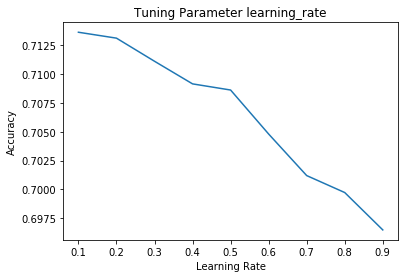

In [30]:
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score

lrs = []
avg_sco = []
for i in range(1, 10):
    lr = 0.1 * i
    lrs.append(lr)
    model = CatBoostClassifier(learning_rate=lr, loss_function='MultiClass')
    scores = cross_val_score(model, X, y, cv=10, scoring='accuracy')
    avg_sco.append(scores.mean())
    
plt.plot(lrs, avg_sco)
plt.xlabel('Learning Rate')
plt.ylabel('Accuracy')
plt.title('Tuning Parameter learning_rate')

Learning rate set to 0.095769
0:	learn: 1.0381050	total: 7.43ms	remaining: 7.43s
1:	learn: 0.9906385	total: 14.1ms	remaining: 7.03s
2:	learn: 0.9516166	total: 20.4ms	remaining: 6.77s
3:	learn: 0.9202257	total: 26.9ms	remaining: 6.71s
4:	learn: 0.8933143	total: 33.3ms	remaining: 6.62s
5:	learn: 0.8710751	total: 39.5ms	remaining: 6.55s
6:	learn: 0.8523459	total: 45.9ms	remaining: 6.51s
7:	learn: 0.8369520	total: 52.1ms	remaining: 6.46s
8:	learn: 0.8237735	total: 58.4ms	remaining: 6.43s
9:	learn: 0.8124347	total: 64.6ms	remaining: 6.39s
10:	learn: 0.8028964	total: 70.8ms	remaining: 6.37s
11:	learn: 0.7943183	total: 77.1ms	remaining: 6.35s
12:	learn: 0.7877983	total: 83.3ms	remaining: 6.33s
13:	learn: 0.7816049	total: 89.6ms	remaining: 6.31s
14:	learn: 0.7760353	total: 95.9ms	remaining: 6.3s
15:	learn: 0.7709675	total: 102ms	remaining: 6.3s
16:	learn: 0.7667153	total: 109ms	remaining: 6.28s
17:	learn: 0.7633367	total: 115ms	remaining: 6.27s
18:	learn: 0.7601381	total: 121ms	remaining: 6.25

172:	learn: 0.6942608	total: 1.26s	remaining: 6.04s
173:	learn: 0.6941705	total: 1.27s	remaining: 6.04s
174:	learn: 0.6940640	total: 1.28s	remaining: 6.04s
175:	learn: 0.6939691	total: 1.29s	remaining: 6.03s
176:	learn: 0.6938855	total: 1.3s	remaining: 6.03s
177:	learn: 0.6937727	total: 1.3s	remaining: 6.02s
178:	learn: 0.6936022	total: 1.31s	remaining: 6.02s
179:	learn: 0.6934729	total: 1.32s	remaining: 6.02s
180:	learn: 0.6933850	total: 1.33s	remaining: 6.03s
181:	learn: 0.6932757	total: 1.34s	remaining: 6.02s
182:	learn: 0.6931678	total: 1.35s	remaining: 6.01s
183:	learn: 0.6930837	total: 1.35s	remaining: 6s
184:	learn: 0.6929965	total: 1.36s	remaining: 5.99s
185:	learn: 0.6929024	total: 1.37s	remaining: 5.98s
186:	learn: 0.6928158	total: 1.37s	remaining: 5.97s
187:	learn: 0.6926955	total: 1.38s	remaining: 5.96s
188:	learn: 0.6925900	total: 1.39s	remaining: 5.95s
189:	learn: 0.6925049	total: 1.39s	remaining: 5.94s
190:	learn: 0.6924149	total: 1.4s	remaining: 5.93s
191:	learn: 0.6923

342:	learn: 0.6832235	total: 2.51s	remaining: 4.8s
343:	learn: 0.6832024	total: 2.52s	remaining: 4.8s
344:	learn: 0.6831704	total: 2.52s	remaining: 4.79s
345:	learn: 0.6831477	total: 2.53s	remaining: 4.79s
346:	learn: 0.6831091	total: 2.54s	remaining: 4.78s
347:	learn: 0.6830764	total: 2.54s	remaining: 4.77s
348:	learn: 0.6830354	total: 2.55s	remaining: 4.76s
349:	learn: 0.6830055	total: 2.56s	remaining: 4.75s
350:	learn: 0.6829715	total: 2.56s	remaining: 4.74s
351:	learn: 0.6829497	total: 2.57s	remaining: 4.73s
352:	learn: 0.6828806	total: 2.58s	remaining: 4.72s
353:	learn: 0.6828605	total: 2.58s	remaining: 4.71s
354:	learn: 0.6828185	total: 2.59s	remaining: 4.71s
355:	learn: 0.6827913	total: 2.6s	remaining: 4.7s
356:	learn: 0.6827586	total: 2.6s	remaining: 4.69s
357:	learn: 0.6827428	total: 2.61s	remaining: 4.68s
358:	learn: 0.6826964	total: 2.62s	remaining: 4.67s
359:	learn: 0.6826667	total: 2.62s	remaining: 4.66s
360:	learn: 0.6826377	total: 2.63s	remaining: 4.65s
361:	learn: 0.682

520:	learn: 0.6794741	total: 3.76s	remaining: 3.45s
521:	learn: 0.6794669	total: 3.77s	remaining: 3.45s
522:	learn: 0.6794544	total: 3.77s	remaining: 3.44s
523:	learn: 0.6794471	total: 3.78s	remaining: 3.43s
524:	learn: 0.6794379	total: 3.79s	remaining: 3.43s
525:	learn: 0.6794228	total: 3.8s	remaining: 3.42s
526:	learn: 0.6794120	total: 3.8s	remaining: 3.41s
527:	learn: 0.6794003	total: 3.81s	remaining: 3.4s
528:	learn: 0.6793894	total: 3.81s	remaining: 3.4s
529:	learn: 0.6793824	total: 3.82s	remaining: 3.39s
530:	learn: 0.6793317	total: 3.83s	remaining: 3.38s
531:	learn: 0.6793245	total: 3.83s	remaining: 3.37s
532:	learn: 0.6793144	total: 3.84s	remaining: 3.37s
533:	learn: 0.6793063	total: 3.85s	remaining: 3.36s
534:	learn: 0.6792963	total: 3.85s	remaining: 3.35s
535:	learn: 0.6792895	total: 3.86s	remaining: 3.34s
536:	learn: 0.6792749	total: 3.87s	remaining: 3.33s
537:	learn: 0.6792664	total: 3.87s	remaining: 3.33s
538:	learn: 0.6792555	total: 3.88s	remaining: 3.32s
539:	learn: 0.67

680:	learn: 0.6779581	total: 4.82s	remaining: 2.26s
681:	learn: 0.6779552	total: 4.83s	remaining: 2.25s
682:	learn: 0.6779502	total: 4.84s	remaining: 2.25s
683:	learn: 0.6779382	total: 4.84s	remaining: 2.24s
684:	learn: 0.6779339	total: 4.85s	remaining: 2.23s
685:	learn: 0.6779248	total: 4.86s	remaining: 2.22s
686:	learn: 0.6779139	total: 4.86s	remaining: 2.21s
687:	learn: 0.6779057	total: 4.87s	remaining: 2.21s
688:	learn: 0.6778962	total: 4.88s	remaining: 2.2s
689:	learn: 0.6778900	total: 4.88s	remaining: 2.19s
690:	learn: 0.6778864	total: 4.89s	remaining: 2.19s
691:	learn: 0.6778785	total: 4.89s	remaining: 2.18s
692:	learn: 0.6778709	total: 4.9s	remaining: 2.17s
693:	learn: 0.6778665	total: 4.91s	remaining: 2.16s
694:	learn: 0.6778635	total: 4.91s	remaining: 2.16s
695:	learn: 0.6778607	total: 4.92s	remaining: 2.15s
696:	learn: 0.6778578	total: 4.93s	remaining: 2.14s
697:	learn: 0.6778499	total: 4.93s	remaining: 2.13s
698:	learn: 0.6778447	total: 4.94s	remaining: 2.13s
699:	learn: 0.

844:	learn: 0.6771525	total: 5.91s	remaining: 1.08s
845:	learn: 0.6771487	total: 5.92s	remaining: 1.08s
846:	learn: 0.6771438	total: 5.93s	remaining: 1.07s
847:	learn: 0.6771412	total: 5.93s	remaining: 1.06s
848:	learn: 0.6771397	total: 5.94s	remaining: 1.06s
849:	learn: 0.6771385	total: 5.95s	remaining: 1.05s
850:	learn: 0.6771359	total: 5.95s	remaining: 1.04s
851:	learn: 0.6771336	total: 5.96s	remaining: 1.03s
852:	learn: 0.6771333	total: 5.96s	remaining: 1.03s
853:	learn: 0.6771327	total: 5.97s	remaining: 1.02s
854:	learn: 0.6771268	total: 5.98s	remaining: 1.01s
855:	learn: 0.6771248	total: 5.98s	remaining: 1.01s
856:	learn: 0.6771228	total: 5.99s	remaining: 1000ms
857:	learn: 0.6771211	total: 6s	remaining: 993ms
858:	learn: 0.6771178	total: 6s	remaining: 985ms
859:	learn: 0.6771159	total: 6.01s	remaining: 978ms
860:	learn: 0.6770997	total: 6.01s	remaining: 971ms
861:	learn: 0.6770956	total: 6.02s	remaining: 964ms
862:	learn: 0.6770945	total: 6.03s	remaining: 957ms
863:	learn: 0.677

16:	learn: 0.7671726	total: 118ms	remaining: 6.84s
17:	learn: 0.7634617	total: 127ms	remaining: 6.95s
18:	learn: 0.7603026	total: 136ms	remaining: 7.05s
19:	learn: 0.7575214	total: 146ms	remaining: 7.18s
20:	learn: 0.7551494	total: 155ms	remaining: 7.24s
21:	learn: 0.7527383	total: 166ms	remaining: 7.36s
22:	learn: 0.7504923	total: 174ms	remaining: 7.39s
23:	learn: 0.7488138	total: 182ms	remaining: 7.41s
24:	learn: 0.7469688	total: 191ms	remaining: 7.43s
25:	learn: 0.7453483	total: 200ms	remaining: 7.5s
26:	learn: 0.7439700	total: 207ms	remaining: 7.45s
27:	learn: 0.7426663	total: 213ms	remaining: 7.39s
28:	learn: 0.7414746	total: 222ms	remaining: 7.43s
29:	learn: 0.7402030	total: 231ms	remaining: 7.46s
30:	learn: 0.7391170	total: 239ms	remaining: 7.46s
31:	learn: 0.7378855	total: 245ms	remaining: 7.41s
32:	learn: 0.7369233	total: 255ms	remaining: 7.46s
33:	learn: 0.7360751	total: 261ms	remaining: 7.42s
34:	learn: 0.7352552	total: 270ms	remaining: 7.44s
35:	learn: 0.7345439	total: 277m

199:	learn: 0.6922691	total: 1.37s	remaining: 5.49s
200:	learn: 0.6921211	total: 1.38s	remaining: 5.48s
201:	learn: 0.6920556	total: 1.39s	remaining: 5.47s
202:	learn: 0.6919787	total: 1.4s	remaining: 5.48s
203:	learn: 0.6918879	total: 1.4s	remaining: 5.47s
204:	learn: 0.6918015	total: 1.41s	remaining: 5.46s
205:	learn: 0.6917401	total: 1.42s	remaining: 5.46s
206:	learn: 0.6916472	total: 1.42s	remaining: 5.46s
207:	learn: 0.6915821	total: 1.43s	remaining: 5.46s
208:	learn: 0.6915037	total: 1.44s	remaining: 5.46s
209:	learn: 0.6914037	total: 1.45s	remaining: 5.46s
210:	learn: 0.6913391	total: 1.46s	remaining: 5.46s
211:	learn: 0.6912612	total: 1.47s	remaining: 5.45s
212:	learn: 0.6912187	total: 1.47s	remaining: 5.44s
213:	learn: 0.6911527	total: 1.48s	remaining: 5.44s
214:	learn: 0.6910546	total: 1.49s	remaining: 5.43s
215:	learn: 0.6908374	total: 1.5s	remaining: 5.43s
216:	learn: 0.6907734	total: 1.5s	remaining: 5.42s
217:	learn: 0.6907143	total: 1.51s	remaining: 5.41s
218:	learn: 0.69

384:	learn: 0.6827927	total: 2.62s	remaining: 4.18s
385:	learn: 0.6827716	total: 2.62s	remaining: 4.17s
386:	learn: 0.6827483	total: 2.63s	remaining: 4.17s
387:	learn: 0.6827379	total: 2.64s	remaining: 4.16s
388:	learn: 0.6827211	total: 2.64s	remaining: 4.15s
389:	learn: 0.6827028	total: 2.65s	remaining: 4.14s
390:	learn: 0.6826840	total: 2.65s	remaining: 4.14s
391:	learn: 0.6826620	total: 2.66s	remaining: 4.13s
392:	learn: 0.6826402	total: 2.67s	remaining: 4.12s
393:	learn: 0.6826254	total: 2.67s	remaining: 4.11s
394:	learn: 0.6826070	total: 2.68s	remaining: 4.11s
395:	learn: 0.6825942	total: 2.69s	remaining: 4.1s
396:	learn: 0.6825794	total: 2.69s	remaining: 4.09s
397:	learn: 0.6825674	total: 2.7s	remaining: 4.08s
398:	learn: 0.6825372	total: 2.71s	remaining: 4.08s
399:	learn: 0.6824989	total: 2.71s	remaining: 4.07s
400:	learn: 0.6824839	total: 2.72s	remaining: 4.06s
401:	learn: 0.6824704	total: 2.73s	remaining: 4.05s
402:	learn: 0.6824413	total: 2.73s	remaining: 4.05s
403:	learn: 0.

543:	learn: 0.6800501	total: 3.69s	remaining: 3.09s
544:	learn: 0.6800454	total: 3.7s	remaining: 3.09s
545:	learn: 0.6800313	total: 3.7s	remaining: 3.08s
546:	learn: 0.6800235	total: 3.71s	remaining: 3.08s
547:	learn: 0.6800164	total: 3.73s	remaining: 3.07s
548:	learn: 0.6800050	total: 3.73s	remaining: 3.07s
549:	learn: 0.6799919	total: 3.74s	remaining: 3.06s
550:	learn: 0.6799812	total: 3.75s	remaining: 3.05s
551:	learn: 0.6799744	total: 3.75s	remaining: 3.04s
552:	learn: 0.6799528	total: 3.76s	remaining: 3.04s
553:	learn: 0.6799428	total: 3.77s	remaining: 3.04s
554:	learn: 0.6799327	total: 3.78s	remaining: 3.03s
555:	learn: 0.6799245	total: 3.79s	remaining: 3.03s
556:	learn: 0.6799186	total: 3.8s	remaining: 3.02s
557:	learn: 0.6799147	total: 3.8s	remaining: 3.01s
558:	learn: 0.6799025	total: 3.81s	remaining: 3s
559:	learn: 0.6798848	total: 3.82s	remaining: 3s
560:	learn: 0.6798783	total: 3.83s	remaining: 2.99s
561:	learn: 0.6798603	total: 3.83s	remaining: 2.99s
562:	learn: 0.6798408	

722:	learn: 0.6786341	total: 4.93s	remaining: 1.89s
723:	learn: 0.6786267	total: 4.94s	remaining: 1.88s
724:	learn: 0.6786229	total: 4.95s	remaining: 1.88s
725:	learn: 0.6786198	total: 4.96s	remaining: 1.87s
726:	learn: 0.6786179	total: 4.96s	remaining: 1.86s
727:	learn: 0.6786148	total: 4.97s	remaining: 1.86s
728:	learn: 0.6786089	total: 4.97s	remaining: 1.85s
729:	learn: 0.6786029	total: 4.98s	remaining: 1.84s
730:	learn: 0.6786022	total: 4.99s	remaining: 1.83s
731:	learn: 0.6785704	total: 4.99s	remaining: 1.83s
732:	learn: 0.6785679	total: 5s	remaining: 1.82s
733:	learn: 0.6785615	total: 5.01s	remaining: 1.81s
734:	learn: 0.6785572	total: 5.01s	remaining: 1.81s
735:	learn: 0.6785494	total: 5.02s	remaining: 1.8s
736:	learn: 0.6785469	total: 5.03s	remaining: 1.79s
737:	learn: 0.6785391	total: 5.03s	remaining: 1.79s
738:	learn: 0.6785210	total: 5.04s	remaining: 1.78s
739:	learn: 0.6785174	total: 5.04s	remaining: 1.77s
740:	learn: 0.6785120	total: 5.05s	remaining: 1.76s
741:	learn: 0.67

882:	learn: 0.6779679	total: 6s	remaining: 795ms
883:	learn: 0.6779668	total: 6.01s	remaining: 789ms
884:	learn: 0.6779633	total: 6.02s	remaining: 782ms
885:	learn: 0.6779598	total: 6.02s	remaining: 775ms
886:	learn: 0.6779576	total: 6.03s	remaining: 768ms
887:	learn: 0.6779536	total: 6.04s	remaining: 761ms
888:	learn: 0.6779503	total: 6.04s	remaining: 754ms
889:	learn: 0.6779460	total: 6.05s	remaining: 748ms
890:	learn: 0.6779446	total: 6.05s	remaining: 741ms
891:	learn: 0.6779386	total: 6.06s	remaining: 734ms
892:	learn: 0.6779343	total: 6.07s	remaining: 727ms
893:	learn: 0.6779304	total: 6.07s	remaining: 720ms
894:	learn: 0.6779272	total: 6.08s	remaining: 713ms
895:	learn: 0.6779262	total: 6.09s	remaining: 707ms
896:	learn: 0.6779258	total: 6.09s	remaining: 700ms
897:	learn: 0.6779247	total: 6.1s	remaining: 693ms
898:	learn: 0.6779213	total: 6.11s	remaining: 686ms
899:	learn: 0.6779190	total: 6.11s	remaining: 679ms
900:	learn: 0.6779178	total: 6.12s	remaining: 672ms
901:	learn: 0.67

57:	learn: 0.7209959	total: 407ms	remaining: 6.6s
58:	learn: 0.7202830	total: 415ms	remaining: 6.62s
59:	learn: 0.7196756	total: 422ms	remaining: 6.62s
60:	learn: 0.7191410	total: 430ms	remaining: 6.61s
61:	learn: 0.7186822	total: 436ms	remaining: 6.59s
62:	learn: 0.7183217	total: 442ms	remaining: 6.58s
63:	learn: 0.7179902	total: 449ms	remaining: 6.56s
64:	learn: 0.7175122	total: 455ms	remaining: 6.55s
65:	learn: 0.7170391	total: 461ms	remaining: 6.53s
66:	learn: 0.7166577	total: 468ms	remaining: 6.51s
67:	learn: 0.7162052	total: 474ms	remaining: 6.5s
68:	learn: 0.7157819	total: 480ms	remaining: 6.48s
69:	learn: 0.7153994	total: 487ms	remaining: 6.46s
70:	learn: 0.7151521	total: 493ms	remaining: 6.45s
71:	learn: 0.7148454	total: 499ms	remaining: 6.43s
72:	learn: 0.7146216	total: 506ms	remaining: 6.42s
73:	learn: 0.7141625	total: 512ms	remaining: 6.4s
74:	learn: 0.7137537	total: 518ms	remaining: 6.39s
75:	learn: 0.7134028	total: 524ms	remaining: 6.38s
76:	learn: 0.7130198	total: 531ms	

220:	learn: 0.6895171	total: 1.49s	remaining: 5.25s
221:	learn: 0.6894513	total: 1.5s	remaining: 5.25s
222:	learn: 0.6893824	total: 1.5s	remaining: 5.25s
223:	learn: 0.6893285	total: 1.51s	remaining: 5.24s
224:	learn: 0.6892641	total: 1.52s	remaining: 5.23s
225:	learn: 0.6891662	total: 1.52s	remaining: 5.22s
226:	learn: 0.6890995	total: 1.53s	remaining: 5.21s
227:	learn: 0.6890433	total: 1.54s	remaining: 5.21s
228:	learn: 0.6889800	total: 1.54s	remaining: 5.2s
229:	learn: 0.6888736	total: 1.55s	remaining: 5.19s
230:	learn: 0.6887886	total: 1.56s	remaining: 5.18s
231:	learn: 0.6887038	total: 1.56s	remaining: 5.17s
232:	learn: 0.6886308	total: 1.57s	remaining: 5.16s
233:	learn: 0.6885803	total: 1.57s	remaining: 5.16s
234:	learn: 0.6884928	total: 1.58s	remaining: 5.15s
235:	learn: 0.6884118	total: 1.59s	remaining: 5.14s
236:	learn: 0.6883645	total: 1.59s	remaining: 5.13s
237:	learn: 0.6883044	total: 1.6s	remaining: 5.12s
238:	learn: 0.6882440	total: 1.61s	remaining: 5.11s
239:	learn: 0.68

379:	learn: 0.6818013	total: 2.55s	remaining: 4.16s
380:	learn: 0.6817845	total: 2.56s	remaining: 4.16s
381:	learn: 0.6817593	total: 2.56s	remaining: 4.15s
382:	learn: 0.6817470	total: 2.57s	remaining: 4.14s
383:	learn: 0.6817096	total: 2.58s	remaining: 4.13s
384:	learn: 0.6816759	total: 2.58s	remaining: 4.13s
385:	learn: 0.6816525	total: 2.59s	remaining: 4.12s
386:	learn: 0.6816334	total: 2.6s	remaining: 4.11s
387:	learn: 0.6816108	total: 2.6s	remaining: 4.11s
388:	learn: 0.6815903	total: 2.61s	remaining: 4.1s
389:	learn: 0.6815663	total: 2.62s	remaining: 4.09s
390:	learn: 0.6815466	total: 2.62s	remaining: 4.08s
391:	learn: 0.6815305	total: 2.63s	remaining: 4.08s
392:	learn: 0.6814979	total: 2.63s	remaining: 4.07s
393:	learn: 0.6814683	total: 2.64s	remaining: 4.06s
394:	learn: 0.6814501	total: 2.65s	remaining: 4.05s
395:	learn: 0.6814201	total: 2.65s	remaining: 4.05s
396:	learn: 0.6813942	total: 2.66s	remaining: 4.04s
397:	learn: 0.6813765	total: 2.67s	remaining: 4.03s
398:	learn: 0.6

540:	learn: 0.6787634	total: 3.62s	remaining: 3.07s
541:	learn: 0.6787552	total: 3.63s	remaining: 3.07s
542:	learn: 0.6787084	total: 3.64s	remaining: 3.06s
543:	learn: 0.6787026	total: 3.64s	remaining: 3.05s
544:	learn: 0.6786978	total: 3.65s	remaining: 3.05s
545:	learn: 0.6786911	total: 3.66s	remaining: 3.04s
546:	learn: 0.6786752	total: 3.66s	remaining: 3.03s
547:	learn: 0.6786641	total: 3.67s	remaining: 3.03s
548:	learn: 0.6786604	total: 3.67s	remaining: 3.02s
549:	learn: 0.6786461	total: 3.68s	remaining: 3.01s
550:	learn: 0.6786446	total: 3.69s	remaining: 3s
551:	learn: 0.6786375	total: 3.69s	remaining: 3s
552:	learn: 0.6786321	total: 3.7s	remaining: 2.99s
553:	learn: 0.6786252	total: 3.71s	remaining: 2.98s
554:	learn: 0.6786198	total: 3.71s	remaining: 2.98s
555:	learn: 0.6786114	total: 3.72s	remaining: 2.97s
556:	learn: 0.6786041	total: 3.73s	remaining: 2.96s
557:	learn: 0.6785933	total: 3.73s	remaining: 2.96s
558:	learn: 0.6785869	total: 3.74s	remaining: 2.95s
559:	learn: 0.67858

699:	learn: 0.6774018	total: 4.68s	remaining: 2.01s
700:	learn: 0.6773965	total: 4.69s	remaining: 2s
701:	learn: 0.6773896	total: 4.7s	remaining: 1.99s
702:	learn: 0.6773851	total: 4.7s	remaining: 1.99s
703:	learn: 0.6773717	total: 4.71s	remaining: 1.98s
704:	learn: 0.6773667	total: 4.72s	remaining: 1.97s
705:	learn: 0.6773612	total: 4.72s	remaining: 1.97s
706:	learn: 0.6773476	total: 4.73s	remaining: 1.96s
707:	learn: 0.6773394	total: 4.74s	remaining: 1.95s
708:	learn: 0.6773346	total: 4.74s	remaining: 1.95s
709:	learn: 0.6773326	total: 4.75s	remaining: 1.94s
710:	learn: 0.6773277	total: 4.75s	remaining: 1.93s
711:	learn: 0.6773231	total: 4.76s	remaining: 1.93s
712:	learn: 0.6773195	total: 4.77s	remaining: 1.92s
713:	learn: 0.6773186	total: 4.77s	remaining: 1.91s
714:	learn: 0.6773168	total: 4.78s	remaining: 1.91s
715:	learn: 0.6773029	total: 4.79s	remaining: 1.9s
716:	learn: 0.6773027	total: 4.79s	remaining: 1.89s
717:	learn: 0.6773010	total: 4.8s	remaining: 1.88s
718:	learn: 0.67729

859:	learn: 0.6767180	total: 5.75s	remaining: 935ms
860:	learn: 0.6767171	total: 5.76s	remaining: 930ms
861:	learn: 0.6767161	total: 5.76s	remaining: 923ms
862:	learn: 0.6767123	total: 5.77s	remaining: 916ms
863:	learn: 0.6767109	total: 5.78s	remaining: 909ms
864:	learn: 0.6767070	total: 5.78s	remaining: 903ms
865:	learn: 0.6767059	total: 5.79s	remaining: 896ms
866:	learn: 0.6767018	total: 5.8s	remaining: 889ms
867:	learn: 0.6766995	total: 5.8s	remaining: 882ms
868:	learn: 0.6766978	total: 5.81s	remaining: 876ms
869:	learn: 0.6766936	total: 5.82s	remaining: 869ms
870:	learn: 0.6766920	total: 5.82s	remaining: 862ms
871:	learn: 0.6766914	total: 5.83s	remaining: 856ms
872:	learn: 0.6766850	total: 5.83s	remaining: 849ms
873:	learn: 0.6766762	total: 5.84s	remaining: 842ms
874:	learn: 0.6766743	total: 5.85s	remaining: 835ms
875:	learn: 0.6766705	total: 5.85s	remaining: 829ms
876:	learn: 0.6766671	total: 5.86s	remaining: 822ms
877:	learn: 0.6766658	total: 5.87s	remaining: 815ms
878:	learn: 0.

36:	learn: 0.7331888	total: 266ms	remaining: 6.93s
37:	learn: 0.7325685	total: 274ms	remaining: 6.95s
38:	learn: 0.7318655	total: 282ms	remaining: 6.95s
39:	learn: 0.7310573	total: 288ms	remaining: 6.92s
40:	learn: 0.7303983	total: 295ms	remaining: 6.89s
41:	learn: 0.7297493	total: 301ms	remaining: 6.87s
42:	learn: 0.7290178	total: 308ms	remaining: 6.84s
43:	learn: 0.7281739	total: 314ms	remaining: 6.83s
44:	learn: 0.7275540	total: 321ms	remaining: 6.81s
45:	learn: 0.7268771	total: 327ms	remaining: 6.78s
46:	learn: 0.7263867	total: 333ms	remaining: 6.76s
47:	learn: 0.7259107	total: 339ms	remaining: 6.73s
48:	learn: 0.7252664	total: 346ms	remaining: 6.71s
49:	learn: 0.7247620	total: 352ms	remaining: 6.69s
50:	learn: 0.7241616	total: 358ms	remaining: 6.67s
51:	learn: 0.7236101	total: 364ms	remaining: 6.64s
52:	learn: 0.7232008	total: 371ms	remaining: 6.63s
53:	learn: 0.7226984	total: 377ms	remaining: 6.61s
54:	learn: 0.7221109	total: 384ms	remaining: 6.59s
55:	learn: 0.7215507	total: 390

221:	learn: 0.6895067	total: 1.51s	remaining: 5.3s
222:	learn: 0.6894396	total: 1.52s	remaining: 5.29s
223:	learn: 0.6893678	total: 1.53s	remaining: 5.29s
224:	learn: 0.6893055	total: 1.53s	remaining: 5.28s
225:	learn: 0.6892439	total: 1.54s	remaining: 5.28s
226:	learn: 0.6891670	total: 1.55s	remaining: 5.27s
227:	learn: 0.6891115	total: 1.55s	remaining: 5.26s
228:	learn: 0.6890440	total: 1.56s	remaining: 5.25s
229:	learn: 0.6889410	total: 1.57s	remaining: 5.24s
230:	learn: 0.6888699	total: 1.57s	remaining: 5.23s
231:	learn: 0.6888142	total: 1.58s	remaining: 5.23s
232:	learn: 0.6886679	total: 1.58s	remaining: 5.22s
233:	learn: 0.6886208	total: 1.59s	remaining: 5.21s
234:	learn: 0.6885473	total: 1.6s	remaining: 5.2s
235:	learn: 0.6884819	total: 1.6s	remaining: 5.19s
236:	learn: 0.6884205	total: 1.61s	remaining: 5.18s
237:	learn: 0.6883494	total: 1.62s	remaining: 5.17s
238:	learn: 0.6882828	total: 1.62s	remaining: 5.17s
239:	learn: 0.6882416	total: 1.63s	remaining: 5.16s
240:	learn: 0.68

404:	learn: 0.6812621	total: 2.75s	remaining: 4.05s
405:	learn: 0.6812393	total: 2.76s	remaining: 4.04s
406:	learn: 0.6812077	total: 2.77s	remaining: 4.03s
407:	learn: 0.6811834	total: 2.77s	remaining: 4.02s
408:	learn: 0.6811685	total: 2.78s	remaining: 4.02s
409:	learn: 0.6811486	total: 2.79s	remaining: 4.01s
410:	learn: 0.6811213	total: 2.79s	remaining: 4s
411:	learn: 0.6810602	total: 2.8s	remaining: 4s
412:	learn: 0.6810440	total: 2.81s	remaining: 3.99s
413:	learn: 0.6810247	total: 2.81s	remaining: 3.98s
414:	learn: 0.6810049	total: 2.82s	remaining: 3.98s
415:	learn: 0.6809879	total: 2.83s	remaining: 3.97s
416:	learn: 0.6809754	total: 2.83s	remaining: 3.96s
417:	learn: 0.6809490	total: 2.84s	remaining: 3.96s
418:	learn: 0.6809088	total: 2.85s	remaining: 3.95s
419:	learn: 0.6808908	total: 2.85s	remaining: 3.94s
420:	learn: 0.6808702	total: 2.87s	remaining: 3.94s
421:	learn: 0.6808350	total: 2.87s	remaining: 3.94s
422:	learn: 0.6808203	total: 2.88s	remaining: 3.93s
423:	learn: 0.68080

588:	learn: 0.6785554	total: 4s	remaining: 2.79s
589:	learn: 0.6785491	total: 4.01s	remaining: 2.79s
590:	learn: 0.6785444	total: 4.02s	remaining: 2.78s
591:	learn: 0.6784895	total: 4.02s	remaining: 2.77s
592:	learn: 0.6784846	total: 4.03s	remaining: 2.77s
593:	learn: 0.6784788	total: 4.04s	remaining: 2.76s
594:	learn: 0.6784591	total: 4.05s	remaining: 2.75s
595:	learn: 0.6784493	total: 4.05s	remaining: 2.75s
596:	learn: 0.6784435	total: 4.06s	remaining: 2.74s
597:	learn: 0.6784363	total: 4.07s	remaining: 2.73s
598:	learn: 0.6784341	total: 4.07s	remaining: 2.73s
599:	learn: 0.6784312	total: 4.08s	remaining: 2.72s
600:	learn: 0.6784282	total: 4.08s	remaining: 2.71s
601:	learn: 0.6784261	total: 4.09s	remaining: 2.71s
602:	learn: 0.6784160	total: 4.1s	remaining: 2.7s
603:	learn: 0.6784091	total: 4.1s	remaining: 2.69s
604:	learn: 0.6783892	total: 4.11s	remaining: 2.68s
605:	learn: 0.6783873	total: 4.12s	remaining: 2.68s
606:	learn: 0.6783813	total: 4.12s	remaining: 2.67s
607:	learn: 0.6783

774:	learn: 0.6772139	total: 5.25s	remaining: 1.52s
775:	learn: 0.6772121	total: 5.25s	remaining: 1.52s
776:	learn: 0.6772091	total: 5.26s	remaining: 1.51s
777:	learn: 0.6772069	total: 5.27s	remaining: 1.5s
778:	learn: 0.6772037	total: 5.27s	remaining: 1.5s
779:	learn: 0.6772001	total: 5.28s	remaining: 1.49s
780:	learn: 0.6771915	total: 5.29s	remaining: 1.48s
781:	learn: 0.6771894	total: 5.29s	remaining: 1.48s
782:	learn: 0.6771878	total: 5.3s	remaining: 1.47s
783:	learn: 0.6771850	total: 5.31s	remaining: 1.46s
784:	learn: 0.6771785	total: 5.31s	remaining: 1.46s
785:	learn: 0.6771772	total: 5.32s	remaining: 1.45s
786:	learn: 0.6771738	total: 5.33s	remaining: 1.44s
787:	learn: 0.6771667	total: 5.33s	remaining: 1.43s
788:	learn: 0.6771606	total: 5.34s	remaining: 1.43s
789:	learn: 0.6771561	total: 5.34s	remaining: 1.42s
790:	learn: 0.6771526	total: 5.35s	remaining: 1.41s
791:	learn: 0.6771519	total: 5.36s	remaining: 1.41s
792:	learn: 0.6771502	total: 5.36s	remaining: 1.4s
793:	learn: 0.67

933:	learn: 0.6766447	total: 6.31s	remaining: 446ms
934:	learn: 0.6766437	total: 6.32s	remaining: 439ms
935:	learn: 0.6766409	total: 6.32s	remaining: 432ms
936:	learn: 0.6766336	total: 6.33s	remaining: 425ms
937:	learn: 0.6766279	total: 6.33s	remaining: 419ms
938:	learn: 0.6766249	total: 6.34s	remaining: 412ms
939:	learn: 0.6766218	total: 6.35s	remaining: 405ms
940:	learn: 0.6766181	total: 6.35s	remaining: 398ms
941:	learn: 0.6766170	total: 6.36s	remaining: 392ms
942:	learn: 0.6766133	total: 6.37s	remaining: 385ms
943:	learn: 0.6766072	total: 6.37s	remaining: 378ms
944:	learn: 0.6766029	total: 6.38s	remaining: 371ms
945:	learn: 0.6765972	total: 6.38s	remaining: 365ms
946:	learn: 0.6765956	total: 6.39s	remaining: 358ms
947:	learn: 0.6765953	total: 6.4s	remaining: 351ms
948:	learn: 0.6765882	total: 6.41s	remaining: 344ms
949:	learn: 0.6765871	total: 6.41s	remaining: 337ms
950:	learn: 0.6765851	total: 6.42s	remaining: 331ms
951:	learn: 0.6765840	total: 6.42s	remaining: 324ms
952:	learn: 0

115:	learn: 0.7037074	total: 772ms	remaining: 5.88s
116:	learn: 0.7034252	total: 783ms	remaining: 5.91s
117:	learn: 0.7032321	total: 790ms	remaining: 5.9s
118:	learn: 0.7030373	total: 797ms	remaining: 5.9s
119:	learn: 0.7028840	total: 803ms	remaining: 5.89s
120:	learn: 0.7026606	total: 809ms	remaining: 5.88s
121:	learn: 0.7024955	total: 816ms	remaining: 5.87s
122:	learn: 0.7023398	total: 822ms	remaining: 5.86s
123:	learn: 0.7021706	total: 829ms	remaining: 5.85s
124:	learn: 0.7019791	total: 835ms	remaining: 5.84s
125:	learn: 0.7017529	total: 841ms	remaining: 5.83s
126:	learn: 0.7015893	total: 847ms	remaining: 5.83s
127:	learn: 0.7014311	total: 854ms	remaining: 5.82s
128:	learn: 0.7013031	total: 860ms	remaining: 5.81s
129:	learn: 0.7011742	total: 866ms	remaining: 5.8s
130:	learn: 0.7009940	total: 872ms	remaining: 5.79s
131:	learn: 0.7007044	total: 879ms	remaining: 5.78s
132:	learn: 0.7005648	total: 885ms	remaining: 5.77s
133:	learn: 0.7004236	total: 891ms	remaining: 5.76s
134:	learn: 0.7

275:	learn: 0.6872101	total: 1.84s	remaining: 4.83s
276:	learn: 0.6871606	total: 1.85s	remaining: 4.83s
277:	learn: 0.6871094	total: 1.86s	remaining: 4.83s
278:	learn: 0.6870678	total: 1.86s	remaining: 4.82s
279:	learn: 0.6870275	total: 1.87s	remaining: 4.81s
280:	learn: 0.6869331	total: 1.88s	remaining: 4.81s
281:	learn: 0.6869014	total: 1.89s	remaining: 4.81s
282:	learn: 0.6868499	total: 1.9s	remaining: 4.81s
283:	learn: 0.6868028	total: 1.9s	remaining: 4.8s
284:	learn: 0.6867548	total: 1.91s	remaining: 4.79s
285:	learn: 0.6867251	total: 1.92s	remaining: 4.78s
286:	learn: 0.6865714	total: 1.92s	remaining: 4.78s
287:	learn: 0.6864707	total: 1.93s	remaining: 4.78s
288:	learn: 0.6863995	total: 1.94s	remaining: 4.77s
289:	learn: 0.6863527	total: 1.95s	remaining: 4.77s
290:	learn: 0.6862977	total: 1.96s	remaining: 4.77s
291:	learn: 0.6862718	total: 1.96s	remaining: 4.76s
292:	learn: 0.6862165	total: 1.97s	remaining: 4.75s
293:	learn: 0.6861773	total: 1.98s	remaining: 4.74s
294:	learn: 0.6

460:	learn: 0.6812877	total: 3.09s	remaining: 3.61s
461:	learn: 0.6812529	total: 3.1s	remaining: 3.61s
462:	learn: 0.6812340	total: 3.11s	remaining: 3.6s
463:	learn: 0.6812208	total: 3.11s	remaining: 3.6s
464:	learn: 0.6811913	total: 3.12s	remaining: 3.59s
465:	learn: 0.6811739	total: 3.13s	remaining: 3.58s
466:	learn: 0.6811669	total: 3.13s	remaining: 3.58s
467:	learn: 0.6810773	total: 3.14s	remaining: 3.57s
468:	learn: 0.6810642	total: 3.15s	remaining: 3.56s
469:	learn: 0.6810444	total: 3.15s	remaining: 3.55s
470:	learn: 0.6810295	total: 3.16s	remaining: 3.55s
471:	learn: 0.6810112	total: 3.17s	remaining: 3.54s
472:	learn: 0.6809849	total: 3.17s	remaining: 3.53s
473:	learn: 0.6809683	total: 3.18s	remaining: 3.53s
474:	learn: 0.6809529	total: 3.18s	remaining: 3.52s
475:	learn: 0.6809465	total: 3.19s	remaining: 3.51s
476:	learn: 0.6809293	total: 3.2s	remaining: 3.5s
477:	learn: 0.6809004	total: 3.2s	remaining: 3.5s
478:	learn: 0.6808885	total: 3.21s	remaining: 3.49s
479:	learn: 0.68087

619:	learn: 0.6793225	total: 4.15s	remaining: 2.54s
620:	learn: 0.6793152	total: 4.16s	remaining: 2.54s
621:	learn: 0.6793052	total: 4.17s	remaining: 2.53s
622:	learn: 0.6792975	total: 4.17s	remaining: 2.52s
623:	learn: 0.6792929	total: 4.18s	remaining: 2.52s
624:	learn: 0.6792848	total: 4.18s	remaining: 2.51s
625:	learn: 0.6792829	total: 4.19s	remaining: 2.5s
626:	learn: 0.6792778	total: 4.2s	remaining: 2.5s
627:	learn: 0.6792655	total: 4.2s	remaining: 2.49s
628:	learn: 0.6792610	total: 4.21s	remaining: 2.48s
629:	learn: 0.6792569	total: 4.22s	remaining: 2.48s
630:	learn: 0.6792522	total: 4.22s	remaining: 2.47s
631:	learn: 0.6792439	total: 4.23s	remaining: 2.46s
632:	learn: 0.6792338	total: 4.24s	remaining: 2.46s
633:	learn: 0.6792308	total: 4.24s	remaining: 2.45s
634:	learn: 0.6792249	total: 4.25s	remaining: 2.44s
635:	learn: 0.6792209	total: 4.25s	remaining: 2.43s
636:	learn: 0.6792116	total: 4.26s	remaining: 2.43s
637:	learn: 0.6792065	total: 4.27s	remaining: 2.42s
638:	learn: 0.67

780:	learn: 0.6783631	total: 5.22s	remaining: 1.46s
781:	learn: 0.6783602	total: 5.23s	remaining: 1.46s
782:	learn: 0.6783529	total: 5.24s	remaining: 1.45s
783:	learn: 0.6783499	total: 5.24s	remaining: 1.44s
784:	learn: 0.6783457	total: 5.25s	remaining: 1.44s
785:	learn: 0.6783430	total: 5.26s	remaining: 1.43s
786:	learn: 0.6783405	total: 5.26s	remaining: 1.42s
787:	learn: 0.6783375	total: 5.27s	remaining: 1.42s
788:	learn: 0.6783339	total: 5.28s	remaining: 1.41s
789:	learn: 0.6783313	total: 5.28s	remaining: 1.4s
790:	learn: 0.6783254	total: 5.29s	remaining: 1.4s
791:	learn: 0.6783223	total: 5.29s	remaining: 1.39s
792:	learn: 0.6783175	total: 5.3s	remaining: 1.38s
793:	learn: 0.6783157	total: 5.31s	remaining: 1.38s
794:	learn: 0.6783105	total: 5.31s	remaining: 1.37s
795:	learn: 0.6783078	total: 5.32s	remaining: 1.36s
796:	learn: 0.6783066	total: 5.33s	remaining: 1.36s
797:	learn: 0.6783049	total: 5.33s	remaining: 1.35s
798:	learn: 0.6782988	total: 5.34s	remaining: 1.34s
799:	learn: 0.6

941:	learn: 0.6777620	total: 6.29s	remaining: 388ms
942:	learn: 0.6777562	total: 6.3s	remaining: 381ms
943:	learn: 0.6777545	total: 6.31s	remaining: 374ms
944:	learn: 0.6777514	total: 6.32s	remaining: 368ms
945:	learn: 0.6777497	total: 6.32s	remaining: 361ms
946:	learn: 0.6777480	total: 6.33s	remaining: 354ms
947:	learn: 0.6777437	total: 6.34s	remaining: 348ms
948:	learn: 0.6777423	total: 6.34s	remaining: 341ms
949:	learn: 0.6777332	total: 6.35s	remaining: 334ms
950:	learn: 0.6777316	total: 6.36s	remaining: 328ms
951:	learn: 0.6777302	total: 6.36s	remaining: 321ms
952:	learn: 0.6777118	total: 6.37s	remaining: 314ms
953:	learn: 0.6776804	total: 6.38s	remaining: 307ms
954:	learn: 0.6776770	total: 6.38s	remaining: 301ms
955:	learn: 0.6776753	total: 6.39s	remaining: 294ms
956:	learn: 0.6776735	total: 6.39s	remaining: 287ms
957:	learn: 0.6776732	total: 6.4s	remaining: 281ms
958:	learn: 0.6776720	total: 6.41s	remaining: 274ms
959:	learn: 0.6776692	total: 6.41s	remaining: 267ms
960:	learn: 0.

123:	learn: 0.7020356	total: 813ms	remaining: 5.75s
124:	learn: 0.7018311	total: 822ms	remaining: 5.75s
125:	learn: 0.7016587	total: 833ms	remaining: 5.78s
126:	learn: 0.7014871	total: 841ms	remaining: 5.78s
127:	learn: 0.7012797	total: 849ms	remaining: 5.78s
128:	learn: 0.7011121	total: 855ms	remaining: 5.78s
129:	learn: 0.7009322	total: 862ms	remaining: 5.77s
130:	learn: 0.7007595	total: 869ms	remaining: 5.76s
131:	learn: 0.7006124	total: 877ms	remaining: 5.77s
132:	learn: 0.7004244	total: 885ms	remaining: 5.77s
133:	learn: 0.7003068	total: 893ms	remaining: 5.77s
134:	learn: 0.7001653	total: 901ms	remaining: 5.77s
135:	learn: 0.7000425	total: 908ms	remaining: 5.77s
136:	learn: 0.6999316	total: 916ms	remaining: 5.77s
137:	learn: 0.6997946	total: 923ms	remaining: 5.77s
138:	learn: 0.6996128	total: 931ms	remaining: 5.77s
139:	learn: 0.6994745	total: 938ms	remaining: 5.76s
140:	learn: 0.6993500	total: 944ms	remaining: 5.75s
141:	learn: 0.6992031	total: 950ms	remaining: 5.74s
142:	learn: 

307:	learn: 0.6853695	total: 2.06s	remaining: 4.62s
308:	learn: 0.6853296	total: 2.07s	remaining: 4.62s
309:	learn: 0.6852817	total: 2.07s	remaining: 4.62s
310:	learn: 0.6852665	total: 2.08s	remaining: 4.61s
311:	learn: 0.6852322	total: 2.09s	remaining: 4.6s
312:	learn: 0.6852118	total: 2.09s	remaining: 4.59s
313:	learn: 0.6851027	total: 2.1s	remaining: 4.59s
314:	learn: 0.6850591	total: 2.11s	remaining: 4.58s
315:	learn: 0.6849766	total: 2.11s	remaining: 4.57s
316:	learn: 0.6849312	total: 2.12s	remaining: 4.57s
317:	learn: 0.6849069	total: 2.13s	remaining: 4.56s
318:	learn: 0.6848652	total: 2.13s	remaining: 4.55s
319:	learn: 0.6848483	total: 2.14s	remaining: 4.54s
320:	learn: 0.6848080	total: 2.14s	remaining: 4.54s
321:	learn: 0.6847906	total: 2.15s	remaining: 4.53s
322:	learn: 0.6847480	total: 2.16s	remaining: 4.52s
323:	learn: 0.6847104	total: 2.16s	remaining: 4.51s
324:	learn: 0.6846844	total: 2.17s	remaining: 4.5s
325:	learn: 0.6846438	total: 2.17s	remaining: 4.5s
326:	learn: 0.68

467:	learn: 0.6808053	total: 3.12s	remaining: 3.55s
468:	learn: 0.6807906	total: 3.13s	remaining: 3.55s
469:	learn: 0.6807761	total: 3.14s	remaining: 3.54s
470:	learn: 0.6807655	total: 3.15s	remaining: 3.54s
471:	learn: 0.6807532	total: 3.15s	remaining: 3.53s
472:	learn: 0.6807300	total: 3.16s	remaining: 3.52s
473:	learn: 0.6807079	total: 3.17s	remaining: 3.51s
474:	learn: 0.6806929	total: 3.17s	remaining: 3.51s
475:	learn: 0.6806812	total: 3.18s	remaining: 3.5s
476:	learn: 0.6806635	total: 3.19s	remaining: 3.49s
477:	learn: 0.6806487	total: 3.19s	remaining: 3.49s
478:	learn: 0.6806292	total: 3.2s	remaining: 3.48s
479:	learn: 0.6806163	total: 3.21s	remaining: 3.47s
480:	learn: 0.6806012	total: 3.21s	remaining: 3.46s
481:	learn: 0.6805857	total: 3.22s	remaining: 3.46s
482:	learn: 0.6805782	total: 3.22s	remaining: 3.45s
483:	learn: 0.6805652	total: 3.23s	remaining: 3.44s
484:	learn: 0.6805493	total: 3.24s	remaining: 3.44s
485:	learn: 0.6805321	total: 3.24s	remaining: 3.43s
486:	learn: 0.

626:	learn: 0.6790876	total: 4.18s	remaining: 2.49s
627:	learn: 0.6790758	total: 4.19s	remaining: 2.48s
628:	learn: 0.6790714	total: 4.2s	remaining: 2.48s
629:	learn: 0.6790655	total: 4.21s	remaining: 2.47s
630:	learn: 0.6790626	total: 4.21s	remaining: 2.46s
631:	learn: 0.6790571	total: 4.22s	remaining: 2.46s
632:	learn: 0.6790475	total: 4.23s	remaining: 2.45s
633:	learn: 0.6790453	total: 4.23s	remaining: 2.44s
634:	learn: 0.6790403	total: 4.24s	remaining: 2.44s
635:	learn: 0.6790358	total: 4.25s	remaining: 2.43s
636:	learn: 0.6790308	total: 4.25s	remaining: 2.42s
637:	learn: 0.6790259	total: 4.26s	remaining: 2.42s
638:	learn: 0.6790214	total: 4.26s	remaining: 2.41s
639:	learn: 0.6790133	total: 4.27s	remaining: 2.4s
640:	learn: 0.6790104	total: 4.28s	remaining: 2.4s
641:	learn: 0.6790084	total: 4.28s	remaining: 2.39s
642:	learn: 0.6790049	total: 4.29s	remaining: 2.38s
643:	learn: 0.6790042	total: 4.3s	remaining: 2.37s
644:	learn: 0.6789912	total: 4.3s	remaining: 2.37s
645:	learn: 0.678

788:	learn: 0.6781190	total: 5.26s	remaining: 1.41s
789:	learn: 0.6781159	total: 5.27s	remaining: 1.4s
790:	learn: 0.6781006	total: 5.28s	remaining: 1.39s
791:	learn: 0.6780973	total: 5.28s	remaining: 1.39s
792:	learn: 0.6780940	total: 5.29s	remaining: 1.38s
793:	learn: 0.6780929	total: 5.29s	remaining: 1.37s
794:	learn: 0.6780869	total: 5.3s	remaining: 1.37s
795:	learn: 0.6780844	total: 5.31s	remaining: 1.36s
796:	learn: 0.6780761	total: 5.32s	remaining: 1.35s
797:	learn: 0.6780751	total: 5.32s	remaining: 1.35s
798:	learn: 0.6780695	total: 5.33s	remaining: 1.34s
799:	learn: 0.6780649	total: 5.33s	remaining: 1.33s
800:	learn: 0.6780630	total: 5.34s	remaining: 1.33s
801:	learn: 0.6780575	total: 5.35s	remaining: 1.32s
802:	learn: 0.6780544	total: 5.35s	remaining: 1.31s
803:	learn: 0.6780543	total: 5.36s	remaining: 1.31s
804:	learn: 0.6780523	total: 5.37s	remaining: 1.3s
805:	learn: 0.6780510	total: 5.37s	remaining: 1.29s
806:	learn: 0.6780491	total: 5.38s	remaining: 1.29s
807:	learn: 0.6

949:	learn: 0.6774675	total: 6.33s	remaining: 333ms
950:	learn: 0.6774659	total: 6.34s	remaining: 327ms
951:	learn: 0.6774645	total: 6.35s	remaining: 320ms
952:	learn: 0.6774428	total: 6.35s	remaining: 313ms
953:	learn: 0.6774086	total: 6.36s	remaining: 307ms
954:	learn: 0.6774077	total: 6.37s	remaining: 300ms
955:	learn: 0.6774064	total: 6.37s	remaining: 293ms
956:	learn: 0.6774040	total: 6.38s	remaining: 287ms
957:	learn: 0.6774035	total: 6.38s	remaining: 280ms
958:	learn: 0.6774033	total: 6.39s	remaining: 273ms
959:	learn: 0.6774016	total: 6.4s	remaining: 267ms
960:	learn: 0.6774002	total: 6.41s	remaining: 260ms
961:	learn: 0.6773971	total: 6.41s	remaining: 253ms
962:	learn: 0.6773958	total: 6.42s	remaining: 247ms
963:	learn: 0.6773943	total: 6.42s	remaining: 240ms
964:	learn: 0.6773933	total: 6.43s	remaining: 233ms
965:	learn: 0.6773916	total: 6.44s	remaining: 227ms
966:	learn: 0.6773905	total: 6.44s	remaining: 220ms
967:	learn: 0.6773899	total: 6.45s	remaining: 213ms
968:	learn: 0

124:	learn: 0.7014506	total: 838ms	remaining: 5.87s
125:	learn: 0.7012950	total: 848ms	remaining: 5.88s
126:	learn: 0.7011725	total: 855ms	remaining: 5.88s
127:	learn: 0.7009689	total: 862ms	remaining: 5.87s
128:	learn: 0.7008045	total: 868ms	remaining: 5.86s
129:	learn: 0.7006752	total: 874ms	remaining: 5.85s
130:	learn: 0.7005196	total: 881ms	remaining: 5.84s
131:	learn: 0.7003845	total: 887ms	remaining: 5.83s
132:	learn: 0.7002031	total: 894ms	remaining: 5.82s
133:	learn: 0.7000290	total: 900ms	remaining: 5.81s
134:	learn: 0.6998787	total: 906ms	remaining: 5.81s
135:	learn: 0.6997337	total: 912ms	remaining: 5.8s
136:	learn: 0.6995215	total: 919ms	remaining: 5.79s
137:	learn: 0.6994066	total: 925ms	remaining: 5.78s
138:	learn: 0.6992253	total: 931ms	remaining: 5.77s
139:	learn: 0.6991109	total: 938ms	remaining: 5.76s
140:	learn: 0.6989947	total: 944ms	remaining: 5.75s
141:	learn: 0.6988770	total: 951ms	remaining: 5.74s
142:	learn: 0.6986971	total: 957ms	remaining: 5.74s
143:	learn: 0

283:	learn: 0.6860846	total: 1.9s	remaining: 4.8s
284:	learn: 0.6860590	total: 1.91s	remaining: 4.8s
285:	learn: 0.6860064	total: 1.92s	remaining: 4.79s
286:	learn: 0.6859115	total: 1.93s	remaining: 4.79s
287:	learn: 0.6858817	total: 1.93s	remaining: 4.78s
288:	learn: 0.6858440	total: 1.94s	remaining: 4.78s
289:	learn: 0.6858000	total: 1.95s	remaining: 4.77s
290:	learn: 0.6857502	total: 1.95s	remaining: 4.76s
291:	learn: 0.6856870	total: 1.96s	remaining: 4.75s
292:	learn: 0.6856431	total: 1.97s	remaining: 4.75s
293:	learn: 0.6855833	total: 1.97s	remaining: 4.74s
294:	learn: 0.6855168	total: 1.98s	remaining: 4.73s
295:	learn: 0.6853470	total: 1.99s	remaining: 4.72s
296:	learn: 0.6853108	total: 1.99s	remaining: 4.71s
297:	learn: 0.6852689	total: 2s	remaining: 4.71s
298:	learn: 0.6852023	total: 2s	remaining: 4.7s
299:	learn: 0.6851715	total: 2.01s	remaining: 4.69s
300:	learn: 0.6851260	total: 2.02s	remaining: 4.68s
301:	learn: 0.6851022	total: 2.02s	remaining: 4.68s
302:	learn: 0.6850650	

443:	learn: 0.6806968	total: 2.97s	remaining: 3.72s
444:	learn: 0.6806798	total: 2.98s	remaining: 3.72s
445:	learn: 0.6806695	total: 2.99s	remaining: 3.71s
446:	learn: 0.6806493	total: 3s	remaining: 3.71s
447:	learn: 0.6806307	total: 3s	remaining: 3.7s
448:	learn: 0.6806214	total: 3.01s	remaining: 3.69s
449:	learn: 0.6806018	total: 3.01s	remaining: 3.68s
450:	learn: 0.6805824	total: 3.02s	remaining: 3.68s
451:	learn: 0.6805458	total: 3.03s	remaining: 3.67s
452:	learn: 0.6805133	total: 3.03s	remaining: 3.66s
453:	learn: 0.6805032	total: 3.04s	remaining: 3.65s
454:	learn: 0.6804955	total: 3.04s	remaining: 3.65s
455:	learn: 0.6804795	total: 3.05s	remaining: 3.64s
456:	learn: 0.6804662	total: 3.06s	remaining: 3.63s
457:	learn: 0.6804345	total: 3.06s	remaining: 3.63s
458:	learn: 0.6803977	total: 3.07s	remaining: 3.62s
459:	learn: 0.6803802	total: 3.08s	remaining: 3.61s
460:	learn: 0.6803738	total: 3.08s	remaining: 3.6s
461:	learn: 0.6803033	total: 3.09s	remaining: 3.6s
462:	learn: 0.6802803

603:	learn: 0.6786768	total: 4.04s	remaining: 2.65s
604:	learn: 0.6786714	total: 4.04s	remaining: 2.64s
605:	learn: 0.6786307	total: 4.05s	remaining: 2.63s
606:	learn: 0.6786283	total: 4.06s	remaining: 2.63s
607:	learn: 0.6786251	total: 4.06s	remaining: 2.62s
608:	learn: 0.6785793	total: 4.07s	remaining: 2.61s
609:	learn: 0.6785693	total: 4.08s	remaining: 2.61s
610:	learn: 0.6785538	total: 4.08s	remaining: 2.6s
611:	learn: 0.6785309	total: 4.09s	remaining: 2.59s
612:	learn: 0.6785247	total: 4.1s	remaining: 2.59s
613:	learn: 0.6785011	total: 4.1s	remaining: 2.58s
614:	learn: 0.6784921	total: 4.11s	remaining: 2.57s
615:	learn: 0.6784852	total: 4.12s	remaining: 2.56s
616:	learn: 0.6784807	total: 4.12s	remaining: 2.56s
617:	learn: 0.6784701	total: 4.13s	remaining: 2.55s
618:	learn: 0.6784611	total: 4.13s	remaining: 2.54s
619:	learn: 0.6784543	total: 4.14s	remaining: 2.54s
620:	learn: 0.6784482	total: 4.15s	remaining: 2.53s
621:	learn: 0.6784391	total: 4.15s	remaining: 2.52s
622:	learn: 0.6

765:	learn: 0.6775041	total: 5.11s	remaining: 1.56s
766:	learn: 0.6775028	total: 5.12s	remaining: 1.55s
767:	learn: 0.6775003	total: 5.12s	remaining: 1.55s
768:	learn: 0.6774973	total: 5.13s	remaining: 1.54s
769:	learn: 0.6774956	total: 5.14s	remaining: 1.53s
770:	learn: 0.6774902	total: 5.14s	remaining: 1.53s
771:	learn: 0.6774857	total: 5.15s	remaining: 1.52s
772:	learn: 0.6774802	total: 5.16s	remaining: 1.51s
773:	learn: 0.6774780	total: 5.16s	remaining: 1.51s
774:	learn: 0.6774767	total: 5.17s	remaining: 1.5s
775:	learn: 0.6774751	total: 5.17s	remaining: 1.49s
776:	learn: 0.6774719	total: 5.18s	remaining: 1.49s
777:	learn: 0.6774702	total: 5.19s	remaining: 1.48s
778:	learn: 0.6774591	total: 5.19s	remaining: 1.47s
779:	learn: 0.6774531	total: 5.2s	remaining: 1.47s
780:	learn: 0.6774481	total: 5.21s	remaining: 1.46s
781:	learn: 0.6774452	total: 5.21s	remaining: 1.45s
782:	learn: 0.6774355	total: 5.22s	remaining: 1.45s
783:	learn: 0.6774348	total: 5.23s	remaining: 1.44s
784:	learn: 0.

948:	learn: 0.6768609	total: 6.34s	remaining: 341ms
949:	learn: 0.6768506	total: 6.35s	remaining: 334ms
950:	learn: 0.6768492	total: 6.36s	remaining: 328ms
951:	learn: 0.6768487	total: 6.36s	remaining: 321ms
952:	learn: 0.6768442	total: 6.37s	remaining: 314ms
953:	learn: 0.6768249	total: 6.38s	remaining: 307ms
954:	learn: 0.6768208	total: 6.38s	remaining: 301ms
955:	learn: 0.6768207	total: 6.39s	remaining: 294ms
956:	learn: 0.6768203	total: 6.4s	remaining: 287ms
957:	learn: 0.6768189	total: 6.4s	remaining: 281ms
958:	learn: 0.6768164	total: 6.41s	remaining: 274ms
959:	learn: 0.6768152	total: 6.41s	remaining: 267ms
960:	learn: 0.6768138	total: 6.42s	remaining: 261ms
961:	learn: 0.6767976	total: 6.43s	remaining: 254ms
962:	learn: 0.6767953	total: 6.44s	remaining: 247ms
963:	learn: 0.6767947	total: 6.44s	remaining: 241ms
964:	learn: 0.6767945	total: 6.45s	remaining: 234ms
965:	learn: 0.6767931	total: 6.46s	remaining: 227ms
966:	learn: 0.6767916	total: 6.47s	remaining: 221ms
967:	learn: 0.

133:	learn: 0.6986506	total: 902ms	remaining: 5.83s
134:	learn: 0.6985374	total: 910ms	remaining: 5.83s
135:	learn: 0.6983763	total: 919ms	remaining: 5.83s
136:	learn: 0.6982103	total: 925ms	remaining: 5.83s
137:	learn: 0.6980634	total: 931ms	remaining: 5.82s
138:	learn: 0.6978664	total: 938ms	remaining: 5.81s
139:	learn: 0.6977453	total: 944ms	remaining: 5.8s
140:	learn: 0.6976236	total: 951ms	remaining: 5.79s
141:	learn: 0.6974897	total: 957ms	remaining: 5.78s
142:	learn: 0.6973116	total: 963ms	remaining: 5.77s
143:	learn: 0.6972088	total: 970ms	remaining: 5.76s
144:	learn: 0.6970957	total: 976ms	remaining: 5.75s
145:	learn: 0.6969192	total: 982ms	remaining: 5.75s
146:	learn: 0.6967042	total: 988ms	remaining: 5.74s
147:	learn: 0.6965585	total: 995ms	remaining: 5.72s
148:	learn: 0.6964319	total: 1s	remaining: 5.72s
149:	learn: 0.6963075	total: 1.01s	remaining: 5.71s
150:	learn: 0.6961925	total: 1.01s	remaining: 5.7s
151:	learn: 0.6958715	total: 1.02s	remaining: 5.69s
152:	learn: 0.695

319:	learn: 0.6828649	total: 2.15s	remaining: 4.56s
320:	learn: 0.6828285	total: 2.16s	remaining: 4.56s
321:	learn: 0.6827819	total: 2.16s	remaining: 4.56s
322:	learn: 0.6827591	total: 2.17s	remaining: 4.55s
323:	learn: 0.6827080	total: 2.18s	remaining: 4.54s
324:	learn: 0.6826532	total: 2.18s	remaining: 4.54s
325:	learn: 0.6826298	total: 2.19s	remaining: 4.53s
326:	learn: 0.6825949	total: 2.2s	remaining: 4.52s
327:	learn: 0.6825711	total: 2.2s	remaining: 4.51s
328:	learn: 0.6825147	total: 2.21s	remaining: 4.51s
329:	learn: 0.6824751	total: 2.22s	remaining: 4.5s
330:	learn: 0.6824344	total: 2.22s	remaining: 4.49s
331:	learn: 0.6823982	total: 2.23s	remaining: 4.49s
332:	learn: 0.6823537	total: 2.23s	remaining: 4.48s
333:	learn: 0.6823203	total: 2.24s	remaining: 4.47s
334:	learn: 0.6822798	total: 2.25s	remaining: 4.46s
335:	learn: 0.6822074	total: 2.25s	remaining: 4.46s
336:	learn: 0.6821849	total: 2.26s	remaining: 4.45s
337:	learn: 0.6821386	total: 2.27s	remaining: 4.44s
338:	learn: 0.6

506:	learn: 0.6783009	total: 3.4s	remaining: 3.3s
507:	learn: 0.6782887	total: 3.4s	remaining: 3.3s
508:	learn: 0.6782748	total: 3.41s	remaining: 3.29s
509:	learn: 0.6782672	total: 3.42s	remaining: 3.29s
510:	learn: 0.6782569	total: 3.43s	remaining: 3.28s
511:	learn: 0.6782516	total: 3.43s	remaining: 3.27s
512:	learn: 0.6782438	total: 3.44s	remaining: 3.26s
513:	learn: 0.6782338	total: 3.44s	remaining: 3.26s
514:	learn: 0.6782142	total: 3.45s	remaining: 3.25s
515:	learn: 0.6782048	total: 3.46s	remaining: 3.24s
516:	learn: 0.6781555	total: 3.46s	remaining: 3.24s
517:	learn: 0.6781447	total: 3.47s	remaining: 3.23s
518:	learn: 0.6781398	total: 3.48s	remaining: 3.22s
519:	learn: 0.6781220	total: 3.49s	remaining: 3.22s
520:	learn: 0.6781075	total: 3.49s	remaining: 3.21s
521:	learn: 0.6780931	total: 3.5s	remaining: 3.21s
522:	learn: 0.6780830	total: 3.51s	remaining: 3.2s
523:	learn: 0.6780734	total: 3.52s	remaining: 3.19s
524:	learn: 0.6780606	total: 3.52s	remaining: 3.19s
525:	learn: 0.6780

689:	learn: 0.6764486	total: 4.63s	remaining: 2.08s
690:	learn: 0.6764415	total: 4.63s	remaining: 2.07s
691:	learn: 0.6764378	total: 4.64s	remaining: 2.07s
692:	learn: 0.6764345	total: 4.65s	remaining: 2.06s
693:	learn: 0.6764314	total: 4.66s	remaining: 2.05s
694:	learn: 0.6764261	total: 4.66s	remaining: 2.05s
695:	learn: 0.6764217	total: 4.67s	remaining: 2.04s
696:	learn: 0.6764121	total: 4.67s	remaining: 2.03s
697:	learn: 0.6764062	total: 4.68s	remaining: 2.02s
698:	learn: 0.6764026	total: 4.69s	remaining: 2.02s
699:	learn: 0.6764016	total: 4.69s	remaining: 2.01s
700:	learn: 0.6763937	total: 4.7s	remaining: 2s
701:	learn: 0.6763746	total: 4.71s	remaining: 2s
702:	learn: 0.6763679	total: 4.71s	remaining: 1.99s
703:	learn: 0.6763674	total: 4.72s	remaining: 1.98s
704:	learn: 0.6763616	total: 4.72s	remaining: 1.98s
705:	learn: 0.6763550	total: 4.73s	remaining: 1.97s
706:	learn: 0.6763468	total: 4.74s	remaining: 1.96s
707:	learn: 0.6763418	total: 4.74s	remaining: 1.96s
708:	learn: 0.67633

850:	learn: 0.6756494	total: 5.7s	remaining: 998ms
851:	learn: 0.6756435	total: 5.71s	remaining: 992ms
852:	learn: 0.6756423	total: 5.72s	remaining: 986ms
853:	learn: 0.6756293	total: 5.72s	remaining: 979ms
854:	learn: 0.6756291	total: 5.73s	remaining: 972ms
855:	learn: 0.6756291	total: 5.74s	remaining: 965ms
856:	learn: 0.6756252	total: 5.74s	remaining: 959ms
857:	learn: 0.6756176	total: 5.75s	remaining: 952ms
858:	learn: 0.6756175	total: 5.76s	remaining: 945ms
859:	learn: 0.6756134	total: 5.76s	remaining: 938ms
860:	learn: 0.6756124	total: 5.77s	remaining: 932ms
861:	learn: 0.6756073	total: 5.78s	remaining: 925ms
862:	learn: 0.6756063	total: 5.78s	remaining: 918ms
863:	learn: 0.6756047	total: 5.79s	remaining: 911ms
864:	learn: 0.6756016	total: 5.79s	remaining: 904ms
865:	learn: 0.6755970	total: 5.8s	remaining: 898ms
866:	learn: 0.6755952	total: 5.81s	remaining: 891ms
867:	learn: 0.6755910	total: 5.81s	remaining: 884ms
868:	learn: 0.6755875	total: 5.82s	remaining: 877ms
869:	learn: 0.

28:	learn: 0.7407183	total: 193ms	remaining: 6.46s
29:	learn: 0.7393798	total: 203ms	remaining: 6.58s
30:	learn: 0.7381985	total: 211ms	remaining: 6.59s
31:	learn: 0.7371597	total: 217ms	remaining: 6.57s
32:	learn: 0.7362132	total: 224ms	remaining: 6.56s
33:	learn: 0.7353277	total: 230ms	remaining: 6.54s
34:	learn: 0.7345156	total: 237ms	remaining: 6.52s
35:	learn: 0.7336569	total: 243ms	remaining: 6.51s
36:	learn: 0.7327568	total: 249ms	remaining: 6.49s
37:	learn: 0.7321295	total: 256ms	remaining: 6.47s
38:	learn: 0.7313197	total: 262ms	remaining: 6.45s
39:	learn: 0.7305869	total: 268ms	remaining: 6.44s
40:	learn: 0.7298211	total: 275ms	remaining: 6.42s
41:	learn: 0.7291210	total: 281ms	remaining: 6.4s
42:	learn: 0.7284697	total: 288ms	remaining: 6.41s
43:	learn: 0.7277563	total: 294ms	remaining: 6.39s
44:	learn: 0.7270103	total: 301ms	remaining: 6.38s
45:	learn: 0.7263809	total: 307ms	remaining: 6.36s
46:	learn: 0.7257707	total: 313ms	remaining: 6.35s
47:	learn: 0.7252179	total: 319m

192:	learn: 0.6909644	total: 1.29s	remaining: 5.38s
193:	learn: 0.6908724	total: 1.29s	remaining: 5.38s
194:	learn: 0.6907629	total: 1.3s	remaining: 5.38s
195:	learn: 0.6906873	total: 1.31s	remaining: 5.38s
196:	learn: 0.6906091	total: 1.32s	remaining: 5.37s
197:	learn: 0.6905025	total: 1.32s	remaining: 5.36s
198:	learn: 0.6904103	total: 1.33s	remaining: 5.35s
199:	learn: 0.6903455	total: 1.34s	remaining: 5.34s
200:	learn: 0.6902813	total: 1.34s	remaining: 5.34s
201:	learn: 0.6902022	total: 1.35s	remaining: 5.33s
202:	learn: 0.6901176	total: 1.35s	remaining: 5.32s
203:	learn: 0.6900330	total: 1.36s	remaining: 5.31s
204:	learn: 0.6899285	total: 1.37s	remaining: 5.3s
205:	learn: 0.6898520	total: 1.37s	remaining: 5.3s
206:	learn: 0.6897925	total: 1.38s	remaining: 5.29s
207:	learn: 0.6897173	total: 1.39s	remaining: 5.28s
208:	learn: 0.6896545	total: 1.39s	remaining: 5.27s
209:	learn: 0.6895654	total: 1.4s	remaining: 5.26s
210:	learn: 0.6894954	total: 1.41s	remaining: 5.25s
211:	learn: 0.68

374:	learn: 0.6813763	total: 2.52s	remaining: 4.2s
375:	learn: 0.6813542	total: 2.53s	remaining: 4.2s
376:	learn: 0.6813328	total: 2.54s	remaining: 4.2s
377:	learn: 0.6813110	total: 2.54s	remaining: 4.19s
378:	learn: 0.6812688	total: 2.55s	remaining: 4.18s
379:	learn: 0.6812394	total: 2.56s	remaining: 4.17s
380:	learn: 0.6811859	total: 2.56s	remaining: 4.17s
381:	learn: 0.6811691	total: 2.57s	remaining: 4.16s
382:	learn: 0.6811344	total: 2.58s	remaining: 4.15s
383:	learn: 0.6811083	total: 2.58s	remaining: 4.14s
384:	learn: 0.6810898	total: 2.59s	remaining: 4.14s
385:	learn: 0.6810709	total: 2.6s	remaining: 4.13s
386:	learn: 0.6810352	total: 2.6s	remaining: 4.12s
387:	learn: 0.6810088	total: 2.61s	remaining: 4.11s
388:	learn: 0.6809868	total: 2.62s	remaining: 4.11s
389:	learn: 0.6809657	total: 2.62s	remaining: 4.1s
390:	learn: 0.6809468	total: 2.63s	remaining: 4.09s
391:	learn: 0.6809268	total: 2.63s	remaining: 4.08s
392:	learn: 0.6809090	total: 2.64s	remaining: 4.08s
393:	learn: 0.6809

534:	learn: 0.6782823	total: 3.59s	remaining: 3.12s
535:	learn: 0.6782675	total: 3.6s	remaining: 3.12s
536:	learn: 0.6782441	total: 3.61s	remaining: 3.11s
537:	learn: 0.6782324	total: 3.62s	remaining: 3.1s
538:	learn: 0.6781735	total: 3.62s	remaining: 3.1s
539:	learn: 0.6781556	total: 3.63s	remaining: 3.09s
540:	learn: 0.6781423	total: 3.63s	remaining: 3.08s
541:	learn: 0.6781345	total: 3.64s	remaining: 3.08s
542:	learn: 0.6781250	total: 3.65s	remaining: 3.07s
543:	learn: 0.6781160	total: 3.65s	remaining: 3.06s
544:	learn: 0.6781060	total: 3.66s	remaining: 3.06s
545:	learn: 0.6780903	total: 3.67s	remaining: 3.05s
546:	learn: 0.6780632	total: 3.67s	remaining: 3.04s
547:	learn: 0.6780528	total: 3.68s	remaining: 3.04s
548:	learn: 0.6780465	total: 3.69s	remaining: 3.03s
549:	learn: 0.6780343	total: 3.69s	remaining: 3.02s
550:	learn: 0.6780248	total: 3.7s	remaining: 3.01s
551:	learn: 0.6780170	total: 3.7s	remaining: 3.01s
552:	learn: 0.6780036	total: 3.71s	remaining: 3s
553:	learn: 0.677989

694:	learn: 0.6768495	total: 4.66s	remaining: 2.04s
695:	learn: 0.6768449	total: 4.67s	remaining: 2.04s
696:	learn: 0.6768356	total: 4.68s	remaining: 2.03s
697:	learn: 0.6768318	total: 4.68s	remaining: 2.03s
698:	learn: 0.6768268	total: 4.69s	remaining: 2.02s
699:	learn: 0.6768202	total: 4.7s	remaining: 2.01s
700:	learn: 0.6768142	total: 4.7s	remaining: 2.01s
701:	learn: 0.6768100	total: 4.71s	remaining: 2s
702:	learn: 0.6768061	total: 4.72s	remaining: 1.99s
703:	learn: 0.6768043	total: 4.72s	remaining: 1.99s
704:	learn: 0.6767844	total: 4.73s	remaining: 1.98s
705:	learn: 0.6767836	total: 4.74s	remaining: 1.97s
706:	learn: 0.6767756	total: 4.74s	remaining: 1.97s
707:	learn: 0.6767722	total: 4.75s	remaining: 1.96s
708:	learn: 0.6767672	total: 4.75s	remaining: 1.95s
709:	learn: 0.6767588	total: 4.76s	remaining: 1.94s
710:	learn: 0.6767515	total: 4.77s	remaining: 1.94s
711:	learn: 0.6767507	total: 4.77s	remaining: 1.93s
712:	learn: 0.6767471	total: 4.78s	remaining: 1.92s
713:	learn: 0.676

876:	learn: 0.6759418	total: 5.88s	remaining: 825ms
877:	learn: 0.6759387	total: 5.89s	remaining: 819ms
878:	learn: 0.6759376	total: 5.9s	remaining: 812ms
879:	learn: 0.6759373	total: 5.91s	remaining: 805ms
880:	learn: 0.6758985	total: 5.91s	remaining: 799ms
881:	learn: 0.6758869	total: 5.92s	remaining: 792ms
882:	learn: 0.6758845	total: 5.92s	remaining: 785ms
883:	learn: 0.6758839	total: 5.93s	remaining: 778ms
884:	learn: 0.6758510	total: 5.94s	remaining: 772ms
885:	learn: 0.6758496	total: 5.95s	remaining: 765ms
886:	learn: 0.6758443	total: 5.95s	remaining: 758ms
887:	learn: 0.6758424	total: 5.96s	remaining: 751ms
888:	learn: 0.6758422	total: 5.96s	remaining: 745ms
889:	learn: 0.6758411	total: 5.97s	remaining: 738ms
890:	learn: 0.6758300	total: 5.98s	remaining: 731ms
891:	learn: 0.6758266	total: 5.98s	remaining: 724ms
892:	learn: 0.6758257	total: 5.99s	remaining: 718ms
893:	learn: 0.6758240	total: 6s	remaining: 711ms
894:	learn: 0.6758222	total: 6s	remaining: 704ms
895:	learn: 0.67582

56:	learn: 0.7213484	total: 377ms	remaining: 6.24s
57:	learn: 0.7209387	total: 391ms	remaining: 6.36s
58:	learn: 0.7205192	total: 399ms	remaining: 6.36s
59:	learn: 0.7198420	total: 406ms	remaining: 6.36s
60:	learn: 0.7193885	total: 413ms	remaining: 6.36s
61:	learn: 0.7190622	total: 420ms	remaining: 6.36s
62:	learn: 0.7185828	total: 432ms	remaining: 6.42s
63:	learn: 0.7180636	total: 440ms	remaining: 6.43s
64:	learn: 0.7177400	total: 448ms	remaining: 6.45s
65:	learn: 0.7173276	total: 455ms	remaining: 6.44s
66:	learn: 0.7169147	total: 462ms	remaining: 6.43s
67:	learn: 0.7165165	total: 469ms	remaining: 6.42s
68:	learn: 0.7160435	total: 476ms	remaining: 6.42s
69:	learn: 0.7155620	total: 482ms	remaining: 6.4s
70:	learn: 0.7152465	total: 488ms	remaining: 6.39s
71:	learn: 0.7147784	total: 495ms	remaining: 6.38s
72:	learn: 0.7144551	total: 502ms	remaining: 6.37s
73:	learn: 0.7140153	total: 508ms	remaining: 6.36s
74:	learn: 0.7136507	total: 514ms	remaining: 6.34s
75:	learn: 0.7133111	total: 520m

241:	learn: 0.6877544	total: 1.63s	remaining: 5.09s
242:	learn: 0.6877184	total: 1.63s	remaining: 5.09s
243:	learn: 0.6876654	total: 1.64s	remaining: 5.09s
244:	learn: 0.6876182	total: 1.65s	remaining: 5.08s
245:	learn: 0.6875720	total: 1.66s	remaining: 5.08s
246:	learn: 0.6875081	total: 1.66s	remaining: 5.07s
247:	learn: 0.6874308	total: 1.67s	remaining: 5.06s
248:	learn: 0.6873652	total: 1.68s	remaining: 5.05s
249:	learn: 0.6872766	total: 1.68s	remaining: 5.04s
250:	learn: 0.6872252	total: 1.69s	remaining: 5.04s
251:	learn: 0.6870943	total: 1.69s	remaining: 5.03s
252:	learn: 0.6870311	total: 1.7s	remaining: 5.02s
253:	learn: 0.6869703	total: 1.71s	remaining: 5.01s
254:	learn: 0.6869041	total: 1.71s	remaining: 5s
255:	learn: 0.6868795	total: 1.72s	remaining: 5s
256:	learn: 0.6868089	total: 1.73s	remaining: 4.99s
257:	learn: 0.6867446	total: 1.73s	remaining: 4.98s
258:	learn: 0.6866857	total: 1.74s	remaining: 4.97s
259:	learn: 0.6866378	total: 1.74s	remaining: 4.96s
260:	learn: 0.68657

401:	learn: 0.6811202	total: 2.7s	remaining: 4.02s
402:	learn: 0.6811098	total: 2.71s	remaining: 4.01s
403:	learn: 0.6810805	total: 2.72s	remaining: 4.01s
404:	learn: 0.6810421	total: 2.72s	remaining: 4s
405:	learn: 0.6810285	total: 2.73s	remaining: 4s
406:	learn: 0.6810186	total: 2.74s	remaining: 3.99s
407:	learn: 0.6809989	total: 2.74s	remaining: 3.98s
408:	learn: 0.6809756	total: 2.75s	remaining: 3.97s
409:	learn: 0.6809502	total: 2.76s	remaining: 3.97s
410:	learn: 0.6809108	total: 2.76s	remaining: 3.96s
411:	learn: 0.6809004	total: 2.77s	remaining: 3.95s
412:	learn: 0.6808789	total: 2.77s	remaining: 3.94s
413:	learn: 0.6808612	total: 2.78s	remaining: 3.94s
414:	learn: 0.6808381	total: 2.79s	remaining: 3.93s
415:	learn: 0.6808206	total: 2.79s	remaining: 3.92s
416:	learn: 0.6808051	total: 2.8s	remaining: 3.92s
417:	learn: 0.6807902	total: 2.81s	remaining: 3.91s
418:	learn: 0.6807504	total: 2.81s	remaining: 3.9s
419:	learn: 0.6807477	total: 2.82s	remaining: 3.89s
420:	learn: 0.6807255

565:	learn: 0.6783034	total: 3.79s	remaining: 2.91s
566:	learn: 0.6782915	total: 3.8s	remaining: 2.9s
567:	learn: 0.6782823	total: 3.81s	remaining: 2.9s
568:	learn: 0.6782738	total: 3.82s	remaining: 2.89s
569:	learn: 0.6782697	total: 3.83s	remaining: 2.89s
570:	learn: 0.6782653	total: 3.83s	remaining: 2.88s
571:	learn: 0.6782572	total: 3.84s	remaining: 2.87s
572:	learn: 0.6782476	total: 3.85s	remaining: 2.87s
573:	learn: 0.6782398	total: 3.85s	remaining: 2.86s
574:	learn: 0.6782143	total: 3.86s	remaining: 2.85s
575:	learn: 0.6782071	total: 3.86s	remaining: 2.84s
576:	learn: 0.6781993	total: 3.87s	remaining: 2.84s
577:	learn: 0.6781762	total: 3.88s	remaining: 2.83s
578:	learn: 0.6781623	total: 3.88s	remaining: 2.82s
579:	learn: 0.6781486	total: 3.89s	remaining: 2.82s
580:	learn: 0.6781419	total: 3.9s	remaining: 2.81s
581:	learn: 0.6781393	total: 3.9s	remaining: 2.8s
582:	learn: 0.6781256	total: 3.91s	remaining: 2.79s
583:	learn: 0.6781145	total: 3.91s	remaining: 2.79s
584:	learn: 0.6781

749:	learn: 0.6768483	total: 5.03s	remaining: 1.68s
750:	learn: 0.6768425	total: 5.04s	remaining: 1.67s
751:	learn: 0.6768376	total: 5.04s	remaining: 1.66s
752:	learn: 0.6768354	total: 5.05s	remaining: 1.66s
753:	learn: 0.6768315	total: 5.06s	remaining: 1.65s
754:	learn: 0.6768297	total: 5.06s	remaining: 1.64s
755:	learn: 0.6768223	total: 5.07s	remaining: 1.64s
756:	learn: 0.6768173	total: 5.08s	remaining: 1.63s
757:	learn: 0.6768035	total: 5.08s	remaining: 1.62s
758:	learn: 0.6767926	total: 5.09s	remaining: 1.62s
759:	learn: 0.6767885	total: 5.09s	remaining: 1.61s
760:	learn: 0.6767771	total: 5.1s	remaining: 1.6s
761:	learn: 0.6767750	total: 5.11s	remaining: 1.59s
762:	learn: 0.6767705	total: 5.11s	remaining: 1.59s
763:	learn: 0.6767619	total: 5.12s	remaining: 1.58s
764:	learn: 0.6767555	total: 5.13s	remaining: 1.57s
765:	learn: 0.6767531	total: 5.13s	remaining: 1.57s
766:	learn: 0.6767513	total: 5.14s	remaining: 1.56s
767:	learn: 0.6767487	total: 5.15s	remaining: 1.55s
768:	learn: 0.

909:	learn: 0.6760938	total: 6.1s	remaining: 603ms
910:	learn: 0.6760916	total: 6.11s	remaining: 597ms
911:	learn: 0.6760840	total: 6.11s	remaining: 590ms
912:	learn: 0.6760824	total: 6.12s	remaining: 583ms
913:	learn: 0.6760794	total: 6.13s	remaining: 577ms
914:	learn: 0.6760768	total: 6.13s	remaining: 570ms
915:	learn: 0.6760749	total: 6.14s	remaining: 563ms
916:	learn: 0.6760737	total: 6.15s	remaining: 557ms
917:	learn: 0.6760698	total: 6.16s	remaining: 550ms
918:	learn: 0.6760682	total: 6.17s	remaining: 544ms
919:	learn: 0.6760667	total: 6.17s	remaining: 537ms
920:	learn: 0.6760606	total: 6.18s	remaining: 530ms
921:	learn: 0.6760552	total: 6.19s	remaining: 523ms
922:	learn: 0.6760524	total: 6.19s	remaining: 517ms
923:	learn: 0.6760488	total: 6.2s	remaining: 510ms
924:	learn: 0.6760469	total: 6.21s	remaining: 503ms
925:	learn: 0.6760451	total: 6.21s	remaining: 497ms
926:	learn: 0.6760424	total: 6.22s	remaining: 490ms
927:	learn: 0.6760413	total: 6.23s	remaining: 483ms
928:	learn: 0.

76:	learn: 0.6906821	total: 577ms	remaining: 6.91s
77:	learn: 0.6904683	total: 587ms	remaining: 6.93s
78:	learn: 0.6902476	total: 595ms	remaining: 6.93s
79:	learn: 0.6899010	total: 602ms	remaining: 6.92s
80:	learn: 0.6896658	total: 609ms	remaining: 6.91s
81:	learn: 0.6893483	total: 616ms	remaining: 6.89s
82:	learn: 0.6890200	total: 623ms	remaining: 6.88s
83:	learn: 0.6888242	total: 630ms	remaining: 6.87s
84:	learn: 0.6885716	total: 637ms	remaining: 6.85s
85:	learn: 0.6884347	total: 644ms	remaining: 6.84s
86:	learn: 0.6882057	total: 651ms	remaining: 6.83s
87:	learn: 0.6878854	total: 657ms	remaining: 6.81s
88:	learn: 0.6877401	total: 664ms	remaining: 6.8s
89:	learn: 0.6875819	total: 671ms	remaining: 6.78s
90:	learn: 0.6874616	total: 678ms	remaining: 6.77s
91:	learn: 0.6872646	total: 685ms	remaining: 6.76s
92:	learn: 0.6869233	total: 692ms	remaining: 6.74s
93:	learn: 0.6865745	total: 699ms	remaining: 6.73s
94:	learn: 0.6863813	total: 705ms	remaining: 6.72s
95:	learn: 0.6862432	total: 712m

247:	learn: 0.6685747	total: 1.83s	remaining: 5.55s
248:	learn: 0.6685422	total: 1.84s	remaining: 5.55s
249:	learn: 0.6685195	total: 1.85s	remaining: 5.54s
250:	learn: 0.6683912	total: 1.85s	remaining: 5.54s
251:	learn: 0.6683645	total: 1.86s	remaining: 5.53s
252:	learn: 0.6683373	total: 1.87s	remaining: 5.52s
253:	learn: 0.6683131	total: 1.88s	remaining: 5.51s
254:	learn: 0.6682878	total: 1.88s	remaining: 5.5s
255:	learn: 0.6682664	total: 1.89s	remaining: 5.49s
256:	learn: 0.6682558	total: 1.9s	remaining: 5.48s
257:	learn: 0.6682163	total: 1.9s	remaining: 5.47s
258:	learn: 0.6682039	total: 1.91s	remaining: 5.47s
259:	learn: 0.6681205	total: 1.92s	remaining: 5.46s
260:	learn: 0.6680413	total: 1.92s	remaining: 5.45s
261:	learn: 0.6680284	total: 1.93s	remaining: 5.44s
262:	learn: 0.6679804	total: 1.94s	remaining: 5.43s
263:	learn: 0.6679567	total: 1.95s	remaining: 5.42s
264:	learn: 0.6678233	total: 1.95s	remaining: 5.42s
265:	learn: 0.6677819	total: 1.96s	remaining: 5.41s
266:	learn: 0.6

418:	learn: 0.6616334	total: 3.08s	remaining: 4.26s
419:	learn: 0.6616219	total: 3.09s	remaining: 4.26s
420:	learn: 0.6615786	total: 3.1s	remaining: 4.26s
421:	learn: 0.6615618	total: 3.11s	remaining: 4.26s
422:	learn: 0.6615024	total: 3.12s	remaining: 4.25s
423:	learn: 0.6614635	total: 3.13s	remaining: 4.25s
424:	learn: 0.6614616	total: 3.14s	remaining: 4.24s
425:	learn: 0.6614232	total: 3.15s	remaining: 4.24s
426:	learn: 0.6613917	total: 3.15s	remaining: 4.23s
427:	learn: 0.6613732	total: 3.16s	remaining: 4.22s
428:	learn: 0.6613555	total: 3.17s	remaining: 4.22s
429:	learn: 0.6613364	total: 3.18s	remaining: 4.21s
430:	learn: 0.6613297	total: 3.18s	remaining: 4.2s
431:	learn: 0.6613172	total: 3.19s	remaining: 4.2s
432:	learn: 0.6613110	total: 3.2s	remaining: 4.19s
433:	learn: 0.6612669	total: 3.2s	remaining: 4.18s
434:	learn: 0.6612399	total: 3.21s	remaining: 4.17s
435:	learn: 0.6612110	total: 3.22s	remaining: 4.16s
436:	learn: 0.6611566	total: 3.23s	remaining: 4.16s
437:	learn: 0.661

587:	learn: 0.6579228	total: 4.33s	remaining: 3.03s
588:	learn: 0.6579095	total: 4.33s	remaining: 3.02s
589:	learn: 0.6579024	total: 4.34s	remaining: 3.02s
590:	learn: 0.6578834	total: 4.35s	remaining: 3.01s
591:	learn: 0.6578738	total: 4.36s	remaining: 3s
592:	learn: 0.6578558	total: 4.36s	remaining: 3s
593:	learn: 0.6578388	total: 4.37s	remaining: 2.99s
594:	learn: 0.6578229	total: 4.38s	remaining: 2.98s
595:	learn: 0.6577860	total: 4.38s	remaining: 2.97s
596:	learn: 0.6577735	total: 4.39s	remaining: 2.96s
597:	learn: 0.6577721	total: 4.4s	remaining: 2.96s
598:	learn: 0.6577495	total: 4.41s	remaining: 2.95s
599:	learn: 0.6577435	total: 4.41s	remaining: 2.94s
600:	learn: 0.6577268	total: 4.42s	remaining: 2.93s
601:	learn: 0.6577161	total: 4.43s	remaining: 2.93s
602:	learn: 0.6577102	total: 4.43s	remaining: 2.92s
603:	learn: 0.6577063	total: 4.44s	remaining: 2.91s
604:	learn: 0.6577041	total: 4.45s	remaining: 2.9s
605:	learn: 0.6576890	total: 4.45s	remaining: 2.9s
606:	learn: 0.6576839

759:	learn: 0.6552461	total: 5.58s	remaining: 1.76s
760:	learn: 0.6552355	total: 5.58s	remaining: 1.75s
761:	learn: 0.6552210	total: 5.59s	remaining: 1.75s
762:	learn: 0.6551874	total: 5.6s	remaining: 1.74s
763:	learn: 0.6551828	total: 5.61s	remaining: 1.73s
764:	learn: 0.6551485	total: 5.61s	remaining: 1.72s
765:	learn: 0.6551431	total: 5.62s	remaining: 1.72s
766:	learn: 0.6551083	total: 5.63s	remaining: 1.71s
767:	learn: 0.6551064	total: 5.63s	remaining: 1.7s
768:	learn: 0.6550743	total: 5.64s	remaining: 1.69s
769:	learn: 0.6550428	total: 5.65s	remaining: 1.69s
770:	learn: 0.6550332	total: 5.66s	remaining: 1.68s
771:	learn: 0.6550231	total: 5.66s	remaining: 1.67s
772:	learn: 0.6550075	total: 5.67s	remaining: 1.66s
773:	learn: 0.6549886	total: 5.68s	remaining: 1.66s
774:	learn: 0.6549776	total: 5.68s	remaining: 1.65s
775:	learn: 0.6549723	total: 5.69s	remaining: 1.64s
776:	learn: 0.6549690	total: 5.7s	remaining: 1.64s
777:	learn: 0.6549355	total: 5.7s	remaining: 1.63s
778:	learn: 0.65

929:	learn: 0.6529683	total: 6.81s	remaining: 513ms
930:	learn: 0.6529617	total: 6.82s	remaining: 506ms
931:	learn: 0.6529577	total: 6.83s	remaining: 498ms
932:	learn: 0.6529419	total: 6.84s	remaining: 491ms
933:	learn: 0.6529376	total: 6.84s	remaining: 484ms
934:	learn: 0.6529115	total: 6.85s	remaining: 476ms
935:	learn: 0.6529048	total: 6.86s	remaining: 469ms
936:	learn: 0.6529006	total: 6.87s	remaining: 462ms
937:	learn: 0.6528891	total: 6.87s	remaining: 454ms
938:	learn: 0.6528825	total: 6.88s	remaining: 447ms
939:	learn: 0.6528728	total: 6.89s	remaining: 440ms
940:	learn: 0.6528400	total: 6.89s	remaining: 432ms
941:	learn: 0.6528382	total: 6.9s	remaining: 425ms
942:	learn: 0.6528316	total: 6.91s	remaining: 418ms
943:	learn: 0.6528299	total: 6.92s	remaining: 410ms
944:	learn: 0.6528241	total: 6.93s	remaining: 403ms
945:	learn: 0.6528091	total: 6.93s	remaining: 396ms
946:	learn: 0.6528052	total: 6.94s	remaining: 389ms
947:	learn: 0.6527995	total: 6.95s	remaining: 381ms
948:	learn: 0

99:	learn: 0.6861931	total: 736ms	remaining: 6.62s
100:	learn: 0.6861068	total: 747ms	remaining: 6.64s
101:	learn: 0.6857784	total: 755ms	remaining: 6.64s
102:	learn: 0.6855534	total: 762ms	remaining: 6.64s
103:	learn: 0.6852704	total: 769ms	remaining: 6.63s
104:	learn: 0.6851490	total: 777ms	remaining: 6.62s
105:	learn: 0.6848111	total: 784ms	remaining: 6.61s
106:	learn: 0.6845027	total: 791ms	remaining: 6.6s
107:	learn: 0.6843556	total: 798ms	remaining: 6.59s
108:	learn: 0.6841881	total: 805ms	remaining: 6.58s
109:	learn: 0.6838651	total: 812ms	remaining: 6.57s
110:	learn: 0.6836907	total: 819ms	remaining: 6.56s
111:	learn: 0.6833945	total: 825ms	remaining: 6.54s
112:	learn: 0.6833031	total: 832ms	remaining: 6.53s
113:	learn: 0.6829737	total: 839ms	remaining: 6.52s
114:	learn: 0.6828775	total: 846ms	remaining: 6.51s
115:	learn: 0.6827709	total: 853ms	remaining: 6.5s
116:	learn: 0.6825398	total: 860ms	remaining: 6.49s
117:	learn: 0.6823396	total: 866ms	remaining: 6.48s
118:	learn: 0.6

272:	learn: 0.6683403	total: 2s	remaining: 5.33s
273:	learn: 0.6682453	total: 2.01s	remaining: 5.33s
274:	learn: 0.6681489	total: 2.02s	remaining: 5.33s
275:	learn: 0.6681246	total: 2.03s	remaining: 5.32s
276:	learn: 0.6681142	total: 2.03s	remaining: 5.31s
277:	learn: 0.6680860	total: 2.04s	remaining: 5.3s
278:	learn: 0.6680487	total: 2.05s	remaining: 5.29s
279:	learn: 0.6680124	total: 2.06s	remaining: 5.28s
280:	learn: 0.6679834	total: 2.06s	remaining: 5.28s
281:	learn: 0.6679227	total: 2.07s	remaining: 5.27s
282:	learn: 0.6678124	total: 2.08s	remaining: 5.26s
283:	learn: 0.6677251	total: 2.08s	remaining: 5.25s
284:	learn: 0.6676412	total: 2.09s	remaining: 5.24s
285:	learn: 0.6675837	total: 2.1s	remaining: 5.24s
286:	learn: 0.6675391	total: 2.1s	remaining: 5.23s
287:	learn: 0.6674846	total: 2.11s	remaining: 5.22s
288:	learn: 0.6674544	total: 2.12s	remaining: 5.21s
289:	learn: 0.6674324	total: 2.12s	remaining: 5.2s
290:	learn: 0.6673801	total: 2.13s	remaining: 5.19s
291:	learn: 0.66735

440:	learn: 0.6624488	total: 3.24s	remaining: 4.11s
441:	learn: 0.6624357	total: 3.25s	remaining: 4.11s
442:	learn: 0.6624321	total: 3.26s	remaining: 4.1s
443:	learn: 0.6624084	total: 3.27s	remaining: 4.09s
444:	learn: 0.6624021	total: 3.27s	remaining: 4.08s
445:	learn: 0.6623955	total: 3.28s	remaining: 4.08s
446:	learn: 0.6623889	total: 3.29s	remaining: 4.07s
447:	learn: 0.6623572	total: 3.3s	remaining: 4.06s
448:	learn: 0.6623373	total: 3.3s	remaining: 4.05s
449:	learn: 0.6622868	total: 3.31s	remaining: 4.04s
450:	learn: 0.6622819	total: 3.32s	remaining: 4.04s
451:	learn: 0.6622513	total: 3.32s	remaining: 4.03s
452:	learn: 0.6622411	total: 3.33s	remaining: 4.02s
453:	learn: 0.6622027	total: 3.34s	remaining: 4.02s
454:	learn: 0.6621580	total: 3.35s	remaining: 4.01s
455:	learn: 0.6621431	total: 3.36s	remaining: 4s
456:	learn: 0.6621308	total: 3.36s	remaining: 4s
457:	learn: 0.6621118	total: 3.37s	remaining: 3.99s
458:	learn: 0.6620898	total: 3.38s	remaining: 3.99s
459:	learn: 0.6620833

609:	learn: 0.6589859	total: 4.49s	remaining: 2.87s
610:	learn: 0.6589706	total: 4.5s	remaining: 2.87s
611:	learn: 0.6589589	total: 4.51s	remaining: 2.86s
612:	learn: 0.6589332	total: 4.52s	remaining: 2.85s
613:	learn: 0.6589094	total: 4.53s	remaining: 2.85s
614:	learn: 0.6588801	total: 4.53s	remaining: 2.84s
615:	learn: 0.6588622	total: 4.54s	remaining: 2.83s
616:	learn: 0.6588383	total: 4.55s	remaining: 2.82s
617:	learn: 0.6588355	total: 4.55s	remaining: 2.81s
618:	learn: 0.6588025	total: 4.56s	remaining: 2.81s
619:	learn: 0.6587730	total: 4.57s	remaining: 2.8s
620:	learn: 0.6587523	total: 4.58s	remaining: 2.79s
621:	learn: 0.6587463	total: 4.58s	remaining: 2.78s
622:	learn: 0.6587368	total: 4.59s	remaining: 2.78s
623:	learn: 0.6587147	total: 4.6s	remaining: 2.77s
624:	learn: 0.6587091	total: 4.6s	remaining: 2.76s
625:	learn: 0.6586789	total: 4.61s	remaining: 2.75s
626:	learn: 0.6586623	total: 4.62s	remaining: 2.75s
627:	learn: 0.6586591	total: 4.62s	remaining: 2.74s
628:	learn: 0.65

779:	learn: 0.6562373	total: 5.75s	remaining: 1.62s
780:	learn: 0.6562101	total: 5.75s	remaining: 1.61s
781:	learn: 0.6561947	total: 5.76s	remaining: 1.61s
782:	learn: 0.6561867	total: 5.77s	remaining: 1.6s
783:	learn: 0.6561534	total: 5.78s	remaining: 1.59s
784:	learn: 0.6561422	total: 5.78s	remaining: 1.58s
785:	learn: 0.6561400	total: 5.79s	remaining: 1.58s
786:	learn: 0.6561257	total: 5.8s	remaining: 1.57s
787:	learn: 0.6561242	total: 5.8s	remaining: 1.56s
788:	learn: 0.6561087	total: 5.81s	remaining: 1.55s
789:	learn: 0.6560924	total: 5.82s	remaining: 1.55s
790:	learn: 0.6560841	total: 5.83s	remaining: 1.54s
791:	learn: 0.6560703	total: 5.83s	remaining: 1.53s
792:	learn: 0.6560459	total: 5.84s	remaining: 1.52s
793:	learn: 0.6560354	total: 5.85s	remaining: 1.52s
794:	learn: 0.6560281	total: 5.85s	remaining: 1.51s
795:	learn: 0.6560024	total: 5.86s	remaining: 1.5s
796:	learn: 0.6559849	total: 5.87s	remaining: 1.49s
797:	learn: 0.6559733	total: 5.87s	remaining: 1.49s
798:	learn: 0.65

951:	learn: 0.6540697	total: 7s	remaining: 353ms
952:	learn: 0.6540573	total: 7.01s	remaining: 346ms
953:	learn: 0.6540484	total: 7.02s	remaining: 338ms
954:	learn: 0.6540299	total: 7.03s	remaining: 331ms
955:	learn: 0.6540225	total: 7.03s	remaining: 324ms
956:	learn: 0.6540169	total: 7.04s	remaining: 316ms
957:	learn: 0.6540094	total: 7.05s	remaining: 309ms
958:	learn: 0.6540027	total: 7.05s	remaining: 302ms
959:	learn: 0.6539876	total: 7.06s	remaining: 294ms
960:	learn: 0.6539862	total: 7.07s	remaining: 287ms
961:	learn: 0.6539820	total: 7.08s	remaining: 280ms
962:	learn: 0.6539653	total: 7.08s	remaining: 272ms
963:	learn: 0.6539303	total: 7.09s	remaining: 265ms
964:	learn: 0.6539216	total: 7.1s	remaining: 257ms
965:	learn: 0.6538967	total: 7.1s	remaining: 250ms
966:	learn: 0.6538852	total: 7.11s	remaining: 243ms
967:	learn: 0.6538689	total: 7.12s	remaining: 235ms
968:	learn: 0.6538527	total: 7.12s	remaining: 228ms
969:	learn: 0.6538480	total: 7.13s	remaining: 221ms
970:	learn: 0.653

113:	learn: 0.6818004	total: 838ms	remaining: 6.51s
114:	learn: 0.6816000	total: 848ms	remaining: 6.53s
115:	learn: 0.6813808	total: 856ms	remaining: 6.53s
116:	learn: 0.6811386	total: 864ms	remaining: 6.52s
117:	learn: 0.6810707	total: 871ms	remaining: 6.51s
118:	learn: 0.6809482	total: 878ms	remaining: 6.5s
119:	learn: 0.6808229	total: 885ms	remaining: 6.49s
120:	learn: 0.6805582	total: 892ms	remaining: 6.48s
121:	learn: 0.6804541	total: 899ms	remaining: 6.47s
122:	learn: 0.6802948	total: 905ms	remaining: 6.46s
123:	learn: 0.6800477	total: 912ms	remaining: 6.45s
124:	learn: 0.6799417	total: 919ms	remaining: 6.43s
125:	learn: 0.6796724	total: 926ms	remaining: 6.42s
126:	learn: 0.6794592	total: 933ms	remaining: 6.41s
127:	learn: 0.6793020	total: 940ms	remaining: 6.4s
128:	learn: 0.6791936	total: 947ms	remaining: 6.39s
129:	learn: 0.6790073	total: 954ms	remaining: 6.38s
130:	learn: 0.6787873	total: 961ms	remaining: 6.37s
131:	learn: 0.6785692	total: 967ms	remaining: 6.36s
132:	learn: 0.

284:	learn: 0.6660293	total: 2.08s	remaining: 5.23s
285:	learn: 0.6659362	total: 2.09s	remaining: 5.23s
286:	learn: 0.6659066	total: 2.1s	remaining: 5.22s
287:	learn: 0.6658795	total: 2.11s	remaining: 5.22s
288:	learn: 0.6658460	total: 2.12s	remaining: 5.21s
289:	learn: 0.6657664	total: 2.12s	remaining: 5.2s
290:	learn: 0.6657046	total: 2.13s	remaining: 5.19s
291:	learn: 0.6656839	total: 2.14s	remaining: 5.18s
292:	learn: 0.6656456	total: 2.15s	remaining: 5.18s
293:	learn: 0.6656178	total: 2.15s	remaining: 5.17s
294:	learn: 0.6655937	total: 2.16s	remaining: 5.16s
295:	learn: 0.6655793	total: 2.17s	remaining: 5.15s
296:	learn: 0.6655242	total: 2.17s	remaining: 5.14s
297:	learn: 0.6654339	total: 2.18s	remaining: 5.13s
298:	learn: 0.6653867	total: 2.19s	remaining: 5.13s
299:	learn: 0.6652989	total: 2.19s	remaining: 5.12s
300:	learn: 0.6652567	total: 2.2s	remaining: 5.11s
301:	learn: 0.6652122	total: 2.21s	remaining: 5.1s
302:	learn: 0.6651983	total: 2.21s	remaining: 5.09s
303:	learn: 0.66

458:	learn: 0.6603192	total: 3.34s	remaining: 3.94s
459:	learn: 0.6603075	total: 3.35s	remaining: 3.94s
460:	learn: 0.6602708	total: 3.36s	remaining: 3.93s
461:	learn: 0.6602616	total: 3.37s	remaining: 3.92s
462:	learn: 0.6602393	total: 3.38s	remaining: 3.92s
463:	learn: 0.6602162	total: 3.38s	remaining: 3.91s
464:	learn: 0.6601903	total: 3.39s	remaining: 3.9s
465:	learn: 0.6601678	total: 3.4s	remaining: 3.89s
466:	learn: 0.6601620	total: 3.4s	remaining: 3.88s
467:	learn: 0.6601377	total: 3.41s	remaining: 3.88s
468:	learn: 0.6600559	total: 3.42s	remaining: 3.87s
469:	learn: 0.6600442	total: 3.42s	remaining: 3.86s
470:	learn: 0.6600400	total: 3.43s	remaining: 3.85s
471:	learn: 0.6600193	total: 3.44s	remaining: 3.85s
472:	learn: 0.6600059	total: 3.45s	remaining: 3.84s
473:	learn: 0.6599873	total: 3.45s	remaining: 3.83s
474:	learn: 0.6599843	total: 3.46s	remaining: 3.82s
475:	learn: 0.6599806	total: 3.47s	remaining: 3.81s
476:	learn: 0.6599787	total: 3.47s	remaining: 3.81s
477:	learn: 0.6

624:	learn: 0.6572331	total: 4.58s	remaining: 2.75s
625:	learn: 0.6572275	total: 4.59s	remaining: 2.74s
626:	learn: 0.6572105	total: 4.59s	remaining: 2.73s
627:	learn: 0.6572034	total: 4.6s	remaining: 2.73s
628:	learn: 0.6571931	total: 4.61s	remaining: 2.72s
629:	learn: 0.6571251	total: 4.62s	remaining: 2.71s
630:	learn: 0.6570958	total: 4.62s	remaining: 2.7s
631:	learn: 0.6570706	total: 4.63s	remaining: 2.7s
632:	learn: 0.6570646	total: 4.64s	remaining: 2.69s
633:	learn: 0.6570216	total: 4.64s	remaining: 2.68s
634:	learn: 0.6569728	total: 4.65s	remaining: 2.67s
635:	learn: 0.6569569	total: 4.66s	remaining: 2.67s
636:	learn: 0.6569203	total: 4.67s	remaining: 2.66s
637:	learn: 0.6568866	total: 4.67s	remaining: 2.65s
638:	learn: 0.6568805	total: 4.68s	remaining: 2.64s
639:	learn: 0.6568614	total: 4.68s	remaining: 2.63s
640:	learn: 0.6568520	total: 4.69s	remaining: 2.63s
641:	learn: 0.6568311	total: 4.7s	remaining: 2.62s
642:	learn: 0.6568137	total: 4.71s	remaining: 2.61s
643:	learn: 0.65

797:	learn: 0.6544477	total: 5.83s	remaining: 1.48s
798:	learn: 0.6544243	total: 5.85s	remaining: 1.47s
799:	learn: 0.6544096	total: 5.85s	remaining: 1.46s
800:	learn: 0.6544003	total: 5.86s	remaining: 1.46s
801:	learn: 0.6543980	total: 5.87s	remaining: 1.45s
802:	learn: 0.6543840	total: 5.87s	remaining: 1.44s
803:	learn: 0.6543814	total: 5.88s	remaining: 1.43s
804:	learn: 0.6543664	total: 5.89s	remaining: 1.43s
805:	learn: 0.6543465	total: 5.89s	remaining: 1.42s
806:	learn: 0.6543250	total: 5.9s	remaining: 1.41s
807:	learn: 0.6543090	total: 5.91s	remaining: 1.4s
808:	learn: 0.6542993	total: 5.92s	remaining: 1.4s
809:	learn: 0.6542946	total: 5.92s	remaining: 1.39s
810:	learn: 0.6542849	total: 5.93s	remaining: 1.38s
811:	learn: 0.6542821	total: 5.94s	remaining: 1.37s
812:	learn: 0.6542700	total: 5.94s	remaining: 1.37s
813:	learn: 0.6542602	total: 5.95s	remaining: 1.36s
814:	learn: 0.6542574	total: 5.96s	remaining: 1.35s
815:	learn: 0.6542526	total: 5.96s	remaining: 1.34s
816:	learn: 0.6

968:	learn: 0.6522747	total: 7.08s	remaining: 227ms
969:	learn: 0.6522569	total: 7.09s	remaining: 219ms
970:	learn: 0.6522401	total: 7.1s	remaining: 212ms
971:	learn: 0.6522236	total: 7.11s	remaining: 205ms
972:	learn: 0.6522031	total: 7.11s	remaining: 197ms
973:	learn: 0.6521842	total: 7.12s	remaining: 190ms
974:	learn: 0.6521813	total: 7.13s	remaining: 183ms
975:	learn: 0.6521805	total: 7.13s	remaining: 175ms
976:	learn: 0.6521561	total: 7.14s	remaining: 168ms
977:	learn: 0.6521386	total: 7.15s	remaining: 161ms
978:	learn: 0.6521352	total: 7.16s	remaining: 154ms
979:	learn: 0.6521311	total: 7.16s	remaining: 146ms
980:	learn: 0.6521191	total: 7.17s	remaining: 139ms
981:	learn: 0.6521132	total: 7.18s	remaining: 132ms
982:	learn: 0.6521064	total: 7.18s	remaining: 124ms
983:	learn: 0.6520989	total: 7.19s	remaining: 117ms
984:	learn: 0.6520866	total: 7.2s	remaining: 110ms
985:	learn: 0.6520850	total: 7.2s	remaining: 102ms
986:	learn: 0.6520838	total: 7.21s	remaining: 95ms
987:	learn: 0.65

132:	learn: 0.6794090	total: 983ms	remaining: 6.41s
133:	learn: 0.6792719	total: 995ms	remaining: 6.43s
134:	learn: 0.6792211	total: 1s	remaining: 6.42s
135:	learn: 0.6789746	total: 1.01s	remaining: 6.42s
136:	learn: 0.6788445	total: 1.02s	remaining: 6.41s
137:	learn: 0.6787584	total: 1.02s	remaining: 6.4s
138:	learn: 0.6785842	total: 1.03s	remaining: 6.39s
139:	learn: 0.6783948	total: 1.04s	remaining: 6.39s
140:	learn: 0.6782812	total: 1.05s	remaining: 6.38s
141:	learn: 0.6780884	total: 1.05s	remaining: 6.37s
142:	learn: 0.6779645	total: 1.06s	remaining: 6.36s
143:	learn: 0.6778781	total: 1.07s	remaining: 6.35s
144:	learn: 0.6777846	total: 1.07s	remaining: 6.34s
145:	learn: 0.6776736	total: 1.08s	remaining: 6.33s
146:	learn: 0.6774697	total: 1.09s	remaining: 6.32s
147:	learn: 0.6773284	total: 1.09s	remaining: 6.31s
148:	learn: 0.6771520	total: 1.1s	remaining: 6.3s
149:	learn: 0.6770743	total: 1.11s	remaining: 6.29s
150:	learn: 0.6769138	total: 1.12s	remaining: 6.28s
151:	learn: 0.6767

303:	learn: 0.6658256	total: 2.23s	remaining: 5.11s
304:	learn: 0.6658023	total: 2.24s	remaining: 5.11s
305:	learn: 0.6657524	total: 2.25s	remaining: 5.1s
306:	learn: 0.6656813	total: 2.26s	remaining: 5.09s
307:	learn: 0.6656652	total: 2.26s	remaining: 5.08s
308:	learn: 0.6656374	total: 2.27s	remaining: 5.08s
309:	learn: 0.6656294	total: 2.28s	remaining: 5.07s
310:	learn: 0.6655920	total: 2.29s	remaining: 5.06s
311:	learn: 0.6655471	total: 2.29s	remaining: 5.05s
312:	learn: 0.6655306	total: 2.3s	remaining: 5.05s
313:	learn: 0.6655008	total: 2.31s	remaining: 5.04s
314:	learn: 0.6654587	total: 2.31s	remaining: 5.03s
315:	learn: 0.6654560	total: 2.32s	remaining: 5.02s
316:	learn: 0.6654239	total: 2.33s	remaining: 5.01s
317:	learn: 0.6654084	total: 2.33s	remaining: 5s
318:	learn: 0.6653697	total: 2.34s	remaining: 5s
319:	learn: 0.6653284	total: 2.35s	remaining: 4.99s
320:	learn: 0.6652676	total: 2.35s	remaining: 4.98s
321:	learn: 0.6652150	total: 2.36s	remaining: 4.97s
322:	learn: 0.665198

473:	learn: 0.6608758	total: 3.47s	remaining: 3.85s
474:	learn: 0.6608721	total: 3.48s	remaining: 3.84s
475:	learn: 0.6608701	total: 3.48s	remaining: 3.84s
476:	learn: 0.6608682	total: 3.49s	remaining: 3.83s
477:	learn: 0.6608410	total: 3.5s	remaining: 3.82s
478:	learn: 0.6608270	total: 3.51s	remaining: 3.81s
479:	learn: 0.6608154	total: 3.51s	remaining: 3.81s
480:	learn: 0.6608079	total: 3.52s	remaining: 3.8s
481:	learn: 0.6607913	total: 3.53s	remaining: 3.79s
482:	learn: 0.6607845	total: 3.53s	remaining: 3.78s
483:	learn: 0.6607398	total: 3.54s	remaining: 3.77s
484:	learn: 0.6607143	total: 3.55s	remaining: 3.77s
485:	learn: 0.6607045	total: 3.55s	remaining: 3.76s
486:	learn: 0.6606965	total: 3.56s	remaining: 3.75s
487:	learn: 0.6606715	total: 3.57s	remaining: 3.74s
488:	learn: 0.6606541	total: 3.58s	remaining: 3.74s
489:	learn: 0.6606393	total: 3.58s	remaining: 3.73s
490:	learn: 0.6606110	total: 3.59s	remaining: 3.72s
491:	learn: 0.6606016	total: 3.6s	remaining: 3.71s
492:	learn: 0.6

644:	learn: 0.6575551	total: 4.71s	remaining: 2.59s
645:	learn: 0.6575380	total: 4.73s	remaining: 2.59s
646:	learn: 0.6575090	total: 4.74s	remaining: 2.58s
647:	learn: 0.6575056	total: 4.75s	remaining: 2.58s
648:	learn: 0.6574934	total: 4.75s	remaining: 2.57s
649:	learn: 0.6574783	total: 4.76s	remaining: 2.56s
650:	learn: 0.6574586	total: 4.77s	remaining: 2.56s
651:	learn: 0.6574500	total: 4.78s	remaining: 2.55s
652:	learn: 0.6574339	total: 4.79s	remaining: 2.54s
653:	learn: 0.6574289	total: 4.8s	remaining: 2.54s
654:	learn: 0.6573995	total: 4.8s	remaining: 2.53s
655:	learn: 0.6573972	total: 4.81s	remaining: 2.52s
656:	learn: 0.6573645	total: 4.82s	remaining: 2.51s
657:	learn: 0.6573457	total: 4.83s	remaining: 2.51s
658:	learn: 0.6573147	total: 4.83s	remaining: 2.5s
659:	learn: 0.6572911	total: 4.84s	remaining: 2.49s
660:	learn: 0.6572850	total: 4.85s	remaining: 2.49s
661:	learn: 0.6572785	total: 4.85s	remaining: 2.48s
662:	learn: 0.6572767	total: 4.86s	remaining: 2.47s
663:	learn: 0.6

814:	learn: 0.6552105	total: 5.97s	remaining: 1.35s
815:	learn: 0.6552036	total: 5.98s	remaining: 1.35s
816:	learn: 0.6551879	total: 5.99s	remaining: 1.34s
817:	learn: 0.6551845	total: 5.99s	remaining: 1.33s
818:	learn: 0.6551664	total: 6s	remaining: 1.32s
819:	learn: 0.6551648	total: 6.01s	remaining: 1.32s
820:	learn: 0.6551545	total: 6.01s	remaining: 1.31s
821:	learn: 0.6551293	total: 6.02s	remaining: 1.3s
822:	learn: 0.6551133	total: 6.03s	remaining: 1.3s
823:	learn: 0.6551117	total: 6.04s	remaining: 1.29s
824:	learn: 0.6551060	total: 6.04s	remaining: 1.28s
825:	learn: 0.6550872	total: 6.05s	remaining: 1.27s
826:	learn: 0.6550578	total: 6.06s	remaining: 1.27s
827:	learn: 0.6550224	total: 6.06s	remaining: 1.26s
828:	learn: 0.6550089	total: 6.07s	remaining: 1.25s
829:	learn: 0.6549958	total: 6.08s	remaining: 1.24s
830:	learn: 0.6549827	total: 6.08s	remaining: 1.24s
831:	learn: 0.6549758	total: 6.09s	remaining: 1.23s
832:	learn: 0.6549689	total: 6.1s	remaining: 1.22s
833:	learn: 0.6549

988:	learn: 0.6528621	total: 7.23s	remaining: 80.5ms
989:	learn: 0.6528518	total: 7.24s	remaining: 73.2ms
990:	learn: 0.6528284	total: 7.25s	remaining: 65.9ms
991:	learn: 0.6528193	total: 7.26s	remaining: 58.5ms
992:	learn: 0.6528136	total: 7.27s	remaining: 51.2ms
993:	learn: 0.6527995	total: 7.27s	remaining: 43.9ms
994:	learn: 0.6527979	total: 7.28s	remaining: 36.6ms
995:	learn: 0.6527969	total: 7.29s	remaining: 29.3ms
996:	learn: 0.6527877	total: 7.29s	remaining: 21.9ms
997:	learn: 0.6527815	total: 7.3s	remaining: 14.6ms
998:	learn: 0.6527795	total: 7.31s	remaining: 7.31ms
999:	learn: 0.6527656	total: 7.31s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0357638	total: 7.21ms	remaining: 7.2s
1:	learn: 0.9881658	total: 14.2ms	remaining: 7.06s
2:	learn: 0.9475155	total: 21.2ms	remaining: 7.04s
3:	learn: 0.9147297	total: 28.1ms	remaining: 6.99s
4:	learn: 0.8871616	total: 34.9ms	remaining: 6.94s
5:	learn: 0.8638884	total: 42.2ms	remaining: 7s
6:	learn: 0.8441655	total: 51.5ms	re

151:	learn: 0.6767930	total: 1.12s	remaining: 6.23s
152:	learn: 0.6766459	total: 1.13s	remaining: 6.23s
153:	learn: 0.6765378	total: 1.13s	remaining: 6.23s
154:	learn: 0.6764307	total: 1.14s	remaining: 6.22s
155:	learn: 0.6763421	total: 1.15s	remaining: 6.21s
156:	learn: 0.6762419	total: 1.16s	remaining: 6.21s
157:	learn: 0.6761149	total: 1.16s	remaining: 6.2s
158:	learn: 0.6759748	total: 1.17s	remaining: 6.2s
159:	learn: 0.6758623	total: 1.18s	remaining: 6.2s
160:	learn: 0.6757434	total: 1.19s	remaining: 6.2s
161:	learn: 0.6756905	total: 1.2s	remaining: 6.18s
162:	learn: 0.6756048	total: 1.2s	remaining: 6.17s
163:	learn: 0.6755148	total: 1.21s	remaining: 6.17s
164:	learn: 0.6753395	total: 1.22s	remaining: 6.16s
165:	learn: 0.6752140	total: 1.23s	remaining: 6.16s
166:	learn: 0.6751558	total: 1.23s	remaining: 6.16s
167:	learn: 0.6750055	total: 1.24s	remaining: 6.16s
168:	learn: 0.6748710	total: 1.25s	remaining: 6.15s
169:	learn: 0.6748183	total: 1.26s	remaining: 6.14s
170:	learn: 0.6747

321:	learn: 0.6658821	total: 2.37s	remaining: 4.98s
322:	learn: 0.6658323	total: 2.38s	remaining: 4.98s
323:	learn: 0.6658192	total: 2.38s	remaining: 4.97s
324:	learn: 0.6657897	total: 2.39s	remaining: 4.97s
325:	learn: 0.6657640	total: 2.4s	remaining: 4.96s
326:	learn: 0.6656896	total: 2.41s	remaining: 4.95s
327:	learn: 0.6656396	total: 2.41s	remaining: 4.94s
328:	learn: 0.6655817	total: 2.42s	remaining: 4.94s
329:	learn: 0.6655337	total: 2.43s	remaining: 4.93s
330:	learn: 0.6654374	total: 2.43s	remaining: 4.92s
331:	learn: 0.6654029	total: 2.44s	remaining: 4.91s
332:	learn: 0.6653737	total: 2.45s	remaining: 4.9s
333:	learn: 0.6653568	total: 2.46s	remaining: 4.89s
334:	learn: 0.6653511	total: 2.46s	remaining: 4.89s
335:	learn: 0.6652582	total: 2.47s	remaining: 4.88s
336:	learn: 0.6652046	total: 2.48s	remaining: 4.87s
337:	learn: 0.6651490	total: 2.48s	remaining: 4.86s
338:	learn: 0.6650993	total: 2.49s	remaining: 4.86s
339:	learn: 0.6650961	total: 2.5s	remaining: 4.85s
340:	learn: 0.6

492:	learn: 0.6610508	total: 3.61s	remaining: 3.71s
493:	learn: 0.6610128	total: 3.62s	remaining: 3.71s
494:	learn: 0.6610016	total: 3.63s	remaining: 3.7s
495:	learn: 0.6609671	total: 3.63s	remaining: 3.69s
496:	learn: 0.6609615	total: 3.64s	remaining: 3.69s
497:	learn: 0.6609098	total: 3.65s	remaining: 3.68s
498:	learn: 0.6608919	total: 3.65s	remaining: 3.67s
499:	learn: 0.6608735	total: 3.66s	remaining: 3.66s
500:	learn: 0.6608430	total: 3.67s	remaining: 3.65s
501:	learn: 0.6608153	total: 3.68s	remaining: 3.65s
502:	learn: 0.6608009	total: 3.68s	remaining: 3.64s
503:	learn: 0.6607759	total: 3.69s	remaining: 3.63s
504:	learn: 0.6607441	total: 3.7s	remaining: 3.62s
505:	learn: 0.6607264	total: 3.7s	remaining: 3.62s
506:	learn: 0.6607186	total: 3.71s	remaining: 3.61s
507:	learn: 0.6607114	total: 3.72s	remaining: 3.6s
508:	learn: 0.6606306	total: 3.72s	remaining: 3.59s
509:	learn: 0.6605957	total: 3.73s	remaining: 3.58s
510:	learn: 0.6605541	total: 3.74s	remaining: 3.58s
511:	learn: 0.66

665:	learn: 0.6577160	total: 4.87s	remaining: 2.44s
666:	learn: 0.6576886	total: 4.88s	remaining: 2.44s
667:	learn: 0.6576481	total: 4.89s	remaining: 2.43s
668:	learn: 0.6576229	total: 4.9s	remaining: 2.42s
669:	learn: 0.6576144	total: 4.9s	remaining: 2.42s
670:	learn: 0.6576022	total: 4.91s	remaining: 2.41s
671:	learn: 0.6575608	total: 4.92s	remaining: 2.4s
672:	learn: 0.6575496	total: 4.92s	remaining: 2.39s
673:	learn: 0.6575292	total: 4.93s	remaining: 2.38s
674:	learn: 0.6575086	total: 4.94s	remaining: 2.38s
675:	learn: 0.6575008	total: 4.95s	remaining: 2.37s
676:	learn: 0.6574956	total: 4.95s	remaining: 2.36s
677:	learn: 0.6574875	total: 4.96s	remaining: 2.35s
678:	learn: 0.6574846	total: 4.97s	remaining: 2.35s
679:	learn: 0.6574698	total: 4.97s	remaining: 2.34s
680:	learn: 0.6574533	total: 4.98s	remaining: 2.33s
681:	learn: 0.6574363	total: 4.99s	remaining: 2.33s
682:	learn: 0.6574234	total: 5s	remaining: 2.32s
683:	learn: 0.6573454	total: 5.01s	remaining: 2.31s
684:	learn: 0.6573

832:	learn: 0.6552643	total: 6.11s	remaining: 1.22s
833:	learn: 0.6552514	total: 6.12s	remaining: 1.22s
834:	learn: 0.6552405	total: 6.13s	remaining: 1.21s
835:	learn: 0.6552282	total: 6.13s	remaining: 1.2s
836:	learn: 0.6552049	total: 6.14s	remaining: 1.2s
837:	learn: 0.6551924	total: 6.15s	remaining: 1.19s
838:	learn: 0.6551656	total: 6.15s	remaining: 1.18s
839:	learn: 0.6551417	total: 6.16s	remaining: 1.17s
840:	learn: 0.6551405	total: 6.17s	remaining: 1.17s
841:	learn: 0.6551391	total: 6.17s	remaining: 1.16s
842:	learn: 0.6551373	total: 6.18s	remaining: 1.15s
843:	learn: 0.6551338	total: 6.19s	remaining: 1.14s
844:	learn: 0.6551210	total: 6.2s	remaining: 1.14s
845:	learn: 0.6551200	total: 6.2s	remaining: 1.13s
846:	learn: 0.6550990	total: 6.21s	remaining: 1.12s
847:	learn: 0.6550892	total: 6.22s	remaining: 1.11s
848:	learn: 0.6550748	total: 6.22s	remaining: 1.11s
849:	learn: 0.6550622	total: 6.23s	remaining: 1.1s
850:	learn: 0.6550587	total: 6.24s	remaining: 1.09s
851:	learn: 0.655

Learning rate set to 0.095769
0:	learn: 1.0357307	total: 7.77ms	remaining: 7.76s
1:	learn: 0.9858609	total: 14.7ms	remaining: 7.32s
2:	learn: 0.9453197	total: 22.9ms	remaining: 7.61s
3:	learn: 0.9127110	total: 29.7ms	remaining: 7.38s
4:	learn: 0.8856292	total: 36.7ms	remaining: 7.3s
5:	learn: 0.8624040	total: 43.7ms	remaining: 7.24s
6:	learn: 0.8430897	total: 50.5ms	remaining: 7.17s
7:	learn: 0.8264339	total: 57.6ms	remaining: 7.14s
8:	learn: 0.8130076	total: 64.5ms	remaining: 7.11s
9:	learn: 0.8009050	total: 71.3ms	remaining: 7.06s
10:	learn: 0.7903059	total: 78.2ms	remaining: 7.03s
11:	learn: 0.7813052	total: 85.2ms	remaining: 7.01s
12:	learn: 0.7731144	total: 92ms	remaining: 6.98s
13:	learn: 0.7664410	total: 98.7ms	remaining: 6.95s
14:	learn: 0.7603835	total: 105ms	remaining: 6.93s
15:	learn: 0.7552872	total: 112ms	remaining: 6.91s
16:	learn: 0.7508254	total: 119ms	remaining: 6.89s
17:	learn: 0.7469352	total: 126ms	remaining: 6.88s
18:	learn: 0.7434015	total: 133ms	remaining: 6.87s


172:	learn: 0.6744558	total: 1.26s	remaining: 6.01s
173:	learn: 0.6743597	total: 1.27s	remaining: 6.02s
174:	learn: 0.6742112	total: 1.28s	remaining: 6.02s
175:	learn: 0.6740734	total: 1.28s	remaining: 6.01s
176:	learn: 0.6739579	total: 1.29s	remaining: 6s
177:	learn: 0.6738858	total: 1.3s	remaining: 5.99s
178:	learn: 0.6738500	total: 1.3s	remaining: 5.99s
179:	learn: 0.6738034	total: 1.31s	remaining: 5.99s
180:	learn: 0.6736534	total: 1.32s	remaining: 5.98s
181:	learn: 0.6735905	total: 1.33s	remaining: 5.97s
182:	learn: 0.6734901	total: 1.34s	remaining: 5.96s
183:	learn: 0.6733693	total: 1.34s	remaining: 5.96s
184:	learn: 0.6733032	total: 1.35s	remaining: 5.95s
185:	learn: 0.6732121	total: 1.36s	remaining: 5.94s
186:	learn: 0.6731800	total: 1.36s	remaining: 5.93s
187:	learn: 0.6731492	total: 1.37s	remaining: 5.92s
188:	learn: 0.6730358	total: 1.38s	remaining: 5.91s
189:	learn: 0.6729875	total: 1.38s	remaining: 5.9s
190:	learn: 0.6728293	total: 1.39s	remaining: 5.89s
191:	learn: 0.6726

342:	learn: 0.6648484	total: 2.51s	remaining: 4.82s
343:	learn: 0.6648214	total: 2.52s	remaining: 4.81s
344:	learn: 0.6647920	total: 2.53s	remaining: 4.81s
345:	learn: 0.6647340	total: 2.54s	remaining: 4.8s
346:	learn: 0.6647120	total: 2.55s	remaining: 4.79s
347:	learn: 0.6646911	total: 2.55s	remaining: 4.78s
348:	learn: 0.6646460	total: 2.56s	remaining: 4.78s
349:	learn: 0.6646364	total: 2.57s	remaining: 4.77s
350:	learn: 0.6646002	total: 2.57s	remaining: 4.76s
351:	learn: 0.6645695	total: 2.58s	remaining: 4.75s
352:	learn: 0.6645426	total: 2.59s	remaining: 4.74s
353:	learn: 0.6644449	total: 2.59s	remaining: 4.74s
354:	learn: 0.6644342	total: 2.6s	remaining: 4.73s
355:	learn: 0.6644043	total: 2.61s	remaining: 4.72s
356:	learn: 0.6643721	total: 2.62s	remaining: 4.71s
357:	learn: 0.6643624	total: 2.62s	remaining: 4.7s
358:	learn: 0.6643319	total: 2.63s	remaining: 4.69s
359:	learn: 0.6642868	total: 2.64s	remaining: 4.69s
360:	learn: 0.6642667	total: 2.64s	remaining: 4.68s
361:	learn: 0.6

513:	learn: 0.6604130	total: 3.76s	remaining: 3.56s
514:	learn: 0.6604097	total: 3.77s	remaining: 3.55s
515:	learn: 0.6604042	total: 3.78s	remaining: 3.54s
516:	learn: 0.6603652	total: 3.79s	remaining: 3.54s
517:	learn: 0.6603559	total: 3.79s	remaining: 3.53s
518:	learn: 0.6603524	total: 3.8s	remaining: 3.52s
519:	learn: 0.6603488	total: 3.81s	remaining: 3.51s
520:	learn: 0.6603083	total: 3.81s	remaining: 3.51s
521:	learn: 0.6602974	total: 3.82s	remaining: 3.5s
522:	learn: 0.6602193	total: 3.83s	remaining: 3.49s
523:	learn: 0.6601823	total: 3.83s	remaining: 3.48s
524:	learn: 0.6601414	total: 3.84s	remaining: 3.48s
525:	learn: 0.6601137	total: 3.85s	remaining: 3.47s
526:	learn: 0.6601034	total: 3.85s	remaining: 3.46s
527:	learn: 0.6600868	total: 3.86s	remaining: 3.45s
528:	learn: 0.6600692	total: 3.87s	remaining: 3.45s
529:	learn: 0.6600538	total: 3.88s	remaining: 3.44s
530:	learn: 0.6600275	total: 3.88s	remaining: 3.43s
531:	learn: 0.6599821	total: 3.89s	remaining: 3.42s
532:	learn: 0.

685:	learn: 0.6572476	total: 5.02s	remaining: 2.29s
686:	learn: 0.6572448	total: 5.03s	remaining: 2.29s
687:	learn: 0.6572364	total: 5.03s	remaining: 2.28s
688:	learn: 0.6572021	total: 5.04s	remaining: 2.27s
689:	learn: 0.6571906	total: 5.05s	remaining: 2.27s
690:	learn: 0.6571830	total: 5.06s	remaining: 2.26s
691:	learn: 0.6571676	total: 5.06s	remaining: 2.25s
692:	learn: 0.6571546	total: 5.07s	remaining: 2.25s
693:	learn: 0.6571479	total: 5.08s	remaining: 2.24s
694:	learn: 0.6571200	total: 5.08s	remaining: 2.23s
695:	learn: 0.6571122	total: 5.09s	remaining: 2.22s
696:	learn: 0.6570927	total: 5.1s	remaining: 2.22s
697:	learn: 0.6570887	total: 5.11s	remaining: 2.21s
698:	learn: 0.6570714	total: 5.11s	remaining: 2.2s
699:	learn: 0.6570588	total: 5.12s	remaining: 2.19s
700:	learn: 0.6570325	total: 5.13s	remaining: 2.19s
701:	learn: 0.6570301	total: 5.13s	remaining: 2.18s
702:	learn: 0.6570195	total: 5.14s	remaining: 2.17s
703:	learn: 0.6570051	total: 5.15s	remaining: 2.16s
704:	learn: 0.

852:	learn: 0.6550557	total: 6.25s	remaining: 1.08s
853:	learn: 0.6550269	total: 6.26s	remaining: 1.07s
854:	learn: 0.6550130	total: 6.27s	remaining: 1.06s
855:	learn: 0.6550056	total: 6.28s	remaining: 1.06s
856:	learn: 0.6549898	total: 6.29s	remaining: 1.05s
857:	learn: 0.6549863	total: 6.29s	remaining: 1.04s
858:	learn: 0.6549850	total: 6.3s	remaining: 1.03s
859:	learn: 0.6549635	total: 6.31s	remaining: 1.03s
860:	learn: 0.6549578	total: 6.32s	remaining: 1.02s
861:	learn: 0.6549449	total: 6.32s	remaining: 1.01s
862:	learn: 0.6549320	total: 6.33s	remaining: 1s
863:	learn: 0.6548843	total: 6.34s	remaining: 997ms
864:	learn: 0.6548762	total: 6.34s	remaining: 990ms
865:	learn: 0.6548656	total: 6.35s	remaining: 983ms
866:	learn: 0.6548600	total: 6.36s	remaining: 975ms
867:	learn: 0.6548497	total: 6.36s	remaining: 968ms
868:	learn: 0.6548434	total: 6.37s	remaining: 960ms
869:	learn: 0.6548338	total: 6.38s	remaining: 953ms
870:	learn: 0.6548192	total: 6.38s	remaining: 946ms
871:	learn: 0.65

17:	learn: 0.7465105	total: 126ms	remaining: 6.87s
18:	learn: 0.7422162	total: 139ms	remaining: 7.17s
19:	learn: 0.7385356	total: 147ms	remaining: 7.21s
20:	learn: 0.7351678	total: 155ms	remaining: 7.2s
21:	learn: 0.7324167	total: 162ms	remaining: 7.19s
22:	learn: 0.7300970	total: 169ms	remaining: 7.17s
23:	learn: 0.7281624	total: 176ms	remaining: 7.15s
24:	learn: 0.7260214	total: 183ms	remaining: 7.12s
25:	learn: 0.7238856	total: 190ms	remaining: 7.1s
26:	learn: 0.7224420	total: 197ms	remaining: 7.08s
27:	learn: 0.7210131	total: 203ms	remaining: 7.06s
28:	learn: 0.7193096	total: 210ms	remaining: 7.04s
29:	learn: 0.7181033	total: 217ms	remaining: 7.02s
30:	learn: 0.7170897	total: 224ms	remaining: 7s
31:	learn: 0.7161156	total: 231ms	remaining: 6.98s
32:	learn: 0.7148356	total: 238ms	remaining: 6.97s
33:	learn: 0.7139188	total: 245ms	remaining: 6.95s
34:	learn: 0.7130785	total: 251ms	remaining: 6.93s
35:	learn: 0.7122676	total: 258ms	remaining: 6.91s
36:	learn: 0.7112332	total: 265ms	re

186:	learn: 0.6726440	total: 1.38s	remaining: 5.99s
187:	learn: 0.6724585	total: 1.39s	remaining: 6s
188:	learn: 0.6723445	total: 1.4s	remaining: 6s
189:	learn: 0.6721977	total: 1.4s	remaining: 5.99s
190:	learn: 0.6721548	total: 1.41s	remaining: 5.98s
191:	learn: 0.6720865	total: 1.42s	remaining: 5.97s
192:	learn: 0.6719975	total: 1.43s	remaining: 5.96s
193:	learn: 0.6719563	total: 1.43s	remaining: 5.95s
194:	learn: 0.6719351	total: 1.44s	remaining: 5.94s
195:	learn: 0.6718665	total: 1.45s	remaining: 5.93s
196:	learn: 0.6718139	total: 1.45s	remaining: 5.92s
197:	learn: 0.6716415	total: 1.46s	remaining: 5.91s
198:	learn: 0.6715971	total: 1.47s	remaining: 5.9s
199:	learn: 0.6714304	total: 1.47s	remaining: 5.89s
200:	learn: 0.6713794	total: 1.48s	remaining: 5.88s
201:	learn: 0.6712635	total: 1.49s	remaining: 5.88s
202:	learn: 0.6712022	total: 1.49s	remaining: 5.87s
203:	learn: 0.6711705	total: 1.5s	remaining: 5.86s
204:	learn: 0.6711030	total: 1.51s	remaining: 5.85s
205:	learn: 0.6710622	

345:	learn: 0.6640683	total: 2.63s	remaining: 4.97s
346:	learn: 0.6639915	total: 2.64s	remaining: 4.97s
347:	learn: 0.6639586	total: 2.66s	remaining: 4.98s
348:	learn: 0.6639018	total: 2.67s	remaining: 4.97s
349:	learn: 0.6638911	total: 2.67s	remaining: 4.97s
350:	learn: 0.6638515	total: 2.69s	remaining: 4.96s
351:	learn: 0.6638053	total: 2.69s	remaining: 4.96s
352:	learn: 0.6637355	total: 2.7s	remaining: 4.96s
353:	learn: 0.6637054	total: 2.71s	remaining: 4.95s
354:	learn: 0.6636578	total: 2.72s	remaining: 4.94s
355:	learn: 0.6636107	total: 2.73s	remaining: 4.93s
356:	learn: 0.6635585	total: 2.73s	remaining: 4.93s
357:	learn: 0.6635382	total: 2.74s	remaining: 4.92s
358:	learn: 0.6635131	total: 2.75s	remaining: 4.91s
359:	learn: 0.6634374	total: 2.76s	remaining: 4.9s
360:	learn: 0.6634173	total: 2.76s	remaining: 4.89s
361:	learn: 0.6633943	total: 2.77s	remaining: 4.88s
362:	learn: 0.6633802	total: 2.78s	remaining: 4.87s
363:	learn: 0.6633425	total: 2.79s	remaining: 4.87s
364:	learn: 0.

511:	learn: 0.6595568	total: 4.08s	remaining: 3.89s
512:	learn: 0.6595502	total: 4.09s	remaining: 3.89s
513:	learn: 0.6595355	total: 4.1s	remaining: 3.88s
514:	learn: 0.6595313	total: 4.11s	remaining: 3.87s
515:	learn: 0.6595267	total: 4.12s	remaining: 3.86s
516:	learn: 0.6594851	total: 4.12s	remaining: 3.85s
517:	learn: 0.6594770	total: 4.13s	remaining: 3.84s
518:	learn: 0.6594699	total: 4.14s	remaining: 3.83s
519:	learn: 0.6594447	total: 4.14s	remaining: 3.83s
520:	learn: 0.6594266	total: 4.15s	remaining: 3.82s
521:	learn: 0.6593747	total: 4.16s	remaining: 3.81s
522:	learn: 0.6593679	total: 4.17s	remaining: 3.8s
523:	learn: 0.6593490	total: 4.18s	remaining: 3.79s
524:	learn: 0.6593122	total: 4.18s	remaining: 3.79s
525:	learn: 0.6592703	total: 4.19s	remaining: 3.78s
526:	learn: 0.6592639	total: 4.2s	remaining: 3.77s
527:	learn: 0.6592497	total: 4.2s	remaining: 3.76s
528:	learn: 0.6592188	total: 4.21s	remaining: 3.75s
529:	learn: 0.6591836	total: 4.22s	remaining: 3.74s
530:	learn: 0.65

683:	learn: 0.6563799	total: 5.35s	remaining: 2.47s
684:	learn: 0.6563714	total: 5.36s	remaining: 2.47s
685:	learn: 0.6563457	total: 5.37s	remaining: 2.46s
686:	learn: 0.6563391	total: 5.38s	remaining: 2.45s
687:	learn: 0.6563280	total: 5.39s	remaining: 2.44s
688:	learn: 0.6563042	total: 5.39s	remaining: 2.43s
689:	learn: 0.6562975	total: 5.4s	remaining: 2.43s
690:	learn: 0.6562886	total: 5.41s	remaining: 2.42s
691:	learn: 0.6562792	total: 5.42s	remaining: 2.41s
692:	learn: 0.6562559	total: 5.42s	remaining: 2.4s
693:	learn: 0.6562154	total: 5.43s	remaining: 2.39s
694:	learn: 0.6561905	total: 5.44s	remaining: 2.39s
695:	learn: 0.6561816	total: 5.45s	remaining: 2.38s
696:	learn: 0.6561676	total: 5.46s	remaining: 2.37s
697:	learn: 0.6561619	total: 5.46s	remaining: 2.36s
698:	learn: 0.6561204	total: 5.47s	remaining: 2.36s
699:	learn: 0.6560964	total: 5.48s	remaining: 2.35s
700:	learn: 0.6560413	total: 5.49s	remaining: 2.34s
701:	learn: 0.6560364	total: 5.5s	remaining: 2.33s
702:	learn: 0.6

852:	learn: 0.6541066	total: 6.6s	remaining: 1.14s
853:	learn: 0.6540903	total: 6.61s	remaining: 1.13s
854:	learn: 0.6540831	total: 6.62s	remaining: 1.12s
855:	learn: 0.6540515	total: 6.63s	remaining: 1.11s
856:	learn: 0.6540484	total: 6.63s	remaining: 1.11s
857:	learn: 0.6540116	total: 6.64s	remaining: 1.1s
858:	learn: 0.6540102	total: 6.65s	remaining: 1.09s
859:	learn: 0.6539854	total: 6.66s	remaining: 1.08s
860:	learn: 0.6539700	total: 6.66s	remaining: 1.07s
861:	learn: 0.6539575	total: 6.67s	remaining: 1.07s
862:	learn: 0.6539460	total: 6.68s	remaining: 1.06s
863:	learn: 0.6539265	total: 6.68s	remaining: 1.05s
864:	learn: 0.6539150	total: 6.69s	remaining: 1.04s
865:	learn: 0.6539095	total: 6.7s	remaining: 1.04s
866:	learn: 0.6539060	total: 6.7s	remaining: 1.03s
867:	learn: 0.6539009	total: 6.71s	remaining: 1.02s
868:	learn: 0.6538920	total: 6.72s	remaining: 1.01s
869:	learn: 0.6538806	total: 6.72s	remaining: 1s
870:	learn: 0.6538708	total: 6.73s	remaining: 997ms
871:	learn: 0.65386

16:	learn: 0.7506529	total: 121ms	remaining: 6.97s
17:	learn: 0.7467340	total: 130ms	remaining: 7.07s
18:	learn: 0.7430871	total: 138ms	remaining: 7.14s
19:	learn: 0.7392148	total: 145ms	remaining: 7.12s
20:	learn: 0.7361938	total: 153ms	remaining: 7.12s
21:	learn: 0.7332716	total: 160ms	remaining: 7.09s
22:	learn: 0.7307641	total: 167ms	remaining: 7.09s
23:	learn: 0.7288118	total: 174ms	remaining: 7.07s
24:	learn: 0.7262504	total: 181ms	remaining: 7.07s
25:	learn: 0.7240964	total: 188ms	remaining: 7.06s
26:	learn: 0.7222858	total: 196ms	remaining: 7.05s
27:	learn: 0.7208351	total: 202ms	remaining: 7.03s
28:	learn: 0.7195670	total: 209ms	remaining: 7s
29:	learn: 0.7181463	total: 216ms	remaining: 6.99s
30:	learn: 0.7171463	total: 223ms	remaining: 6.97s
31:	learn: 0.7160651	total: 230ms	remaining: 6.95s
32:	learn: 0.7153476	total: 237ms	remaining: 6.93s
33:	learn: 0.7138692	total: 244ms	remaining: 6.92s
34:	learn: 0.7127083	total: 251ms	remaining: 6.91s
35:	learn: 0.7117468	total: 257ms	

179:	learn: 0.6725376	total: 1.37s	remaining: 6.26s
180:	learn: 0.6723952	total: 1.38s	remaining: 6.25s
181:	learn: 0.6723546	total: 1.39s	remaining: 6.24s
182:	learn: 0.6723205	total: 1.4s	remaining: 6.23s
183:	learn: 0.6722435	total: 1.4s	remaining: 6.22s
184:	learn: 0.6721191	total: 1.41s	remaining: 6.21s
185:	learn: 0.6720650	total: 1.42s	remaining: 6.2s
186:	learn: 0.6719806	total: 1.42s	remaining: 6.19s
187:	learn: 0.6719327	total: 1.43s	remaining: 6.19s
188:	learn: 0.6718776	total: 1.44s	remaining: 6.18s
189:	learn: 0.6717980	total: 1.45s	remaining: 6.19s
190:	learn: 0.6717233	total: 1.46s	remaining: 6.19s
191:	learn: 0.6716540	total: 1.47s	remaining: 6.18s
192:	learn: 0.6715367	total: 1.48s	remaining: 6.17s
193:	learn: 0.6715076	total: 1.48s	remaining: 6.16s
194:	learn: 0.6713533	total: 1.49s	remaining: 6.16s
195:	learn: 0.6712666	total: 1.51s	remaining: 6.18s
196:	learn: 0.6711520	total: 1.51s	remaining: 6.17s
197:	learn: 0.6710617	total: 1.52s	remaining: 6.16s
198:	learn: 0.6

344:	learn: 0.6630112	total: 2.62s	remaining: 4.98s
345:	learn: 0.6629486	total: 2.63s	remaining: 4.97s
346:	learn: 0.6629292	total: 2.64s	remaining: 4.96s
347:	learn: 0.6629035	total: 2.64s	remaining: 4.95s
348:	learn: 0.6628377	total: 2.65s	remaining: 4.95s
349:	learn: 0.6628151	total: 2.66s	remaining: 4.94s
350:	learn: 0.6627898	total: 2.67s	remaining: 4.93s
351:	learn: 0.6627686	total: 2.67s	remaining: 4.92s
352:	learn: 0.6627533	total: 2.68s	remaining: 4.91s
353:	learn: 0.6627395	total: 2.69s	remaining: 4.9s
354:	learn: 0.6627220	total: 2.69s	remaining: 4.89s
355:	learn: 0.6626954	total: 2.7s	remaining: 4.88s
356:	learn: 0.6626482	total: 2.71s	remaining: 4.88s
357:	learn: 0.6626004	total: 2.71s	remaining: 4.87s
358:	learn: 0.6625728	total: 2.72s	remaining: 4.86s
359:	learn: 0.6625001	total: 2.73s	remaining: 4.85s
360:	learn: 0.6624142	total: 2.73s	remaining: 4.84s
361:	learn: 0.6623739	total: 2.74s	remaining: 4.83s
362:	learn: 0.6623256	total: 2.75s	remaining: 4.83s
363:	learn: 0.

518:	learn: 0.6583016	total: 3.88s	remaining: 3.6s
519:	learn: 0.6582940	total: 3.89s	remaining: 3.59s
520:	learn: 0.6582717	total: 3.9s	remaining: 3.58s
521:	learn: 0.6582028	total: 3.9s	remaining: 3.57s
522:	learn: 0.6581797	total: 3.91s	remaining: 3.57s
523:	learn: 0.6581424	total: 3.92s	remaining: 3.56s
524:	learn: 0.6581105	total: 3.92s	remaining: 3.55s
525:	learn: 0.6580753	total: 3.93s	remaining: 3.54s
526:	learn: 0.6580613	total: 3.94s	remaining: 3.53s
527:	learn: 0.6580336	total: 3.94s	remaining: 3.53s
528:	learn: 0.6580052	total: 3.95s	remaining: 3.52s
529:	learn: 0.6579863	total: 3.96s	remaining: 3.51s
530:	learn: 0.6579460	total: 3.97s	remaining: 3.5s
531:	learn: 0.6579122	total: 3.97s	remaining: 3.5s
532:	learn: 0.6578947	total: 3.98s	remaining: 3.49s
533:	learn: 0.6578789	total: 3.99s	remaining: 3.48s
534:	learn: 0.6578664	total: 4s	remaining: 3.47s
535:	learn: 0.6578278	total: 4s	remaining: 3.46s
536:	learn: 0.6578129	total: 4.01s	remaining: 3.46s
537:	learn: 0.6577934	t

686:	learn: 0.6550644	total: 5.13s	remaining: 2.33s
687:	learn: 0.6550535	total: 5.13s	remaining: 2.33s
688:	learn: 0.6550366	total: 5.14s	remaining: 2.32s
689:	learn: 0.6550328	total: 5.15s	remaining: 2.31s
690:	learn: 0.6550273	total: 5.15s	remaining: 2.3s
691:	learn: 0.6550149	total: 5.16s	remaining: 2.3s
692:	learn: 0.6549936	total: 5.17s	remaining: 2.29s
693:	learn: 0.6549823	total: 5.17s	remaining: 2.28s
694:	learn: 0.6549686	total: 5.18s	remaining: 2.27s
695:	learn: 0.6549498	total: 5.19s	remaining: 2.27s
696:	learn: 0.6549359	total: 5.2s	remaining: 2.26s
697:	learn: 0.6549226	total: 5.2s	remaining: 2.25s
698:	learn: 0.6548880	total: 5.21s	remaining: 2.24s
699:	learn: 0.6548761	total: 5.22s	remaining: 2.24s
700:	learn: 0.6548329	total: 5.23s	remaining: 2.23s
701:	learn: 0.6548279	total: 5.24s	remaining: 2.22s
702:	learn: 0.6548139	total: 5.24s	remaining: 2.21s
703:	learn: 0.6548001	total: 5.25s	remaining: 2.21s
704:	learn: 0.6547787	total: 5.26s	remaining: 2.2s
705:	learn: 0.654

845:	learn: 0.6528323	total: 6.37s	remaining: 1.16s
846:	learn: 0.6528200	total: 6.38s	remaining: 1.15s
847:	learn: 0.6527923	total: 6.39s	remaining: 1.15s
848:	learn: 0.6527859	total: 6.4s	remaining: 1.14s
849:	learn: 0.6527829	total: 6.41s	remaining: 1.13s
850:	learn: 0.6527667	total: 6.41s	remaining: 1.12s
851:	learn: 0.6527541	total: 6.42s	remaining: 1.11s
852:	learn: 0.6527437	total: 6.43s	remaining: 1.11s
853:	learn: 0.6527289	total: 6.43s	remaining: 1.1s
854:	learn: 0.6527262	total: 6.44s	remaining: 1.09s
855:	learn: 0.6526947	total: 6.45s	remaining: 1.08s
856:	learn: 0.6526919	total: 6.45s	remaining: 1.08s
857:	learn: 0.6526819	total: 6.46s	remaining: 1.07s
858:	learn: 0.6526760	total: 6.47s	remaining: 1.06s
859:	learn: 0.6526571	total: 6.47s	remaining: 1.05s
860:	learn: 0.6526521	total: 6.48s	remaining: 1.05s
861:	learn: 0.6526474	total: 6.49s	remaining: 1.04s
862:	learn: 0.6526133	total: 6.5s	remaining: 1.03s
863:	learn: 0.6526060	total: 6.5s	remaining: 1.02s
864:	learn: 0.65

11:	learn: 0.7800899	total: 85.7ms	remaining: 7.05s
12:	learn: 0.7716867	total: 94.8ms	remaining: 7.2s
13:	learn: 0.7649506	total: 105ms	remaining: 7.36s
14:	learn: 0.7587528	total: 112ms	remaining: 7.34s
15:	learn: 0.7536233	total: 119ms	remaining: 7.33s
16:	learn: 0.7490264	total: 126ms	remaining: 7.29s
17:	learn: 0.7450858	total: 133ms	remaining: 7.26s
18:	learn: 0.7408723	total: 140ms	remaining: 7.23s
19:	learn: 0.7372651	total: 147ms	remaining: 7.22s
20:	learn: 0.7345287	total: 154ms	remaining: 7.18s
21:	learn: 0.7319585	total: 161ms	remaining: 7.16s
22:	learn: 0.7293422	total: 168ms	remaining: 7.13s
23:	learn: 0.7273466	total: 175ms	remaining: 7.12s
24:	learn: 0.7249362	total: 182ms	remaining: 7.09s
25:	learn: 0.7231393	total: 189ms	remaining: 7.07s
26:	learn: 0.7216137	total: 195ms	remaining: 7.04s
27:	learn: 0.7201299	total: 202ms	remaining: 7.02s
28:	learn: 0.7189316	total: 209ms	remaining: 7s
29:	learn: 0.7175721	total: 216ms	remaining: 6.98s
30:	learn: 0.7164067	total: 223ms

182:	learn: 0.6723396	total: 1.34s	remaining: 5.98s
183:	learn: 0.6722925	total: 1.35s	remaining: 5.98s
184:	learn: 0.6720855	total: 1.36s	remaining: 5.99s
185:	learn: 0.6720360	total: 1.37s	remaining: 5.98s
186:	learn: 0.6719580	total: 1.37s	remaining: 5.97s
187:	learn: 0.6717812	total: 1.38s	remaining: 5.97s
188:	learn: 0.6716880	total: 1.39s	remaining: 5.96s
189:	learn: 0.6715683	total: 1.4s	remaining: 5.95s
190:	learn: 0.6714537	total: 1.4s	remaining: 5.94s
191:	learn: 0.6713849	total: 1.41s	remaining: 5.93s
192:	learn: 0.6712186	total: 1.42s	remaining: 5.92s
193:	learn: 0.6711856	total: 1.42s	remaining: 5.91s
194:	learn: 0.6710299	total: 1.43s	remaining: 5.91s
195:	learn: 0.6709432	total: 1.44s	remaining: 5.9s
196:	learn: 0.6708854	total: 1.44s	remaining: 5.89s
197:	learn: 0.6707594	total: 1.45s	remaining: 5.88s
198:	learn: 0.6706157	total: 1.46s	remaining: 5.87s
199:	learn: 0.6706011	total: 1.47s	remaining: 5.86s
200:	learn: 0.6705588	total: 1.47s	remaining: 5.85s
201:	learn: 0.6

349:	learn: 0.6625448	total: 2.58s	remaining: 4.8s
350:	learn: 0.6625260	total: 2.6s	remaining: 4.8s
351:	learn: 0.6624606	total: 2.6s	remaining: 4.79s
352:	learn: 0.6624498	total: 2.61s	remaining: 4.79s
353:	learn: 0.6623809	total: 2.62s	remaining: 4.78s
354:	learn: 0.6623700	total: 2.63s	remaining: 4.77s
355:	learn: 0.6623346	total: 2.63s	remaining: 4.77s
356:	learn: 0.6623014	total: 2.64s	remaining: 4.76s
357:	learn: 0.6622813	total: 2.65s	remaining: 4.75s
358:	learn: 0.6622540	total: 2.65s	remaining: 4.74s
359:	learn: 0.6621592	total: 2.66s	remaining: 4.73s
360:	learn: 0.6621142	total: 2.67s	remaining: 4.72s
361:	learn: 0.6620175	total: 2.68s	remaining: 4.72s
362:	learn: 0.6620075	total: 2.68s	remaining: 4.71s
363:	learn: 0.6619652	total: 2.69s	remaining: 4.7s
364:	learn: 0.6619397	total: 2.7s	remaining: 4.69s
365:	learn: 0.6618636	total: 2.7s	remaining: 4.68s
366:	learn: 0.6618229	total: 2.71s	remaining: 4.67s
367:	learn: 0.6618118	total: 2.72s	remaining: 4.67s
368:	learn: 0.66179

520:	learn: 0.6580913	total: 3.84s	remaining: 3.53s
521:	learn: 0.6580452	total: 3.85s	remaining: 3.52s
522:	learn: 0.6580388	total: 3.86s	remaining: 3.52s
523:	learn: 0.6580107	total: 3.86s	remaining: 3.51s
524:	learn: 0.6579929	total: 3.87s	remaining: 3.5s
525:	learn: 0.6579648	total: 3.88s	remaining: 3.5s
526:	learn: 0.6579568	total: 3.88s	remaining: 3.49s
527:	learn: 0.6579375	total: 3.89s	remaining: 3.48s
528:	learn: 0.6579044	total: 3.9s	remaining: 3.47s
529:	learn: 0.6578783	total: 3.91s	remaining: 3.46s
530:	learn: 0.6578380	total: 3.91s	remaining: 3.46s
531:	learn: 0.6578293	total: 3.92s	remaining: 3.45s
532:	learn: 0.6578079	total: 3.93s	remaining: 3.44s
533:	learn: 0.6577892	total: 3.93s	remaining: 3.43s
534:	learn: 0.6577717	total: 3.94s	remaining: 3.42s
535:	learn: 0.6577361	total: 3.95s	remaining: 3.42s
536:	learn: 0.6577204	total: 3.95s	remaining: 3.41s
537:	learn: 0.6577001	total: 3.96s	remaining: 3.4s
538:	learn: 0.6576798	total: 3.97s	remaining: 3.39s
539:	learn: 0.65

691:	learn: 0.6547182	total: 5.09s	remaining: 2.27s
692:	learn: 0.6546932	total: 5.1s	remaining: 2.26s
693:	learn: 0.6546918	total: 5.11s	remaining: 2.25s
694:	learn: 0.6546877	total: 5.12s	remaining: 2.25s
695:	learn: 0.6546452	total: 5.13s	remaining: 2.24s
696:	learn: 0.6546415	total: 5.13s	remaining: 2.23s
697:	learn: 0.6546380	total: 5.14s	remaining: 2.22s
698:	learn: 0.6545931	total: 5.15s	remaining: 2.21s
699:	learn: 0.6545651	total: 5.15s	remaining: 2.21s
700:	learn: 0.6545177	total: 5.16s	remaining: 2.2s
701:	learn: 0.6545017	total: 5.17s	remaining: 2.19s
702:	learn: 0.6544936	total: 5.17s	remaining: 2.19s
703:	learn: 0.6544796	total: 5.18s	remaining: 2.18s
704:	learn: 0.6544440	total: 5.19s	remaining: 2.17s
705:	learn: 0.6544341	total: 5.19s	remaining: 2.16s
706:	learn: 0.6544229	total: 5.2s	remaining: 2.15s
707:	learn: 0.6544034	total: 5.21s	remaining: 2.15s
708:	learn: 0.6543771	total: 5.21s	remaining: 2.14s
709:	learn: 0.6543748	total: 5.22s	remaining: 2.13s
710:	learn: 0.6

864:	learn: 0.6521369	total: 6.37s	remaining: 994ms
865:	learn: 0.6521306	total: 6.38s	remaining: 987ms
866:	learn: 0.6521247	total: 6.39s	remaining: 980ms
867:	learn: 0.6521174	total: 6.39s	remaining: 972ms
868:	learn: 0.6521071	total: 6.4s	remaining: 965ms
869:	learn: 0.6521012	total: 6.41s	remaining: 958ms
870:	learn: 0.6520859	total: 6.42s	remaining: 950ms
871:	learn: 0.6520715	total: 6.42s	remaining: 943ms
872:	learn: 0.6520356	total: 6.43s	remaining: 936ms
873:	learn: 0.6520264	total: 6.44s	remaining: 928ms
874:	learn: 0.6520031	total: 6.45s	remaining: 921ms
875:	learn: 0.6519900	total: 6.45s	remaining: 913ms
876:	learn: 0.6519770	total: 6.46s	remaining: 906ms
877:	learn: 0.6519477	total: 6.47s	remaining: 899ms
878:	learn: 0.6519292	total: 6.47s	remaining: 891ms
879:	learn: 0.6519190	total: 6.48s	remaining: 884ms
880:	learn: 0.6518954	total: 6.49s	remaining: 876ms
881:	learn: 0.6518766	total: 6.49s	remaining: 869ms
882:	learn: 0.6518657	total: 6.5s	remaining: 861ms
883:	learn: 0.

27:	learn: 0.7211265	total: 207ms	remaining: 7.17s
28:	learn: 0.7199009	total: 216ms	remaining: 7.23s
29:	learn: 0.7184049	total: 225ms	remaining: 7.28s
30:	learn: 0.7171815	total: 232ms	remaining: 7.25s
31:	learn: 0.7162340	total: 239ms	remaining: 7.24s
32:	learn: 0.7146962	total: 246ms	remaining: 7.22s
33:	learn: 0.7138165	total: 253ms	remaining: 7.2s
34:	learn: 0.7129582	total: 260ms	remaining: 7.17s
35:	learn: 0.7119485	total: 267ms	remaining: 7.15s
36:	learn: 0.7111817	total: 274ms	remaining: 7.12s
37:	learn: 0.7100177	total: 281ms	remaining: 7.1s
38:	learn: 0.7091206	total: 287ms	remaining: 7.08s
39:	learn: 0.7084933	total: 294ms	remaining: 7.06s
40:	learn: 0.7074518	total: 301ms	remaining: 7.04s
41:	learn: 0.7068363	total: 308ms	remaining: 7.02s
42:	learn: 0.7060857	total: 315ms	remaining: 7s
43:	learn: 0.7052972	total: 322ms	remaining: 6.99s
44:	learn: 0.7048789	total: 329ms	remaining: 6.98s
45:	learn: 0.7044131	total: 336ms	remaining: 6.96s
46:	learn: 0.7038715	total: 344ms	re

196:	learn: 0.6713947	total: 1.45s	remaining: 5.9s
197:	learn: 0.6712801	total: 1.46s	remaining: 5.91s
198:	learn: 0.6711549	total: 1.47s	remaining: 5.91s
199:	learn: 0.6711255	total: 1.47s	remaining: 5.9s
200:	learn: 0.6710779	total: 1.48s	remaining: 5.89s
201:	learn: 0.6709581	total: 1.49s	remaining: 5.88s
202:	learn: 0.6708652	total: 1.5s	remaining: 5.87s
203:	learn: 0.6707789	total: 1.5s	remaining: 5.86s
204:	learn: 0.6706861	total: 1.51s	remaining: 5.85s
205:	learn: 0.6706376	total: 1.52s	remaining: 5.84s
206:	learn: 0.6705861	total: 1.52s	remaining: 5.83s
207:	learn: 0.6705450	total: 1.53s	remaining: 5.83s
208:	learn: 0.6705061	total: 1.54s	remaining: 5.82s
209:	learn: 0.6704471	total: 1.54s	remaining: 5.81s
210:	learn: 0.6703838	total: 1.55s	remaining: 5.8s
211:	learn: 0.6703481	total: 1.56s	remaining: 5.79s
212:	learn: 0.6703049	total: 1.56s	remaining: 5.78s
213:	learn: 0.6701860	total: 1.57s	remaining: 5.77s
214:	learn: 0.6701366	total: 1.58s	remaining: 5.76s
215:	learn: 0.670

364:	learn: 0.6628153	total: 2.7s	remaining: 4.7s
365:	learn: 0.6627340	total: 2.71s	remaining: 4.7s
366:	learn: 0.6627045	total: 2.73s	remaining: 4.71s
367:	learn: 0.6626820	total: 2.74s	remaining: 4.71s
368:	learn: 0.6626446	total: 2.75s	remaining: 4.7s
369:	learn: 0.6625996	total: 2.76s	remaining: 4.7s
370:	learn: 0.6625711	total: 2.77s	remaining: 4.69s
371:	learn: 0.6625554	total: 2.78s	remaining: 4.69s
372:	learn: 0.6625006	total: 2.79s	remaining: 4.68s
373:	learn: 0.6624975	total: 2.82s	remaining: 4.71s
374:	learn: 0.6624736	total: 2.82s	remaining: 4.71s
375:	learn: 0.6624315	total: 2.83s	remaining: 4.7s
376:	learn: 0.6624213	total: 2.84s	remaining: 4.69s
377:	learn: 0.6623548	total: 2.85s	remaining: 4.69s
378:	learn: 0.6623499	total: 2.86s	remaining: 4.69s
379:	learn: 0.6623436	total: 2.88s	remaining: 4.71s
380:	learn: 0.6623178	total: 2.9s	remaining: 4.71s
381:	learn: 0.6622904	total: 2.9s	remaining: 4.7s
382:	learn: 0.6622422	total: 2.92s	remaining: 4.7s
383:	learn: 0.6622327	

545:	learn: 0.6579883	total: 4.11s	remaining: 3.42s
546:	learn: 0.6579744	total: 4.12s	remaining: 3.41s
547:	learn: 0.6579651	total: 4.13s	remaining: 3.41s
548:	learn: 0.6579506	total: 4.14s	remaining: 3.4s
549:	learn: 0.6579419	total: 4.14s	remaining: 3.39s
550:	learn: 0.6579357	total: 4.15s	remaining: 3.38s
551:	learn: 0.6579224	total: 4.16s	remaining: 3.38s
552:	learn: 0.6579093	total: 4.17s	remaining: 3.37s
553:	learn: 0.6578642	total: 4.17s	remaining: 3.36s
554:	learn: 0.6578622	total: 4.18s	remaining: 3.35s
555:	learn: 0.6578599	total: 4.19s	remaining: 3.34s
556:	learn: 0.6578549	total: 4.19s	remaining: 3.33s
557:	learn: 0.6578447	total: 4.2s	remaining: 3.33s
558:	learn: 0.6578117	total: 4.21s	remaining: 3.32s
559:	learn: 0.6577783	total: 4.21s	remaining: 3.31s
560:	learn: 0.6577596	total: 4.22s	remaining: 3.3s
561:	learn: 0.6577099	total: 4.23s	remaining: 3.29s
562:	learn: 0.6576967	total: 4.23s	remaining: 3.29s
563:	learn: 0.6576832	total: 4.24s	remaining: 3.28s
564:	learn: 0.6

715:	learn: 0.6548720	total: 5.36s	remaining: 2.13s
716:	learn: 0.6548695	total: 5.37s	remaining: 2.12s
717:	learn: 0.6548542	total: 5.38s	remaining: 2.11s
718:	learn: 0.6548486	total: 5.38s	remaining: 2.1s
719:	learn: 0.6548252	total: 5.39s	remaining: 2.1s
720:	learn: 0.6548085	total: 5.4s	remaining: 2.09s
721:	learn: 0.6547800	total: 5.41s	remaining: 2.08s
722:	learn: 0.6547679	total: 5.41s	remaining: 2.07s
723:	learn: 0.6547659	total: 5.42s	remaining: 2.07s
724:	learn: 0.6547649	total: 5.43s	remaining: 2.06s
725:	learn: 0.6547610	total: 5.43s	remaining: 2.05s
726:	learn: 0.6547356	total: 5.44s	remaining: 2.04s
727:	learn: 0.6547157	total: 5.45s	remaining: 2.04s
728:	learn: 0.6547044	total: 5.45s	remaining: 2.03s
729:	learn: 0.6546724	total: 5.46s	remaining: 2.02s
730:	learn: 0.6546638	total: 5.47s	remaining: 2.01s
731:	learn: 0.6546609	total: 5.47s	remaining: 2s
732:	learn: 0.6546465	total: 5.48s	remaining: 2s
733:	learn: 0.6546308	total: 5.49s	remaining: 1.99s
734:	learn: 0.6546282

881:	learn: 0.6526054	total: 6.6s	remaining: 883ms
882:	learn: 0.6525991	total: 6.61s	remaining: 876ms
883:	learn: 0.6525900	total: 6.62s	remaining: 869ms
884:	learn: 0.6525793	total: 6.63s	remaining: 861ms
885:	learn: 0.6525629	total: 6.64s	remaining: 854ms
886:	learn: 0.6525599	total: 6.64s	remaining: 846ms
887:	learn: 0.6525524	total: 6.65s	remaining: 839ms
888:	learn: 0.6525456	total: 6.66s	remaining: 831ms
889:	learn: 0.6525415	total: 6.66s	remaining: 824ms
890:	learn: 0.6525304	total: 6.67s	remaining: 816ms
891:	learn: 0.6525199	total: 6.68s	remaining: 809ms
892:	learn: 0.6525141	total: 6.68s	remaining: 801ms
893:	learn: 0.6525094	total: 6.69s	remaining: 793ms
894:	learn: 0.6524889	total: 6.7s	remaining: 786ms
895:	learn: 0.6524828	total: 6.71s	remaining: 778ms
896:	learn: 0.6524713	total: 6.71s	remaining: 771ms
897:	learn: 0.6524479	total: 6.72s	remaining: 763ms
898:	learn: 0.6524383	total: 6.72s	remaining: 756ms
899:	learn: 0.6524266	total: 6.73s	remaining: 748ms
900:	learn: 0.

45:	learn: 0.6926669	total: 364ms	remaining: 7.56s
46:	learn: 0.6920003	total: 374ms	remaining: 7.59s
47:	learn: 0.6914472	total: 384ms	remaining: 7.62s
48:	learn: 0.6911123	total: 392ms	remaining: 7.61s
49:	learn: 0.6905560	total: 401ms	remaining: 7.61s
50:	learn: 0.6898359	total: 409ms	remaining: 7.61s
51:	learn: 0.6895419	total: 416ms	remaining: 7.59s
52:	learn: 0.6892380	total: 424ms	remaining: 7.57s
53:	learn: 0.6887606	total: 431ms	remaining: 7.56s
54:	learn: 0.6880048	total: 439ms	remaining: 7.55s
55:	learn: 0.6874761	total: 447ms	remaining: 7.53s
56:	learn: 0.6870245	total: 454ms	remaining: 7.51s
57:	learn: 0.6865218	total: 462ms	remaining: 7.5s
58:	learn: 0.6860441	total: 469ms	remaining: 7.48s
59:	learn: 0.6855229	total: 477ms	remaining: 7.47s
60:	learn: 0.6851184	total: 484ms	remaining: 7.45s
61:	learn: 0.6846240	total: 492ms	remaining: 7.44s
62:	learn: 0.6842594	total: 499ms	remaining: 7.43s
63:	learn: 0.6836896	total: 507ms	remaining: 7.41s
64:	learn: 0.6833294	total: 514m

223:	learn: 0.6594347	total: 1.8s	remaining: 6.25s
224:	learn: 0.6593287	total: 1.81s	remaining: 6.25s
225:	learn: 0.6592732	total: 1.83s	remaining: 6.26s
226:	learn: 0.6591685	total: 1.84s	remaining: 6.26s
227:	learn: 0.6591417	total: 1.84s	remaining: 6.25s
228:	learn: 0.6590770	total: 1.85s	remaining: 6.24s
229:	learn: 0.6590257	total: 1.86s	remaining: 6.24s
230:	learn: 0.6589871	total: 1.87s	remaining: 6.24s
231:	learn: 0.6589332	total: 1.89s	remaining: 6.24s
232:	learn: 0.6588997	total: 1.89s	remaining: 6.23s
233:	learn: 0.6588636	total: 1.9s	remaining: 6.22s
234:	learn: 0.6588004	total: 1.91s	remaining: 6.23s
235:	learn: 0.6587051	total: 1.92s	remaining: 6.22s
236:	learn: 0.6586295	total: 1.93s	remaining: 6.21s
237:	learn: 0.6585609	total: 1.94s	remaining: 6.2s
238:	learn: 0.6585192	total: 1.94s	remaining: 6.19s
239:	learn: 0.6584088	total: 1.95s	remaining: 6.18s
240:	learn: 0.6583656	total: 1.96s	remaining: 6.17s
241:	learn: 0.6582656	total: 1.97s	remaining: 6.16s
242:	learn: 0.6

398:	learn: 0.6510516	total: 3.23s	remaining: 4.87s
399:	learn: 0.6510268	total: 3.24s	remaining: 4.86s
400:	learn: 0.6509876	total: 3.25s	remaining: 4.86s
401:	learn: 0.6509162	total: 3.26s	remaining: 4.85s
402:	learn: 0.6508976	total: 3.27s	remaining: 4.84s
403:	learn: 0.6508585	total: 3.27s	remaining: 4.83s
404:	learn: 0.6508098	total: 3.28s	remaining: 4.82s
405:	learn: 0.6507928	total: 3.29s	remaining: 4.81s
406:	learn: 0.6507771	total: 3.3s	remaining: 4.8s
407:	learn: 0.6507487	total: 3.3s	remaining: 4.79s
408:	learn: 0.6507051	total: 3.31s	remaining: 4.79s
409:	learn: 0.6506868	total: 3.32s	remaining: 4.78s
410:	learn: 0.6506403	total: 3.33s	remaining: 4.77s
411:	learn: 0.6506268	total: 3.33s	remaining: 4.76s
412:	learn: 0.6506098	total: 3.34s	remaining: 4.75s
413:	learn: 0.6505488	total: 3.35s	remaining: 4.74s
414:	learn: 0.6505211	total: 3.36s	remaining: 4.73s
415:	learn: 0.6504902	total: 3.36s	remaining: 4.72s
416:	learn: 0.6504521	total: 3.37s	remaining: 4.71s
417:	learn: 0.6

577:	learn: 0.6459429	total: 4.66s	remaining: 3.4s
578:	learn: 0.6459218	total: 4.67s	remaining: 3.4s
579:	learn: 0.6459028	total: 4.68s	remaining: 3.39s
580:	learn: 0.6458735	total: 4.69s	remaining: 3.38s
581:	learn: 0.6458585	total: 4.7s	remaining: 3.38s
582:	learn: 0.6458473	total: 4.71s	remaining: 3.37s
583:	learn: 0.6458279	total: 4.72s	remaining: 3.36s
584:	learn: 0.6458188	total: 4.73s	remaining: 3.35s
585:	learn: 0.6457986	total: 4.74s	remaining: 3.35s
586:	learn: 0.6457539	total: 4.75s	remaining: 3.34s
587:	learn: 0.6457100	total: 4.76s	remaining: 3.33s
588:	learn: 0.6456766	total: 4.76s	remaining: 3.32s
589:	learn: 0.6456403	total: 4.77s	remaining: 3.32s
590:	learn: 0.6456253	total: 4.78s	remaining: 3.31s
591:	learn: 0.6455871	total: 4.79s	remaining: 3.3s
592:	learn: 0.6455777	total: 4.8s	remaining: 3.29s
593:	learn: 0.6455497	total: 4.8s	remaining: 3.28s
594:	learn: 0.6455039	total: 4.81s	remaining: 3.27s
595:	learn: 0.6454817	total: 4.82s	remaining: 3.27s
596:	learn: 0.6454

753:	learn: 0.6423232	total: 6.09s	remaining: 1.99s
754:	learn: 0.6423164	total: 6.1s	remaining: 1.98s
755:	learn: 0.6422966	total: 6.11s	remaining: 1.97s
756:	learn: 0.6422731	total: 6.12s	remaining: 1.96s
757:	learn: 0.6421998	total: 6.13s	remaining: 1.96s
758:	learn: 0.6421921	total: 6.13s	remaining: 1.95s
759:	learn: 0.6421825	total: 6.14s	remaining: 1.94s
760:	learn: 0.6421605	total: 6.15s	remaining: 1.93s
761:	learn: 0.6421551	total: 6.16s	remaining: 1.92s
762:	learn: 0.6421363	total: 6.17s	remaining: 1.92s
763:	learn: 0.6421249	total: 6.17s	remaining: 1.91s
764:	learn: 0.6420882	total: 6.18s	remaining: 1.9s
765:	learn: 0.6420673	total: 6.19s	remaining: 1.89s
766:	learn: 0.6420573	total: 6.2s	remaining: 1.88s
767:	learn: 0.6420451	total: 6.2s	remaining: 1.87s
768:	learn: 0.6420387	total: 6.21s	remaining: 1.86s
769:	learn: 0.6420290	total: 6.22s	remaining: 1.86s
770:	learn: 0.6420227	total: 6.23s	remaining: 1.85s
771:	learn: 0.6420007	total: 6.23s	remaining: 1.84s
772:	learn: 0.64

933:	learn: 0.6388009	total: 7.54s	remaining: 533ms
934:	learn: 0.6387734	total: 7.56s	remaining: 525ms
935:	learn: 0.6387661	total: 7.57s	remaining: 517ms
936:	learn: 0.6387578	total: 7.58s	remaining: 509ms
937:	learn: 0.6387136	total: 7.58s	remaining: 501ms
938:	learn: 0.6386939	total: 7.59s	remaining: 493ms
939:	learn: 0.6386844	total: 7.6s	remaining: 485ms
940:	learn: 0.6386731	total: 7.61s	remaining: 477ms
941:	learn: 0.6386588	total: 7.62s	remaining: 469ms
942:	learn: 0.6386379	total: 7.63s	remaining: 461ms
943:	learn: 0.6386290	total: 7.64s	remaining: 453ms
944:	learn: 0.6385831	total: 7.64s	remaining: 445ms
945:	learn: 0.6385684	total: 7.65s	remaining: 437ms
946:	learn: 0.6385408	total: 7.66s	remaining: 429ms
947:	learn: 0.6385109	total: 7.67s	remaining: 421ms
948:	learn: 0.6384981	total: 7.68s	remaining: 413ms
949:	learn: 0.6384946	total: 7.68s	remaining: 404ms
950:	learn: 0.6384864	total: 7.69s	remaining: 396ms
951:	learn: 0.6384623	total: 7.7s	remaining: 388ms
952:	learn: 0.

103:	learn: 0.6749515	total: 843ms	remaining: 7.26s
104:	learn: 0.6744201	total: 854ms	remaining: 7.28s
105:	learn: 0.6741862	total: 864ms	remaining: 7.29s
106:	learn: 0.6740228	total: 872ms	remaining: 7.28s
107:	learn: 0.6738366	total: 880ms	remaining: 7.27s
108:	learn: 0.6735720	total: 888ms	remaining: 7.26s
109:	learn: 0.6733223	total: 896ms	remaining: 7.25s
110:	learn: 0.6730417	total: 903ms	remaining: 7.24s
111:	learn: 0.6729696	total: 911ms	remaining: 7.22s
112:	learn: 0.6727296	total: 919ms	remaining: 7.21s
113:	learn: 0.6726144	total: 926ms	remaining: 7.2s
114:	learn: 0.6723624	total: 934ms	remaining: 7.19s
115:	learn: 0.6722472	total: 942ms	remaining: 7.17s
116:	learn: 0.6721157	total: 949ms	remaining: 7.16s
117:	learn: 0.6719164	total: 957ms	remaining: 7.15s
118:	learn: 0.6717307	total: 964ms	remaining: 7.14s
119:	learn: 0.6715459	total: 972ms	remaining: 7.13s
120:	learn: 0.6714124	total: 979ms	remaining: 7.11s
121:	learn: 0.6711268	total: 987ms	remaining: 7.1s
122:	learn: 0.

281:	learn: 0.6572639	total: 2.28s	remaining: 5.81s
282:	learn: 0.6572015	total: 2.29s	remaining: 5.81s
283:	learn: 0.6571871	total: 2.3s	remaining: 5.81s
284:	learn: 0.6570989	total: 2.31s	remaining: 5.8s
285:	learn: 0.6570826	total: 2.32s	remaining: 5.79s
286:	learn: 0.6570174	total: 2.33s	remaining: 5.79s
287:	learn: 0.6569866	total: 2.34s	remaining: 5.79s
288:	learn: 0.6568836	total: 2.35s	remaining: 5.78s
289:	learn: 0.6568492	total: 2.36s	remaining: 5.78s
290:	learn: 0.6568118	total: 2.37s	remaining: 5.77s
291:	learn: 0.6567818	total: 2.38s	remaining: 5.76s
292:	learn: 0.6567345	total: 2.38s	remaining: 5.75s
293:	learn: 0.6567279	total: 2.39s	remaining: 5.74s
294:	learn: 0.6566757	total: 2.4s	remaining: 5.74s
295:	learn: 0.6566506	total: 2.41s	remaining: 5.72s
296:	learn: 0.6566405	total: 2.41s	remaining: 5.71s
297:	learn: 0.6566018	total: 2.42s	remaining: 5.71s
298:	learn: 0.6565693	total: 2.43s	remaining: 5.7s
299:	learn: 0.6565046	total: 2.44s	remaining: 5.69s
300:	learn: 0.65

458:	learn: 0.6505048	total: 3.71s	remaining: 4.38s
459:	learn: 0.6504762	total: 3.73s	remaining: 4.38s
460:	learn: 0.6504702	total: 3.74s	remaining: 4.37s
461:	learn: 0.6504488	total: 3.74s	remaining: 4.36s
462:	learn: 0.6504152	total: 3.75s	remaining: 4.35s
463:	learn: 0.6503906	total: 3.76s	remaining: 4.34s
464:	learn: 0.6503686	total: 3.77s	remaining: 4.33s
465:	learn: 0.6503367	total: 3.77s	remaining: 4.33s
466:	learn: 0.6503163	total: 3.78s	remaining: 4.32s
467:	learn: 0.6503030	total: 3.79s	remaining: 4.31s
468:	learn: 0.6502996	total: 3.8s	remaining: 4.3s
469:	learn: 0.6502820	total: 3.81s	remaining: 4.29s
470:	learn: 0.6502336	total: 3.81s	remaining: 4.28s
471:	learn: 0.6502041	total: 3.82s	remaining: 4.27s
472:	learn: 0.6501553	total: 3.83s	remaining: 4.26s
473:	learn: 0.6501054	total: 3.83s	remaining: 4.26s
474:	learn: 0.6500815	total: 3.84s	remaining: 4.25s
475:	learn: 0.6500545	total: 3.85s	remaining: 4.24s
476:	learn: 0.6500250	total: 3.86s	remaining: 4.23s
477:	learn: 0.

634:	learn: 0.6458744	total: 5.14s	remaining: 2.96s
635:	learn: 0.6458536	total: 5.16s	remaining: 2.96s
636:	learn: 0.6458315	total: 5.17s	remaining: 2.95s
637:	learn: 0.6458118	total: 5.18s	remaining: 2.94s
638:	learn: 0.6457784	total: 5.19s	remaining: 2.93s
639:	learn: 0.6457678	total: 5.2s	remaining: 2.93s
640:	learn: 0.6457570	total: 5.21s	remaining: 2.92s
641:	learn: 0.6457446	total: 5.22s	remaining: 2.91s
642:	learn: 0.6457104	total: 5.23s	remaining: 2.9s
643:	learn: 0.6456927	total: 5.24s	remaining: 2.9s
644:	learn: 0.6456884	total: 5.25s	remaining: 2.89s
645:	learn: 0.6456729	total: 5.26s	remaining: 2.88s
646:	learn: 0.6456570	total: 5.27s	remaining: 2.87s
647:	learn: 0.6456493	total: 5.27s	remaining: 2.86s
648:	learn: 0.6456330	total: 5.28s	remaining: 2.86s
649:	learn: 0.6456012	total: 5.29s	remaining: 2.85s
650:	learn: 0.6455691	total: 5.3s	remaining: 2.84s
651:	learn: 0.6455555	total: 5.3s	remaining: 2.83s
652:	learn: 0.6455408	total: 5.31s	remaining: 2.82s
653:	learn: 0.645

808:	learn: 0.6421503	total: 6.57s	remaining: 1.55s
809:	learn: 0.6421287	total: 6.58s	remaining: 1.54s
810:	learn: 0.6421062	total: 6.59s	remaining: 1.54s
811:	learn: 0.6420842	total: 6.6s	remaining: 1.53s
812:	learn: 0.6420518	total: 6.61s	remaining: 1.52s
813:	learn: 0.6420369	total: 6.62s	remaining: 1.51s
814:	learn: 0.6420227	total: 6.63s	remaining: 1.5s
815:	learn: 0.6420174	total: 6.63s	remaining: 1.5s
816:	learn: 0.6419998	total: 6.64s	remaining: 1.49s
817:	learn: 0.6419728	total: 6.65s	remaining: 1.48s
818:	learn: 0.6419599	total: 6.66s	remaining: 1.47s
819:	learn: 0.6419543	total: 6.67s	remaining: 1.46s
820:	learn: 0.6419427	total: 6.67s	remaining: 1.45s
821:	learn: 0.6419341	total: 6.68s	remaining: 1.45s
822:	learn: 0.6419053	total: 6.69s	remaining: 1.44s
823:	learn: 0.6418960	total: 6.7s	remaining: 1.43s
824:	learn: 0.6418690	total: 6.7s	remaining: 1.42s
825:	learn: 0.6418591	total: 6.71s	remaining: 1.41s
826:	learn: 0.6418484	total: 6.72s	remaining: 1.41s
827:	learn: 0.641

986:	learn: 0.6388484	total: 8.01s	remaining: 106ms
987:	learn: 0.6388285	total: 8.02s	remaining: 97.5ms
988:	learn: 0.6388224	total: 8.03s	remaining: 89.4ms
989:	learn: 0.6388059	total: 8.04s	remaining: 81.2ms
990:	learn: 0.6387898	total: 8.05s	remaining: 73.1ms
991:	learn: 0.6387810	total: 8.06s	remaining: 65ms
992:	learn: 0.6387520	total: 8.07s	remaining: 56.9ms
993:	learn: 0.6387464	total: 8.08s	remaining: 48.8ms
994:	learn: 0.6387332	total: 8.09s	remaining: 40.7ms
995:	learn: 0.6387164	total: 8.1s	remaining: 32.5ms
996:	learn: 0.6387020	total: 8.11s	remaining: 24.4ms
997:	learn: 0.6386729	total: 8.12s	remaining: 16.3ms
998:	learn: 0.6386569	total: 8.13s	remaining: 8.13ms
999:	learn: 0.6386495	total: 8.13s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0336359	total: 15.2ms	remaining: 15.1s
1:	learn: 0.9825200	total: 23.7ms	remaining: 11.8s
2:	learn: 0.9409574	total: 31.8ms	remaining: 10.6s
3:	learn: 0.9071287	total: 39.3ms	remaining: 9.79s
4:	learn: 0.8790819	total: 47.1

155:	learn: 0.6640928	total: 1.26s	remaining: 6.83s
156:	learn: 0.6639471	total: 1.27s	remaining: 6.84s
157:	learn: 0.6638215	total: 1.28s	remaining: 6.84s
158:	learn: 0.6636705	total: 1.29s	remaining: 6.83s
159:	learn: 0.6635708	total: 1.3s	remaining: 6.83s
160:	learn: 0.6634569	total: 1.31s	remaining: 6.82s
161:	learn: 0.6633524	total: 1.31s	remaining: 6.8s
162:	learn: 0.6632358	total: 1.32s	remaining: 6.79s
163:	learn: 0.6631246	total: 1.33s	remaining: 6.78s
164:	learn: 0.6629701	total: 1.34s	remaining: 6.77s
165:	learn: 0.6628640	total: 1.34s	remaining: 6.76s
166:	learn: 0.6627905	total: 1.35s	remaining: 6.75s
167:	learn: 0.6627242	total: 1.36s	remaining: 6.74s
168:	learn: 0.6626323	total: 1.37s	remaining: 6.72s
169:	learn: 0.6625052	total: 1.38s	remaining: 6.71s
170:	learn: 0.6624247	total: 1.38s	remaining: 6.7s
171:	learn: 0.6623322	total: 1.39s	remaining: 6.69s
172:	learn: 0.6622707	total: 1.4s	remaining: 6.68s
173:	learn: 0.6621628	total: 1.41s	remaining: 6.67s
174:	learn: 0.66

333:	learn: 0.6530612	total: 2.71s	remaining: 5.4s
334:	learn: 0.6530321	total: 2.72s	remaining: 5.4s
335:	learn: 0.6529733	total: 2.73s	remaining: 5.4s
336:	learn: 0.6528815	total: 2.74s	remaining: 5.39s
337:	learn: 0.6528479	total: 2.75s	remaining: 5.39s
338:	learn: 0.6528233	total: 2.76s	remaining: 5.38s
339:	learn: 0.6527948	total: 2.77s	remaining: 5.37s
340:	learn: 0.6527890	total: 2.77s	remaining: 5.36s
341:	learn: 0.6527755	total: 2.78s	remaining: 5.36s
342:	learn: 0.6527280	total: 2.79s	remaining: 5.35s
343:	learn: 0.6526937	total: 2.8s	remaining: 5.34s
344:	learn: 0.6526676	total: 2.81s	remaining: 5.33s
345:	learn: 0.6526361	total: 2.82s	remaining: 5.32s
346:	learn: 0.6526133	total: 2.82s	remaining: 5.31s
347:	learn: 0.6525808	total: 2.83s	remaining: 5.3s
348:	learn: 0.6525369	total: 2.84s	remaining: 5.29s
349:	learn: 0.6525049	total: 2.85s	remaining: 5.29s
350:	learn: 0.6524566	total: 2.85s	remaining: 5.28s
351:	learn: 0.6524193	total: 2.86s	remaining: 5.27s
352:	learn: 0.652

509:	learn: 0.6475194	total: 4.14s	remaining: 3.97s
510:	learn: 0.6474961	total: 4.15s	remaining: 3.97s
511:	learn: 0.6473814	total: 4.16s	remaining: 3.96s
512:	learn: 0.6473718	total: 4.16s	remaining: 3.95s
513:	learn: 0.6473541	total: 4.17s	remaining: 3.94s
514:	learn: 0.6473306	total: 4.18s	remaining: 3.94s
515:	learn: 0.6473064	total: 4.19s	remaining: 3.93s
516:	learn: 0.6472724	total: 4.19s	remaining: 3.92s
517:	learn: 0.6472569	total: 4.2s	remaining: 3.91s
518:	learn: 0.6472358	total: 4.21s	remaining: 3.9s
519:	learn: 0.6471771	total: 4.22s	remaining: 3.89s
520:	learn: 0.6471731	total: 4.22s	remaining: 3.88s
521:	learn: 0.6471464	total: 4.23s	remaining: 3.88s
522:	learn: 0.6471097	total: 4.24s	remaining: 3.87s
523:	learn: 0.6471059	total: 4.25s	remaining: 3.86s
524:	learn: 0.6470991	total: 4.25s	remaining: 3.85s
525:	learn: 0.6470718	total: 4.26s	remaining: 3.84s
526:	learn: 0.6470426	total: 4.27s	remaining: 3.83s
527:	learn: 0.6470317	total: 4.28s	remaining: 3.82s
528:	learn: 0.

689:	learn: 0.6431487	total: 5.58s	remaining: 2.51s
690:	learn: 0.6431364	total: 5.59s	remaining: 2.5s
691:	learn: 0.6431160	total: 5.6s	remaining: 2.49s
692:	learn: 0.6430951	total: 5.62s	remaining: 2.49s
693:	learn: 0.6430584	total: 5.63s	remaining: 2.48s
694:	learn: 0.6430281	total: 5.64s	remaining: 2.47s
695:	learn: 0.6430020	total: 5.65s	remaining: 2.47s
696:	learn: 0.6429839	total: 5.65s	remaining: 2.46s
697:	learn: 0.6429748	total: 5.66s	remaining: 2.45s
698:	learn: 0.6429465	total: 5.67s	remaining: 2.44s
699:	learn: 0.6429261	total: 5.68s	remaining: 2.43s
700:	learn: 0.6428950	total: 5.69s	remaining: 2.42s
701:	learn: 0.6428770	total: 5.69s	remaining: 2.42s
702:	learn: 0.6428675	total: 5.7s	remaining: 2.41s
703:	learn: 0.6428521	total: 5.71s	remaining: 2.4s
704:	learn: 0.6428119	total: 5.72s	remaining: 2.39s
705:	learn: 0.6427617	total: 5.72s	remaining: 2.38s
706:	learn: 0.6427371	total: 5.73s	remaining: 2.38s
707:	learn: 0.6427114	total: 5.74s	remaining: 2.37s
708:	learn: 0.64

866:	learn: 0.6397602	total: 7.02s	remaining: 1.08s
867:	learn: 0.6397322	total: 7.03s	remaining: 1.07s
868:	learn: 0.6397051	total: 7.04s	remaining: 1.06s
869:	learn: 0.6396880	total: 7.05s	remaining: 1.05s
870:	learn: 0.6396705	total: 7.06s	remaining: 1.04s
871:	learn: 0.6396522	total: 7.06s	remaining: 1.04s
872:	learn: 0.6396167	total: 7.07s	remaining: 1.03s
873:	learn: 0.6395914	total: 7.08s	remaining: 1.02s
874:	learn: 0.6395614	total: 7.09s	remaining: 1.01s
875:	learn: 0.6395294	total: 7.09s	remaining: 1s
876:	learn: 0.6395231	total: 7.1s	remaining: 996ms
877:	learn: 0.6395035	total: 7.11s	remaining: 988ms
878:	learn: 0.6394971	total: 7.12s	remaining: 980ms
879:	learn: 0.6394871	total: 7.12s	remaining: 972ms
880:	learn: 0.6394365	total: 7.13s	remaining: 963ms
881:	learn: 0.6394210	total: 7.14s	remaining: 955ms
882:	learn: 0.6394145	total: 7.15s	remaining: 947ms
883:	learn: 0.6394012	total: 7.15s	remaining: 939ms
884:	learn: 0.6393899	total: 7.16s	remaining: 931ms
885:	learn: 0.63

38:	learn: 0.6978968	total: 331ms	remaining: 8.15s
39:	learn: 0.6971133	total: 341ms	remaining: 8.18s
40:	learn: 0.6963250	total: 350ms	remaining: 8.19s
41:	learn: 0.6956169	total: 358ms	remaining: 8.17s
42:	learn: 0.6950473	total: 366ms	remaining: 8.14s
43:	learn: 0.6944971	total: 374ms	remaining: 8.12s
44:	learn: 0.6937145	total: 383ms	remaining: 8.13s
45:	learn: 0.6932841	total: 391ms	remaining: 8.12s
46:	learn: 0.6923310	total: 399ms	remaining: 8.09s
47:	learn: 0.6917840	total: 407ms	remaining: 8.07s
48:	learn: 0.6909703	total: 414ms	remaining: 8.04s
49:	learn: 0.6905494	total: 422ms	remaining: 8.02s
50:	learn: 0.6901981	total: 430ms	remaining: 7.99s
51:	learn: 0.6897466	total: 438ms	remaining: 7.98s
52:	learn: 0.6893265	total: 446ms	remaining: 7.96s
53:	learn: 0.6885267	total: 453ms	remaining: 7.94s
54:	learn: 0.6881094	total: 461ms	remaining: 7.91s
55:	learn: 0.6876880	total: 468ms	remaining: 7.89s
56:	learn: 0.6873962	total: 476ms	remaining: 7.87s
57:	learn: 0.6869504	total: 483

217:	learn: 0.6594010	total: 1.78s	remaining: 6.38s
218:	learn: 0.6593868	total: 1.79s	remaining: 6.37s
219:	learn: 0.6591785	total: 1.8s	remaining: 6.38s
220:	learn: 0.6591355	total: 1.81s	remaining: 6.37s
221:	learn: 0.6590929	total: 1.81s	remaining: 6.36s
222:	learn: 0.6590300	total: 1.82s	remaining: 6.35s
223:	learn: 0.6590067	total: 1.83s	remaining: 6.33s
224:	learn: 0.6589007	total: 1.84s	remaining: 6.33s
225:	learn: 0.6587801	total: 1.84s	remaining: 6.32s
226:	learn: 0.6586949	total: 1.85s	remaining: 6.31s
227:	learn: 0.6585986	total: 1.86s	remaining: 6.3s
228:	learn: 0.6585680	total: 1.87s	remaining: 6.29s
229:	learn: 0.6585128	total: 1.87s	remaining: 6.28s
230:	learn: 0.6584565	total: 1.88s	remaining: 6.27s
231:	learn: 0.6584037	total: 1.89s	remaining: 6.25s
232:	learn: 0.6583563	total: 1.9s	remaining: 6.25s
233:	learn: 0.6583095	total: 1.9s	remaining: 6.24s
234:	learn: 0.6582643	total: 1.91s	remaining: 6.22s
235:	learn: 0.6581868	total: 1.92s	remaining: 6.21s
236:	learn: 0.65

393:	learn: 0.6519794	total: 3.21s	remaining: 4.94s
394:	learn: 0.6519384	total: 3.23s	remaining: 4.95s
395:	learn: 0.6519142	total: 3.24s	remaining: 4.94s
396:	learn: 0.6518874	total: 3.25s	remaining: 4.93s
397:	learn: 0.6518535	total: 3.25s	remaining: 4.92s
398:	learn: 0.6518084	total: 3.26s	remaining: 4.92s
399:	learn: 0.6517994	total: 3.27s	remaining: 4.91s
400:	learn: 0.6517905	total: 3.28s	remaining: 4.9s
401:	learn: 0.6517707	total: 3.29s	remaining: 4.89s
402:	learn: 0.6517574	total: 3.29s	remaining: 4.88s
403:	learn: 0.6517361	total: 3.3s	remaining: 4.87s
404:	learn: 0.6517071	total: 3.31s	remaining: 4.86s
405:	learn: 0.6516957	total: 3.31s	remaining: 4.85s
406:	learn: 0.6516671	total: 3.32s	remaining: 4.84s
407:	learn: 0.6516426	total: 3.33s	remaining: 4.83s
408:	learn: 0.6515995	total: 3.34s	remaining: 4.82s
409:	learn: 0.6515491	total: 3.35s	remaining: 4.82s
410:	learn: 0.6515206	total: 3.35s	remaining: 4.81s
411:	learn: 0.6514842	total: 3.36s	remaining: 4.8s
412:	learn: 0.6

571:	learn: 0.6466943	total: 4.66s	remaining: 3.48s
572:	learn: 0.6466556	total: 4.67s	remaining: 3.48s
573:	learn: 0.6466150	total: 4.68s	remaining: 3.47s
574:	learn: 0.6465986	total: 4.69s	remaining: 3.46s
575:	learn: 0.6465716	total: 4.69s	remaining: 3.46s
576:	learn: 0.6465226	total: 4.7s	remaining: 3.45s
577:	learn: 0.6465111	total: 4.71s	remaining: 3.44s
578:	learn: 0.6464942	total: 4.72s	remaining: 3.43s
579:	learn: 0.6464718	total: 4.73s	remaining: 3.42s
580:	learn: 0.6464500	total: 4.73s	remaining: 3.41s
581:	learn: 0.6464296	total: 4.74s	remaining: 3.4s
582:	learn: 0.6464278	total: 4.75s	remaining: 3.4s
583:	learn: 0.6463713	total: 4.76s	remaining: 3.39s
584:	learn: 0.6463510	total: 4.76s	remaining: 3.38s
585:	learn: 0.6463222	total: 4.77s	remaining: 3.37s
586:	learn: 0.6463035	total: 4.78s	remaining: 3.36s
587:	learn: 0.6462913	total: 4.79s	remaining: 3.35s
588:	learn: 0.6462846	total: 4.79s	remaining: 3.35s
589:	learn: 0.6462806	total: 4.8s	remaining: 3.34s
590:	learn: 0.64

744:	learn: 0.6429597	total: 6.1s	remaining: 2.09s
745:	learn: 0.6429502	total: 6.11s	remaining: 2.08s
746:	learn: 0.6429431	total: 6.12s	remaining: 2.07s
747:	learn: 0.6429378	total: 6.12s	remaining: 2.06s
748:	learn: 0.6429218	total: 6.13s	remaining: 2.05s
749:	learn: 0.6429196	total: 6.14s	remaining: 2.05s
750:	learn: 0.6429113	total: 6.15s	remaining: 2.04s
751:	learn: 0.6428964	total: 6.16s	remaining: 2.03s
752:	learn: 0.6428867	total: 6.16s	remaining: 2.02s
753:	learn: 0.6428748	total: 6.17s	remaining: 2.01s
754:	learn: 0.6428637	total: 6.18s	remaining: 2s
755:	learn: 0.6428612	total: 6.18s	remaining: 2s
756:	learn: 0.6428423	total: 6.19s	remaining: 1.99s
757:	learn: 0.6428206	total: 6.2s	remaining: 1.98s
758:	learn: 0.6428079	total: 6.21s	remaining: 1.97s
759:	learn: 0.6427808	total: 6.22s	remaining: 1.96s
760:	learn: 0.6427601	total: 6.22s	remaining: 1.95s
761:	learn: 0.6427280	total: 6.23s	remaining: 1.95s
762:	learn: 0.6426926	total: 6.24s	remaining: 1.94s
763:	learn: 0.642678

921:	learn: 0.6398073	total: 7.53s	remaining: 637ms
922:	learn: 0.6397538	total: 7.54s	remaining: 629ms
923:	learn: 0.6397291	total: 7.55s	remaining: 621ms
924:	learn: 0.6397144	total: 7.55s	remaining: 612ms
925:	learn: 0.6397019	total: 7.56s	remaining: 604ms
926:	learn: 0.6396857	total: 7.57s	remaining: 596ms
927:	learn: 0.6396779	total: 7.58s	remaining: 588ms
928:	learn: 0.6396718	total: 7.58s	remaining: 580ms
929:	learn: 0.6396630	total: 7.59s	remaining: 571ms
930:	learn: 0.6396510	total: 7.6s	remaining: 563ms
931:	learn: 0.6396313	total: 7.61s	remaining: 555ms
932:	learn: 0.6396097	total: 7.61s	remaining: 547ms
933:	learn: 0.6395654	total: 7.62s	remaining: 539ms
934:	learn: 0.6395572	total: 7.63s	remaining: 530ms
935:	learn: 0.6395407	total: 7.64s	remaining: 522ms
936:	learn: 0.6395067	total: 7.64s	remaining: 514ms
937:	learn: 0.6394877	total: 7.65s	remaining: 506ms
938:	learn: 0.6394700	total: 7.66s	remaining: 498ms
939:	learn: 0.6394579	total: 7.67s	remaining: 489ms
940:	learn: 0

89:	learn: 0.6776180	total: 740ms	remaining: 7.48s
90:	learn: 0.6775159	total: 750ms	remaining: 7.49s
91:	learn: 0.6772739	total: 760ms	remaining: 7.5s
92:	learn: 0.6769478	total: 768ms	remaining: 7.49s
93:	learn: 0.6766560	total: 776ms	remaining: 7.48s
94:	learn: 0.6763226	total: 783ms	remaining: 7.46s
95:	learn: 0.6760143	total: 791ms	remaining: 7.45s
96:	learn: 0.6757078	total: 799ms	remaining: 7.43s
97:	learn: 0.6755818	total: 806ms	remaining: 7.42s
98:	learn: 0.6753513	total: 814ms	remaining: 7.4s
99:	learn: 0.6752143	total: 821ms	remaining: 7.39s
100:	learn: 0.6751245	total: 829ms	remaining: 7.38s
101:	learn: 0.6749855	total: 836ms	remaining: 7.36s
102:	learn: 0.6749007	total: 844ms	remaining: 7.35s
103:	learn: 0.6746816	total: 851ms	remaining: 7.33s
104:	learn: 0.6745163	total: 859ms	remaining: 7.32s
105:	learn: 0.6742620	total: 867ms	remaining: 7.31s
106:	learn: 0.6739975	total: 874ms	remaining: 7.29s
107:	learn: 0.6738051	total: 882ms	remaining: 7.28s
108:	learn: 0.6736145	tot

267:	learn: 0.6578186	total: 2.17s	remaining: 5.94s
268:	learn: 0.6577701	total: 2.19s	remaining: 5.94s
269:	learn: 0.6577377	total: 2.2s	remaining: 5.94s
270:	learn: 0.6576998	total: 2.2s	remaining: 5.93s
271:	learn: 0.6576810	total: 2.21s	remaining: 5.92s
272:	learn: 0.6576377	total: 2.22s	remaining: 5.91s
273:	learn: 0.6576028	total: 2.23s	remaining: 5.9s
274:	learn: 0.6575669	total: 2.23s	remaining: 5.89s
275:	learn: 0.6574967	total: 2.24s	remaining: 5.88s
276:	learn: 0.6574669	total: 2.25s	remaining: 5.87s
277:	learn: 0.6574056	total: 2.26s	remaining: 5.86s
278:	learn: 0.6572499	total: 2.27s	remaining: 5.85s
279:	learn: 0.6572274	total: 2.27s	remaining: 5.84s
280:	learn: 0.6571948	total: 2.28s	remaining: 5.83s
281:	learn: 0.6571245	total: 2.29s	remaining: 5.83s
282:	learn: 0.6570938	total: 2.29s	remaining: 5.82s
283:	learn: 0.6570590	total: 2.3s	remaining: 5.81s
284:	learn: 0.6569732	total: 2.31s	remaining: 5.8s
285:	learn: 0.6569140	total: 2.32s	remaining: 5.79s
286:	learn: 0.656

442:	learn: 0.6514344	total: 3.61s	remaining: 4.53s
443:	learn: 0.6513941	total: 3.62s	remaining: 4.53s
444:	learn: 0.6513623	total: 3.63s	remaining: 4.52s
445:	learn: 0.6513133	total: 3.64s	remaining: 4.52s
446:	learn: 0.6512945	total: 3.64s	remaining: 4.51s
447:	learn: 0.6512629	total: 3.65s	remaining: 4.5s
448:	learn: 0.6512353	total: 3.66s	remaining: 4.49s
449:	learn: 0.6512118	total: 3.67s	remaining: 4.48s
450:	learn: 0.6511754	total: 3.67s	remaining: 4.47s
451:	learn: 0.6511478	total: 3.68s	remaining: 4.46s
452:	learn: 0.6511240	total: 3.69s	remaining: 4.46s
453:	learn: 0.6510777	total: 3.7s	remaining: 4.45s
454:	learn: 0.6510656	total: 3.7s	remaining: 4.44s
455:	learn: 0.6510436	total: 3.71s	remaining: 4.43s
456:	learn: 0.6509983	total: 3.72s	remaining: 4.42s
457:	learn: 0.6509620	total: 3.73s	remaining: 4.41s
458:	learn: 0.6509380	total: 3.73s	remaining: 4.4s
459:	learn: 0.6508898	total: 3.74s	remaining: 4.39s
460:	learn: 0.6508752	total: 3.75s	remaining: 4.38s
461:	learn: 0.65

620:	learn: 0.6465988	total: 5.04s	remaining: 3.08s
621:	learn: 0.6465784	total: 5.05s	remaining: 3.07s
622:	learn: 0.6465613	total: 5.07s	remaining: 3.07s
623:	learn: 0.6465117	total: 5.08s	remaining: 3.06s
624:	learn: 0.6464815	total: 5.08s	remaining: 3.05s
625:	learn: 0.6464648	total: 5.09s	remaining: 3.04s
626:	learn: 0.6464413	total: 5.1s	remaining: 3.03s
627:	learn: 0.6464210	total: 5.11s	remaining: 3.02s
628:	learn: 0.6464115	total: 5.11s	remaining: 3.02s
629:	learn: 0.6463830	total: 5.12s	remaining: 3.01s
630:	learn: 0.6463081	total: 5.13s	remaining: 3s
631:	learn: 0.6462888	total: 5.14s	remaining: 2.99s
632:	learn: 0.6462801	total: 5.14s	remaining: 2.98s
633:	learn: 0.6462571	total: 5.15s	remaining: 2.97s
634:	learn: 0.6462283	total: 5.16s	remaining: 2.96s
635:	learn: 0.6462160	total: 5.17s	remaining: 2.96s
636:	learn: 0.6461994	total: 5.17s	remaining: 2.95s
637:	learn: 0.6461700	total: 5.18s	remaining: 2.94s
638:	learn: 0.6461584	total: 5.19s	remaining: 2.93s
639:	learn: 0.64

793:	learn: 0.6432129	total: 6.46s	remaining: 1.68s
794:	learn: 0.6431871	total: 6.48s	remaining: 1.67s
795:	learn: 0.6431776	total: 6.49s	remaining: 1.66s
796:	learn: 0.6431577	total: 6.5s	remaining: 1.65s
797:	learn: 0.6431484	total: 6.5s	remaining: 1.65s
798:	learn: 0.6431336	total: 6.51s	remaining: 1.64s
799:	learn: 0.6431053	total: 6.52s	remaining: 1.63s
800:	learn: 0.6430919	total: 6.53s	remaining: 1.62s
801:	learn: 0.6430468	total: 6.54s	remaining: 1.61s
802:	learn: 0.6430386	total: 6.54s	remaining: 1.6s
803:	learn: 0.6430260	total: 6.55s	remaining: 1.6s
804:	learn: 0.6430132	total: 6.56s	remaining: 1.59s
805:	learn: 0.6429763	total: 6.57s	remaining: 1.58s
806:	learn: 0.6429615	total: 6.57s	remaining: 1.57s
807:	learn: 0.6429304	total: 6.58s	remaining: 1.56s
808:	learn: 0.6429149	total: 6.59s	remaining: 1.55s
809:	learn: 0.6428987	total: 6.6s	remaining: 1.55s
810:	learn: 0.6428686	total: 6.61s	remaining: 1.54s
811:	learn: 0.6428560	total: 6.61s	remaining: 1.53s
812:	learn: 0.642

971:	learn: 0.6398691	total: 7.91s	remaining: 228ms
972:	learn: 0.6398264	total: 7.92s	remaining: 220ms
973:	learn: 0.6398117	total: 7.93s	remaining: 212ms
974:	learn: 0.6397962	total: 7.94s	remaining: 204ms
975:	learn: 0.6397752	total: 7.95s	remaining: 195ms
976:	learn: 0.6397203	total: 7.96s	remaining: 187ms
977:	learn: 0.6396933	total: 7.96s	remaining: 179ms
978:	learn: 0.6396846	total: 7.97s	remaining: 171ms
979:	learn: 0.6396702	total: 7.98s	remaining: 163ms
980:	learn: 0.6396611	total: 7.99s	remaining: 155ms
981:	learn: 0.6396572	total: 7.99s	remaining: 147ms
982:	learn: 0.6396487	total: 8s	remaining: 138ms
983:	learn: 0.6396307	total: 8.01s	remaining: 130ms
984:	learn: 0.6395962	total: 8.02s	remaining: 122ms
985:	learn: 0.6395749	total: 8.02s	remaining: 114ms
986:	learn: 0.6395620	total: 8.03s	remaining: 106ms
987:	learn: 0.6395492	total: 8.04s	remaining: 97.6ms
988:	learn: 0.6395404	total: 8.05s	remaining: 89.5ms
989:	learn: 0.6395318	total: 8.05s	remaining: 81.4ms
990:	learn: 

138:	learn: 0.6676939	total: 1.15s	remaining: 7.1s
139:	learn: 0.6674559	total: 1.16s	remaining: 7.11s
140:	learn: 0.6672502	total: 1.17s	remaining: 7.11s
141:	learn: 0.6670530	total: 1.17s	remaining: 7.09s
142:	learn: 0.6669129	total: 1.18s	remaining: 7.09s
143:	learn: 0.6667369	total: 1.19s	remaining: 7.07s
144:	learn: 0.6665782	total: 1.2s	remaining: 7.06s
145:	learn: 0.6665027	total: 1.21s	remaining: 7.05s
146:	learn: 0.6664000	total: 1.21s	remaining: 7.04s
147:	learn: 0.6662509	total: 1.22s	remaining: 7.03s
148:	learn: 0.6661691	total: 1.23s	remaining: 7.01s
149:	learn: 0.6660721	total: 1.24s	remaining: 7s
150:	learn: 0.6659941	total: 1.24s	remaining: 6.99s
151:	learn: 0.6658460	total: 1.25s	remaining: 6.98s
152:	learn: 0.6657331	total: 1.26s	remaining: 6.97s
153:	learn: 0.6656018	total: 1.26s	remaining: 6.95s
154:	learn: 0.6655469	total: 1.27s	remaining: 6.94s
155:	learn: 0.6654212	total: 1.28s	remaining: 6.93s
156:	learn: 0.6653210	total: 1.29s	remaining: 6.92s
157:	learn: 0.665

316:	learn: 0.6544637	total: 2.59s	remaining: 5.58s
317:	learn: 0.6544329	total: 2.6s	remaining: 5.57s
318:	learn: 0.6543907	total: 2.61s	remaining: 5.57s
319:	learn: 0.6543831	total: 2.62s	remaining: 5.56s
320:	learn: 0.6543351	total: 2.62s	remaining: 5.55s
321:	learn: 0.6543035	total: 2.63s	remaining: 5.54s
322:	learn: 0.6542448	total: 2.64s	remaining: 5.53s
323:	learn: 0.6542005	total: 2.65s	remaining: 5.52s
324:	learn: 0.6541505	total: 2.65s	remaining: 5.51s
325:	learn: 0.6541091	total: 2.66s	remaining: 5.5s
326:	learn: 0.6540673	total: 2.67s	remaining: 5.49s
327:	learn: 0.6540495	total: 2.67s	remaining: 5.48s
328:	learn: 0.6540199	total: 2.68s	remaining: 5.47s
329:	learn: 0.6539933	total: 2.69s	remaining: 5.46s
330:	learn: 0.6539580	total: 2.7s	remaining: 5.45s
331:	learn: 0.6538774	total: 2.71s	remaining: 5.44s
332:	learn: 0.6538715	total: 2.71s	remaining: 5.43s
333:	learn: 0.6538087	total: 2.72s	remaining: 5.42s
334:	learn: 0.6537783	total: 2.73s	remaining: 5.42s
335:	learn: 0.6

492:	learn: 0.6484030	total: 4.02s	remaining: 4.14s
493:	learn: 0.6483931	total: 4.03s	remaining: 4.13s
494:	learn: 0.6483703	total: 4.04s	remaining: 4.12s
495:	learn: 0.6483649	total: 4.05s	remaining: 4.12s
496:	learn: 0.6483214	total: 4.06s	remaining: 4.11s
497:	learn: 0.6483030	total: 4.07s	remaining: 4.1s
498:	learn: 0.6482748	total: 4.07s	remaining: 4.09s
499:	learn: 0.6482427	total: 4.08s	remaining: 4.08s
500:	learn: 0.6482239	total: 4.09s	remaining: 4.07s
501:	learn: 0.6482064	total: 4.1s	remaining: 4.06s
502:	learn: 0.6481837	total: 4.1s	remaining: 4.05s
503:	learn: 0.6481604	total: 4.11s	remaining: 4.05s
504:	learn: 0.6481445	total: 4.12s	remaining: 4.04s
505:	learn: 0.6481213	total: 4.13s	remaining: 4.03s
506:	learn: 0.6481092	total: 4.13s	remaining: 4.02s
507:	learn: 0.6480466	total: 4.14s	remaining: 4.01s
508:	learn: 0.6480245	total: 4.15s	remaining: 4s
509:	learn: 0.6479790	total: 4.16s	remaining: 3.99s
510:	learn: 0.6479710	total: 4.16s	remaining: 3.98s
511:	learn: 0.6479

671:	learn: 0.6442791	total: 5.46s	remaining: 2.67s
672:	learn: 0.6442577	total: 5.47s	remaining: 2.66s
673:	learn: 0.6442298	total: 5.48s	remaining: 2.65s
674:	learn: 0.6442113	total: 5.49s	remaining: 2.64s
675:	learn: 0.6442003	total: 5.5s	remaining: 2.63s
676:	learn: 0.6441731	total: 5.51s	remaining: 2.63s
677:	learn: 0.6441424	total: 5.51s	remaining: 2.62s
678:	learn: 0.6441339	total: 5.52s	remaining: 2.61s
679:	learn: 0.6441231	total: 5.53s	remaining: 2.6s
680:	learn: 0.6441082	total: 5.54s	remaining: 2.59s
681:	learn: 0.6441016	total: 5.54s	remaining: 2.58s
682:	learn: 0.6440916	total: 5.55s	remaining: 2.58s
683:	learn: 0.6440890	total: 5.56s	remaining: 2.57s
684:	learn: 0.6439932	total: 5.57s	remaining: 2.56s
685:	learn: 0.6439562	total: 5.57s	remaining: 2.55s
686:	learn: 0.6439513	total: 5.58s	remaining: 2.54s
687:	learn: 0.6439148	total: 5.59s	remaining: 2.53s
688:	learn: 0.6439064	total: 5.6s	remaining: 2.53s
689:	learn: 0.6438976	total: 5.6s	remaining: 2.52s
690:	learn: 0.64

846:	learn: 0.6407885	total: 6.89s	remaining: 1.24s
847:	learn: 0.6407637	total: 6.9s	remaining: 1.24s
848:	learn: 0.6407373	total: 6.91s	remaining: 1.23s
849:	learn: 0.6407280	total: 6.92s	remaining: 1.22s
850:	learn: 0.6407224	total: 6.93s	remaining: 1.21s
851:	learn: 0.6407056	total: 6.94s	remaining: 1.2s
852:	learn: 0.6407003	total: 6.94s	remaining: 1.2s
853:	learn: 0.6406792	total: 6.95s	remaining: 1.19s
854:	learn: 0.6406623	total: 6.96s	remaining: 1.18s
855:	learn: 0.6406173	total: 6.97s	remaining: 1.17s
856:	learn: 0.6405859	total: 6.97s	remaining: 1.16s
857:	learn: 0.6405561	total: 6.98s	remaining: 1.16s
858:	learn: 0.6405355	total: 6.99s	remaining: 1.15s
859:	learn: 0.6405037	total: 7s	remaining: 1.14s
860:	learn: 0.6404991	total: 7s	remaining: 1.13s
861:	learn: 0.6404838	total: 7.01s	remaining: 1.12s
862:	learn: 0.6404551	total: 7.02s	remaining: 1.11s
863:	learn: 0.6404426	total: 7.03s	remaining: 1.11s
864:	learn: 0.6404164	total: 7.04s	remaining: 1.1s
865:	learn: 0.6404060	

17:	learn: 0.7363823	total: 142ms	remaining: 7.73s
18:	learn: 0.7323403	total: 152ms	remaining: 7.84s
19:	learn: 0.7287548	total: 164ms	remaining: 8.06s
20:	learn: 0.7262052	total: 172ms	remaining: 8.03s
21:	learn: 0.7233253	total: 180ms	remaining: 7.99s
22:	learn: 0.7203063	total: 188ms	remaining: 7.97s
23:	learn: 0.7179570	total: 195ms	remaining: 7.93s
24:	learn: 0.7160843	total: 203ms	remaining: 7.9s
25:	learn: 0.7140140	total: 210ms	remaining: 7.87s
26:	learn: 0.7122427	total: 218ms	remaining: 7.86s
27:	learn: 0.7104980	total: 226ms	remaining: 7.83s
28:	learn: 0.7089752	total: 233ms	remaining: 7.8s
29:	learn: 0.7075666	total: 241ms	remaining: 7.78s
30:	learn: 0.7059340	total: 249ms	remaining: 7.77s
31:	learn: 0.7048583	total: 256ms	remaining: 7.75s
32:	learn: 0.7037173	total: 264ms	remaining: 7.74s
33:	learn: 0.7026095	total: 271ms	remaining: 7.71s
34:	learn: 0.7016815	total: 279ms	remaining: 7.7s
35:	learn: 0.7007025	total: 286ms	remaining: 7.67s
36:	learn: 0.6997434	total: 294ms	

190:	learn: 0.6612530	total: 1.57s	remaining: 6.64s
191:	learn: 0.6611952	total: 1.58s	remaining: 6.64s
192:	learn: 0.6610932	total: 1.59s	remaining: 6.64s
193:	learn: 0.6610591	total: 1.59s	remaining: 6.63s
194:	learn: 0.6609705	total: 1.6s	remaining: 6.62s
195:	learn: 0.6607798	total: 1.61s	remaining: 6.61s
196:	learn: 0.6607541	total: 1.62s	remaining: 6.6s
197:	learn: 0.6606893	total: 1.63s	remaining: 6.59s
198:	learn: 0.6606009	total: 1.63s	remaining: 6.58s
199:	learn: 0.6605871	total: 1.64s	remaining: 6.56s
200:	learn: 0.6604722	total: 1.65s	remaining: 6.55s
201:	learn: 0.6603602	total: 1.66s	remaining: 6.54s
202:	learn: 0.6603023	total: 1.66s	remaining: 6.53s
203:	learn: 0.6602023	total: 1.67s	remaining: 6.52s
204:	learn: 0.6601084	total: 1.68s	remaining: 6.51s
205:	learn: 0.6600436	total: 1.69s	remaining: 6.5s
206:	learn: 0.6599382	total: 1.69s	remaining: 6.49s
207:	learn: 0.6598799	total: 1.7s	remaining: 6.48s
208:	learn: 0.6597679	total: 1.71s	remaining: 6.47s
209:	learn: 0.65

370:	learn: 0.6522794	total: 3.01s	remaining: 5.1s
371:	learn: 0.6522619	total: 3.02s	remaining: 5.1s
372:	learn: 0.6522193	total: 3.03s	remaining: 5.09s
373:	learn: 0.6521509	total: 3.04s	remaining: 5.08s
374:	learn: 0.6520997	total: 3.04s	remaining: 5.08s
375:	learn: 0.6520818	total: 3.05s	remaining: 5.07s
376:	learn: 0.6520617	total: 3.06s	remaining: 5.06s
377:	learn: 0.6520446	total: 3.07s	remaining: 5.05s
378:	learn: 0.6520247	total: 3.08s	remaining: 5.04s
379:	learn: 0.6519860	total: 3.08s	remaining: 5.03s
380:	learn: 0.6519447	total: 3.09s	remaining: 5.02s
381:	learn: 0.6519337	total: 3.1s	remaining: 5.01s
382:	learn: 0.6519061	total: 3.1s	remaining: 5s
383:	learn: 0.6519020	total: 3.11s	remaining: 4.99s
384:	learn: 0.6518829	total: 3.12s	remaining: 4.98s
385:	learn: 0.6518029	total: 3.13s	remaining: 4.97s
386:	learn: 0.6517690	total: 3.13s	remaining: 4.96s
387:	learn: 0.6517069	total: 3.14s	remaining: 4.96s
388:	learn: 0.6516732	total: 3.15s	remaining: 4.95s
389:	learn: 0.65165

544:	learn: 0.6469265	total: 4.43s	remaining: 3.7s
545:	learn: 0.6469082	total: 4.45s	remaining: 3.7s
546:	learn: 0.6468881	total: 4.46s	remaining: 3.69s
547:	learn: 0.6468412	total: 4.46s	remaining: 3.68s
548:	learn: 0.6468266	total: 4.47s	remaining: 3.67s
549:	learn: 0.6468090	total: 4.48s	remaining: 3.66s
550:	learn: 0.6467711	total: 4.49s	remaining: 3.65s
551:	learn: 0.6467556	total: 4.49s	remaining: 3.65s
552:	learn: 0.6467363	total: 4.5s	remaining: 3.64s
553:	learn: 0.6466912	total: 4.51s	remaining: 3.63s
554:	learn: 0.6466551	total: 4.52s	remaining: 3.62s
555:	learn: 0.6466316	total: 4.52s	remaining: 3.61s
556:	learn: 0.6465912	total: 4.53s	remaining: 3.6s
557:	learn: 0.6465637	total: 4.54s	remaining: 3.6s
558:	learn: 0.6465378	total: 4.55s	remaining: 3.59s
559:	learn: 0.6465227	total: 4.55s	remaining: 3.58s
560:	learn: 0.6465093	total: 4.56s	remaining: 3.57s
561:	learn: 0.6464507	total: 4.57s	remaining: 3.56s
562:	learn: 0.6464298	total: 4.58s	remaining: 3.55s
563:	learn: 0.646

724:	learn: 0.6430170	total: 5.88s	remaining: 2.23s
725:	learn: 0.6429996	total: 5.89s	remaining: 2.22s
726:	learn: 0.6429954	total: 5.9s	remaining: 2.21s
727:	learn: 0.6429851	total: 5.91s	remaining: 2.21s
728:	learn: 0.6429570	total: 5.92s	remaining: 2.2s
729:	learn: 0.6429132	total: 5.92s	remaining: 2.19s
730:	learn: 0.6428817	total: 5.93s	remaining: 2.18s
731:	learn: 0.6428644	total: 5.94s	remaining: 2.17s
732:	learn: 0.6428581	total: 5.95s	remaining: 2.17s
733:	learn: 0.6428385	total: 5.95s	remaining: 2.16s
734:	learn: 0.6428350	total: 5.96s	remaining: 2.15s
735:	learn: 0.6428210	total: 5.97s	remaining: 2.14s
736:	learn: 0.6427707	total: 5.98s	remaining: 2.13s
737:	learn: 0.6427541	total: 5.98s	remaining: 2.12s
738:	learn: 0.6427326	total: 5.99s	remaining: 2.12s
739:	learn: 0.6427023	total: 6s	remaining: 2.11s
740:	learn: 0.6426819	total: 6.01s	remaining: 2.1s
741:	learn: 0.6426704	total: 6.01s	remaining: 2.09s
742:	learn: 0.6426629	total: 6.02s	remaining: 2.08s
743:	learn: 0.6426

899:	learn: 0.6397378	total: 7.31s	remaining: 812ms
900:	learn: 0.6397300	total: 7.32s	remaining: 804ms
901:	learn: 0.6397147	total: 7.33s	remaining: 797ms
902:	learn: 0.6397075	total: 7.34s	remaining: 788ms
903:	learn: 0.6396839	total: 7.35s	remaining: 780ms
904:	learn: 0.6396658	total: 7.36s	remaining: 772ms
905:	learn: 0.6396237	total: 7.36s	remaining: 764ms
906:	learn: 0.6396177	total: 7.37s	remaining: 756ms
907:	learn: 0.6395625	total: 7.38s	remaining: 748ms
908:	learn: 0.6395476	total: 7.39s	remaining: 739ms
909:	learn: 0.6395411	total: 7.39s	remaining: 731ms
910:	learn: 0.6395275	total: 7.4s	remaining: 723ms
911:	learn: 0.6395153	total: 7.41s	remaining: 715ms
912:	learn: 0.6394745	total: 7.42s	remaining: 707ms
913:	learn: 0.6394716	total: 7.42s	remaining: 699ms
914:	learn: 0.6394554	total: 7.43s	remaining: 690ms
915:	learn: 0.6394279	total: 7.44s	remaining: 682ms
916:	learn: 0.6394096	total: 7.45s	remaining: 674ms
917:	learn: 0.6393930	total: 7.45s	remaining: 666ms
918:	learn: 0

69:	learn: 0.6810101	total: 577ms	remaining: 7.66s
70:	learn: 0.6807826	total: 588ms	remaining: 7.69s
71:	learn: 0.6804214	total: 599ms	remaining: 7.72s
72:	learn: 0.6801112	total: 606ms	remaining: 7.7s
73:	learn: 0.6798816	total: 614ms	remaining: 7.68s
74:	learn: 0.6796295	total: 622ms	remaining: 7.67s
75:	learn: 0.6791613	total: 629ms	remaining: 7.65s
76:	learn: 0.6787761	total: 637ms	remaining: 7.63s
77:	learn: 0.6783833	total: 644ms	remaining: 7.62s
78:	learn: 0.6781470	total: 652ms	remaining: 7.6s
79:	learn: 0.6779181	total: 659ms	remaining: 7.58s
80:	learn: 0.6776540	total: 667ms	remaining: 7.57s
81:	learn: 0.6772748	total: 675ms	remaining: 7.55s
82:	learn: 0.6770505	total: 682ms	remaining: 7.54s
83:	learn: 0.6766854	total: 690ms	remaining: 7.52s
84:	learn: 0.6764938	total: 697ms	remaining: 7.51s
85:	learn: 0.6761795	total: 705ms	remaining: 7.49s
86:	learn: 0.6759464	total: 713ms	remaining: 7.48s
87:	learn: 0.6758255	total: 720ms	remaining: 7.46s
88:	learn: 0.6755858	total: 727ms

243:	learn: 0.6571719	total: 2.01s	remaining: 6.22s
244:	learn: 0.6571181	total: 2.02s	remaining: 6.23s
245:	learn: 0.6570770	total: 2.03s	remaining: 6.23s
246:	learn: 0.6570255	total: 2.04s	remaining: 6.22s
247:	learn: 0.6569267	total: 2.05s	remaining: 6.21s
248:	learn: 0.6567335	total: 2.06s	remaining: 6.2s
249:	learn: 0.6566607	total: 2.06s	remaining: 6.19s
250:	learn: 0.6566311	total: 2.07s	remaining: 6.18s
251:	learn: 0.6566050	total: 2.08s	remaining: 6.17s
252:	learn: 0.6565652	total: 2.09s	remaining: 6.16s
253:	learn: 0.6565212	total: 2.09s	remaining: 6.15s
254:	learn: 0.6564599	total: 2.1s	remaining: 6.14s
255:	learn: 0.6564233	total: 2.11s	remaining: 6.13s
256:	learn: 0.6562808	total: 2.12s	remaining: 6.12s
257:	learn: 0.6562437	total: 2.12s	remaining: 6.11s
258:	learn: 0.6562013	total: 2.13s	remaining: 6.1s
259:	learn: 0.6561417	total: 2.14s	remaining: 6.09s
260:	learn: 0.6561087	total: 2.15s	remaining: 6.08s
261:	learn: 0.6560155	total: 2.15s	remaining: 6.07s
262:	learn: 0.6

420:	learn: 0.6491807	total: 3.44s	remaining: 4.73s
421:	learn: 0.6491518	total: 3.45s	remaining: 4.73s
422:	learn: 0.6490487	total: 3.46s	remaining: 4.72s
423:	learn: 0.6490288	total: 3.47s	remaining: 4.72s
424:	learn: 0.6490095	total: 3.48s	remaining: 4.71s
425:	learn: 0.6489856	total: 3.49s	remaining: 4.7s
426:	learn: 0.6489528	total: 3.5s	remaining: 4.69s
427:	learn: 0.6489036	total: 3.5s	remaining: 4.68s
428:	learn: 0.6488630	total: 3.51s	remaining: 4.67s
429:	learn: 0.6488294	total: 3.52s	remaining: 4.66s
430:	learn: 0.6488132	total: 3.52s	remaining: 4.65s
431:	learn: 0.6487508	total: 3.53s	remaining: 4.64s
432:	learn: 0.6487179	total: 3.54s	remaining: 4.64s
433:	learn: 0.6486983	total: 3.55s	remaining: 4.63s
434:	learn: 0.6486676	total: 3.56s	remaining: 4.62s
435:	learn: 0.6486586	total: 3.56s	remaining: 4.61s
436:	learn: 0.6486434	total: 3.57s	remaining: 4.6s
437:	learn: 0.6486296	total: 3.58s	remaining: 4.59s
438:	learn: 0.6486072	total: 3.59s	remaining: 4.58s
439:	learn: 0.64

594:	learn: 0.6444918	total: 4.87s	remaining: 3.32s
595:	learn: 0.6444521	total: 4.89s	remaining: 3.31s
596:	learn: 0.6444251	total: 4.9s	remaining: 3.31s
597:	learn: 0.6444116	total: 4.9s	remaining: 3.3s
598:	learn: 0.6443927	total: 4.91s	remaining: 3.29s
599:	learn: 0.6443770	total: 4.92s	remaining: 3.28s
600:	learn: 0.6443696	total: 4.93s	remaining: 3.27s
601:	learn: 0.6443379	total: 4.93s	remaining: 3.26s
602:	learn: 0.6443294	total: 4.94s	remaining: 3.25s
603:	learn: 0.6443195	total: 4.95s	remaining: 3.25s
604:	learn: 0.6442795	total: 4.96s	remaining: 3.24s
605:	learn: 0.6442604	total: 4.96s	remaining: 3.23s
606:	learn: 0.6442497	total: 4.97s	remaining: 3.22s
607:	learn: 0.6442388	total: 4.98s	remaining: 3.21s
608:	learn: 0.6442136	total: 4.99s	remaining: 3.2s
609:	learn: 0.6441935	total: 5s	remaining: 3.19s
610:	learn: 0.6441405	total: 5s	remaining: 3.19s
611:	learn: 0.6441297	total: 5.01s	remaining: 3.18s
612:	learn: 0.6441170	total: 5.02s	remaining: 3.17s
613:	learn: 0.6440973	

774:	learn: 0.6405052	total: 6.32s	remaining: 1.83s
775:	learn: 0.6404899	total: 6.33s	remaining: 1.83s
776:	learn: 0.6404545	total: 6.34s	remaining: 1.82s
777:	learn: 0.6404316	total: 6.35s	remaining: 1.81s
778:	learn: 0.6404154	total: 6.36s	remaining: 1.8s
779:	learn: 0.6403983	total: 6.37s	remaining: 1.79s
780:	learn: 0.6403944	total: 6.37s	remaining: 1.79s
781:	learn: 0.6403675	total: 6.38s	remaining: 1.78s
782:	learn: 0.6403482	total: 6.39s	remaining: 1.77s
783:	learn: 0.6403368	total: 6.4s	remaining: 1.76s
784:	learn: 0.6403031	total: 6.4s	remaining: 1.75s
785:	learn: 0.6402797	total: 6.41s	remaining: 1.75s
786:	learn: 0.6402735	total: 6.42s	remaining: 1.74s
787:	learn: 0.6402631	total: 6.43s	remaining: 1.73s
788:	learn: 0.6402484	total: 6.43s	remaining: 1.72s
789:	learn: 0.6402389	total: 6.44s	remaining: 1.71s
790:	learn: 0.6402311	total: 6.45s	remaining: 1.7s
791:	learn: 0.6402051	total: 6.46s	remaining: 1.7s
792:	learn: 0.6401833	total: 6.46s	remaining: 1.69s
793:	learn: 0.640

949:	learn: 0.6372800	total: 7.76s	remaining: 408ms
950:	learn: 0.6372406	total: 7.77s	remaining: 400ms
951:	learn: 0.6372021	total: 7.78s	remaining: 392ms
952:	learn: 0.6371856	total: 7.79s	remaining: 384ms
953:	learn: 0.6371717	total: 7.79s	remaining: 376ms
954:	learn: 0.6371245	total: 7.8s	remaining: 368ms
955:	learn: 0.6371108	total: 7.81s	remaining: 359ms
956:	learn: 0.6371060	total: 7.82s	remaining: 351ms
957:	learn: 0.6370928	total: 7.83s	remaining: 343ms
958:	learn: 0.6370618	total: 7.83s	remaining: 335ms
959:	learn: 0.6370559	total: 7.84s	remaining: 327ms
960:	learn: 0.6370470	total: 7.85s	remaining: 319ms
961:	learn: 0.6370334	total: 7.86s	remaining: 310ms
962:	learn: 0.6369951	total: 7.86s	remaining: 302ms
963:	learn: 0.6369720	total: 7.87s	remaining: 294ms
964:	learn: 0.6369635	total: 7.88s	remaining: 286ms
965:	learn: 0.6369529	total: 7.89s	remaining: 278ms
966:	learn: 0.6369360	total: 7.89s	remaining: 269ms
967:	learn: 0.6369247	total: 7.9s	remaining: 261ms
968:	learn: 0.

111:	learn: 0.6698909	total: 992ms	remaining: 7.87s
112:	learn: 0.6696232	total: 1s	remaining: 7.88s
113:	learn: 0.6693442	total: 1.01s	remaining: 7.88s
114:	learn: 0.6692828	total: 1.02s	remaining: 7.87s
115:	learn: 0.6690907	total: 1.03s	remaining: 7.85s
116:	learn: 0.6689324	total: 1.04s	remaining: 7.83s
117:	learn: 0.6688086	total: 1.04s	remaining: 7.81s
118:	learn: 0.6686199	total: 1.05s	remaining: 7.8s
119:	learn: 0.6684556	total: 1.06s	remaining: 7.78s
120:	learn: 0.6682742	total: 1.07s	remaining: 7.77s
121:	learn: 0.6679975	total: 1.08s	remaining: 7.75s
122:	learn: 0.6676533	total: 1.08s	remaining: 7.73s
123:	learn: 0.6675810	total: 1.09s	remaining: 7.71s
124:	learn: 0.6674336	total: 1.1s	remaining: 7.7s
125:	learn: 0.6673612	total: 1.11s	remaining: 7.68s
126:	learn: 0.6672044	total: 1.11s	remaining: 7.66s
127:	learn: 0.6671208	total: 1.12s	remaining: 7.64s
128:	learn: 0.6670283	total: 1.13s	remaining: 7.63s
129:	learn: 0.6668545	total: 1.14s	remaining: 7.61s
130:	learn: 0.6667

282:	learn: 0.6540573	total: 2.41s	remaining: 6.11s
283:	learn: 0.6539170	total: 2.42s	remaining: 6.11s
284:	learn: 0.6538758	total: 2.43s	remaining: 6.1s
285:	learn: 0.6538285	total: 2.44s	remaining: 6.09s
286:	learn: 0.6537833	total: 2.45s	remaining: 6.08s
287:	learn: 0.6537399	total: 2.46s	remaining: 6.07s
288:	learn: 0.6536399	total: 2.46s	remaining: 6.06s
289:	learn: 0.6536187	total: 2.47s	remaining: 6.05s
290:	learn: 0.6535655	total: 2.48s	remaining: 6.04s
291:	learn: 0.6535018	total: 2.49s	remaining: 6.03s
292:	learn: 0.6534700	total: 2.49s	remaining: 6.02s
293:	learn: 0.6534174	total: 2.5s	remaining: 6.01s
294:	learn: 0.6533611	total: 2.51s	remaining: 6s
295:	learn: 0.6533189	total: 2.52s	remaining: 5.99s
296:	learn: 0.6532743	total: 2.52s	remaining: 5.97s
297:	learn: 0.6532412	total: 2.53s	remaining: 5.96s
298:	learn: 0.6532118	total: 2.54s	remaining: 5.95s
299:	learn: 0.6531928	total: 2.55s	remaining: 5.94s
300:	learn: 0.6531341	total: 2.55s	remaining: 5.93s
301:	learn: 0.653

459:	learn: 0.6466857	total: 3.85s	remaining: 4.52s
460:	learn: 0.6466096	total: 3.86s	remaining: 4.51s
461:	learn: 0.6465940	total: 3.87s	remaining: 4.51s
462:	learn: 0.6465860	total: 3.88s	remaining: 4.5s
463:	learn: 0.6464794	total: 3.89s	remaining: 4.49s
464:	learn: 0.6464460	total: 3.9s	remaining: 4.48s
465:	learn: 0.6464284	total: 3.9s	remaining: 4.47s
466:	learn: 0.6464205	total: 3.91s	remaining: 4.46s
467:	learn: 0.6463873	total: 3.92s	remaining: 4.46s
468:	learn: 0.6463245	total: 3.93s	remaining: 4.45s
469:	learn: 0.6463130	total: 3.94s	remaining: 4.44s
470:	learn: 0.6462834	total: 3.94s	remaining: 4.43s
471:	learn: 0.6462755	total: 3.95s	remaining: 4.42s
472:	learn: 0.6462176	total: 3.96s	remaining: 4.41s
473:	learn: 0.6461832	total: 3.96s	remaining: 4.4s
474:	learn: 0.6461706	total: 3.97s	remaining: 4.39s
475:	learn: 0.6461472	total: 3.98s	remaining: 4.38s
476:	learn: 0.6461273	total: 3.99s	remaining: 4.37s
477:	learn: 0.6460904	total: 4s	remaining: 4.36s
478:	learn: 0.64606

624:	learn: 0.6425960	total: 5.26s	remaining: 3.16s
625:	learn: 0.6425663	total: 5.28s	remaining: 3.15s
626:	learn: 0.6425404	total: 5.29s	remaining: 3.15s
627:	learn: 0.6425269	total: 5.3s	remaining: 3.14s
628:	learn: 0.6424994	total: 5.31s	remaining: 3.13s
629:	learn: 0.6424827	total: 5.32s	remaining: 3.12s
630:	learn: 0.6424557	total: 5.33s	remaining: 3.11s
631:	learn: 0.6424452	total: 5.33s	remaining: 3.1s
632:	learn: 0.6424308	total: 5.34s	remaining: 3.1s
633:	learn: 0.6424242	total: 5.35s	remaining: 3.09s
634:	learn: 0.6424078	total: 5.36s	remaining: 3.08s
635:	learn: 0.6423949	total: 5.36s	remaining: 3.07s
636:	learn: 0.6423749	total: 5.37s	remaining: 3.06s
637:	learn: 0.6423373	total: 5.38s	remaining: 3.05s
638:	learn: 0.6422941	total: 5.39s	remaining: 3.04s
639:	learn: 0.6422383	total: 5.39s	remaining: 3.03s
640:	learn: 0.6422204	total: 5.4s	remaining: 3.02s
641:	learn: 0.6422046	total: 5.41s	remaining: 3.02s
642:	learn: 0.6421964	total: 5.42s	remaining: 3.01s
643:	learn: 0.64

801:	learn: 0.6388543	total: 6.7s	remaining: 1.66s
802:	learn: 0.6388301	total: 6.71s	remaining: 1.65s
803:	learn: 0.6388092	total: 6.72s	remaining: 1.64s
804:	learn: 0.6387981	total: 6.73s	remaining: 1.63s
805:	learn: 0.6387868	total: 6.74s	remaining: 1.62s
806:	learn: 0.6387640	total: 6.75s	remaining: 1.61s
807:	learn: 0.6387527	total: 6.76s	remaining: 1.6s
808:	learn: 0.6387375	total: 6.76s	remaining: 1.6s
809:	learn: 0.6387295	total: 6.77s	remaining: 1.59s
810:	learn: 0.6387120	total: 6.78s	remaining: 1.58s
811:	learn: 0.6386901	total: 6.79s	remaining: 1.57s
812:	learn: 0.6386835	total: 6.79s	remaining: 1.56s
813:	learn: 0.6386683	total: 6.8s	remaining: 1.55s
814:	learn: 0.6386445	total: 6.81s	remaining: 1.54s
815:	learn: 0.6386217	total: 6.82s	remaining: 1.54s
816:	learn: 0.6386026	total: 6.83s	remaining: 1.53s
817:	learn: 0.6385889	total: 6.83s	remaining: 1.52s
818:	learn: 0.6385626	total: 6.84s	remaining: 1.51s
819:	learn: 0.6385463	total: 6.85s	remaining: 1.5s
820:	learn: 0.638

974:	learn: 0.6359141	total: 8.13s	remaining: 208ms
975:	learn: 0.6358973	total: 8.13s	remaining: 200ms
976:	learn: 0.6358896	total: 8.14s	remaining: 192ms
977:	learn: 0.6358733	total: 8.15s	remaining: 183ms
978:	learn: 0.6358490	total: 8.16s	remaining: 175ms
979:	learn: 0.6358427	total: 8.17s	remaining: 167ms
980:	learn: 0.6358332	total: 8.18s	remaining: 158ms
981:	learn: 0.6358095	total: 8.18s	remaining: 150ms
982:	learn: 0.6357870	total: 8.19s	remaining: 142ms
983:	learn: 0.6357747	total: 8.2s	remaining: 133ms
984:	learn: 0.6357488	total: 8.21s	remaining: 125ms
985:	learn: 0.6357406	total: 8.21s	remaining: 117ms
986:	learn: 0.6357181	total: 8.22s	remaining: 108ms
987:	learn: 0.6357079	total: 8.23s	remaining: 100ms
988:	learn: 0.6356895	total: 8.24s	remaining: 91.6ms
989:	learn: 0.6356798	total: 8.24s	remaining: 83.3ms
990:	learn: 0.6356741	total: 8.25s	remaining: 74.9ms
991:	learn: 0.6356597	total: 8.26s	remaining: 66.6ms
992:	learn: 0.6356269	total: 8.27s	remaining: 58.3ms
993:	lea

147:	learn: 0.6646221	total: 1.19s	remaining: 6.88s
148:	learn: 0.6645427	total: 1.21s	remaining: 6.88s
149:	learn: 0.6643970	total: 1.21s	remaining: 6.88s
150:	learn: 0.6643387	total: 1.22s	remaining: 6.88s
151:	learn: 0.6642176	total: 1.23s	remaining: 6.86s
152:	learn: 0.6641287	total: 1.24s	remaining: 6.86s
153:	learn: 0.6639759	total: 1.25s	remaining: 6.84s
154:	learn: 0.6639463	total: 1.25s	remaining: 6.83s
155:	learn: 0.6638233	total: 1.26s	remaining: 6.82s
156:	learn: 0.6637850	total: 1.27s	remaining: 6.81s
157:	learn: 0.6636265	total: 1.28s	remaining: 6.8s
158:	learn: 0.6635134	total: 1.28s	remaining: 6.8s
159:	learn: 0.6633729	total: 1.29s	remaining: 6.79s
160:	learn: 0.6632826	total: 1.3s	remaining: 6.77s
161:	learn: 0.6631862	total: 1.31s	remaining: 6.76s
162:	learn: 0.6631298	total: 1.31s	remaining: 6.75s
163:	learn: 0.6630050	total: 1.32s	remaining: 6.74s
164:	learn: 0.6629506	total: 1.33s	remaining: 6.73s
165:	learn: 0.6628183	total: 1.34s	remaining: 6.72s
166:	learn: 0.6

321:	learn: 0.6533757	total: 2.63s	remaining: 5.54s
322:	learn: 0.6533119	total: 2.64s	remaining: 5.53s
323:	learn: 0.6532723	total: 2.65s	remaining: 5.53s
324:	learn: 0.6532255	total: 2.66s	remaining: 5.52s
325:	learn: 0.6532012	total: 2.67s	remaining: 5.52s
326:	learn: 0.6531528	total: 2.67s	remaining: 5.51s
327:	learn: 0.6531110	total: 2.68s	remaining: 5.5s
328:	learn: 0.6530903	total: 2.69s	remaining: 5.49s
329:	learn: 0.6530284	total: 2.7s	remaining: 5.48s
330:	learn: 0.6529951	total: 2.71s	remaining: 5.47s
331:	learn: 0.6529738	total: 2.71s	remaining: 5.46s
332:	learn: 0.6529325	total: 2.72s	remaining: 5.45s
333:	learn: 0.6528940	total: 2.73s	remaining: 5.44s
334:	learn: 0.6528785	total: 2.74s	remaining: 5.43s
335:	learn: 0.6528280	total: 2.74s	remaining: 5.42s
336:	learn: 0.6527195	total: 2.75s	remaining: 5.41s
337:	learn: 0.6526882	total: 2.76s	remaining: 5.4s
338:	learn: 0.6526269	total: 2.77s	remaining: 5.39s
339:	learn: 0.6526103	total: 2.77s	remaining: 5.38s
340:	learn: 0.6

500:	learn: 0.6472294	total: 4.08s	remaining: 4.06s
501:	learn: 0.6471650	total: 4.08s	remaining: 4.05s
502:	learn: 0.6471304	total: 4.1s	remaining: 4.05s
503:	learn: 0.6471214	total: 4.11s	remaining: 4.04s
504:	learn: 0.6470971	total: 4.11s	remaining: 4.03s
505:	learn: 0.6470831	total: 4.12s	remaining: 4.02s
506:	learn: 0.6470711	total: 4.13s	remaining: 4.02s
507:	learn: 0.6470480	total: 4.14s	remaining: 4.01s
508:	learn: 0.6470217	total: 4.14s	remaining: 4s
509:	learn: 0.6470149	total: 4.15s	remaining: 3.99s
510:	learn: 0.6469498	total: 4.16s	remaining: 3.98s
511:	learn: 0.6469280	total: 4.17s	remaining: 3.97s
512:	learn: 0.6468855	total: 4.17s	remaining: 3.96s
513:	learn: 0.6468642	total: 4.18s	remaining: 3.96s
514:	learn: 0.6468478	total: 4.19s	remaining: 3.95s
515:	learn: 0.6468132	total: 4.2s	remaining: 3.94s
516:	learn: 0.6467644	total: 4.21s	remaining: 3.93s
517:	learn: 0.6467369	total: 4.21s	remaining: 3.92s
518:	learn: 0.6467073	total: 4.22s	remaining: 3.91s
519:	learn: 0.646

671:	learn: 0.6426844	total: 5.49s	remaining: 2.68s
672:	learn: 0.6426589	total: 5.5s	remaining: 2.67s
673:	learn: 0.6426450	total: 5.51s	remaining: 2.67s
674:	learn: 0.6426305	total: 5.52s	remaining: 2.66s
675:	learn: 0.6425879	total: 5.53s	remaining: 2.65s
676:	learn: 0.6425677	total: 5.54s	remaining: 2.64s
677:	learn: 0.6425524	total: 5.54s	remaining: 2.63s
678:	learn: 0.6424575	total: 5.55s	remaining: 2.62s
679:	learn: 0.6424493	total: 5.56s	remaining: 2.62s
680:	learn: 0.6424349	total: 5.57s	remaining: 2.61s
681:	learn: 0.6424230	total: 5.57s	remaining: 2.6s
682:	learn: 0.6424073	total: 5.58s	remaining: 2.59s
683:	learn: 0.6423809	total: 5.59s	remaining: 2.58s
684:	learn: 0.6423376	total: 5.6s	remaining: 2.57s
685:	learn: 0.6423199	total: 5.6s	remaining: 2.56s
686:	learn: 0.6422936	total: 5.61s	remaining: 2.56s
687:	learn: 0.6422871	total: 5.62s	remaining: 2.55s
688:	learn: 0.6422703	total: 5.63s	remaining: 2.54s
689:	learn: 0.6422373	total: 5.63s	remaining: 2.53s
690:	learn: 0.64

850:	learn: 0.6392503	total: 6.94s	remaining: 1.22s
851:	learn: 0.6392465	total: 6.95s	remaining: 1.21s
852:	learn: 0.6392391	total: 6.96s	remaining: 1.2s
853:	learn: 0.6392276	total: 6.97s	remaining: 1.19s
854:	learn: 0.6392076	total: 6.98s	remaining: 1.18s
855:	learn: 0.6391954	total: 6.99s	remaining: 1.18s
856:	learn: 0.6391856	total: 7s	remaining: 1.17s
857:	learn: 0.6391559	total: 7s	remaining: 1.16s
858:	learn: 0.6391443	total: 7.01s	remaining: 1.15s
859:	learn: 0.6391276	total: 7.02s	remaining: 1.14s
860:	learn: 0.6391150	total: 7.03s	remaining: 1.13s
861:	learn: 0.6391055	total: 7.03s	remaining: 1.13s
862:	learn: 0.6390945	total: 7.04s	remaining: 1.12s
863:	learn: 0.6390884	total: 7.05s	remaining: 1.11s
864:	learn: 0.6390696	total: 7.06s	remaining: 1.1s
865:	learn: 0.6390561	total: 7.06s	remaining: 1.09s
866:	learn: 0.6389966	total: 7.07s	remaining: 1.08s
867:	learn: 0.6389676	total: 7.08s	remaining: 1.08s
868:	learn: 0.6389372	total: 7.09s	remaining: 1.07s
869:	learn: 0.638918

18:	learn: 0.7265532	total: 183ms	remaining: 9.44s
19:	learn: 0.7222142	total: 195ms	remaining: 9.54s
20:	learn: 0.7192007	total: 205ms	remaining: 9.55s
21:	learn: 0.7168953	total: 213ms	remaining: 9.48s
22:	learn: 0.7141079	total: 222ms	remaining: 9.43s
23:	learn: 0.7116989	total: 230ms	remaining: 9.37s
24:	learn: 0.7094893	total: 239ms	remaining: 9.31s
25:	learn: 0.7069662	total: 247ms	remaining: 9.25s
26:	learn: 0.7054240	total: 256ms	remaining: 9.21s
27:	learn: 0.7037373	total: 264ms	remaining: 9.16s
28:	learn: 0.7022733	total: 272ms	remaining: 9.11s
29:	learn: 0.7010797	total: 281ms	remaining: 9.08s
30:	learn: 0.6991525	total: 290ms	remaining: 9.05s
31:	learn: 0.6978335	total: 298ms	remaining: 9.01s
32:	learn: 0.6965843	total: 306ms	remaining: 8.98s
33:	learn: 0.6954818	total: 315ms	remaining: 8.95s
34:	learn: 0.6943432	total: 323ms	remaining: 8.91s
35:	learn: 0.6935321	total: 332ms	remaining: 8.88s
36:	learn: 0.6925904	total: 340ms	remaining: 8.84s
37:	learn: 0.6915985	total: 348

198:	learn: 0.6535137	total: 1.8s	remaining: 7.24s
199:	learn: 0.6534447	total: 1.81s	remaining: 7.25s
200:	learn: 0.6533787	total: 1.82s	remaining: 7.25s
201:	learn: 0.6532778	total: 1.83s	remaining: 7.24s
202:	learn: 0.6531673	total: 1.84s	remaining: 7.23s
203:	learn: 0.6531387	total: 1.85s	remaining: 7.22s
204:	learn: 0.6530354	total: 1.86s	remaining: 7.21s
205:	learn: 0.6529945	total: 1.87s	remaining: 7.2s
206:	learn: 0.6528925	total: 1.88s	remaining: 7.19s
207:	learn: 0.6527964	total: 1.88s	remaining: 7.17s
208:	learn: 0.6526611	total: 1.89s	remaining: 7.16s
209:	learn: 0.6525898	total: 1.9s	remaining: 7.15s
210:	learn: 0.6525254	total: 1.91s	remaining: 7.14s
211:	learn: 0.6524329	total: 1.92s	remaining: 7.14s
212:	learn: 0.6523340	total: 1.93s	remaining: 7.14s
213:	learn: 0.6523037	total: 1.94s	remaining: 7.13s
214:	learn: 0.6522369	total: 1.95s	remaining: 7.12s
215:	learn: 0.6521760	total: 1.96s	remaining: 7.12s
216:	learn: 0.6520075	total: 1.97s	remaining: 7.11s
217:	learn: 0.6

357:	learn: 0.6439347	total: 3.24s	remaining: 5.82s
358:	learn: 0.6438559	total: 3.26s	remaining: 5.81s
359:	learn: 0.6437877	total: 3.27s	remaining: 5.81s
360:	learn: 0.6437249	total: 3.28s	remaining: 5.8s
361:	learn: 0.6436730	total: 3.28s	remaining: 5.79s
362:	learn: 0.6435765	total: 3.29s	remaining: 5.78s
363:	learn: 0.6435364	total: 3.3s	remaining: 5.77s
364:	learn: 0.6434959	total: 3.31s	remaining: 5.76s
365:	learn: 0.6434560	total: 3.32s	remaining: 5.75s
366:	learn: 0.6434153	total: 3.33s	remaining: 5.74s
367:	learn: 0.6433724	total: 3.33s	remaining: 5.73s
368:	learn: 0.6433398	total: 3.34s	remaining: 5.72s
369:	learn: 0.6432788	total: 3.35s	remaining: 5.71s
370:	learn: 0.6432558	total: 3.36s	remaining: 5.7s
371:	learn: 0.6432168	total: 3.37s	remaining: 5.68s
372:	learn: 0.6431794	total: 3.38s	remaining: 5.67s
373:	learn: 0.6431197	total: 3.38s	remaining: 5.66s
374:	learn: 0.6430948	total: 3.39s	remaining: 5.66s
375:	learn: 0.6430506	total: 3.4s	remaining: 5.64s
376:	learn: 0.64

533:	learn: 0.6366819	total: 4.86s	remaining: 4.24s
534:	learn: 0.6366302	total: 4.87s	remaining: 4.23s
535:	learn: 0.6366126	total: 4.88s	remaining: 4.23s
536:	learn: 0.6365906	total: 4.89s	remaining: 4.22s
537:	learn: 0.6365716	total: 4.9s	remaining: 4.21s
538:	learn: 0.6365282	total: 4.91s	remaining: 4.2s
539:	learn: 0.6364707	total: 4.92s	remaining: 4.19s
540:	learn: 0.6364185	total: 4.93s	remaining: 4.18s
541:	learn: 0.6363565	total: 4.93s	remaining: 4.17s
542:	learn: 0.6363025	total: 4.94s	remaining: 4.16s
543:	learn: 0.6362675	total: 4.95s	remaining: 4.15s
544:	learn: 0.6362589	total: 4.96s	remaining: 4.14s
545:	learn: 0.6362006	total: 4.97s	remaining: 4.13s
546:	learn: 0.6361819	total: 4.98s	remaining: 4.12s
547:	learn: 0.6361662	total: 4.99s	remaining: 4.11s
548:	learn: 0.6361349	total: 4.99s	remaining: 4.1s
549:	learn: 0.6361072	total: 5s	remaining: 4.09s
550:	learn: 0.6360865	total: 5.01s	remaining: 4.08s
551:	learn: 0.6360551	total: 5.02s	remaining: 4.07s
552:	learn: 0.6359

693:	learn: 0.6316539	total: 6.29s	remaining: 2.77s
694:	learn: 0.6316149	total: 6.31s	remaining: 2.77s
695:	learn: 0.6315840	total: 6.32s	remaining: 2.76s
696:	learn: 0.6315349	total: 6.33s	remaining: 2.75s
697:	learn: 0.6314799	total: 6.33s	remaining: 2.74s
698:	learn: 0.6314533	total: 6.34s	remaining: 2.73s
699:	learn: 0.6314465	total: 6.35s	remaining: 2.72s
700:	learn: 0.6314343	total: 6.36s	remaining: 2.71s
701:	learn: 0.6314029	total: 6.37s	remaining: 2.7s
702:	learn: 0.6313831	total: 6.38s	remaining: 2.69s
703:	learn: 0.6313591	total: 6.38s	remaining: 2.68s
704:	learn: 0.6313306	total: 6.39s	remaining: 2.67s
705:	learn: 0.6312809	total: 6.4s	remaining: 2.67s
706:	learn: 0.6312438	total: 6.41s	remaining: 2.66s
707:	learn: 0.6311599	total: 6.42s	remaining: 2.65s
708:	learn: 0.6311199	total: 6.43s	remaining: 2.64s
709:	learn: 0.6310833	total: 6.44s	remaining: 2.63s
710:	learn: 0.6310729	total: 6.45s	remaining: 2.62s
711:	learn: 0.6310409	total: 6.45s	remaining: 2.61s
712:	learn: 0.

869:	learn: 0.6265900	total: 7.94s	remaining: 1.19s
870:	learn: 0.6265602	total: 7.96s	remaining: 1.18s
871:	learn: 0.6265371	total: 7.97s	remaining: 1.17s
872:	learn: 0.6264796	total: 7.97s	remaining: 1.16s
873:	learn: 0.6264339	total: 7.99s	remaining: 1.15s
874:	learn: 0.6264177	total: 7.99s	remaining: 1.14s
875:	learn: 0.6263946	total: 8s	remaining: 1.13s
876:	learn: 0.6263693	total: 8.01s	remaining: 1.12s
877:	learn: 0.6263371	total: 8.02s	remaining: 1.11s
878:	learn: 0.6263236	total: 8.03s	remaining: 1.1s
879:	learn: 0.6263024	total: 8.04s	remaining: 1.09s
880:	learn: 0.6262962	total: 8.04s	remaining: 1.09s
881:	learn: 0.6262796	total: 8.05s	remaining: 1.08s
882:	learn: 0.6262558	total: 8.06s	remaining: 1.07s
883:	learn: 0.6262374	total: 8.07s	remaining: 1.06s
884:	learn: 0.6262193	total: 8.08s	remaining: 1.05s
885:	learn: 0.6261995	total: 8.09s	remaining: 1.04s
886:	learn: 0.6261677	total: 8.1s	remaining: 1.03s
887:	learn: 0.6261489	total: 8.11s	remaining: 1.02s
888:	learn: 0.626

40:	learn: 0.6900393	total: 376ms	remaining: 8.78s
41:	learn: 0.6892609	total: 387ms	remaining: 8.84s
42:	learn: 0.6885046	total: 401ms	remaining: 8.93s
43:	learn: 0.6878549	total: 416ms	remaining: 9.03s
44:	learn: 0.6873708	total: 424ms	remaining: 9.01s
45:	learn: 0.6866348	total: 434ms	remaining: 9s
46:	learn: 0.6859404	total: 443ms	remaining: 8.99s
47:	learn: 0.6852946	total: 452ms	remaining: 8.96s
48:	learn: 0.6848159	total: 460ms	remaining: 8.93s
49:	learn: 0.6841670	total: 469ms	remaining: 8.9s
50:	learn: 0.6832951	total: 477ms	remaining: 8.88s
51:	learn: 0.6827281	total: 485ms	remaining: 8.85s
52:	learn: 0.6820497	total: 494ms	remaining: 8.82s
53:	learn: 0.6814941	total: 502ms	remaining: 8.8s
54:	learn: 0.6808314	total: 511ms	remaining: 8.79s
55:	learn: 0.6805005	total: 520ms	remaining: 8.76s
56:	learn: 0.6799705	total: 528ms	remaining: 8.73s
57:	learn: 0.6795575	total: 539ms	remaining: 8.75s
58:	learn: 0.6789782	total: 554ms	remaining: 8.84s
59:	learn: 0.6785079	total: 562ms	re

213:	learn: 0.6535658	total: 1.99s	remaining: 7.3s
214:	learn: 0.6534562	total: 2s	remaining: 7.32s
215:	learn: 0.6534056	total: 2.02s	remaining: 7.35s
216:	learn: 0.6532224	total: 2.04s	remaining: 7.34s
217:	learn: 0.6531200	total: 2.05s	remaining: 7.34s
218:	learn: 0.6530903	total: 2.06s	remaining: 7.35s
219:	learn: 0.6530120	total: 2.07s	remaining: 7.34s
220:	learn: 0.6529727	total: 2.08s	remaining: 7.33s
221:	learn: 0.6528719	total: 2.09s	remaining: 7.32s
222:	learn: 0.6528350	total: 2.1s	remaining: 7.31s
223:	learn: 0.6527480	total: 2.11s	remaining: 7.3s
224:	learn: 0.6526593	total: 2.12s	remaining: 7.29s
225:	learn: 0.6525941	total: 2.13s	remaining: 7.28s
226:	learn: 0.6524983	total: 2.14s	remaining: 7.29s
227:	learn: 0.6524687	total: 2.15s	remaining: 7.29s
228:	learn: 0.6524175	total: 2.16s	remaining: 7.27s
229:	learn: 0.6523582	total: 2.17s	remaining: 7.28s
230:	learn: 0.6522716	total: 2.18s	remaining: 7.27s
231:	learn: 0.6522043	total: 2.19s	remaining: 7.26s
232:	learn: 0.6521

390:	learn: 0.6438227	total: 3.61s	remaining: 5.62s
391:	learn: 0.6437923	total: 3.62s	remaining: 5.61s
392:	learn: 0.6437658	total: 3.63s	remaining: 5.6s
393:	learn: 0.6437373	total: 3.63s	remaining: 5.59s
394:	learn: 0.6436982	total: 3.64s	remaining: 5.58s
395:	learn: 0.6436425	total: 3.65s	remaining: 5.57s
396:	learn: 0.6435931	total: 3.66s	remaining: 5.56s
397:	learn: 0.6435382	total: 3.67s	remaining: 5.55s
398:	learn: 0.6435160	total: 3.68s	remaining: 5.54s
399:	learn: 0.6434612	total: 3.68s	remaining: 5.53s
400:	learn: 0.6434218	total: 3.69s	remaining: 5.52s
401:	learn: 0.6433901	total: 3.7s	remaining: 5.51s
402:	learn: 0.6433546	total: 3.71s	remaining: 5.5s
403:	learn: 0.6432895	total: 3.72s	remaining: 5.49s
404:	learn: 0.6432228	total: 3.73s	remaining: 5.48s
405:	learn: 0.6431774	total: 3.74s	remaining: 5.47s
406:	learn: 0.6430970	total: 3.75s	remaining: 5.46s
407:	learn: 0.6430709	total: 3.75s	remaining: 5.45s
408:	learn: 0.6430393	total: 3.76s	remaining: 5.44s
409:	learn: 0.6

551:	learn: 0.6372989	total: 5.05s	remaining: 4.1s
552:	learn: 0.6372589	total: 5.06s	remaining: 4.09s
553:	learn: 0.6372109	total: 5.07s	remaining: 4.08s
554:	learn: 0.6371998	total: 5.07s	remaining: 4.07s
555:	learn: 0.6371397	total: 5.08s	remaining: 4.06s
556:	learn: 0.6371070	total: 5.09s	remaining: 4.05s
557:	learn: 0.6370750	total: 5.1s	remaining: 4.04s
558:	learn: 0.6370311	total: 5.11s	remaining: 4.03s
559:	learn: 0.6369808	total: 5.12s	remaining: 4.02s
560:	learn: 0.6369696	total: 5.13s	remaining: 4.01s
561:	learn: 0.6369400	total: 5.13s	remaining: 4s
562:	learn: 0.6369137	total: 5.14s	remaining: 3.99s
563:	learn: 0.6368718	total: 5.15s	remaining: 3.98s
564:	learn: 0.6368265	total: 5.16s	remaining: 3.97s
565:	learn: 0.6367693	total: 5.17s	remaining: 3.97s
566:	learn: 0.6367227	total: 5.18s	remaining: 3.96s
567:	learn: 0.6366645	total: 5.19s	remaining: 3.95s
568:	learn: 0.6366317	total: 5.2s	remaining: 3.94s
569:	learn: 0.6366097	total: 5.21s	remaining: 3.93s
570:	learn: 0.6365

712:	learn: 0.6319679	total: 6.49s	remaining: 2.61s
713:	learn: 0.6319404	total: 6.5s	remaining: 2.6s
714:	learn: 0.6319174	total: 6.51s	remaining: 2.59s
715:	learn: 0.6318885	total: 6.52s	remaining: 2.58s
716:	learn: 0.6318685	total: 6.53s	remaining: 2.58s
717:	learn: 0.6318162	total: 6.54s	remaining: 2.57s
718:	learn: 0.6317707	total: 6.55s	remaining: 2.56s
719:	learn: 0.6317597	total: 6.56s	remaining: 2.55s
720:	learn: 0.6317295	total: 6.57s	remaining: 2.54s
721:	learn: 0.6316956	total: 6.58s	remaining: 2.54s
722:	learn: 0.6316695	total: 6.59s	remaining: 2.53s
723:	learn: 0.6316522	total: 6.61s	remaining: 2.52s
724:	learn: 0.6316093	total: 6.61s	remaining: 2.51s
725:	learn: 0.6315827	total: 6.62s	remaining: 2.5s
726:	learn: 0.6315359	total: 6.63s	remaining: 2.49s
727:	learn: 0.6315160	total: 6.64s	remaining: 2.48s
728:	learn: 0.6314942	total: 6.66s	remaining: 2.48s
729:	learn: 0.6314681	total: 6.67s	remaining: 2.46s
730:	learn: 0.6314523	total: 6.67s	remaining: 2.46s
731:	learn: 0.6

882:	learn: 0.6269558	total: 8.1s	remaining: 1.07s
883:	learn: 0.6269207	total: 8.11s	remaining: 1.06s
884:	learn: 0.6268988	total: 8.12s	remaining: 1.05s
885:	learn: 0.6268734	total: 8.13s	remaining: 1.05s
886:	learn: 0.6268570	total: 8.14s	remaining: 1.04s
887:	learn: 0.6268297	total: 8.15s	remaining: 1.03s
888:	learn: 0.6268240	total: 8.16s	remaining: 1.02s
889:	learn: 0.6268195	total: 8.17s	remaining: 1.01s
890:	learn: 0.6267787	total: 8.18s	remaining: 1s
891:	learn: 0.6267435	total: 8.19s	remaining: 991ms
892:	learn: 0.6267093	total: 8.2s	remaining: 982ms
893:	learn: 0.6266785	total: 8.2s	remaining: 973ms
894:	learn: 0.6266646	total: 8.21s	remaining: 964ms
895:	learn: 0.6266595	total: 8.22s	remaining: 954ms
896:	learn: 0.6266238	total: 8.23s	remaining: 945ms
897:	learn: 0.6266066	total: 8.24s	remaining: 936ms
898:	learn: 0.6265757	total: 8.25s	remaining: 926ms
899:	learn: 0.6265228	total: 8.25s	remaining: 917ms
900:	learn: 0.6264965	total: 8.26s	remaining: 908ms
901:	learn: 0.6264

42:	learn: 0.6863446	total: 388ms	remaining: 8.62s
43:	learn: 0.6854573	total: 399ms	remaining: 8.68s
44:	learn: 0.6848266	total: 411ms	remaining: 8.73s
45:	learn: 0.6841497	total: 420ms	remaining: 8.72s
46:	learn: 0.6834903	total: 429ms	remaining: 8.71s
47:	learn: 0.6828754	total: 438ms	remaining: 8.68s
48:	learn: 0.6822009	total: 447ms	remaining: 8.66s
49:	learn: 0.6817228	total: 455ms	remaining: 8.64s
50:	learn: 0.6808388	total: 464ms	remaining: 8.63s
51:	learn: 0.6803566	total: 472ms	remaining: 8.6s
52:	learn: 0.6799373	total: 491ms	remaining: 8.78s
53:	learn: 0.6793916	total: 500ms	remaining: 8.76s
54:	learn: 0.6789088	total: 509ms	remaining: 8.74s
55:	learn: 0.6783190	total: 518ms	remaining: 8.72s
56:	learn: 0.6779222	total: 526ms	remaining: 8.7s
57:	learn: 0.6774056	total: 534ms	remaining: 8.68s
58:	learn: 0.6769009	total: 543ms	remaining: 8.66s
59:	learn: 0.6765197	total: 552ms	remaining: 8.64s
60:	learn: 0.6760742	total: 563ms	remaining: 8.67s
61:	learn: 0.6757639	total: 574ms

216:	learn: 0.6517282	total: 2s	remaining: 7.23s
217:	learn: 0.6516748	total: 2.02s	remaining: 7.23s
218:	learn: 0.6515799	total: 2.03s	remaining: 7.23s
219:	learn: 0.6514900	total: 2.04s	remaining: 7.22s
220:	learn: 0.6513901	total: 2.04s	remaining: 7.21s
221:	learn: 0.6513391	total: 2.05s	remaining: 7.19s
222:	learn: 0.6513026	total: 2.06s	remaining: 7.18s
223:	learn: 0.6511992	total: 2.07s	remaining: 7.17s
224:	learn: 0.6511065	total: 2.08s	remaining: 7.16s
225:	learn: 0.6510719	total: 2.09s	remaining: 7.15s
226:	learn: 0.6509869	total: 2.1s	remaining: 7.13s
227:	learn: 0.6509391	total: 2.1s	remaining: 7.12s
228:	learn: 0.6508971	total: 2.11s	remaining: 7.11s
229:	learn: 0.6508172	total: 2.12s	remaining: 7.1s
230:	learn: 0.6507712	total: 2.13s	remaining: 7.09s
231:	learn: 0.6506187	total: 2.14s	remaining: 7.08s
232:	learn: 0.6505644	total: 2.15s	remaining: 7.06s
233:	learn: 0.6505016	total: 2.15s	remaining: 7.05s
234:	learn: 0.6504686	total: 2.16s	remaining: 7.04s
235:	learn: 0.6503

393:	learn: 0.6424438	total: 3.62s	remaining: 5.57s
394:	learn: 0.6424191	total: 3.63s	remaining: 5.56s
395:	learn: 0.6423763	total: 3.65s	remaining: 5.56s
396:	learn: 0.6423553	total: 3.66s	remaining: 5.56s
397:	learn: 0.6423199	total: 3.67s	remaining: 5.55s
398:	learn: 0.6422926	total: 3.68s	remaining: 5.54s
399:	learn: 0.6422588	total: 3.69s	remaining: 5.53s
400:	learn: 0.6422148	total: 3.7s	remaining: 5.52s
401:	learn: 0.6421398	total: 3.71s	remaining: 5.51s
402:	learn: 0.6421142	total: 3.71s	remaining: 5.5s
403:	learn: 0.6420754	total: 3.72s	remaining: 5.49s
404:	learn: 0.6420318	total: 3.73s	remaining: 5.48s
405:	learn: 0.6419718	total: 3.74s	remaining: 5.47s
406:	learn: 0.6419442	total: 3.75s	remaining: 5.46s
407:	learn: 0.6419302	total: 3.76s	remaining: 5.45s
408:	learn: 0.6418980	total: 3.77s	remaining: 5.44s
409:	learn: 0.6418500	total: 3.77s	remaining: 5.43s
410:	learn: 0.6417984	total: 3.78s	remaining: 5.42s
411:	learn: 0.6417425	total: 3.8s	remaining: 5.42s
412:	learn: 0.6

567:	learn: 0.6357388	total: 5.23s	remaining: 3.98s
568:	learn: 0.6356915	total: 5.25s	remaining: 3.97s
569:	learn: 0.6356662	total: 5.25s	remaining: 3.96s
570:	learn: 0.6356260	total: 5.26s	remaining: 3.96s
571:	learn: 0.6356114	total: 5.27s	remaining: 3.94s
572:	learn: 0.6355848	total: 5.28s	remaining: 3.94s
573:	learn: 0.6355622	total: 5.29s	remaining: 3.92s
574:	learn: 0.6355124	total: 5.3s	remaining: 3.92s
575:	learn: 0.6354632	total: 5.31s	remaining: 3.91s
576:	learn: 0.6354155	total: 5.32s	remaining: 3.9s
577:	learn: 0.6353875	total: 5.32s	remaining: 3.89s
578:	learn: 0.6353473	total: 5.33s	remaining: 3.88s
579:	learn: 0.6353141	total: 5.34s	remaining: 3.87s
580:	learn: 0.6352685	total: 5.35s	remaining: 3.86s
581:	learn: 0.6352500	total: 5.36s	remaining: 3.85s
582:	learn: 0.6352183	total: 5.37s	remaining: 3.84s
583:	learn: 0.6351921	total: 5.38s	remaining: 3.83s
584:	learn: 0.6351636	total: 5.38s	remaining: 3.82s
585:	learn: 0.6351344	total: 5.39s	remaining: 3.81s
586:	learn: 0.

745:	learn: 0.6301900	total: 6.87s	remaining: 2.34s
746:	learn: 0.6301742	total: 6.88s	remaining: 2.33s
747:	learn: 0.6301529	total: 6.9s	remaining: 2.32s
748:	learn: 0.6301361	total: 6.91s	remaining: 2.31s
749:	learn: 0.6301166	total: 6.91s	remaining: 2.3s
750:	learn: 0.6300969	total: 6.92s	remaining: 2.29s
751:	learn: 0.6300724	total: 6.93s	remaining: 2.29s
752:	learn: 0.6300610	total: 6.94s	remaining: 2.28s
753:	learn: 0.6300446	total: 6.95s	remaining: 2.27s
754:	learn: 0.6300155	total: 6.96s	remaining: 2.26s
755:	learn: 0.6299726	total: 6.96s	remaining: 2.25s
756:	learn: 0.6299521	total: 6.97s	remaining: 2.24s
757:	learn: 0.6299268	total: 6.98s	remaining: 2.23s
758:	learn: 0.6298998	total: 6.99s	remaining: 2.22s
759:	learn: 0.6298691	total: 7s	remaining: 2.21s
760:	learn: 0.6298188	total: 7.01s	remaining: 2.2s
761:	learn: 0.6298019	total: 7.02s	remaining: 2.19s
762:	learn: 0.6297808	total: 7.03s	remaining: 2.18s
763:	learn: 0.6297253	total: 7.03s	remaining: 2.17s
764:	learn: 0.6297

919:	learn: 0.6253854	total: 8.48s	remaining: 738ms
920:	learn: 0.6253707	total: 8.5s	remaining: 729ms
921:	learn: 0.6253439	total: 8.51s	remaining: 720ms
922:	learn: 0.6253279	total: 8.52s	remaining: 711ms
923:	learn: 0.6252847	total: 8.53s	remaining: 702ms
924:	learn: 0.6252551	total: 8.54s	remaining: 692ms
925:	learn: 0.6252451	total: 8.55s	remaining: 683ms
926:	learn: 0.6252180	total: 8.56s	remaining: 674ms
927:	learn: 0.6251704	total: 8.57s	remaining: 665ms
928:	learn: 0.6251520	total: 8.58s	remaining: 656ms
929:	learn: 0.6251193	total: 8.59s	remaining: 646ms
930:	learn: 0.6250991	total: 8.6s	remaining: 637ms
931:	learn: 0.6250663	total: 8.61s	remaining: 628ms
932:	learn: 0.6250516	total: 8.62s	remaining: 619ms
933:	learn: 0.6250456	total: 8.63s	remaining: 610ms
934:	learn: 0.6250254	total: 8.63s	remaining: 600ms
935:	learn: 0.6249824	total: 8.64s	remaining: 591ms
936:	learn: 0.6249508	total: 8.65s	remaining: 582ms
937:	learn: 0.6249308	total: 8.66s	remaining: 573ms
938:	learn: 0.

86:	learn: 0.6695783	total: 809ms	remaining: 8.48s
87:	learn: 0.6693697	total: 820ms	remaining: 8.49s
88:	learn: 0.6691479	total: 835ms	remaining: 8.54s
89:	learn: 0.6688590	total: 843ms	remaining: 8.52s
90:	learn: 0.6684589	total: 852ms	remaining: 8.51s
91:	learn: 0.6682486	total: 860ms	remaining: 8.49s
92:	learn: 0.6681252	total: 869ms	remaining: 8.47s
93:	learn: 0.6679005	total: 877ms	remaining: 8.45s
94:	learn: 0.6676972	total: 885ms	remaining: 8.43s
95:	learn: 0.6674816	total: 894ms	remaining: 8.41s
96:	learn: 0.6672503	total: 902ms	remaining: 8.4s
97:	learn: 0.6671512	total: 910ms	remaining: 8.38s
98:	learn: 0.6669903	total: 919ms	remaining: 8.36s
99:	learn: 0.6668617	total: 927ms	remaining: 8.34s
100:	learn: 0.6666899	total: 936ms	remaining: 8.33s
101:	learn: 0.6665313	total: 944ms	remaining: 8.31s
102:	learn: 0.6663462	total: 953ms	remaining: 8.29s
103:	learn: 0.6662793	total: 961ms	remaining: 8.28s
104:	learn: 0.6661464	total: 969ms	remaining: 8.26s
105:	learn: 0.6659570	total

264:	learn: 0.6497454	total: 2.43s	remaining: 6.73s
265:	learn: 0.6497051	total: 2.44s	remaining: 6.75s
266:	learn: 0.6496525	total: 2.46s	remaining: 6.74s
267:	learn: 0.6495860	total: 2.46s	remaining: 6.73s
268:	learn: 0.6495232	total: 2.47s	remaining: 6.72s
269:	learn: 0.6494564	total: 2.48s	remaining: 6.71s
270:	learn: 0.6494118	total: 2.49s	remaining: 6.7s
271:	learn: 0.6493898	total: 2.5s	remaining: 6.69s
272:	learn: 0.6493341	total: 2.51s	remaining: 6.67s
273:	learn: 0.6492853	total: 2.51s	remaining: 6.66s
274:	learn: 0.6492301	total: 2.52s	remaining: 6.65s
275:	learn: 0.6492111	total: 2.53s	remaining: 6.64s
276:	learn: 0.6491651	total: 2.54s	remaining: 6.63s
277:	learn: 0.6490863	total: 2.55s	remaining: 6.62s
278:	learn: 0.6490549	total: 2.56s	remaining: 6.61s
279:	learn: 0.6489775	total: 2.56s	remaining: 6.6s
280:	learn: 0.6489145	total: 2.57s	remaining: 6.59s
281:	learn: 0.6488194	total: 2.58s	remaining: 6.58s
282:	learn: 0.6488050	total: 2.59s	remaining: 6.57s
283:	learn: 0.6

423:	learn: 0.6419563	total: 3.86s	remaining: 5.25s
424:	learn: 0.6418712	total: 3.87s	remaining: 5.24s
425:	learn: 0.6418447	total: 3.88s	remaining: 5.23s
426:	learn: 0.6418014	total: 3.9s	remaining: 5.23s
427:	learn: 0.6417708	total: 3.91s	remaining: 5.22s
428:	learn: 0.6417240	total: 3.92s	remaining: 5.21s
429:	learn: 0.6416956	total: 3.93s	remaining: 5.21s
430:	learn: 0.6416658	total: 3.94s	remaining: 5.2s
431:	learn: 0.6415980	total: 3.95s	remaining: 5.2s
432:	learn: 0.6415672	total: 3.96s	remaining: 5.19s
433:	learn: 0.6415341	total: 3.97s	remaining: 5.18s
434:	learn: 0.6414991	total: 3.98s	remaining: 5.17s
435:	learn: 0.6414692	total: 3.99s	remaining: 5.16s
436:	learn: 0.6414050	total: 4s	remaining: 5.15s
437:	learn: 0.6413881	total: 4s	remaining: 5.14s
438:	learn: 0.6413397	total: 4.01s	remaining: 5.13s
439:	learn: 0.6413141	total: 4.02s	remaining: 5.12s
440:	learn: 0.6412739	total: 4.03s	remaining: 5.11s
441:	learn: 0.6412331	total: 4.04s	remaining: 5.1s
442:	learn: 0.6412178	

583:	learn: 0.6360712	total: 5.32s	remaining: 3.79s
584:	learn: 0.6360344	total: 5.33s	remaining: 3.78s
585:	learn: 0.6360180	total: 5.34s	remaining: 3.77s
586:	learn: 0.6359723	total: 5.35s	remaining: 3.77s
587:	learn: 0.6359274	total: 5.36s	remaining: 3.76s
588:	learn: 0.6358681	total: 5.37s	remaining: 3.75s
589:	learn: 0.6358399	total: 5.38s	remaining: 3.74s
590:	learn: 0.6358159	total: 5.39s	remaining: 3.73s
591:	learn: 0.6357800	total: 5.39s	remaining: 3.72s
592:	learn: 0.6357490	total: 5.4s	remaining: 3.71s
593:	learn: 0.6357097	total: 5.41s	remaining: 3.7s
594:	learn: 0.6356900	total: 5.42s	remaining: 3.69s
595:	learn: 0.6356817	total: 5.43s	remaining: 3.68s
596:	learn: 0.6356428	total: 5.44s	remaining: 3.67s
597:	learn: 0.6356099	total: 5.45s	remaining: 3.66s
598:	learn: 0.6355920	total: 5.45s	remaining: 3.65s
599:	learn: 0.6355540	total: 5.46s	remaining: 3.64s
600:	learn: 0.6355321	total: 5.47s	remaining: 3.63s
601:	learn: 0.6354728	total: 5.48s	remaining: 3.62s
602:	learn: 0.

744:	learn: 0.6308342	total: 6.77s	remaining: 2.32s
745:	learn: 0.6308084	total: 6.79s	remaining: 2.31s
746:	learn: 0.6307906	total: 6.8s	remaining: 2.3s
747:	learn: 0.6307722	total: 6.81s	remaining: 2.29s
748:	learn: 0.6307447	total: 6.82s	remaining: 2.29s
749:	learn: 0.6307305	total: 6.83s	remaining: 2.28s
750:	learn: 0.6306891	total: 6.84s	remaining: 2.27s
751:	learn: 0.6306734	total: 6.85s	remaining: 2.26s
752:	learn: 0.6306522	total: 6.86s	remaining: 2.25s
753:	learn: 0.6305998	total: 6.87s	remaining: 2.24s
754:	learn: 0.6305802	total: 6.88s	remaining: 2.23s
755:	learn: 0.6305393	total: 6.89s	remaining: 2.22s
756:	learn: 0.6305068	total: 6.9s	remaining: 2.21s
757:	learn: 0.6304861	total: 6.9s	remaining: 2.2s
758:	learn: 0.6304616	total: 6.91s	remaining: 2.19s
759:	learn: 0.6304507	total: 6.92s	remaining: 2.19s
760:	learn: 0.6304236	total: 6.93s	remaining: 2.18s
761:	learn: 0.6303711	total: 6.94s	remaining: 2.17s
762:	learn: 0.6303410	total: 6.95s	remaining: 2.16s
763:	learn: 0.630

922:	learn: 0.6259816	total: 8.39s	remaining: 700ms
923:	learn: 0.6259602	total: 8.4s	remaining: 691ms
924:	learn: 0.6259383	total: 8.41s	remaining: 682ms
925:	learn: 0.6259319	total: 8.42s	remaining: 673ms
926:	learn: 0.6259111	total: 8.43s	remaining: 664ms
927:	learn: 0.6258855	total: 8.44s	remaining: 655ms
928:	learn: 0.6258705	total: 8.45s	remaining: 646ms
929:	learn: 0.6258389	total: 8.46s	remaining: 637ms
930:	learn: 0.6258130	total: 8.46s	remaining: 627ms
931:	learn: 0.6257820	total: 8.47s	remaining: 618ms
932:	learn: 0.6257650	total: 8.48s	remaining: 609ms
933:	learn: 0.6257448	total: 8.49s	remaining: 600ms
934:	learn: 0.6257218	total: 8.5s	remaining: 591ms
935:	learn: 0.6256940	total: 8.51s	remaining: 582ms
936:	learn: 0.6256777	total: 8.52s	remaining: 573ms
937:	learn: 0.6256582	total: 8.52s	remaining: 563ms
938:	learn: 0.6256042	total: 8.53s	remaining: 554ms
939:	learn: 0.6255686	total: 8.54s	remaining: 545ms
940:	learn: 0.6255419	total: 8.55s	remaining: 536ms
941:	learn: 0.

92:	learn: 0.6679978	total: 858ms	remaining: 8.37s
93:	learn: 0.6678668	total: 869ms	remaining: 8.38s
94:	learn: 0.6675929	total: 882ms	remaining: 8.4s
95:	learn: 0.6674973	total: 891ms	remaining: 8.39s
96:	learn: 0.6672109	total: 899ms	remaining: 8.37s
97:	learn: 0.6670076	total: 908ms	remaining: 8.36s
98:	learn: 0.6667667	total: 916ms	remaining: 8.34s
99:	learn: 0.6665909	total: 924ms	remaining: 8.32s
100:	learn: 0.6663071	total: 933ms	remaining: 8.3s
101:	learn: 0.6661598	total: 941ms	remaining: 8.29s
102:	learn: 0.6660568	total: 950ms	remaining: 8.27s
103:	learn: 0.6659829	total: 958ms	remaining: 8.25s
104:	learn: 0.6657639	total: 966ms	remaining: 8.23s
105:	learn: 0.6655438	total: 975ms	remaining: 8.22s
106:	learn: 0.6654343	total: 983ms	remaining: 8.2s
107:	learn: 0.6652378	total: 991ms	remaining: 8.19s
108:	learn: 0.6650972	total: 1000ms	remaining: 8.17s
109:	learn: 0.6649192	total: 1.01s	remaining: 8.15s
110:	learn: 0.6647237	total: 1.02s	remaining: 8.14s
111:	learn: 0.6644767	

252:	learn: 0.6508820	total: 2.3s	remaining: 6.79s
253:	learn: 0.6508442	total: 2.31s	remaining: 6.79s
254:	learn: 0.6507853	total: 2.32s	remaining: 6.79s
255:	learn: 0.6507141	total: 2.33s	remaining: 6.78s
256:	learn: 0.6507012	total: 2.34s	remaining: 6.77s
257:	learn: 0.6506257	total: 2.35s	remaining: 6.76s
258:	learn: 0.6505535	total: 2.36s	remaining: 6.75s
259:	learn: 0.6505193	total: 2.37s	remaining: 6.74s
260:	learn: 0.6504891	total: 2.38s	remaining: 6.73s
261:	learn: 0.6504274	total: 2.38s	remaining: 6.72s
262:	learn: 0.6503680	total: 2.39s	remaining: 6.71s
263:	learn: 0.6503423	total: 2.4s	remaining: 6.69s
264:	learn: 0.6502705	total: 2.41s	remaining: 6.69s
265:	learn: 0.6502240	total: 2.42s	remaining: 6.68s
266:	learn: 0.6501894	total: 2.43s	remaining: 6.67s
267:	learn: 0.6501294	total: 2.44s	remaining: 6.66s
268:	learn: 0.6500479	total: 2.45s	remaining: 6.66s
269:	learn: 0.6499940	total: 2.46s	remaining: 6.65s
270:	learn: 0.6499285	total: 2.47s	remaining: 6.65s
271:	learn: 0.

412:	learn: 0.6430187	total: 3.76s	remaining: 5.34s
413:	learn: 0.6429996	total: 3.77s	remaining: 5.33s
414:	learn: 0.6429546	total: 3.78s	remaining: 5.33s
415:	learn: 0.6429163	total: 3.79s	remaining: 5.32s
416:	learn: 0.6428991	total: 3.8s	remaining: 5.31s
417:	learn: 0.6428149	total: 3.81s	remaining: 5.3s
418:	learn: 0.6427601	total: 3.81s	remaining: 5.29s
419:	learn: 0.6427194	total: 3.82s	remaining: 5.28s
420:	learn: 0.6426998	total: 3.83s	remaining: 5.27s
421:	learn: 0.6426407	total: 3.84s	remaining: 5.26s
422:	learn: 0.6426263	total: 3.85s	remaining: 5.25s
423:	learn: 0.6425902	total: 3.85s	remaining: 5.24s
424:	learn: 0.6425463	total: 3.86s	remaining: 5.23s
425:	learn: 0.6424881	total: 3.87s	remaining: 5.21s
426:	learn: 0.6424523	total: 3.88s	remaining: 5.21s
427:	learn: 0.6423873	total: 3.89s	remaining: 5.2s
428:	learn: 0.6423665	total: 3.9s	remaining: 5.18s
429:	learn: 0.6423212	total: 3.9s	remaining: 5.17s
430:	learn: 0.6422980	total: 3.91s	remaining: 5.17s
431:	learn: 0.642

574:	learn: 0.6368414	total: 5.21s	remaining: 3.85s
575:	learn: 0.6367740	total: 5.22s	remaining: 3.85s
576:	learn: 0.6367609	total: 5.24s	remaining: 3.84s
577:	learn: 0.6367319	total: 5.24s	remaining: 3.83s
578:	learn: 0.6367170	total: 5.25s	remaining: 3.82s
579:	learn: 0.6366769	total: 5.26s	remaining: 3.81s
580:	learn: 0.6366462	total: 5.27s	remaining: 3.8s
581:	learn: 0.6366013	total: 5.28s	remaining: 3.79s
582:	learn: 0.6365879	total: 5.29s	remaining: 3.78s
583:	learn: 0.6365635	total: 5.3s	remaining: 3.77s
584:	learn: 0.6365209	total: 5.31s	remaining: 3.77s
585:	learn: 0.6364971	total: 5.32s	remaining: 3.76s
586:	learn: 0.6364684	total: 5.33s	remaining: 3.75s
587:	learn: 0.6364358	total: 5.34s	remaining: 3.74s
588:	learn: 0.6364126	total: 5.35s	remaining: 3.73s
589:	learn: 0.6363984	total: 5.36s	remaining: 3.73s
590:	learn: 0.6363757	total: 5.37s	remaining: 3.72s
591:	learn: 0.6363463	total: 5.38s	remaining: 3.71s
592:	learn: 0.6363293	total: 5.4s	remaining: 3.7s
593:	learn: 0.63

752:	learn: 0.6315093	total: 6.83s	remaining: 2.24s
753:	learn: 0.6314602	total: 6.84s	remaining: 2.23s
754:	learn: 0.6314262	total: 6.85s	remaining: 2.22s
755:	learn: 0.6314107	total: 6.86s	remaining: 2.21s
756:	learn: 0.6313650	total: 6.87s	remaining: 2.21s
757:	learn: 0.6313273	total: 6.88s	remaining: 2.2s
758:	learn: 0.6313078	total: 6.89s	remaining: 2.19s
759:	learn: 0.6312943	total: 6.9s	remaining: 2.18s
760:	learn: 0.6312780	total: 6.91s	remaining: 2.17s
761:	learn: 0.6312643	total: 6.91s	remaining: 2.16s
762:	learn: 0.6312367	total: 6.92s	remaining: 2.15s
763:	learn: 0.6312097	total: 6.93s	remaining: 2.14s
764:	learn: 0.6311771	total: 6.94s	remaining: 2.13s
765:	learn: 0.6311348	total: 6.95s	remaining: 2.12s
766:	learn: 0.6311072	total: 6.96s	remaining: 2.11s
767:	learn: 0.6310946	total: 6.96s	remaining: 2.1s
768:	learn: 0.6310792	total: 6.97s	remaining: 2.09s
769:	learn: 0.6310412	total: 6.98s	remaining: 2.08s
770:	learn: 0.6310326	total: 6.99s	remaining: 2.08s
771:	learn: 0.6

929:	learn: 0.6268153	total: 8.45s	remaining: 636ms
930:	learn: 0.6267989	total: 8.46s	remaining: 627ms
931:	learn: 0.6267622	total: 8.47s	remaining: 618ms
932:	learn: 0.6267225	total: 8.48s	remaining: 609ms
933:	learn: 0.6266870	total: 8.49s	remaining: 600ms
934:	learn: 0.6266584	total: 8.5s	remaining: 591ms
935:	learn: 0.6266505	total: 8.51s	remaining: 582ms
936:	learn: 0.6266256	total: 8.52s	remaining: 573ms
937:	learn: 0.6266052	total: 8.53s	remaining: 564ms
938:	learn: 0.6265745	total: 8.53s	remaining: 554ms
939:	learn: 0.6265664	total: 8.54s	remaining: 545ms
940:	learn: 0.6265374	total: 8.55s	remaining: 536ms
941:	learn: 0.6265088	total: 8.56s	remaining: 527ms
942:	learn: 0.6264806	total: 8.57s	remaining: 518ms
943:	learn: 0.6264554	total: 8.57s	remaining: 509ms
944:	learn: 0.6264209	total: 8.58s	remaining: 500ms
945:	learn: 0.6263924	total: 8.59s	remaining: 490ms
946:	learn: 0.6263788	total: 8.6s	remaining: 481ms
947:	learn: 0.6263446	total: 8.61s	remaining: 472ms
948:	learn: 0.

101:	learn: 0.6666139	total: 926ms	remaining: 8.15s
102:	learn: 0.6665453	total: 938ms	remaining: 8.17s
103:	learn: 0.6663734	total: 948ms	remaining: 8.17s
104:	learn: 0.6661901	total: 961ms	remaining: 8.19s
105:	learn: 0.6660309	total: 971ms	remaining: 8.19s
106:	learn: 0.6657259	total: 981ms	remaining: 8.18s
107:	learn: 0.6655268	total: 992ms	remaining: 8.19s
108:	learn: 0.6652500	total: 1s	remaining: 8.2s
109:	learn: 0.6650790	total: 1.01s	remaining: 8.2s
110:	learn: 0.6648517	total: 1.02s	remaining: 8.19s
111:	learn: 0.6647310	total: 1.03s	remaining: 8.19s
112:	learn: 0.6645549	total: 1.04s	remaining: 8.18s
113:	learn: 0.6644303	total: 1.05s	remaining: 8.17s
114:	learn: 0.6642217	total: 1.06s	remaining: 8.15s
115:	learn: 0.6640390	total: 1.07s	remaining: 8.14s
116:	learn: 0.6639608	total: 1.08s	remaining: 8.12s
117:	learn: 0.6637344	total: 1.08s	remaining: 8.11s
118:	learn: 0.6634314	total: 1.09s	remaining: 8.1s
119:	learn: 0.6632491	total: 1.11s	remaining: 8.13s
120:	learn: 0.6631

278:	learn: 0.6491916	total: 2.54s	remaining: 6.57s
279:	learn: 0.6491644	total: 2.55s	remaining: 6.57s
280:	learn: 0.6491122	total: 2.57s	remaining: 6.58s
281:	learn: 0.6490284	total: 2.58s	remaining: 6.57s
282:	learn: 0.6489801	total: 2.59s	remaining: 6.56s
283:	learn: 0.6488811	total: 2.6s	remaining: 6.55s
284:	learn: 0.6488301	total: 2.6s	remaining: 6.54s
285:	learn: 0.6487386	total: 2.61s	remaining: 6.53s
286:	learn: 0.6487035	total: 2.62s	remaining: 6.51s
287:	learn: 0.6486497	total: 2.63s	remaining: 6.5s
288:	learn: 0.6485641	total: 2.64s	remaining: 6.49s
289:	learn: 0.6485346	total: 2.65s	remaining: 6.48s
290:	learn: 0.6484784	total: 2.65s	remaining: 6.47s
291:	learn: 0.6484371	total: 2.66s	remaining: 6.46s
292:	learn: 0.6483593	total: 2.67s	remaining: 6.45s
293:	learn: 0.6483093	total: 2.68s	remaining: 6.43s
294:	learn: 0.6482286	total: 2.69s	remaining: 6.42s
295:	learn: 0.6481921	total: 2.7s	remaining: 6.41s
296:	learn: 0.6481302	total: 2.7s	remaining: 6.4s
297:	learn: 0.6480

455:	learn: 0.6402707	total: 4.16s	remaining: 4.96s
456:	learn: 0.6402389	total: 4.17s	remaining: 4.96s
457:	learn: 0.6401988	total: 4.18s	remaining: 4.95s
458:	learn: 0.6401590	total: 4.19s	remaining: 4.94s
459:	learn: 0.6401300	total: 4.2s	remaining: 4.93s
460:	learn: 0.6401180	total: 4.21s	remaining: 4.92s
461:	learn: 0.6400909	total: 4.22s	remaining: 4.91s
462:	learn: 0.6400558	total: 4.23s	remaining: 4.9s
463:	learn: 0.6400290	total: 4.23s	remaining: 4.89s
464:	learn: 0.6400099	total: 4.24s	remaining: 4.88s
465:	learn: 0.6399513	total: 4.25s	remaining: 4.87s
466:	learn: 0.6399075	total: 4.26s	remaining: 4.86s
467:	learn: 0.6398799	total: 4.27s	remaining: 4.85s
468:	learn: 0.6398349	total: 4.28s	remaining: 4.84s
469:	learn: 0.6398031	total: 4.28s	remaining: 4.83s
470:	learn: 0.6397445	total: 4.29s	remaining: 4.82s
471:	learn: 0.6397116	total: 4.3s	remaining: 4.81s
472:	learn: 0.6396783	total: 4.31s	remaining: 4.8s
473:	learn: 0.6396469	total: 4.32s	remaining: 4.79s
474:	learn: 0.63

614:	learn: 0.6342875	total: 5.6s	remaining: 3.51s
615:	learn: 0.6342672	total: 5.62s	remaining: 3.5s
616:	learn: 0.6342399	total: 5.63s	remaining: 3.5s
617:	learn: 0.6342226	total: 5.64s	remaining: 3.48s
618:	learn: 0.6341868	total: 5.65s	remaining: 3.48s
619:	learn: 0.6341750	total: 5.66s	remaining: 3.47s
620:	learn: 0.6341376	total: 5.67s	remaining: 3.46s
621:	learn: 0.6340706	total: 5.67s	remaining: 3.45s
622:	learn: 0.6340254	total: 5.68s	remaining: 3.44s
623:	learn: 0.6339916	total: 5.69s	remaining: 3.43s
624:	learn: 0.6339599	total: 5.7s	remaining: 3.42s
625:	learn: 0.6339232	total: 5.71s	remaining: 3.41s
626:	learn: 0.6338932	total: 5.72s	remaining: 3.4s
627:	learn: 0.6338653	total: 5.72s	remaining: 3.39s
628:	learn: 0.6338476	total: 5.73s	remaining: 3.38s
629:	learn: 0.6338124	total: 5.74s	remaining: 3.37s
630:	learn: 0.6337974	total: 5.76s	remaining: 3.37s
631:	learn: 0.6337691	total: 5.76s	remaining: 3.36s
632:	learn: 0.6337348	total: 5.78s	remaining: 3.35s
633:	learn: 0.633

791:	learn: 0.6288447	total: 7.22s	remaining: 1.9s
792:	learn: 0.6288143	total: 7.24s	remaining: 1.89s
793:	learn: 0.6287890	total: 7.25s	remaining: 1.88s
794:	learn: 0.6287747	total: 7.26s	remaining: 1.87s
795:	learn: 0.6287594	total: 7.26s	remaining: 1.86s
796:	learn: 0.6287332	total: 7.27s	remaining: 1.85s
797:	learn: 0.6286963	total: 7.28s	remaining: 1.84s
798:	learn: 0.6286567	total: 7.29s	remaining: 1.83s
799:	learn: 0.6286302	total: 7.3s	remaining: 1.82s
800:	learn: 0.6286144	total: 7.31s	remaining: 1.81s
801:	learn: 0.6285862	total: 7.32s	remaining: 1.81s
802:	learn: 0.6285506	total: 7.32s	remaining: 1.8s
803:	learn: 0.6284932	total: 7.33s	remaining: 1.79s
804:	learn: 0.6284609	total: 7.34s	remaining: 1.78s
805:	learn: 0.6284339	total: 7.35s	remaining: 1.77s
806:	learn: 0.6284049	total: 7.36s	remaining: 1.76s
807:	learn: 0.6283758	total: 7.37s	remaining: 1.75s
808:	learn: 0.6283443	total: 7.37s	remaining: 1.74s
809:	learn: 0.6283275	total: 7.38s	remaining: 1.73s
810:	learn: 0.6

950:	learn: 0.6244882	total: 8.67s	remaining: 447ms
951:	learn: 0.6244632	total: 8.69s	remaining: 438ms
952:	learn: 0.6244417	total: 8.7s	remaining: 429ms
953:	learn: 0.6244120	total: 8.71s	remaining: 420ms
954:	learn: 0.6243921	total: 8.72s	remaining: 411ms
955:	learn: 0.6243542	total: 8.73s	remaining: 402ms
956:	learn: 0.6243221	total: 8.74s	remaining: 393ms
957:	learn: 0.6243018	total: 8.75s	remaining: 383ms
958:	learn: 0.6242784	total: 8.76s	remaining: 374ms
959:	learn: 0.6242637	total: 8.76s	remaining: 365ms
960:	learn: 0.6242331	total: 8.77s	remaining: 356ms
961:	learn: 0.6241768	total: 8.78s	remaining: 347ms
962:	learn: 0.6241532	total: 8.79s	remaining: 338ms
963:	learn: 0.6241385	total: 8.8s	remaining: 329ms
964:	learn: 0.6241037	total: 8.81s	remaining: 319ms
965:	learn: 0.6240770	total: 8.81s	remaining: 310ms
966:	learn: 0.6240508	total: 8.82s	remaining: 301ms
967:	learn: 0.6240259	total: 8.83s	remaining: 292ms
968:	learn: 0.6240164	total: 8.84s	remaining: 283ms
969:	learn: 0.

119:	learn: 0.6634454	total: 1.12s	remaining: 8.19s
120:	learn: 0.6632855	total: 1.13s	remaining: 8.19s
121:	learn: 0.6631535	total: 1.14s	remaining: 8.21s
122:	learn: 0.6629835	total: 1.15s	remaining: 8.2s
123:	learn: 0.6627838	total: 1.16s	remaining: 8.19s
124:	learn: 0.6626989	total: 1.17s	remaining: 8.17s
125:	learn: 0.6625875	total: 1.18s	remaining: 8.15s
126:	learn: 0.6624029	total: 1.18s	remaining: 8.14s
127:	learn: 0.6622336	total: 1.19s	remaining: 8.12s
128:	learn: 0.6620542	total: 1.2s	remaining: 8.11s
129:	learn: 0.6620113	total: 1.21s	remaining: 8.09s
130:	learn: 0.6616304	total: 1.22s	remaining: 8.08s
131:	learn: 0.6614374	total: 1.23s	remaining: 8.06s
132:	learn: 0.6612258	total: 1.23s	remaining: 8.05s
133:	learn: 0.6611419	total: 1.24s	remaining: 8.03s
134:	learn: 0.6610242	total: 1.25s	remaining: 8.02s
135:	learn: 0.6607727	total: 1.26s	remaining: 8s
136:	learn: 0.6605231	total: 1.27s	remaining: 7.99s
137:	learn: 0.6603822	total: 1.28s	remaining: 7.97s
138:	learn: 0.660

297:	learn: 0.6474839	total: 2.75s	remaining: 6.49s
298:	learn: 0.6474549	total: 2.77s	remaining: 6.49s
299:	learn: 0.6473906	total: 2.78s	remaining: 6.48s
300:	learn: 0.6473494	total: 2.79s	remaining: 6.47s
301:	learn: 0.6473210	total: 2.79s	remaining: 6.46s
302:	learn: 0.6472883	total: 2.8s	remaining: 6.45s
303:	learn: 0.6472244	total: 2.81s	remaining: 6.44s
304:	learn: 0.6471159	total: 2.82s	remaining: 6.43s
305:	learn: 0.6470271	total: 2.83s	remaining: 6.42s
306:	learn: 0.6468862	total: 2.84s	remaining: 6.41s
307:	learn: 0.6468248	total: 2.85s	remaining: 6.39s
308:	learn: 0.6467442	total: 2.85s	remaining: 6.38s
309:	learn: 0.6467076	total: 2.86s	remaining: 6.37s
310:	learn: 0.6466339	total: 2.87s	remaining: 6.36s
311:	learn: 0.6465863	total: 2.88s	remaining: 6.35s
312:	learn: 0.6465475	total: 2.89s	remaining: 6.34s
313:	learn: 0.6465049	total: 2.9s	remaining: 6.33s
314:	learn: 0.6464698	total: 2.9s	remaining: 6.32s
315:	learn: 0.6464248	total: 2.91s	remaining: 6.3s
316:	learn: 0.64

457:	learn: 0.6396568	total: 4.2s	remaining: 4.97s
458:	learn: 0.6395887	total: 4.22s	remaining: 4.97s
459:	learn: 0.6395521	total: 4.23s	remaining: 4.96s
460:	learn: 0.6395244	total: 4.24s	remaining: 4.96s
461:	learn: 0.6394555	total: 4.25s	remaining: 4.95s
462:	learn: 0.6393999	total: 4.26s	remaining: 4.94s
463:	learn: 0.6393739	total: 4.27s	remaining: 4.93s
464:	learn: 0.6393270	total: 4.28s	remaining: 4.92s
465:	learn: 0.6393115	total: 4.29s	remaining: 4.91s
466:	learn: 0.6392819	total: 4.3s	remaining: 4.91s
467:	learn: 0.6392371	total: 4.31s	remaining: 4.9s
468:	learn: 0.6391809	total: 4.32s	remaining: 4.89s
469:	learn: 0.6391518	total: 4.33s	remaining: 4.88s
470:	learn: 0.6391272	total: 4.34s	remaining: 4.87s
471:	learn: 0.6390620	total: 4.35s	remaining: 4.86s
472:	learn: 0.6390208	total: 4.36s	remaining: 4.85s
473:	learn: 0.6389591	total: 4.36s	remaining: 4.84s
474:	learn: 0.6389244	total: 4.37s	remaining: 4.83s
475:	learn: 0.6388588	total: 4.38s	remaining: 4.83s
476:	learn: 0.6

635:	learn: 0.6332400	total: 5.83s	remaining: 3.34s
636:	learn: 0.6332213	total: 5.84s	remaining: 3.33s
637:	learn: 0.6332063	total: 5.86s	remaining: 3.32s
638:	learn: 0.6331783	total: 5.87s	remaining: 3.31s
639:	learn: 0.6331500	total: 5.87s	remaining: 3.3s
640:	learn: 0.6331147	total: 5.88s	remaining: 3.29s
641:	learn: 0.6330618	total: 5.89s	remaining: 3.29s
642:	learn: 0.6330511	total: 5.9s	remaining: 3.28s
643:	learn: 0.6329847	total: 5.91s	remaining: 3.27s
644:	learn: 0.6329573	total: 5.92s	remaining: 3.26s
645:	learn: 0.6329046	total: 5.93s	remaining: 3.25s
646:	learn: 0.6328643	total: 5.93s	remaining: 3.24s
647:	learn: 0.6328428	total: 5.94s	remaining: 3.23s
648:	learn: 0.6328355	total: 5.95s	remaining: 3.22s
649:	learn: 0.6328288	total: 5.96s	remaining: 3.21s
650:	learn: 0.6327818	total: 5.97s	remaining: 3.2s
651:	learn: 0.6327582	total: 5.98s	remaining: 3.19s
652:	learn: 0.6327376	total: 5.99s	remaining: 3.18s
653:	learn: 0.6327048	total: 5.99s	remaining: 3.17s
654:	learn: 0.6

812:	learn: 0.6280834	total: 7.45s	remaining: 1.71s
813:	learn: 0.6280514	total: 7.46s	remaining: 1.7s
814:	learn: 0.6280323	total: 7.47s	remaining: 1.7s
815:	learn: 0.6279968	total: 7.48s	remaining: 1.69s
816:	learn: 0.6279657	total: 7.49s	remaining: 1.68s
817:	learn: 0.6279365	total: 7.5s	remaining: 1.67s
818:	learn: 0.6278972	total: 7.5s	remaining: 1.66s
819:	learn: 0.6278723	total: 7.51s	remaining: 1.65s
820:	learn: 0.6278348	total: 7.52s	remaining: 1.64s
821:	learn: 0.6278236	total: 7.53s	remaining: 1.63s
822:	learn: 0.6277622	total: 7.54s	remaining: 1.62s
823:	learn: 0.6277407	total: 7.55s	remaining: 1.61s
824:	learn: 0.6277188	total: 7.55s	remaining: 1.6s
825:	learn: 0.6277064	total: 7.56s	remaining: 1.59s
826:	learn: 0.6276468	total: 7.57s	remaining: 1.58s
827:	learn: 0.6276143	total: 7.58s	remaining: 1.57s
828:	learn: 0.6275974	total: 7.59s	remaining: 1.56s
829:	learn: 0.6275648	total: 7.6s	remaining: 1.56s
830:	learn: 0.6275444	total: 7.61s	remaining: 1.55s
831:	learn: 0.6275

971:	learn: 0.6235874	total: 8.89s	remaining: 256ms
972:	learn: 0.6235522	total: 8.9s	remaining: 247ms
973:	learn: 0.6235227	total: 8.91s	remaining: 238ms
974:	learn: 0.6235081	total: 8.92s	remaining: 229ms
975:	learn: 0.6234976	total: 8.93s	remaining: 220ms
976:	learn: 0.6234595	total: 8.94s	remaining: 210ms
977:	learn: 0.6234255	total: 8.95s	remaining: 201ms
978:	learn: 0.6234107	total: 8.95s	remaining: 192ms
979:	learn: 0.6233691	total: 8.96s	remaining: 183ms
980:	learn: 0.6233506	total: 8.97s	remaining: 174ms
981:	learn: 0.6233209	total: 8.98s	remaining: 165ms
982:	learn: 0.6233009	total: 8.99s	remaining: 155ms
983:	learn: 0.6232691	total: 9s	remaining: 146ms
984:	learn: 0.6232323	total: 9.01s	remaining: 137ms
985:	learn: 0.6232045	total: 9.01s	remaining: 128ms
986:	learn: 0.6231893	total: 9.02s	remaining: 119ms
987:	learn: 0.6231728	total: 9.03s	remaining: 110ms
988:	learn: 0.6231454	total: 9.04s	remaining: 101ms
989:	learn: 0.6230997	total: 9.05s	remaining: 91.4ms
990:	learn: 0.6

143:	learn: 0.6585848	total: 1.31s	remaining: 7.8s
144:	learn: 0.6584958	total: 1.33s	remaining: 7.83s
145:	learn: 0.6583492	total: 1.34s	remaining: 7.83s
146:	learn: 0.6582175	total: 1.35s	remaining: 7.82s
147:	learn: 0.6581081	total: 1.36s	remaining: 7.81s
148:	learn: 0.6579748	total: 1.36s	remaining: 7.79s
149:	learn: 0.6578295	total: 1.37s	remaining: 7.78s
150:	learn: 0.6575652	total: 1.38s	remaining: 7.77s
151:	learn: 0.6574603	total: 1.39s	remaining: 7.75s
152:	learn: 0.6573609	total: 1.4s	remaining: 7.74s
153:	learn: 0.6571819	total: 1.41s	remaining: 7.73s
154:	learn: 0.6570735	total: 1.42s	remaining: 7.71s
155:	learn: 0.6569485	total: 1.42s	remaining: 7.7s
156:	learn: 0.6568596	total: 1.43s	remaining: 7.69s
157:	learn: 0.6567438	total: 1.44s	remaining: 7.67s
158:	learn: 0.6566398	total: 1.45s	remaining: 7.66s
159:	learn: 0.6565900	total: 1.46s	remaining: 7.64s
160:	learn: 0.6564322	total: 1.46s	remaining: 7.63s
161:	learn: 0.6563182	total: 1.47s	remaining: 7.62s
162:	learn: 0.6

320:	learn: 0.6445123	total: 2.93s	remaining: 6.19s
321:	learn: 0.6444605	total: 2.94s	remaining: 6.19s
322:	learn: 0.6443339	total: 2.95s	remaining: 6.18s
323:	learn: 0.6442456	total: 2.96s	remaining: 6.17s
324:	learn: 0.6441974	total: 2.97s	remaining: 6.17s
325:	learn: 0.6441531	total: 2.98s	remaining: 6.15s
326:	learn: 0.6441222	total: 2.98s	remaining: 6.14s
327:	learn: 0.6440080	total: 2.99s	remaining: 6.13s
328:	learn: 0.6439668	total: 3s	remaining: 6.12s
329:	learn: 0.6439085	total: 3.01s	remaining: 6.11s
330:	learn: 0.6438612	total: 3.02s	remaining: 6.1s
331:	learn: 0.6437895	total: 3.03s	remaining: 6.09s
332:	learn: 0.6437585	total: 3.04s	remaining: 6.08s
333:	learn: 0.6437114	total: 3.04s	remaining: 6.07s
334:	learn: 0.6436646	total: 3.05s	remaining: 6.06s
335:	learn: 0.6436024	total: 3.06s	remaining: 6.05s
336:	learn: 0.6435701	total: 3.07s	remaining: 6.04s
337:	learn: 0.6435162	total: 3.08s	remaining: 6.03s
338:	learn: 0.6434917	total: 3.09s	remaining: 6.02s
339:	learn: 0.64

497:	learn: 0.6360819	total: 4.54s	remaining: 4.57s
498:	learn: 0.6360604	total: 4.55s	remaining: 4.57s
499:	learn: 0.6360174	total: 4.57s	remaining: 4.57s
500:	learn: 0.6359803	total: 4.57s	remaining: 4.55s
501:	learn: 0.6359343	total: 4.58s	remaining: 4.55s
502:	learn: 0.6359027	total: 4.59s	remaining: 4.54s
503:	learn: 0.6358837	total: 4.6s	remaining: 4.53s
504:	learn: 0.6358526	total: 4.61s	remaining: 4.52s
505:	learn: 0.6358227	total: 4.62s	remaining: 4.51s
506:	learn: 0.6358052	total: 4.63s	remaining: 4.5s
507:	learn: 0.6357813	total: 4.64s	remaining: 4.49s
508:	learn: 0.6357357	total: 4.65s	remaining: 4.48s
509:	learn: 0.6356991	total: 4.66s	remaining: 4.47s
510:	learn: 0.6356647	total: 4.67s	remaining: 4.47s
511:	learn: 0.6356435	total: 4.68s	remaining: 4.46s
512:	learn: 0.6355935	total: 4.69s	remaining: 4.45s
513:	learn: 0.6355310	total: 4.7s	remaining: 4.44s
514:	learn: 0.6354905	total: 4.71s	remaining: 4.43s
515:	learn: 0.6354408	total: 4.72s	remaining: 4.43s
516:	learn: 0.6

656:	learn: 0.6307509	total: 5.99s	remaining: 3.13s
657:	learn: 0.6307316	total: 6s	remaining: 3.12s
658:	learn: 0.6307079	total: 6.01s	remaining: 3.11s
659:	learn: 0.6306802	total: 6.02s	remaining: 3.1s
660:	learn: 0.6306488	total: 6.03s	remaining: 3.09s
661:	learn: 0.6306126	total: 6.04s	remaining: 3.08s
662:	learn: 0.6305696	total: 6.05s	remaining: 3.08s
663:	learn: 0.6305281	total: 6.06s	remaining: 3.06s
664:	learn: 0.6305045	total: 6.07s	remaining: 3.06s
665:	learn: 0.6304297	total: 6.08s	remaining: 3.05s
666:	learn: 0.6304106	total: 6.08s	remaining: 3.04s
667:	learn: 0.6303402	total: 6.09s	remaining: 3.03s
668:	learn: 0.6303091	total: 6.1s	remaining: 3.02s
669:	learn: 0.6302593	total: 6.11s	remaining: 3.01s
670:	learn: 0.6302370	total: 6.12s	remaining: 3s
671:	learn: 0.6302193	total: 6.13s	remaining: 2.99s
672:	learn: 0.6301714	total: 6.13s	remaining: 2.98s
673:	learn: 0.6301589	total: 6.14s	remaining: 2.97s
674:	learn: 0.6301263	total: 6.15s	remaining: 2.96s
675:	learn: 0.630085

832:	learn: 0.6255826	total: 7.6s	remaining: 1.52s
833:	learn: 0.6255659	total: 7.62s	remaining: 1.52s
834:	learn: 0.6255544	total: 7.63s	remaining: 1.51s
835:	learn: 0.6255323	total: 7.64s	remaining: 1.5s
836:	learn: 0.6255089	total: 7.65s	remaining: 1.49s
837:	learn: 0.6254813	total: 7.65s	remaining: 1.48s
838:	learn: 0.6254656	total: 7.66s	remaining: 1.47s
839:	learn: 0.6254253	total: 7.67s	remaining: 1.46s
840:	learn: 0.6254015	total: 7.68s	remaining: 1.45s
841:	learn: 0.6253900	total: 7.69s	remaining: 1.44s
842:	learn: 0.6253392	total: 7.7s	remaining: 1.43s
843:	learn: 0.6253279	total: 7.71s	remaining: 1.42s
844:	learn: 0.6253128	total: 7.71s	remaining: 1.41s
845:	learn: 0.6252894	total: 7.72s	remaining: 1.41s
846:	learn: 0.6252690	total: 7.73s	remaining: 1.4s
847:	learn: 0.6252432	total: 7.74s	remaining: 1.39s
848:	learn: 0.6252123	total: 7.75s	remaining: 1.38s
849:	learn: 0.6251914	total: 7.76s	remaining: 1.37s
850:	learn: 0.6251759	total: 7.76s	remaining: 1.36s
851:	learn: 0.62

992:	learn: 0.6215419	total: 9.05s	remaining: 63.8ms
993:	learn: 0.6214992	total: 9.06s	remaining: 54.7ms
994:	learn: 0.6214884	total: 9.07s	remaining: 45.6ms
995:	learn: 0.6214676	total: 9.08s	remaining: 36.5ms
996:	learn: 0.6214531	total: 9.09s	remaining: 27.4ms
997:	learn: 0.6214282	total: 9.1s	remaining: 18.2ms
998:	learn: 0.6214051	total: 9.11s	remaining: 9.12ms
999:	learn: 0.6213874	total: 9.12s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0324284	total: 9ms	remaining: 8.99s
1:	learn: 0.9810683	total: 17.3ms	remaining: 8.65s
2:	learn: 0.9387249	total: 26.7ms	remaining: 8.87s
3:	learn: 0.9055331	total: 34.7ms	remaining: 8.64s
4:	learn: 0.8766513	total: 43.4ms	remaining: 8.64s
5:	learn: 0.8524933	total: 54.9ms	remaining: 9.09s
6:	learn: 0.8326755	total: 69.7ms	remaining: 9.88s
7:	learn: 0.8144957	total: 80.3ms	remaining: 9.95s
8:	learn: 0.7995347	total: 89.1ms	remaining: 9.81s
9:	learn: 0.7871309	total: 98.3ms	remaining: 9.73s
10:	learn: 0.7768228	total: 107ms	remaining

161:	learn: 0.6552472	total: 1.49s	remaining: 7.71s
162:	learn: 0.6550323	total: 1.5s	remaining: 7.71s
163:	learn: 0.6549686	total: 1.51s	remaining: 7.72s
164:	learn: 0.6548941	total: 1.52s	remaining: 7.71s
165:	learn: 0.6547878	total: 1.53s	remaining: 7.7s
166:	learn: 0.6546281	total: 1.54s	remaining: 7.69s
167:	learn: 0.6544472	total: 1.55s	remaining: 7.68s
168:	learn: 0.6543568	total: 1.56s	remaining: 7.66s
169:	learn: 0.6542469	total: 1.57s	remaining: 7.65s
170:	learn: 0.6541680	total: 1.57s	remaining: 7.63s
171:	learn: 0.6540923	total: 1.58s	remaining: 7.62s
172:	learn: 0.6539741	total: 1.59s	remaining: 7.61s
173:	learn: 0.6539160	total: 1.6s	remaining: 7.59s
174:	learn: 0.6538403	total: 1.61s	remaining: 7.58s
175:	learn: 0.6537692	total: 1.62s	remaining: 7.57s
176:	learn: 0.6536668	total: 1.63s	remaining: 7.56s
177:	learn: 0.6535474	total: 1.63s	remaining: 7.54s
178:	learn: 0.6534444	total: 1.64s	remaining: 7.53s
179:	learn: 0.6533485	total: 1.65s	remaining: 7.51s
180:	learn: 0.6

320:	learn: 0.6437757	total: 2.93s	remaining: 6.19s
321:	learn: 0.6437425	total: 2.94s	remaining: 6.19s
322:	learn: 0.6437094	total: 2.95s	remaining: 6.18s
323:	learn: 0.6436523	total: 2.96s	remaining: 6.18s
324:	learn: 0.6436367	total: 2.97s	remaining: 6.17s
325:	learn: 0.6435911	total: 2.98s	remaining: 6.16s
326:	learn: 0.6435484	total: 2.98s	remaining: 6.14s
327:	learn: 0.6434704	total: 2.99s	remaining: 6.13s
328:	learn: 0.6434272	total: 3s	remaining: 6.12s
329:	learn: 0.6433922	total: 3.01s	remaining: 6.11s
330:	learn: 0.6433461	total: 3.02s	remaining: 6.1s
331:	learn: 0.6433061	total: 3.03s	remaining: 6.09s
332:	learn: 0.6432589	total: 3.04s	remaining: 6.08s
333:	learn: 0.6432082	total: 3.04s	remaining: 6.07s
334:	learn: 0.6431564	total: 3.05s	remaining: 6.06s
335:	learn: 0.6431260	total: 3.06s	remaining: 6.05s
336:	learn: 0.6430570	total: 3.07s	remaining: 6.04s
337:	learn: 0.6430032	total: 3.08s	remaining: 6.03s
338:	learn: 0.6429727	total: 3.09s	remaining: 6.02s
339:	learn: 0.64

479:	learn: 0.6367481	total: 4.38s	remaining: 4.75s
480:	learn: 0.6366790	total: 4.4s	remaining: 4.74s
481:	learn: 0.6366289	total: 4.41s	remaining: 4.74s
482:	learn: 0.6365980	total: 4.42s	remaining: 4.73s
483:	learn: 0.6365728	total: 4.43s	remaining: 4.72s
484:	learn: 0.6365241	total: 4.43s	remaining: 4.71s
485:	learn: 0.6364962	total: 4.44s	remaining: 4.7s
486:	learn: 0.6364467	total: 4.45s	remaining: 4.69s
487:	learn: 0.6364087	total: 4.46s	remaining: 4.68s
488:	learn: 0.6363970	total: 4.47s	remaining: 4.67s
489:	learn: 0.6362936	total: 4.48s	remaining: 4.66s
490:	learn: 0.6362561	total: 4.49s	remaining: 4.65s
491:	learn: 0.6362092	total: 4.49s	remaining: 4.64s
492:	learn: 0.6361929	total: 4.5s	remaining: 4.63s
493:	learn: 0.6361752	total: 4.51s	remaining: 4.62s
494:	learn: 0.6361148	total: 4.52s	remaining: 4.61s
495:	learn: 0.6360877	total: 4.53s	remaining: 4.6s
496:	learn: 0.6360630	total: 4.54s	remaining: 4.59s
497:	learn: 0.6360086	total: 4.54s	remaining: 4.58s
498:	learn: 0.63

658:	learn: 0.6304861	total: 6.01s	remaining: 3.11s
659:	learn: 0.6304378	total: 6.03s	remaining: 3.1s
660:	learn: 0.6304140	total: 6.04s	remaining: 3.1s
661:	learn: 0.6303888	total: 6.05s	remaining: 3.09s
662:	learn: 0.6303596	total: 6.06s	remaining: 3.08s
663:	learn: 0.6303056	total: 6.07s	remaining: 3.07s
664:	learn: 0.6302581	total: 6.08s	remaining: 3.06s
665:	learn: 0.6302113	total: 6.09s	remaining: 3.05s
666:	learn: 0.6301744	total: 6.1s	remaining: 3.04s
667:	learn: 0.6301317	total: 6.11s	remaining: 3.04s
668:	learn: 0.6300826	total: 6.12s	remaining: 3.03s
669:	learn: 0.6300287	total: 6.13s	remaining: 3.02s
670:	learn: 0.6300130	total: 6.13s	remaining: 3.01s
671:	learn: 0.6299778	total: 6.14s	remaining: 3s
672:	learn: 0.6299498	total: 6.15s	remaining: 2.99s
673:	learn: 0.6299321	total: 6.16s	remaining: 2.98s
674:	learn: 0.6299022	total: 6.17s	remaining: 2.97s
675:	learn: 0.6298499	total: 6.18s	remaining: 2.96s
676:	learn: 0.6298159	total: 6.19s	remaining: 2.95s
677:	learn: 0.6297

834:	learn: 0.6253545	total: 7.61s	remaining: 1.5s
835:	learn: 0.6253277	total: 7.63s	remaining: 1.5s
836:	learn: 0.6253183	total: 7.64s	remaining: 1.49s
837:	learn: 0.6253035	total: 7.65s	remaining: 1.48s
838:	learn: 0.6252748	total: 7.66s	remaining: 1.47s
839:	learn: 0.6252455	total: 7.67s	remaining: 1.46s
840:	learn: 0.6252231	total: 7.67s	remaining: 1.45s
841:	learn: 0.6251858	total: 7.68s	remaining: 1.44s
842:	learn: 0.6251624	total: 7.69s	remaining: 1.43s
843:	learn: 0.6251308	total: 7.7s	remaining: 1.42s
844:	learn: 0.6251018	total: 7.71s	remaining: 1.41s
845:	learn: 0.6250752	total: 7.72s	remaining: 1.41s
846:	learn: 0.6250533	total: 7.73s	remaining: 1.4s
847:	learn: 0.6250455	total: 7.74s	remaining: 1.39s
848:	learn: 0.6249866	total: 7.74s	remaining: 1.38s
849:	learn: 0.6249677	total: 7.75s	remaining: 1.37s
850:	learn: 0.6249330	total: 7.76s	remaining: 1.36s
851:	learn: 0.6249163	total: 7.77s	remaining: 1.35s
852:	learn: 0.6248883	total: 7.78s	remaining: 1.34s
853:	learn: 0.62

994:	learn: 0.6212419	total: 9.08s	remaining: 45.6ms
995:	learn: 0.6212237	total: 9.1s	remaining: 36.5ms
996:	learn: 0.6212024	total: 9.11s	remaining: 27.4ms
997:	learn: 0.6211913	total: 9.12s	remaining: 18.3ms
998:	learn: 0.6211687	total: 9.13s	remaining: 9.14ms
999:	learn: 0.6211446	total: 9.14s	remaining: 0us
Learning rate set to 0.09577
0:	learn: 1.0326258	total: 9.28ms	remaining: 9.27s
1:	learn: 0.9812263	total: 17.7ms	remaining: 8.85s
2:	learn: 0.9389759	total: 26.3ms	remaining: 8.75s
3:	learn: 0.9050824	total: 34.8ms	remaining: 8.66s
4:	learn: 0.8763412	total: 43.3ms	remaining: 8.62s
5:	learn: 0.8523458	total: 51.7ms	remaining: 8.56s
6:	learn: 0.8325529	total: 60ms	remaining: 8.51s
7:	learn: 0.8144002	total: 69ms	remaining: 8.55s
8:	learn: 0.7995181	total: 77.7ms	remaining: 8.55s
9:	learn: 0.7871415	total: 89.3ms	remaining: 8.84s
10:	learn: 0.7762707	total: 105ms	remaining: 9.47s
11:	learn: 0.7668508	total: 115ms	remaining: 9.44s
12:	learn: 0.7585238	total: 123ms	remaining: 9.34

168:	learn: 0.6557089	total: 1.53s	remaining: 7.54s
169:	learn: 0.6555603	total: 1.55s	remaining: 7.56s
170:	learn: 0.6555066	total: 1.56s	remaining: 7.56s
171:	learn: 0.6553912	total: 1.57s	remaining: 7.55s
172:	learn: 0.6552986	total: 1.58s	remaining: 7.54s
173:	learn: 0.6552193	total: 1.58s	remaining: 7.53s
174:	learn: 0.6551096	total: 1.59s	remaining: 7.51s
175:	learn: 0.6549081	total: 1.6s	remaining: 7.5s
176:	learn: 0.6547783	total: 1.61s	remaining: 7.49s
177:	learn: 0.6546601	total: 1.62s	remaining: 7.48s
178:	learn: 0.6545004	total: 1.63s	remaining: 7.48s
179:	learn: 0.6544197	total: 1.64s	remaining: 7.47s
180:	learn: 0.6543293	total: 1.65s	remaining: 7.46s
181:	learn: 0.6542248	total: 1.66s	remaining: 7.46s
182:	learn: 0.6541444	total: 1.67s	remaining: 7.46s
183:	learn: 0.6540412	total: 1.68s	remaining: 7.46s
184:	learn: 0.6539487	total: 1.69s	remaining: 7.46s
185:	learn: 0.6538804	total: 1.7s	remaining: 7.46s
186:	learn: 0.6538122	total: 1.72s	remaining: 7.47s
187:	learn: 0.6

346:	learn: 0.6435886	total: 3.16s	remaining: 5.95s
347:	learn: 0.6435455	total: 3.17s	remaining: 5.94s
348:	learn: 0.6435021	total: 3.18s	remaining: 5.94s
349:	learn: 0.6434493	total: 3.19s	remaining: 5.93s
350:	learn: 0.6434158	total: 3.2s	remaining: 5.92s
351:	learn: 0.6433792	total: 3.21s	remaining: 5.91s
352:	learn: 0.6433324	total: 3.22s	remaining: 5.9s
353:	learn: 0.6433047	total: 3.23s	remaining: 5.89s
354:	learn: 0.6432346	total: 3.23s	remaining: 5.88s
355:	learn: 0.6432182	total: 3.24s	remaining: 5.87s
356:	learn: 0.6431880	total: 3.25s	remaining: 5.86s
357:	learn: 0.6431547	total: 3.26s	remaining: 5.84s
358:	learn: 0.6431056	total: 3.27s	remaining: 5.83s
359:	learn: 0.6430311	total: 3.28s	remaining: 5.82s
360:	learn: 0.6429745	total: 3.28s	remaining: 5.81s
361:	learn: 0.6428720	total: 3.29s	remaining: 5.8s
362:	learn: 0.6428365	total: 3.3s	remaining: 5.79s
363:	learn: 0.6428028	total: 3.31s	remaining: 5.78s
364:	learn: 0.6427768	total: 3.32s	remaining: 5.77s
365:	learn: 0.64

522:	learn: 0.6363997	total: 4.77s	remaining: 4.35s
523:	learn: 0.6363663	total: 4.79s	remaining: 4.35s
524:	learn: 0.6363266	total: 4.8s	remaining: 4.34s
525:	learn: 0.6362683	total: 4.81s	remaining: 4.33s
526:	learn: 0.6362355	total: 4.82s	remaining: 4.32s
527:	learn: 0.6361931	total: 4.83s	remaining: 4.31s
528:	learn: 0.6361658	total: 4.83s	remaining: 4.3s
529:	learn: 0.6361107	total: 4.84s	remaining: 4.29s
530:	learn: 0.6360534	total: 4.85s	remaining: 4.28s
531:	learn: 0.6360106	total: 4.86s	remaining: 4.27s
532:	learn: 0.6359413	total: 4.87s	remaining: 4.26s
533:	learn: 0.6359084	total: 4.88s	remaining: 4.25s
534:	learn: 0.6358663	total: 4.88s	remaining: 4.25s
535:	learn: 0.6358311	total: 4.89s	remaining: 4.24s
536:	learn: 0.6358084	total: 4.9s	remaining: 4.22s
537:	learn: 0.6357669	total: 4.91s	remaining: 4.22s
538:	learn: 0.6357618	total: 4.92s	remaining: 4.21s
539:	learn: 0.6357109	total: 4.93s	remaining: 4.2s
540:	learn: 0.6356970	total: 4.93s	remaining: 4.19s
541:	learn: 0.63

681:	learn: 0.6309147	total: 6.21s	remaining: 2.9s
682:	learn: 0.6308968	total: 6.22s	remaining: 2.89s
683:	learn: 0.6308837	total: 6.24s	remaining: 2.88s
684:	learn: 0.6308718	total: 6.24s	remaining: 2.87s
685:	learn: 0.6308274	total: 6.25s	remaining: 2.86s
686:	learn: 0.6308152	total: 6.26s	remaining: 2.85s
687:	learn: 0.6307769	total: 6.27s	remaining: 2.84s
688:	learn: 0.6307545	total: 6.28s	remaining: 2.83s
689:	learn: 0.6307437	total: 6.29s	remaining: 2.82s
690:	learn: 0.6307041	total: 6.3s	remaining: 2.81s
691:	learn: 0.6306818	total: 6.3s	remaining: 2.81s
692:	learn: 0.6306606	total: 6.31s	remaining: 2.8s
693:	learn: 0.6306114	total: 6.32s	remaining: 2.79s
694:	learn: 0.6305889	total: 6.33s	remaining: 2.78s
695:	learn: 0.6305622	total: 6.34s	remaining: 2.77s
696:	learn: 0.6305521	total: 6.34s	remaining: 2.76s
697:	learn: 0.6305242	total: 6.35s	remaining: 2.75s
698:	learn: 0.6304880	total: 6.36s	remaining: 2.74s
699:	learn: 0.6304639	total: 6.37s	remaining: 2.73s
700:	learn: 0.63

858:	learn: 0.6258066	total: 7.83s	remaining: 1.28s
859:	learn: 0.6257881	total: 7.85s	remaining: 1.28s
860:	learn: 0.6257604	total: 7.86s	remaining: 1.27s
861:	learn: 0.6257481	total: 7.87s	remaining: 1.26s
862:	learn: 0.6257222	total: 7.88s	remaining: 1.25s
863:	learn: 0.6256864	total: 7.88s	remaining: 1.24s
864:	learn: 0.6256681	total: 7.89s	remaining: 1.23s
865:	learn: 0.6256605	total: 7.9s	remaining: 1.22s
866:	learn: 0.6256124	total: 7.91s	remaining: 1.21s
867:	learn: 0.6255930	total: 7.92s	remaining: 1.2s
868:	learn: 0.6255848	total: 7.93s	remaining: 1.19s
869:	learn: 0.6255648	total: 7.93s	remaining: 1.19s
870:	learn: 0.6255449	total: 7.94s	remaining: 1.18s
871:	learn: 0.6255137	total: 7.95s	remaining: 1.17s
872:	learn: 0.6254895	total: 7.96s	remaining: 1.16s
873:	learn: 0.6254593	total: 7.97s	remaining: 1.15s
874:	learn: 0.6254390	total: 7.98s	remaining: 1.14s
875:	learn: 0.6254109	total: 7.99s	remaining: 1.13s
876:	learn: 0.6253886	total: 7.99s	remaining: 1.12s
877:	learn: 0.

22:	learn: 0.7076815	total: 262ms	remaining: 11.1s
23:	learn: 0.7054587	total: 280ms	remaining: 11.4s
24:	learn: 0.7025419	total: 291ms	remaining: 11.4s
25:	learn: 0.7008094	total: 301ms	remaining: 11.3s
26:	learn: 0.6988758	total: 311ms	remaining: 11.2s
27:	learn: 0.6971916	total: 321ms	remaining: 11.1s
28:	learn: 0.6956470	total: 330ms	remaining: 11.1s
29:	learn: 0.6938406	total: 340ms	remaining: 11s
30:	learn: 0.6924279	total: 350ms	remaining: 10.9s
31:	learn: 0.6912363	total: 359ms	remaining: 10.9s
32:	learn: 0.6899176	total: 368ms	remaining: 10.8s
33:	learn: 0.6888382	total: 378ms	remaining: 10.7s
34:	learn: 0.6878422	total: 387ms	remaining: 10.7s
35:	learn: 0.6870291	total: 397ms	remaining: 10.6s
36:	learn: 0.6859328	total: 406ms	remaining: 10.6s
37:	learn: 0.6848840	total: 416ms	remaining: 10.5s
38:	learn: 0.6837746	total: 426ms	remaining: 10.5s
39:	learn: 0.6828184	total: 436ms	remaining: 10.5s
40:	learn: 0.6820638	total: 445ms	remaining: 10.4s
41:	learn: 0.6814975	total: 464ms

182:	learn: 0.6488659	total: 1.9s	remaining: 8.48s
183:	learn: 0.6487975	total: 1.91s	remaining: 8.48s
184:	learn: 0.6486883	total: 1.92s	remaining: 8.47s
185:	learn: 0.6485647	total: 1.93s	remaining: 8.46s
186:	learn: 0.6484926	total: 1.94s	remaining: 8.45s
187:	learn: 0.6483793	total: 1.95s	remaining: 8.44s
188:	learn: 0.6483088	total: 1.96s	remaining: 8.42s
189:	learn: 0.6482301	total: 1.97s	remaining: 8.41s
190:	learn: 0.6481442	total: 1.98s	remaining: 8.39s
191:	learn: 0.6480870	total: 1.99s	remaining: 8.38s
192:	learn: 0.6479842	total: 2s	remaining: 8.37s
193:	learn: 0.6478569	total: 2.01s	remaining: 8.35s
194:	learn: 0.6477879	total: 2.02s	remaining: 8.35s
195:	learn: 0.6476727	total: 2.03s	remaining: 8.34s
196:	learn: 0.6475937	total: 2.04s	remaining: 8.34s
197:	learn: 0.6474855	total: 2.06s	remaining: 8.33s
198:	learn: 0.6474124	total: 2.07s	remaining: 8.34s
199:	learn: 0.6472735	total: 2.08s	remaining: 8.34s
200:	learn: 0.6471564	total: 2.1s	remaining: 8.35s
201:	learn: 0.647

356:	learn: 0.6352276	total: 3.69s	remaining: 6.65s
357:	learn: 0.6351402	total: 3.71s	remaining: 6.65s
358:	learn: 0.6350726	total: 3.72s	remaining: 6.64s
359:	learn: 0.6350457	total: 3.73s	remaining: 6.63s
360:	learn: 0.6350327	total: 3.74s	remaining: 6.62s
361:	learn: 0.6349438	total: 3.75s	remaining: 6.61s
362:	learn: 0.6348879	total: 3.76s	remaining: 6.6s
363:	learn: 0.6348403	total: 3.77s	remaining: 6.59s
364:	learn: 0.6347379	total: 3.78s	remaining: 6.58s
365:	learn: 0.6346768	total: 3.79s	remaining: 6.56s
366:	learn: 0.6346209	total: 3.8s	remaining: 6.55s
367:	learn: 0.6345349	total: 3.81s	remaining: 6.54s
368:	learn: 0.6344712	total: 3.82s	remaining: 6.53s
369:	learn: 0.6344050	total: 3.83s	remaining: 6.52s
370:	learn: 0.6343419	total: 3.84s	remaining: 6.5s
371:	learn: 0.6342600	total: 3.85s	remaining: 6.49s
372:	learn: 0.6341853	total: 3.86s	remaining: 6.48s
373:	learn: 0.6340618	total: 3.87s	remaining: 6.47s
374:	learn: 0.6340091	total: 3.88s	remaining: 6.46s
375:	learn: 0.6

531:	learn: 0.6256029	total: 5.51s	remaining: 4.85s
532:	learn: 0.6255490	total: 5.53s	remaining: 4.84s
533:	learn: 0.6254822	total: 5.54s	remaining: 4.83s
534:	learn: 0.6254537	total: 5.55s	remaining: 4.82s
535:	learn: 0.6254144	total: 5.56s	remaining: 4.81s
536:	learn: 0.6253818	total: 5.57s	remaining: 4.8s
537:	learn: 0.6253343	total: 5.58s	remaining: 4.79s
538:	learn: 0.6253061	total: 5.59s	remaining: 4.78s
539:	learn: 0.6252677	total: 5.59s	remaining: 4.77s
540:	learn: 0.6252300	total: 5.61s	remaining: 4.75s
541:	learn: 0.6251280	total: 5.61s	remaining: 4.74s
542:	learn: 0.6250980	total: 5.62s	remaining: 4.73s
543:	learn: 0.6250521	total: 5.63s	remaining: 4.72s
544:	learn: 0.6249939	total: 5.64s	remaining: 4.71s
545:	learn: 0.6249342	total: 5.65s	remaining: 4.7s
546:	learn: 0.6248839	total: 5.66s	remaining: 4.69s
547:	learn: 0.6248189	total: 5.67s	remaining: 4.68s
548:	learn: 0.6247823	total: 5.68s	remaining: 4.67s
549:	learn: 0.6247235	total: 5.7s	remaining: 4.66s
550:	learn: 0.6

704:	learn: 0.6176774	total: 7.32s	remaining: 3.06s
705:	learn: 0.6176331	total: 7.33s	remaining: 3.05s
706:	learn: 0.6175729	total: 7.34s	remaining: 3.04s
707:	learn: 0.6175374	total: 7.35s	remaining: 3.03s
708:	learn: 0.6175073	total: 7.36s	remaining: 3.02s
709:	learn: 0.6174549	total: 7.37s	remaining: 3.01s
710:	learn: 0.6174355	total: 7.38s	remaining: 3s
711:	learn: 0.6173973	total: 7.39s	remaining: 2.99s
712:	learn: 0.6173686	total: 7.4s	remaining: 2.98s
713:	learn: 0.6173306	total: 7.41s	remaining: 2.97s
714:	learn: 0.6172795	total: 7.42s	remaining: 2.96s
715:	learn: 0.6172281	total: 7.43s	remaining: 2.95s
716:	learn: 0.6171588	total: 7.44s	remaining: 2.94s
717:	learn: 0.6171196	total: 7.45s	remaining: 2.92s
718:	learn: 0.6170640	total: 7.46s	remaining: 2.91s
719:	learn: 0.6170364	total: 7.47s	remaining: 2.9s
720:	learn: 0.6169946	total: 7.48s	remaining: 2.89s
721:	learn: 0.6169573	total: 7.49s	remaining: 2.88s
722:	learn: 0.6169197	total: 7.51s	remaining: 2.88s
723:	learn: 0.616

877:	learn: 0.6105456	total: 9.12s	remaining: 1.27s
878:	learn: 0.6105154	total: 9.14s	remaining: 1.26s
879:	learn: 0.6104624	total: 9.15s	remaining: 1.25s
880:	learn: 0.6104439	total: 9.16s	remaining: 1.24s
881:	learn: 0.6104207	total: 9.17s	remaining: 1.23s
882:	learn: 0.6103762	total: 9.18s	remaining: 1.22s
883:	learn: 0.6102926	total: 9.19s	remaining: 1.21s
884:	learn: 0.6102584	total: 9.2s	remaining: 1.2s
885:	learn: 0.6102244	total: 9.21s	remaining: 1.19s
886:	learn: 0.6101717	total: 9.22s	remaining: 1.17s
887:	learn: 0.6101231	total: 9.23s	remaining: 1.16s
888:	learn: 0.6100824	total: 9.24s	remaining: 1.15s
889:	learn: 0.6100525	total: 9.25s	remaining: 1.14s
890:	learn: 0.6100281	total: 9.26s	remaining: 1.13s
891:	learn: 0.6099845	total: 9.27s	remaining: 1.12s
892:	learn: 0.6099697	total: 9.28s	remaining: 1.11s
893:	learn: 0.6099432	total: 9.29s	remaining: 1.1s
894:	learn: 0.6099136	total: 9.3s	remaining: 1.09s
895:	learn: 0.6098792	total: 9.31s	remaining: 1.08s
896:	learn: 0.60

43:	learn: 0.6813823	total: 480ms	remaining: 10.4s
44:	learn: 0.6803703	total: 494ms	remaining: 10.5s
45:	learn: 0.6795589	total: 508ms	remaining: 10.5s
46:	learn: 0.6787438	total: 519ms	remaining: 10.5s
47:	learn: 0.6782746	total: 528ms	remaining: 10.5s
48:	learn: 0.6780054	total: 538ms	remaining: 10.4s
49:	learn: 0.6773890	total: 547ms	remaining: 10.4s
50:	learn: 0.6768130	total: 557ms	remaining: 10.4s
51:	learn: 0.6763944	total: 566ms	remaining: 10.3s
52:	learn: 0.6759145	total: 575ms	remaining: 10.3s
53:	learn: 0.6756010	total: 585ms	remaining: 10.2s
54:	learn: 0.6753069	total: 594ms	remaining: 10.2s
55:	learn: 0.6749448	total: 604ms	remaining: 10.2s
56:	learn: 0.6744736	total: 613ms	remaining: 10.1s
57:	learn: 0.6739706	total: 623ms	remaining: 10.1s
58:	learn: 0.6731517	total: 633ms	remaining: 10.1s
59:	learn: 0.6728242	total: 642ms	remaining: 10.1s
60:	learn: 0.6723171	total: 656ms	remaining: 10.1s
61:	learn: 0.6720823	total: 668ms	remaining: 10.1s
62:	learn: 0.6715490	total: 680

216:	learn: 0.6468708	total: 2.29s	remaining: 8.24s
217:	learn: 0.6467570	total: 2.3s	remaining: 8.24s
218:	learn: 0.6467123	total: 2.31s	remaining: 8.23s
219:	learn: 0.6465869	total: 2.32s	remaining: 8.22s
220:	learn: 0.6464829	total: 2.33s	remaining: 8.21s
221:	learn: 0.6463908	total: 2.34s	remaining: 8.2s
222:	learn: 0.6463057	total: 2.35s	remaining: 8.18s
223:	learn: 0.6462166	total: 2.36s	remaining: 8.17s
224:	learn: 0.6461245	total: 2.37s	remaining: 8.15s
225:	learn: 0.6460396	total: 2.38s	remaining: 8.14s
226:	learn: 0.6459458	total: 2.39s	remaining: 8.13s
227:	learn: 0.6458147	total: 2.4s	remaining: 8.11s
228:	learn: 0.6456981	total: 2.4s	remaining: 8.1s
229:	learn: 0.6455898	total: 2.42s	remaining: 8.09s
230:	learn: 0.6455240	total: 2.42s	remaining: 8.07s
231:	learn: 0.6454439	total: 2.43s	remaining: 8.06s
232:	learn: 0.6453560	total: 2.44s	remaining: 8.04s
233:	learn: 0.6452736	total: 2.45s	remaining: 8.03s
234:	learn: 0.6451686	total: 2.46s	remaining: 8.03s
235:	learn: 0.645

375:	learn: 0.6351195	total: 3.92s	remaining: 6.51s
376:	learn: 0.6350610	total: 3.93s	remaining: 6.5s
377:	learn: 0.6350045	total: 3.95s	remaining: 6.49s
378:	learn: 0.6349540	total: 3.96s	remaining: 6.48s
379:	learn: 0.6348975	total: 3.96s	remaining: 6.47s
380:	learn: 0.6348289	total: 3.98s	remaining: 6.46s
381:	learn: 0.6347930	total: 3.98s	remaining: 6.45s
382:	learn: 0.6347549	total: 3.99s	remaining: 6.43s
383:	learn: 0.6346923	total: 4s	remaining: 6.42s
384:	learn: 0.6346481	total: 4.01s	remaining: 6.41s
385:	learn: 0.6345225	total: 4.02s	remaining: 6.4s
386:	learn: 0.6344985	total: 4.03s	remaining: 6.39s
387:	learn: 0.6344288	total: 4.04s	remaining: 6.38s
388:	learn: 0.6343874	total: 4.05s	remaining: 6.36s
389:	learn: 0.6343229	total: 4.06s	remaining: 6.35s
390:	learn: 0.6342553	total: 4.07s	remaining: 6.34s
391:	learn: 0.6341853	total: 4.08s	remaining: 6.33s
392:	learn: 0.6341138	total: 4.1s	remaining: 6.33s
393:	learn: 0.6340519	total: 4.12s	remaining: 6.33s
394:	learn: 0.6340

547:	learn: 0.6253955	total: 5.71s	remaining: 4.71s
548:	learn: 0.6253581	total: 5.72s	remaining: 4.7s
549:	learn: 0.6253133	total: 5.73s	remaining: 4.69s
550:	learn: 0.6252458	total: 5.74s	remaining: 4.68s
551:	learn: 0.6251907	total: 5.76s	remaining: 4.67s
552:	learn: 0.6251569	total: 5.77s	remaining: 4.66s
553:	learn: 0.6251308	total: 5.78s	remaining: 4.65s
554:	learn: 0.6250729	total: 5.79s	remaining: 4.64s
555:	learn: 0.6250150	total: 5.8s	remaining: 4.63s
556:	learn: 0.6249680	total: 5.8s	remaining: 4.62s
557:	learn: 0.6249216	total: 5.82s	remaining: 4.61s
558:	learn: 0.6248420	total: 5.82s	remaining: 4.59s
559:	learn: 0.6247779	total: 5.83s	remaining: 4.58s
560:	learn: 0.6247319	total: 5.84s	remaining: 4.57s
561:	learn: 0.6246819	total: 5.85s	remaining: 4.56s
562:	learn: 0.6246524	total: 5.86s	remaining: 4.55s
563:	learn: 0.6246028	total: 5.87s	remaining: 4.54s
564:	learn: 0.6245143	total: 5.88s	remaining: 4.53s
565:	learn: 0.6244844	total: 5.89s	remaining: 4.52s
566:	learn: 0.6

708:	learn: 0.6180139	total: 7.38s	remaining: 3.03s
709:	learn: 0.6179675	total: 7.4s	remaining: 3.02s
710:	learn: 0.6179427	total: 7.41s	remaining: 3.01s
711:	learn: 0.6178748	total: 7.42s	remaining: 3s
712:	learn: 0.6178246	total: 7.43s	remaining: 2.99s
713:	learn: 0.6177756	total: 7.44s	remaining: 2.98s
714:	learn: 0.6177506	total: 7.45s	remaining: 2.97s
715:	learn: 0.6176954	total: 7.46s	remaining: 2.96s
716:	learn: 0.6176501	total: 7.47s	remaining: 2.95s
717:	learn: 0.6176155	total: 7.48s	remaining: 2.94s
718:	learn: 0.6175839	total: 7.49s	remaining: 2.93s
719:	learn: 0.6175704	total: 7.5s	remaining: 2.92s
720:	learn: 0.6174987	total: 7.51s	remaining: 2.9s
721:	learn: 0.6174601	total: 7.51s	remaining: 2.89s
722:	learn: 0.6174226	total: 7.53s	remaining: 2.88s
723:	learn: 0.6173678	total: 7.53s	remaining: 2.87s
724:	learn: 0.6173142	total: 7.54s	remaining: 2.86s
725:	learn: 0.6172787	total: 7.56s	remaining: 2.85s
726:	learn: 0.6172593	total: 7.58s	remaining: 2.85s
727:	learn: 0.6172

880:	learn: 0.6109906	total: 9.18s	remaining: 1.24s
881:	learn: 0.6109591	total: 9.2s	remaining: 1.23s
882:	learn: 0.6109237	total: 9.21s	remaining: 1.22s
883:	learn: 0.6108772	total: 9.22s	remaining: 1.21s
884:	learn: 0.6108360	total: 9.23s	remaining: 1.2s
885:	learn: 0.6107773	total: 9.24s	remaining: 1.19s
886:	learn: 0.6107261	total: 9.25s	remaining: 1.18s
887:	learn: 0.6106972	total: 9.26s	remaining: 1.17s
888:	learn: 0.6106674	total: 9.27s	remaining: 1.16s
889:	learn: 0.6106269	total: 9.28s	remaining: 1.15s
890:	learn: 0.6105899	total: 9.29s	remaining: 1.14s
891:	learn: 0.6105411	total: 9.29s	remaining: 1.13s
892:	learn: 0.6105116	total: 9.3s	remaining: 1.11s
893:	learn: 0.6104736	total: 9.31s	remaining: 1.1s
894:	learn: 0.6104455	total: 9.32s	remaining: 1.09s
895:	learn: 0.6104097	total: 9.33s	remaining: 1.08s
896:	learn: 0.6103718	total: 9.34s	remaining: 1.07s
897:	learn: 0.6103293	total: 9.35s	remaining: 1.06s
898:	learn: 0.6103111	total: 9.37s	remaining: 1.05s
899:	learn: 0.61

45:	learn: 0.6785650	total: 488ms	remaining: 10.1s
46:	learn: 0.6781025	total: 503ms	remaining: 10.2s
47:	learn: 0.6775367	total: 513ms	remaining: 10.2s
48:	learn: 0.6770192	total: 523ms	remaining: 10.1s
49:	learn: 0.6766382	total: 533ms	remaining: 10.1s
50:	learn: 0.6760203	total: 543ms	remaining: 10.1s
51:	learn: 0.6754259	total: 553ms	remaining: 10.1s
52:	learn: 0.6748854	total: 562ms	remaining: 10s
53:	learn: 0.6744347	total: 572ms	remaining: 10s
54:	learn: 0.6738755	total: 581ms	remaining: 9.99s
55:	learn: 0.6733008	total: 591ms	remaining: 9.96s
56:	learn: 0.6728489	total: 601ms	remaining: 9.94s
57:	learn: 0.6723727	total: 610ms	remaining: 9.91s
58:	learn: 0.6720324	total: 619ms	remaining: 9.88s
59:	learn: 0.6715900	total: 629ms	remaining: 9.85s
60:	learn: 0.6712867	total: 638ms	remaining: 9.82s
61:	learn: 0.6708263	total: 648ms	remaining: 9.8s
62:	learn: 0.6701625	total: 657ms	remaining: 9.77s
63:	learn: 0.6699088	total: 667ms	remaining: 9.75s
64:	learn: 0.6696360	total: 680ms	re

221:	learn: 0.6449473	total: 2.29s	remaining: 8.04s
222:	learn: 0.6449285	total: 2.31s	remaining: 8.05s
223:	learn: 0.6448474	total: 2.32s	remaining: 8.04s
224:	learn: 0.6447669	total: 2.33s	remaining: 8.04s
225:	learn: 0.6446940	total: 2.35s	remaining: 8.05s
226:	learn: 0.6445825	total: 2.36s	remaining: 8.04s
227:	learn: 0.6444657	total: 2.37s	remaining: 8.03s
228:	learn: 0.6443782	total: 2.38s	remaining: 8.02s
229:	learn: 0.6442922	total: 2.39s	remaining: 8.01s
230:	learn: 0.6441646	total: 2.4s	remaining: 7.99s
231:	learn: 0.6440261	total: 2.41s	remaining: 7.98s
232:	learn: 0.6439570	total: 2.42s	remaining: 7.97s
233:	learn: 0.6438784	total: 2.43s	remaining: 7.96s
234:	learn: 0.6438468	total: 2.44s	remaining: 7.94s
235:	learn: 0.6437535	total: 2.45s	remaining: 7.93s
236:	learn: 0.6436742	total: 2.46s	remaining: 7.92s
237:	learn: 0.6436223	total: 2.47s	remaining: 7.91s
238:	learn: 0.6435426	total: 2.49s	remaining: 7.93s
239:	learn: 0.6434492	total: 2.5s	remaining: 7.92s
240:	learn: 0.

396:	learn: 0.6328619	total: 4.11s	remaining: 6.24s
397:	learn: 0.6328167	total: 4.12s	remaining: 6.23s
398:	learn: 0.6327312	total: 4.13s	remaining: 6.22s
399:	learn: 0.6326613	total: 4.14s	remaining: 6.21s
400:	learn: 0.6326106	total: 4.15s	remaining: 6.2s
401:	learn: 0.6325485	total: 4.16s	remaining: 6.19s
402:	learn: 0.6324677	total: 4.17s	remaining: 6.18s
403:	learn: 0.6324142	total: 4.18s	remaining: 6.17s
404:	learn: 0.6323786	total: 4.19s	remaining: 6.16s
405:	learn: 0.6323121	total: 4.2s	remaining: 6.15s
406:	learn: 0.6322760	total: 4.21s	remaining: 6.14s
407:	learn: 0.6321940	total: 4.23s	remaining: 6.13s
408:	learn: 0.6321066	total: 4.24s	remaining: 6.12s
409:	learn: 0.6320385	total: 4.25s	remaining: 6.12s
410:	learn: 0.6319489	total: 4.26s	remaining: 6.11s
411:	learn: 0.6318864	total: 4.27s	remaining: 6.1s
412:	learn: 0.6318269	total: 4.29s	remaining: 6.09s
413:	learn: 0.6317701	total: 4.3s	remaining: 6.09s
414:	learn: 0.6317384	total: 4.31s	remaining: 6.08s
415:	learn: 0.63

572:	learn: 0.6231908	total: 5.94s	remaining: 4.42s
573:	learn: 0.6231387	total: 5.95s	remaining: 4.42s
574:	learn: 0.6230849	total: 5.96s	remaining: 4.41s
575:	learn: 0.6230307	total: 5.97s	remaining: 4.39s
576:	learn: 0.6230017	total: 5.98s	remaining: 4.38s
577:	learn: 0.6229604	total: 5.99s	remaining: 4.37s
578:	learn: 0.6228959	total: 6s	remaining: 4.36s
579:	learn: 0.6228432	total: 6.01s	remaining: 4.35s
580:	learn: 0.6227924	total: 6.02s	remaining: 4.34s
581:	learn: 0.6227340	total: 6.03s	remaining: 4.33s
582:	learn: 0.6226894	total: 6.04s	remaining: 4.32s
583:	learn: 0.6226351	total: 6.05s	remaining: 4.31s
584:	learn: 0.6225965	total: 6.06s	remaining: 4.3s
585:	learn: 0.6225509	total: 6.07s	remaining: 4.29s
586:	learn: 0.6224933	total: 6.08s	remaining: 4.28s
587:	learn: 0.6224170	total: 6.09s	remaining: 4.26s
588:	learn: 0.6223684	total: 6.1s	remaining: 4.26s
589:	learn: 0.6223136	total: 6.12s	remaining: 4.25s
590:	learn: 0.6222722	total: 6.13s	remaining: 4.24s
591:	learn: 0.622

745:	learn: 0.6156929	total: 7.74s	remaining: 2.64s
746:	learn: 0.6156248	total: 7.76s	remaining: 2.63s
747:	learn: 0.6155825	total: 7.77s	remaining: 2.62s
748:	learn: 0.6155476	total: 7.78s	remaining: 2.61s
749:	learn: 0.6155085	total: 7.79s	remaining: 2.6s
750:	learn: 0.6154330	total: 7.8s	remaining: 2.58s
751:	learn: 0.6154062	total: 7.81s	remaining: 2.58s
752:	learn: 0.6153879	total: 7.82s	remaining: 2.56s
753:	learn: 0.6153491	total: 7.83s	remaining: 2.55s
754:	learn: 0.6152934	total: 7.84s	remaining: 2.54s
755:	learn: 0.6152521	total: 7.85s	remaining: 2.53s
756:	learn: 0.6151727	total: 7.86s	remaining: 2.52s
757:	learn: 0.6151127	total: 7.87s	remaining: 2.51s
758:	learn: 0.6150840	total: 7.88s	remaining: 2.5s
759:	learn: 0.6150178	total: 7.88s	remaining: 2.49s
760:	learn: 0.6149782	total: 7.89s	remaining: 2.48s
761:	learn: 0.6149411	total: 7.9s	remaining: 2.47s
762:	learn: 0.6148750	total: 7.92s	remaining: 2.46s
763:	learn: 0.6148554	total: 7.93s	remaining: 2.45s
764:	learn: 0.61

916:	learn: 0.6086641	total: 9.53s	remaining: 863ms
917:	learn: 0.6086137	total: 9.55s	remaining: 853ms
918:	learn: 0.6085664	total: 9.56s	remaining: 843ms
919:	learn: 0.6085137	total: 9.57s	remaining: 832ms
920:	learn: 0.6084933	total: 9.58s	remaining: 822ms
921:	learn: 0.6084713	total: 9.59s	remaining: 811ms
922:	learn: 0.6084401	total: 9.6s	remaining: 801ms
923:	learn: 0.6083825	total: 9.61s	remaining: 790ms
924:	learn: 0.6083321	total: 9.62s	remaining: 780ms
925:	learn: 0.6082938	total: 9.63s	remaining: 769ms
926:	learn: 0.6082554	total: 9.64s	remaining: 759ms
927:	learn: 0.6082213	total: 9.65s	remaining: 749ms
928:	learn: 0.6081805	total: 9.66s	remaining: 738ms
929:	learn: 0.6080904	total: 9.67s	remaining: 728ms
930:	learn: 0.6080466	total: 9.68s	remaining: 717ms
931:	learn: 0.6079992	total: 9.69s	remaining: 707ms
932:	learn: 0.6079853	total: 9.7s	remaining: 696ms
933:	learn: 0.6079665	total: 9.71s	remaining: 686ms
934:	learn: 0.6079458	total: 9.72s	remaining: 676ms
935:	learn: 0.

86:	learn: 0.6635835	total: 907ms	remaining: 9.52s
87:	learn: 0.6633933	total: 924ms	remaining: 9.58s
88:	learn: 0.6631576	total: 935ms	remaining: 9.57s
89:	learn: 0.6629720	total: 944ms	remaining: 9.55s
90:	learn: 0.6626508	total: 956ms	remaining: 9.54s
91:	learn: 0.6624748	total: 966ms	remaining: 9.53s
92:	learn: 0.6624250	total: 973ms	remaining: 9.49s
93:	learn: 0.6622412	total: 983ms	remaining: 9.47s
94:	learn: 0.6619115	total: 993ms	remaining: 9.46s
95:	learn: 0.6617878	total: 1s	remaining: 9.44s
96:	learn: 0.6616678	total: 1.01s	remaining: 9.42s
97:	learn: 0.6614638	total: 1.02s	remaining: 9.4s
98:	learn: 0.6613713	total: 1.03s	remaining: 9.38s
99:	learn: 0.6612451	total: 1.04s	remaining: 9.36s
100:	learn: 0.6610916	total: 1.05s	remaining: 9.35s
101:	learn: 0.6609445	total: 1.06s	remaining: 9.33s
102:	learn: 0.6608163	total: 1.07s	remaining: 9.31s
103:	learn: 0.6605917	total: 1.08s	remaining: 9.29s
104:	learn: 0.6604139	total: 1.09s	remaining: 9.27s
105:	learn: 0.6602353	total: 1

261:	learn: 0.6421848	total: 2.72s	remaining: 7.66s
262:	learn: 0.6421017	total: 2.73s	remaining: 7.65s
263:	learn: 0.6420463	total: 2.74s	remaining: 7.64s
264:	learn: 0.6419400	total: 2.75s	remaining: 7.63s
265:	learn: 0.6418572	total: 2.76s	remaining: 7.62s
266:	learn: 0.6417744	total: 2.77s	remaining: 7.61s
267:	learn: 0.6417207	total: 2.78s	remaining: 7.6s
268:	learn: 0.6416465	total: 2.79s	remaining: 7.59s
269:	learn: 0.6415542	total: 2.8s	remaining: 7.57s
270:	learn: 0.6414984	total: 2.81s	remaining: 7.56s
271:	learn: 0.6414392	total: 2.82s	remaining: 7.55s
272:	learn: 0.6413950	total: 2.83s	remaining: 7.53s
273:	learn: 0.6413589	total: 2.85s	remaining: 7.54s
274:	learn: 0.6413008	total: 2.87s	remaining: 7.57s
275:	learn: 0.6412201	total: 2.88s	remaining: 7.56s
276:	learn: 0.6411283	total: 2.89s	remaining: 7.55s
277:	learn: 0.6410729	total: 2.91s	remaining: 7.55s
278:	learn: 0.6409943	total: 2.92s	remaining: 7.54s
279:	learn: 0.6409561	total: 2.93s	remaining: 7.52s
280:	learn: 0.

429:	learn: 0.6315989	total: 4.51s	remaining: 5.98s
430:	learn: 0.6315534	total: 4.52s	remaining: 5.97s
431:	learn: 0.6315122	total: 4.53s	remaining: 5.96s
432:	learn: 0.6314706	total: 4.54s	remaining: 5.95s
433:	learn: 0.6314044	total: 4.55s	remaining: 5.94s
434:	learn: 0.6313787	total: 4.56s	remaining: 5.92s
435:	learn: 0.6313049	total: 4.57s	remaining: 5.91s
436:	learn: 0.6312691	total: 4.58s	remaining: 5.9s
437:	learn: 0.6312387	total: 4.59s	remaining: 5.89s
438:	learn: 0.6311200	total: 4.6s	remaining: 5.88s
439:	learn: 0.6310554	total: 4.61s	remaining: 5.87s
440:	learn: 0.6309475	total: 4.62s	remaining: 5.86s
441:	learn: 0.6308881	total: 4.63s	remaining: 5.85s
442:	learn: 0.6308309	total: 4.64s	remaining: 5.84s
443:	learn: 0.6307790	total: 4.65s	remaining: 5.83s
444:	learn: 0.6307427	total: 4.66s	remaining: 5.81s
445:	learn: 0.6306601	total: 4.67s	remaining: 5.8s
446:	learn: 0.6306358	total: 4.68s	remaining: 5.79s
447:	learn: 0.6305790	total: 4.69s	remaining: 5.78s
448:	learn: 0.6

589:	learn: 0.6235097	total: 6.13s	remaining: 4.26s
590:	learn: 0.6234665	total: 6.14s	remaining: 4.25s
591:	learn: 0.6234475	total: 6.15s	remaining: 4.24s
592:	learn: 0.6233498	total: 6.16s	remaining: 4.23s
593:	learn: 0.6232919	total: 6.17s	remaining: 4.22s
594:	learn: 0.6232286	total: 6.18s	remaining: 4.21s
595:	learn: 0.6231458	total: 6.19s	remaining: 4.2s
596:	learn: 0.6231312	total: 6.2s	remaining: 4.19s
597:	learn: 0.6230798	total: 6.21s	remaining: 4.18s
598:	learn: 0.6230200	total: 6.22s	remaining: 4.17s
599:	learn: 0.6229992	total: 6.23s	remaining: 4.16s
600:	learn: 0.6229600	total: 6.24s	remaining: 4.14s
601:	learn: 0.6229092	total: 6.26s	remaining: 4.14s
602:	learn: 0.6228611	total: 6.27s	remaining: 4.13s
603:	learn: 0.6228024	total: 6.28s	remaining: 4.12s
604:	learn: 0.6227513	total: 6.29s	remaining: 4.11s
605:	learn: 0.6226818	total: 6.3s	remaining: 4.1s
606:	learn: 0.6226421	total: 6.32s	remaining: 4.09s
607:	learn: 0.6226233	total: 6.33s	remaining: 4.08s
608:	learn: 0.62

761:	learn: 0.6157245	total: 7.96s	remaining: 2.49s
762:	learn: 0.6156958	total: 7.98s	remaining: 2.48s
763:	learn: 0.6156457	total: 7.99s	remaining: 2.47s
764:	learn: 0.6155885	total: 8s	remaining: 2.46s
765:	learn: 0.6155341	total: 8.01s	remaining: 2.45s
766:	learn: 0.6154769	total: 8.02s	remaining: 2.44s
767:	learn: 0.6154319	total: 8.03s	remaining: 2.42s
768:	learn: 0.6153882	total: 8.04s	remaining: 2.41s
769:	learn: 0.6153541	total: 8.05s	remaining: 2.4s
770:	learn: 0.6153426	total: 8.06s	remaining: 2.39s
771:	learn: 0.6152748	total: 8.07s	remaining: 2.38s
772:	learn: 0.6152564	total: 8.07s	remaining: 2.37s
773:	learn: 0.6152286	total: 8.09s	remaining: 2.36s
774:	learn: 0.6151449	total: 8.1s	remaining: 2.35s
775:	learn: 0.6151117	total: 8.1s	remaining: 2.34s
776:	learn: 0.6150669	total: 8.11s	remaining: 2.33s
777:	learn: 0.6150305	total: 8.12s	remaining: 2.32s
778:	learn: 0.6149819	total: 8.13s	remaining: 2.31s
779:	learn: 0.6149482	total: 8.15s	remaining: 2.3s
780:	learn: 0.61490

936:	learn: 0.6091473	total: 9.79s	remaining: 658ms
937:	learn: 0.6091056	total: 9.8s	remaining: 648ms
938:	learn: 0.6090898	total: 9.81s	remaining: 638ms
939:	learn: 0.6090446	total: 9.83s	remaining: 627ms
940:	learn: 0.6090061	total: 9.84s	remaining: 617ms
941:	learn: 0.6089683	total: 9.85s	remaining: 606ms
942:	learn: 0.6089259	total: 9.86s	remaining: 596ms
943:	learn: 0.6088894	total: 9.87s	remaining: 585ms
944:	learn: 0.6088705	total: 9.88s	remaining: 575ms
945:	learn: 0.6088224	total: 9.89s	remaining: 564ms
946:	learn: 0.6087557	total: 9.9s	remaining: 554ms
947:	learn: 0.6087237	total: 9.9s	remaining: 543ms
948:	learn: 0.6086788	total: 9.91s	remaining: 533ms
949:	learn: 0.6086333	total: 9.92s	remaining: 522ms
950:	learn: 0.6086069	total: 9.93s	remaining: 512ms
951:	learn: 0.6085734	total: 9.94s	remaining: 501ms
952:	learn: 0.6085398	total: 9.95s	remaining: 491ms
953:	learn: 0.6084735	total: 9.97s	remaining: 481ms
954:	learn: 0.6084184	total: 9.98s	remaining: 471ms
955:	learn: 0.6

102:	learn: 0.6606862	total: 1.08s	remaining: 9.46s
103:	learn: 0.6605130	total: 1.1s	remaining: 9.46s
104:	learn: 0.6603772	total: 1.11s	remaining: 9.45s
105:	learn: 0.6602421	total: 1.12s	remaining: 9.45s
106:	learn: 0.6600893	total: 1.13s	remaining: 9.43s
107:	learn: 0.6599168	total: 1.14s	remaining: 9.41s
108:	learn: 0.6597697	total: 1.15s	remaining: 9.4s
109:	learn: 0.6596038	total: 1.16s	remaining: 9.38s
110:	learn: 0.6593137	total: 1.17s	remaining: 9.37s
111:	learn: 0.6591528	total: 1.18s	remaining: 9.35s
112:	learn: 0.6589515	total: 1.19s	remaining: 9.33s
113:	learn: 0.6587667	total: 1.2s	remaining: 9.31s
114:	learn: 0.6587042	total: 1.21s	remaining: 9.29s
115:	learn: 0.6585395	total: 1.22s	remaining: 9.27s
116:	learn: 0.6584106	total: 1.23s	remaining: 9.25s
117:	learn: 0.6583041	total: 1.24s	remaining: 9.24s
118:	learn: 0.6582048	total: 1.25s	remaining: 9.22s
119:	learn: 0.6580118	total: 1.26s	remaining: 9.23s
120:	learn: 0.6578250	total: 1.27s	remaining: 9.23s
121:	learn: 0.6

277:	learn: 0.6415758	total: 2.9s	remaining: 7.54s
278:	learn: 0.6414638	total: 2.92s	remaining: 7.54s
279:	learn: 0.6414009	total: 2.93s	remaining: 7.53s
280:	learn: 0.6413480	total: 2.94s	remaining: 7.52s
281:	learn: 0.6413062	total: 2.95s	remaining: 7.51s
282:	learn: 0.6412322	total: 2.96s	remaining: 7.5s
283:	learn: 0.6411502	total: 2.97s	remaining: 7.48s
284:	learn: 0.6411281	total: 2.98s	remaining: 7.47s
285:	learn: 0.6410343	total: 2.99s	remaining: 7.46s
286:	learn: 0.6409772	total: 3s	remaining: 7.45s
287:	learn: 0.6408490	total: 3.01s	remaining: 7.43s
288:	learn: 0.6407673	total: 3.02s	remaining: 7.42s
289:	learn: 0.6406691	total: 3.03s	remaining: 7.41s
290:	learn: 0.6406372	total: 3.04s	remaining: 7.39s
291:	learn: 0.6405243	total: 3.04s	remaining: 7.38s
292:	learn: 0.6404571	total: 3.05s	remaining: 7.37s
293:	learn: 0.6403903	total: 3.06s	remaining: 7.36s
294:	learn: 0.6403049	total: 3.08s	remaining: 7.35s
295:	learn: 0.6402483	total: 3.09s	remaining: 7.35s
296:	learn: 0.640

448:	learn: 0.6310101	total: 4.7s	remaining: 5.76s
449:	learn: 0.6309656	total: 4.71s	remaining: 5.76s
450:	learn: 0.6309028	total: 4.72s	remaining: 5.75s
451:	learn: 0.6308343	total: 4.73s	remaining: 5.74s
452:	learn: 0.6307582	total: 4.74s	remaining: 5.72s
453:	learn: 0.6306957	total: 4.75s	remaining: 5.71s
454:	learn: 0.6306469	total: 4.76s	remaining: 5.7s
455:	learn: 0.6305989	total: 4.77s	remaining: 5.69s
456:	learn: 0.6304980	total: 4.78s	remaining: 5.68s
457:	learn: 0.6304465	total: 4.79s	remaining: 5.67s
458:	learn: 0.6304079	total: 4.8s	remaining: 5.66s
459:	learn: 0.6303666	total: 4.81s	remaining: 5.64s
460:	learn: 0.6303149	total: 4.82s	remaining: 5.63s
461:	learn: 0.6302854	total: 4.83s	remaining: 5.62s
462:	learn: 0.6302201	total: 4.84s	remaining: 5.61s
463:	learn: 0.6301777	total: 4.85s	remaining: 5.6s
464:	learn: 0.6301057	total: 4.86s	remaining: 5.59s
465:	learn: 0.6300426	total: 4.87s	remaining: 5.58s
466:	learn: 0.6300019	total: 4.88s	remaining: 5.57s
467:	learn: 0.62

619:	learn: 0.6225032	total: 6.5s	remaining: 3.98s
620:	learn: 0.6224629	total: 6.51s	remaining: 3.97s
621:	learn: 0.6223869	total: 6.52s	remaining: 3.96s
622:	learn: 0.6223318	total: 6.53s	remaining: 3.95s
623:	learn: 0.6222710	total: 6.54s	remaining: 3.94s
624:	learn: 0.6222316	total: 6.55s	remaining: 3.93s
625:	learn: 0.6221784	total: 6.56s	remaining: 3.92s
626:	learn: 0.6221537	total: 6.57s	remaining: 3.91s
627:	learn: 0.6221241	total: 6.58s	remaining: 3.9s
628:	learn: 0.6220721	total: 6.59s	remaining: 3.89s
629:	learn: 0.6220069	total: 6.6s	remaining: 3.88s
630:	learn: 0.6219685	total: 6.61s	remaining: 3.87s
631:	learn: 0.6219345	total: 6.62s	remaining: 3.85s
632:	learn: 0.6218603	total: 6.63s	remaining: 3.84s
633:	learn: 0.6218151	total: 6.64s	remaining: 3.83s
634:	learn: 0.6217483	total: 6.65s	remaining: 3.82s
635:	learn: 0.6217113	total: 6.66s	remaining: 3.81s
636:	learn: 0.6216914	total: 6.67s	remaining: 3.8s
637:	learn: 0.6216108	total: 6.69s	remaining: 3.79s
638:	learn: 0.62

791:	learn: 0.6147499	total: 8.3s	remaining: 2.18s
792:	learn: 0.6147192	total: 8.32s	remaining: 2.17s
793:	learn: 0.6146491	total: 8.33s	remaining: 2.16s
794:	learn: 0.6145965	total: 8.34s	remaining: 2.15s
795:	learn: 0.6145533	total: 8.35s	remaining: 2.14s
796:	learn: 0.6145221	total: 8.36s	remaining: 2.13s
797:	learn: 0.6144993	total: 8.38s	remaining: 2.12s
798:	learn: 0.6144550	total: 8.38s	remaining: 2.11s
799:	learn: 0.6144223	total: 8.39s	remaining: 2.1s
800:	learn: 0.6143755	total: 8.4s	remaining: 2.09s
801:	learn: 0.6143207	total: 8.41s	remaining: 2.08s
802:	learn: 0.6142943	total: 8.42s	remaining: 2.07s
803:	learn: 0.6142535	total: 8.43s	remaining: 2.06s
804:	learn: 0.6142188	total: 8.44s	remaining: 2.04s
805:	learn: 0.6141687	total: 8.45s	remaining: 2.03s
806:	learn: 0.6141356	total: 8.46s	remaining: 2.02s
807:	learn: 0.6140926	total: 8.47s	remaining: 2.01s
808:	learn: 0.6140559	total: 8.48s	remaining: 2s
809:	learn: 0.6139737	total: 8.5s	remaining: 1.99s
810:	learn: 0.61394

963:	learn: 0.6079798	total: 10.1s	remaining: 378ms
964:	learn: 0.6079413	total: 10.1s	remaining: 367ms
965:	learn: 0.6079244	total: 10.1s	remaining: 357ms
966:	learn: 0.6078877	total: 10.2s	remaining: 346ms
967:	learn: 0.6078644	total: 10.2s	remaining: 336ms
968:	learn: 0.6078444	total: 10.2s	remaining: 325ms
969:	learn: 0.6078136	total: 10.2s	remaining: 315ms
970:	learn: 0.6077935	total: 10.2s	remaining: 305ms
971:	learn: 0.6077707	total: 10.2s	remaining: 294ms
972:	learn: 0.6077019	total: 10.2s	remaining: 284ms
973:	learn: 0.6076851	total: 10.2s	remaining: 273ms
974:	learn: 0.6076570	total: 10.2s	remaining: 263ms
975:	learn: 0.6075971	total: 10.3s	remaining: 252ms
976:	learn: 0.6075788	total: 10.3s	remaining: 242ms
977:	learn: 0.6075343	total: 10.3s	remaining: 231ms
978:	learn: 0.6075035	total: 10.3s	remaining: 221ms
979:	learn: 0.6074700	total: 10.3s	remaining: 210ms
980:	learn: 0.6074226	total: 10.3s	remaining: 200ms
981:	learn: 0.6073908	total: 10.3s	remaining: 189ms
982:	learn: 

129:	learn: 0.6555777	total: 1.36s	remaining: 9.09s
130:	learn: 0.6554274	total: 1.37s	remaining: 9.09s
131:	learn: 0.6552611	total: 1.38s	remaining: 9.09s
132:	learn: 0.6550586	total: 1.39s	remaining: 9.07s
133:	learn: 0.6549269	total: 1.4s	remaining: 9.06s
134:	learn: 0.6547422	total: 1.41s	remaining: 9.05s
135:	learn: 0.6545687	total: 1.42s	remaining: 9.03s
136:	learn: 0.6544420	total: 1.43s	remaining: 9.02s
137:	learn: 0.6542632	total: 1.44s	remaining: 9s
138:	learn: 0.6540368	total: 1.45s	remaining: 8.98s
139:	learn: 0.6538777	total: 1.46s	remaining: 8.97s
140:	learn: 0.6537913	total: 1.47s	remaining: 8.96s
141:	learn: 0.6536938	total: 1.48s	remaining: 8.94s
142:	learn: 0.6535089	total: 1.49s	remaining: 8.93s
143:	learn: 0.6533356	total: 1.5s	remaining: 8.91s
144:	learn: 0.6532478	total: 1.51s	remaining: 8.89s
145:	learn: 0.6531235	total: 1.52s	remaining: 8.88s
146:	learn: 0.6529615	total: 1.53s	remaining: 8.88s
147:	learn: 0.6528020	total: 1.54s	remaining: 8.89s
148:	learn: 0.652

301:	learn: 0.6384267	total: 3.15s	remaining: 7.28s
302:	learn: 0.6383921	total: 3.16s	remaining: 7.27s
303:	learn: 0.6383336	total: 3.17s	remaining: 7.26s
304:	learn: 0.6382950	total: 3.19s	remaining: 7.26s
305:	learn: 0.6382265	total: 3.19s	remaining: 7.25s
306:	learn: 0.6381530	total: 3.21s	remaining: 7.24s
307:	learn: 0.6380645	total: 3.21s	remaining: 7.22s
308:	learn: 0.6380322	total: 3.22s	remaining: 7.21s
309:	learn: 0.6379635	total: 3.23s	remaining: 7.2s
310:	learn: 0.6378873	total: 3.24s	remaining: 7.19s
311:	learn: 0.6378489	total: 3.25s	remaining: 7.17s
312:	learn: 0.6377960	total: 3.26s	remaining: 7.16s
313:	learn: 0.6376789	total: 3.27s	remaining: 7.15s
314:	learn: 0.6376039	total: 3.28s	remaining: 7.14s
315:	learn: 0.6375584	total: 3.29s	remaining: 7.12s
316:	learn: 0.6375002	total: 3.3s	remaining: 7.11s
317:	learn: 0.6374468	total: 3.31s	remaining: 7.1s
318:	learn: 0.6373953	total: 3.32s	remaining: 7.09s
319:	learn: 0.6373513	total: 3.33s	remaining: 7.08s
320:	learn: 0.6

477:	learn: 0.6280680	total: 4.97s	remaining: 5.43s
478:	learn: 0.6279831	total: 4.98s	remaining: 5.42s
479:	learn: 0.6279350	total: 4.99s	remaining: 5.41s
480:	learn: 0.6278444	total: 5.01s	remaining: 5.4s
481:	learn: 0.6277992	total: 5.02s	remaining: 5.39s
482:	learn: 0.6277204	total: 5.03s	remaining: 5.38s
483:	learn: 0.6276452	total: 5.04s	remaining: 5.37s
484:	learn: 0.6275726	total: 5.04s	remaining: 5.36s
485:	learn: 0.6275427	total: 5.05s	remaining: 5.34s
486:	learn: 0.6275040	total: 5.06s	remaining: 5.33s
487:	learn: 0.6274632	total: 5.07s	remaining: 5.32s
488:	learn: 0.6274296	total: 5.08s	remaining: 5.31s
489:	learn: 0.6273865	total: 5.09s	remaining: 5.3s
490:	learn: 0.6273154	total: 5.1s	remaining: 5.29s
491:	learn: 0.6272552	total: 5.11s	remaining: 5.28s
492:	learn: 0.6271561	total: 5.12s	remaining: 5.27s
493:	learn: 0.6271291	total: 5.13s	remaining: 5.26s
494:	learn: 0.6270933	total: 5.15s	remaining: 5.25s
495:	learn: 0.6270589	total: 5.16s	remaining: 5.25s
496:	learn: 0.6

648:	learn: 0.6197714	total: 6.77s	remaining: 3.66s
649:	learn: 0.6197201	total: 6.78s	remaining: 3.65s
650:	learn: 0.6196732	total: 6.79s	remaining: 3.64s
651:	learn: 0.6196199	total: 6.8s	remaining: 3.63s
652:	learn: 0.6195854	total: 6.81s	remaining: 3.62s
653:	learn: 0.6195403	total: 6.82s	remaining: 3.61s
654:	learn: 0.6195014	total: 6.83s	remaining: 3.6s
655:	learn: 0.6194770	total: 6.84s	remaining: 3.59s
656:	learn: 0.6194435	total: 6.85s	remaining: 3.58s
657:	learn: 0.6193860	total: 6.86s	remaining: 3.57s
658:	learn: 0.6193220	total: 6.87s	remaining: 3.56s
659:	learn: 0.6192956	total: 6.88s	remaining: 3.54s
660:	learn: 0.6192555	total: 6.89s	remaining: 3.53s
661:	learn: 0.6192284	total: 6.9s	remaining: 3.52s
662:	learn: 0.6191975	total: 6.91s	remaining: 3.51s
663:	learn: 0.6191650	total: 6.92s	remaining: 3.5s
664:	learn: 0.6191206	total: 6.93s	remaining: 3.49s
665:	learn: 0.6190867	total: 6.94s	remaining: 3.48s
666:	learn: 0.6190458	total: 6.95s	remaining: 3.47s
667:	learn: 0.61

823:	learn: 0.6123198	total: 8.59s	remaining: 1.83s
824:	learn: 0.6122678	total: 8.61s	remaining: 1.82s
825:	learn: 0.6122337	total: 8.62s	remaining: 1.81s
826:	learn: 0.6122127	total: 8.63s	remaining: 1.8s
827:	learn: 0.6121794	total: 8.64s	remaining: 1.79s
828:	learn: 0.6121207	total: 8.65s	remaining: 1.78s
829:	learn: 0.6120760	total: 8.66s	remaining: 1.77s
830:	learn: 0.6120143	total: 8.67s	remaining: 1.76s
831:	learn: 0.6119558	total: 8.68s	remaining: 1.75s
832:	learn: 0.6119107	total: 8.69s	remaining: 1.74s
833:	learn: 0.6118693	total: 8.7s	remaining: 1.73s
834:	learn: 0.6118147	total: 8.71s	remaining: 1.72s
835:	learn: 0.6117687	total: 8.72s	remaining: 1.71s
836:	learn: 0.6117404	total: 8.72s	remaining: 1.7s
837:	learn: 0.6116817	total: 8.73s	remaining: 1.69s
838:	learn: 0.6116679	total: 8.74s	remaining: 1.68s
839:	learn: 0.6116218	total: 8.75s	remaining: 1.67s
840:	learn: 0.6115800	total: 8.77s	remaining: 1.66s
841:	learn: 0.6115339	total: 8.78s	remaining: 1.65s
842:	learn: 0.6

995:	learn: 0.6053252	total: 10.4s	remaining: 41.7ms
996:	learn: 0.6052943	total: 10.4s	remaining: 31.3ms
997:	learn: 0.6052502	total: 10.4s	remaining: 20.9ms
998:	learn: 0.6052298	total: 10.4s	remaining: 10.4ms
999:	learn: 0.6051774	total: 10.4s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0325677	total: 19.3ms	remaining: 19.3s
1:	learn: 0.9793183	total: 29.1ms	remaining: 14.5s
2:	learn: 0.9364991	total: 38.9ms	remaining: 12.9s
3:	learn: 0.9020289	total: 48.8ms	remaining: 12.2s
4:	learn: 0.8731048	total: 58.6ms	remaining: 11.7s
5:	learn: 0.8493475	total: 67.7ms	remaining: 11.2s
6:	learn: 0.8293060	total: 77.3ms	remaining: 11s
7:	learn: 0.8117965	total: 89.5ms	remaining: 11.1s
8:	learn: 0.7961379	total: 102ms	remaining: 11.3s
9:	learn: 0.7836803	total: 114ms	remaining: 11.3s
10:	learn: 0.7724814	total: 124ms	remaining: 11.1s
11:	learn: 0.7630155	total: 134ms	remaining: 11s
12:	learn: 0.7546757	total: 144ms	remaining: 10.9s
13:	learn: 0.7476300	total: 154ms	remaining: 10.8s


163:	learn: 0.6514743	total: 1.71s	remaining: 8.73s
164:	learn: 0.6513599	total: 1.73s	remaining: 8.74s
165:	learn: 0.6512554	total: 1.74s	remaining: 8.73s
166:	learn: 0.6511070	total: 1.75s	remaining: 8.73s
167:	learn: 0.6509711	total: 1.76s	remaining: 8.72s
168:	learn: 0.6508524	total: 1.77s	remaining: 8.71s
169:	learn: 0.6507498	total: 1.78s	remaining: 8.7s
170:	learn: 0.6506556	total: 1.79s	remaining: 8.68s
171:	learn: 0.6505123	total: 1.8s	remaining: 8.66s
172:	learn: 0.6503991	total: 1.81s	remaining: 8.65s
173:	learn: 0.6503281	total: 1.82s	remaining: 8.63s
174:	learn: 0.6502654	total: 1.83s	remaining: 8.62s
175:	learn: 0.6501527	total: 1.84s	remaining: 8.6s
176:	learn: 0.6500293	total: 1.85s	remaining: 8.59s
177:	learn: 0.6499328	total: 1.86s	remaining: 8.57s
178:	learn: 0.6498125	total: 1.87s	remaining: 8.56s
179:	learn: 0.6497616	total: 1.88s	remaining: 8.54s
180:	learn: 0.6497295	total: 1.89s	remaining: 8.54s
181:	learn: 0.6495842	total: 1.9s	remaining: 8.54s
182:	learn: 0.64

338:	learn: 0.6369068	total: 3.52s	remaining: 6.87s
339:	learn: 0.6368736	total: 3.54s	remaining: 6.86s
340:	learn: 0.6367596	total: 3.55s	remaining: 6.86s
341:	learn: 0.6367055	total: 3.56s	remaining: 6.84s
342:	learn: 0.6366316	total: 3.57s	remaining: 6.83s
343:	learn: 0.6365532	total: 3.58s	remaining: 6.83s
344:	learn: 0.6364706	total: 3.6s	remaining: 6.83s
345:	learn: 0.6363744	total: 3.6s	remaining: 6.82s
346:	learn: 0.6362709	total: 3.62s	remaining: 6.81s
347:	learn: 0.6362376	total: 3.63s	remaining: 6.8s
348:	learn: 0.6361928	total: 3.64s	remaining: 6.79s
349:	learn: 0.6361314	total: 3.65s	remaining: 6.78s
350:	learn: 0.6360466	total: 3.66s	remaining: 6.77s
351:	learn: 0.6359481	total: 3.67s	remaining: 6.76s
352:	learn: 0.6358503	total: 3.68s	remaining: 6.75s
353:	learn: 0.6358188	total: 3.69s	remaining: 6.74s
354:	learn: 0.6357569	total: 3.7s	remaining: 6.73s
355:	learn: 0.6356962	total: 3.72s	remaining: 6.73s
356:	learn: 0.6356025	total: 3.73s	remaining: 6.72s
357:	learn: 0.63

497:	learn: 0.6274599	total: 5.18s	remaining: 5.22s
498:	learn: 0.6274021	total: 5.19s	remaining: 5.21s
499:	learn: 0.6273349	total: 5.21s	remaining: 5.21s
500:	learn: 0.6272895	total: 5.22s	remaining: 5.2s
501:	learn: 0.6272447	total: 5.23s	remaining: 5.18s
502:	learn: 0.6272015	total: 5.24s	remaining: 5.17s
503:	learn: 0.6271659	total: 5.25s	remaining: 5.16s
504:	learn: 0.6271162	total: 5.26s	remaining: 5.15s
505:	learn: 0.6270505	total: 5.26s	remaining: 5.14s
506:	learn: 0.6270007	total: 5.28s	remaining: 5.13s
507:	learn: 0.6269346	total: 5.29s	remaining: 5.12s
508:	learn: 0.6268979	total: 5.29s	remaining: 5.11s
509:	learn: 0.6268487	total: 5.3s	remaining: 5.1s
510:	learn: 0.6268206	total: 5.31s	remaining: 5.08s
511:	learn: 0.6267755	total: 5.32s	remaining: 5.07s
512:	learn: 0.6267033	total: 5.33s	remaining: 5.06s
513:	learn: 0.6266451	total: 5.34s	remaining: 5.05s
514:	learn: 0.6265764	total: 5.36s	remaining: 5.04s
515:	learn: 0.6265246	total: 5.37s	remaining: 5.04s
516:	learn: 0.6

669:	learn: 0.6192035	total: 6.98s	remaining: 3.44s
670:	learn: 0.6191779	total: 6.99s	remaining: 3.43s
671:	learn: 0.6191406	total: 7s	remaining: 3.42s
672:	learn: 0.6190875	total: 7.01s	remaining: 3.41s
673:	learn: 0.6190278	total: 7.02s	remaining: 3.4s
674:	learn: 0.6189817	total: 7.03s	remaining: 3.39s
675:	learn: 0.6189225	total: 7.04s	remaining: 3.38s
676:	learn: 0.6188977	total: 7.05s	remaining: 3.37s
677:	learn: 0.6188649	total: 7.06s	remaining: 3.35s
678:	learn: 0.6187838	total: 7.07s	remaining: 3.34s
679:	learn: 0.6187324	total: 7.08s	remaining: 3.33s
680:	learn: 0.6187063	total: 7.09s	remaining: 3.32s
681:	learn: 0.6186777	total: 7.1s	remaining: 3.31s
682:	learn: 0.6186250	total: 7.11s	remaining: 3.3s
683:	learn: 0.6186078	total: 7.12s	remaining: 3.29s
684:	learn: 0.6185686	total: 7.13s	remaining: 3.28s
685:	learn: 0.6185401	total: 7.14s	remaining: 3.27s
686:	learn: 0.6184951	total: 7.16s	remaining: 3.26s
687:	learn: 0.6184571	total: 7.17s	remaining: 3.25s
688:	learn: 0.6184

841:	learn: 0.6118092	total: 8.78s	remaining: 1.65s
842:	learn: 0.6117570	total: 8.79s	remaining: 1.64s
843:	learn: 0.6117189	total: 8.81s	remaining: 1.63s
844:	learn: 0.6116915	total: 8.82s	remaining: 1.62s
845:	learn: 0.6116504	total: 8.83s	remaining: 1.61s
846:	learn: 0.6116320	total: 8.84s	remaining: 1.6s
847:	learn: 0.6116055	total: 8.85s	remaining: 1.58s
848:	learn: 0.6115831	total: 8.86s	remaining: 1.57s
849:	learn: 0.6115598	total: 8.87s	remaining: 1.56s
850:	learn: 0.6115321	total: 8.88s	remaining: 1.55s
851:	learn: 0.6114892	total: 8.88s	remaining: 1.54s
852:	learn: 0.6114458	total: 8.89s	remaining: 1.53s
853:	learn: 0.6114008	total: 8.9s	remaining: 1.52s
854:	learn: 0.6113305	total: 8.91s	remaining: 1.51s
855:	learn: 0.6113169	total: 8.92s	remaining: 1.5s
856:	learn: 0.6112960	total: 8.93s	remaining: 1.49s
857:	learn: 0.6112633	total: 8.94s	remaining: 1.48s
858:	learn: 0.6112398	total: 8.95s	remaining: 1.47s
859:	learn: 0.6112187	total: 8.97s	remaining: 1.46s
860:	learn: 0.6

8:	learn: 0.7953054	total: 95.5ms	remaining: 10.5s
9:	learn: 0.7830049	total: 114ms	remaining: 11.3s
10:	learn: 0.7710008	total: 124ms	remaining: 11.2s
11:	learn: 0.7605528	total: 134ms	remaining: 11s
12:	learn: 0.7524418	total: 146ms	remaining: 11.1s
13:	learn: 0.7455274	total: 156ms	remaining: 11s
14:	learn: 0.7392613	total: 166ms	remaining: 10.9s
15:	learn: 0.7339370	total: 176ms	remaining: 10.8s
16:	learn: 0.7283171	total: 185ms	remaining: 10.7s
17:	learn: 0.7235584	total: 195ms	remaining: 10.6s
18:	learn: 0.7194999	total: 205ms	remaining: 10.6s
19:	learn: 0.7158124	total: 214ms	remaining: 10.5s
20:	learn: 0.7122365	total: 224ms	remaining: 10.4s
21:	learn: 0.7094165	total: 233ms	remaining: 10.4s
22:	learn: 0.7066102	total: 243ms	remaining: 10.3s
23:	learn: 0.7043874	total: 252ms	remaining: 10.3s
24:	learn: 0.7020755	total: 262ms	remaining: 10.2s
25:	learn: 0.7002292	total: 274ms	remaining: 10.3s
26:	learn: 0.6981797	total: 287ms	remaining: 10.3s
27:	learn: 0.6964391	total: 299ms	re

182:	learn: 0.6475306	total: 1.92s	remaining: 8.59s
183:	learn: 0.6474784	total: 1.94s	remaining: 8.58s
184:	learn: 0.6473497	total: 1.95s	remaining: 8.57s
185:	learn: 0.6473054	total: 1.96s	remaining: 8.57s
186:	learn: 0.6472134	total: 1.97s	remaining: 8.56s
187:	learn: 0.6471359	total: 1.98s	remaining: 8.54s
188:	learn: 0.6470919	total: 1.99s	remaining: 8.53s
189:	learn: 0.6469863	total: 2s	remaining: 8.51s
190:	learn: 0.6468648	total: 2.01s	remaining: 8.5s
191:	learn: 0.6467796	total: 2.02s	remaining: 8.48s
192:	learn: 0.6467028	total: 2.02s	remaining: 8.47s
193:	learn: 0.6465867	total: 2.03s	remaining: 8.45s
194:	learn: 0.6464982	total: 2.04s	remaining: 8.44s
195:	learn: 0.6464565	total: 2.05s	remaining: 8.43s
196:	learn: 0.6463831	total: 2.06s	remaining: 8.41s
197:	learn: 0.6462883	total: 2.07s	remaining: 8.39s
198:	learn: 0.6461918	total: 2.08s	remaining: 8.38s
199:	learn: 0.6460611	total: 2.09s	remaining: 8.38s
200:	learn: 0.6459544	total: 2.11s	remaining: 8.38s
201:	learn: 0.64

356:	learn: 0.6341759	total: 3.74s	remaining: 6.73s
357:	learn: 0.6341343	total: 3.75s	remaining: 6.73s
358:	learn: 0.6340795	total: 3.76s	remaining: 6.72s
359:	learn: 0.6339917	total: 3.78s	remaining: 6.71s
360:	learn: 0.6338869	total: 3.79s	remaining: 6.7s
361:	learn: 0.6338269	total: 3.8s	remaining: 6.69s
362:	learn: 0.6337809	total: 3.81s	remaining: 6.68s
363:	learn: 0.6336960	total: 3.81s	remaining: 6.67s
364:	learn: 0.6336612	total: 3.82s	remaining: 6.65s
365:	learn: 0.6335794	total: 3.83s	remaining: 6.64s
366:	learn: 0.6335517	total: 3.84s	remaining: 6.63s
367:	learn: 0.6334712	total: 3.85s	remaining: 6.62s
368:	learn: 0.6334271	total: 3.86s	remaining: 6.61s
369:	learn: 0.6333706	total: 3.87s	remaining: 6.59s
370:	learn: 0.6332729	total: 3.88s	remaining: 6.58s
371:	learn: 0.6332146	total: 3.89s	remaining: 6.57s
372:	learn: 0.6331090	total: 3.9s	remaining: 6.56s
373:	learn: 0.6330639	total: 3.92s	remaining: 6.56s
374:	learn: 0.6329989	total: 3.93s	remaining: 6.55s
375:	learn: 0.6

530:	learn: 0.6243753	total: 5.54s	remaining: 4.89s
531:	learn: 0.6243408	total: 5.55s	remaining: 4.88s
532:	learn: 0.6242851	total: 5.56s	remaining: 4.87s
533:	learn: 0.6242134	total: 5.57s	remaining: 4.86s
534:	learn: 0.6241662	total: 5.58s	remaining: 4.85s
535:	learn: 0.6241141	total: 5.6s	remaining: 4.84s
536:	learn: 0.6240532	total: 5.61s	remaining: 4.84s
537:	learn: 0.6239949	total: 5.62s	remaining: 4.83s
538:	learn: 0.6239462	total: 5.63s	remaining: 4.82s
539:	learn: 0.6238648	total: 5.64s	remaining: 4.81s
540:	learn: 0.6238256	total: 5.65s	remaining: 4.8s
541:	learn: 0.6237726	total: 5.67s	remaining: 4.79s
542:	learn: 0.6237030	total: 5.68s	remaining: 4.78s
543:	learn: 0.6236582	total: 5.69s	remaining: 4.77s
544:	learn: 0.6235935	total: 5.7s	remaining: 4.75s
545:	learn: 0.6235233	total: 5.71s	remaining: 4.74s
546:	learn: 0.6234580	total: 5.72s	remaining: 4.74s
547:	learn: 0.6234171	total: 5.73s	remaining: 4.73s
548:	learn: 0.6233654	total: 5.75s	remaining: 4.72s
549:	learn: 0.6

690:	learn: 0.6166348	total: 7.21s	remaining: 3.23s
691:	learn: 0.6165874	total: 7.23s	remaining: 3.22s
692:	learn: 0.6165460	total: 7.24s	remaining: 3.21s
693:	learn: 0.6164724	total: 7.25s	remaining: 3.2s
694:	learn: 0.6164321	total: 7.26s	remaining: 3.19s
695:	learn: 0.6163737	total: 7.27s	remaining: 3.18s
696:	learn: 0.6163463	total: 7.28s	remaining: 3.17s
697:	learn: 0.6163061	total: 7.29s	remaining: 3.15s
698:	learn: 0.6162750	total: 7.3s	remaining: 3.14s
699:	learn: 0.6162074	total: 7.31s	remaining: 3.13s
700:	learn: 0.6161845	total: 7.32s	remaining: 3.12s
701:	learn: 0.6161448	total: 7.33s	remaining: 3.11s
702:	learn: 0.6161026	total: 7.34s	remaining: 3.1s
703:	learn: 0.6160833	total: 7.35s	remaining: 3.09s
704:	learn: 0.6160309	total: 7.36s	remaining: 3.08s
705:	learn: 0.6159872	total: 7.37s	remaining: 3.07s
706:	learn: 0.6159506	total: 7.38s	remaining: 3.06s
707:	learn: 0.6159197	total: 7.39s	remaining: 3.05s
708:	learn: 0.6158953	total: 7.41s	remaining: 3.04s
709:	learn: 0.6

861:	learn: 0.6093707	total: 9.01s	remaining: 1.44s
862:	learn: 0.6093445	total: 9.02s	remaining: 1.43s
863:	learn: 0.6093063	total: 9.04s	remaining: 1.42s
864:	learn: 0.6092341	total: 9.05s	remaining: 1.41s
865:	learn: 0.6091933	total: 9.06s	remaining: 1.4s
866:	learn: 0.6091533	total: 9.06s	remaining: 1.39s
867:	learn: 0.6091162	total: 9.07s	remaining: 1.38s
868:	learn: 0.6090817	total: 9.08s	remaining: 1.37s
869:	learn: 0.6090475	total: 9.09s	remaining: 1.36s
870:	learn: 0.6090221	total: 9.1s	remaining: 1.35s
871:	learn: 0.6089882	total: 9.11s	remaining: 1.34s
872:	learn: 0.6089146	total: 9.12s	remaining: 1.33s
873:	learn: 0.6088932	total: 9.13s	remaining: 1.32s
874:	learn: 0.6088559	total: 9.14s	remaining: 1.3s
875:	learn: 0.6088291	total: 9.15s	remaining: 1.29s
876:	learn: 0.6087964	total: 9.16s	remaining: 1.28s
877:	learn: 0.6087469	total: 9.17s	remaining: 1.27s
878:	learn: 0.6086990	total: 9.18s	remaining: 1.26s
879:	learn: 0.6086770	total: 9.2s	remaining: 1.25s
880:	learn: 0.60

29:	learn: 0.6924040	total: 312ms	remaining: 10.1s
30:	learn: 0.6908621	total: 326ms	remaining: 10.2s
31:	learn: 0.6895352	total: 336ms	remaining: 10.2s
32:	learn: 0.6883227	total: 347ms	remaining: 10.2s
33:	learn: 0.6870076	total: 357ms	remaining: 10.1s
34:	learn: 0.6857189	total: 367ms	remaining: 10.1s
35:	learn: 0.6849041	total: 376ms	remaining: 10.1s
36:	learn: 0.6839224	total: 386ms	remaining: 10s
37:	learn: 0.6828791	total: 396ms	remaining: 10s
38:	learn: 0.6819220	total: 405ms	remaining: 9.98s
39:	learn: 0.6808611	total: 415ms	remaining: 9.96s
40:	learn: 0.6800897	total: 424ms	remaining: 9.92s
41:	learn: 0.6793694	total: 434ms	remaining: 9.89s
42:	learn: 0.6786839	total: 443ms	remaining: 9.86s
43:	learn: 0.6779120	total: 452ms	remaining: 9.83s
44:	learn: 0.6773402	total: 462ms	remaining: 9.81s
45:	learn: 0.6764677	total: 472ms	remaining: 9.79s
46:	learn: 0.6759357	total: 481ms	remaining: 9.76s
47:	learn: 0.6756016	total: 491ms	remaining: 9.73s
48:	learn: 0.6749893	total: 501ms	r

205:	learn: 0.6448362	total: 2.15s	remaining: 8.27s
206:	learn: 0.6447665	total: 2.16s	remaining: 8.27s
207:	learn: 0.6446763	total: 2.17s	remaining: 8.26s
208:	learn: 0.6445996	total: 2.18s	remaining: 8.25s
209:	learn: 0.6445285	total: 2.19s	remaining: 8.24s
210:	learn: 0.6444646	total: 2.2s	remaining: 8.23s
211:	learn: 0.6443329	total: 2.21s	remaining: 8.21s
212:	learn: 0.6442570	total: 2.22s	remaining: 8.2s
213:	learn: 0.6441450	total: 2.23s	remaining: 8.19s
214:	learn: 0.6440797	total: 2.24s	remaining: 8.17s
215:	learn: 0.6439802	total: 2.25s	remaining: 8.16s
216:	learn: 0.6438954	total: 2.26s	remaining: 8.15s
217:	learn: 0.6438257	total: 2.27s	remaining: 8.13s
218:	learn: 0.6437730	total: 2.28s	remaining: 8.12s
219:	learn: 0.6437025	total: 2.29s	remaining: 8.11s
220:	learn: 0.6435994	total: 2.3s	remaining: 8.09s
221:	learn: 0.6434819	total: 2.31s	remaining: 8.08s
222:	learn: 0.6434024	total: 2.33s	remaining: 8.1s
223:	learn: 0.6433326	total: 2.34s	remaining: 8.1s
224:	learn: 0.643

378:	learn: 0.6324293	total: 3.95s	remaining: 6.47s
379:	learn: 0.6323782	total: 3.97s	remaining: 6.48s
380:	learn: 0.6322906	total: 3.98s	remaining: 6.47s
381:	learn: 0.6322471	total: 3.99s	remaining: 6.46s
382:	learn: 0.6321849	total: 4s	remaining: 6.45s
383:	learn: 0.6321091	total: 4.01s	remaining: 6.43s
384:	learn: 0.6320499	total: 4.02s	remaining: 6.42s
385:	learn: 0.6320077	total: 4.03s	remaining: 6.41s
386:	learn: 0.6319307	total: 4.04s	remaining: 6.4s
387:	learn: 0.6318499	total: 4.05s	remaining: 6.39s
388:	learn: 0.6317449	total: 4.06s	remaining: 6.38s
389:	learn: 0.6317099	total: 4.07s	remaining: 6.36s
390:	learn: 0.6316774	total: 4.08s	remaining: 6.35s
391:	learn: 0.6316285	total: 4.09s	remaining: 6.34s
392:	learn: 0.6315481	total: 4.1s	remaining: 6.33s
393:	learn: 0.6314743	total: 4.11s	remaining: 6.32s
394:	learn: 0.6314156	total: 4.12s	remaining: 6.3s
395:	learn: 0.6313524	total: 4.13s	remaining: 6.29s
396:	learn: 0.6313176	total: 4.13s	remaining: 6.28s
397:	learn: 0.6312

550:	learn: 0.6226401	total: 5.76s	remaining: 4.7s
551:	learn: 0.6225590	total: 5.78s	remaining: 4.69s
552:	learn: 0.6224931	total: 5.79s	remaining: 4.68s
553:	learn: 0.6224492	total: 5.8s	remaining: 4.67s
554:	learn: 0.6223860	total: 5.81s	remaining: 4.66s
555:	learn: 0.6223032	total: 5.83s	remaining: 4.65s
556:	learn: 0.6222658	total: 5.83s	remaining: 4.64s
557:	learn: 0.6221639	total: 5.84s	remaining: 4.63s
558:	learn: 0.6220980	total: 5.85s	remaining: 4.62s
559:	learn: 0.6220731	total: 5.86s	remaining: 4.61s
560:	learn: 0.6220363	total: 5.87s	remaining: 4.59s
561:	learn: 0.6219884	total: 5.88s	remaining: 4.58s
562:	learn: 0.6219377	total: 5.89s	remaining: 4.57s
563:	learn: 0.6219069	total: 5.9s	remaining: 4.56s
564:	learn: 0.6218832	total: 5.91s	remaining: 4.55s
565:	learn: 0.6218373	total: 5.92s	remaining: 4.54s
566:	learn: 0.6217281	total: 5.93s	remaining: 4.53s
567:	learn: 0.6216777	total: 5.94s	remaining: 4.52s
568:	learn: 0.6216075	total: 5.96s	remaining: 4.51s
569:	learn: 0.6

709:	learn: 0.6150690	total: 7.41s	remaining: 3.02s
710:	learn: 0.6150017	total: 7.42s	remaining: 3.02s
711:	learn: 0.6149376	total: 7.43s	remaining: 3.01s
712:	learn: 0.6148903	total: 7.44s	remaining: 3s
713:	learn: 0.6148495	total: 7.45s	remaining: 2.98s
714:	learn: 0.6148125	total: 7.46s	remaining: 2.97s
715:	learn: 0.6147701	total: 7.47s	remaining: 2.96s
716:	learn: 0.6147104	total: 7.48s	remaining: 2.95s
717:	learn: 0.6146510	total: 7.49s	remaining: 2.94s
718:	learn: 0.6146254	total: 7.5s	remaining: 2.93s
719:	learn: 0.6146005	total: 7.51s	remaining: 2.92s
720:	learn: 0.6145583	total: 7.52s	remaining: 2.91s
721:	learn: 0.6145202	total: 7.53s	remaining: 2.9s
722:	learn: 0.6144621	total: 7.54s	remaining: 2.89s
723:	learn: 0.6143905	total: 7.55s	remaining: 2.88s
724:	learn: 0.6143219	total: 7.56s	remaining: 2.87s
725:	learn: 0.6142602	total: 7.57s	remaining: 2.86s
726:	learn: 0.6142274	total: 7.58s	remaining: 2.85s
727:	learn: 0.6141974	total: 7.59s	remaining: 2.84s
728:	learn: 0.614

882:	learn: 0.6079894	total: 9.22s	remaining: 1.22s
883:	learn: 0.6079401	total: 9.24s	remaining: 1.21s
884:	learn: 0.6079132	total: 9.25s	remaining: 1.2s
885:	learn: 0.6078819	total: 9.26s	remaining: 1.19s
886:	learn: 0.6078520	total: 9.27s	remaining: 1.18s
887:	learn: 0.6078201	total: 9.28s	remaining: 1.17s
888:	learn: 0.6077877	total: 9.29s	remaining: 1.16s
889:	learn: 0.6077316	total: 9.3s	remaining: 1.15s
890:	learn: 0.6076977	total: 9.31s	remaining: 1.14s
891:	learn: 0.6076736	total: 9.32s	remaining: 1.13s
892:	learn: 0.6076531	total: 9.33s	remaining: 1.12s
893:	learn: 0.6075553	total: 9.34s	remaining: 1.11s
894:	learn: 0.6075131	total: 9.35s	remaining: 1.1s
895:	learn: 0.6074730	total: 9.36s	remaining: 1.09s
896:	learn: 0.6074441	total: 9.37s	remaining: 1.07s
897:	learn: 0.6074001	total: 9.38s	remaining: 1.06s
898:	learn: 0.6073706	total: 9.38s	remaining: 1.05s
899:	learn: 0.6073120	total: 9.4s	remaining: 1.04s
900:	learn: 0.6072715	total: 9.41s	remaining: 1.03s
901:	learn: 0.60

51:	learn: 0.6745035	total: 548ms	remaining: 9.99s
52:	learn: 0.6738196	total: 561ms	remaining: 10s
53:	learn: 0.6733115	total: 577ms	remaining: 10.1s
54:	learn: 0.6726826	total: 588ms	remaining: 10.1s
55:	learn: 0.6723926	total: 598ms	remaining: 10.1s
56:	learn: 0.6721449	total: 607ms	remaining: 10s
57:	learn: 0.6716737	total: 617ms	remaining: 10s
58:	learn: 0.6713107	total: 627ms	remaining: 9.99s
59:	learn: 0.6710001	total: 636ms	remaining: 9.96s
60:	learn: 0.6705054	total: 646ms	remaining: 9.94s
61:	learn: 0.6701832	total: 655ms	remaining: 9.91s
62:	learn: 0.6697506	total: 664ms	remaining: 9.88s
63:	learn: 0.6693973	total: 674ms	remaining: 9.86s
64:	learn: 0.6689660	total: 684ms	remaining: 9.83s
65:	learn: 0.6683927	total: 693ms	remaining: 9.81s
66:	learn: 0.6680785	total: 703ms	remaining: 9.79s
67:	learn: 0.6677057	total: 712ms	remaining: 9.76s
68:	learn: 0.6674411	total: 721ms	remaining: 9.73s
69:	learn: 0.6670437	total: 738ms	remaining: 9.8s
70:	learn: 0.6667391	total: 757ms	rema

223:	learn: 0.6435279	total: 2.36s	remaining: 8.18s
224:	learn: 0.6434432	total: 2.37s	remaining: 8.18s
225:	learn: 0.6434156	total: 2.38s	remaining: 8.17s
226:	learn: 0.6433518	total: 2.4s	remaining: 8.16s
227:	learn: 0.6432822	total: 2.41s	remaining: 8.15s
228:	learn: 0.6432319	total: 2.42s	remaining: 8.14s
229:	learn: 0.6431565	total: 2.43s	remaining: 8.13s
230:	learn: 0.6430654	total: 2.44s	remaining: 8.11s
231:	learn: 0.6429222	total: 2.45s	remaining: 8.1s
232:	learn: 0.6428032	total: 2.46s	remaining: 8.09s
233:	learn: 0.6427560	total: 2.46s	remaining: 8.07s
234:	learn: 0.6426845	total: 2.48s	remaining: 8.06s
235:	learn: 0.6426259	total: 2.48s	remaining: 8.04s
236:	learn: 0.6425486	total: 2.49s	remaining: 8.03s
237:	learn: 0.6424493	total: 2.5s	remaining: 8.01s
238:	learn: 0.6423517	total: 2.51s	remaining: 8s
239:	learn: 0.6422768	total: 2.52s	remaining: 7.99s
240:	learn: 0.6422325	total: 2.53s	remaining: 7.97s
241:	learn: 0.6421708	total: 2.54s	remaining: 7.96s
242:	learn: 0.6420

395:	learn: 0.6315243	total: 4.17s	remaining: 6.36s
396:	learn: 0.6315105	total: 4.18s	remaining: 6.35s
397:	learn: 0.6314364	total: 4.2s	remaining: 6.35s
398:	learn: 0.6314159	total: 4.21s	remaining: 6.33s
399:	learn: 0.6312873	total: 4.22s	remaining: 6.32s
400:	learn: 0.6312409	total: 4.23s	remaining: 6.31s
401:	learn: 0.6312103	total: 4.24s	remaining: 6.3s
402:	learn: 0.6311399	total: 4.25s	remaining: 6.29s
403:	learn: 0.6310989	total: 4.25s	remaining: 6.28s
404:	learn: 0.6310613	total: 4.26s	remaining: 6.26s
405:	learn: 0.6309773	total: 4.27s	remaining: 6.25s
406:	learn: 0.6309185	total: 4.28s	remaining: 6.24s
407:	learn: 0.6308841	total: 4.29s	remaining: 6.23s
408:	learn: 0.6308547	total: 4.3s	remaining: 6.22s
409:	learn: 0.6307488	total: 4.31s	remaining: 6.21s
410:	learn: 0.6307124	total: 4.32s	remaining: 6.19s
411:	learn: 0.6306666	total: 4.33s	remaining: 6.18s
412:	learn: 0.6305998	total: 4.34s	remaining: 6.17s
413:	learn: 0.6305423	total: 4.35s	remaining: 6.16s
414:	learn: 0.6

567:	learn: 0.6223984	total: 5.98s	remaining: 4.54s
568:	learn: 0.6223340	total: 5.99s	remaining: 4.54s
569:	learn: 0.6222812	total: 6s	remaining: 4.53s
570:	learn: 0.6222414	total: 6.01s	remaining: 4.52s
571:	learn: 0.6221874	total: 6.02s	remaining: 4.51s
572:	learn: 0.6221423	total: 6.03s	remaining: 4.5s
573:	learn: 0.6221007	total: 6.04s	remaining: 4.49s
574:	learn: 0.6220760	total: 6.05s	remaining: 4.47s
575:	learn: 0.6220529	total: 6.06s	remaining: 4.46s
576:	learn: 0.6219749	total: 6.07s	remaining: 4.45s
577:	learn: 0.6219491	total: 6.08s	remaining: 4.44s
578:	learn: 0.6218636	total: 6.09s	remaining: 4.43s
579:	learn: 0.6218147	total: 6.1s	remaining: 4.42s
580:	learn: 0.6217817	total: 6.11s	remaining: 4.41s
581:	learn: 0.6217349	total: 6.12s	remaining: 4.4s
582:	learn: 0.6216808	total: 6.13s	remaining: 4.38s
583:	learn: 0.6216188	total: 6.14s	remaining: 4.37s
584:	learn: 0.6215534	total: 6.15s	remaining: 4.36s
585:	learn: 0.6214920	total: 6.16s	remaining: 4.35s
586:	learn: 0.6214

738:	learn: 0.6144530	total: 7.78s	remaining: 2.75s
739:	learn: 0.6143508	total: 7.79s	remaining: 2.74s
740:	learn: 0.6143224	total: 7.8s	remaining: 2.73s
741:	learn: 0.6142384	total: 7.81s	remaining: 2.72s
742:	learn: 0.6141864	total: 7.82s	remaining: 2.71s
743:	learn: 0.6141485	total: 7.83s	remaining: 2.69s
744:	learn: 0.6141209	total: 7.84s	remaining: 2.68s
745:	learn: 0.6140862	total: 7.85s	remaining: 2.67s
746:	learn: 0.6140632	total: 7.86s	remaining: 2.66s
747:	learn: 0.6139990	total: 7.87s	remaining: 2.65s
748:	learn: 0.6139561	total: 7.88s	remaining: 2.64s
749:	learn: 0.6139193	total: 7.89s	remaining: 2.63s
750:	learn: 0.6138638	total: 7.9s	remaining: 2.62s
751:	learn: 0.6138530	total: 7.91s	remaining: 2.61s
752:	learn: 0.6138297	total: 7.92s	remaining: 2.6s
753:	learn: 0.6137763	total: 7.93s	remaining: 2.59s
754:	learn: 0.6137602	total: 7.94s	remaining: 2.58s
755:	learn: 0.6137240	total: 7.95s	remaining: 2.56s
756:	learn: 0.6136933	total: 7.96s	remaining: 2.56s
757:	learn: 0.6

911:	learn: 0.6073366	total: 9.58s	remaining: 925ms
912:	learn: 0.6072992	total: 9.6s	remaining: 915ms
913:	learn: 0.6072671	total: 9.61s	remaining: 905ms
914:	learn: 0.6072241	total: 9.63s	remaining: 894ms
915:	learn: 0.6071947	total: 9.64s	remaining: 884ms
916:	learn: 0.6071537	total: 9.65s	remaining: 874ms
917:	learn: 0.6071112	total: 9.67s	remaining: 863ms
918:	learn: 0.6070840	total: 9.68s	remaining: 853ms
919:	learn: 0.6070387	total: 9.69s	remaining: 843ms
920:	learn: 0.6069987	total: 9.7s	remaining: 832ms
921:	learn: 0.6069573	total: 9.71s	remaining: 822ms
922:	learn: 0.6069099	total: 9.72s	remaining: 811ms
923:	learn: 0.6068783	total: 9.73s	remaining: 800ms
924:	learn: 0.6068401	total: 9.74s	remaining: 790ms
925:	learn: 0.6067879	total: 9.75s	remaining: 779ms
926:	learn: 0.6067470	total: 9.76s	remaining: 769ms
927:	learn: 0.6067205	total: 9.78s	remaining: 759ms
928:	learn: 0.6066709	total: 9.79s	remaining: 748ms
929:	learn: 0.6066302	total: 9.8s	remaining: 738ms
930:	learn: 0.6

79:	learn: 0.6600007	total: 1s	remaining: 11.6s
80:	learn: 0.6598246	total: 1.02s	remaining: 11.6s
81:	learn: 0.6595602	total: 1.04s	remaining: 11.6s
82:	learn: 0.6592781	total: 1.05s	remaining: 11.6s
83:	learn: 0.6590194	total: 1.07s	remaining: 11.6s
84:	learn: 0.6586551	total: 1.08s	remaining: 11.6s
85:	learn: 0.6583223	total: 1.09s	remaining: 11.6s
86:	learn: 0.6580822	total: 1.1s	remaining: 11.6s
87:	learn: 0.6579314	total: 1.11s	remaining: 11.6s
88:	learn: 0.6576409	total: 1.13s	remaining: 11.5s
89:	learn: 0.6575844	total: 1.13s	remaining: 11.5s
90:	learn: 0.6573935	total: 1.15s	remaining: 11.4s
91:	learn: 0.6572203	total: 1.16s	remaining: 11.4s
92:	learn: 0.6569942	total: 1.17s	remaining: 11.4s
93:	learn: 0.6567168	total: 1.18s	remaining: 11.4s
94:	learn: 0.6565283	total: 1.2s	remaining: 11.4s
95:	learn: 0.6561783	total: 1.21s	remaining: 11.4s
96:	learn: 0.6559877	total: 1.22s	remaining: 11.4s
97:	learn: 0.6557961	total: 1.23s	remaining: 11.4s
98:	learn: 0.6555668	total: 1.24s	re

242:	learn: 0.6348587	total: 3.01s	remaining: 9.38s
243:	learn: 0.6347631	total: 3.03s	remaining: 9.39s
244:	learn: 0.6346627	total: 3.04s	remaining: 9.37s
245:	learn: 0.6345145	total: 3.05s	remaining: 9.36s
246:	learn: 0.6343797	total: 3.07s	remaining: 9.35s
247:	learn: 0.6342526	total: 3.08s	remaining: 9.33s
248:	learn: 0.6341675	total: 3.09s	remaining: 9.32s
249:	learn: 0.6340355	total: 3.1s	remaining: 9.3s
250:	learn: 0.6339002	total: 3.11s	remaining: 9.29s
251:	learn: 0.6338171	total: 3.12s	remaining: 9.27s
252:	learn: 0.6336854	total: 3.13s	remaining: 9.26s
253:	learn: 0.6335867	total: 3.15s	remaining: 9.24s
254:	learn: 0.6335081	total: 3.16s	remaining: 9.22s
255:	learn: 0.6333917	total: 3.17s	remaining: 9.21s
256:	learn: 0.6333317	total: 3.18s	remaining: 9.19s
257:	learn: 0.6332087	total: 3.19s	remaining: 9.18s
258:	learn: 0.6331414	total: 3.21s	remaining: 9.17s
259:	learn: 0.6330789	total: 3.22s	remaining: 9.17s
260:	learn: 0.6329165	total: 3.24s	remaining: 9.16s
261:	learn: 0.

415:	learn: 0.6192757	total: 5.22s	remaining: 7.33s
416:	learn: 0.6192163	total: 5.24s	remaining: 7.33s
417:	learn: 0.6191337	total: 5.25s	remaining: 7.32s
418:	learn: 0.6191045	total: 5.27s	remaining: 7.3s
419:	learn: 0.6190422	total: 5.28s	remaining: 7.29s
420:	learn: 0.6189854	total: 5.29s	remaining: 7.28s
421:	learn: 0.6189349	total: 5.3s	remaining: 7.26s
422:	learn: 0.6188174	total: 5.31s	remaining: 7.25s
423:	learn: 0.6187638	total: 5.32s	remaining: 7.23s
424:	learn: 0.6187103	total: 5.33s	remaining: 7.22s
425:	learn: 0.6185827	total: 5.35s	remaining: 7.2s
426:	learn: 0.6184885	total: 5.36s	remaining: 7.19s
427:	learn: 0.6184141	total: 5.37s	remaining: 7.18s
428:	learn: 0.6183341	total: 5.38s	remaining: 7.16s
429:	learn: 0.6182965	total: 5.4s	remaining: 7.16s
430:	learn: 0.6181904	total: 5.42s	remaining: 7.15s
431:	learn: 0.6181392	total: 5.43s	remaining: 7.14s
432:	learn: 0.6180442	total: 5.44s	remaining: 7.12s
433:	learn: 0.6179702	total: 5.45s	remaining: 7.11s
434:	learn: 0.61

576:	learn: 0.6077527	total: 7.23s	remaining: 5.3s
577:	learn: 0.6076636	total: 7.24s	remaining: 5.29s
578:	learn: 0.6076079	total: 7.25s	remaining: 5.28s
579:	learn: 0.6075858	total: 7.27s	remaining: 5.26s
580:	learn: 0.6075209	total: 7.28s	remaining: 5.25s
581:	learn: 0.6074302	total: 7.29s	remaining: 5.24s
582:	learn: 0.6073725	total: 7.3s	remaining: 5.22s
583:	learn: 0.6072781	total: 7.32s	remaining: 5.21s
584:	learn: 0.6072006	total: 7.33s	remaining: 5.2s
585:	learn: 0.6071520	total: 7.34s	remaining: 5.18s
586:	learn: 0.6070728	total: 7.35s	remaining: 5.17s
587:	learn: 0.6070083	total: 7.36s	remaining: 5.16s
588:	learn: 0.6069754	total: 7.37s	remaining: 5.14s
589:	learn: 0.6068988	total: 7.38s	remaining: 5.13s
590:	learn: 0.6068054	total: 7.4s	remaining: 5.12s
591:	learn: 0.6067534	total: 7.41s	remaining: 5.11s
592:	learn: 0.6067032	total: 7.43s	remaining: 5.1s
593:	learn: 0.6066228	total: 7.44s	remaining: 5.09s
594:	learn: 0.6065405	total: 7.45s	remaining: 5.07s
595:	learn: 0.606

737:	learn: 0.5976997	total: 9.22s	remaining: 3.27s
738:	learn: 0.5976139	total: 9.24s	remaining: 3.26s
739:	learn: 0.5975683	total: 9.26s	remaining: 3.25s
740:	learn: 0.5975107	total: 9.27s	remaining: 3.24s
741:	learn: 0.5974232	total: 9.28s	remaining: 3.23s
742:	learn: 0.5973599	total: 9.29s	remaining: 3.21s
743:	learn: 0.5973275	total: 9.3s	remaining: 3.2s
744:	learn: 0.5972496	total: 9.31s	remaining: 3.19s
745:	learn: 0.5971976	total: 9.32s	remaining: 3.17s
746:	learn: 0.5971384	total: 9.34s	remaining: 3.16s
747:	learn: 0.5971072	total: 9.35s	remaining: 3.15s
748:	learn: 0.5970606	total: 9.36s	remaining: 3.14s
749:	learn: 0.5970132	total: 9.37s	remaining: 3.12s
750:	learn: 0.5969852	total: 9.38s	remaining: 3.11s
751:	learn: 0.5969161	total: 9.39s	remaining: 3.1s
752:	learn: 0.5968931	total: 9.41s	remaining: 3.09s
753:	learn: 0.5968569	total: 9.43s	remaining: 3.08s
754:	learn: 0.5968044	total: 9.44s	remaining: 3.06s
755:	learn: 0.5967441	total: 9.45s	remaining: 3.05s
756:	learn: 0.5

898:	learn: 0.5889576	total: 11.2s	remaining: 1.26s
899:	learn: 0.5889055	total: 11.2s	remaining: 1.25s
900:	learn: 0.5888555	total: 11.3s	remaining: 1.24s
901:	learn: 0.5888053	total: 11.3s	remaining: 1.22s
902:	learn: 0.5887624	total: 11.3s	remaining: 1.21s
903:	learn: 0.5887128	total: 11.3s	remaining: 1.2s
904:	learn: 0.5886752	total: 11.3s	remaining: 1.19s
905:	learn: 0.5886490	total: 11.3s	remaining: 1.17s
906:	learn: 0.5886123	total: 11.3s	remaining: 1.16s
907:	learn: 0.5885637	total: 11.3s	remaining: 1.15s
908:	learn: 0.5885073	total: 11.3s	remaining: 1.14s
909:	learn: 0.5884394	total: 11.4s	remaining: 1.12s
910:	learn: 0.5883500	total: 11.4s	remaining: 1.11s
911:	learn: 0.5883095	total: 11.4s	remaining: 1.1s
912:	learn: 0.5882772	total: 11.4s	remaining: 1.08s
913:	learn: 0.5882267	total: 11.4s	remaining: 1.07s
914:	learn: 0.5881483	total: 11.4s	remaining: 1.06s
915:	learn: 0.5880966	total: 11.4s	remaining: 1.05s
916:	learn: 0.5880602	total: 11.5s	remaining: 1.04s
917:	learn: 0.

58:	learn: 0.6679696	total: 734ms	remaining: 11.7s
59:	learn: 0.6676018	total: 749ms	remaining: 11.7s
60:	learn: 0.6671488	total: 762ms	remaining: 11.7s
61:	learn: 0.6667709	total: 777ms	remaining: 11.8s
62:	learn: 0.6662179	total: 790ms	remaining: 11.7s
63:	learn: 0.6659164	total: 801ms	remaining: 11.7s
64:	learn: 0.6655518	total: 812ms	remaining: 11.7s
65:	learn: 0.6652608	total: 824ms	remaining: 11.7s
66:	learn: 0.6648971	total: 835ms	remaining: 11.6s
67:	learn: 0.6645982	total: 846ms	remaining: 11.6s
68:	learn: 0.6643009	total: 857ms	remaining: 11.6s
69:	learn: 0.6639261	total: 868ms	remaining: 11.5s
70:	learn: 0.6637113	total: 879ms	remaining: 11.5s
71:	learn: 0.6634238	total: 890ms	remaining: 11.5s
72:	learn: 0.6632637	total: 901ms	remaining: 11.4s
73:	learn: 0.6630564	total: 912ms	remaining: 11.4s
74:	learn: 0.6627202	total: 927ms	remaining: 11.4s
75:	learn: 0.6624640	total: 946ms	remaining: 11.5s
76:	learn: 0.6623123	total: 958ms	remaining: 11.5s
77:	learn: 0.6621084	total: 969

222:	learn: 0.6380954	total: 2.76s	remaining: 9.6s
223:	learn: 0.6380422	total: 2.77s	remaining: 9.6s
224:	learn: 0.6379376	total: 2.79s	remaining: 9.6s
225:	learn: 0.6378759	total: 2.8s	remaining: 9.58s
226:	learn: 0.6377378	total: 2.81s	remaining: 9.57s
227:	learn: 0.6376031	total: 2.82s	remaining: 9.55s
228:	learn: 0.6375147	total: 2.83s	remaining: 9.54s
229:	learn: 0.6374238	total: 2.85s	remaining: 9.52s
230:	learn: 0.6373261	total: 2.86s	remaining: 9.51s
231:	learn: 0.6371887	total: 2.87s	remaining: 9.49s
232:	learn: 0.6371221	total: 2.88s	remaining: 9.48s
233:	learn: 0.6370192	total: 2.89s	remaining: 9.46s
234:	learn: 0.6369055	total: 2.9s	remaining: 9.45s
235:	learn: 0.6367888	total: 2.91s	remaining: 9.43s
236:	learn: 0.6366866	total: 2.93s	remaining: 9.43s
237:	learn: 0.6365311	total: 2.94s	remaining: 9.43s
238:	learn: 0.6364327	total: 2.96s	remaining: 9.42s
239:	learn: 0.6363340	total: 2.97s	remaining: 9.41s
240:	learn: 0.6362480	total: 2.99s	remaining: 9.42s
241:	learn: 0.636

383:	learn: 0.6229671	total: 4.75s	remaining: 7.62s
384:	learn: 0.6229199	total: 4.77s	remaining: 7.62s
385:	learn: 0.6227850	total: 4.78s	remaining: 7.61s
386:	learn: 0.6226785	total: 4.79s	remaining: 7.59s
387:	learn: 0.6226189	total: 4.81s	remaining: 7.58s
388:	learn: 0.6225703	total: 4.82s	remaining: 7.57s
389:	learn: 0.6225199	total: 4.83s	remaining: 7.55s
390:	learn: 0.6224630	total: 4.84s	remaining: 7.54s
391:	learn: 0.6223598	total: 4.85s	remaining: 7.52s
392:	learn: 0.6222847	total: 4.86s	remaining: 7.51s
393:	learn: 0.6222162	total: 4.87s	remaining: 7.5s
394:	learn: 0.6221232	total: 4.89s	remaining: 7.49s
395:	learn: 0.6220813	total: 4.9s	remaining: 7.48s
396:	learn: 0.6220417	total: 4.92s	remaining: 7.47s
397:	learn: 0.6219339	total: 4.94s	remaining: 7.47s
398:	learn: 0.6218906	total: 4.95s	remaining: 7.46s
399:	learn: 0.6218088	total: 4.96s	remaining: 7.45s
400:	learn: 0.6217543	total: 4.98s	remaining: 7.44s
401:	learn: 0.6216875	total: 4.99s	remaining: 7.42s
402:	learn: 0.

545:	learn: 0.6110287	total: 6.76s	remaining: 5.62s
546:	learn: 0.6109872	total: 6.77s	remaining: 5.61s
547:	learn: 0.6109235	total: 6.78s	remaining: 5.6s
548:	learn: 0.6108347	total: 6.8s	remaining: 5.58s
549:	learn: 0.6107747	total: 6.81s	remaining: 5.57s
550:	learn: 0.6107145	total: 6.82s	remaining: 5.56s
551:	learn: 0.6105920	total: 6.84s	remaining: 5.55s
552:	learn: 0.6105193	total: 6.85s	remaining: 5.54s
553:	learn: 0.6104469	total: 6.86s	remaining: 5.53s
554:	learn: 0.6103662	total: 6.88s	remaining: 5.51s
555:	learn: 0.6102546	total: 6.89s	remaining: 5.5s
556:	learn: 0.6101582	total: 6.9s	remaining: 5.49s
557:	learn: 0.6101100	total: 6.92s	remaining: 5.48s
558:	learn: 0.6100575	total: 6.94s	remaining: 5.47s
559:	learn: 0.6099952	total: 6.95s	remaining: 5.46s
560:	learn: 0.6098872	total: 6.96s	remaining: 5.45s
561:	learn: 0.6098165	total: 6.97s	remaining: 5.43s
562:	learn: 0.6097226	total: 6.98s	remaining: 5.42s
563:	learn: 0.6096792	total: 7s	remaining: 5.41s
564:	learn: 0.60962

705:	learn: 0.6005979	total: 8.74s	remaining: 3.64s
706:	learn: 0.6005607	total: 8.76s	remaining: 3.63s
707:	learn: 0.6005046	total: 8.77s	remaining: 3.62s
708:	learn: 0.6004345	total: 8.79s	remaining: 3.61s
709:	learn: 0.6003899	total: 8.8s	remaining: 3.6s
710:	learn: 0.6003606	total: 8.82s	remaining: 3.58s
711:	learn: 0.6003190	total: 8.83s	remaining: 3.57s
712:	learn: 0.6002562	total: 8.84s	remaining: 3.56s
713:	learn: 0.6001636	total: 8.85s	remaining: 3.55s
714:	learn: 0.6000554	total: 8.87s	remaining: 3.53s
715:	learn: 0.5999927	total: 8.88s	remaining: 3.52s
716:	learn: 0.5999330	total: 8.89s	remaining: 3.51s
717:	learn: 0.5998679	total: 8.9s	remaining: 3.5s
718:	learn: 0.5998128	total: 8.92s	remaining: 3.48s
719:	learn: 0.5997322	total: 8.93s	remaining: 3.47s
720:	learn: 0.5996584	total: 8.95s	remaining: 3.46s
721:	learn: 0.5996217	total: 8.96s	remaining: 3.45s
722:	learn: 0.5995316	total: 8.97s	remaining: 3.44s
723:	learn: 0.5994923	total: 8.98s	remaining: 3.42s
724:	learn: 0.59

866:	learn: 0.5908506	total: 10.7s	remaining: 1.65s
867:	learn: 0.5907714	total: 10.8s	remaining: 1.64s
868:	learn: 0.5907116	total: 10.8s	remaining: 1.63s
869:	learn: 0.5906314	total: 10.8s	remaining: 1.61s
870:	learn: 0.5905885	total: 10.8s	remaining: 1.6s
871:	learn: 0.5905637	total: 10.8s	remaining: 1.59s
872:	learn: 0.5905275	total: 10.8s	remaining: 1.57s
873:	learn: 0.5904470	total: 10.8s	remaining: 1.56s
874:	learn: 0.5904258	total: 10.9s	remaining: 1.55s
875:	learn: 0.5903861	total: 10.9s	remaining: 1.54s
876:	learn: 0.5903132	total: 10.9s	remaining: 1.52s
877:	learn: 0.5902640	total: 10.9s	remaining: 1.51s
878:	learn: 0.5902132	total: 10.9s	remaining: 1.5s
879:	learn: 0.5901644	total: 10.9s	remaining: 1.49s
880:	learn: 0.5901049	total: 10.9s	remaining: 1.48s
881:	learn: 0.5900543	total: 10.9s	remaining: 1.46s
882:	learn: 0.5899844	total: 11s	remaining: 1.45s
883:	learn: 0.5899543	total: 11s	remaining: 1.44s
884:	learn: 0.5898894	total: 11s	remaining: 1.43s
885:	learn: 0.589840

36:	learn: 0.6802626	total: 482ms	remaining: 12.5s
37:	learn: 0.6793494	total: 498ms	remaining: 12.6s
38:	learn: 0.6784754	total: 509ms	remaining: 12.5s
39:	learn: 0.6778683	total: 524ms	remaining: 12.6s
40:	learn: 0.6768129	total: 536ms	remaining: 12.5s
41:	learn: 0.6761722	total: 547ms	remaining: 12.5s
42:	learn: 0.6752440	total: 559ms	remaining: 12.4s
43:	learn: 0.6744472	total: 570ms	remaining: 12.4s
44:	learn: 0.6735950	total: 582ms	remaining: 12.3s
45:	learn: 0.6729315	total: 593ms	remaining: 12.3s
46:	learn: 0.6723310	total: 604ms	remaining: 12.2s
47:	learn: 0.6716045	total: 616ms	remaining: 12.2s
48:	learn: 0.6710038	total: 627ms	remaining: 12.2s
49:	learn: 0.6703853	total: 639ms	remaining: 12.1s
50:	learn: 0.6698694	total: 656ms	remaining: 12.2s
51:	learn: 0.6693744	total: 671ms	remaining: 12.2s
52:	learn: 0.6687103	total: 684ms	remaining: 12.2s
53:	learn: 0.6682473	total: 695ms	remaining: 12.2s
54:	learn: 0.6679124	total: 706ms	remaining: 12.1s
55:	learn: 0.6673787	total: 718

200:	learn: 0.6393132	total: 2.5s	remaining: 9.94s
201:	learn: 0.6391548	total: 2.52s	remaining: 9.94s
202:	learn: 0.6390395	total: 2.54s	remaining: 9.98s
203:	learn: 0.6388999	total: 2.55s	remaining: 9.97s
204:	learn: 0.6387245	total: 2.57s	remaining: 9.96s
205:	learn: 0.6385868	total: 2.58s	remaining: 9.94s
206:	learn: 0.6384407	total: 2.59s	remaining: 9.92s
207:	learn: 0.6383504	total: 2.6s	remaining: 9.9s
208:	learn: 0.6381813	total: 2.61s	remaining: 9.89s
209:	learn: 0.6380870	total: 2.62s	remaining: 9.87s
210:	learn: 0.6379948	total: 2.63s	remaining: 9.85s
211:	learn: 0.6378380	total: 2.65s	remaining: 9.83s
212:	learn: 0.6377033	total: 2.66s	remaining: 9.82s
213:	learn: 0.6376129	total: 2.67s	remaining: 9.81s
214:	learn: 0.6375481	total: 2.69s	remaining: 9.82s
215:	learn: 0.6374445	total: 2.7s	remaining: 9.81s
216:	learn: 0.6373295	total: 2.71s	remaining: 9.79s
217:	learn: 0.6372334	total: 2.73s	remaining: 9.78s
218:	learn: 0.6371317	total: 2.74s	remaining: 9.76s
219:	learn: 0.63

360:	learn: 0.6235463	total: 4.49s	remaining: 7.94s
361:	learn: 0.6235167	total: 4.5s	remaining: 7.93s
362:	learn: 0.6233767	total: 4.51s	remaining: 7.92s
363:	learn: 0.6232596	total: 4.53s	remaining: 7.91s
364:	learn: 0.6232145	total: 4.54s	remaining: 7.89s
365:	learn: 0.6231334	total: 4.55s	remaining: 7.88s
366:	learn: 0.6230207	total: 4.56s	remaining: 7.87s
367:	learn: 0.6229735	total: 4.57s	remaining: 7.85s
368:	learn: 0.6229094	total: 4.58s	remaining: 7.84s
369:	learn: 0.6228691	total: 4.59s	remaining: 7.82s
370:	learn: 0.6228069	total: 4.61s	remaining: 7.81s
371:	learn: 0.6227021	total: 4.62s	remaining: 7.79s
372:	learn: 0.6225998	total: 4.63s	remaining: 7.78s
373:	learn: 0.6225390	total: 4.64s	remaining: 7.77s
374:	learn: 0.6224478	total: 4.65s	remaining: 7.75s
375:	learn: 0.6223666	total: 4.66s	remaining: 7.74s
376:	learn: 0.6222708	total: 4.68s	remaining: 7.73s
377:	learn: 0.6221997	total: 4.7s	remaining: 7.73s
378:	learn: 0.6221486	total: 4.71s	remaining: 7.71s
379:	learn: 0.

524:	learn: 0.6116179	total: 6.51s	remaining: 5.89s
525:	learn: 0.6115064	total: 6.52s	remaining: 5.88s
526:	learn: 0.6114477	total: 6.54s	remaining: 5.87s
527:	learn: 0.6113786	total: 6.55s	remaining: 5.86s
528:	learn: 0.6113259	total: 6.56s	remaining: 5.84s
529:	learn: 0.6112201	total: 6.57s	remaining: 5.83s
530:	learn: 0.6111812	total: 6.58s	remaining: 5.82s
531:	learn: 0.6111379	total: 6.59s	remaining: 5.8s
532:	learn: 0.6110671	total: 6.61s	remaining: 5.79s
533:	learn: 0.6110027	total: 6.62s	remaining: 5.77s
534:	learn: 0.6109636	total: 6.63s	remaining: 5.76s
535:	learn: 0.6108954	total: 6.64s	remaining: 5.75s
536:	learn: 0.6108445	total: 6.65s	remaining: 5.74s
537:	learn: 0.6107350	total: 6.66s	remaining: 5.72s
538:	learn: 0.6107112	total: 6.68s	remaining: 5.71s
539:	learn: 0.6106411	total: 6.69s	remaining: 5.7s
540:	learn: 0.6105551	total: 6.71s	remaining: 5.69s
541:	learn: 0.6104740	total: 6.72s	remaining: 5.68s
542:	learn: 0.6104120	total: 6.73s	remaining: 5.67s
543:	learn: 0.

685:	learn: 0.6008067	total: 8.5s	remaining: 3.89s
686:	learn: 0.6007177	total: 8.52s	remaining: 3.88s
687:	learn: 0.6006515	total: 8.53s	remaining: 3.87s
688:	learn: 0.6005990	total: 8.54s	remaining: 3.85s
689:	learn: 0.6004854	total: 8.55s	remaining: 3.84s
690:	learn: 0.6004170	total: 8.57s	remaining: 3.83s
691:	learn: 0.6003628	total: 8.58s	remaining: 3.82s
692:	learn: 0.6003090	total: 8.59s	remaining: 3.81s
693:	learn: 0.6002223	total: 8.6s	remaining: 3.79s
694:	learn: 0.6001382	total: 8.61s	remaining: 3.78s
695:	learn: 0.6000364	total: 8.62s	remaining: 3.77s
696:	learn: 0.6000093	total: 8.64s	remaining: 3.75s
697:	learn: 0.5999214	total: 8.65s	remaining: 3.74s
698:	learn: 0.5998302	total: 8.66s	remaining: 3.73s
699:	learn: 0.5997863	total: 8.67s	remaining: 3.71s
700:	learn: 0.5997244	total: 8.69s	remaining: 3.7s
701:	learn: 0.5996573	total: 8.7s	remaining: 3.69s
702:	learn: 0.5995924	total: 8.72s	remaining: 3.68s
703:	learn: 0.5995658	total: 8.73s	remaining: 3.67s
704:	learn: 0.59

846:	learn: 0.5915023	total: 10.5s	remaining: 1.9s
847:	learn: 0.5914410	total: 10.5s	remaining: 1.89s
848:	learn: 0.5914112	total: 10.5s	remaining: 1.87s
849:	learn: 0.5913360	total: 10.5s	remaining: 1.86s
850:	learn: 0.5913029	total: 10.6s	remaining: 1.85s
851:	learn: 0.5912622	total: 10.6s	remaining: 1.84s
852:	learn: 0.5912096	total: 10.6s	remaining: 1.82s
853:	learn: 0.5911584	total: 10.6s	remaining: 1.81s
854:	learn: 0.5911066	total: 10.6s	remaining: 1.8s
855:	learn: 0.5910471	total: 10.6s	remaining: 1.78s
856:	learn: 0.5910230	total: 10.6s	remaining: 1.77s
857:	learn: 0.5909725	total: 10.6s	remaining: 1.76s
858:	learn: 0.5909297	total: 10.6s	remaining: 1.75s
859:	learn: 0.5909051	total: 10.7s	remaining: 1.74s
860:	learn: 0.5908547	total: 10.7s	remaining: 1.72s
861:	learn: 0.5908284	total: 10.7s	remaining: 1.71s
862:	learn: 0.5907862	total: 10.7s	remaining: 1.7s
863:	learn: 0.5907500	total: 10.7s	remaining: 1.69s
864:	learn: 0.5906959	total: 10.7s	remaining: 1.67s
865:	learn: 0.5

16:	learn: 0.7244694	total: 223ms	remaining: 12.9s
17:	learn: 0.7195193	total: 239ms	remaining: 13s
18:	learn: 0.7152344	total: 256ms	remaining: 13.2s
19:	learn: 0.7114910	total: 268ms	remaining: 13.1s
20:	learn: 0.7078619	total: 280ms	remaining: 13.1s
21:	learn: 0.7052411	total: 294ms	remaining: 13.1s
22:	learn: 0.7021621	total: 307ms	remaining: 13s
23:	learn: 0.6995640	total: 322ms	remaining: 13.1s
24:	learn: 0.6974715	total: 336ms	remaining: 13.1s
25:	learn: 0.6956652	total: 349ms	remaining: 13.1s
26:	learn: 0.6938673	total: 363ms	remaining: 13.1s
27:	learn: 0.6923080	total: 374ms	remaining: 13s
28:	learn: 0.6909510	total: 386ms	remaining: 12.9s
29:	learn: 0.6891084	total: 401ms	remaining: 13s
30:	learn: 0.6876034	total: 416ms	remaining: 13s
31:	learn: 0.6863190	total: 431ms	remaining: 13s
32:	learn: 0.6845857	total: 443ms	remaining: 13s
33:	learn: 0.6832831	total: 454ms	remaining: 12.9s
34:	learn: 0.6823377	total: 466ms	remaining: 12.8s
35:	learn: 0.6812595	total: 477ms	remaining: 

178:	learn: 0.6433342	total: 2.23s	remaining: 10.2s
179:	learn: 0.6431654	total: 2.24s	remaining: 10.2s
180:	learn: 0.6429555	total: 2.26s	remaining: 10.2s
181:	learn: 0.6427839	total: 2.27s	remaining: 10.2s
182:	learn: 0.6426640	total: 2.29s	remaining: 10.2s
183:	learn: 0.6425896	total: 2.3s	remaining: 10.2s
184:	learn: 0.6424737	total: 2.31s	remaining: 10.2s
185:	learn: 0.6423698	total: 2.33s	remaining: 10.2s
186:	learn: 0.6422450	total: 2.34s	remaining: 10.2s
187:	learn: 0.6420885	total: 2.35s	remaining: 10.1s
188:	learn: 0.6420032	total: 2.36s	remaining: 10.1s
189:	learn: 0.6417903	total: 2.37s	remaining: 10.1s
190:	learn: 0.6416209	total: 2.38s	remaining: 10.1s
191:	learn: 0.6414687	total: 2.4s	remaining: 10.1s
192:	learn: 0.6412959	total: 2.42s	remaining: 10.1s
193:	learn: 0.6411543	total: 2.43s	remaining: 10.1s
194:	learn: 0.6410202	total: 2.44s	remaining: 10.1s
195:	learn: 0.6409276	total: 2.45s	remaining: 10.1s
196:	learn: 0.6408145	total: 2.46s	remaining: 10s
197:	learn: 0.64

338:	learn: 0.6266522	total: 4.22s	remaining: 8.23s
339:	learn: 0.6265901	total: 4.24s	remaining: 8.23s
340:	learn: 0.6264546	total: 4.25s	remaining: 8.22s
341:	learn: 0.6263451	total: 4.27s	remaining: 8.21s
342:	learn: 0.6262512	total: 4.28s	remaining: 8.2s
343:	learn: 0.6261736	total: 4.29s	remaining: 8.19s
344:	learn: 0.6260938	total: 4.3s	remaining: 8.17s
345:	learn: 0.6259792	total: 4.32s	remaining: 8.16s
346:	learn: 0.6258614	total: 4.33s	remaining: 8.14s
347:	learn: 0.6257940	total: 4.34s	remaining: 8.13s
348:	learn: 0.6257264	total: 4.35s	remaining: 8.12s
349:	learn: 0.6256156	total: 4.36s	remaining: 8.1s
350:	learn: 0.6255357	total: 4.37s	remaining: 8.09s
351:	learn: 0.6254286	total: 4.38s	remaining: 8.07s
352:	learn: 0.6253561	total: 4.4s	remaining: 8.06s
353:	learn: 0.6252980	total: 4.41s	remaining: 8.04s
354:	learn: 0.6252052	total: 4.42s	remaining: 8.03s
355:	learn: 0.6251246	total: 4.43s	remaining: 8.02s
356:	learn: 0.6250302	total: 4.45s	remaining: 8.02s
357:	learn: 0.62

500:	learn: 0.6142733	total: 6.24s	remaining: 6.22s
501:	learn: 0.6141574	total: 6.26s	remaining: 6.21s
502:	learn: 0.6141055	total: 6.27s	remaining: 6.19s
503:	learn: 0.6140114	total: 6.28s	remaining: 6.18s
504:	learn: 0.6139790	total: 6.29s	remaining: 6.17s
505:	learn: 0.6138930	total: 6.3s	remaining: 6.16s
506:	learn: 0.6138180	total: 6.32s	remaining: 6.14s
507:	learn: 0.6137516	total: 6.33s	remaining: 6.13s
508:	learn: 0.6137233	total: 6.34s	remaining: 6.12s
509:	learn: 0.6136422	total: 6.35s	remaining: 6.1s
510:	learn: 0.6135842	total: 6.36s	remaining: 6.09s
511:	learn: 0.6135310	total: 6.37s	remaining: 6.08s
512:	learn: 0.6134636	total: 6.39s	remaining: 6.06s
513:	learn: 0.6134027	total: 6.4s	remaining: 6.05s
514:	learn: 0.6133657	total: 6.41s	remaining: 6.03s
515:	learn: 0.6132566	total: 6.42s	remaining: 6.02s
516:	learn: 0.6131527	total: 6.43s	remaining: 6.01s
517:	learn: 0.6130787	total: 6.45s	remaining: 6s
518:	learn: 0.6130066	total: 6.47s	remaining: 5.99s
519:	learn: 0.6129

671:	learn: 0.6031677	total: 8.43s	remaining: 4.11s
672:	learn: 0.6031223	total: 8.44s	remaining: 4.1s
673:	learn: 0.6030865	total: 8.45s	remaining: 4.09s
674:	learn: 0.6030362	total: 8.46s	remaining: 4.07s
675:	learn: 0.6029755	total: 8.47s	remaining: 4.06s
676:	learn: 0.6029132	total: 8.48s	remaining: 4.05s
677:	learn: 0.6028488	total: 8.5s	remaining: 4.04s
678:	learn: 0.6027827	total: 8.51s	remaining: 4.02s
679:	learn: 0.6027040	total: 8.52s	remaining: 4.01s
680:	learn: 0.6026505	total: 8.53s	remaining: 4s
681:	learn: 0.6026021	total: 8.54s	remaining: 3.98s
682:	learn: 0.6025396	total: 8.56s	remaining: 3.97s
683:	learn: 0.6024665	total: 8.57s	remaining: 3.96s
684:	learn: 0.6024280	total: 8.58s	remaining: 3.94s
685:	learn: 0.6023453	total: 8.59s	remaining: 3.93s
686:	learn: 0.6022939	total: 8.6s	remaining: 3.92s
687:	learn: 0.6022425	total: 8.62s	remaining: 3.91s
688:	learn: 0.6021527	total: 8.63s	remaining: 3.9s
689:	learn: 0.6020724	total: 8.64s	remaining: 3.88s
690:	learn: 0.60196

840:	learn: 0.5935298	total: 10.4s	remaining: 1.97s
841:	learn: 0.5934751	total: 10.5s	remaining: 1.96s
842:	learn: 0.5934117	total: 10.5s	remaining: 1.95s
843:	learn: 0.5933620	total: 10.5s	remaining: 1.94s
844:	learn: 0.5933119	total: 10.5s	remaining: 1.92s
845:	learn: 0.5932394	total: 10.5s	remaining: 1.91s
846:	learn: 0.5931909	total: 10.5s	remaining: 1.9s
847:	learn: 0.5931702	total: 10.5s	remaining: 1.89s
848:	learn: 0.5930870	total: 10.5s	remaining: 1.87s
849:	learn: 0.5930129	total: 10.6s	remaining: 1.86s
850:	learn: 0.5929605	total: 10.6s	remaining: 1.85s
851:	learn: 0.5929022	total: 10.6s	remaining: 1.84s
852:	learn: 0.5928420	total: 10.6s	remaining: 1.82s
853:	learn: 0.5928138	total: 10.6s	remaining: 1.81s
854:	learn: 0.5927411	total: 10.6s	remaining: 1.8s
855:	learn: 0.5926509	total: 10.6s	remaining: 1.79s
856:	learn: 0.5925974	total: 10.6s	remaining: 1.77s
857:	learn: 0.5925538	total: 10.7s	remaining: 1.76s
858:	learn: 0.5924909	total: 10.7s	remaining: 1.75s
859:	learn: 0.

999:	learn: 0.5848072	total: 12.4s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0323108	total: 12.5ms	remaining: 12.5s
1:	learn: 0.9781383	total: 24.2ms	remaining: 12.1s
2:	learn: 0.9361120	total: 35.4ms	remaining: 11.8s
3:	learn: 0.9008313	total: 46.6ms	remaining: 11.6s
4:	learn: 0.8725430	total: 58.3ms	remaining: 11.6s
5:	learn: 0.8479743	total: 69.6ms	remaining: 11.5s
6:	learn: 0.8263169	total: 81ms	remaining: 11.5s
7:	learn: 0.8090833	total: 92.5ms	remaining: 11.5s
8:	learn: 0.7935092	total: 104ms	remaining: 11.4s
9:	learn: 0.7810698	total: 119ms	remaining: 11.8s
10:	learn: 0.7695582	total: 134ms	remaining: 12.1s
11:	learn: 0.7603897	total: 149ms	remaining: 12.3s
12:	learn: 0.7510332	total: 161ms	remaining: 12.2s
13:	learn: 0.7431505	total: 173ms	remaining: 12.2s
14:	learn: 0.7368974	total: 184ms	remaining: 12.1s
15:	learn: 0.7308621	total: 195ms	remaining: 12s
16:	learn: 0.7258642	total: 206ms	remaining: 11.9s
17:	learn: 0.7207493	total: 218ms	remaining: 11.9s
18:	lear

170:	learn: 0.6451025	total: 2.12s	remaining: 10.3s
171:	learn: 0.6449644	total: 2.14s	remaining: 10.3s
172:	learn: 0.6448076	total: 2.15s	remaining: 10.3s
173:	learn: 0.6445735	total: 2.17s	remaining: 10.3s
174:	learn: 0.6444565	total: 2.18s	remaining: 10.3s
175:	learn: 0.6443164	total: 2.19s	remaining: 10.3s
176:	learn: 0.6441926	total: 2.2s	remaining: 10.2s
177:	learn: 0.6440418	total: 2.21s	remaining: 10.2s
178:	learn: 0.6438430	total: 2.22s	remaining: 10.2s
179:	learn: 0.6437290	total: 2.23s	remaining: 10.2s
180:	learn: 0.6435846	total: 2.25s	remaining: 10.2s
181:	learn: 0.6434402	total: 2.26s	remaining: 10.1s
182:	learn: 0.6433111	total: 2.27s	remaining: 10.1s
183:	learn: 0.6431471	total: 2.28s	remaining: 10.1s
184:	learn: 0.6430122	total: 2.29s	remaining: 10.1s
185:	learn: 0.6429012	total: 2.31s	remaining: 10.1s
186:	learn: 0.6428167	total: 2.33s	remaining: 10.1s
187:	learn: 0.6426818	total: 2.34s	remaining: 10.1s
188:	learn: 0.6425353	total: 2.36s	remaining: 10.1s
189:	learn: 0

331:	learn: 0.6281131	total: 4.11s	remaining: 8.28s
332:	learn: 0.6280338	total: 4.13s	remaining: 8.27s
333:	learn: 0.6278991	total: 4.14s	remaining: 8.26s
334:	learn: 0.6277952	total: 4.15s	remaining: 8.25s
335:	learn: 0.6276821	total: 4.17s	remaining: 8.24s
336:	learn: 0.6275722	total: 4.18s	remaining: 8.22s
337:	learn: 0.6274670	total: 4.19s	remaining: 8.21s
338:	learn: 0.6273773	total: 4.2s	remaining: 8.2s
339:	learn: 0.6272552	total: 4.21s	remaining: 8.18s
340:	learn: 0.6271590	total: 4.22s	remaining: 8.17s
341:	learn: 0.6270791	total: 4.24s	remaining: 8.15s
342:	learn: 0.6269986	total: 4.25s	remaining: 8.15s
343:	learn: 0.6269296	total: 4.27s	remaining: 8.14s
344:	learn: 0.6268627	total: 4.28s	remaining: 8.13s
345:	learn: 0.6267770	total: 4.3s	remaining: 8.12s
346:	learn: 0.6267037	total: 4.31s	remaining: 8.12s
347:	learn: 0.6266493	total: 4.33s	remaining: 8.11s
348:	learn: 0.6265704	total: 4.34s	remaining: 8.1s
349:	learn: 0.6265243	total: 4.35s	remaining: 8.08s
350:	learn: 0.62

493:	learn: 0.6150410	total: 6.12s	remaining: 6.27s
494:	learn: 0.6149774	total: 6.13s	remaining: 6.26s
495:	learn: 0.6148553	total: 6.15s	remaining: 6.25s
496:	learn: 0.6148022	total: 6.16s	remaining: 6.23s
497:	learn: 0.6147010	total: 6.17s	remaining: 6.22s
498:	learn: 0.6146538	total: 6.19s	remaining: 6.21s
499:	learn: 0.6146094	total: 6.2s	remaining: 6.2s
500:	learn: 0.6145465	total: 6.22s	remaining: 6.19s
501:	learn: 0.6144707	total: 6.23s	remaining: 6.18s
502:	learn: 0.6144303	total: 6.24s	remaining: 6.17s
503:	learn: 0.6143775	total: 6.26s	remaining: 6.16s
504:	learn: 0.6143240	total: 6.27s	remaining: 6.14s
505:	learn: 0.6142249	total: 6.29s	remaining: 6.14s
506:	learn: 0.6141347	total: 6.3s	remaining: 6.13s
507:	learn: 0.6139950	total: 6.31s	remaining: 6.12s
508:	learn: 0.6138416	total: 6.33s	remaining: 6.1s
509:	learn: 0.6137239	total: 6.34s	remaining: 6.09s
510:	learn: 0.6136472	total: 6.35s	remaining: 6.08s
511:	learn: 0.6135709	total: 6.36s	remaining: 6.06s
512:	learn: 0.61

653:	learn: 0.6046366	total: 8.11s	remaining: 4.29s
654:	learn: 0.6045899	total: 8.13s	remaining: 4.28s
655:	learn: 0.6045560	total: 8.14s	remaining: 4.27s
656:	learn: 0.6045320	total: 8.16s	remaining: 4.26s
657:	learn: 0.6044662	total: 8.17s	remaining: 4.25s
658:	learn: 0.6043772	total: 8.18s	remaining: 4.23s
659:	learn: 0.6043172	total: 8.2s	remaining: 4.22s
660:	learn: 0.6042384	total: 8.21s	remaining: 4.21s
661:	learn: 0.6041702	total: 8.22s	remaining: 4.2s
662:	learn: 0.6041263	total: 8.23s	remaining: 4.18s
663:	learn: 0.6040890	total: 8.24s	remaining: 4.17s
664:	learn: 0.6040374	total: 8.25s	remaining: 4.16s
665:	learn: 0.6039617	total: 8.26s	remaining: 4.14s
666:	learn: 0.6038867	total: 8.28s	remaining: 4.13s
667:	learn: 0.6038595	total: 8.29s	remaining: 4.12s
668:	learn: 0.6037923	total: 8.31s	remaining: 4.11s
669:	learn: 0.6037319	total: 8.32s	remaining: 4.1s
670:	learn: 0.6036831	total: 8.33s	remaining: 4.09s
671:	learn: 0.6036105	total: 8.35s	remaining: 4.07s
672:	learn: 0.6

813:	learn: 0.5952302	total: 10.1s	remaining: 2.31s
814:	learn: 0.5951679	total: 10.1s	remaining: 2.3s
815:	learn: 0.5950902	total: 10.1s	remaining: 2.29s
816:	learn: 0.5950107	total: 10.1s	remaining: 2.27s
817:	learn: 0.5949815	total: 10.2s	remaining: 2.26s
818:	learn: 0.5949388	total: 10.2s	remaining: 2.25s
819:	learn: 0.5948478	total: 10.2s	remaining: 2.23s
820:	learn: 0.5947850	total: 10.2s	remaining: 2.22s
821:	learn: 0.5947422	total: 10.2s	remaining: 2.21s
822:	learn: 0.5947047	total: 10.2s	remaining: 2.2s
823:	learn: 0.5946483	total: 10.2s	remaining: 2.18s
824:	learn: 0.5945849	total: 10.2s	remaining: 2.17s
825:	learn: 0.5945438	total: 10.3s	remaining: 2.16s
826:	learn: 0.5944912	total: 10.3s	remaining: 2.15s
827:	learn: 0.5944250	total: 10.3s	remaining: 2.13s
828:	learn: 0.5943426	total: 10.3s	remaining: 2.12s
829:	learn: 0.5943041	total: 10.3s	remaining: 2.11s
830:	learn: 0.5942642	total: 10.3s	remaining: 2.1s
831:	learn: 0.5941845	total: 10.3s	remaining: 2.09s
832:	learn: 0.5

986:	learn: 0.5860945	total: 12.3s	remaining: 162ms
987:	learn: 0.5860600	total: 12.3s	remaining: 149ms
988:	learn: 0.5860158	total: 12.3s	remaining: 137ms
989:	learn: 0.5859743	total: 12.3s	remaining: 124ms
990:	learn: 0.5859308	total: 12.3s	remaining: 112ms
991:	learn: 0.5858759	total: 12.3s	remaining: 99.6ms
992:	learn: 0.5858082	total: 12.4s	remaining: 87.1ms
993:	learn: 0.5857307	total: 12.4s	remaining: 74.7ms
994:	learn: 0.5856835	total: 12.4s	remaining: 62.2ms
995:	learn: 0.5856436	total: 12.4s	remaining: 49.8ms
996:	learn: 0.5855986	total: 12.4s	remaining: 37.3ms
997:	learn: 0.5855741	total: 12.4s	remaining: 24.9ms
998:	learn: 0.5854957	total: 12.4s	remaining: 12.4ms
999:	learn: 0.5854399	total: 12.4s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0322357	total: 12.2ms	remaining: 12.2s
1:	learn: 0.9780799	total: 23.7ms	remaining: 11.8s
2:	learn: 0.9345698	total: 35.2ms	remaining: 11.7s
3:	learn: 0.9003131	total: 46.2ms	remaining: 11.5s
4:	learn: 0.8721526	total: 57.9m

155:	learn: 0.6460270	total: 1.95s	remaining: 10.6s
156:	learn: 0.6458430	total: 1.97s	remaining: 10.6s
157:	learn: 0.6455828	total: 1.98s	remaining: 10.6s
158:	learn: 0.6454596	total: 2s	remaining: 10.6s
159:	learn: 0.6453798	total: 2.01s	remaining: 10.5s
160:	learn: 0.6451759	total: 2.02s	remaining: 10.5s
161:	learn: 0.6450060	total: 2.03s	remaining: 10.5s
162:	learn: 0.6449297	total: 2.04s	remaining: 10.5s
163:	learn: 0.6448618	total: 2.05s	remaining: 10.5s
164:	learn: 0.6447366	total: 2.06s	remaining: 10.4s
165:	learn: 0.6446499	total: 2.07s	remaining: 10.4s
166:	learn: 0.6444674	total: 2.08s	remaining: 10.4s
167:	learn: 0.6443211	total: 2.1s	remaining: 10.4s
168:	learn: 0.6441794	total: 2.11s	remaining: 10.4s
169:	learn: 0.6440695	total: 2.12s	remaining: 10.3s
170:	learn: 0.6438882	total: 2.13s	remaining: 10.3s
171:	learn: 0.6436837	total: 2.15s	remaining: 10.4s
172:	learn: 0.6435727	total: 2.17s	remaining: 10.4s
173:	learn: 0.6434364	total: 2.18s	remaining: 10.3s
174:	learn: 0.64

317:	learn: 0.6278723	total: 3.96s	remaining: 8.48s
318:	learn: 0.6277570	total: 3.97s	remaining: 8.48s
319:	learn: 0.6276995	total: 3.98s	remaining: 8.46s
320:	learn: 0.6276581	total: 3.99s	remaining: 8.45s
321:	learn: 0.6275919	total: 4s	remaining: 8.43s
322:	learn: 0.6275045	total: 4.02s	remaining: 8.42s
323:	learn: 0.6274087	total: 4.03s	remaining: 8.41s
324:	learn: 0.6273314	total: 4.04s	remaining: 8.39s
325:	learn: 0.6272554	total: 4.05s	remaining: 8.38s
326:	learn: 0.6271737	total: 4.06s	remaining: 8.36s
327:	learn: 0.6271017	total: 4.08s	remaining: 8.35s
328:	learn: 0.6270309	total: 4.09s	remaining: 8.34s
329:	learn: 0.6269167	total: 4.1s	remaining: 8.32s
330:	learn: 0.6268148	total: 4.11s	remaining: 8.31s
331:	learn: 0.6267389	total: 4.12s	remaining: 8.29s
332:	learn: 0.6266579	total: 4.14s	remaining: 8.29s
333:	learn: 0.6265549	total: 4.16s	remaining: 8.29s
334:	learn: 0.6264393	total: 4.17s	remaining: 8.27s
335:	learn: 0.6263149	total: 4.18s	remaining: 8.26s
336:	learn: 0.62

478:	learn: 0.6147474	total: 5.95s	remaining: 6.47s
479:	learn: 0.6146613	total: 5.96s	remaining: 6.46s
480:	learn: 0.6145832	total: 5.98s	remaining: 6.45s
481:	learn: 0.6144937	total: 5.99s	remaining: 6.43s
482:	learn: 0.6143943	total: 6s	remaining: 6.42s
483:	learn: 0.6143261	total: 6.01s	remaining: 6.41s
484:	learn: 0.6142910	total: 6.02s	remaining: 6.4s
485:	learn: 0.6141926	total: 6.04s	remaining: 6.38s
486:	learn: 0.6140877	total: 6.05s	remaining: 6.37s
487:	learn: 0.6140047	total: 6.06s	remaining: 6.36s
488:	learn: 0.6139558	total: 6.07s	remaining: 6.34s
489:	learn: 0.6138775	total: 6.08s	remaining: 6.33s
490:	learn: 0.6137803	total: 6.09s	remaining: 6.32s
491:	learn: 0.6137216	total: 6.1s	remaining: 6.3s
492:	learn: 0.6136753	total: 6.12s	remaining: 6.29s
493:	learn: 0.6136413	total: 6.13s	remaining: 6.28s
494:	learn: 0.6135881	total: 6.15s	remaining: 6.27s
495:	learn: 0.6134784	total: 6.16s	remaining: 6.26s
496:	learn: 0.6134142	total: 6.17s	remaining: 6.25s
497:	learn: 0.6133

638:	learn: 0.6039864	total: 7.93s	remaining: 4.48s
639:	learn: 0.6039478	total: 7.95s	remaining: 4.47s
640:	learn: 0.6038934	total: 7.97s	remaining: 4.46s
641:	learn: 0.6038073	total: 7.98s	remaining: 4.45s
642:	learn: 0.6037567	total: 7.99s	remaining: 4.44s
643:	learn: 0.6036921	total: 8s	remaining: 4.42s
644:	learn: 0.6036339	total: 8.01s	remaining: 4.41s
645:	learn: 0.6035747	total: 8.03s	remaining: 4.4s
646:	learn: 0.6035183	total: 8.04s	remaining: 4.38s
647:	learn: 0.6034788	total: 8.05s	remaining: 4.37s
648:	learn: 0.6034320	total: 8.06s	remaining: 4.36s
649:	learn: 0.6033589	total: 8.07s	remaining: 4.35s
650:	learn: 0.6032979	total: 8.08s	remaining: 4.33s
651:	learn: 0.6032596	total: 8.09s	remaining: 4.32s
652:	learn: 0.6031710	total: 8.11s	remaining: 4.31s
653:	learn: 0.6031263	total: 8.12s	remaining: 4.29s
654:	learn: 0.6030665	total: 8.13s	remaining: 4.28s
655:	learn: 0.6030191	total: 8.15s	remaining: 4.27s
656:	learn: 0.6029833	total: 8.16s	remaining: 4.26s
657:	learn: 0.60

798:	learn: 0.5944080	total: 9.94s	remaining: 2.5s
799:	learn: 0.5943473	total: 9.96s	remaining: 2.49s
800:	learn: 0.5942926	total: 9.97s	remaining: 2.48s
801:	learn: 0.5942296	total: 9.98s	remaining: 2.46s
802:	learn: 0.5941439	total: 10s	remaining: 2.45s
803:	learn: 0.5940960	total: 10s	remaining: 2.44s
804:	learn: 0.5940380	total: 10s	remaining: 2.43s
805:	learn: 0.5939419	total: 10s	remaining: 2.41s
806:	learn: 0.5938885	total: 10s	remaining: 2.4s
807:	learn: 0.5937885	total: 10.1s	remaining: 2.39s
808:	learn: 0.5937150	total: 10.1s	remaining: 2.38s
809:	learn: 0.5936763	total: 10.1s	remaining: 2.36s
810:	learn: 0.5936006	total: 10.1s	remaining: 2.35s
811:	learn: 0.5935085	total: 10.1s	remaining: 2.34s
812:	learn: 0.5934411	total: 10.1s	remaining: 2.33s
813:	learn: 0.5933991	total: 10.1s	remaining: 2.32s
814:	learn: 0.5933529	total: 10.2s	remaining: 2.3s
815:	learn: 0.5932931	total: 10.2s	remaining: 2.29s
816:	learn: 0.5932444	total: 10.2s	remaining: 2.28s
817:	learn: 0.5931714	tot

970:	learn: 0.5850916	total: 12.1s	remaining: 362ms
971:	learn: 0.5850231	total: 12.1s	remaining: 350ms
972:	learn: 0.5849920	total: 12.2s	remaining: 337ms
973:	learn: 0.5849526	total: 12.2s	remaining: 325ms
974:	learn: 0.5849010	total: 12.2s	remaining: 313ms
975:	learn: 0.5848808	total: 12.2s	remaining: 300ms
976:	learn: 0.5848306	total: 12.2s	remaining: 287ms
977:	learn: 0.5847759	total: 12.2s	remaining: 275ms
978:	learn: 0.5847426	total: 12.2s	remaining: 262ms
979:	learn: 0.5846915	total: 12.2s	remaining: 250ms
980:	learn: 0.5846479	total: 12.3s	remaining: 237ms
981:	learn: 0.5845826	total: 12.3s	remaining: 225ms
982:	learn: 0.5845341	total: 12.3s	remaining: 212ms
983:	learn: 0.5844927	total: 12.3s	remaining: 200ms
984:	learn: 0.5844513	total: 12.3s	remaining: 187ms
985:	learn: 0.5844343	total: 12.3s	remaining: 175ms
986:	learn: 0.5844034	total: 12.3s	remaining: 163ms
987:	learn: 0.5843551	total: 12.3s	remaining: 150ms
988:	learn: 0.5843110	total: 12.4s	remaining: 137ms
989:	learn: 

140:	learn: 0.6483745	total: 1.75s	remaining: 10.7s
141:	learn: 0.6481527	total: 1.77s	remaining: 10.7s
142:	learn: 0.6480233	total: 1.78s	remaining: 10.7s
143:	learn: 0.6478236	total: 1.79s	remaining: 10.7s
144:	learn: 0.6477439	total: 1.81s	remaining: 10.7s
145:	learn: 0.6476126	total: 1.82s	remaining: 10.6s
146:	learn: 0.6475464	total: 1.83s	remaining: 10.6s
147:	learn: 0.6473519	total: 1.84s	remaining: 10.6s
148:	learn: 0.6471693	total: 1.85s	remaining: 10.6s
149:	learn: 0.6469766	total: 1.86s	remaining: 10.6s
150:	learn: 0.6468360	total: 1.88s	remaining: 10.6s
151:	learn: 0.6466842	total: 1.89s	remaining: 10.5s
152:	learn: 0.6465851	total: 1.9s	remaining: 10.5s
153:	learn: 0.6464559	total: 1.91s	remaining: 10.5s
154:	learn: 0.6463180	total: 1.93s	remaining: 10.5s
155:	learn: 0.6461460	total: 1.94s	remaining: 10.5s
156:	learn: 0.6460565	total: 1.96s	remaining: 10.5s
157:	learn: 0.6458394	total: 1.97s	remaining: 10.5s
158:	learn: 0.6457299	total: 1.98s	remaining: 10.5s
159:	learn: 0

299:	learn: 0.6287655	total: 3.75s	remaining: 8.75s
300:	learn: 0.6287174	total: 3.76s	remaining: 8.74s
301:	learn: 0.6286334	total: 3.78s	remaining: 8.74s
302:	learn: 0.6285318	total: 3.79s	remaining: 8.73s
303:	learn: 0.6284653	total: 3.81s	remaining: 8.71s
304:	learn: 0.6284144	total: 3.82s	remaining: 8.7s
305:	learn: 0.6283175	total: 3.83s	remaining: 8.68s
306:	learn: 0.6282661	total: 3.84s	remaining: 8.67s
307:	learn: 0.6281864	total: 3.85s	remaining: 8.65s
308:	learn: 0.6281000	total: 3.86s	remaining: 8.64s
309:	learn: 0.6280165	total: 3.87s	remaining: 8.62s
310:	learn: 0.6279014	total: 3.88s	remaining: 8.61s
311:	learn: 0.6278407	total: 3.9s	remaining: 8.59s
312:	learn: 0.6277444	total: 3.91s	remaining: 8.58s
313:	learn: 0.6277104	total: 3.92s	remaining: 8.57s
314:	learn: 0.6275799	total: 3.94s	remaining: 8.56s
315:	learn: 0.6274687	total: 3.95s	remaining: 8.55s
316:	learn: 0.6273959	total: 3.96s	remaining: 8.54s
317:	learn: 0.6272670	total: 3.97s	remaining: 8.52s
318:	learn: 0.

459:	learn: 0.6158050	total: 5.74s	remaining: 6.74s
460:	learn: 0.6157183	total: 5.75s	remaining: 6.73s
461:	learn: 0.6156565	total: 5.77s	remaining: 6.71s
462:	learn: 0.6155960	total: 5.78s	remaining: 6.7s
463:	learn: 0.6155277	total: 5.79s	remaining: 6.69s
464:	learn: 0.6155057	total: 5.8s	remaining: 6.68s
465:	learn: 0.6154619	total: 5.82s	remaining: 6.66s
466:	learn: 0.6153898	total: 5.83s	remaining: 6.65s
467:	learn: 0.6153097	total: 5.84s	remaining: 6.64s
468:	learn: 0.6152087	total: 5.85s	remaining: 6.62s
469:	learn: 0.6150954	total: 5.86s	remaining: 6.61s
470:	learn: 0.6150168	total: 5.87s	remaining: 6.6s
471:	learn: 0.6149667	total: 5.88s	remaining: 6.58s
472:	learn: 0.6148797	total: 5.89s	remaining: 6.57s
473:	learn: 0.6148293	total: 5.91s	remaining: 6.55s
474:	learn: 0.6147236	total: 5.92s	remaining: 6.54s
475:	learn: 0.6146771	total: 5.94s	remaining: 6.54s
476:	learn: 0.6146126	total: 5.95s	remaining: 6.52s
477:	learn: 0.6145555	total: 5.96s	remaining: 6.51s
478:	learn: 0.6

619:	learn: 0.6046951	total: 7.74s	remaining: 4.74s
620:	learn: 0.6046441	total: 7.76s	remaining: 4.73s
621:	learn: 0.6045760	total: 7.77s	remaining: 4.72s
622:	learn: 0.6045205	total: 7.79s	remaining: 4.71s
623:	learn: 0.6044102	total: 7.8s	remaining: 4.7s
624:	learn: 0.6043245	total: 7.81s	remaining: 4.68s
625:	learn: 0.6042727	total: 7.82s	remaining: 4.67s
626:	learn: 0.6041617	total: 7.83s	remaining: 4.66s
627:	learn: 0.6040898	total: 7.84s	remaining: 4.65s
628:	learn: 0.6040252	total: 7.86s	remaining: 4.63s
629:	learn: 0.6039635	total: 7.87s	remaining: 4.62s
630:	learn: 0.6039157	total: 7.88s	remaining: 4.61s
631:	learn: 0.6038571	total: 7.89s	remaining: 4.59s
632:	learn: 0.6037671	total: 7.9s	remaining: 4.58s
633:	learn: 0.6036888	total: 7.92s	remaining: 4.57s
634:	learn: 0.6036104	total: 7.93s	remaining: 4.56s
635:	learn: 0.6035617	total: 7.95s	remaining: 4.55s
636:	learn: 0.6034992	total: 7.96s	remaining: 4.53s
637:	learn: 0.6034149	total: 7.97s	remaining: 4.52s
638:	learn: 0.6

781:	learn: 0.5943909	total: 9.76s	remaining: 2.72s
782:	learn: 0.5943423	total: 9.78s	remaining: 2.71s
783:	learn: 0.5942728	total: 9.79s	remaining: 2.7s
784:	learn: 0.5942086	total: 9.8s	remaining: 2.68s
785:	learn: 0.5941690	total: 9.81s	remaining: 2.67s
786:	learn: 0.5940937	total: 9.82s	remaining: 2.66s
787:	learn: 0.5940656	total: 9.84s	remaining: 2.65s
788:	learn: 0.5940077	total: 9.85s	remaining: 2.63s
789:	learn: 0.5939728	total: 9.86s	remaining: 2.62s
790:	learn: 0.5939074	total: 9.87s	remaining: 2.61s
791:	learn: 0.5938498	total: 9.88s	remaining: 2.6s
792:	learn: 0.5937928	total: 9.89s	remaining: 2.58s
793:	learn: 0.5936794	total: 9.9s	remaining: 2.57s
794:	learn: 0.5935943	total: 9.91s	remaining: 2.56s
795:	learn: 0.5935316	total: 9.93s	remaining: 2.54s
796:	learn: 0.5934870	total: 9.95s	remaining: 2.53s
797:	learn: 0.5934391	total: 9.96s	remaining: 2.52s
798:	learn: 0.5933919	total: 9.97s	remaining: 2.51s
799:	learn: 0.5933471	total: 9.98s	remaining: 2.5s
800:	learn: 0.593

940:	learn: 0.5861235	total: 11.7s	remaining: 737ms
941:	learn: 0.5860686	total: 11.8s	remaining: 724ms
942:	learn: 0.5860184	total: 11.8s	remaining: 712ms
943:	learn: 0.5859407	total: 11.8s	remaining: 699ms
944:	learn: 0.5858647	total: 11.8s	remaining: 687ms
945:	learn: 0.5858335	total: 11.8s	remaining: 674ms
946:	learn: 0.5857974	total: 11.8s	remaining: 662ms
947:	learn: 0.5857546	total: 11.8s	remaining: 649ms
948:	learn: 0.5857325	total: 11.8s	remaining: 637ms
949:	learn: 0.5856981	total: 11.9s	remaining: 624ms
950:	learn: 0.5856138	total: 11.9s	remaining: 612ms
951:	learn: 0.5855718	total: 11.9s	remaining: 599ms
952:	learn: 0.5855244	total: 11.9s	remaining: 587ms
953:	learn: 0.5854710	total: 11.9s	remaining: 574ms
954:	learn: 0.5854333	total: 11.9s	remaining: 562ms
955:	learn: 0.5853789	total: 11.9s	remaining: 549ms
956:	learn: 0.5853326	total: 11.9s	remaining: 537ms
957:	learn: 0.5852930	total: 12s	remaining: 524ms
958:	learn: 0.5851781	total: 12s	remaining: 512ms
959:	learn: 0.58

109:	learn: 0.6518764	total: 1.37s	remaining: 11.1s
110:	learn: 0.6516227	total: 1.39s	remaining: 11.1s
111:	learn: 0.6515205	total: 1.4s	remaining: 11.1s
112:	learn: 0.6514018	total: 1.41s	remaining: 11.1s
113:	learn: 0.6513004	total: 1.42s	remaining: 11.1s
114:	learn: 0.6511697	total: 1.43s	remaining: 11s
115:	learn: 0.6509000	total: 1.45s	remaining: 11s
116:	learn: 0.6507094	total: 1.46s	remaining: 11s
117:	learn: 0.6505751	total: 1.47s	remaining: 11s
118:	learn: 0.6504102	total: 1.49s	remaining: 11.1s
119:	learn: 0.6502526	total: 1.51s	remaining: 11.1s
120:	learn: 0.6500959	total: 1.52s	remaining: 11s
121:	learn: 0.6498684	total: 1.53s	remaining: 11s
122:	learn: 0.6496299	total: 1.54s	remaining: 11s
123:	learn: 0.6494821	total: 1.56s	remaining: 11s
124:	learn: 0.6492244	total: 1.57s	remaining: 11s
125:	learn: 0.6490962	total: 1.58s	remaining: 11s
126:	learn: 0.6489655	total: 1.6s	remaining: 11s
127:	learn: 0.6486526	total: 1.61s	remaining: 11s
128:	learn: 0.6484360	total: 1.62s	rem

281:	learn: 0.6293604	total: 3.53s	remaining: 9s
282:	learn: 0.6293046	total: 3.55s	remaining: 8.99s
283:	learn: 0.6292522	total: 3.56s	remaining: 8.98s
284:	learn: 0.6291515	total: 3.58s	remaining: 8.97s
285:	learn: 0.6290661	total: 3.59s	remaining: 8.96s
286:	learn: 0.6289718	total: 3.6s	remaining: 8.94s
287:	learn: 0.6288833	total: 3.61s	remaining: 8.93s
288:	learn: 0.6287832	total: 3.62s	remaining: 8.91s
289:	learn: 0.6287003	total: 3.63s	remaining: 8.9s
290:	learn: 0.6285782	total: 3.65s	remaining: 8.88s
291:	learn: 0.6285051	total: 3.66s	remaining: 8.87s
292:	learn: 0.6284126	total: 3.67s	remaining: 8.85s
293:	learn: 0.6282517	total: 3.68s	remaining: 8.84s
294:	learn: 0.6281930	total: 3.69s	remaining: 8.82s
295:	learn: 0.6281181	total: 3.7s	remaining: 8.8s
296:	learn: 0.6280166	total: 3.71s	remaining: 8.79s
297:	learn: 0.6278631	total: 3.73s	remaining: 8.78s
298:	learn: 0.6277977	total: 3.75s	remaining: 8.79s
299:	learn: 0.6277362	total: 3.76s	remaining: 8.77s
300:	learn: 0.62764

441:	learn: 0.6165452	total: 5.53s	remaining: 6.98s
442:	learn: 0.6164691	total: 5.54s	remaining: 6.97s
443:	learn: 0.6163566	total: 5.56s	remaining: 6.96s
444:	learn: 0.6163039	total: 5.57s	remaining: 6.94s
445:	learn: 0.6162187	total: 5.58s	remaining: 6.93s
446:	learn: 0.6161164	total: 5.59s	remaining: 6.92s
447:	learn: 0.6160811	total: 5.61s	remaining: 6.91s
448:	learn: 0.6160163	total: 5.62s	remaining: 6.89s
449:	learn: 0.6159446	total: 5.63s	remaining: 6.88s
450:	learn: 0.6159011	total: 5.64s	remaining: 6.86s
451:	learn: 0.6158264	total: 5.65s	remaining: 6.85s
452:	learn: 0.6157376	total: 5.66s	remaining: 6.84s
453:	learn: 0.6156402	total: 5.67s	remaining: 6.82s
454:	learn: 0.6155573	total: 5.68s	remaining: 6.81s
455:	learn: 0.6154797	total: 5.7s	remaining: 6.79s
456:	learn: 0.6154087	total: 5.71s	remaining: 6.78s
457:	learn: 0.6153412	total: 5.72s	remaining: 6.77s
458:	learn: 0.6152687	total: 5.74s	remaining: 6.77s
459:	learn: 0.6152024	total: 5.75s	remaining: 6.75s
460:	learn: 0

601:	learn: 0.6050878	total: 7.53s	remaining: 4.98s
602:	learn: 0.6050376	total: 7.54s	remaining: 4.97s
603:	learn: 0.6049936	total: 7.56s	remaining: 4.95s
604:	learn: 0.6049288	total: 7.57s	remaining: 4.94s
605:	learn: 0.6048860	total: 7.58s	remaining: 4.93s
606:	learn: 0.6048256	total: 7.59s	remaining: 4.92s
607:	learn: 0.6047812	total: 7.61s	remaining: 4.9s
608:	learn: 0.6047033	total: 7.62s	remaining: 4.89s
609:	learn: 0.6046439	total: 7.63s	remaining: 4.88s
610:	learn: 0.6045583	total: 7.64s	remaining: 4.86s
611:	learn: 0.6044979	total: 7.65s	remaining: 4.85s
612:	learn: 0.6044342	total: 7.66s	remaining: 4.84s
613:	learn: 0.6043978	total: 7.67s	remaining: 4.82s
614:	learn: 0.6042867	total: 7.69s	remaining: 4.81s
615:	learn: 0.6042111	total: 7.7s	remaining: 4.8s
616:	learn: 0.6041416	total: 7.71s	remaining: 4.79s
617:	learn: 0.6040972	total: 7.73s	remaining: 4.78s
618:	learn: 0.6039924	total: 7.74s	remaining: 4.76s
619:	learn: 0.6038978	total: 7.75s	remaining: 4.75s
620:	learn: 0.6

762:	learn: 0.5949595	total: 9.54s	remaining: 2.96s
763:	learn: 0.5948811	total: 9.55s	remaining: 2.95s
764:	learn: 0.5947983	total: 9.57s	remaining: 2.94s
765:	learn: 0.5947374	total: 9.58s	remaining: 2.93s
766:	learn: 0.5946672	total: 9.6s	remaining: 2.92s
767:	learn: 0.5946067	total: 9.61s	remaining: 2.9s
768:	learn: 0.5945339	total: 9.62s	remaining: 2.89s
769:	learn: 0.5944551	total: 9.63s	remaining: 2.88s
770:	learn: 0.5943620	total: 9.64s	remaining: 2.86s
771:	learn: 0.5943262	total: 9.65s	remaining: 2.85s
772:	learn: 0.5942666	total: 9.66s	remaining: 2.84s
773:	learn: 0.5942164	total: 9.68s	remaining: 2.83s
774:	learn: 0.5941714	total: 9.69s	remaining: 2.81s
775:	learn: 0.5941440	total: 9.7s	remaining: 2.8s
776:	learn: 0.5941001	total: 9.71s	remaining: 2.79s
777:	learn: 0.5940457	total: 9.73s	remaining: 2.77s
778:	learn: 0.5939824	total: 9.74s	remaining: 2.76s
779:	learn: 0.5939312	total: 9.75s	remaining: 2.75s
780:	learn: 0.5939007	total: 9.76s	remaining: 2.74s
781:	learn: 0.59

921:	learn: 0.5858382	total: 11.5s	remaining: 976ms
922:	learn: 0.5858011	total: 11.6s	remaining: 964ms
923:	learn: 0.5857346	total: 11.6s	remaining: 951ms
924:	learn: 0.5856805	total: 11.6s	remaining: 939ms
925:	learn: 0.5856041	total: 11.6s	remaining: 926ms
926:	learn: 0.5855649	total: 11.6s	remaining: 914ms
927:	learn: 0.5855045	total: 11.6s	remaining: 901ms
928:	learn: 0.5854424	total: 11.6s	remaining: 889ms
929:	learn: 0.5854040	total: 11.6s	remaining: 876ms
930:	learn: 0.5853620	total: 11.6s	remaining: 863ms
931:	learn: 0.5853249	total: 11.7s	remaining: 851ms
932:	learn: 0.5852688	total: 11.7s	remaining: 838ms
933:	learn: 0.5852154	total: 11.7s	remaining: 826ms
934:	learn: 0.5851809	total: 11.7s	remaining: 813ms
935:	learn: 0.5851141	total: 11.7s	remaining: 801ms
936:	learn: 0.5850906	total: 11.7s	remaining: 789ms
937:	learn: 0.5850423	total: 11.7s	remaining: 776ms
938:	learn: 0.5849824	total: 11.8s	remaining: 763ms
939:	learn: 0.5849272	total: 11.8s	remaining: 751ms
940:	learn: 

90:	learn: 0.6558422	total: 1.14s	remaining: 11.4s
91:	learn: 0.6557129	total: 1.16s	remaining: 11.4s
92:	learn: 0.6555876	total: 1.17s	remaining: 11.4s
93:	learn: 0.6554083	total: 1.18s	remaining: 11.4s
94:	learn: 0.6551588	total: 1.19s	remaining: 11.4s
95:	learn: 0.6549093	total: 1.21s	remaining: 11.4s
96:	learn: 0.6546844	total: 1.22s	remaining: 11.3s
97:	learn: 0.6545353	total: 1.23s	remaining: 11.3s
98:	learn: 0.6543108	total: 1.24s	remaining: 11.3s
99:	learn: 0.6540426	total: 1.25s	remaining: 11.3s
100:	learn: 0.6538899	total: 1.26s	remaining: 11.2s
101:	learn: 0.6536706	total: 1.27s	remaining: 11.2s
102:	learn: 0.6534485	total: 1.28s	remaining: 11.2s
103:	learn: 0.6531998	total: 1.3s	remaining: 11.2s
104:	learn: 0.6530296	total: 1.31s	remaining: 11.2s
105:	learn: 0.6528859	total: 1.33s	remaining: 11.2s
106:	learn: 0.6526972	total: 1.34s	remaining: 11.2s
107:	learn: 0.6525582	total: 1.35s	remaining: 11.2s
108:	learn: 0.6523686	total: 1.37s	remaining: 11.2s
109:	learn: 0.6522187	t

250:	learn: 0.6328283	total: 3.12s	remaining: 9.32s
251:	learn: 0.6327619	total: 3.14s	remaining: 9.31s
252:	learn: 0.6325955	total: 3.15s	remaining: 9.31s
253:	learn: 0.6324655	total: 3.16s	remaining: 9.29s
254:	learn: 0.6323499	total: 3.18s	remaining: 9.28s
255:	learn: 0.6322754	total: 3.19s	remaining: 9.27s
256:	learn: 0.6321314	total: 3.2s	remaining: 9.25s
257:	learn: 0.6320471	total: 3.21s	remaining: 9.24s
258:	learn: 0.6319001	total: 3.22s	remaining: 9.22s
259:	learn: 0.6318212	total: 3.23s	remaining: 9.21s
260:	learn: 0.6317132	total: 3.25s	remaining: 9.19s
261:	learn: 0.6315867	total: 3.26s	remaining: 9.18s
262:	learn: 0.6314913	total: 3.27s	remaining: 9.16s
263:	learn: 0.6314079	total: 3.28s	remaining: 9.15s
264:	learn: 0.6313510	total: 3.29s	remaining: 9.13s
265:	learn: 0.6312553	total: 3.3s	remaining: 9.12s
266:	learn: 0.6311626	total: 3.32s	remaining: 9.12s
267:	learn: 0.6310462	total: 3.34s	remaining: 9.11s
268:	learn: 0.6308574	total: 3.35s	remaining: 9.11s
269:	learn: 0.

410:	learn: 0.6186083	total: 5.13s	remaining: 7.35s
411:	learn: 0.6185853	total: 5.15s	remaining: 7.34s
412:	learn: 0.6184933	total: 5.16s	remaining: 7.33s
413:	learn: 0.6184441	total: 5.17s	remaining: 7.32s
414:	learn: 0.6183379	total: 5.18s	remaining: 7.31s
415:	learn: 0.6182717	total: 5.2s	remaining: 7.29s
416:	learn: 0.6181871	total: 5.21s	remaining: 7.28s
417:	learn: 0.6181386	total: 5.22s	remaining: 7.27s
418:	learn: 0.6180693	total: 5.23s	remaining: 7.25s
419:	learn: 0.6180097	total: 5.24s	remaining: 7.24s
420:	learn: 0.6179430	total: 5.25s	remaining: 7.22s
421:	learn: 0.6178552	total: 5.26s	remaining: 7.21s
422:	learn: 0.6177601	total: 5.28s	remaining: 7.2s
423:	learn: 0.6176870	total: 5.29s	remaining: 7.18s
424:	learn: 0.6175879	total: 5.3s	remaining: 7.17s
425:	learn: 0.6174730	total: 5.32s	remaining: 7.17s
426:	learn: 0.6174000	total: 5.33s	remaining: 7.16s
427:	learn: 0.6173091	total: 5.35s	remaining: 7.15s
428:	learn: 0.6172316	total: 5.36s	remaining: 7.14s
429:	learn: 0.6

571:	learn: 0.6067597	total: 7.17s	remaining: 5.37s
572:	learn: 0.6066866	total: 7.19s	remaining: 5.36s
573:	learn: 0.6065869	total: 7.2s	remaining: 5.34s
574:	learn: 0.6065345	total: 7.21s	remaining: 5.33s
575:	learn: 0.6064693	total: 7.23s	remaining: 5.32s
576:	learn: 0.6063632	total: 7.24s	remaining: 5.31s
577:	learn: 0.6063155	total: 7.25s	remaining: 5.29s
578:	learn: 0.6062632	total: 7.26s	remaining: 5.28s
579:	learn: 0.6061962	total: 7.28s	remaining: 5.27s
580:	learn: 0.6061212	total: 7.29s	remaining: 5.26s
581:	learn: 0.6060355	total: 7.31s	remaining: 5.25s
582:	learn: 0.6059739	total: 7.32s	remaining: 5.24s
583:	learn: 0.6059398	total: 7.33s	remaining: 5.22s
584:	learn: 0.6058501	total: 7.35s	remaining: 5.21s
585:	learn: 0.6057388	total: 7.37s	remaining: 5.2s
586:	learn: 0.6056762	total: 7.38s	remaining: 5.19s
587:	learn: 0.6056018	total: 7.39s	remaining: 5.18s
588:	learn: 0.6055043	total: 7.4s	remaining: 5.17s
589:	learn: 0.6054455	total: 7.42s	remaining: 5.15s
590:	learn: 0.6

730:	learn: 0.5963267	total: 9.16s	remaining: 3.37s
731:	learn: 0.5962925	total: 9.17s	remaining: 3.36s
732:	learn: 0.5962364	total: 9.19s	remaining: 3.35s
733:	learn: 0.5961550	total: 9.2s	remaining: 3.33s
734:	learn: 0.5960744	total: 9.21s	remaining: 3.32s
735:	learn: 0.5959811	total: 9.23s	remaining: 3.31s
736:	learn: 0.5959347	total: 9.24s	remaining: 3.3s
737:	learn: 0.5958782	total: 9.26s	remaining: 3.29s
738:	learn: 0.5957802	total: 9.27s	remaining: 3.27s
739:	learn: 0.5957335	total: 9.28s	remaining: 3.26s
740:	learn: 0.5956973	total: 9.3s	remaining: 3.25s
741:	learn: 0.5956549	total: 9.31s	remaining: 3.24s
742:	learn: 0.5956066	total: 9.32s	remaining: 3.22s
743:	learn: 0.5955488	total: 9.33s	remaining: 3.21s
744:	learn: 0.5954871	total: 9.35s	remaining: 3.2s
745:	learn: 0.5954342	total: 9.36s	remaining: 3.19s
746:	learn: 0.5953553	total: 9.38s	remaining: 3.17s
747:	learn: 0.5952981	total: 9.39s	remaining: 3.16s
748:	learn: 0.5952255	total: 9.4s	remaining: 3.15s
749:	learn: 0.595

892:	learn: 0.5870456	total: 11.2s	remaining: 1.34s
893:	learn: 0.5869760	total: 11.2s	remaining: 1.33s
894:	learn: 0.5869491	total: 11.2s	remaining: 1.31s
895:	learn: 0.5868968	total: 11.2s	remaining: 1.3s
896:	learn: 0.5868031	total: 11.2s	remaining: 1.29s
897:	learn: 0.5867375	total: 11.3s	remaining: 1.28s
898:	learn: 0.5866661	total: 11.3s	remaining: 1.26s
899:	learn: 0.5865633	total: 11.3s	remaining: 1.25s
900:	learn: 0.5865018	total: 11.3s	remaining: 1.24s
901:	learn: 0.5864381	total: 11.3s	remaining: 1.23s
902:	learn: 0.5863977	total: 11.3s	remaining: 1.22s
903:	learn: 0.5863170	total: 11.3s	remaining: 1.2s
904:	learn: 0.5862274	total: 11.3s	remaining: 1.19s
905:	learn: 0.5861618	total: 11.3s	remaining: 1.18s
906:	learn: 0.5861191	total: 11.4s	remaining: 1.16s
907:	learn: 0.5860713	total: 11.4s	remaining: 1.15s
908:	learn: 0.5860123	total: 11.4s	remaining: 1.14s
909:	learn: 0.5859628	total: 11.4s	remaining: 1.13s
910:	learn: 0.5859224	total: 11.4s	remaining: 1.11s
911:	learn: 0.

58:	learn: 0.6659636	total: 767ms	remaining: 12.2s
59:	learn: 0.6655522	total: 782ms	remaining: 12.3s
60:	learn: 0.6653721	total: 803ms	remaining: 12.4s
61:	learn: 0.6650216	total: 815ms	remaining: 12.3s
62:	learn: 0.6647078	total: 826ms	remaining: 12.3s
63:	learn: 0.6644167	total: 838ms	remaining: 12.3s
64:	learn: 0.6641945	total: 849ms	remaining: 12.2s
65:	learn: 0.6639552	total: 860ms	remaining: 12.2s
66:	learn: 0.6634127	total: 872ms	remaining: 12.1s
67:	learn: 0.6630826	total: 883ms	remaining: 12.1s
68:	learn: 0.6625804	total: 895ms	remaining: 12.1s
69:	learn: 0.6621128	total: 907ms	remaining: 12s
70:	learn: 0.6619540	total: 918ms	remaining: 12s
71:	learn: 0.6614766	total: 929ms	remaining: 12s
72:	learn: 0.6611988	total: 945ms	remaining: 12s
73:	learn: 0.6609568	total: 960ms	remaining: 12s
74:	learn: 0.6606105	total: 973ms	remaining: 12s
75:	learn: 0.6603593	total: 985ms	remaining: 12s
76:	learn: 0.6601607	total: 997ms	remaining: 12s
77:	learn: 0.6598194	total: 1.01s	remaining: 11

220:	learn: 0.6365229	total: 2.77s	remaining: 9.76s
221:	learn: 0.6364402	total: 2.79s	remaining: 9.76s
222:	learn: 0.6363327	total: 2.8s	remaining: 9.75s
223:	learn: 0.6362647	total: 2.81s	remaining: 9.73s
224:	learn: 0.6362088	total: 2.82s	remaining: 9.72s
225:	learn: 0.6360264	total: 2.83s	remaining: 9.71s
226:	learn: 0.6359060	total: 2.85s	remaining: 9.69s
227:	learn: 0.6358358	total: 2.86s	remaining: 9.67s
228:	learn: 0.6357467	total: 2.87s	remaining: 9.66s
229:	learn: 0.6356235	total: 2.88s	remaining: 9.64s
230:	learn: 0.6354963	total: 2.89s	remaining: 9.63s
231:	learn: 0.6353879	total: 2.9s	remaining: 9.61s
232:	learn: 0.6352579	total: 2.91s	remaining: 9.59s
233:	learn: 0.6351836	total: 2.92s	remaining: 9.58s
234:	learn: 0.6350084	total: 2.94s	remaining: 9.56s
235:	learn: 0.6348875	total: 2.95s	remaining: 9.54s
236:	learn: 0.6348097	total: 2.96s	remaining: 9.53s
237:	learn: 0.6346815	total: 2.97s	remaining: 9.52s
238:	learn: 0.6345775	total: 2.99s	remaining: 9.53s
239:	learn: 0.

384:	learn: 0.6214988	total: 4.8s	remaining: 7.67s
385:	learn: 0.6214408	total: 4.82s	remaining: 7.67s
386:	learn: 0.6213579	total: 4.83s	remaining: 7.65s
387:	learn: 0.6212900	total: 4.84s	remaining: 7.64s
388:	learn: 0.6212146	total: 4.86s	remaining: 7.63s
389:	learn: 0.6211403	total: 4.87s	remaining: 7.62s
390:	learn: 0.6210553	total: 4.88s	remaining: 7.6s
391:	learn: 0.6209825	total: 4.89s	remaining: 7.59s
392:	learn: 0.6209146	total: 4.9s	remaining: 7.57s
393:	learn: 0.6208400	total: 4.92s	remaining: 7.56s
394:	learn: 0.6207750	total: 4.93s	remaining: 7.55s
395:	learn: 0.6206251	total: 4.94s	remaining: 7.53s
396:	learn: 0.6205122	total: 4.95s	remaining: 7.52s
397:	learn: 0.6204703	total: 4.96s	remaining: 7.5s
398:	learn: 0.6203635	total: 4.97s	remaining: 7.49s
399:	learn: 0.6202924	total: 4.98s	remaining: 7.47s
400:	learn: 0.6201775	total: 5s	remaining: 7.47s
401:	learn: 0.6201159	total: 5.01s	remaining: 7.46s
402:	learn: 0.6200673	total: 5.03s	remaining: 7.45s
403:	learn: 0.61998

547:	learn: 0.6091758	total: 6.83s	remaining: 5.63s
548:	learn: 0.6091443	total: 6.85s	remaining: 5.63s
549:	learn: 0.6091010	total: 6.86s	remaining: 5.62s
550:	learn: 0.6090141	total: 6.87s	remaining: 5.6s
551:	learn: 0.6089653	total: 6.89s	remaining: 5.59s
552:	learn: 0.6088969	total: 6.9s	remaining: 5.58s
553:	learn: 0.6088162	total: 6.91s	remaining: 5.57s
554:	learn: 0.6087413	total: 6.92s	remaining: 5.55s
555:	learn: 0.6087059	total: 6.94s	remaining: 5.54s
556:	learn: 0.6086368	total: 6.95s	remaining: 5.53s
557:	learn: 0.6085934	total: 6.96s	remaining: 5.51s
558:	learn: 0.6085241	total: 6.97s	remaining: 5.5s
559:	learn: 0.6084232	total: 6.98s	remaining: 5.48s
560:	learn: 0.6083417	total: 6.99s	remaining: 5.47s
561:	learn: 0.6083091	total: 7.01s	remaining: 5.46s
562:	learn: 0.6082029	total: 7.03s	remaining: 5.45s
563:	learn: 0.6081514	total: 7.04s	remaining: 5.44s
564:	learn: 0.6080552	total: 7.05s	remaining: 5.43s
565:	learn: 0.6080036	total: 7.06s	remaining: 5.42s
566:	learn: 0.6

706:	learn: 0.5987753	total: 8.83s	remaining: 3.66s
707:	learn: 0.5986827	total: 8.85s	remaining: 3.65s
708:	learn: 0.5985976	total: 8.86s	remaining: 3.63s
709:	learn: 0.5985309	total: 8.87s	remaining: 3.62s
710:	learn: 0.5984797	total: 8.89s	remaining: 3.61s
711:	learn: 0.5983944	total: 8.9s	remaining: 3.6s
712:	learn: 0.5983330	total: 8.91s	remaining: 3.59s
713:	learn: 0.5982968	total: 8.92s	remaining: 3.57s
714:	learn: 0.5982411	total: 8.93s	remaining: 3.56s
715:	learn: 0.5981791	total: 8.94s	remaining: 3.55s
716:	learn: 0.5981464	total: 8.95s	remaining: 3.53s
717:	learn: 0.5980662	total: 8.96s	remaining: 3.52s
718:	learn: 0.5980071	total: 8.98s	remaining: 3.51s
719:	learn: 0.5979472	total: 8.99s	remaining: 3.5s
720:	learn: 0.5978828	total: 9s	remaining: 3.48s
721:	learn: 0.5977703	total: 9.01s	remaining: 3.47s
722:	learn: 0.5976947	total: 9.03s	remaining: 3.46s
723:	learn: 0.5976419	total: 9.04s	remaining: 3.45s
724:	learn: 0.5975581	total: 9.05s	remaining: 3.43s
725:	learn: 0.5975

866:	learn: 0.5892882	total: 10.8s	remaining: 1.66s
867:	learn: 0.5892309	total: 10.8s	remaining: 1.65s
868:	learn: 0.5891871	total: 10.9s	remaining: 1.64s
869:	learn: 0.5891200	total: 10.9s	remaining: 1.63s
870:	learn: 0.5890721	total: 10.9s	remaining: 1.61s
871:	learn: 0.5890300	total: 10.9s	remaining: 1.6s
872:	learn: 0.5890115	total: 10.9s	remaining: 1.59s
873:	learn: 0.5889353	total: 10.9s	remaining: 1.57s
874:	learn: 0.5888458	total: 10.9s	remaining: 1.56s
875:	learn: 0.5887859	total: 10.9s	remaining: 1.55s
876:	learn: 0.5887458	total: 11s	remaining: 1.54s
877:	learn: 0.5886413	total: 11s	remaining: 1.52s
878:	learn: 0.5885805	total: 11s	remaining: 1.51s
879:	learn: 0.5885204	total: 11s	remaining: 1.5s
880:	learn: 0.5884826	total: 11s	remaining: 1.49s
881:	learn: 0.5884135	total: 11s	remaining: 1.47s
882:	learn: 0.5883773	total: 11s	remaining: 1.46s
883:	learn: 0.5883404	total: 11.1s	remaining: 1.45s
884:	learn: 0.5883055	total: 11.1s	remaining: 1.44s
885:	learn: 0.5882553	total:

27:	learn: 0.6871043	total: 445ms	remaining: 15.5s
28:	learn: 0.6851430	total: 463ms	remaining: 15.5s
29:	learn: 0.6838776	total: 479ms	remaining: 15.5s
30:	learn: 0.6824637	total: 496ms	remaining: 15.5s
31:	learn: 0.6810282	total: 512ms	remaining: 15.5s
32:	learn: 0.6794406	total: 530ms	remaining: 15.5s
33:	learn: 0.6781749	total: 548ms	remaining: 15.6s
34:	learn: 0.6771680	total: 566ms	remaining: 15.6s
35:	learn: 0.6764789	total: 581ms	remaining: 15.6s
36:	learn: 0.6755934	total: 596ms	remaining: 15.5s
37:	learn: 0.6747075	total: 614ms	remaining: 15.5s
38:	learn: 0.6739922	total: 632ms	remaining: 15.6s
39:	learn: 0.6730500	total: 648ms	remaining: 15.6s
40:	learn: 0.6724609	total: 663ms	remaining: 15.5s
41:	learn: 0.6717089	total: 678ms	remaining: 15.5s
42:	learn: 0.6711222	total: 692ms	remaining: 15.4s
43:	learn: 0.6702922	total: 706ms	remaining: 15.3s
44:	learn: 0.6696040	total: 720ms	remaining: 15.3s
45:	learn: 0.6687273	total: 735ms	remaining: 15.2s
46:	learn: 0.6682068	total: 749

190:	learn: 0.6318630	total: 2.98s	remaining: 12.6s
191:	learn: 0.6317027	total: 3s	remaining: 12.6s
192:	learn: 0.6315617	total: 3.02s	remaining: 12.6s
193:	learn: 0.6314782	total: 3.03s	remaining: 12.6s
194:	learn: 0.6312761	total: 3.04s	remaining: 12.6s
195:	learn: 0.6311736	total: 3.06s	remaining: 12.6s
196:	learn: 0.6310886	total: 3.07s	remaining: 12.5s
197:	learn: 0.6309686	total: 3.09s	remaining: 12.5s
198:	learn: 0.6308424	total: 3.1s	remaining: 12.5s
199:	learn: 0.6306654	total: 3.12s	remaining: 12.5s
200:	learn: 0.6305875	total: 3.13s	remaining: 12.4s
201:	learn: 0.6304726	total: 3.14s	remaining: 12.4s
202:	learn: 0.6303700	total: 3.16s	remaining: 12.4s
203:	learn: 0.6302680	total: 3.18s	remaining: 12.4s
204:	learn: 0.6301205	total: 3.2s	remaining: 12.4s
205:	learn: 0.6300164	total: 3.21s	remaining: 12.4s
206:	learn: 0.6298693	total: 3.23s	remaining: 12.4s
207:	learn: 0.6296684	total: 3.24s	remaining: 12.3s
208:	learn: 0.6294634	total: 3.25s	remaining: 12.3s
209:	learn: 0.629

352:	learn: 0.6119882	total: 5.53s	remaining: 10.1s
353:	learn: 0.6118911	total: 5.55s	remaining: 10.1s
354:	learn: 0.6118166	total: 5.56s	remaining: 10.1s
355:	learn: 0.6116933	total: 5.58s	remaining: 10.1s
356:	learn: 0.6115974	total: 5.59s	remaining: 10.1s
357:	learn: 0.6114772	total: 5.61s	remaining: 10.1s
358:	learn: 0.6113783	total: 5.62s	remaining: 10s
359:	learn: 0.6112558	total: 5.64s	remaining: 10s
360:	learn: 0.6111795	total: 5.65s	remaining: 10s
361:	learn: 0.6110979	total: 5.67s	remaining: 9.99s
362:	learn: 0.6110211	total: 5.68s	remaining: 9.97s
363:	learn: 0.6109274	total: 5.7s	remaining: 9.95s
364:	learn: 0.6107292	total: 5.71s	remaining: 9.93s
365:	learn: 0.6106575	total: 5.74s	remaining: 9.94s
366:	learn: 0.6105505	total: 5.75s	remaining: 9.92s
367:	learn: 0.6104358	total: 5.77s	remaining: 9.9s
368:	learn: 0.6103650	total: 5.78s	remaining: 9.89s
369:	learn: 0.6102438	total: 5.79s	remaining: 9.87s
370:	learn: 0.6101730	total: 5.81s	remaining: 9.85s
371:	learn: 0.610095

516:	learn: 0.5959068	total: 8.1s	remaining: 7.56s
517:	learn: 0.5958480	total: 8.12s	remaining: 7.55s
518:	learn: 0.5957429	total: 8.13s	remaining: 7.54s
519:	learn: 0.5956373	total: 8.15s	remaining: 7.52s
520:	learn: 0.5955356	total: 8.16s	remaining: 7.5s
521:	learn: 0.5954791	total: 8.18s	remaining: 7.49s
522:	learn: 0.5954113	total: 8.2s	remaining: 7.48s
523:	learn: 0.5953451	total: 8.21s	remaining: 7.46s
524:	learn: 0.5952675	total: 8.23s	remaining: 7.45s
525:	learn: 0.5951742	total: 8.25s	remaining: 7.43s
526:	learn: 0.5950514	total: 8.27s	remaining: 7.42s
527:	learn: 0.5949445	total: 8.31s	remaining: 7.43s
528:	learn: 0.5948489	total: 8.32s	remaining: 7.41s
529:	learn: 0.5947633	total: 8.35s	remaining: 7.4s
530:	learn: 0.5946658	total: 8.38s	remaining: 7.4s
531:	learn: 0.5945855	total: 8.4s	remaining: 7.39s
532:	learn: 0.5945322	total: 8.42s	remaining: 7.37s
533:	learn: 0.5944378	total: 8.43s	remaining: 7.36s
534:	learn: 0.5943852	total: 8.45s	remaining: 7.34s
535:	learn: 0.5942

686:	learn: 0.5817053	total: 10.8s	remaining: 4.94s
687:	learn: 0.5816465	total: 10.9s	remaining: 4.93s
688:	learn: 0.5815561	total: 10.9s	remaining: 4.91s
689:	learn: 0.5814621	total: 10.9s	remaining: 4.9s
690:	learn: 0.5813297	total: 10.9s	remaining: 4.88s
691:	learn: 0.5812689	total: 10.9s	remaining: 4.86s
692:	learn: 0.5812151	total: 10.9s	remaining: 4.85s
693:	learn: 0.5811705	total: 11s	remaining: 4.83s
694:	learn: 0.5811381	total: 11s	remaining: 4.82s
695:	learn: 0.5810466	total: 11s	remaining: 4.8s
696:	learn: 0.5809921	total: 11s	remaining: 4.78s
697:	learn: 0.5809432	total: 11s	remaining: 4.77s
698:	learn: 0.5808536	total: 11s	remaining: 4.75s
699:	learn: 0.5807778	total: 11.1s	remaining: 4.74s
700:	learn: 0.5807376	total: 11.1s	remaining: 4.72s
701:	learn: 0.5806079	total: 11.1s	remaining: 4.71s
702:	learn: 0.5805288	total: 11.1s	remaining: 4.69s
703:	learn: 0.5804606	total: 11.1s	remaining: 4.67s
704:	learn: 0.5803714	total: 11.1s	remaining: 4.66s
705:	learn: 0.5802712	tota

847:	learn: 0.5693743	total: 13.4s	remaining: 2.4s
848:	learn: 0.5692915	total: 13.4s	remaining: 2.39s
849:	learn: 0.5692092	total: 13.4s	remaining: 2.37s
850:	learn: 0.5691104	total: 13.4s	remaining: 2.35s
851:	learn: 0.5690386	total: 13.5s	remaining: 2.34s
852:	learn: 0.5689499	total: 13.5s	remaining: 2.32s
853:	learn: 0.5688537	total: 13.5s	remaining: 2.31s
854:	learn: 0.5688066	total: 13.5s	remaining: 2.29s
855:	learn: 0.5686880	total: 13.5s	remaining: 2.27s
856:	learn: 0.5686097	total: 13.5s	remaining: 2.26s
857:	learn: 0.5685330	total: 13.6s	remaining: 2.24s
858:	learn: 0.5684308	total: 13.6s	remaining: 2.23s
859:	learn: 0.5683225	total: 13.6s	remaining: 2.21s
860:	learn: 0.5682282	total: 13.6s	remaining: 2.2s
861:	learn: 0.5681539	total: 13.6s	remaining: 2.18s
862:	learn: 0.5680647	total: 13.6s	remaining: 2.16s
863:	learn: 0.5679760	total: 13.7s	remaining: 2.15s
864:	learn: 0.5678784	total: 13.7s	remaining: 2.13s
865:	learn: 0.5678262	total: 13.7s	remaining: 2.12s
866:	learn: 0.

14:	learn: 0.7336937	total: 271ms	remaining: 17.8s
15:	learn: 0.7273757	total: 288ms	remaining: 17.7s
16:	learn: 0.7218151	total: 302ms	remaining: 17.5s
17:	learn: 0.7171014	total: 318ms	remaining: 17.4s
18:	learn: 0.7127907	total: 333ms	remaining: 17.2s
19:	learn: 0.7091077	total: 347ms	remaining: 17s
20:	learn: 0.7053351	total: 362ms	remaining: 16.9s
21:	learn: 0.7019472	total: 377ms	remaining: 16.7s
22:	learn: 0.6991222	total: 391ms	remaining: 16.6s
23:	learn: 0.6962122	total: 405ms	remaining: 16.5s
24:	learn: 0.6940072	total: 420ms	remaining: 16.4s
25:	learn: 0.6919527	total: 434ms	remaining: 16.3s
26:	learn: 0.6897169	total: 453ms	remaining: 16.3s
27:	learn: 0.6882355	total: 478ms	remaining: 16.6s
28:	learn: 0.6862511	total: 493ms	remaining: 16.5s
29:	learn: 0.6849216	total: 508ms	remaining: 16.4s
30:	learn: 0.6834722	total: 523ms	remaining: 16.3s
31:	learn: 0.6820855	total: 537ms	remaining: 16.2s
32:	learn: 0.6804769	total: 552ms	remaining: 16.2s
33:	learn: 0.6793117	total: 567ms

177:	learn: 0.6363938	total: 2.82s	remaining: 13s
178:	learn: 0.6362631	total: 2.83s	remaining: 13s
179:	learn: 0.6361437	total: 2.85s	remaining: 13s
180:	learn: 0.6359121	total: 2.87s	remaining: 13s
181:	learn: 0.6357551	total: 2.88s	remaining: 13s
182:	learn: 0.6355718	total: 2.9s	remaining: 12.9s
183:	learn: 0.6354762	total: 2.91s	remaining: 12.9s
184:	learn: 0.6353083	total: 2.93s	remaining: 12.9s
185:	learn: 0.6351187	total: 2.94s	remaining: 12.9s
186:	learn: 0.6349486	total: 2.96s	remaining: 12.8s
187:	learn: 0.6348723	total: 2.97s	remaining: 12.8s
188:	learn: 0.6346983	total: 2.98s	remaining: 12.8s
189:	learn: 0.6345181	total: 3.01s	remaining: 12.8s
190:	learn: 0.6343618	total: 3.03s	remaining: 12.8s
191:	learn: 0.6341289	total: 3.04s	remaining: 12.8s
192:	learn: 0.6337831	total: 3.06s	remaining: 12.8s
193:	learn: 0.6336076	total: 3.07s	remaining: 12.8s
194:	learn: 0.6334285	total: 3.09s	remaining: 12.7s
195:	learn: 0.6331638	total: 3.1s	remaining: 12.7s
196:	learn: 0.6330380	to

341:	learn: 0.6144522	total: 5.38s	remaining: 10.4s
342:	learn: 0.6143764	total: 5.41s	remaining: 10.4s
343:	learn: 0.6142281	total: 5.43s	remaining: 10.3s
344:	learn: 0.6140878	total: 5.44s	remaining: 10.3s
345:	learn: 0.6139971	total: 5.46s	remaining: 10.3s
346:	learn: 0.6138552	total: 5.47s	remaining: 10.3s
347:	learn: 0.6137028	total: 5.48s	remaining: 10.3s
348:	learn: 0.6135485	total: 5.5s	remaining: 10.3s
349:	learn: 0.6134294	total: 5.51s	remaining: 10.2s
350:	learn: 0.6132823	total: 5.53s	remaining: 10.2s
351:	learn: 0.6131923	total: 5.54s	remaining: 10.2s
352:	learn: 0.6130994	total: 5.56s	remaining: 10.2s
353:	learn: 0.6129875	total: 5.58s	remaining: 10.2s
354:	learn: 0.6128601	total: 5.59s	remaining: 10.2s
355:	learn: 0.6127392	total: 5.61s	remaining: 10.1s
356:	learn: 0.6126044	total: 5.62s	remaining: 10.1s
357:	learn: 0.6125218	total: 5.64s	remaining: 10.1s
358:	learn: 0.6124395	total: 5.65s	remaining: 10.1s
359:	learn: 0.6123404	total: 5.67s	remaining: 10.1s
360:	learn: 0

504:	learn: 0.5978635	total: 7.93s	remaining: 7.78s
505:	learn: 0.5977388	total: 7.95s	remaining: 7.76s
506:	learn: 0.5976661	total: 7.97s	remaining: 7.75s
507:	learn: 0.5975800	total: 7.99s	remaining: 7.74s
508:	learn: 0.5974986	total: 8.01s	remaining: 7.72s
509:	learn: 0.5973650	total: 8.03s	remaining: 7.71s
510:	learn: 0.5973013	total: 8.05s	remaining: 7.7s
511:	learn: 0.5972355	total: 8.06s	remaining: 7.68s
512:	learn: 0.5971547	total: 8.07s	remaining: 7.67s
513:	learn: 0.5970577	total: 8.09s	remaining: 7.65s
514:	learn: 0.5969643	total: 8.1s	remaining: 7.63s
515:	learn: 0.5968375	total: 8.13s	remaining: 7.63s
516:	learn: 0.5967326	total: 8.14s	remaining: 7.61s
517:	learn: 0.5966837	total: 8.16s	remaining: 7.59s
518:	learn: 0.5966016	total: 8.18s	remaining: 7.58s
519:	learn: 0.5964581	total: 8.19s	remaining: 7.56s
520:	learn: 0.5963945	total: 8.2s	remaining: 7.54s
521:	learn: 0.5963615	total: 8.22s	remaining: 7.53s
522:	learn: 0.5962529	total: 8.23s	remaining: 7.51s
523:	learn: 0.5

666:	learn: 0.5836715	total: 10.5s	remaining: 5.24s
667:	learn: 0.5836061	total: 10.5s	remaining: 5.23s
668:	learn: 0.5835111	total: 10.5s	remaining: 5.21s
669:	learn: 0.5834195	total: 10.5s	remaining: 5.2s
670:	learn: 0.5833369	total: 10.6s	remaining: 5.18s
671:	learn: 0.5832700	total: 10.6s	remaining: 5.16s
672:	learn: 0.5831918	total: 10.6s	remaining: 5.15s
673:	learn: 0.5831393	total: 10.6s	remaining: 5.13s
674:	learn: 0.5830674	total: 10.6s	remaining: 5.12s
675:	learn: 0.5830068	total: 10.6s	remaining: 5.1s
676:	learn: 0.5829626	total: 10.7s	remaining: 5.08s
677:	learn: 0.5828813	total: 10.7s	remaining: 5.07s
678:	learn: 0.5827968	total: 10.7s	remaining: 5.06s
679:	learn: 0.5827371	total: 10.7s	remaining: 5.04s
680:	learn: 0.5826482	total: 10.7s	remaining: 5.03s
681:	learn: 0.5825973	total: 10.7s	remaining: 5.01s
682:	learn: 0.5825739	total: 10.8s	remaining: 4.99s
683:	learn: 0.5824711	total: 10.8s	remaining: 4.98s
684:	learn: 0.5824271	total: 10.8s	remaining: 4.96s
685:	learn: 0.

825:	learn: 0.5710635	total: 13s	remaining: 2.75s
826:	learn: 0.5710028	total: 13.1s	remaining: 2.73s
827:	learn: 0.5708914	total: 13.1s	remaining: 2.72s
828:	learn: 0.5708220	total: 13.1s	remaining: 2.7s
829:	learn: 0.5707382	total: 13.1s	remaining: 2.68s
830:	learn: 0.5706461	total: 13.1s	remaining: 2.67s
831:	learn: 0.5705714	total: 13.1s	remaining: 2.65s
832:	learn: 0.5704517	total: 13.2s	remaining: 2.64s
833:	learn: 0.5703955	total: 13.2s	remaining: 2.62s
834:	learn: 0.5703321	total: 13.2s	remaining: 2.6s
835:	learn: 0.5702657	total: 13.2s	remaining: 2.59s
836:	learn: 0.5701924	total: 13.2s	remaining: 2.57s
837:	learn: 0.5700829	total: 13.2s	remaining: 2.56s
838:	learn: 0.5699878	total: 13.2s	remaining: 2.54s
839:	learn: 0.5699209	total: 13.3s	remaining: 2.52s
840:	learn: 0.5698641	total: 13.3s	remaining: 2.51s
841:	learn: 0.5697273	total: 13.3s	remaining: 2.49s
842:	learn: 0.5696239	total: 13.3s	remaining: 2.48s
843:	learn: 0.5695788	total: 13.3s	remaining: 2.46s
844:	learn: 0.56

992:	learn: 0.5592216	total: 15.6s	remaining: 110ms
993:	learn: 0.5591773	total: 15.6s	remaining: 94.5ms
994:	learn: 0.5591373	total: 15.7s	remaining: 78.7ms
995:	learn: 0.5590498	total: 15.7s	remaining: 63ms
996:	learn: 0.5590011	total: 15.7s	remaining: 47.2ms
997:	learn: 0.5589199	total: 15.7s	remaining: 31.5ms
998:	learn: 0.5588755	total: 15.7s	remaining: 15.7ms
999:	learn: 0.5588033	total: 15.7s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0311459	total: 19.9ms	remaining: 19.9s
1:	learn: 0.9768339	total: 35.7ms	remaining: 17.8s
2:	learn: 0.9343314	total: 50.4ms	remaining: 16.7s
3:	learn: 0.8991038	total: 65ms	remaining: 16.2s
4:	learn: 0.8705669	total: 78.8ms	remaining: 15.7s
5:	learn: 0.8455715	total: 93ms	remaining: 15.4s
6:	learn: 0.8245456	total: 108ms	remaining: 15.4s
7:	learn: 0.8068772	total: 123ms	remaining: 15.3s
8:	learn: 0.7913282	total: 138ms	remaining: 15.1s
9:	learn: 0.7787729	total: 151ms	remaining: 15s
10:	learn: 0.7668646	total: 166ms	remaining: 14.9s
1

152:	learn: 0.6380734	total: 2.42s	remaining: 13.4s
153:	learn: 0.6379020	total: 2.44s	remaining: 13.4s
154:	learn: 0.6377693	total: 2.45s	remaining: 13.4s
155:	learn: 0.6376346	total: 2.47s	remaining: 13.4s
156:	learn: 0.6374729	total: 2.48s	remaining: 13.3s
157:	learn: 0.6373507	total: 2.5s	remaining: 13.3s
158:	learn: 0.6371584	total: 2.51s	remaining: 13.3s
159:	learn: 0.6370653	total: 2.52s	remaining: 13.3s
160:	learn: 0.6369336	total: 2.54s	remaining: 13.2s
161:	learn: 0.6367804	total: 2.55s	remaining: 13.2s
162:	learn: 0.6366129	total: 2.57s	remaining: 13.2s
163:	learn: 0.6365094	total: 2.58s	remaining: 13.2s
164:	learn: 0.6362858	total: 2.6s	remaining: 13.2s
165:	learn: 0.6361392	total: 2.62s	remaining: 13.2s
166:	learn: 0.6359884	total: 2.63s	remaining: 13.1s
167:	learn: 0.6358178	total: 2.65s	remaining: 13.1s
168:	learn: 0.6356814	total: 2.66s	remaining: 13.1s
169:	learn: 0.6354833	total: 2.68s	remaining: 13.1s
170:	learn: 0.6352906	total: 2.69s	remaining: 13s
171:	learn: 0.63

313:	learn: 0.6162105	total: 5s	remaining: 10.9s
314:	learn: 0.6160649	total: 5.01s	remaining: 10.9s
315:	learn: 0.6159971	total: 5.03s	remaining: 10.9s
316:	learn: 0.6158410	total: 5.05s	remaining: 10.9s
317:	learn: 0.6157665	total: 5.06s	remaining: 10.9s
318:	learn: 0.6156246	total: 5.08s	remaining: 10.8s
319:	learn: 0.6155414	total: 5.09s	remaining: 10.8s
320:	learn: 0.6154311	total: 5.11s	remaining: 10.8s
321:	learn: 0.6153321	total: 5.13s	remaining: 10.8s
322:	learn: 0.6151935	total: 5.14s	remaining: 10.8s
323:	learn: 0.6150727	total: 5.16s	remaining: 10.8s
324:	learn: 0.6148899	total: 5.17s	remaining: 10.7s
325:	learn: 0.6147646	total: 5.19s	remaining: 10.7s
326:	learn: 0.6146184	total: 5.2s	remaining: 10.7s
327:	learn: 0.6145607	total: 5.21s	remaining: 10.7s
328:	learn: 0.6144595	total: 5.23s	remaining: 10.7s
329:	learn: 0.6143665	total: 5.25s	remaining: 10.7s
330:	learn: 0.6142483	total: 5.26s	remaining: 10.6s
331:	learn: 0.6141076	total: 5.28s	remaining: 10.6s
332:	learn: 0.61

481:	learn: 0.5983865	total: 7.57s	remaining: 8.14s
482:	learn: 0.5983061	total: 7.59s	remaining: 8.12s
483:	learn: 0.5982538	total: 7.6s	remaining: 8.11s
484:	learn: 0.5981324	total: 7.62s	remaining: 8.09s
485:	learn: 0.5980884	total: 7.63s	remaining: 8.07s
486:	learn: 0.5979932	total: 7.65s	remaining: 8.06s
487:	learn: 0.5978911	total: 7.67s	remaining: 8.04s
488:	learn: 0.5977777	total: 7.68s	remaining: 8.03s
489:	learn: 0.5976519	total: 7.7s	remaining: 8.01s
490:	learn: 0.5974913	total: 7.71s	remaining: 8s
491:	learn: 0.5973653	total: 7.73s	remaining: 7.98s
492:	learn: 0.5972405	total: 7.75s	remaining: 7.97s
493:	learn: 0.5971636	total: 7.77s	remaining: 7.96s
494:	learn: 0.5970989	total: 7.79s	remaining: 7.94s
495:	learn: 0.5969930	total: 7.8s	remaining: 7.93s
496:	learn: 0.5968295	total: 7.82s	remaining: 7.91s
497:	learn: 0.5967406	total: 7.83s	remaining: 7.9s
498:	learn: 0.5966427	total: 7.85s	remaining: 7.88s
499:	learn: 0.5965716	total: 7.87s	remaining: 7.87s
500:	learn: 0.59650

646:	learn: 0.5835125	total: 10.2s	remaining: 5.55s
647:	learn: 0.5834476	total: 10.2s	remaining: 5.53s
648:	learn: 0.5833803	total: 10.2s	remaining: 5.51s
649:	learn: 0.5833517	total: 10.2s	remaining: 5.5s
650:	learn: 0.5832749	total: 10.2s	remaining: 5.48s
651:	learn: 0.5831247	total: 10.2s	remaining: 5.47s
652:	learn: 0.5830789	total: 10.3s	remaining: 5.45s
653:	learn: 0.5829873	total: 10.3s	remaining: 5.43s
654:	learn: 0.5829129	total: 10.3s	remaining: 5.42s
655:	learn: 0.5828360	total: 10.3s	remaining: 5.4s
656:	learn: 0.5827469	total: 10.3s	remaining: 5.38s
657:	learn: 0.5827060	total: 10.3s	remaining: 5.37s
658:	learn: 0.5826233	total: 10.3s	remaining: 5.35s
659:	learn: 0.5825493	total: 10.4s	remaining: 5.34s
660:	learn: 0.5824781	total: 10.4s	remaining: 5.33s
661:	learn: 0.5823958	total: 10.4s	remaining: 5.31s
662:	learn: 0.5822901	total: 10.4s	remaining: 5.29s
663:	learn: 0.5822234	total: 10.4s	remaining: 5.28s
664:	learn: 0.5821371	total: 10.4s	remaining: 5.26s
665:	learn: 0.

813:	learn: 0.5704309	total: 12.8s	remaining: 2.92s
814:	learn: 0.5703846	total: 12.8s	remaining: 2.9s
815:	learn: 0.5702897	total: 12.8s	remaining: 2.89s
816:	learn: 0.5701965	total: 12.8s	remaining: 2.87s
817:	learn: 0.5701133	total: 12.8s	remaining: 2.85s
818:	learn: 0.5700166	total: 12.8s	remaining: 2.84s
819:	learn: 0.5699149	total: 12.9s	remaining: 2.82s
820:	learn: 0.5698188	total: 12.9s	remaining: 2.81s
821:	learn: 0.5697484	total: 12.9s	remaining: 2.79s
822:	learn: 0.5696868	total: 12.9s	remaining: 2.77s
823:	learn: 0.5695912	total: 12.9s	remaining: 2.76s
824:	learn: 0.5694663	total: 12.9s	remaining: 2.74s
825:	learn: 0.5694016	total: 13s	remaining: 2.73s
826:	learn: 0.5693591	total: 13s	remaining: 2.71s
827:	learn: 0.5692708	total: 13s	remaining: 2.7s
828:	learn: 0.5691943	total: 13s	remaining: 2.68s
829:	learn: 0.5691329	total: 13s	remaining: 2.67s
830:	learn: 0.5690529	total: 13s	remaining: 2.65s
831:	learn: 0.5690057	total: 13s	remaining: 2.63s
832:	learn: 0.5689346	total:

977:	learn: 0.5586082	total: 15.3s	remaining: 345ms
978:	learn: 0.5585705	total: 15.3s	remaining: 329ms
979:	learn: 0.5585144	total: 15.4s	remaining: 313ms
980:	learn: 0.5584604	total: 15.4s	remaining: 298ms
981:	learn: 0.5583991	total: 15.4s	remaining: 282ms
982:	learn: 0.5583231	total: 15.4s	remaining: 266ms
983:	learn: 0.5582679	total: 15.4s	remaining: 251ms
984:	learn: 0.5582140	total: 15.4s	remaining: 235ms
985:	learn: 0.5581686	total: 15.4s	remaining: 219ms
986:	learn: 0.5580756	total: 15.5s	remaining: 204ms
987:	learn: 0.5579958	total: 15.5s	remaining: 188ms
988:	learn: 0.5579377	total: 15.5s	remaining: 172ms
989:	learn: 0.5578599	total: 15.5s	remaining: 157ms
990:	learn: 0.5577748	total: 15.5s	remaining: 141ms
991:	learn: 0.5576663	total: 15.5s	remaining: 125ms
992:	learn: 0.5575836	total: 15.6s	remaining: 110ms
993:	learn: 0.5574925	total: 15.6s	remaining: 94ms
994:	learn: 0.5574537	total: 15.6s	remaining: 78.4ms
995:	learn: 0.5573948	total: 15.6s	remaining: 62.7ms
996:	learn:

147:	learn: 0.6407203	total: 2.3s	remaining: 13.3s
148:	learn: 0.6405965	total: 2.32s	remaining: 13.2s
149:	learn: 0.6404720	total: 2.34s	remaining: 13.2s
150:	learn: 0.6403097	total: 2.35s	remaining: 13.2s
151:	learn: 0.6401339	total: 2.37s	remaining: 13.2s
152:	learn: 0.6398979	total: 2.38s	remaining: 13.2s
153:	learn: 0.6397691	total: 2.4s	remaining: 13.2s
154:	learn: 0.6395964	total: 2.41s	remaining: 13.1s
155:	learn: 0.6394326	total: 2.42s	remaining: 13.1s
156:	learn: 0.6392670	total: 2.44s	remaining: 13.1s
157:	learn: 0.6390936	total: 2.45s	remaining: 13.1s
158:	learn: 0.6388751	total: 2.47s	remaining: 13s
159:	learn: 0.6387028	total: 2.48s	remaining: 13s
160:	learn: 0.6385400	total: 2.5s	remaining: 13s
161:	learn: 0.6384675	total: 2.52s	remaining: 13s
162:	learn: 0.6383528	total: 2.53s	remaining: 13s
163:	learn: 0.6381688	total: 2.55s	remaining: 13s
164:	learn: 0.6380007	total: 2.56s	remaining: 13s
165:	learn: 0.6378512	total: 2.58s	remaining: 12.9s
166:	learn: 0.6377305	total: 

313:	learn: 0.6172654	total: 4.89s	remaining: 10.7s
314:	learn: 0.6171553	total: 4.91s	remaining: 10.7s
315:	learn: 0.6170751	total: 4.93s	remaining: 10.7s
316:	learn: 0.6169310	total: 4.94s	remaining: 10.6s
317:	learn: 0.6168356	total: 4.96s	remaining: 10.6s
318:	learn: 0.6167480	total: 4.97s	remaining: 10.6s
319:	learn: 0.6166634	total: 4.99s	remaining: 10.6s
320:	learn: 0.6165878	total: 5s	remaining: 10.6s
321:	learn: 0.6165026	total: 5.01s	remaining: 10.6s
322:	learn: 0.6163631	total: 5.03s	remaining: 10.5s
323:	learn: 0.6162596	total: 5.04s	remaining: 10.5s
324:	learn: 0.6161441	total: 5.06s	remaining: 10.5s
325:	learn: 0.6160242	total: 5.08s	remaining: 10.5s
326:	learn: 0.6158976	total: 5.09s	remaining: 10.5s
327:	learn: 0.6157887	total: 5.11s	remaining: 10.5s
328:	learn: 0.6156943	total: 5.13s	remaining: 10.5s
329:	learn: 0.6155714	total: 5.14s	remaining: 10.4s
330:	learn: 0.6154340	total: 5.15s	remaining: 10.4s
331:	learn: 0.6153732	total: 5.17s	remaining: 10.4s
332:	learn: 0.6

477:	learn: 0.6005363	total: 7.44s	remaining: 8.13s
478:	learn: 0.6003992	total: 7.46s	remaining: 8.12s
479:	learn: 0.6002943	total: 7.47s	remaining: 8.1s
480:	learn: 0.6002059	total: 7.49s	remaining: 8.08s
481:	learn: 0.6001471	total: 7.51s	remaining: 8.07s
482:	learn: 0.6000885	total: 7.52s	remaining: 8.05s
483:	learn: 0.5999433	total: 7.54s	remaining: 8.03s
484:	learn: 0.5998827	total: 7.55s	remaining: 8.02s
485:	learn: 0.5997684	total: 7.56s	remaining: 8s
486:	learn: 0.5997081	total: 7.58s	remaining: 7.99s
487:	learn: 0.5995865	total: 7.6s	remaining: 7.97s
488:	learn: 0.5995101	total: 7.62s	remaining: 7.96s
489:	learn: 0.5994021	total: 7.64s	remaining: 7.95s
490:	learn: 0.5991996	total: 7.66s	remaining: 7.93s
491:	learn: 0.5991030	total: 7.67s	remaining: 7.92s
492:	learn: 0.5989210	total: 7.69s	remaining: 7.91s
493:	learn: 0.5988305	total: 7.7s	remaining: 7.89s
494:	learn: 0.5987810	total: 7.72s	remaining: 7.87s
495:	learn: 0.5987066	total: 7.73s	remaining: 7.86s
496:	learn: 0.5985

640:	learn: 0.5851861	total: 10s	remaining: 5.61s
641:	learn: 0.5851007	total: 10s	remaining: 5.59s
642:	learn: 0.5850194	total: 10s	remaining: 5.58s
643:	learn: 0.5849306	total: 10.1s	remaining: 5.56s
644:	learn: 0.5847831	total: 10.1s	remaining: 5.55s
645:	learn: 0.5846940	total: 10.1s	remaining: 5.53s
646:	learn: 0.5845947	total: 10.1s	remaining: 5.52s
647:	learn: 0.5844754	total: 10.1s	remaining: 5.5s
648:	learn: 0.5844551	total: 10.1s	remaining: 5.49s
649:	learn: 0.5843468	total: 10.2s	remaining: 5.47s
650:	learn: 0.5842612	total: 10.2s	remaining: 5.45s
651:	learn: 0.5841666	total: 10.2s	remaining: 5.44s
652:	learn: 0.5840839	total: 10.2s	remaining: 5.42s
653:	learn: 0.5840222	total: 10.2s	remaining: 5.41s
654:	learn: 0.5839599	total: 10.2s	remaining: 5.39s
655:	learn: 0.5838374	total: 10.3s	remaining: 5.38s
656:	learn: 0.5837936	total: 10.3s	remaining: 5.36s
657:	learn: 0.5836969	total: 10.3s	remaining: 5.34s
658:	learn: 0.5836077	total: 10.3s	remaining: 5.33s
659:	learn: 0.58354

802:	learn: 0.5722829	total: 12.6s	remaining: 3.09s
803:	learn: 0.5722050	total: 12.6s	remaining: 3.08s
804:	learn: 0.5721357	total: 12.6s	remaining: 3.06s
805:	learn: 0.5720968	total: 12.6s	remaining: 3.04s
806:	learn: 0.5720407	total: 12.7s	remaining: 3.03s
807:	learn: 0.5719713	total: 12.7s	remaining: 3.01s
808:	learn: 0.5719212	total: 12.7s	remaining: 3s
809:	learn: 0.5718141	total: 12.7s	remaining: 2.98s
810:	learn: 0.5717418	total: 12.7s	remaining: 2.96s
811:	learn: 0.5716727	total: 12.7s	remaining: 2.95s
812:	learn: 0.5715940	total: 12.8s	remaining: 2.93s
813:	learn: 0.5715252	total: 12.8s	remaining: 2.92s
814:	learn: 0.5714596	total: 12.8s	remaining: 2.9s
815:	learn: 0.5713688	total: 12.8s	remaining: 2.89s
816:	learn: 0.5712459	total: 12.8s	remaining: 2.87s
817:	learn: 0.5711746	total: 12.8s	remaining: 2.85s
818:	learn: 0.5710777	total: 12.8s	remaining: 2.84s
819:	learn: 0.5709943	total: 12.9s	remaining: 2.82s
820:	learn: 0.5709287	total: 12.9s	remaining: 2.81s
821:	learn: 0.57

966:	learn: 0.5603765	total: 15.2s	remaining: 517ms
967:	learn: 0.5602534	total: 15.2s	remaining: 502ms
968:	learn: 0.5601958	total: 15.2s	remaining: 486ms
969:	learn: 0.5601458	total: 15.2s	remaining: 470ms
970:	learn: 0.5600978	total: 15.2s	remaining: 455ms
971:	learn: 0.5600080	total: 15.2s	remaining: 439ms
972:	learn: 0.5599428	total: 15.3s	remaining: 423ms
973:	learn: 0.5598167	total: 15.3s	remaining: 408ms
974:	learn: 0.5597705	total: 15.3s	remaining: 392ms
975:	learn: 0.5596929	total: 15.3s	remaining: 376ms
976:	learn: 0.5596631	total: 15.3s	remaining: 360ms
977:	learn: 0.5595662	total: 15.3s	remaining: 345ms
978:	learn: 0.5594959	total: 15.3s	remaining: 329ms
979:	learn: 0.5594315	total: 15.4s	remaining: 314ms
980:	learn: 0.5593813	total: 15.4s	remaining: 298ms
981:	learn: 0.5592937	total: 15.4s	remaining: 282ms
982:	learn: 0.5592165	total: 15.4s	remaining: 267ms
983:	learn: 0.5591044	total: 15.4s	remaining: 251ms
984:	learn: 0.5590467	total: 15.5s	remaining: 235ms
985:	learn: 

126:	learn: 0.6453313	total: 1.97s	remaining: 13.5s
127:	learn: 0.6450702	total: 1.99s	remaining: 13.5s
128:	learn: 0.6449234	total: 2s	remaining: 13.5s
129:	learn: 0.6447439	total: 2.02s	remaining: 13.5s
130:	learn: 0.6445995	total: 2.03s	remaining: 13.5s
131:	learn: 0.6443673	total: 2.05s	remaining: 13.5s
132:	learn: 0.6440921	total: 2.06s	remaining: 13.4s
133:	learn: 0.6439356	total: 2.08s	remaining: 13.4s
134:	learn: 0.6438243	total: 2.09s	remaining: 13.4s
135:	learn: 0.6436246	total: 2.1s	remaining: 13.4s
136:	learn: 0.6434394	total: 2.12s	remaining: 13.3s
137:	learn: 0.6433169	total: 2.13s	remaining: 13.3s
138:	learn: 0.6430047	total: 2.15s	remaining: 13.3s
139:	learn: 0.6428142	total: 2.17s	remaining: 13.3s
140:	learn: 0.6426342	total: 2.19s	remaining: 13.3s
141:	learn: 0.6424854	total: 2.2s	remaining: 13.3s
142:	learn: 0.6422172	total: 2.22s	remaining: 13.3s
143:	learn: 0.6419971	total: 2.23s	remaining: 13.3s
144:	learn: 0.6418628	total: 2.24s	remaining: 13.2s
145:	learn: 0.641

291:	learn: 0.6203426	total: 4.52s	remaining: 11s
292:	learn: 0.6201519	total: 4.54s	remaining: 11s
293:	learn: 0.6199563	total: 4.56s	remaining: 11s
294:	learn: 0.6198266	total: 4.58s	remaining: 10.9s
295:	learn: 0.6197109	total: 4.59s	remaining: 10.9s
296:	learn: 0.6195615	total: 4.61s	remaining: 10.9s
297:	learn: 0.6193914	total: 4.63s	remaining: 10.9s
298:	learn: 0.6192933	total: 4.64s	remaining: 10.9s
299:	learn: 0.6192016	total: 4.65s	remaining: 10.9s
300:	learn: 0.6189974	total: 4.67s	remaining: 10.8s
301:	learn: 0.6188520	total: 4.68s	remaining: 10.8s
302:	learn: 0.6187151	total: 4.7s	remaining: 10.8s
303:	learn: 0.6185604	total: 4.72s	remaining: 10.8s
304:	learn: 0.6185124	total: 4.74s	remaining: 10.8s
305:	learn: 0.6183935	total: 4.76s	remaining: 10.8s
306:	learn: 0.6182735	total: 4.77s	remaining: 10.8s
307:	learn: 0.6181408	total: 4.79s	remaining: 10.8s
308:	learn: 0.6180736	total: 4.8s	remaining: 10.7s
309:	learn: 0.6179060	total: 4.81s	remaining: 10.7s
310:	learn: 0.617836

456:	learn: 0.6023628	total: 7.1s	remaining: 8.43s
457:	learn: 0.6021938	total: 7.11s	remaining: 8.42s
458:	learn: 0.6021234	total: 7.13s	remaining: 8.4s
459:	learn: 0.6020442	total: 7.14s	remaining: 8.39s
460:	learn: 0.6019426	total: 7.16s	remaining: 8.37s
461:	learn: 0.6018742	total: 7.17s	remaining: 8.35s
462:	learn: 0.6017810	total: 7.19s	remaining: 8.34s
463:	learn: 0.6016993	total: 7.2s	remaining: 8.32s
464:	learn: 0.6016265	total: 7.21s	remaining: 8.3s
465:	learn: 0.6015407	total: 7.23s	remaining: 8.29s
466:	learn: 0.6014796	total: 7.24s	remaining: 8.27s
467:	learn: 0.6014138	total: 7.26s	remaining: 8.26s
468:	learn: 0.6013285	total: 7.28s	remaining: 8.24s
469:	learn: 0.6012237	total: 7.3s	remaining: 8.23s
470:	learn: 0.6011241	total: 7.31s	remaining: 8.21s
471:	learn: 0.6010291	total: 7.33s	remaining: 8.2s
472:	learn: 0.6009460	total: 7.34s	remaining: 8.18s
473:	learn: 0.6008629	total: 7.36s	remaining: 8.16s
474:	learn: 0.6007036	total: 7.37s	remaining: 8.15s
475:	learn: 0.6006

618:	learn: 0.5878492	total: 9.64s	remaining: 5.93s
619:	learn: 0.5877341	total: 9.66s	remaining: 5.92s
620:	learn: 0.5876775	total: 9.67s	remaining: 5.9s
621:	learn: 0.5875350	total: 9.69s	remaining: 5.89s
622:	learn: 0.5874453	total: 9.7s	remaining: 5.87s
623:	learn: 0.5873854	total: 9.72s	remaining: 5.86s
624:	learn: 0.5872916	total: 9.73s	remaining: 5.84s
625:	learn: 0.5872373	total: 9.75s	remaining: 5.82s
626:	learn: 0.5871418	total: 9.76s	remaining: 5.81s
627:	learn: 0.5870230	total: 9.78s	remaining: 5.79s
628:	learn: 0.5869553	total: 9.79s	remaining: 5.77s
629:	learn: 0.5868739	total: 9.81s	remaining: 5.76s
630:	learn: 0.5868021	total: 9.83s	remaining: 5.75s
631:	learn: 0.5866859	total: 9.84s	remaining: 5.73s
632:	learn: 0.5866250	total: 9.86s	remaining: 5.72s
633:	learn: 0.5865402	total: 9.87s	remaining: 5.7s
634:	learn: 0.5864425	total: 9.89s	remaining: 5.68s
635:	learn: 0.5863816	total: 9.9s	remaining: 5.67s
636:	learn: 0.5862879	total: 9.92s	remaining: 5.65s
637:	learn: 0.58

786:	learn: 0.5743897	total: 12.2s	remaining: 3.31s
787:	learn: 0.5743094	total: 12.3s	remaining: 3.3s
788:	learn: 0.5742262	total: 12.3s	remaining: 3.28s
789:	learn: 0.5741339	total: 12.3s	remaining: 3.27s
790:	learn: 0.5740473	total: 12.3s	remaining: 3.25s
791:	learn: 0.5739649	total: 12.3s	remaining: 3.24s
792:	learn: 0.5738929	total: 12.3s	remaining: 3.22s
793:	learn: 0.5738283	total: 12.4s	remaining: 3.21s
794:	learn: 0.5737514	total: 12.4s	remaining: 3.19s
795:	learn: 0.5736998	total: 12.4s	remaining: 3.17s
796:	learn: 0.5736257	total: 12.4s	remaining: 3.16s
797:	learn: 0.5735473	total: 12.4s	remaining: 3.15s
798:	learn: 0.5734889	total: 12.4s	remaining: 3.13s
799:	learn: 0.5734111	total: 12.5s	remaining: 3.11s
800:	learn: 0.5733165	total: 12.5s	remaining: 3.1s
801:	learn: 0.5732653	total: 12.5s	remaining: 3.08s
802:	learn: 0.5731997	total: 12.5s	remaining: 3.07s
803:	learn: 0.5731235	total: 12.5s	remaining: 3.05s
804:	learn: 0.5730461	total: 12.5s	remaining: 3.04s
805:	learn: 0.

948:	learn: 0.5628570	total: 14.8s	remaining: 795ms
949:	learn: 0.5627667	total: 14.8s	remaining: 779ms
950:	learn: 0.5627104	total: 14.8s	remaining: 764ms
951:	learn: 0.5626151	total: 14.8s	remaining: 748ms
952:	learn: 0.5625619	total: 14.9s	remaining: 733ms
953:	learn: 0.5625017	total: 14.9s	remaining: 717ms
954:	learn: 0.5624319	total: 14.9s	remaining: 701ms
955:	learn: 0.5623820	total: 14.9s	remaining: 686ms
956:	learn: 0.5622857	total: 14.9s	remaining: 670ms
957:	learn: 0.5621882	total: 14.9s	remaining: 654ms
958:	learn: 0.5621219	total: 14.9s	remaining: 639ms
959:	learn: 0.5620603	total: 15s	remaining: 623ms
960:	learn: 0.5620035	total: 15s	remaining: 608ms
961:	learn: 0.5619037	total: 15s	remaining: 592ms
962:	learn: 0.5618530	total: 15s	remaining: 577ms
963:	learn: 0.5617863	total: 15s	remaining: 561ms
964:	learn: 0.5617268	total: 15s	remaining: 545ms
965:	learn: 0.5616598	total: 15.1s	remaining: 530ms
966:	learn: 0.5615904	total: 15.1s	remaining: 514ms
967:	learn: 0.5615010	to

119:	learn: 0.6456105	total: 1.88s	remaining: 13.8s
120:	learn: 0.6453397	total: 1.9s	remaining: 13.8s
121:	learn: 0.6450764	total: 1.92s	remaining: 13.8s
122:	learn: 0.6449246	total: 1.93s	remaining: 13.8s
123:	learn: 0.6447634	total: 1.94s	remaining: 13.7s
124:	learn: 0.6445539	total: 1.96s	remaining: 13.7s
125:	learn: 0.6442712	total: 1.97s	remaining: 13.7s
126:	learn: 0.6441008	total: 1.99s	remaining: 13.7s
127:	learn: 0.6438232	total: 2s	remaining: 13.6s
128:	learn: 0.6436652	total: 2.02s	remaining: 13.6s
129:	learn: 0.6434739	total: 2.03s	remaining: 13.6s
130:	learn: 0.6432201	total: 2.05s	remaining: 13.6s
131:	learn: 0.6430365	total: 2.07s	remaining: 13.6s
132:	learn: 0.6428055	total: 2.08s	remaining: 13.6s
133:	learn: 0.6426655	total: 2.1s	remaining: 13.6s
134:	learn: 0.6424988	total: 2.11s	remaining: 13.5s
135:	learn: 0.6423761	total: 2.13s	remaining: 13.5s
136:	learn: 0.6421411	total: 2.14s	remaining: 13.5s
137:	learn: 0.6419975	total: 2.16s	remaining: 13.5s
138:	learn: 0.641

283:	learn: 0.6199516	total: 4.42s	remaining: 11.1s
284:	learn: 0.6197969	total: 4.44s	remaining: 11.1s
285:	learn: 0.6196775	total: 4.46s	remaining: 11.1s
286:	learn: 0.6195877	total: 4.48s	remaining: 11.1s
287:	learn: 0.6195091	total: 4.49s	remaining: 11.1s
288:	learn: 0.6193666	total: 4.51s	remaining: 11.1s
289:	learn: 0.6193050	total: 4.52s	remaining: 11.1s
290:	learn: 0.6192424	total: 4.54s	remaining: 11.1s
291:	learn: 0.6191385	total: 4.55s	remaining: 11s
292:	learn: 0.6189867	total: 4.56s	remaining: 11s
293:	learn: 0.6188748	total: 4.58s	remaining: 11s
294:	learn: 0.6186860	total: 4.59s	remaining: 11s
295:	learn: 0.6185640	total: 4.61s	remaining: 11s
296:	learn: 0.6184607	total: 4.63s	remaining: 10.9s
297:	learn: 0.6183425	total: 4.64s	remaining: 10.9s
298:	learn: 0.6182508	total: 4.66s	remaining: 10.9s
299:	learn: 0.6180161	total: 4.67s	remaining: 10.9s
300:	learn: 0.6178240	total: 4.69s	remaining: 10.9s
301:	learn: 0.6177012	total: 4.7s	remaining: 10.9s
302:	learn: 0.6175623	t

447:	learn: 0.6020164	total: 7s	remaining: 8.62s
448:	learn: 0.6018693	total: 7.01s	remaining: 8.61s
449:	learn: 0.6017820	total: 7.03s	remaining: 8.59s
450:	learn: 0.6016258	total: 7.04s	remaining: 8.57s
451:	learn: 0.6015282	total: 7.06s	remaining: 8.56s
452:	learn: 0.6014381	total: 7.07s	remaining: 8.54s
453:	learn: 0.6013807	total: 7.09s	remaining: 8.52s
454:	learn: 0.6012894	total: 7.1s	remaining: 8.51s
455:	learn: 0.6012045	total: 7.12s	remaining: 8.49s
456:	learn: 0.6011117	total: 7.13s	remaining: 8.47s
457:	learn: 0.6009923	total: 7.14s	remaining: 8.45s
458:	learn: 0.6008649	total: 7.16s	remaining: 8.44s
459:	learn: 0.6007406	total: 7.18s	remaining: 8.43s
460:	learn: 0.6006919	total: 7.2s	remaining: 8.41s
461:	learn: 0.6006206	total: 7.21s	remaining: 8.39s
462:	learn: 0.6005034	total: 7.22s	remaining: 8.38s
463:	learn: 0.6004369	total: 7.24s	remaining: 8.36s
464:	learn: 0.6003650	total: 7.25s	remaining: 8.35s
465:	learn: 0.6002574	total: 7.27s	remaining: 8.33s
466:	learn: 0.600

612:	learn: 0.5871242	total: 9.57s	remaining: 6.04s
613:	learn: 0.5870168	total: 9.58s	remaining: 6.02s
614:	learn: 0.5869376	total: 9.6s	remaining: 6.01s
615:	learn: 0.5868710	total: 9.61s	remaining: 5.99s
616:	learn: 0.5867866	total: 9.63s	remaining: 5.98s
617:	learn: 0.5866693	total: 9.64s	remaining: 5.96s
618:	learn: 0.5865459	total: 9.66s	remaining: 5.95s
619:	learn: 0.5863813	total: 9.67s	remaining: 5.93s
620:	learn: 0.5863276	total: 9.69s	remaining: 5.91s
621:	learn: 0.5862226	total: 9.7s	remaining: 5.9s
622:	learn: 0.5861082	total: 9.72s	remaining: 5.88s
623:	learn: 0.5860428	total: 9.73s	remaining: 5.86s
624:	learn: 0.5859741	total: 9.75s	remaining: 5.85s
625:	learn: 0.5859096	total: 9.77s	remaining: 5.83s
626:	learn: 0.5857891	total: 9.78s	remaining: 5.82s
627:	learn: 0.5857151	total: 9.8s	remaining: 5.8s
628:	learn: 0.5856384	total: 9.81s	remaining: 5.79s
629:	learn: 0.5855599	total: 9.82s	remaining: 5.77s
630:	learn: 0.5854970	total: 9.84s	remaining: 5.75s
631:	learn: 0.585

778:	learn: 0.5731472	total: 12.1s	remaining: 3.44s
779:	learn: 0.5731039	total: 12.2s	remaining: 3.43s
780:	learn: 0.5730256	total: 12.2s	remaining: 3.41s
781:	learn: 0.5729760	total: 12.2s	remaining: 3.4s
782:	learn: 0.5728793	total: 12.2s	remaining: 3.38s
783:	learn: 0.5728235	total: 12.2s	remaining: 3.37s
784:	learn: 0.5727775	total: 12.2s	remaining: 3.35s
785:	learn: 0.5726752	total: 12.3s	remaining: 3.34s
786:	learn: 0.5725760	total: 12.3s	remaining: 3.32s
787:	learn: 0.5724486	total: 12.3s	remaining: 3.3s
788:	learn: 0.5723628	total: 12.3s	remaining: 3.29s
789:	learn: 0.5723044	total: 12.3s	remaining: 3.27s
790:	learn: 0.5721826	total: 12.3s	remaining: 3.26s
791:	learn: 0.5721196	total: 12.4s	remaining: 3.24s
792:	learn: 0.5720217	total: 12.4s	remaining: 3.23s
793:	learn: 0.5719425	total: 12.4s	remaining: 3.21s
794:	learn: 0.5718671	total: 12.4s	remaining: 3.2s
795:	learn: 0.5718288	total: 12.4s	remaining: 3.18s
796:	learn: 0.5717614	total: 12.4s	remaining: 3.17s
797:	learn: 0.5

942:	learn: 0.5604731	total: 14.7s	remaining: 889ms
943:	learn: 0.5603811	total: 14.7s	remaining: 874ms
944:	learn: 0.5603080	total: 14.7s	remaining: 858ms
945:	learn: 0.5602600	total: 14.8s	remaining: 842ms
946:	learn: 0.5601429	total: 14.8s	remaining: 827ms
947:	learn: 0.5601150	total: 14.8s	remaining: 811ms
948:	learn: 0.5600327	total: 14.8s	remaining: 795ms
949:	learn: 0.5599658	total: 14.8s	remaining: 780ms
950:	learn: 0.5598949	total: 14.8s	remaining: 764ms
951:	learn: 0.5598438	total: 14.8s	remaining: 748ms
952:	learn: 0.5598097	total: 14.9s	remaining: 733ms
953:	learn: 0.5597604	total: 14.9s	remaining: 717ms
954:	learn: 0.5596559	total: 14.9s	remaining: 702ms
955:	learn: 0.5595885	total: 14.9s	remaining: 686ms
956:	learn: 0.5595349	total: 14.9s	remaining: 671ms
957:	learn: 0.5594365	total: 14.9s	remaining: 655ms
958:	learn: 0.5593703	total: 15s	remaining: 640ms
959:	learn: 0.5593018	total: 15s	remaining: 624ms
960:	learn: 0.5592423	total: 15s	remaining: 608ms
961:	learn: 0.5591

112:	learn: 0.6475079	total: 1.76s	remaining: 13.8s
113:	learn: 0.6473327	total: 1.78s	remaining: 13.8s
114:	learn: 0.6471728	total: 1.8s	remaining: 13.8s
115:	learn: 0.6469428	total: 1.81s	remaining: 13.8s
116:	learn: 0.6467550	total: 1.83s	remaining: 13.8s
117:	learn: 0.6466097	total: 1.84s	remaining: 13.8s
118:	learn: 0.6464314	total: 1.85s	remaining: 13.7s
119:	learn: 0.6461926	total: 1.87s	remaining: 13.7s
120:	learn: 0.6458929	total: 1.88s	remaining: 13.7s
121:	learn: 0.6457196	total: 1.9s	remaining: 13.7s
122:	learn: 0.6454603	total: 1.91s	remaining: 13.6s
123:	learn: 0.6452762	total: 1.93s	remaining: 13.6s
124:	learn: 0.6449845	total: 1.95s	remaining: 13.7s
125:	learn: 0.6447979	total: 1.97s	remaining: 13.6s
126:	learn: 0.6445028	total: 1.98s	remaining: 13.6s
127:	learn: 0.6442650	total: 2s	remaining: 13.6s
128:	learn: 0.6440854	total: 2.01s	remaining: 13.6s
129:	learn: 0.6438173	total: 2.02s	remaining: 13.6s
130:	learn: 0.6436026	total: 2.04s	remaining: 13.5s
131:	learn: 0.643

277:	learn: 0.6210590	total: 4.33s	remaining: 11.2s
278:	learn: 0.6209404	total: 4.35s	remaining: 11.2s
279:	learn: 0.6208067	total: 4.37s	remaining: 11.2s
280:	learn: 0.6206664	total: 4.38s	remaining: 11.2s
281:	learn: 0.6205574	total: 4.4s	remaining: 11.2s
282:	learn: 0.6204371	total: 4.41s	remaining: 11.2s
283:	learn: 0.6202870	total: 4.43s	remaining: 11.2s
284:	learn: 0.6201285	total: 4.44s	remaining: 11.1s
285:	learn: 0.6199758	total: 4.46s	remaining: 11.1s
286:	learn: 0.6198652	total: 4.47s	remaining: 11.1s
287:	learn: 0.6197841	total: 4.48s	remaining: 11.1s
288:	learn: 0.6197430	total: 4.5s	remaining: 11.1s
289:	learn: 0.6196704	total: 4.52s	remaining: 11.1s
290:	learn: 0.6195849	total: 4.54s	remaining: 11.1s
291:	learn: 0.6194269	total: 4.55s	remaining: 11s
292:	learn: 0.6192479	total: 4.57s	remaining: 11s
293:	learn: 0.6191429	total: 4.58s	remaining: 11s
294:	learn: 0.6189456	total: 4.59s	remaining: 11s
295:	learn: 0.6188345	total: 4.61s	remaining: 11s
296:	learn: 0.6187350	to

441:	learn: 0.6024733	total: 6.87s	remaining: 8.68s
442:	learn: 0.6023918	total: 6.89s	remaining: 8.66s
443:	learn: 0.6023188	total: 6.91s	remaining: 8.65s
444:	learn: 0.6022008	total: 6.92s	remaining: 8.63s
445:	learn: 0.6021324	total: 6.94s	remaining: 8.62s
446:	learn: 0.6020120	total: 6.95s	remaining: 8.6s
447:	learn: 0.6018806	total: 6.97s	remaining: 8.58s
448:	learn: 0.6017702	total: 6.98s	remaining: 8.57s
449:	learn: 0.6016970	total: 7s	remaining: 8.55s
450:	learn: 0.6015112	total: 7.01s	remaining: 8.53s
451:	learn: 0.6014317	total: 7.02s	remaining: 8.52s
452:	learn: 0.6013703	total: 7.04s	remaining: 8.5s
453:	learn: 0.6012845	total: 7.06s	remaining: 8.49s
454:	learn: 0.6011799	total: 7.08s	remaining: 8.48s
455:	learn: 0.6011336	total: 7.09s	remaining: 8.46s
456:	learn: 0.6009782	total: 7.11s	remaining: 8.44s
457:	learn: 0.6009108	total: 7.12s	remaining: 8.43s
458:	learn: 0.6008216	total: 7.14s	remaining: 8.41s
459:	learn: 0.6006959	total: 7.15s	remaining: 8.39s
460:	learn: 0.600

605:	learn: 0.5876864	total: 9.43s	remaining: 6.13s
606:	learn: 0.5876268	total: 9.45s	remaining: 6.12s
607:	learn: 0.5874952	total: 9.46s	remaining: 6.1s
608:	learn: 0.5873661	total: 9.48s	remaining: 6.08s
609:	learn: 0.5873085	total: 9.49s	remaining: 6.07s
610:	learn: 0.5872113	total: 9.51s	remaining: 6.05s
611:	learn: 0.5871107	total: 9.52s	remaining: 6.04s
612:	learn: 0.5870413	total: 9.54s	remaining: 6.02s
613:	learn: 0.5869980	total: 9.55s	remaining: 6s
614:	learn: 0.5868990	total: 9.56s	remaining: 5.99s
615:	learn: 0.5867565	total: 9.58s	remaining: 5.97s
616:	learn: 0.5866584	total: 9.59s	remaining: 5.96s
617:	learn: 0.5865716	total: 9.61s	remaining: 5.94s
618:	learn: 0.5864940	total: 9.63s	remaining: 5.93s
619:	learn: 0.5863814	total: 9.65s	remaining: 5.91s
620:	learn: 0.5863070	total: 9.66s	remaining: 5.9s
621:	learn: 0.5862176	total: 9.68s	remaining: 5.88s
622:	learn: 0.5861385	total: 9.69s	remaining: 5.86s
623:	learn: 0.5860207	total: 9.71s	remaining: 5.85s
624:	learn: 0.585

772:	learn: 0.5739983	total: 12s	remaining: 3.53s
773:	learn: 0.5739406	total: 12s	remaining: 3.51s
774:	learn: 0.5738920	total: 12.1s	remaining: 3.5s
775:	learn: 0.5738334	total: 12.1s	remaining: 3.48s
776:	learn: 0.5737726	total: 12.1s	remaining: 3.47s
777:	learn: 0.5736664	total: 12.1s	remaining: 3.46s
778:	learn: 0.5735831	total: 12.1s	remaining: 3.44s
779:	learn: 0.5734997	total: 12.1s	remaining: 3.42s
780:	learn: 0.5734602	total: 12.2s	remaining: 3.41s
781:	learn: 0.5733909	total: 12.2s	remaining: 3.39s
782:	learn: 0.5732999	total: 12.2s	remaining: 3.38s
783:	learn: 0.5732166	total: 12.2s	remaining: 3.36s
784:	learn: 0.5731743	total: 12.2s	remaining: 3.35s
785:	learn: 0.5730399	total: 12.2s	remaining: 3.33s
786:	learn: 0.5729766	total: 12.3s	remaining: 3.32s
787:	learn: 0.5729027	total: 12.3s	remaining: 3.3s
788:	learn: 0.5727944	total: 12.3s	remaining: 3.29s
789:	learn: 0.5726935	total: 12.3s	remaining: 3.27s
790:	learn: 0.5725940	total: 12.3s	remaining: 3.25s
791:	learn: 0.5725

936:	learn: 0.5617614	total: 14.6s	remaining: 981ms
937:	learn: 0.5616445	total: 14.6s	remaining: 965ms
938:	learn: 0.5615973	total: 14.6s	remaining: 950ms
939:	learn: 0.5615143	total: 14.6s	remaining: 934ms
940:	learn: 0.5614399	total: 14.6s	remaining: 919ms
941:	learn: 0.5613612	total: 14.7s	remaining: 903ms
942:	learn: 0.5613197	total: 14.7s	remaining: 887ms
943:	learn: 0.5612343	total: 14.7s	remaining: 872ms
944:	learn: 0.5611494	total: 14.7s	remaining: 856ms
945:	learn: 0.5610498	total: 14.7s	remaining: 840ms
946:	learn: 0.5609845	total: 14.7s	remaining: 825ms
947:	learn: 0.5608897	total: 14.8s	remaining: 809ms
948:	learn: 0.5608246	total: 14.8s	remaining: 794ms
949:	learn: 0.5607804	total: 14.8s	remaining: 778ms
950:	learn: 0.5606635	total: 14.8s	remaining: 763ms
951:	learn: 0.5606246	total: 14.8s	remaining: 747ms
952:	learn: 0.5605554	total: 14.8s	remaining: 732ms
953:	learn: 0.5605216	total: 14.8s	remaining: 716ms
954:	learn: 0.5604616	total: 14.9s	remaining: 700ms
955:	learn: 

105:	learn: 0.6471752	total: 1.67s	remaining: 14.1s
106:	learn: 0.6469006	total: 1.68s	remaining: 14.1s
107:	learn: 0.6465627	total: 1.7s	remaining: 14s
108:	learn: 0.6464166	total: 1.71s	remaining: 14s
109:	learn: 0.6462496	total: 1.73s	remaining: 14s
110:	learn: 0.6459976	total: 1.74s	remaining: 14s
111:	learn: 0.6457548	total: 1.76s	remaining: 13.9s
112:	learn: 0.6454969	total: 1.77s	remaining: 13.9s
113:	learn: 0.6453379	total: 1.78s	remaining: 13.9s
114:	learn: 0.6451465	total: 1.8s	remaining: 13.8s
115:	learn: 0.6449711	total: 1.81s	remaining: 13.8s
116:	learn: 0.6447612	total: 1.83s	remaining: 13.8s
117:	learn: 0.6445796	total: 1.85s	remaining: 13.8s
118:	learn: 0.6443800	total: 1.87s	remaining: 13.8s
119:	learn: 0.6441137	total: 1.89s	remaining: 13.8s
120:	learn: 0.6438172	total: 1.9s	remaining: 13.8s
121:	learn: 0.6435912	total: 1.91s	remaining: 13.8s
122:	learn: 0.6434260	total: 1.93s	remaining: 13.8s
123:	learn: 0.6432991	total: 1.94s	remaining: 13.7s
124:	learn: 0.6431011	t

270:	learn: 0.6201092	total: 4.23s	remaining: 11.4s
271:	learn: 0.6199430	total: 4.25s	remaining: 11.4s
272:	learn: 0.6198779	total: 4.27s	remaining: 11.4s
273:	learn: 0.6197719	total: 4.29s	remaining: 11.4s
274:	learn: 0.6196659	total: 4.3s	remaining: 11.3s
275:	learn: 0.6194803	total: 4.32s	remaining: 11.3s
276:	learn: 0.6193458	total: 4.33s	remaining: 11.3s
277:	learn: 0.6191480	total: 4.34s	remaining: 11.3s
278:	learn: 0.6190765	total: 4.36s	remaining: 11.3s
279:	learn: 0.6189943	total: 4.37s	remaining: 11.2s
280:	learn: 0.6188614	total: 4.39s	remaining: 11.2s
281:	learn: 0.6187227	total: 4.4s	remaining: 11.2s
282:	learn: 0.6186361	total: 4.42s	remaining: 11.2s
283:	learn: 0.6184994	total: 4.44s	remaining: 11.2s
284:	learn: 0.6183131	total: 4.45s	remaining: 11.2s
285:	learn: 0.6181975	total: 4.47s	remaining: 11.2s
286:	learn: 0.6180877	total: 4.48s	remaining: 11.1s
287:	learn: 0.6180051	total: 4.5s	remaining: 11.1s
288:	learn: 0.6179023	total: 4.51s	remaining: 11.1s
289:	learn: 0.6

434:	learn: 0.6021479	total: 6.79s	remaining: 8.82s
435:	learn: 0.6020305	total: 6.81s	remaining: 8.81s
436:	learn: 0.6019482	total: 6.82s	remaining: 8.79s
437:	learn: 0.6018948	total: 6.84s	remaining: 8.77s
438:	learn: 0.6018146	total: 6.85s	remaining: 8.76s
439:	learn: 0.6017379	total: 6.87s	remaining: 8.74s
440:	learn: 0.6016379	total: 6.88s	remaining: 8.72s
441:	learn: 0.6015576	total: 6.89s	remaining: 8.71s
442:	learn: 0.6014588	total: 6.91s	remaining: 8.69s
443:	learn: 0.6013854	total: 6.92s	remaining: 8.67s
444:	learn: 0.6012716	total: 6.94s	remaining: 8.65s
445:	learn: 0.6012156	total: 6.95s	remaining: 8.64s
446:	learn: 0.6011406	total: 6.97s	remaining: 8.63s
447:	learn: 0.6010405	total: 6.99s	remaining: 8.62s
448:	learn: 0.6009468	total: 7.01s	remaining: 8.6s
449:	learn: 0.6008124	total: 7.02s	remaining: 8.58s
450:	learn: 0.6006556	total: 7.04s	remaining: 8.57s
451:	learn: 0.6005694	total: 7.05s	remaining: 8.55s
452:	learn: 0.6004602	total: 7.07s	remaining: 8.53s
453:	learn: 0

599:	learn: 0.5868534	total: 9.35s	remaining: 6.23s
600:	learn: 0.5868013	total: 9.37s	remaining: 6.22s
601:	learn: 0.5866990	total: 9.38s	remaining: 6.2s
602:	learn: 0.5865963	total: 9.4s	remaining: 6.19s
603:	learn: 0.5864991	total: 9.42s	remaining: 6.17s
604:	learn: 0.5864200	total: 9.43s	remaining: 6.16s
605:	learn: 0.5863890	total: 9.44s	remaining: 6.14s
606:	learn: 0.5863458	total: 9.46s	remaining: 6.12s
607:	learn: 0.5862929	total: 9.47s	remaining: 6.11s
608:	learn: 0.5861891	total: 9.49s	remaining: 6.09s
609:	learn: 0.5860938	total: 9.5s	remaining: 6.07s
610:	learn: 0.5859842	total: 9.52s	remaining: 6.06s
611:	learn: 0.5858428	total: 9.54s	remaining: 6.05s
612:	learn: 0.5857221	total: 9.55s	remaining: 6.03s
613:	learn: 0.5856559	total: 9.57s	remaining: 6.01s
614:	learn: 0.5855820	total: 9.58s	remaining: 6s
615:	learn: 0.5854873	total: 9.6s	remaining: 5.98s
616:	learn: 0.5853649	total: 9.61s	remaining: 5.97s
617:	learn: 0.5852905	total: 9.63s	remaining: 5.95s
618:	learn: 0.58516

763:	learn: 0.5732790	total: 11.9s	remaining: 3.68s
764:	learn: 0.5731790	total: 11.9s	remaining: 3.66s
765:	learn: 0.5731180	total: 11.9s	remaining: 3.65s
766:	learn: 0.5730518	total: 12s	remaining: 3.63s
767:	learn: 0.5729836	total: 12s	remaining: 3.62s
768:	learn: 0.5729409	total: 12s	remaining: 3.6s
769:	learn: 0.5728957	total: 12s	remaining: 3.59s
770:	learn: 0.5728233	total: 12s	remaining: 3.57s
771:	learn: 0.5727149	total: 12s	remaining: 3.56s
772:	learn: 0.5725870	total: 12.1s	remaining: 3.54s
773:	learn: 0.5724753	total: 12.1s	remaining: 3.53s
774:	learn: 0.5724017	total: 12.1s	remaining: 3.51s
775:	learn: 0.5723202	total: 12.1s	remaining: 3.5s
776:	learn: 0.5722821	total: 12.1s	remaining: 3.48s
777:	learn: 0.5722431	total: 12.1s	remaining: 3.46s
778:	learn: 0.5721626	total: 12.2s	remaining: 3.45s
779:	learn: 0.5721195	total: 12.2s	remaining: 3.43s
780:	learn: 0.5719862	total: 12.2s	remaining: 3.42s
781:	learn: 0.5718781	total: 12.2s	remaining: 3.4s
782:	learn: 0.5717789	total

927:	learn: 0.5608342	total: 14.5s	remaining: 1.12s
928:	learn: 0.5608027	total: 14.5s	remaining: 1.11s
929:	learn: 0.5607559	total: 14.5s	remaining: 1.09s
930:	learn: 0.5606836	total: 14.5s	remaining: 1.08s
931:	learn: 0.5606176	total: 14.5s	remaining: 1.06s
932:	learn: 0.5605254	total: 14.6s	remaining: 1.04s
933:	learn: 0.5604691	total: 14.6s	remaining: 1.03s
934:	learn: 0.5604100	total: 14.6s	remaining: 1.01s
935:	learn: 0.5603055	total: 14.6s	remaining: 998ms
936:	learn: 0.5602192	total: 14.6s	remaining: 983ms
937:	learn: 0.5601542	total: 14.6s	remaining: 967ms
938:	learn: 0.5600991	total: 14.6s	remaining: 951ms
939:	learn: 0.5600284	total: 14.7s	remaining: 936ms
940:	learn: 0.5599731	total: 14.7s	remaining: 921ms
941:	learn: 0.5598980	total: 14.7s	remaining: 905ms
942:	learn: 0.5598146	total: 14.7s	remaining: 890ms
943:	learn: 0.5597362	total: 14.7s	remaining: 874ms
944:	learn: 0.5596530	total: 14.7s	remaining: 858ms
945:	learn: 0.5595698	total: 14.8s	remaining: 842ms
946:	learn: 

87:	learn: 0.6506497	total: 1.37s	remaining: 14.2s
88:	learn: 0.6504652	total: 1.39s	remaining: 14.2s
89:	learn: 0.6502476	total: 1.41s	remaining: 14.2s
90:	learn: 0.6500620	total: 1.42s	remaining: 14.2s
91:	learn: 0.6497406	total: 1.44s	remaining: 14.2s
92:	learn: 0.6493515	total: 1.45s	remaining: 14.1s
93:	learn: 0.6490320	total: 1.46s	remaining: 14.1s
94:	learn: 0.6487337	total: 1.48s	remaining: 14.1s
95:	learn: 0.6484885	total: 1.49s	remaining: 14.1s
96:	learn: 0.6482318	total: 1.51s	remaining: 14s
97:	learn: 0.6479267	total: 1.52s	remaining: 14s
98:	learn: 0.6477064	total: 1.53s	remaining: 14s
99:	learn: 0.6474951	total: 1.55s	remaining: 14s
100:	learn: 0.6473062	total: 1.57s	remaining: 14s
101:	learn: 0.6471990	total: 1.59s	remaining: 14s
102:	learn: 0.6470615	total: 1.6s	remaining: 13.9s
103:	learn: 0.6468189	total: 1.62s	remaining: 13.9s
104:	learn: 0.6464466	total: 1.63s	remaining: 13.9s
105:	learn: 0.6462976	total: 1.64s	remaining: 13.9s
106:	learn: 0.6459859	total: 1.66s	rem

254:	learn: 0.6221773	total: 3.95s	remaining: 11.5s
255:	learn: 0.6220931	total: 3.97s	remaining: 11.5s
256:	learn: 0.6220060	total: 3.98s	remaining: 11.5s
257:	learn: 0.6218666	total: 4s	remaining: 11.5s
258:	learn: 0.6217622	total: 4.01s	remaining: 11.5s
259:	learn: 0.6216168	total: 4.03s	remaining: 11.5s
260:	learn: 0.6214759	total: 4.04s	remaining: 11.4s
261:	learn: 0.6213346	total: 4.06s	remaining: 11.4s
262:	learn: 0.6211861	total: 4.07s	remaining: 11.4s
263:	learn: 0.6210608	total: 4.08s	remaining: 11.4s
264:	learn: 0.6208542	total: 4.1s	remaining: 11.4s
265:	learn: 0.6207672	total: 4.12s	remaining: 11.4s
266:	learn: 0.6205883	total: 4.13s	remaining: 11.3s
267:	learn: 0.6204692	total: 4.15s	remaining: 11.3s
268:	learn: 0.6202902	total: 4.17s	remaining: 11.3s
269:	learn: 0.6201761	total: 4.19s	remaining: 11.3s
270:	learn: 0.6200317	total: 4.21s	remaining: 11.3s
271:	learn: 0.6198994	total: 4.22s	remaining: 11.3s
272:	learn: 0.6198334	total: 4.23s	remaining: 11.3s
273:	learn: 0.61

421:	learn: 0.6031650	total: 6.54s	remaining: 8.95s
422:	learn: 0.6030398	total: 6.55s	remaining: 8.94s
423:	learn: 0.6029527	total: 6.57s	remaining: 8.92s
424:	learn: 0.6028556	total: 6.58s	remaining: 8.91s
425:	learn: 0.6027550	total: 6.6s	remaining: 8.89s
426:	learn: 0.6026904	total: 6.61s	remaining: 8.88s
427:	learn: 0.6025780	total: 6.63s	remaining: 8.86s
428:	learn: 0.6024605	total: 6.64s	remaining: 8.84s
429:	learn: 0.6023917	total: 6.66s	remaining: 8.82s
430:	learn: 0.6023096	total: 6.67s	remaining: 8.81s
431:	learn: 0.6021929	total: 6.68s	remaining: 8.79s
432:	learn: 0.6021389	total: 6.7s	remaining: 8.77s
433:	learn: 0.6020702	total: 6.72s	remaining: 8.77s
434:	learn: 0.6019940	total: 6.74s	remaining: 8.76s
435:	learn: 0.6019196	total: 6.76s	remaining: 8.74s
436:	learn: 0.6018336	total: 6.77s	remaining: 8.72s
437:	learn: 0.6017615	total: 6.79s	remaining: 8.71s
438:	learn: 0.6016512	total: 6.8s	remaining: 8.69s
439:	learn: 0.6015371	total: 6.82s	remaining: 8.67s
440:	learn: 0.6

585:	learn: 0.5875382	total: 9.12s	remaining: 6.45s
586:	learn: 0.5874603	total: 9.14s	remaining: 6.43s
587:	learn: 0.5874080	total: 9.15s	remaining: 6.42s
588:	learn: 0.5873847	total: 9.17s	remaining: 6.4s
589:	learn: 0.5872851	total: 9.19s	remaining: 6.38s
590:	learn: 0.5872097	total: 9.2s	remaining: 6.37s
591:	learn: 0.5870551	total: 9.21s	remaining: 6.35s
592:	learn: 0.5869693	total: 9.23s	remaining: 6.33s
593:	learn: 0.5869160	total: 9.24s	remaining: 6.32s
594:	learn: 0.5868629	total: 9.26s	remaining: 6.3s
595:	learn: 0.5867987	total: 9.27s	remaining: 6.28s
596:	learn: 0.5867228	total: 9.29s	remaining: 6.27s
597:	learn: 0.5866226	total: 9.3s	remaining: 6.25s
598:	learn: 0.5865343	total: 9.32s	remaining: 6.24s
599:	learn: 0.5864669	total: 9.34s	remaining: 6.22s
600:	learn: 0.5863447	total: 9.35s	remaining: 6.21s
601:	learn: 0.5862838	total: 9.37s	remaining: 6.19s
602:	learn: 0.5861161	total: 9.38s	remaining: 6.18s
603:	learn: 0.5860134	total: 9.4s	remaining: 6.16s
604:	learn: 0.585

748:	learn: 0.5735874	total: 11.7s	remaining: 3.92s
749:	learn: 0.5734888	total: 11.7s	remaining: 3.9s
750:	learn: 0.5734454	total: 11.7s	remaining: 3.89s
751:	learn: 0.5733503	total: 11.7s	remaining: 3.87s
752:	learn: 0.5732646	total: 11.8s	remaining: 3.85s
753:	learn: 0.5731896	total: 11.8s	remaining: 3.84s
754:	learn: 0.5730915	total: 11.8s	remaining: 3.82s
755:	learn: 0.5730189	total: 11.8s	remaining: 3.81s
756:	learn: 0.5729443	total: 11.8s	remaining: 3.79s
757:	learn: 0.5728780	total: 11.8s	remaining: 3.78s
758:	learn: 0.5728357	total: 11.8s	remaining: 3.76s
759:	learn: 0.5727561	total: 11.9s	remaining: 3.74s
760:	learn: 0.5726675	total: 11.9s	remaining: 3.73s
761:	learn: 0.5726251	total: 11.9s	remaining: 3.71s
762:	learn: 0.5725490	total: 11.9s	remaining: 3.7s
763:	learn: 0.5724580	total: 11.9s	remaining: 3.69s
764:	learn: 0.5723688	total: 11.9s	remaining: 3.67s
765:	learn: 0.5723235	total: 12s	remaining: 3.65s
766:	learn: 0.5722821	total: 12s	remaining: 3.64s
767:	learn: 0.5721

914:	learn: 0.5610306	total: 14.3s	remaining: 1.33s
915:	learn: 0.5609600	total: 14.3s	remaining: 1.31s
916:	learn: 0.5608582	total: 14.3s	remaining: 1.3s
917:	learn: 0.5607841	total: 14.3s	remaining: 1.28s
918:	learn: 0.5607231	total: 14.3s	remaining: 1.26s
919:	learn: 0.5606546	total: 14.4s	remaining: 1.25s
920:	learn: 0.5605890	total: 14.4s	remaining: 1.23s
921:	learn: 0.5604936	total: 14.4s	remaining: 1.22s
922:	learn: 0.5604069	total: 14.4s	remaining: 1.2s
923:	learn: 0.5603500	total: 14.4s	remaining: 1.19s
924:	learn: 0.5602904	total: 14.4s	remaining: 1.17s
925:	learn: 0.5602662	total: 14.5s	remaining: 1.15s
926:	learn: 0.5601503	total: 14.5s	remaining: 1.14s
927:	learn: 0.5600667	total: 14.5s	remaining: 1.12s
928:	learn: 0.5600113	total: 14.5s	remaining: 1.11s
929:	learn: 0.5599697	total: 14.5s	remaining: 1.09s
930:	learn: 0.5598913	total: 14.5s	remaining: 1.08s
931:	learn: 0.5598458	total: 14.5s	remaining: 1.06s
932:	learn: 0.5597911	total: 14.6s	remaining: 1.04s
933:	learn: 0.

86:	learn: 0.6520427	total: 1.37s	remaining: 14.4s
87:	learn: 0.6517082	total: 1.39s	remaining: 14.4s
88:	learn: 0.6514361	total: 1.41s	remaining: 14.4s
89:	learn: 0.6512224	total: 1.42s	remaining: 14.4s
90:	learn: 0.6509481	total: 1.44s	remaining: 14.4s
91:	learn: 0.6506066	total: 1.45s	remaining: 14.3s
92:	learn: 0.6504412	total: 1.47s	remaining: 14.3s
93:	learn: 0.6501294	total: 1.48s	remaining: 14.3s
94:	learn: 0.6498523	total: 1.49s	remaining: 14.2s
95:	learn: 0.6496060	total: 1.51s	remaining: 14.2s
96:	learn: 0.6493267	total: 1.52s	remaining: 14.2s
97:	learn: 0.6490201	total: 1.54s	remaining: 14.1s
98:	learn: 0.6488293	total: 1.56s	remaining: 14.2s
99:	learn: 0.6485790	total: 1.58s	remaining: 14.2s
100:	learn: 0.6484662	total: 1.59s	remaining: 14.2s
101:	learn: 0.6482336	total: 1.61s	remaining: 14.2s
102:	learn: 0.6480657	total: 1.62s	remaining: 14.1s
103:	learn: 0.6478661	total: 1.64s	remaining: 14.1s
104:	learn: 0.6477332	total: 1.65s	remaining: 14.1s
105:	learn: 0.6476213	tota

250:	learn: 0.6237826	total: 3.93s	remaining: 11.7s
251:	learn: 0.6236801	total: 3.95s	remaining: 11.7s
252:	learn: 0.6235338	total: 3.96s	remaining: 11.7s
253:	learn: 0.6234223	total: 3.98s	remaining: 11.7s
254:	learn: 0.6232707	total: 4s	remaining: 11.7s
255:	learn: 0.6231549	total: 4.01s	remaining: 11.7s
256:	learn: 0.6229806	total: 4.03s	remaining: 11.7s
257:	learn: 0.6228626	total: 4.05s	remaining: 11.6s
258:	learn: 0.6227871	total: 4.07s	remaining: 11.6s
259:	learn: 0.6226755	total: 4.08s	remaining: 11.6s
260:	learn: 0.6225627	total: 4.1s	remaining: 11.6s
261:	learn: 0.6224503	total: 4.12s	remaining: 11.6s
262:	learn: 0.6223585	total: 4.13s	remaining: 11.6s
263:	learn: 0.6222933	total: 4.15s	remaining: 11.6s
264:	learn: 0.6222104	total: 4.16s	remaining: 11.5s
265:	learn: 0.6221288	total: 4.17s	remaining: 11.5s
266:	learn: 0.6219622	total: 4.19s	remaining: 11.5s
267:	learn: 0.6218270	total: 4.2s	remaining: 11.5s
268:	learn: 0.6216826	total: 4.22s	remaining: 11.5s
269:	learn: 0.621

413:	learn: 0.6052914	total: 6.49s	remaining: 9.18s
414:	learn: 0.6051585	total: 6.5s	remaining: 9.17s
415:	learn: 0.6050979	total: 6.52s	remaining: 9.15s
416:	learn: 0.6050207	total: 6.54s	remaining: 9.14s
417:	learn: 0.6049798	total: 6.55s	remaining: 9.12s
418:	learn: 0.6048635	total: 6.57s	remaining: 9.1s
419:	learn: 0.6047637	total: 6.58s	remaining: 9.09s
420:	learn: 0.6046414	total: 6.59s	remaining: 9.07s
421:	learn: 0.6045334	total: 6.61s	remaining: 9.05s
422:	learn: 0.6044017	total: 6.62s	remaining: 9.04s
423:	learn: 0.6042783	total: 6.64s	remaining: 9.02s
424:	learn: 0.6041666	total: 6.65s	remaining: 9s
425:	learn: 0.6040942	total: 6.67s	remaining: 8.99s
426:	learn: 0.6039822	total: 6.69s	remaining: 8.98s
427:	learn: 0.6038877	total: 6.71s	remaining: 8.96s
428:	learn: 0.6038305	total: 6.72s	remaining: 8.95s
429:	learn: 0.6037683	total: 6.74s	remaining: 8.93s
430:	learn: 0.6036799	total: 6.75s	remaining: 8.91s
431:	learn: 0.6036128	total: 6.76s	remaining: 8.89s
432:	learn: 0.603

577:	learn: 0.5899216	total: 9.04s	remaining: 6.6s
578:	learn: 0.5898432	total: 9.06s	remaining: 6.59s
579:	learn: 0.5897719	total: 9.07s	remaining: 6.57s
580:	learn: 0.5896563	total: 9.09s	remaining: 6.56s
581:	learn: 0.5894992	total: 9.11s	remaining: 6.54s
582:	learn: 0.5894193	total: 9.12s	remaining: 6.52s
583:	learn: 0.5893496	total: 9.14s	remaining: 6.51s
584:	learn: 0.5893057	total: 9.15s	remaining: 6.49s
585:	learn: 0.5892062	total: 9.16s	remaining: 6.47s
586:	learn: 0.5890993	total: 9.18s	remaining: 6.46s
587:	learn: 0.5890284	total: 9.19s	remaining: 6.44s
588:	learn: 0.5889271	total: 9.21s	remaining: 6.42s
589:	learn: 0.5888336	total: 9.23s	remaining: 6.41s
590:	learn: 0.5887462	total: 9.24s	remaining: 6.4s
591:	learn: 0.5886229	total: 9.26s	remaining: 6.38s
592:	learn: 0.5884997	total: 9.28s	remaining: 6.37s
593:	learn: 0.5884226	total: 9.29s	remaining: 6.35s
594:	learn: 0.5883041	total: 9.3s	remaining: 6.33s
595:	learn: 0.5881963	total: 9.32s	remaining: 6.32s
596:	learn: 0.5

740:	learn: 0.5760960	total: 11.6s	remaining: 4.06s
741:	learn: 0.5760136	total: 11.6s	remaining: 4.04s
742:	learn: 0.5759591	total: 11.6s	remaining: 4.03s
743:	learn: 0.5758975	total: 11.7s	remaining: 4.01s
744:	learn: 0.5758387	total: 11.7s	remaining: 4s
745:	learn: 0.5757656	total: 11.7s	remaining: 3.99s
746:	learn: 0.5757158	total: 11.7s	remaining: 3.98s
747:	learn: 0.5756615	total: 11.8s	remaining: 3.96s
748:	learn: 0.5755776	total: 11.8s	remaining: 3.95s
749:	learn: 0.5754769	total: 11.8s	remaining: 3.93s
750:	learn: 0.5754201	total: 11.8s	remaining: 3.92s
751:	learn: 0.5753385	total: 11.8s	remaining: 3.9s
752:	learn: 0.5752810	total: 11.9s	remaining: 3.9s
753:	learn: 0.5751868	total: 11.9s	remaining: 3.88s
754:	learn: 0.5751126	total: 11.9s	remaining: 3.87s
755:	learn: 0.5750978	total: 11.9s	remaining: 3.85s
756:	learn: 0.5750182	total: 11.9s	remaining: 3.83s
757:	learn: 0.5749601	total: 12s	remaining: 3.82s
758:	learn: 0.5748954	total: 12s	remaining: 3.8s
759:	learn: 0.5747784	

902:	learn: 0.5645363	total: 14.2s	remaining: 1.52s
903:	learn: 0.5644410	total: 14.2s	remaining: 1.51s
904:	learn: 0.5643375	total: 14.2s	remaining: 1.49s
905:	learn: 0.5642794	total: 14.2s	remaining: 1.48s
906:	learn: 0.5642286	total: 14.3s	remaining: 1.46s
907:	learn: 0.5641731	total: 14.3s	remaining: 1.45s
908:	learn: 0.5640846	total: 14.3s	remaining: 1.43s
909:	learn: 0.5640123	total: 14.3s	remaining: 1.41s
910:	learn: 0.5639669	total: 14.3s	remaining: 1.4s
911:	learn: 0.5638896	total: 14.3s	remaining: 1.38s
912:	learn: 0.5638340	total: 14.3s	remaining: 1.37s
913:	learn: 0.5637420	total: 14.4s	remaining: 1.35s
914:	learn: 0.5636794	total: 14.4s	remaining: 1.33s
915:	learn: 0.5636321	total: 14.4s	remaining: 1.32s
916:	learn: 0.5635879	total: 14.4s	remaining: 1.3s
917:	learn: 0.5634881	total: 14.4s	remaining: 1.29s
918:	learn: 0.5634587	total: 14.4s	remaining: 1.27s
919:	learn: 0.5633558	total: 14.5s	remaining: 1.26s
920:	learn: 0.5633007	total: 14.5s	remaining: 1.24s
921:	learn: 0.

68:	learn: 0.6538451	total: 1.59s	remaining: 21.4s
69:	learn: 0.6533960	total: 1.61s	remaining: 21.4s
70:	learn: 0.6530926	total: 1.64s	remaining: 21.4s
71:	learn: 0.6527456	total: 1.66s	remaining: 21.4s
72:	learn: 0.6524724	total: 1.68s	remaining: 21.3s
73:	learn: 0.6521193	total: 1.7s	remaining: 21.3s
74:	learn: 0.6517986	total: 1.72s	remaining: 21.3s
75:	learn: 0.6514459	total: 1.75s	remaining: 21.2s
76:	learn: 0.6510300	total: 1.77s	remaining: 21.2s
77:	learn: 0.6505828	total: 1.8s	remaining: 21.3s
78:	learn: 0.6502897	total: 1.83s	remaining: 21.3s
79:	learn: 0.6500637	total: 1.85s	remaining: 21.3s
80:	learn: 0.6496534	total: 1.87s	remaining: 21.3s
81:	learn: 0.6492475	total: 1.9s	remaining: 21.2s
82:	learn: 0.6490273	total: 1.92s	remaining: 21.2s
83:	learn: 0.6486377	total: 1.94s	remaining: 21.2s
84:	learn: 0.6485213	total: 1.97s	remaining: 21.2s
85:	learn: 0.6482602	total: 1.99s	remaining: 21.2s
86:	learn: 0.6481240	total: 2.01s	remaining: 21.1s
87:	learn: 0.6478462	total: 2.03s	

228:	learn: 0.6174630	total: 5.28s	remaining: 17.8s
229:	learn: 0.6172423	total: 5.3s	remaining: 17.8s
230:	learn: 0.6170794	total: 5.33s	remaining: 17.7s
231:	learn: 0.6168955	total: 5.35s	remaining: 17.7s
232:	learn: 0.6167737	total: 5.37s	remaining: 17.7s
233:	learn: 0.6166580	total: 5.39s	remaining: 17.7s
234:	learn: 0.6164699	total: 5.42s	remaining: 17.6s
235:	learn: 0.6162525	total: 5.44s	remaining: 17.6s
236:	learn: 0.6160413	total: 5.47s	remaining: 17.6s
237:	learn: 0.6158757	total: 5.49s	remaining: 17.6s
238:	learn: 0.6156832	total: 5.51s	remaining: 17.6s
239:	learn: 0.6155493	total: 5.53s	remaining: 17.5s
240:	learn: 0.6153130	total: 5.55s	remaining: 17.5s
241:	learn: 0.6151624	total: 5.58s	remaining: 17.5s
242:	learn: 0.6150098	total: 5.6s	remaining: 17.4s
243:	learn: 0.6148799	total: 5.62s	remaining: 17.4s
244:	learn: 0.6147166	total: 5.64s	remaining: 17.4s
245:	learn: 0.6144712	total: 5.67s	remaining: 17.4s
246:	learn: 0.6142908	total: 5.69s	remaining: 17.4s
247:	learn: 0.

391:	learn: 0.5923803	total: 9.04s	remaining: 14s
392:	learn: 0.5921771	total: 9.07s	remaining: 14s
393:	learn: 0.5921036	total: 9.09s	remaining: 14s
394:	learn: 0.5919367	total: 9.11s	remaining: 14s
395:	learn: 0.5918561	total: 9.13s	remaining: 13.9s
396:	learn: 0.5917585	total: 9.15s	remaining: 13.9s
397:	learn: 0.5916287	total: 9.18s	remaining: 13.9s
398:	learn: 0.5915108	total: 9.2s	remaining: 13.9s
399:	learn: 0.5913513	total: 9.22s	remaining: 13.8s
400:	learn: 0.5911975	total: 9.24s	remaining: 13.8s
401:	learn: 0.5910568	total: 9.27s	remaining: 13.8s
402:	learn: 0.5909246	total: 9.29s	remaining: 13.8s
403:	learn: 0.5908249	total: 9.31s	remaining: 13.7s
404:	learn: 0.5907173	total: 9.34s	remaining: 13.7s
405:	learn: 0.5905779	total: 9.36s	remaining: 13.7s
406:	learn: 0.5904725	total: 9.38s	remaining: 13.7s
407:	learn: 0.5903212	total: 9.4s	remaining: 13.6s
408:	learn: 0.5901585	total: 9.42s	remaining: 13.6s
409:	learn: 0.5900782	total: 9.45s	remaining: 13.6s
410:	learn: 0.5898930	

556:	learn: 0.5726000	total: 13s	remaining: 10.3s
557:	learn: 0.5724428	total: 13s	remaining: 10.3s
558:	learn: 0.5723633	total: 13s	remaining: 10.3s
559:	learn: 0.5722647	total: 13s	remaining: 10.3s
560:	learn: 0.5721813	total: 13.1s	remaining: 10.2s
561:	learn: 0.5720579	total: 13.1s	remaining: 10.2s
562:	learn: 0.5719619	total: 13.1s	remaining: 10.2s
563:	learn: 0.5718160	total: 13.1s	remaining: 10.2s
564:	learn: 0.5716942	total: 13.2s	remaining: 10.1s
565:	learn: 0.5715619	total: 13.2s	remaining: 10.1s
566:	learn: 0.5714931	total: 13.2s	remaining: 10.1s
567:	learn: 0.5714496	total: 13.2s	remaining: 10.1s
568:	learn: 0.5712782	total: 13.3s	remaining: 10s
569:	learn: 0.5711795	total: 13.3s	remaining: 10s
570:	learn: 0.5710765	total: 13.3s	remaining: 9.99s
571:	learn: 0.5709780	total: 13.3s	remaining: 9.96s
572:	learn: 0.5708712	total: 13.3s	remaining: 9.95s
573:	learn: 0.5708016	total: 13.4s	remaining: 9.92s
574:	learn: 0.5706632	total: 13.4s	remaining: 9.9s
575:	learn: 0.5705861	tot

716:	learn: 0.5552673	total: 16.7s	remaining: 6.58s
717:	learn: 0.5551575	total: 16.7s	remaining: 6.56s
718:	learn: 0.5550824	total: 16.7s	remaining: 6.54s
719:	learn: 0.5549895	total: 16.8s	remaining: 6.51s
720:	learn: 0.5548927	total: 16.8s	remaining: 6.49s
721:	learn: 0.5547915	total: 16.8s	remaining: 6.47s
722:	learn: 0.5547278	total: 16.8s	remaining: 6.44s
723:	learn: 0.5546398	total: 16.8s	remaining: 6.42s
724:	learn: 0.5545025	total: 16.9s	remaining: 6.4s
725:	learn: 0.5543835	total: 16.9s	remaining: 6.37s
726:	learn: 0.5543079	total: 16.9s	remaining: 6.35s
727:	learn: 0.5542352	total: 16.9s	remaining: 6.33s
728:	learn: 0.5541464	total: 17s	remaining: 6.3s
729:	learn: 0.5539953	total: 17s	remaining: 6.28s
730:	learn: 0.5538970	total: 17s	remaining: 6.25s
731:	learn: 0.5538613	total: 17s	remaining: 6.23s
732:	learn: 0.5537852	total: 17s	remaining: 6.21s
733:	learn: 0.5536891	total: 17.1s	remaining: 6.19s
734:	learn: 0.5535531	total: 17.1s	remaining: 6.16s
735:	learn: 0.5534817	to

882:	learn: 0.5392159	total: 20.5s	remaining: 2.72s
883:	learn: 0.5390715	total: 20.6s	remaining: 2.7s
884:	learn: 0.5389812	total: 20.6s	remaining: 2.68s
885:	learn: 0.5389321	total: 20.6s	remaining: 2.65s
886:	learn: 0.5388374	total: 20.6s	remaining: 2.63s
887:	learn: 0.5387679	total: 20.7s	remaining: 2.6s
888:	learn: 0.5386736	total: 20.7s	remaining: 2.58s
889:	learn: 0.5385169	total: 20.7s	remaining: 2.56s
890:	learn: 0.5384290	total: 20.7s	remaining: 2.54s
891:	learn: 0.5383313	total: 20.8s	remaining: 2.51s
892:	learn: 0.5382182	total: 20.8s	remaining: 2.49s
893:	learn: 0.5381373	total: 20.8s	remaining: 2.47s
894:	learn: 0.5380216	total: 20.8s	remaining: 2.44s
895:	learn: 0.5379300	total: 20.8s	remaining: 2.42s
896:	learn: 0.5378569	total: 20.9s	remaining: 2.4s
897:	learn: 0.5377405	total: 20.9s	remaining: 2.37s
898:	learn: 0.5375971	total: 20.9s	remaining: 2.35s
899:	learn: 0.5375471	total: 20.9s	remaining: 2.33s
900:	learn: 0.5374599	total: 21s	remaining: 2.3s
901:	learn: 0.5373

44:	learn: 0.6678319	total: 1.03s	remaining: 21.9s
45:	learn: 0.6669351	total: 1.06s	remaining: 22s
46:	learn: 0.6663403	total: 1.09s	remaining: 22s
47:	learn: 0.6657859	total: 1.11s	remaining: 22.1s
48:	learn: 0.6651987	total: 1.14s	remaining: 22s
49:	learn: 0.6644202	total: 1.16s	remaining: 22s
50:	learn: 0.6637680	total: 1.18s	remaining: 21.9s
51:	learn: 0.6631767	total: 1.21s	remaining: 22s
52:	learn: 0.6626643	total: 1.23s	remaining: 22s
53:	learn: 0.6619727	total: 1.25s	remaining: 22s
54:	learn: 0.6614736	total: 1.27s	remaining: 21.9s
55:	learn: 0.6609333	total: 1.3s	remaining: 21.9s
56:	learn: 0.6605279	total: 1.32s	remaining: 21.8s
57:	learn: 0.6600221	total: 1.34s	remaining: 21.8s
58:	learn: 0.6596339	total: 1.36s	remaining: 21.7s
59:	learn: 0.6591678	total: 1.39s	remaining: 21.8s
60:	learn: 0.6584941	total: 1.41s	remaining: 21.8s
61:	learn: 0.6582911	total: 1.43s	remaining: 21.6s
62:	learn: 0.6578184	total: 1.45s	remaining: 21.5s
63:	learn: 0.6574271	total: 1.47s	remaining: 2

206:	learn: 0.6219080	total: 4.79s	remaining: 18.4s
207:	learn: 0.6216988	total: 4.82s	remaining: 18.3s
208:	learn: 0.6214449	total: 4.84s	remaining: 18.3s
209:	learn: 0.6212749	total: 4.86s	remaining: 18.3s
210:	learn: 0.6211847	total: 4.88s	remaining: 18.3s
211:	learn: 0.6210487	total: 4.9s	remaining: 18.2s
212:	learn: 0.6208972	total: 4.93s	remaining: 18.2s
213:	learn: 0.6207534	total: 4.95s	remaining: 18.2s
214:	learn: 0.6205817	total: 4.97s	remaining: 18.2s
215:	learn: 0.6204501	total: 5.01s	remaining: 18.2s
216:	learn: 0.6201929	total: 5.03s	remaining: 18.2s
217:	learn: 0.6200071	total: 5.05s	remaining: 18.1s
218:	learn: 0.6197822	total: 5.08s	remaining: 18.1s
219:	learn: 0.6195808	total: 5.1s	remaining: 18.1s
220:	learn: 0.6194459	total: 5.12s	remaining: 18.1s
221:	learn: 0.6192692	total: 5.14s	remaining: 18s
222:	learn: 0.6191278	total: 5.16s	remaining: 18s
223:	learn: 0.6189220	total: 5.19s	remaining: 18s
224:	learn: 0.6187809	total: 5.21s	remaining: 18s
225:	learn: 0.6185900	

366:	learn: 0.5971180	total: 8.49s	remaining: 14.6s
367:	learn: 0.5969756	total: 8.52s	remaining: 14.6s
368:	learn: 0.5968471	total: 8.54s	remaining: 14.6s
369:	learn: 0.5967178	total: 8.56s	remaining: 14.6s
370:	learn: 0.5965763	total: 8.58s	remaining: 14.6s
371:	learn: 0.5964345	total: 8.6s	remaining: 14.5s
372:	learn: 0.5963011	total: 8.63s	remaining: 14.5s
373:	learn: 0.5961224	total: 8.65s	remaining: 14.5s
374:	learn: 0.5959833	total: 8.67s	remaining: 14.5s
375:	learn: 0.5958035	total: 8.7s	remaining: 14.4s
376:	learn: 0.5956720	total: 8.72s	remaining: 14.4s
377:	learn: 0.5955229	total: 8.74s	remaining: 14.4s
378:	learn: 0.5954084	total: 8.77s	remaining: 14.4s
379:	learn: 0.5952290	total: 8.79s	remaining: 14.3s
380:	learn: 0.5951203	total: 8.81s	remaining: 14.3s
381:	learn: 0.5949514	total: 8.83s	remaining: 14.3s
382:	learn: 0.5948498	total: 8.85s	remaining: 14.3s
383:	learn: 0.5947180	total: 8.87s	remaining: 14.2s
384:	learn: 0.5945215	total: 8.9s	remaining: 14.2s
385:	learn: 0.5

531:	learn: 0.5760486	total: 12.3s	remaining: 10.8s
532:	learn: 0.5760001	total: 12.3s	remaining: 10.8s
533:	learn: 0.5758784	total: 12.4s	remaining: 10.8s
534:	learn: 0.5757764	total: 12.4s	remaining: 10.8s
535:	learn: 0.5756796	total: 12.4s	remaining: 10.7s
536:	learn: 0.5755738	total: 12.4s	remaining: 10.7s
537:	learn: 0.5754039	total: 12.4s	remaining: 10.7s
538:	learn: 0.5753139	total: 12.5s	remaining: 10.7s
539:	learn: 0.5752414	total: 12.5s	remaining: 10.6s
540:	learn: 0.5750444	total: 12.5s	remaining: 10.6s
541:	learn: 0.5749801	total: 12.5s	remaining: 10.6s
542:	learn: 0.5748308	total: 12.6s	remaining: 10.6s
543:	learn: 0.5746666	total: 12.6s	remaining: 10.6s
544:	learn: 0.5745561	total: 12.6s	remaining: 10.5s
545:	learn: 0.5744662	total: 12.6s	remaining: 10.5s
546:	learn: 0.5743662	total: 12.7s	remaining: 10.5s
547:	learn: 0.5741858	total: 12.7s	remaining: 10.5s
548:	learn: 0.5740969	total: 12.7s	remaining: 10.4s
549:	learn: 0.5740030	total: 12.7s	remaining: 10.4s
550:	learn: 

693:	learn: 0.5586508	total: 16.1s	remaining: 7.09s
694:	learn: 0.5585553	total: 16.1s	remaining: 7.07s
695:	learn: 0.5584621	total: 16.1s	remaining: 7.04s
696:	learn: 0.5583826	total: 16.1s	remaining: 7.02s
697:	learn: 0.5582547	total: 16.2s	remaining: 7s
698:	learn: 0.5581602	total: 16.2s	remaining: 6.97s
699:	learn: 0.5581155	total: 16.2s	remaining: 6.95s
700:	learn: 0.5580244	total: 16.2s	remaining: 6.92s
701:	learn: 0.5579628	total: 16.3s	remaining: 6.91s
702:	learn: 0.5578650	total: 16.3s	remaining: 6.88s
703:	learn: 0.5577526	total: 16.3s	remaining: 6.86s
704:	learn: 0.5576659	total: 16.3s	remaining: 6.83s
705:	learn: 0.5575972	total: 16.4s	remaining: 6.81s
706:	learn: 0.5574741	total: 16.4s	remaining: 6.79s
707:	learn: 0.5574246	total: 16.4s	remaining: 6.76s
708:	learn: 0.5572882	total: 16.4s	remaining: 6.74s
709:	learn: 0.5571638	total: 16.4s	remaining: 6.72s
710:	learn: 0.5570800	total: 16.5s	remaining: 6.69s
711:	learn: 0.5569773	total: 16.5s	remaining: 6.67s
712:	learn: 0.5

856:	learn: 0.5425055	total: 19.9s	remaining: 3.31s
857:	learn: 0.5424302	total: 19.9s	remaining: 3.29s
858:	learn: 0.5423510	total: 19.9s	remaining: 3.27s
859:	learn: 0.5422531	total: 19.9s	remaining: 3.24s
860:	learn: 0.5421346	total: 19.9s	remaining: 3.22s
861:	learn: 0.5420774	total: 20s	remaining: 3.2s
862:	learn: 0.5419626	total: 20s	remaining: 3.17s
863:	learn: 0.5418861	total: 20s	remaining: 3.15s
864:	learn: 0.5418357	total: 20s	remaining: 3.13s
865:	learn: 0.5417408	total: 20.1s	remaining: 3.1s
866:	learn: 0.5416534	total: 20.1s	remaining: 3.08s
867:	learn: 0.5415452	total: 20.1s	remaining: 3.06s
868:	learn: 0.5414647	total: 20.1s	remaining: 3.03s
869:	learn: 0.5414059	total: 20.2s	remaining: 3.01s
870:	learn: 0.5412562	total: 20.2s	remaining: 2.99s
871:	learn: 0.5411344	total: 20.2s	remaining: 2.96s
872:	learn: 0.5410084	total: 20.2s	remaining: 2.94s
873:	learn: 0.5409038	total: 20.2s	remaining: 2.92s
874:	learn: 0.5407933	total: 20.3s	remaining: 2.9s
875:	learn: 0.5406458	t

18:	learn: 0.7105384	total: 610ms	remaining: 31.5s
19:	learn: 0.7060791	total: 641ms	remaining: 31.4s
20:	learn: 0.7027238	total: 680ms	remaining: 31.7s
21:	learn: 0.6995004	total: 709ms	remaining: 31.5s
22:	learn: 0.6968947	total: 739ms	remaining: 31.4s
23:	learn: 0.6943556	total: 765ms	remaining: 31.1s
24:	learn: 0.6915716	total: 795ms	remaining: 31s
25:	learn: 0.6895341	total: 828ms	remaining: 31s
26:	learn: 0.6877826	total: 852ms	remaining: 30.7s
27:	learn: 0.6856562	total: 877ms	remaining: 30.5s
28:	learn: 0.6838389	total: 904ms	remaining: 30.3s
29:	learn: 0.6817837	total: 930ms	remaining: 30.1s
30:	learn: 0.6800632	total: 954ms	remaining: 29.8s
31:	learn: 0.6786521	total: 980ms	remaining: 29.6s
32:	learn: 0.6774977	total: 1.01s	remaining: 29.7s
33:	learn: 0.6763549	total: 1.04s	remaining: 29.7s
34:	learn: 0.6750052	total: 1.08s	remaining: 29.8s
35:	learn: 0.6740465	total: 1.11s	remaining: 29.8s
36:	learn: 0.6730087	total: 1.14s	remaining: 29.7s
37:	learn: 0.6719582	total: 1.17s	r

186:	learn: 0.6254627	total: 5.03s	remaining: 21.9s
187:	learn: 0.6253428	total: 5.05s	remaining: 21.8s
188:	learn: 0.6251560	total: 5.08s	remaining: 21.8s
189:	learn: 0.6250099	total: 5.1s	remaining: 21.8s
190:	learn: 0.6248032	total: 5.12s	remaining: 21.7s
191:	learn: 0.6246298	total: 5.15s	remaining: 21.7s
192:	learn: 0.6244711	total: 5.17s	remaining: 21.6s
193:	learn: 0.6242421	total: 5.19s	remaining: 21.6s
194:	learn: 0.6240784	total: 5.21s	remaining: 21.5s
195:	learn: 0.6238835	total: 5.24s	remaining: 21.5s
196:	learn: 0.6237436	total: 5.27s	remaining: 21.5s
197:	learn: 0.6235545	total: 5.29s	remaining: 21.4s
198:	learn: 0.6233168	total: 5.32s	remaining: 21.4s
199:	learn: 0.6230862	total: 5.34s	remaining: 21.4s
200:	learn: 0.6228923	total: 5.36s	remaining: 21.3s
201:	learn: 0.6227125	total: 5.39s	remaining: 21.3s
202:	learn: 0.6225051	total: 5.41s	remaining: 21.2s
203:	learn: 0.6223063	total: 5.43s	remaining: 21.2s
204:	learn: 0.6221928	total: 5.46s	remaining: 21.2s
205:	learn: 0

345:	learn: 0.5991697	total: 8.75s	remaining: 16.5s
346:	learn: 0.5990128	total: 8.78s	remaining: 16.5s
347:	learn: 0.5989323	total: 8.8s	remaining: 16.5s
348:	learn: 0.5987511	total: 8.82s	remaining: 16.5s
349:	learn: 0.5985788	total: 8.84s	remaining: 16.4s
350:	learn: 0.5984203	total: 8.87s	remaining: 16.4s
351:	learn: 0.5983068	total: 8.89s	remaining: 16.4s
352:	learn: 0.5982226	total: 8.91s	remaining: 16.3s
353:	learn: 0.5981289	total: 8.94s	remaining: 16.3s
354:	learn: 0.5979979	total: 8.96s	remaining: 16.3s
355:	learn: 0.5977983	total: 8.99s	remaining: 16.3s
356:	learn: 0.5976755	total: 9.01s	remaining: 16.2s
357:	learn: 0.5975660	total: 9.03s	remaining: 16.2s
358:	learn: 0.5974291	total: 9.05s	remaining: 16.2s
359:	learn: 0.5972488	total: 9.07s	remaining: 16.1s
360:	learn: 0.5971578	total: 9.1s	remaining: 16.1s
361:	learn: 0.5969782	total: 9.12s	remaining: 16.1s
362:	learn: 0.5968423	total: 9.15s	remaining: 16.1s
363:	learn: 0.5967455	total: 9.17s	remaining: 16s
364:	learn: 0.59

508:	learn: 0.5781060	total: 12.8s	remaining: 12.4s
509:	learn: 0.5780111	total: 12.9s	remaining: 12.4s
510:	learn: 0.5779016	total: 12.9s	remaining: 12.3s
511:	learn: 0.5777965	total: 12.9s	remaining: 12.3s
512:	learn: 0.5776760	total: 12.9s	remaining: 12.3s
513:	learn: 0.5775518	total: 13s	remaining: 12.3s
514:	learn: 0.5773941	total: 13s	remaining: 12.2s
515:	learn: 0.5772896	total: 13s	remaining: 12.2s
516:	learn: 0.5771782	total: 13s	remaining: 12.2s
517:	learn: 0.5770831	total: 13.1s	remaining: 12.2s
518:	learn: 0.5770171	total: 13.1s	remaining: 12.1s
519:	learn: 0.5768722	total: 13.1s	remaining: 12.1s
520:	learn: 0.5767393	total: 13.1s	remaining: 12.1s
521:	learn: 0.5765909	total: 13.2s	remaining: 12.1s
522:	learn: 0.5764779	total: 13.2s	remaining: 12.1s
523:	learn: 0.5764125	total: 13.2s	remaining: 12s
524:	learn: 0.5763124	total: 13.3s	remaining: 12s
525:	learn: 0.5761911	total: 13.3s	remaining: 12s
526:	learn: 0.5760679	total: 13.3s	remaining: 12s
527:	learn: 0.5759375	total:

672:	learn: 0.5595866	total: 17.1s	remaining: 8.29s
673:	learn: 0.5594606	total: 17.1s	remaining: 8.27s
674:	learn: 0.5593351	total: 17.1s	remaining: 8.24s
675:	learn: 0.5592475	total: 17.1s	remaining: 8.22s
676:	learn: 0.5591457	total: 17.2s	remaining: 8.19s
677:	learn: 0.5590002	total: 17.2s	remaining: 8.17s
678:	learn: 0.5589002	total: 17.2s	remaining: 8.14s
679:	learn: 0.5587917	total: 17.2s	remaining: 8.11s
680:	learn: 0.5586922	total: 17.3s	remaining: 8.09s
681:	learn: 0.5585542	total: 17.3s	remaining: 8.06s
682:	learn: 0.5584513	total: 17.3s	remaining: 8.04s
683:	learn: 0.5583580	total: 17.3s	remaining: 8.01s
684:	learn: 0.5582583	total: 17.4s	remaining: 7.99s
685:	learn: 0.5581130	total: 17.4s	remaining: 7.96s
686:	learn: 0.5580247	total: 17.4s	remaining: 7.94s
687:	learn: 0.5579112	total: 17.4s	remaining: 7.91s
688:	learn: 0.5577468	total: 17.5s	remaining: 7.89s
689:	learn: 0.5576285	total: 17.5s	remaining: 7.87s
690:	learn: 0.5574888	total: 17.5s	remaining: 7.84s
691:	learn: 

837:	learn: 0.5427179	total: 21.1s	remaining: 4.09s
838:	learn: 0.5426148	total: 21.2s	remaining: 4.06s
839:	learn: 0.5425291	total: 21.2s	remaining: 4.04s
840:	learn: 0.5424522	total: 21.2s	remaining: 4.01s
841:	learn: 0.5423660	total: 21.2s	remaining: 3.99s
842:	learn: 0.5422647	total: 21.3s	remaining: 3.96s
843:	learn: 0.5421975	total: 21.3s	remaining: 3.94s
844:	learn: 0.5421221	total: 21.3s	remaining: 3.91s
845:	learn: 0.5419742	total: 21.3s	remaining: 3.88s
846:	learn: 0.5418480	total: 21.4s	remaining: 3.86s
847:	learn: 0.5417779	total: 21.4s	remaining: 3.83s
848:	learn: 0.5417048	total: 21.4s	remaining: 3.81s
849:	learn: 0.5415819	total: 21.4s	remaining: 3.78s
850:	learn: 0.5415066	total: 21.5s	remaining: 3.76s
851:	learn: 0.5414167	total: 21.5s	remaining: 3.73s
852:	learn: 0.5412841	total: 21.5s	remaining: 3.71s
853:	learn: 0.5411992	total: 21.5s	remaining: 3.68s
854:	learn: 0.5411009	total: 21.6s	remaining: 3.65s
855:	learn: 0.5409877	total: 21.6s	remaining: 3.63s
856:	learn: 

998:	learn: 0.5282263	total: 25.2s	remaining: 25.2ms
999:	learn: 0.5281471	total: 25.2s	remaining: 0us
Learning rate set to 0.095769
0:	learn: 1.0301332	total: 28.7ms	remaining: 28.7s
1:	learn: 0.9757486	total: 60ms	remaining: 29.9s
2:	learn: 0.9326493	total: 86.3ms	remaining: 28.7s
3:	learn: 0.8973956	total: 115ms	remaining: 28.7s
4:	learn: 0.8683824	total: 145ms	remaining: 28.8s
5:	learn: 0.8449964	total: 174ms	remaining: 28.9s
6:	learn: 0.8242881	total: 192ms	remaining: 27.2s
7:	learn: 0.8056833	total: 223ms	remaining: 27.6s
8:	learn: 0.7905009	total: 252ms	remaining: 27.7s
9:	learn: 0.7769117	total: 277ms	remaining: 27.4s
10:	learn: 0.7648484	total: 302ms	remaining: 27.2s
11:	learn: 0.7546799	total: 330ms	remaining: 27.1s
12:	learn: 0.7454624	total: 352ms	remaining: 26.7s
13:	learn: 0.7370722	total: 374ms	remaining: 26.3s
14:	learn: 0.7296578	total: 396ms	remaining: 26s
15:	learn: 0.7235907	total: 418ms	remaining: 25.7s
16:	learn: 0.7182883	total: 446ms	remaining: 25.8s
17:	learn: 

162:	learn: 0.6304570	total: 4.04s	remaining: 20.8s
163:	learn: 0.6302018	total: 4.07s	remaining: 20.7s
164:	learn: 0.6299831	total: 4.09s	remaining: 20.7s
165:	learn: 0.6296872	total: 4.11s	remaining: 20.7s
166:	learn: 0.6294998	total: 4.13s	remaining: 20.6s
167:	learn: 0.6292835	total: 4.16s	remaining: 20.6s
168:	learn: 0.6289914	total: 4.18s	remaining: 20.5s
169:	learn: 0.6287582	total: 4.2s	remaining: 20.5s
170:	learn: 0.6284881	total: 4.23s	remaining: 20.5s
171:	learn: 0.6282872	total: 4.25s	remaining: 20.5s
172:	learn: 0.6281256	total: 4.28s	remaining: 20.4s
173:	learn: 0.6279674	total: 4.3s	remaining: 20.4s
174:	learn: 0.6277123	total: 4.32s	remaining: 20.4s
175:	learn: 0.6275016	total: 4.34s	remaining: 20.3s
176:	learn: 0.6273421	total: 4.36s	remaining: 20.3s
177:	learn: 0.6271696	total: 4.38s	remaining: 20.3s
178:	learn: 0.6269170	total: 4.42s	remaining: 20.3s
179:	learn: 0.6267299	total: 4.44s	remaining: 20.2s
180:	learn: 0.6265858	total: 4.46s	remaining: 20.2s
181:	learn: 0.

322:	learn: 0.6024928	total: 7.8s	remaining: 16.3s
323:	learn: 0.6022778	total: 7.82s	remaining: 16.3s
324:	learn: 0.6020526	total: 7.85s	remaining: 16.3s
325:	learn: 0.6018869	total: 7.87s	remaining: 16.3s
326:	learn: 0.6017389	total: 7.89s	remaining: 16.2s
327:	learn: 0.6015788	total: 7.91s	remaining: 16.2s
328:	learn: 0.6014419	total: 7.94s	remaining: 16.2s
329:	learn: 0.6012725	total: 7.96s	remaining: 16.2s
330:	learn: 0.6011013	total: 7.98s	remaining: 16.1s
331:	learn: 0.6009746	total: 8s	remaining: 16.1s
332:	learn: 0.6008415	total: 8.03s	remaining: 16.1s
333:	learn: 0.6007418	total: 8.06s	remaining: 16.1s
334:	learn: 0.6005961	total: 8.08s	remaining: 16s
335:	learn: 0.6004872	total: 8.1s	remaining: 16s
336:	learn: 0.6003943	total: 8.12s	remaining: 16s
337:	learn: 0.6002393	total: 8.14s	remaining: 15.9s
338:	learn: 0.6000571	total: 8.16s	remaining: 15.9s
339:	learn: 0.5999093	total: 8.19s	remaining: 15.9s
340:	learn: 0.5997407	total: 8.22s	remaining: 15.9s
341:	learn: 0.5995973	t

484:	learn: 0.5810037	total: 11.6s	remaining: 12.3s
485:	learn: 0.5809257	total: 11.6s	remaining: 12.3s
486:	learn: 0.5808490	total: 11.6s	remaining: 12.3s
487:	learn: 0.5806853	total: 11.7s	remaining: 12.2s
488:	learn: 0.5805064	total: 11.7s	remaining: 12.2s
489:	learn: 0.5804119	total: 11.7s	remaining: 12.2s
490:	learn: 0.5803098	total: 11.7s	remaining: 12.2s
491:	learn: 0.5801476	total: 11.8s	remaining: 12.1s
492:	learn: 0.5800635	total: 11.8s	remaining: 12.1s
493:	learn: 0.5799835	total: 11.8s	remaining: 12.1s
494:	learn: 0.5798631	total: 11.8s	remaining: 12.1s
495:	learn: 0.5797184	total: 11.9s	remaining: 12s
496:	learn: 0.5796198	total: 11.9s	remaining: 12s
497:	learn: 0.5794817	total: 11.9s	remaining: 12s
498:	learn: 0.5793214	total: 11.9s	remaining: 12s
499:	learn: 0.5791646	total: 11.9s	remaining: 11.9s
500:	learn: 0.5790749	total: 12s	remaining: 11.9s
501:	learn: 0.5789316	total: 12s	remaining: 11.9s
502:	learn: 0.5788108	total: 12s	remaining: 11.9s
503:	learn: 0.5786487	tota

644:	learn: 0.5626550	total: 15.4s	remaining: 8.49s
645:	learn: 0.5625691	total: 15.4s	remaining: 8.47s
646:	learn: 0.5624703	total: 15.5s	remaining: 8.44s
647:	learn: 0.5623859	total: 15.5s	remaining: 8.42s
648:	learn: 0.5622975	total: 15.5s	remaining: 8.39s
649:	learn: 0.5622421	total: 15.5s	remaining: 8.37s
650:	learn: 0.5621572	total: 15.6s	remaining: 8.34s
651:	learn: 0.5620619	total: 15.6s	remaining: 8.32s
652:	learn: 0.5619468	total: 15.6s	remaining: 8.3s
653:	learn: 0.5618513	total: 15.6s	remaining: 8.27s
654:	learn: 0.5617067	total: 15.7s	remaining: 8.25s
655:	learn: 0.5615821	total: 15.7s	remaining: 8.22s
656:	learn: 0.5615113	total: 15.7s	remaining: 8.2s
657:	learn: 0.5614235	total: 15.7s	remaining: 8.17s
658:	learn: 0.5613337	total: 15.7s	remaining: 8.15s
659:	learn: 0.5612180	total: 15.8s	remaining: 8.12s
660:	learn: 0.5611274	total: 15.8s	remaining: 8.1s
661:	learn: 0.5610164	total: 15.8s	remaining: 8.08s
662:	learn: 0.5608898	total: 15.8s	remaining: 8.05s
663:	learn: 0.5

808:	learn: 0.5461267	total: 19.2s	remaining: 4.54s
809:	learn: 0.5460199	total: 19.3s	remaining: 4.52s
810:	learn: 0.5459221	total: 19.3s	remaining: 4.5s
811:	learn: 0.5458575	total: 19.3s	remaining: 4.47s
812:	learn: 0.5457621	total: 19.4s	remaining: 4.45s
813:	learn: 0.5456844	total: 19.4s	remaining: 4.43s
814:	learn: 0.5455769	total: 19.4s	remaining: 4.4s
815:	learn: 0.5454551	total: 19.4s	remaining: 4.38s
816:	learn: 0.5453072	total: 19.5s	remaining: 4.36s
817:	learn: 0.5451888	total: 19.5s	remaining: 4.33s
818:	learn: 0.5451064	total: 19.5s	remaining: 4.31s
819:	learn: 0.5450020	total: 19.5s	remaining: 4.28s
820:	learn: 0.5448558	total: 19.5s	remaining: 4.26s
821:	learn: 0.5446985	total: 19.6s	remaining: 4.24s
822:	learn: 0.5446065	total: 19.6s	remaining: 4.21s
823:	learn: 0.5445340	total: 19.6s	remaining: 4.19s
824:	learn: 0.5443954	total: 19.6s	remaining: 4.16s
825:	learn: 0.5443073	total: 19.7s	remaining: 4.14s
826:	learn: 0.5442294	total: 19.7s	remaining: 4.12s
827:	learn: 0.

970:	learn: 0.5314679	total: 23.1s	remaining: 688ms
971:	learn: 0.5313574	total: 23.1s	remaining: 665ms
972:	learn: 0.5313035	total: 23.1s	remaining: 641ms
973:	learn: 0.5312101	total: 23.1s	remaining: 617ms
974:	learn: 0.5311540	total: 23.1s	remaining: 593ms
975:	learn: 0.5311103	total: 23.2s	remaining: 570ms
976:	learn: 0.5310234	total: 23.2s	remaining: 546ms
977:	learn: 0.5309149	total: 23.2s	remaining: 523ms
978:	learn: 0.5308182	total: 23.3s	remaining: 499ms
979:	learn: 0.5307354	total: 23.3s	remaining: 475ms
980:	learn: 0.5306938	total: 23.3s	remaining: 451ms
981:	learn: 0.5305905	total: 23.3s	remaining: 427ms
982:	learn: 0.5304733	total: 23.3s	remaining: 404ms
983:	learn: 0.5303635	total: 23.4s	remaining: 380ms
984:	learn: 0.5302900	total: 23.4s	remaining: 356ms
985:	learn: 0.5302052	total: 23.4s	remaining: 333ms
986:	learn: 0.5301660	total: 23.4s	remaining: 309ms
987:	learn: 0.5301328	total: 23.5s	remaining: 285ms
988:	learn: 0.5300568	total: 23.5s	remaining: 261ms
989:	learn: 

134:	learn: 0.6371979	total: 3.26s	remaining: 20.9s
135:	learn: 0.6369351	total: 3.29s	remaining: 20.9s
136:	learn: 0.6367115	total: 3.32s	remaining: 20.9s
137:	learn: 0.6364817	total: 3.35s	remaining: 20.9s
138:	learn: 0.6363136	total: 3.37s	remaining: 20.9s
139:	learn: 0.6359706	total: 3.39s	remaining: 20.8s
140:	learn: 0.6357893	total: 3.41s	remaining: 20.8s
141:	learn: 0.6356298	total: 3.44s	remaining: 20.8s
142:	learn: 0.6353680	total: 3.47s	remaining: 20.8s
143:	learn: 0.6352696	total: 3.49s	remaining: 20.7s
144:	learn: 0.6350534	total: 3.51s	remaining: 20.7s
145:	learn: 0.6347329	total: 3.53s	remaining: 20.7s
146:	learn: 0.6345140	total: 3.56s	remaining: 20.6s
147:	learn: 0.6342433	total: 3.58s	remaining: 20.6s
148:	learn: 0.6340184	total: 3.6s	remaining: 20.6s
149:	learn: 0.6337570	total: 3.63s	remaining: 20.6s
150:	learn: 0.6336101	total: 3.65s	remaining: 20.5s
151:	learn: 0.6332752	total: 3.68s	remaining: 20.5s
152:	learn: 0.6330983	total: 3.7s	remaining: 20.5s
153:	learn: 0.

293:	learn: 0.6073634	total: 7.06s	remaining: 17s
294:	learn: 0.6072422	total: 7.09s	remaining: 16.9s
295:	learn: 0.6071356	total: 7.11s	remaining: 16.9s
296:	learn: 0.6069896	total: 7.14s	remaining: 16.9s
297:	learn: 0.6068825	total: 7.17s	remaining: 16.9s
298:	learn: 0.6068084	total: 7.19s	remaining: 16.9s
299:	learn: 0.6066748	total: 7.22s	remaining: 16.8s
300:	learn: 0.6066075	total: 7.24s	remaining: 16.8s
301:	learn: 0.6065012	total: 7.27s	remaining: 16.8s
302:	learn: 0.6062900	total: 7.29s	remaining: 16.8s
303:	learn: 0.6061539	total: 7.32s	remaining: 16.8s
304:	learn: 0.6060018	total: 7.34s	remaining: 16.7s
305:	learn: 0.6058873	total: 7.36s	remaining: 16.7s
306:	learn: 0.6057699	total: 7.38s	remaining: 16.7s
307:	learn: 0.6056758	total: 7.41s	remaining: 16.6s
308:	learn: 0.6054877	total: 7.43s	remaining: 16.6s
309:	learn: 0.6053924	total: 7.45s	remaining: 16.6s
310:	learn: 0.6052928	total: 7.48s	remaining: 16.6s
311:	learn: 0.6051487	total: 7.5s	remaining: 16.6s
312:	learn: 0.6

456:	learn: 0.5854734	total: 10.9s	remaining: 13s
457:	learn: 0.5853387	total: 11s	remaining: 13s
458:	learn: 0.5852249	total: 11s	remaining: 13s
459:	learn: 0.5851458	total: 11s	remaining: 12.9s
460:	learn: 0.5850047	total: 11s	remaining: 12.9s
461:	learn: 0.5848605	total: 11.1s	remaining: 12.9s
462:	learn: 0.5847190	total: 11.1s	remaining: 12.9s
463:	learn: 0.5846336	total: 11.1s	remaining: 12.8s
464:	learn: 0.5844627	total: 11.1s	remaining: 12.8s
465:	learn: 0.5843431	total: 11.2s	remaining: 12.8s
466:	learn: 0.5842105	total: 11.2s	remaining: 12.8s
467:	learn: 0.5840145	total: 11.2s	remaining: 12.7s
468:	learn: 0.5839343	total: 11.2s	remaining: 12.7s
469:	learn: 0.5838204	total: 11.3s	remaining: 12.7s
470:	learn: 0.5837016	total: 11.3s	remaining: 12.7s
471:	learn: 0.5835881	total: 11.3s	remaining: 12.6s
472:	learn: 0.5834504	total: 11.3s	remaining: 12.6s
473:	learn: 0.5833164	total: 11.4s	remaining: 12.6s
474:	learn: 0.5832471	total: 11.4s	remaining: 12.6s
475:	learn: 0.5831068	tota

619:	learn: 0.5663065	total: 14.8s	remaining: 9.08s
620:	learn: 0.5661362	total: 14.8s	remaining: 9.06s
621:	learn: 0.5660322	total: 14.9s	remaining: 9.04s
622:	learn: 0.5659602	total: 14.9s	remaining: 9.01s
623:	learn: 0.5658414	total: 14.9s	remaining: 8.99s
624:	learn: 0.5657342	total: 14.9s	remaining: 8.96s
625:	learn: 0.5656227	total: 15s	remaining: 8.94s
626:	learn: 0.5655851	total: 15s	remaining: 8.91s
627:	learn: 0.5655041	total: 15s	remaining: 8.89s
628:	learn: 0.5654400	total: 15s	remaining: 8.86s
629:	learn: 0.5653861	total: 15.1s	remaining: 8.84s
630:	learn: 0.5653054	total: 15.1s	remaining: 8.82s
631:	learn: 0.5652288	total: 15.1s	remaining: 8.8s
632:	learn: 0.5651989	total: 15.1s	remaining: 8.77s
633:	learn: 0.5650672	total: 15.2s	remaining: 8.75s
634:	learn: 0.5649495	total: 15.2s	remaining: 8.72s
635:	learn: 0.5648575	total: 15.2s	remaining: 8.7s
636:	learn: 0.5647564	total: 15.2s	remaining: 8.67s
637:	learn: 0.5646120	total: 15.3s	remaining: 8.65s
638:	learn: 0.5645756	

778:	learn: 0.5502790	total: 18.6s	remaining: 5.29s
779:	learn: 0.5501812	total: 18.7s	remaining: 5.26s
780:	learn: 0.5500996	total: 18.7s	remaining: 5.24s
781:	learn: 0.5499968	total: 18.7s	remaining: 5.21s
782:	learn: 0.5498688	total: 18.7s	remaining: 5.19s
783:	learn: 0.5497734	total: 18.8s	remaining: 5.17s
784:	learn: 0.5497248	total: 18.8s	remaining: 5.14s
785:	learn: 0.5496379	total: 18.8s	remaining: 5.12s
786:	learn: 0.5495563	total: 18.8s	remaining: 5.09s
787:	learn: 0.5494535	total: 18.8s	remaining: 5.07s
788:	learn: 0.5493758	total: 18.9s	remaining: 5.05s
789:	learn: 0.5492953	total: 18.9s	remaining: 5.02s
790:	learn: 0.5492095	total: 18.9s	remaining: 5s
791:	learn: 0.5490819	total: 19s	remaining: 4.98s
792:	learn: 0.5490145	total: 19s	remaining: 4.95s
793:	learn: 0.5489437	total: 19s	remaining: 4.93s
794:	learn: 0.5488187	total: 19s	remaining: 4.91s
795:	learn: 0.5487562	total: 19s	remaining: 4.88s
796:	learn: 0.5486647	total: 19.1s	remaining: 4.86s
797:	learn: 0.5485631	tot

939:	learn: 0.5351611	total: 22.5s	remaining: 1.44s
940:	learn: 0.5350975	total: 22.5s	remaining: 1.41s
941:	learn: 0.5350477	total: 22.6s	remaining: 1.39s
942:	learn: 0.5349682	total: 22.6s	remaining: 1.36s
943:	learn: 0.5349198	total: 22.6s	remaining: 1.34s
944:	learn: 0.5347559	total: 22.6s	remaining: 1.32s
945:	learn: 0.5346833	total: 22.7s	remaining: 1.29s
946:	learn: 0.5345893	total: 22.7s	remaining: 1.27s
947:	learn: 0.5344809	total: 22.7s	remaining: 1.25s
948:	learn: 0.5344029	total: 22.7s	remaining: 1.22s
949:	learn: 0.5343387	total: 22.8s	remaining: 1.2s
950:	learn: 0.5342258	total: 22.8s	remaining: 1.17s
951:	learn: 0.5341236	total: 22.8s	remaining: 1.15s
952:	learn: 0.5340394	total: 22.8s	remaining: 1.13s
953:	learn: 0.5339800	total: 22.8s	remaining: 1.1s
954:	learn: 0.5338747	total: 22.9s	remaining: 1.08s
955:	learn: 0.5337764	total: 22.9s	remaining: 1.05s
956:	learn: 0.5336951	total: 22.9s	remaining: 1.03s
957:	learn: 0.5335892	total: 23s	remaining: 1.01s
958:	learn: 0.53

102:	learn: 0.6446454	total: 2.38s	remaining: 20.7s
103:	learn: 0.6442132	total: 2.4s	remaining: 20.7s
104:	learn: 0.6439652	total: 2.43s	remaining: 20.7s
105:	learn: 0.6437885	total: 2.45s	remaining: 20.6s
106:	learn: 0.6434423	total: 2.47s	remaining: 20.6s
107:	learn: 0.6430693	total: 2.49s	remaining: 20.6s
108:	learn: 0.6427810	total: 2.51s	remaining: 20.5s
109:	learn: 0.6424507	total: 2.54s	remaining: 20.5s
110:	learn: 0.6422736	total: 2.56s	remaining: 20.5s
111:	learn: 0.6420582	total: 2.58s	remaining: 20.5s
112:	learn: 0.6417606	total: 2.61s	remaining: 20.5s
113:	learn: 0.6417171	total: 2.62s	remaining: 20.3s
114:	learn: 0.6413617	total: 2.64s	remaining: 20.3s
115:	learn: 0.6410944	total: 2.66s	remaining: 20.3s
116:	learn: 0.6408333	total: 2.68s	remaining: 20.2s
117:	learn: 0.6405776	total: 2.7s	remaining: 20.2s
118:	learn: 0.6401776	total: 2.73s	remaining: 20.2s
119:	learn: 0.6399437	total: 2.76s	remaining: 20.2s
120:	learn: 0.6396214	total: 2.79s	remaining: 20.2s
121:	learn: 0.

263:	learn: 0.6116539	total: 6.16s	remaining: 17.2s
264:	learn: 0.6115085	total: 6.18s	remaining: 17.1s
265:	learn: 0.6113639	total: 6.2s	remaining: 17.1s
266:	learn: 0.6112558	total: 6.22s	remaining: 17.1s
267:	learn: 0.6111024	total: 6.25s	remaining: 17.1s
268:	learn: 0.6108763	total: 6.27s	remaining: 17s
269:	learn: 0.6106883	total: 6.29s	remaining: 17s
270:	learn: 0.6105046	total: 6.31s	remaining: 17s
271:	learn: 0.6103398	total: 6.34s	remaining: 17s
272:	learn: 0.6101700	total: 6.36s	remaining: 16.9s
273:	learn: 0.6099356	total: 6.39s	remaining: 16.9s
274:	learn: 0.6097334	total: 6.41s	remaining: 16.9s
275:	learn: 0.6095522	total: 6.43s	remaining: 16.9s
276:	learn: 0.6093830	total: 6.45s	remaining: 16.8s
277:	learn: 0.6091877	total: 6.47s	remaining: 16.8s
278:	learn: 0.6090581	total: 6.5s	remaining: 16.8s
279:	learn: 0.6089018	total: 6.53s	remaining: 16.8s
280:	learn: 0.6087633	total: 6.55s	remaining: 16.8s
281:	learn: 0.6085945	total: 6.57s	remaining: 16.7s
282:	learn: 0.6084535	

424:	learn: 0.5875696	total: 9.91s	remaining: 13.4s
425:	learn: 0.5874209	total: 9.94s	remaining: 13.4s
426:	learn: 0.5872863	total: 9.96s	remaining: 13.4s
427:	learn: 0.5871585	total: 9.98s	remaining: 13.3s
428:	learn: 0.5870653	total: 10s	remaining: 13.3s
429:	learn: 0.5869337	total: 10s	remaining: 13.3s
430:	learn: 0.5868116	total: 10s	remaining: 13.3s
431:	learn: 0.5867274	total: 10.1s	remaining: 13.2s
432:	learn: 0.5865231	total: 10.1s	remaining: 13.2s
433:	learn: 0.5864033	total: 10.1s	remaining: 13.2s
434:	learn: 0.5862898	total: 10.1s	remaining: 13.2s
435:	learn: 0.5861900	total: 10.2s	remaining: 13.2s
436:	learn: 0.5860618	total: 10.2s	remaining: 13.1s
437:	learn: 0.5859558	total: 10.2s	remaining: 13.1s
438:	learn: 0.5857812	total: 10.2s	remaining: 13.1s
439:	learn: 0.5857058	total: 10.3s	remaining: 13.1s
440:	learn: 0.5855727	total: 10.3s	remaining: 13s
441:	learn: 0.5854026	total: 10.3s	remaining: 13s
442:	learn: 0.5852457	total: 10.3s	remaining: 13s
443:	learn: 0.5851441	to

586:	learn: 0.5680152	total: 13.7s	remaining: 9.64s
587:	learn: 0.5679352	total: 13.7s	remaining: 9.62s
588:	learn: 0.5678434	total: 13.7s	remaining: 9.59s
589:	learn: 0.5677263	total: 13.8s	remaining: 9.57s
590:	learn: 0.5676078	total: 13.8s	remaining: 9.54s
591:	learn: 0.5674912	total: 13.8s	remaining: 9.52s
592:	learn: 0.5673477	total: 13.8s	remaining: 9.49s
593:	learn: 0.5672209	total: 13.9s	remaining: 9.47s
594:	learn: 0.5671309	total: 13.9s	remaining: 9.45s
595:	learn: 0.5669859	total: 13.9s	remaining: 9.43s
596:	learn: 0.5669069	total: 13.9s	remaining: 9.4s
597:	learn: 0.5668466	total: 14s	remaining: 9.38s
598:	learn: 0.5667091	total: 14s	remaining: 9.36s
599:	learn: 0.5666025	total: 14s	remaining: 9.33s
600:	learn: 0.5665323	total: 14s	remaining: 9.31s
601:	learn: 0.5664441	total: 14s	remaining: 9.28s
602:	learn: 0.5663486	total: 14.1s	remaining: 9.26s
603:	learn: 0.5662181	total: 14.1s	remaining: 9.24s
604:	learn: 0.5660642	total: 14.1s	remaining: 9.22s
605:	learn: 0.5659664	t

750:	learn: 0.5511491	total: 17.5s	remaining: 5.81s
751:	learn: 0.5510592	total: 17.6s	remaining: 5.79s
752:	learn: 0.5509321	total: 17.6s	remaining: 5.77s
753:	learn: 0.5508313	total: 17.6s	remaining: 5.74s
754:	learn: 0.5507564	total: 17.6s	remaining: 5.72s
755:	learn: 0.5506946	total: 17.6s	remaining: 5.7s
756:	learn: 0.5506052	total: 17.7s	remaining: 5.67s
757:	learn: 0.5505493	total: 17.7s	remaining: 5.65s
758:	learn: 0.5503996	total: 17.7s	remaining: 5.63s
759:	learn: 0.5503302	total: 17.8s	remaining: 5.61s
760:	learn: 0.5501670	total: 17.8s	remaining: 5.59s
761:	learn: 0.5500827	total: 17.8s	remaining: 5.56s
762:	learn: 0.5499635	total: 17.8s	remaining: 5.54s
763:	learn: 0.5498660	total: 17.9s	remaining: 5.52s
764:	learn: 0.5497798	total: 17.9s	remaining: 5.49s
765:	learn: 0.5496728	total: 17.9s	remaining: 5.47s
766:	learn: 0.5495614	total: 17.9s	remaining: 5.45s
767:	learn: 0.5494604	total: 18s	remaining: 5.42s
768:	learn: 0.5494085	total: 18s	remaining: 5.4s
769:	learn: 0.5492

912:	learn: 0.5348564	total: 21.4s	remaining: 2.04s
913:	learn: 0.5347743	total: 21.4s	remaining: 2.02s
914:	learn: 0.5347417	total: 21.5s	remaining: 1.99s
915:	learn: 0.5346792	total: 21.5s	remaining: 1.97s
916:	learn: 0.5346062	total: 21.5s	remaining: 1.95s
917:	learn: 0.5345094	total: 21.5s	remaining: 1.92s
918:	learn: 0.5344064	total: 21.6s	remaining: 1.9s
919:	learn: 0.5343309	total: 21.6s	remaining: 1.88s
920:	learn: 0.5342331	total: 21.6s	remaining: 1.85s
921:	learn: 0.5341697	total: 21.6s	remaining: 1.83s
922:	learn: 0.5340954	total: 21.7s	remaining: 1.81s
923:	learn: 0.5339682	total: 21.7s	remaining: 1.78s
924:	learn: 0.5338969	total: 21.7s	remaining: 1.76s
925:	learn: 0.5338183	total: 21.7s	remaining: 1.74s
926:	learn: 0.5337021	total: 21.7s	remaining: 1.71s
927:	learn: 0.5335603	total: 21.8s	remaining: 1.69s
928:	learn: 0.5334766	total: 21.8s	remaining: 1.67s
929:	learn: 0.5333942	total: 21.8s	remaining: 1.64s
930:	learn: 0.5333128	total: 21.8s	remaining: 1.62s
931:	learn: 0

75:	learn: 0.6519750	total: 1.78s	remaining: 21.6s
76:	learn: 0.6515470	total: 1.81s	remaining: 21.7s
77:	learn: 0.6513496	total: 1.84s	remaining: 21.7s
78:	learn: 0.6510775	total: 1.86s	remaining: 21.7s
79:	learn: 0.6507292	total: 1.88s	remaining: 21.7s
80:	learn: 0.6506139	total: 1.91s	remaining: 21.6s
81:	learn: 0.6502631	total: 1.93s	remaining: 21.6s
82:	learn: 0.6500220	total: 1.95s	remaining: 21.6s
83:	learn: 0.6496446	total: 1.98s	remaining: 21.6s
84:	learn: 0.6492404	total: 2s	remaining: 21.6s
85:	learn: 0.6490811	total: 2.03s	remaining: 21.6s
86:	learn: 0.6485598	total: 2.05s	remaining: 21.5s
87:	learn: 0.6482882	total: 2.07s	remaining: 21.5s
88:	learn: 0.6479314	total: 2.09s	remaining: 21.4s
89:	learn: 0.6477186	total: 2.12s	remaining: 21.4s
90:	learn: 0.6474133	total: 2.14s	remaining: 21.4s
91:	learn: 0.6472221	total: 2.17s	remaining: 21.4s
92:	learn: 0.6468863	total: 2.19s	remaining: 21.4s
93:	learn: 0.6466311	total: 2.21s	remaining: 21.3s
94:	learn: 0.6463471	total: 2.24s	

236:	learn: 0.6155318	total: 5.59s	remaining: 18s
237:	learn: 0.6153988	total: 5.61s	remaining: 18s
238:	learn: 0.6152069	total: 5.64s	remaining: 18s
239:	learn: 0.6150205	total: 5.66s	remaining: 17.9s
240:	learn: 0.6147792	total: 5.69s	remaining: 17.9s
241:	learn: 0.6146207	total: 5.71s	remaining: 17.9s
242:	learn: 0.6144338	total: 5.74s	remaining: 17.9s
243:	learn: 0.6142215	total: 5.76s	remaining: 17.9s
244:	learn: 0.6140272	total: 5.78s	remaining: 17.8s
245:	learn: 0.6139110	total: 5.81s	remaining: 17.8s
246:	learn: 0.6136714	total: 5.84s	remaining: 17.8s
247:	learn: 0.6135227	total: 5.86s	remaining: 17.8s
248:	learn: 0.6133386	total: 5.88s	remaining: 17.7s
249:	learn: 0.6132227	total: 5.9s	remaining: 17.7s
250:	learn: 0.6130428	total: 5.93s	remaining: 17.7s
251:	learn: 0.6128431	total: 5.95s	remaining: 17.7s
252:	learn: 0.6126546	total: 5.97s	remaining: 17.6s
253:	learn: 0.6124778	total: 6s	remaining: 17.6s
254:	learn: 0.6123972	total: 6.02s	remaining: 17.6s
255:	learn: 0.6122031	

397:	learn: 0.5913396	total: 9.42s	remaining: 14.2s
398:	learn: 0.5911990	total: 9.44s	remaining: 14.2s
399:	learn: 0.5910461	total: 9.47s	remaining: 14.2s
400:	learn: 0.5909737	total: 9.49s	remaining: 14.2s
401:	learn: 0.5908246	total: 9.51s	remaining: 14.1s
402:	learn: 0.5906612	total: 9.53s	remaining: 14.1s
403:	learn: 0.5905330	total: 9.55s	remaining: 14.1s
404:	learn: 0.5904039	total: 9.58s	remaining: 14.1s
405:	learn: 0.5902931	total: 9.61s	remaining: 14.1s
406:	learn: 0.5901563	total: 9.64s	remaining: 14s
407:	learn: 0.5900553	total: 9.66s	remaining: 14s
408:	learn: 0.5898941	total: 9.69s	remaining: 14s
409:	learn: 0.5898268	total: 9.71s	remaining: 14s
410:	learn: 0.5896655	total: 9.73s	remaining: 13.9s
411:	learn: 0.5895598	total: 9.75s	remaining: 13.9s
412:	learn: 0.5894444	total: 9.78s	remaining: 13.9s
413:	learn: 0.5892950	total: 9.81s	remaining: 13.9s
414:	learn: 0.5891095	total: 9.83s	remaining: 13.9s
415:	learn: 0.5890649	total: 9.85s	remaining: 13.8s
416:	learn: 0.588918

562:	learn: 0.5711306	total: 13.3s	remaining: 10.4s
563:	learn: 0.5710084	total: 13.4s	remaining: 10.3s
564:	learn: 0.5708974	total: 13.4s	remaining: 10.3s
565:	learn: 0.5707910	total: 13.4s	remaining: 10.3s
566:	learn: 0.5706832	total: 13.4s	remaining: 10.3s
567:	learn: 0.5705204	total: 13.5s	remaining: 10.2s
568:	learn: 0.5704274	total: 13.5s	remaining: 10.2s
569:	learn: 0.5703567	total: 13.5s	remaining: 10.2s
570:	learn: 0.5702450	total: 13.5s	remaining: 10.2s
571:	learn: 0.5701494	total: 13.6s	remaining: 10.1s
572:	learn: 0.5700702	total: 13.6s	remaining: 10.1s
573:	learn: 0.5700149	total: 13.6s	remaining: 10.1s
574:	learn: 0.5698845	total: 13.6s	remaining: 10.1s
575:	learn: 0.5697939	total: 13.7s	remaining: 10.1s
576:	learn: 0.5697242	total: 13.7s	remaining: 10s
577:	learn: 0.5696006	total: 13.7s	remaining: 10s
578:	learn: 0.5694878	total: 13.7s	remaining: 9.99s
579:	learn: 0.5694056	total: 13.8s	remaining: 9.96s
580:	learn: 0.5693290	total: 13.8s	remaining: 9.94s
581:	learn: 0.56

727:	learn: 0.5536836	total: 17.3s	remaining: 6.46s
728:	learn: 0.5536256	total: 17.3s	remaining: 6.43s
729:	learn: 0.5535299	total: 17.3s	remaining: 6.41s
730:	learn: 0.5534428	total: 17.4s	remaining: 6.39s
731:	learn: 0.5533702	total: 17.4s	remaining: 6.36s
732:	learn: 0.5531895	total: 17.4s	remaining: 6.34s
733:	learn: 0.5530699	total: 17.4s	remaining: 6.31s
734:	learn: 0.5529309	total: 17.4s	remaining: 6.29s
735:	learn: 0.5528075	total: 17.5s	remaining: 6.27s
736:	learn: 0.5526881	total: 17.5s	remaining: 6.25s
737:	learn: 0.5526104	total: 17.5s	remaining: 6.22s
738:	learn: 0.5524958	total: 17.6s	remaining: 6.2s
739:	learn: 0.5524162	total: 17.6s	remaining: 6.17s
740:	learn: 0.5523396	total: 17.6s	remaining: 6.15s
741:	learn: 0.5522016	total: 17.6s	remaining: 6.13s
742:	learn: 0.5521459	total: 17.7s	remaining: 6.11s
743:	learn: 0.5520720	total: 17.7s	remaining: 6.08s
744:	learn: 0.5519783	total: 17.7s	remaining: 6.06s
745:	learn: 0.5518629	total: 17.7s	remaining: 6.03s
746:	learn: 0

886:	learn: 0.5375419	total: 21.1s	remaining: 2.69s
887:	learn: 0.5373835	total: 21.1s	remaining: 2.66s
888:	learn: 0.5372907	total: 21.1s	remaining: 2.64s
889:	learn: 0.5372078	total: 21.2s	remaining: 2.61s
890:	learn: 0.5371738	total: 21.2s	remaining: 2.59s
891:	learn: 0.5371090	total: 21.2s	remaining: 2.57s
892:	learn: 0.5370453	total: 21.2s	remaining: 2.54s
893:	learn: 0.5369519	total: 21.2s	remaining: 2.52s
894:	learn: 0.5368198	total: 21.3s	remaining: 2.5s
895:	learn: 0.5367296	total: 21.3s	remaining: 2.47s
896:	learn: 0.5366187	total: 21.3s	remaining: 2.45s
897:	learn: 0.5365711	total: 21.3s	remaining: 2.42s
898:	learn: 0.5365052	total: 21.4s	remaining: 2.4s
899:	learn: 0.5364096	total: 21.4s	remaining: 2.38s
900:	learn: 0.5362976	total: 21.4s	remaining: 2.35s
901:	learn: 0.5361337	total: 21.4s	remaining: 2.33s
902:	learn: 0.5360498	total: 21.5s	remaining: 2.31s
903:	learn: 0.5359480	total: 21.5s	remaining: 2.28s
904:	learn: 0.5358639	total: 21.5s	remaining: 2.26s
905:	learn: 0.

52:	learn: 0.6592974	total: 1.24s	remaining: 22.1s
53:	learn: 0.6590352	total: 1.25s	remaining: 21.9s
54:	learn: 0.6586067	total: 1.27s	remaining: 21.9s
55:	learn: 0.6580086	total: 1.29s	remaining: 21.8s
56:	learn: 0.6574279	total: 1.32s	remaining: 21.8s
57:	learn: 0.6569654	total: 1.34s	remaining: 21.8s
58:	learn: 0.6567008	total: 1.36s	remaining: 21.7s
59:	learn: 0.6563104	total: 1.38s	remaining: 21.7s
60:	learn: 0.6560303	total: 1.4s	remaining: 21.6s
61:	learn: 0.6556005	total: 1.44s	remaining: 21.7s
62:	learn: 0.6553997	total: 1.46s	remaining: 21.7s
63:	learn: 0.6548332	total: 1.48s	remaining: 21.7s
64:	learn: 0.6544380	total: 1.51s	remaining: 21.8s
65:	learn: 0.6541661	total: 1.54s	remaining: 21.8s
66:	learn: 0.6536715	total: 1.56s	remaining: 21.7s
67:	learn: 0.6533358	total: 1.58s	remaining: 21.7s
68:	learn: 0.6529349	total: 1.61s	remaining: 21.8s
69:	learn: 0.6527185	total: 1.64s	remaining: 21.7s
70:	learn: 0.6523473	total: 1.66s	remaining: 21.7s
71:	learn: 0.6520165	total: 1.68

218:	learn: 0.6172532	total: 5.1s	remaining: 18.2s
219:	learn: 0.6170421	total: 5.13s	remaining: 18.2s
220:	learn: 0.6168995	total: 5.15s	remaining: 18.2s
221:	learn: 0.6166735	total: 5.17s	remaining: 18.1s
222:	learn: 0.6164452	total: 5.2s	remaining: 18.1s
223:	learn: 0.6163359	total: 5.22s	remaining: 18.1s
224:	learn: 0.6162316	total: 5.24s	remaining: 18s
225:	learn: 0.6160680	total: 5.26s	remaining: 18s
226:	learn: 0.6158971	total: 5.29s	remaining: 18s
227:	learn: 0.6156086	total: 5.32s	remaining: 18s
228:	learn: 0.6155184	total: 5.34s	remaining: 18s
229:	learn: 0.6153181	total: 5.36s	remaining: 17.9s
230:	learn: 0.6151237	total: 5.38s	remaining: 17.9s
231:	learn: 0.6150525	total: 5.4s	remaining: 17.9s
232:	learn: 0.6148072	total: 5.43s	remaining: 17.9s
233:	learn: 0.6146292	total: 5.45s	remaining: 17.8s
234:	learn: 0.6145070	total: 5.48s	remaining: 17.8s
235:	learn: 0.6142917	total: 5.51s	remaining: 17.8s
236:	learn: 0.6141792	total: 5.53s	remaining: 17.8s
237:	learn: 0.6139975	tot

379:	learn: 0.5920460	total: 8.86s	remaining: 14.5s
380:	learn: 0.5919440	total: 8.89s	remaining: 14.4s
381:	learn: 0.5917782	total: 8.91s	remaining: 14.4s
382:	learn: 0.5916398	total: 8.93s	remaining: 14.4s
383:	learn: 0.5915511	total: 8.95s	remaining: 14.4s
384:	learn: 0.5914461	total: 8.97s	remaining: 14.3s
385:	learn: 0.5913060	total: 9s	remaining: 14.3s
386:	learn: 0.5911875	total: 9.02s	remaining: 14.3s
387:	learn: 0.5910783	total: 9.05s	remaining: 14.3s
388:	learn: 0.5909731	total: 9.07s	remaining: 14.2s
389:	learn: 0.5908599	total: 9.09s	remaining: 14.2s
390:	learn: 0.5907011	total: 9.12s	remaining: 14.2s
391:	learn: 0.5905239	total: 9.14s	remaining: 14.2s
392:	learn: 0.5903366	total: 9.16s	remaining: 14.1s
393:	learn: 0.5902115	total: 9.18s	remaining: 14.1s
394:	learn: 0.5901109	total: 9.2s	remaining: 14.1s
395:	learn: 0.5899161	total: 9.23s	remaining: 14.1s
396:	learn: 0.5897655	total: 9.26s	remaining: 14.1s
397:	learn: 0.5896343	total: 9.28s	remaining: 14s
398:	learn: 0.5895

539:	learn: 0.5718996	total: 12.6s	remaining: 10.7s
540:	learn: 0.5718072	total: 12.6s	remaining: 10.7s
541:	learn: 0.5717037	total: 12.6s	remaining: 10.7s
542:	learn: 0.5715873	total: 12.7s	remaining: 10.7s
543:	learn: 0.5715654	total: 12.7s	remaining: 10.6s
544:	learn: 0.5714639	total: 12.7s	remaining: 10.6s
545:	learn: 0.5713617	total: 12.7s	remaining: 10.6s
546:	learn: 0.5712645	total: 12.7s	remaining: 10.6s
547:	learn: 0.5711708	total: 12.8s	remaining: 10.5s
548:	learn: 0.5710656	total: 12.8s	remaining: 10.5s
549:	learn: 0.5709274	total: 12.8s	remaining: 10.5s
550:	learn: 0.5708139	total: 12.8s	remaining: 10.5s
551:	learn: 0.5706849	total: 12.9s	remaining: 10.4s
552:	learn: 0.5705644	total: 12.9s	remaining: 10.4s
553:	learn: 0.5704975	total: 12.9s	remaining: 10.4s
554:	learn: 0.5703620	total: 12.9s	remaining: 10.4s
555:	learn: 0.5702822	total: 13s	remaining: 10.3s
556:	learn: 0.5701664	total: 13s	remaining: 10.3s
557:	learn: 0.5700184	total: 13s	remaining: 10.3s
558:	learn: 0.5698

698:	learn: 0.5544157	total: 16.3s	remaining: 7.01s
699:	learn: 0.5542674	total: 16.3s	remaining: 6.99s
700:	learn: 0.5541322	total: 16.3s	remaining: 6.97s
701:	learn: 0.5540139	total: 16.4s	remaining: 6.95s
702:	learn: 0.5538997	total: 16.4s	remaining: 6.92s
703:	learn: 0.5537598	total: 16.4s	remaining: 6.9s
704:	learn: 0.5536731	total: 16.4s	remaining: 6.88s
705:	learn: 0.5535421	total: 16.5s	remaining: 6.85s
706:	learn: 0.5534490	total: 16.5s	remaining: 6.83s
707:	learn: 0.5533329	total: 16.5s	remaining: 6.8s
708:	learn: 0.5532562	total: 16.5s	remaining: 6.78s
709:	learn: 0.5531523	total: 16.5s	remaining: 6.76s
710:	learn: 0.5530303	total: 16.6s	remaining: 6.74s
711:	learn: 0.5529419	total: 16.6s	remaining: 6.71s
712:	learn: 0.5528129	total: 16.6s	remaining: 6.69s
713:	learn: 0.5527309	total: 16.6s	remaining: 6.66s
714:	learn: 0.5526583	total: 16.7s	remaining: 6.64s
715:	learn: 0.5525564	total: 16.7s	remaining: 6.62s
716:	learn: 0.5524967	total: 16.7s	remaining: 6.59s
717:	learn: 0.

860:	learn: 0.5389706	total: 20.1s	remaining: 3.24s
861:	learn: 0.5388929	total: 20.1s	remaining: 3.22s
862:	learn: 0.5387721	total: 20.1s	remaining: 3.19s
863:	learn: 0.5386923	total: 20.2s	remaining: 3.17s
864:	learn: 0.5386142	total: 20.2s	remaining: 3.15s
865:	learn: 0.5385575	total: 20.2s	remaining: 3.13s
866:	learn: 0.5384824	total: 20.2s	remaining: 3.1s
867:	learn: 0.5383701	total: 20.2s	remaining: 3.08s
868:	learn: 0.5383116	total: 20.3s	remaining: 3.06s
869:	learn: 0.5382662	total: 20.3s	remaining: 3.03s
870:	learn: 0.5381781	total: 20.3s	remaining: 3.01s
871:	learn: 0.5380529	total: 20.3s	remaining: 2.99s
872:	learn: 0.5379758	total: 20.4s	remaining: 2.96s
873:	learn: 0.5378844	total: 20.4s	remaining: 2.94s
874:	learn: 0.5377858	total: 20.4s	remaining: 2.92s
875:	learn: 0.5377187	total: 20.4s	remaining: 2.89s
876:	learn: 0.5376718	total: 20.5s	remaining: 2.87s
877:	learn: 0.5376001	total: 20.5s	remaining: 2.85s
878:	learn: 0.5375221	total: 20.5s	remaining: 2.82s
879:	learn: 0

24:	learn: 0.6898696	total: 571ms	remaining: 22.3s
25:	learn: 0.6876786	total: 595ms	remaining: 22.3s
26:	learn: 0.6859336	total: 622ms	remaining: 22.4s
27:	learn: 0.6842953	total: 647ms	remaining: 22.5s
28:	learn: 0.6825150	total: 673ms	remaining: 22.5s
29:	learn: 0.6806721	total: 697ms	remaining: 22.5s
30:	learn: 0.6790468	total: 719ms	remaining: 22.5s
31:	learn: 0.6777450	total: 746ms	remaining: 22.6s
32:	learn: 0.6764775	total: 773ms	remaining: 22.6s
33:	learn: 0.6750911	total: 795ms	remaining: 22.6s
34:	learn: 0.6738307	total: 817ms	remaining: 22.5s
35:	learn: 0.6728930	total: 839ms	remaining: 22.5s
36:	learn: 0.6718439	total: 860ms	remaining: 22.4s
37:	learn: 0.6704635	total: 882ms	remaining: 22.3s
38:	learn: 0.6695938	total: 904ms	remaining: 22.3s
39:	learn: 0.6685755	total: 929ms	remaining: 22.3s
40:	learn: 0.6675798	total: 956ms	remaining: 22.4s
41:	learn: 0.6669620	total: 980ms	remaining: 22.4s
42:	learn: 0.6661521	total: 1s	remaining: 22.3s
43:	learn: 0.6652628	total: 1.02s	

186:	learn: 0.6228886	total: 4.36s	remaining: 19s
187:	learn: 0.6226964	total: 4.39s	remaining: 19s
188:	learn: 0.6225177	total: 4.41s	remaining: 18.9s
189:	learn: 0.6224095	total: 4.43s	remaining: 18.9s
190:	learn: 0.6222242	total: 4.46s	remaining: 18.9s
191:	learn: 0.6220789	total: 4.48s	remaining: 18.8s
192:	learn: 0.6219464	total: 4.5s	remaining: 18.8s
193:	learn: 0.6217382	total: 4.52s	remaining: 18.8s
194:	learn: 0.6215471	total: 4.55s	remaining: 18.8s
195:	learn: 0.6214092	total: 4.58s	remaining: 18.8s
196:	learn: 0.6212322	total: 4.6s	remaining: 18.8s
197:	learn: 0.6210529	total: 4.63s	remaining: 18.8s
198:	learn: 0.6208164	total: 4.65s	remaining: 18.7s
199:	learn: 0.6206114	total: 4.67s	remaining: 18.7s
200:	learn: 0.6204182	total: 4.7s	remaining: 18.7s
201:	learn: 0.6202336	total: 4.72s	remaining: 18.6s
202:	learn: 0.6200407	total: 4.75s	remaining: 18.6s
203:	learn: 0.6199396	total: 4.77s	remaining: 18.6s
204:	learn: 0.6196725	total: 4.79s	remaining: 18.6s
205:	learn: 0.61945

345:	learn: 0.5965369	total: 8.09s	remaining: 15.3s
346:	learn: 0.5964226	total: 8.12s	remaining: 15.3s
347:	learn: 0.5962786	total: 8.14s	remaining: 15.3s
348:	learn: 0.5961428	total: 8.17s	remaining: 15.2s
349:	learn: 0.5960634	total: 8.19s	remaining: 15.2s
350:	learn: 0.5958887	total: 8.21s	remaining: 15.2s
351:	learn: 0.5957410	total: 8.23s	remaining: 15.2s
352:	learn: 0.5956379	total: 8.26s	remaining: 15.1s
353:	learn: 0.5954522	total: 8.28s	remaining: 15.1s
354:	learn: 0.5952632	total: 8.31s	remaining: 15.1s
355:	learn: 0.5951474	total: 8.33s	remaining: 15.1s
356:	learn: 0.5950203	total: 8.35s	remaining: 15s
357:	learn: 0.5948910	total: 8.38s	remaining: 15s
358:	learn: 0.5947113	total: 8.4s	remaining: 15s
359:	learn: 0.5945973	total: 8.42s	remaining: 15s
360:	learn: 0.5944632	total: 8.44s	remaining: 14.9s
361:	learn: 0.5942658	total: 8.46s	remaining: 14.9s
362:	learn: 0.5940004	total: 8.5s	remaining: 14.9s
363:	learn: 0.5938778	total: 8.53s	remaining: 14.9s
364:	learn: 0.5937373	

508:	learn: 0.5749390	total: 11.9s	remaining: 11.5s
509:	learn: 0.5746909	total: 11.9s	remaining: 11.5s
510:	learn: 0.5745971	total: 12s	remaining: 11.4s
511:	learn: 0.5744568	total: 12s	remaining: 11.4s
512:	learn: 0.5743757	total: 12s	remaining: 11.4s
513:	learn: 0.5742348	total: 12s	remaining: 11.4s
514:	learn: 0.5741529	total: 12s	remaining: 11.3s
515:	learn: 0.5740182	total: 12.1s	remaining: 11.3s
516:	learn: 0.5738809	total: 12.1s	remaining: 11.3s
517:	learn: 0.5738184	total: 12.1s	remaining: 11.3s
518:	learn: 0.5736520	total: 12.1s	remaining: 11.3s
519:	learn: 0.5734519	total: 12.2s	remaining: 11.2s
520:	learn: 0.5733941	total: 12.2s	remaining: 11.2s
521:	learn: 0.5732909	total: 12.2s	remaining: 11.2s
522:	learn: 0.5731572	total: 12.2s	remaining: 11.2s
523:	learn: 0.5730693	total: 12.3s	remaining: 11.1s
524:	learn: 0.5729406	total: 12.3s	remaining: 11.1s
525:	learn: 0.5728001	total: 12.3s	remaining: 11.1s
526:	learn: 0.5726464	total: 12.3s	remaining: 11.1s
527:	learn: 0.5724950	

668:	learn: 0.5568491	total: 15.7s	remaining: 7.75s
669:	learn: 0.5567052	total: 15.7s	remaining: 7.72s
670:	learn: 0.5566031	total: 15.7s	remaining: 7.7s
671:	learn: 0.5564573	total: 15.7s	remaining: 7.68s
672:	learn: 0.5563908	total: 15.8s	remaining: 7.65s
673:	learn: 0.5562492	total: 15.8s	remaining: 7.63s
674:	learn: 0.5561495	total: 15.8s	remaining: 7.61s
675:	learn: 0.5560353	total: 15.8s	remaining: 7.58s
676:	learn: 0.5559508	total: 15.8s	remaining: 7.56s
677:	learn: 0.5558345	total: 15.9s	remaining: 7.54s
678:	learn: 0.5557414	total: 15.9s	remaining: 7.51s
679:	learn: 0.5556340	total: 15.9s	remaining: 7.49s
680:	learn: 0.5555117	total: 15.9s	remaining: 7.47s
681:	learn: 0.5553591	total: 16s	remaining: 7.44s
682:	learn: 0.5552634	total: 16s	remaining: 7.42s
683:	learn: 0.5551682	total: 16s	remaining: 7.39s
684:	learn: 0.5550180	total: 16s	remaining: 7.37s
685:	learn: 0.5549263	total: 16.1s	remaining: 7.35s
686:	learn: 0.5548319	total: 16.1s	remaining: 7.33s
687:	learn: 0.5547500

830:	learn: 0.5406022	total: 19.5s	remaining: 3.96s
831:	learn: 0.5405035	total: 19.5s	remaining: 3.93s
832:	learn: 0.5403622	total: 19.5s	remaining: 3.91s
833:	learn: 0.5402370	total: 19.5s	remaining: 3.88s
834:	learn: 0.5401742	total: 19.5s	remaining: 3.86s
835:	learn: 0.5401055	total: 19.6s	remaining: 3.84s
836:	learn: 0.5400192	total: 19.6s	remaining: 3.81s
837:	learn: 0.5398823	total: 19.6s	remaining: 3.79s
838:	learn: 0.5397995	total: 19.6s	remaining: 3.77s
839:	learn: 0.5397200	total: 19.7s	remaining: 3.75s
840:	learn: 0.5396557	total: 19.7s	remaining: 3.72s
841:	learn: 0.5396169	total: 19.7s	remaining: 3.7s
842:	learn: 0.5395025	total: 19.7s	remaining: 3.67s
843:	learn: 0.5394493	total: 19.8s	remaining: 3.65s
844:	learn: 0.5393548	total: 19.8s	remaining: 3.63s
845:	learn: 0.5393119	total: 19.8s	remaining: 3.6s
846:	learn: 0.5392225	total: 19.8s	remaining: 3.58s
847:	learn: 0.5391362	total: 19.8s	remaining: 3.56s
848:	learn: 0.5390027	total: 19.9s	remaining: 3.53s
849:	learn: 0.

994:	learn: 0.5257588	total: 23.3s	remaining: 117ms
995:	learn: 0.5257034	total: 23.3s	remaining: 93.7ms
996:	learn: 0.5256379	total: 23.4s	remaining: 70.3ms
997:	learn: 0.5255541	total: 23.4s	remaining: 46.9ms
998:	learn: 0.5254566	total: 23.4s	remaining: 23.4ms
999:	learn: 0.5253678	total: 23.4s	remaining: 0us
Learning rate set to 0.09577
0:	learn: 1.0302357	total: 23.4ms	remaining: 23.3s
1:	learn: 0.9757090	total: 45ms	remaining: 22.5s
2:	learn: 0.9325387	total: 66.9ms	remaining: 22.2s
3:	learn: 0.8973029	total: 88.6ms	remaining: 22.1s
4:	learn: 0.8683012	total: 110ms	remaining: 21.9s
5:	learn: 0.8446819	total: 132ms	remaining: 21.9s
6:	learn: 0.8234443	total: 154ms	remaining: 21.8s
7:	learn: 0.8052840	total: 176ms	remaining: 21.8s
8:	learn: 0.7892326	total: 204ms	remaining: 22.5s
9:	learn: 0.7760230	total: 228ms	remaining: 22.6s
10:	learn: 0.7643712	total: 252ms	remaining: 22.6s
11:	learn: 0.7549795	total: 274ms	remaining: 22.5s
12:	learn: 0.7460370	total: 296ms	remaining: 22.4s
13

156:	learn: 0.6315043	total: 3.67s	remaining: 19.7s
157:	learn: 0.6312635	total: 3.69s	remaining: 19.7s
158:	learn: 0.6310540	total: 3.72s	remaining: 19.7s
159:	learn: 0.6308080	total: 3.74s	remaining: 19.6s
160:	learn: 0.6306882	total: 3.76s	remaining: 19.6s
161:	learn: 0.6303437	total: 3.78s	remaining: 19.6s
162:	learn: 0.6301206	total: 3.8s	remaining: 19.5s
163:	learn: 0.6299164	total: 3.83s	remaining: 19.5s
164:	learn: 0.6296959	total: 3.86s	remaining: 19.5s
165:	learn: 0.6295647	total: 3.88s	remaining: 19.5s
166:	learn: 0.6292400	total: 3.9s	remaining: 19.5s
167:	learn: 0.6290854	total: 3.92s	remaining: 19.4s
168:	learn: 0.6288818	total: 3.95s	remaining: 19.4s
169:	learn: 0.6286492	total: 3.97s	remaining: 19.4s
170:	learn: 0.6284301	total: 3.99s	remaining: 19.3s
171:	learn: 0.6282147	total: 4.01s	remaining: 19.3s
172:	learn: 0.6279365	total: 4.04s	remaining: 19.3s
173:	learn: 0.6277570	total: 4.06s	remaining: 19.3s
174:	learn: 0.6274790	total: 4.08s	remaining: 19.3s
175:	learn: 0.

320:	learn: 0.6020596	total: 7.49s	remaining: 15.8s
321:	learn: 0.6018857	total: 7.52s	remaining: 15.8s
322:	learn: 0.6017048	total: 7.54s	remaining: 15.8s
323:	learn: 0.6015450	total: 7.57s	remaining: 15.8s
324:	learn: 0.6013355	total: 7.6s	remaining: 15.8s
325:	learn: 0.6011765	total: 7.62s	remaining: 15.8s
326:	learn: 0.6010572	total: 7.64s	remaining: 15.7s
327:	learn: 0.6008777	total: 7.67s	remaining: 15.7s
328:	learn: 0.6006851	total: 7.7s	remaining: 15.7s
329:	learn: 0.6005087	total: 7.72s	remaining: 15.7s
330:	learn: 0.6003333	total: 7.74s	remaining: 15.6s
331:	learn: 0.6001160	total: 7.76s	remaining: 15.6s
332:	learn: 0.5999834	total: 7.79s	remaining: 15.6s
333:	learn: 0.5999094	total: 7.81s	remaining: 15.6s
334:	learn: 0.5997486	total: 7.83s	remaining: 15.5s
335:	learn: 0.5996006	total: 7.85s	remaining: 15.5s
336:	learn: 0.5994242	total: 7.88s	remaining: 15.5s
337:	learn: 0.5992533	total: 7.9s	remaining: 15.5s
338:	learn: 0.5991804	total: 7.93s	remaining: 15.5s
339:	learn: 0.5

482:	learn: 0.5802808	total: 11.3s	remaining: 12.1s
483:	learn: 0.5800572	total: 11.3s	remaining: 12s
484:	learn: 0.5799816	total: 11.3s	remaining: 12s
485:	learn: 0.5798735	total: 11.3s	remaining: 12s
486:	learn: 0.5797781	total: 11.4s	remaining: 12s
487:	learn: 0.5796871	total: 11.4s	remaining: 11.9s
488:	learn: 0.5795681	total: 11.4s	remaining: 11.9s
489:	learn: 0.5794993	total: 11.4s	remaining: 11.9s
490:	learn: 0.5793631	total: 11.5s	remaining: 11.9s
491:	learn: 0.5792118	total: 11.5s	remaining: 11.9s
492:	learn: 0.5791549	total: 11.5s	remaining: 11.8s
493:	learn: 0.5790130	total: 11.5s	remaining: 11.8s
494:	learn: 0.5787991	total: 11.6s	remaining: 11.8s
495:	learn: 0.5786243	total: 11.6s	remaining: 11.8s
496:	learn: 0.5785073	total: 11.6s	remaining: 11.7s
497:	learn: 0.5783846	total: 11.6s	remaining: 11.7s
498:	learn: 0.5782780	total: 11.7s	remaining: 11.7s
499:	learn: 0.5781583	total: 11.7s	remaining: 11.7s
500:	learn: 0.5779700	total: 11.7s	remaining: 11.7s
501:	learn: 0.577824

645:	learn: 0.5609186	total: 15.1s	remaining: 8.27s
646:	learn: 0.5607854	total: 15.1s	remaining: 8.25s
647:	learn: 0.5606941	total: 15.1s	remaining: 8.23s
648:	learn: 0.5605498	total: 15.2s	remaining: 8.2s
649:	learn: 0.5604522	total: 15.2s	remaining: 8.18s
650:	learn: 0.5604029	total: 15.2s	remaining: 8.15s
651:	learn: 0.5603422	total: 15.2s	remaining: 8.13s
652:	learn: 0.5602491	total: 15.3s	remaining: 8.11s
653:	learn: 0.5601542	total: 15.3s	remaining: 8.08s
654:	learn: 0.5599782	total: 15.3s	remaining: 8.06s
655:	learn: 0.5598889	total: 15.3s	remaining: 8.04s
656:	learn: 0.5597535	total: 15.4s	remaining: 8.01s
657:	learn: 0.5596495	total: 15.4s	remaining: 7.99s
658:	learn: 0.5594921	total: 15.4s	remaining: 7.97s
659:	learn: 0.5593252	total: 15.4s	remaining: 7.95s
660:	learn: 0.5592189	total: 15.5s	remaining: 7.92s
661:	learn: 0.5591145	total: 15.5s	remaining: 7.9s
662:	learn: 0.5589816	total: 15.5s	remaining: 7.88s
663:	learn: 0.5589012	total: 15.5s	remaining: 7.86s
664:	learn: 0.

805:	learn: 0.5448383	total: 19s	remaining: 4.56s
806:	learn: 0.5447241	total: 19s	remaining: 4.54s
807:	learn: 0.5446354	total: 19s	remaining: 4.52s
808:	learn: 0.5445497	total: 19s	remaining: 4.49s
809:	learn: 0.5444537	total: 19.1s	remaining: 4.47s
810:	learn: 0.5443376	total: 19.1s	remaining: 4.45s
811:	learn: 0.5442525	total: 19.1s	remaining: 4.42s
812:	learn: 0.5441445	total: 19.1s	remaining: 4.4s
813:	learn: 0.5440803	total: 19.2s	remaining: 4.38s
814:	learn: 0.5439700	total: 19.2s	remaining: 4.35s
815:	learn: 0.5438835	total: 19.2s	remaining: 4.33s
816:	learn: 0.5437850	total: 19.2s	remaining: 4.31s
817:	learn: 0.5436709	total: 19.2s	remaining: 4.28s
818:	learn: 0.5435694	total: 19.3s	remaining: 4.26s
819:	learn: 0.5435056	total: 19.3s	remaining: 4.24s
820:	learn: 0.5434214	total: 19.3s	remaining: 4.21s
821:	learn: 0.5433513	total: 19.4s	remaining: 4.19s
822:	learn: 0.5432929	total: 19.4s	remaining: 4.17s
823:	learn: 0.5431783	total: 19.4s	remaining: 4.15s
824:	learn: 0.5430890

966:	learn: 0.5300167	total: 23s	remaining: 786ms
967:	learn: 0.5299329	total: 23.1s	remaining: 763ms
968:	learn: 0.5298146	total: 23.1s	remaining: 739ms
969:	learn: 0.5297191	total: 23.1s	remaining: 715ms
970:	learn: 0.5296283	total: 23.1s	remaining: 691ms
971:	learn: 0.5295486	total: 23.2s	remaining: 667ms
972:	learn: 0.5294744	total: 23.2s	remaining: 643ms
973:	learn: 0.5293592	total: 23.2s	remaining: 620ms
974:	learn: 0.5292734	total: 23.2s	remaining: 596ms
975:	learn: 0.5291986	total: 23.3s	remaining: 572ms
976:	learn: 0.5291381	total: 23.3s	remaining: 549ms
977:	learn: 0.5290484	total: 23.3s	remaining: 525ms
978:	learn: 0.5289902	total: 23.3s	remaining: 501ms
979:	learn: 0.5289182	total: 23.4s	remaining: 477ms
980:	learn: 0.5288239	total: 23.4s	remaining: 453ms
981:	learn: 0.5286983	total: 23.4s	remaining: 429ms
982:	learn: 0.5285882	total: 23.5s	remaining: 406ms
983:	learn: 0.5285284	total: 23.5s	remaining: 382ms
984:	learn: 0.5284155	total: 23.5s	remaining: 358ms
985:	learn: 0.

Text(0.5, 1.0, 'Tuning Parameter Depth')

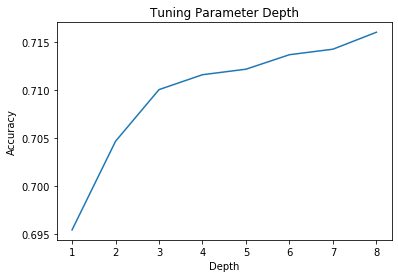

In [34]:
# from catboost import CatBoostClassifier
# from sklearn.model_selection import cross_val_score

# depths = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# avg_sco = []
# for i in depths:
#     model = CatBoostClassifier(depth=i, loss_function='MultiClass')
#     scores = cross_val_score(model, X, y, cv=10, scoring='accuracy')
#     avg_sco.append(scores.mean())
    
# plt.plot(depths, avg_sco)
# plt.xlabel('Depth')
# plt.ylabel('Accuracy')
# plt.title('Tuning Parameter Depth')

Text(0.5, 1.0, 'Tuning Parameter Depth')

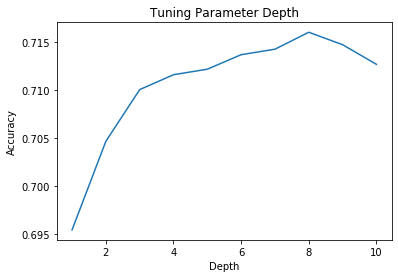

In [40]:
# plt.plot(depths, avg_sco)
# plt.xlabel('Depth')
# plt.ylabel('Accuracy')
# plt.title('Tuning Parameter Depth')

In [41]:
# from sklearn.metrics import SCORERS
# SCORERS.keys()
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score

model = CatBoostClassifier(learning_rate=0.05, loss_function='MultiClass', depth=8)
scores = cross_val_score(model, X, y, cv=10, scoring='accuracy')
print("Accuracy: %f (+/- %f)" % (scores.mean(), scores.std() * 2))



0:	learn: 1.0618114	total: 27.9ms	remaining: 27.9s
1:	learn: 1.0289133	total: 50.6ms	remaining: 25.3s
2:	learn: 1.0001410	total: 73.1ms	remaining: 24.3s
3:	learn: 0.9745652	total: 96.2ms	remaining: 24s
4:	learn: 0.9517720	total: 118ms	remaining: 23.6s
5:	learn: 0.9320277	total: 140ms	remaining: 23.3s
6:	learn: 0.9135633	total: 163ms	remaining: 23.2s
7:	learn: 0.8965388	total: 186ms	remaining: 23s
8:	learn: 0.8808927	total: 208ms	remaining: 22.9s
9:	learn: 0.8673829	total: 235ms	remaining: 23.2s
10:	learn: 0.8547209	total: 263ms	remaining: 23.6s
11:	learn: 0.8424334	total: 288ms	remaining: 23.7s
12:	learn: 0.8312392	total: 314ms	remaining: 23.9s
13:	learn: 0.8209453	total: 337ms	remaining: 23.8s
14:	learn: 0.8112474	total: 360ms	remaining: 23.6s
15:	learn: 0.8027617	total: 382ms	remaining: 23.5s
16:	learn: 0.7949261	total: 404ms	remaining: 23.4s
17:	learn: 0.7871720	total: 430ms	remaining: 23.4s
18:	learn: 0.7807386	total: 453ms	remaining: 23.4s
19:	learn: 0.7739820	total: 476ms	remaini

165:	learn: 0.6483032	total: 4.09s	remaining: 20.6s
166:	learn: 0.6481518	total: 4.12s	remaining: 20.5s
167:	learn: 0.6479983	total: 4.14s	remaining: 20.5s
168:	learn: 0.6478201	total: 4.16s	remaining: 20.5s
169:	learn: 0.6476260	total: 4.19s	remaining: 20.5s
170:	learn: 0.6474782	total: 4.21s	remaining: 20.4s
171:	learn: 0.6473823	total: 4.24s	remaining: 20.4s
172:	learn: 0.6471960	total: 4.26s	remaining: 20.4s
173:	learn: 0.6471029	total: 4.29s	remaining: 20.4s
174:	learn: 0.6469250	total: 4.31s	remaining: 20.3s
175:	learn: 0.6467690	total: 4.33s	remaining: 20.3s
176:	learn: 0.6465553	total: 4.36s	remaining: 20.3s
177:	learn: 0.6464510	total: 4.38s	remaining: 20.2s
178:	learn: 0.6462918	total: 4.4s	remaining: 20.2s
179:	learn: 0.6461283	total: 4.42s	remaining: 20.2s
180:	learn: 0.6459285	total: 4.45s	remaining: 20.1s
181:	learn: 0.6458378	total: 4.47s	remaining: 20.1s
182:	learn: 0.6456516	total: 4.49s	remaining: 20.1s
183:	learn: 0.6454475	total: 4.52s	remaining: 20s
184:	learn: 0.6

327:	learn: 0.6279543	total: 7.84s	remaining: 16.1s
328:	learn: 0.6278306	total: 7.86s	remaining: 16s
329:	learn: 0.6277031	total: 7.88s	remaining: 16s
330:	learn: 0.6275975	total: 7.91s	remaining: 16s
331:	learn: 0.6274656	total: 7.93s	remaining: 16s
332:	learn: 0.6273860	total: 7.95s	remaining: 15.9s
333:	learn: 0.6272960	total: 7.97s	remaining: 15.9s
334:	learn: 0.6271925	total: 8s	remaining: 15.9s
335:	learn: 0.6270796	total: 8.02s	remaining: 15.8s
336:	learn: 0.6269661	total: 8.04s	remaining: 15.8s
337:	learn: 0.6268593	total: 8.06s	remaining: 15.8s
338:	learn: 0.6267752	total: 8.09s	remaining: 15.8s
339:	learn: 0.6266560	total: 8.11s	remaining: 15.8s
340:	learn: 0.6265788	total: 8.14s	remaining: 15.7s
341:	learn: 0.6264295	total: 8.17s	remaining: 15.7s
342:	learn: 0.6263147	total: 8.19s	remaining: 15.7s
343:	learn: 0.6262352	total: 8.21s	remaining: 15.7s
344:	learn: 0.6261175	total: 8.23s	remaining: 15.6s
345:	learn: 0.6259860	total: 8.26s	remaining: 15.6s
346:	learn: 0.6258511	t

490:	learn: 0.6121600	total: 11.6s	remaining: 12s
491:	learn: 0.6120756	total: 11.6s	remaining: 12s
492:	learn: 0.6119902	total: 11.6s	remaining: 12s
493:	learn: 0.6118812	total: 11.7s	remaining: 11.9s
494:	learn: 0.6117919	total: 11.7s	remaining: 11.9s
495:	learn: 0.6116890	total: 11.7s	remaining: 11.9s
496:	learn: 0.6116199	total: 11.7s	remaining: 11.9s
497:	learn: 0.6115532	total: 11.8s	remaining: 11.8s
498:	learn: 0.6114691	total: 11.8s	remaining: 11.8s
499:	learn: 0.6113748	total: 11.8s	remaining: 11.8s
500:	learn: 0.6113155	total: 11.8s	remaining: 11.8s
501:	learn: 0.6112223	total: 11.8s	remaining: 11.8s
502:	learn: 0.6111582	total: 11.9s	remaining: 11.7s
503:	learn: 0.6110688	total: 11.9s	remaining: 11.7s
504:	learn: 0.6109852	total: 11.9s	remaining: 11.7s
505:	learn: 0.6108597	total: 11.9s	remaining: 11.7s
506:	learn: 0.6107741	total: 12s	remaining: 11.6s
507:	learn: 0.6107192	total: 12s	remaining: 11.6s
508:	learn: 0.6106320	total: 12s	remaining: 11.6s
509:	learn: 0.6105411	to

652:	learn: 0.5990979	total: 15.4s	remaining: 8.17s
653:	learn: 0.5990187	total: 15.4s	remaining: 8.15s
654:	learn: 0.5989314	total: 15.4s	remaining: 8.13s
655:	learn: 0.5988672	total: 15.5s	remaining: 8.1s
656:	learn: 0.5987965	total: 15.5s	remaining: 8.08s
657:	learn: 0.5987259	total: 15.5s	remaining: 8.05s
658:	learn: 0.5986148	total: 15.5s	remaining: 8.03s
659:	learn: 0.5985363	total: 15.5s	remaining: 8.01s
660:	learn: 0.5984602	total: 15.6s	remaining: 7.98s
661:	learn: 0.5984254	total: 15.6s	remaining: 7.96s
662:	learn: 0.5983015	total: 15.6s	remaining: 7.93s
663:	learn: 0.5982307	total: 15.6s	remaining: 7.91s
664:	learn: 0.5981781	total: 15.7s	remaining: 7.89s
665:	learn: 0.5981249	total: 15.7s	remaining: 7.86s
666:	learn: 0.5980328	total: 15.7s	remaining: 7.84s
667:	learn: 0.5979444	total: 15.7s	remaining: 7.81s
668:	learn: 0.5978684	total: 15.7s	remaining: 7.79s
669:	learn: 0.5977962	total: 15.8s	remaining: 7.77s
670:	learn: 0.5976612	total: 15.8s	remaining: 7.74s
671:	learn: 0

812:	learn: 0.5876216	total: 19.1s	remaining: 4.39s
813:	learn: 0.5875634	total: 19.1s	remaining: 4.37s
814:	learn: 0.5875030	total: 19.1s	remaining: 4.34s
815:	learn: 0.5874483	total: 19.2s	remaining: 4.32s
816:	learn: 0.5873765	total: 19.2s	remaining: 4.3s
817:	learn: 0.5873071	total: 19.2s	remaining: 4.27s
818:	learn: 0.5872255	total: 19.2s	remaining: 4.25s
819:	learn: 0.5871573	total: 19.3s	remaining: 4.23s
820:	learn: 0.5870857	total: 19.3s	remaining: 4.2s
821:	learn: 0.5870203	total: 19.3s	remaining: 4.18s
822:	learn: 0.5869328	total: 19.3s	remaining: 4.16s
823:	learn: 0.5868743	total: 19.3s	remaining: 4.13s
824:	learn: 0.5868276	total: 19.4s	remaining: 4.11s
825:	learn: 0.5867804	total: 19.4s	remaining: 4.08s
826:	learn: 0.5866989	total: 19.4s	remaining: 4.06s
827:	learn: 0.5866160	total: 19.4s	remaining: 4.04s
828:	learn: 0.5865591	total: 19.5s	remaining: 4.01s
829:	learn: 0.5864829	total: 19.5s	remaining: 3.99s
830:	learn: 0.5863940	total: 19.5s	remaining: 3.97s
831:	learn: 0.

975:	learn: 0.5771505	total: 22.9s	remaining: 562ms
976:	learn: 0.5771228	total: 22.9s	remaining: 539ms
977:	learn: 0.5770836	total: 22.9s	remaining: 515ms
978:	learn: 0.5770235	total: 22.9s	remaining: 492ms
979:	learn: 0.5769651	total: 22.9s	remaining: 468ms
980:	learn: 0.5769166	total: 23s	remaining: 445ms
981:	learn: 0.5768704	total: 23s	remaining: 422ms
982:	learn: 0.5768128	total: 23s	remaining: 398ms
983:	learn: 0.5767252	total: 23s	remaining: 375ms
984:	learn: 0.5766547	total: 23.1s	remaining: 351ms
985:	learn: 0.5765694	total: 23.1s	remaining: 328ms
986:	learn: 0.5764898	total: 23.1s	remaining: 304ms
987:	learn: 0.5764293	total: 23.1s	remaining: 281ms
988:	learn: 0.5763559	total: 23.2s	remaining: 258ms
989:	learn: 0.5762746	total: 23.2s	remaining: 234ms
990:	learn: 0.5762123	total: 23.2s	remaining: 211ms
991:	learn: 0.5761749	total: 23.2s	remaining: 187ms
992:	learn: 0.5761230	total: 23.2s	remaining: 164ms
993:	learn: 0.5760642	total: 23.3s	remaining: 140ms
994:	learn: 0.576008

140:	learn: 0.6527011	total: 3.23s	remaining: 19.7s
141:	learn: 0.6525345	total: 3.26s	remaining: 19.7s
142:	learn: 0.6523302	total: 3.29s	remaining: 19.7s
143:	learn: 0.6520995	total: 3.31s	remaining: 19.7s
144:	learn: 0.6520000	total: 3.33s	remaining: 19.6s
145:	learn: 0.6517556	total: 3.35s	remaining: 19.6s
146:	learn: 0.6516371	total: 3.38s	remaining: 19.6s
147:	learn: 0.6515374	total: 3.4s	remaining: 19.6s
148:	learn: 0.6513200	total: 3.42s	remaining: 19.5s
149:	learn: 0.6511898	total: 3.44s	remaining: 19.5s
150:	learn: 0.6510423	total: 3.47s	remaining: 19.5s
151:	learn: 0.6508083	total: 3.49s	remaining: 19.5s
152:	learn: 0.6506962	total: 3.51s	remaining: 19.4s
153:	learn: 0.6505669	total: 3.53s	remaining: 19.4s
154:	learn: 0.6504539	total: 3.56s	remaining: 19.4s
155:	learn: 0.6503388	total: 3.58s	remaining: 19.4s
156:	learn: 0.6502358	total: 3.6s	remaining: 19.3s
157:	learn: 0.6500596	total: 3.62s	remaining: 19.3s
158:	learn: 0.6499127	total: 3.65s	remaining: 19.3s
159:	learn: 0.

305:	learn: 0.6308770	total: 7.02s	remaining: 15.9s
306:	learn: 0.6307270	total: 7.04s	remaining: 15.9s
307:	learn: 0.6306367	total: 7.06s	remaining: 15.9s
308:	learn: 0.6305568	total: 7.08s	remaining: 15.8s
309:	learn: 0.6304948	total: 7.11s	remaining: 15.8s
310:	learn: 0.6303960	total: 7.13s	remaining: 15.8s
311:	learn: 0.6302241	total: 7.15s	remaining: 15.8s
312:	learn: 0.6301772	total: 7.18s	remaining: 15.8s
313:	learn: 0.6300483	total: 7.2s	remaining: 15.7s
314:	learn: 0.6298904	total: 7.23s	remaining: 15.7s
315:	learn: 0.6297404	total: 7.25s	remaining: 15.7s
316:	learn: 0.6296080	total: 7.28s	remaining: 15.7s
317:	learn: 0.6295354	total: 7.3s	remaining: 15.7s
318:	learn: 0.6294662	total: 7.32s	remaining: 15.6s
319:	learn: 0.6293633	total: 7.34s	remaining: 15.6s
320:	learn: 0.6292918	total: 7.37s	remaining: 15.6s
321:	learn: 0.6291774	total: 7.39s	remaining: 15.6s
322:	learn: 0.6290761	total: 7.41s	remaining: 15.5s
323:	learn: 0.6289532	total: 7.43s	remaining: 15.5s
324:	learn: 0.

470:	learn: 0.6146868	total: 10.8s	remaining: 12.1s
471:	learn: 0.6145772	total: 10.8s	remaining: 12.1s
472:	learn: 0.6144899	total: 10.8s	remaining: 12.1s
473:	learn: 0.6143703	total: 10.9s	remaining: 12.1s
474:	learn: 0.6142508	total: 10.9s	remaining: 12s
475:	learn: 0.6141502	total: 10.9s	remaining: 12s
476:	learn: 0.6140228	total: 10.9s	remaining: 12s
477:	learn: 0.6139066	total: 10.9s	remaining: 12s
478:	learn: 0.6138096	total: 11s	remaining: 11.9s
479:	learn: 0.6137330	total: 11s	remaining: 11.9s
480:	learn: 0.6137047	total: 11s	remaining: 11.9s
481:	learn: 0.6135261	total: 11s	remaining: 11.9s
482:	learn: 0.6134345	total: 11.1s	remaining: 11.8s
483:	learn: 0.6133207	total: 11.1s	remaining: 11.8s
484:	learn: 0.6132039	total: 11.1s	remaining: 11.8s
485:	learn: 0.6131080	total: 11.1s	remaining: 11.8s
486:	learn: 0.6130343	total: 11.2s	remaining: 11.8s
487:	learn: 0.6129540	total: 11.2s	remaining: 11.7s
488:	learn: 0.6128557	total: 11.2s	remaining: 11.7s
489:	learn: 0.6127705	total:

634:	learn: 0.6011072	total: 14.6s	remaining: 8.37s
635:	learn: 0.6010201	total: 14.6s	remaining: 8.34s
636:	learn: 0.6009546	total: 14.6s	remaining: 8.32s
637:	learn: 0.6008786	total: 14.6s	remaining: 8.3s
638:	learn: 0.6008168	total: 14.6s	remaining: 8.27s
639:	learn: 0.6007248	total: 14.7s	remaining: 8.25s
640:	learn: 0.6006350	total: 14.7s	remaining: 8.23s
641:	learn: 0.6005724	total: 14.7s	remaining: 8.2s
642:	learn: 0.6005102	total: 14.7s	remaining: 8.19s
643:	learn: 0.6004159	total: 14.8s	remaining: 8.16s
644:	learn: 0.6003426	total: 14.8s	remaining: 8.14s
645:	learn: 0.6002875	total: 14.8s	remaining: 8.12s
646:	learn: 0.6002120	total: 14.8s	remaining: 8.09s
647:	learn: 0.6001421	total: 14.9s	remaining: 8.07s
648:	learn: 0.6000605	total: 14.9s	remaining: 8.04s
649:	learn: 0.5999764	total: 14.9s	remaining: 8.02s
650:	learn: 0.5999142	total: 14.9s	remaining: 8s
651:	learn: 0.5998780	total: 14.9s	remaining: 7.98s
652:	learn: 0.5998098	total: 15s	remaining: 7.95s
653:	learn: 0.59972

796:	learn: 0.5897139	total: 18.3s	remaining: 4.66s
797:	learn: 0.5896374	total: 18.3s	remaining: 4.63s
798:	learn: 0.5895839	total: 18.3s	remaining: 4.61s
799:	learn: 0.5895078	total: 18.3s	remaining: 4.59s
800:	learn: 0.5894125	total: 18.4s	remaining: 4.56s
801:	learn: 0.5893402	total: 18.4s	remaining: 4.54s
802:	learn: 0.5892752	total: 18.4s	remaining: 4.52s
803:	learn: 0.5892004	total: 18.4s	remaining: 4.5s
804:	learn: 0.5891053	total: 18.5s	remaining: 4.47s
805:	learn: 0.5890081	total: 18.5s	remaining: 4.45s
806:	learn: 0.5889476	total: 18.5s	remaining: 4.43s
807:	learn: 0.5888203	total: 18.5s	remaining: 4.4s
808:	learn: 0.5887629	total: 18.6s	remaining: 4.38s
809:	learn: 0.5886722	total: 18.6s	remaining: 4.36s
810:	learn: 0.5885929	total: 18.6s	remaining: 4.34s
811:	learn: 0.5885567	total: 18.6s	remaining: 4.31s
812:	learn: 0.5885040	total: 18.7s	remaining: 4.29s
813:	learn: 0.5884186	total: 18.7s	remaining: 4.27s
814:	learn: 0.5883383	total: 18.7s	remaining: 4.25s
815:	learn: 0.

959:	learn: 0.5787635	total: 22s	remaining: 918ms
960:	learn: 0.5786621	total: 22.1s	remaining: 895ms
961:	learn: 0.5785852	total: 22.1s	remaining: 872ms
962:	learn: 0.5785354	total: 22.1s	remaining: 849ms
963:	learn: 0.5784825	total: 22.1s	remaining: 826ms
964:	learn: 0.5784248	total: 22.1s	remaining: 803ms
965:	learn: 0.5783903	total: 22.2s	remaining: 780ms
966:	learn: 0.5783087	total: 22.2s	remaining: 757ms
967:	learn: 0.5782536	total: 22.2s	remaining: 734ms
968:	learn: 0.5782201	total: 22.2s	remaining: 711ms
969:	learn: 0.5781493	total: 22.3s	remaining: 688ms
970:	learn: 0.5781056	total: 22.3s	remaining: 665ms
971:	learn: 0.5780296	total: 22.3s	remaining: 642ms
972:	learn: 0.5779909	total: 22.3s	remaining: 619ms
973:	learn: 0.5779358	total: 22.3s	remaining: 597ms
974:	learn: 0.5778538	total: 22.4s	remaining: 574ms
975:	learn: 0.5777692	total: 22.4s	remaining: 551ms
976:	learn: 0.5777047	total: 22.4s	remaining: 528ms
977:	learn: 0.5776431	total: 22.4s	remaining: 505ms
978:	learn: 0.

127:	learn: 0.6540948	total: 2.9s	remaining: 19.8s
128:	learn: 0.6538155	total: 2.93s	remaining: 19.8s
129:	learn: 0.6536344	total: 2.95s	remaining: 19.7s
130:	learn: 0.6534030	total: 2.97s	remaining: 19.7s
131:	learn: 0.6532711	total: 2.99s	remaining: 19.7s
132:	learn: 0.6531472	total: 3.02s	remaining: 19.7s
133:	learn: 0.6529930	total: 3.04s	remaining: 19.6s
134:	learn: 0.6528537	total: 3.06s	remaining: 19.6s
135:	learn: 0.6526334	total: 3.08s	remaining: 19.6s
136:	learn: 0.6524618	total: 3.11s	remaining: 19.6s
137:	learn: 0.6522962	total: 3.13s	remaining: 19.5s
138:	learn: 0.6520732	total: 3.15s	remaining: 19.5s
139:	learn: 0.6519335	total: 3.17s	remaining: 19.5s
140:	learn: 0.6516761	total: 3.19s	remaining: 19.5s
141:	learn: 0.6515284	total: 3.22s	remaining: 19.4s
142:	learn: 0.6513001	total: 3.24s	remaining: 19.4s
143:	learn: 0.6511928	total: 3.26s	remaining: 19.4s
144:	learn: 0.6510396	total: 3.29s	remaining: 19.4s
145:	learn: 0.6508032	total: 3.31s	remaining: 19.4s
146:	learn: 0

291:	learn: 0.6317516	total: 6.64s	remaining: 16.1s
292:	learn: 0.6316272	total: 6.66s	remaining: 16.1s
293:	learn: 0.6315384	total: 6.68s	remaining: 16s
294:	learn: 0.6314312	total: 6.71s	remaining: 16s
295:	learn: 0.6313138	total: 6.73s	remaining: 16s
296:	learn: 0.6312384	total: 6.76s	remaining: 16s
297:	learn: 0.6311321	total: 6.78s	remaining: 16s
298:	learn: 0.6310396	total: 6.8s	remaining: 16s
299:	learn: 0.6308984	total: 6.83s	remaining: 15.9s
300:	learn: 0.6308006	total: 6.85s	remaining: 15.9s
301:	learn: 0.6307184	total: 6.87s	remaining: 15.9s
302:	learn: 0.6305769	total: 6.89s	remaining: 15.9s
303:	learn: 0.6304283	total: 6.92s	remaining: 15.8s
304:	learn: 0.6303131	total: 6.94s	remaining: 15.8s
305:	learn: 0.6302278	total: 6.96s	remaining: 15.8s
306:	learn: 0.6300484	total: 6.99s	remaining: 15.8s
307:	learn: 0.6299580	total: 7.01s	remaining: 15.7s
308:	learn: 0.6298267	total: 7.03s	remaining: 15.7s
309:	learn: 0.6297031	total: 7.05s	remaining: 15.7s
310:	learn: 0.6295525	tot

455:	learn: 0.6150074	total: 10.4s	remaining: 12.4s
456:	learn: 0.6148981	total: 10.4s	remaining: 12.4s
457:	learn: 0.6147617	total: 10.4s	remaining: 12.3s
458:	learn: 0.6147048	total: 10.4s	remaining: 12.3s
459:	learn: 0.6146467	total: 10.5s	remaining: 12.3s
460:	learn: 0.6145339	total: 10.5s	remaining: 12.3s
461:	learn: 0.6144430	total: 10.5s	remaining: 12.2s
462:	learn: 0.6143444	total: 10.5s	remaining: 12.2s
463:	learn: 0.6142485	total: 10.6s	remaining: 12.2s
464:	learn: 0.6141995	total: 10.6s	remaining: 12.2s
465:	learn: 0.6141118	total: 10.6s	remaining: 12.2s
466:	learn: 0.6140191	total: 10.6s	remaining: 12.1s
467:	learn: 0.6139065	total: 10.7s	remaining: 12.1s
468:	learn: 0.6138439	total: 10.7s	remaining: 12.1s
469:	learn: 0.6137412	total: 10.7s	remaining: 12.1s
470:	learn: 0.6136603	total: 10.7s	remaining: 12s
471:	learn: 0.6135837	total: 10.7s	remaining: 12s
472:	learn: 0.6134581	total: 10.8s	remaining: 12s
473:	learn: 0.6133636	total: 10.8s	remaining: 12s
474:	learn: 0.613277

619:	learn: 0.6013799	total: 14.1s	remaining: 8.66s
620:	learn: 0.6013054	total: 14.2s	remaining: 8.64s
621:	learn: 0.6012467	total: 14.2s	remaining: 8.62s
622:	learn: 0.6011415	total: 14.2s	remaining: 8.6s
623:	learn: 0.6010874	total: 14.2s	remaining: 8.57s
624:	learn: 0.6010109	total: 14.3s	remaining: 8.55s
625:	learn: 0.6009131	total: 14.3s	remaining: 8.53s
626:	learn: 0.6008315	total: 14.3s	remaining: 8.5s
627:	learn: 0.6007814	total: 14.3s	remaining: 8.48s
628:	learn: 0.6007134	total: 14.3s	remaining: 8.46s
629:	learn: 0.6006435	total: 14.4s	remaining: 8.44s
630:	learn: 0.6005437	total: 14.4s	remaining: 8.41s
631:	learn: 0.6004803	total: 14.4s	remaining: 8.39s
632:	learn: 0.6003847	total: 14.4s	remaining: 8.37s
633:	learn: 0.6003055	total: 14.5s	remaining: 8.34s
634:	learn: 0.6002396	total: 14.5s	remaining: 8.32s
635:	learn: 0.6001680	total: 14.5s	remaining: 8.3s
636:	learn: 0.6001194	total: 14.5s	remaining: 8.28s
637:	learn: 0.5999962	total: 14.5s	remaining: 8.26s
638:	learn: 0.5

781:	learn: 0.5897659	total: 17.9s	remaining: 4.98s
782:	learn: 0.5896565	total: 17.9s	remaining: 4.95s
783:	learn: 0.5896408	total: 17.9s	remaining: 4.93s
784:	learn: 0.5895346	total: 17.9s	remaining: 4.91s
785:	learn: 0.5894740	total: 17.9s	remaining: 4.88s
786:	learn: 0.5894125	total: 18s	remaining: 4.86s
787:	learn: 0.5893351	total: 18s	remaining: 4.84s
788:	learn: 0.5893018	total: 18s	remaining: 4.82s
789:	learn: 0.5892407	total: 18s	remaining: 4.79s
790:	learn: 0.5891994	total: 18.1s	remaining: 4.77s
791:	learn: 0.5891477	total: 18.1s	remaining: 4.75s
792:	learn: 0.5890715	total: 18.1s	remaining: 4.72s
793:	learn: 0.5889970	total: 18.1s	remaining: 4.7s
794:	learn: 0.5889309	total: 18.1s	remaining: 4.68s
795:	learn: 0.5888434	total: 18.2s	remaining: 4.66s
796:	learn: 0.5887688	total: 18.2s	remaining: 4.63s
797:	learn: 0.5887003	total: 18.2s	remaining: 4.61s
798:	learn: 0.5886463	total: 18.2s	remaining: 4.59s
799:	learn: 0.5885631	total: 18.3s	remaining: 4.56s
800:	learn: 0.5884816

944:	learn: 0.5790426	total: 21.6s	remaining: 1.26s
945:	learn: 0.5789522	total: 21.6s	remaining: 1.23s
946:	learn: 0.5788796	total: 21.6s	remaining: 1.21s
947:	learn: 0.5788045	total: 21.7s	remaining: 1.19s
948:	learn: 0.5787159	total: 21.7s	remaining: 1.16s
949:	learn: 0.5786546	total: 21.7s	remaining: 1.14s
950:	learn: 0.5785921	total: 21.7s	remaining: 1.12s
951:	learn: 0.5785324	total: 21.7s	remaining: 1.1s
952:	learn: 0.5784837	total: 21.8s	remaining: 1.07s
953:	learn: 0.5784233	total: 21.8s	remaining: 1.05s
954:	learn: 0.5783485	total: 21.8s	remaining: 1.03s
955:	learn: 0.5782922	total: 21.8s	remaining: 1s
956:	learn: 0.5782090	total: 21.9s	remaining: 982ms
957:	learn: 0.5781629	total: 21.9s	remaining: 959ms
958:	learn: 0.5781137	total: 21.9s	remaining: 936ms
959:	learn: 0.5780497	total: 21.9s	remaining: 913ms
960:	learn: 0.5780346	total: 21.9s	remaining: 891ms
961:	learn: 0.5779724	total: 22s	remaining: 868ms
962:	learn: 0.5778778	total: 22s	remaining: 845ms
963:	learn: 0.577815

108:	learn: 0.6588340	total: 2.49s	remaining: 20.4s
109:	learn: 0.6586181	total: 2.51s	remaining: 20.3s
110:	learn: 0.6582991	total: 2.54s	remaining: 20.3s
111:	learn: 0.6580572	total: 2.56s	remaining: 20.3s
112:	learn: 0.6579200	total: 2.58s	remaining: 20.2s
113:	learn: 0.6577605	total: 2.6s	remaining: 20.2s
114:	learn: 0.6574308	total: 2.62s	remaining: 20.2s
115:	learn: 0.6571698	total: 2.65s	remaining: 20.2s
116:	learn: 0.6568872	total: 2.67s	remaining: 20.2s
117:	learn: 0.6566431	total: 2.69s	remaining: 20.1s
118:	learn: 0.6564205	total: 2.72s	remaining: 20.1s
119:	learn: 0.6562784	total: 2.74s	remaining: 20.1s
120:	learn: 0.6561045	total: 2.76s	remaining: 20.1s
121:	learn: 0.6559392	total: 2.78s	remaining: 20s
122:	learn: 0.6556895	total: 2.81s	remaining: 20s
123:	learn: 0.6555022	total: 2.83s	remaining: 20s
124:	learn: 0.6553589	total: 2.85s	remaining: 20s
125:	learn: 0.6551521	total: 2.87s	remaining: 19.9s
126:	learn: 0.6550295	total: 2.9s	remaining: 19.9s
127:	learn: 0.6548277	

271:	learn: 0.6350186	total: 6.21s	remaining: 16.6s
272:	learn: 0.6348584	total: 6.23s	remaining: 16.6s
273:	learn: 0.6347100	total: 6.25s	remaining: 16.6s
274:	learn: 0.6345901	total: 6.28s	remaining: 16.6s
275:	learn: 0.6344814	total: 6.3s	remaining: 16.5s
276:	learn: 0.6342711	total: 6.33s	remaining: 16.5s
277:	learn: 0.6341856	total: 6.35s	remaining: 16.5s
278:	learn: 0.6340667	total: 6.37s	remaining: 16.5s
279:	learn: 0.6339567	total: 6.4s	remaining: 16.5s
280:	learn: 0.6338280	total: 6.42s	remaining: 16.4s
281:	learn: 0.6337434	total: 6.45s	remaining: 16.4s
282:	learn: 0.6335839	total: 6.47s	remaining: 16.4s
283:	learn: 0.6334291	total: 6.49s	remaining: 16.4s
284:	learn: 0.6333576	total: 6.51s	remaining: 16.3s
285:	learn: 0.6332204	total: 6.54s	remaining: 16.3s
286:	learn: 0.6331179	total: 6.56s	remaining: 16.3s
287:	learn: 0.6330150	total: 6.58s	remaining: 16.3s
288:	learn: 0.6328913	total: 6.61s	remaining: 16.3s
289:	learn: 0.6327595	total: 6.63s	remaining: 16.2s
290:	learn: 0.

434:	learn: 0.6178469	total: 9.94s	remaining: 12.9s
435:	learn: 0.6177693	total: 9.96s	remaining: 12.9s
436:	learn: 0.6177293	total: 9.98s	remaining: 12.9s
437:	learn: 0.6176799	total: 10s	remaining: 12.8s
438:	learn: 0.6176021	total: 10s	remaining: 12.8s
439:	learn: 0.6175096	total: 10s	remaining: 12.8s
440:	learn: 0.6174054	total: 10.1s	remaining: 12.8s
441:	learn: 0.6173135	total: 10.1s	remaining: 12.7s
442:	learn: 0.6171803	total: 10.1s	remaining: 12.7s
443:	learn: 0.6171053	total: 10.1s	remaining: 12.7s
444:	learn: 0.6170188	total: 10.2s	remaining: 12.7s
445:	learn: 0.6169530	total: 10.2s	remaining: 12.7s
446:	learn: 0.6168921	total: 10.2s	remaining: 12.6s
447:	learn: 0.6168051	total: 10.2s	remaining: 12.6s
448:	learn: 0.6166946	total: 10.3s	remaining: 12.6s
449:	learn: 0.6165977	total: 10.3s	remaining: 12.6s
450:	learn: 0.6165400	total: 10.3s	remaining: 12.6s
451:	learn: 0.6164275	total: 10.3s	remaining: 12.5s
452:	learn: 0.6164220	total: 10.3s	remaining: 12.5s
453:	learn: 0.6163

597:	learn: 0.6043847	total: 13.7s	remaining: 9.19s
598:	learn: 0.6043010	total: 13.7s	remaining: 9.17s
599:	learn: 0.6042223	total: 13.7s	remaining: 9.14s
600:	learn: 0.6041225	total: 13.7s	remaining: 9.12s
601:	learn: 0.6040325	total: 13.8s	remaining: 9.1s
602:	learn: 0.6039339	total: 13.8s	remaining: 9.07s
603:	learn: 0.6038486	total: 13.8s	remaining: 9.05s
604:	learn: 0.6037858	total: 13.8s	remaining: 9.03s
605:	learn: 0.6037491	total: 13.9s	remaining: 9.01s
606:	learn: 0.6036718	total: 13.9s	remaining: 8.98s
607:	learn: 0.6036073	total: 13.9s	remaining: 8.96s
608:	learn: 0.6034717	total: 13.9s	remaining: 8.94s
609:	learn: 0.6034260	total: 13.9s	remaining: 8.91s
610:	learn: 0.6033346	total: 14s	remaining: 8.89s
611:	learn: 0.6032222	total: 14s	remaining: 8.87s
612:	learn: 0.6031487	total: 14s	remaining: 8.84s
613:	learn: 0.6030607	total: 14s	remaining: 8.82s
614:	learn: 0.6029522	total: 14.1s	remaining: 8.8s
615:	learn: 0.6028719	total: 14.1s	remaining: 8.78s
616:	learn: 0.6027801	

759:	learn: 0.5924521	total: 17.4s	remaining: 5.49s
760:	learn: 0.5923676	total: 17.4s	remaining: 5.47s
761:	learn: 0.5922829	total: 17.4s	remaining: 5.44s
762:	learn: 0.5922187	total: 17.5s	remaining: 5.42s
763:	learn: 0.5921499	total: 17.5s	remaining: 5.4s
764:	learn: 0.5920854	total: 17.5s	remaining: 5.37s
765:	learn: 0.5920253	total: 17.5s	remaining: 5.35s
766:	learn: 0.5919384	total: 17.5s	remaining: 5.33s
767:	learn: 0.5918492	total: 17.6s	remaining: 5.31s
768:	learn: 0.5917615	total: 17.6s	remaining: 5.28s
769:	learn: 0.5916794	total: 17.6s	remaining: 5.26s
770:	learn: 0.5915959	total: 17.6s	remaining: 5.24s
771:	learn: 0.5915329	total: 17.7s	remaining: 5.21s
772:	learn: 0.5914432	total: 17.7s	remaining: 5.19s
773:	learn: 0.5913904	total: 17.7s	remaining: 5.17s
774:	learn: 0.5913077	total: 17.7s	remaining: 5.14s
775:	learn: 0.5912488	total: 17.7s	remaining: 5.12s
776:	learn: 0.5911736	total: 17.8s	remaining: 5.1s
777:	learn: 0.5910987	total: 17.8s	remaining: 5.08s
778:	learn: 0.

922:	learn: 0.5814473	total: 21.1s	remaining: 1.76s
923:	learn: 0.5814125	total: 21.2s	remaining: 1.74s
924:	learn: 0.5813363	total: 21.2s	remaining: 1.72s
925:	learn: 0.5813220	total: 21.2s	remaining: 1.69s
926:	learn: 0.5812710	total: 21.2s	remaining: 1.67s
927:	learn: 0.5811678	total: 21.2s	remaining: 1.65s
928:	learn: 0.5810868	total: 21.3s	remaining: 1.63s
929:	learn: 0.5810315	total: 21.3s	remaining: 1.6s
930:	learn: 0.5809491	total: 21.3s	remaining: 1.58s
931:	learn: 0.5808886	total: 21.3s	remaining: 1.56s
932:	learn: 0.5808331	total: 21.4s	remaining: 1.53s
933:	learn: 0.5807725	total: 21.4s	remaining: 1.51s
934:	learn: 0.5807129	total: 21.4s	remaining: 1.49s
935:	learn: 0.5806424	total: 21.4s	remaining: 1.46s
936:	learn: 0.5805663	total: 21.4s	remaining: 1.44s
937:	learn: 0.5805207	total: 21.5s	remaining: 1.42s
938:	learn: 0.5804776	total: 21.5s	remaining: 1.4s
939:	learn: 0.5804273	total: 21.5s	remaining: 1.37s
940:	learn: 0.5803596	total: 21.5s	remaining: 1.35s
941:	learn: 0.

82:	learn: 0.6681493	total: 1.88s	remaining: 20.8s
83:	learn: 0.6677084	total: 1.9s	remaining: 20.8s
84:	learn: 0.6671993	total: 1.93s	remaining: 20.7s
85:	learn: 0.6668261	total: 1.95s	remaining: 20.7s
86:	learn: 0.6663560	total: 1.97s	remaining: 20.7s
87:	learn: 0.6659288	total: 1.99s	remaining: 20.6s
88:	learn: 0.6654876	total: 2.02s	remaining: 20.7s
89:	learn: 0.6650825	total: 2.04s	remaining: 20.7s
90:	learn: 0.6648020	total: 2.07s	remaining: 20.7s
91:	learn: 0.6643404	total: 2.1s	remaining: 20.7s
92:	learn: 0.6640389	total: 2.12s	remaining: 20.7s
93:	learn: 0.6636439	total: 2.14s	remaining: 20.6s
94:	learn: 0.6634321	total: 2.16s	remaining: 20.6s
95:	learn: 0.6631723	total: 2.18s	remaining: 20.6s
96:	learn: 0.6629625	total: 2.21s	remaining: 20.5s
97:	learn: 0.6626983	total: 2.23s	remaining: 20.5s
98:	learn: 0.6624643	total: 2.25s	remaining: 20.5s
99:	learn: 0.6622452	total: 2.28s	remaining: 20.5s
100:	learn: 0.6619908	total: 2.3s	remaining: 20.5s
101:	learn: 0.6618093	total: 2.32

241:	learn: 0.6397641	total: 5.5s	remaining: 17.2s
242:	learn: 0.6396857	total: 5.53s	remaining: 17.2s
243:	learn: 0.6395161	total: 5.55s	remaining: 17.2s
244:	learn: 0.6394098	total: 5.57s	remaining: 17.2s
245:	learn: 0.6392574	total: 5.59s	remaining: 17.1s
246:	learn: 0.6390968	total: 5.62s	remaining: 17.1s
247:	learn: 0.6389394	total: 5.64s	remaining: 17.1s
248:	learn: 0.6388243	total: 5.66s	remaining: 17.1s
249:	learn: 0.6387291	total: 5.68s	remaining: 17.1s
250:	learn: 0.6385995	total: 5.71s	remaining: 17s
251:	learn: 0.6384233	total: 5.73s	remaining: 17s
252:	learn: 0.6382628	total: 5.75s	remaining: 17s
253:	learn: 0.6381130	total: 5.77s	remaining: 17s
254:	learn: 0.6379940	total: 5.8s	remaining: 16.9s
255:	learn: 0.6377994	total: 5.82s	remaining: 16.9s
256:	learn: 0.6376394	total: 5.84s	remaining: 16.9s
257:	learn: 0.6375785	total: 5.86s	remaining: 16.9s
258:	learn: 0.6374453	total: 5.89s	remaining: 16.8s
259:	learn: 0.6372929	total: 5.91s	remaining: 16.8s
260:	learn: 0.6371953	

401:	learn: 0.6223343	total: 9.32s	remaining: 13.9s
402:	learn: 0.6222564	total: 9.35s	remaining: 13.8s
403:	learn: 0.6221820	total: 9.37s	remaining: 13.8s
404:	learn: 0.6220924	total: 9.39s	remaining: 13.8s
405:	learn: 0.6219646	total: 9.41s	remaining: 13.8s
406:	learn: 0.6218438	total: 9.44s	remaining: 13.7s
407:	learn: 0.6216913	total: 9.46s	remaining: 13.7s
408:	learn: 0.6216114	total: 9.48s	remaining: 13.7s
409:	learn: 0.6215571	total: 9.51s	remaining: 13.7s
410:	learn: 0.6214949	total: 9.53s	remaining: 13.7s
411:	learn: 0.6213798	total: 9.55s	remaining: 13.6s
412:	learn: 0.6212769	total: 9.57s	remaining: 13.6s
413:	learn: 0.6211697	total: 9.6s	remaining: 13.6s
414:	learn: 0.6210727	total: 9.62s	remaining: 13.6s
415:	learn: 0.6209637	total: 9.64s	remaining: 13.5s
416:	learn: 0.6208641	total: 9.66s	remaining: 13.5s
417:	learn: 0.6207643	total: 9.69s	remaining: 13.5s
418:	learn: 0.6207011	total: 9.71s	remaining: 13.5s
419:	learn: 0.6206359	total: 9.74s	remaining: 13.4s
420:	learn: 0

563:	learn: 0.6077658	total: 13.3s	remaining: 10.3s
564:	learn: 0.6076716	total: 13.4s	remaining: 10.3s
565:	learn: 0.6075688	total: 13.4s	remaining: 10.3s
566:	learn: 0.6074819	total: 13.4s	remaining: 10.2s
567:	learn: 0.6073818	total: 13.4s	remaining: 10.2s
568:	learn: 0.6073236	total: 13.5s	remaining: 10.2s
569:	learn: 0.6072372	total: 13.5s	remaining: 10.2s
570:	learn: 0.6071204	total: 13.5s	remaining: 10.2s
571:	learn: 0.6070481	total: 13.5s	remaining: 10.1s
572:	learn: 0.6069736	total: 13.6s	remaining: 10.1s
573:	learn: 0.6068799	total: 13.6s	remaining: 10.1s
574:	learn: 0.6067911	total: 13.6s	remaining: 10.1s
575:	learn: 0.6067418	total: 13.6s	remaining: 10s
576:	learn: 0.6066811	total: 13.7s	remaining: 10s
577:	learn: 0.6065668	total: 13.7s	remaining: 9.99s
578:	learn: 0.6064571	total: 13.7s	remaining: 9.96s
579:	learn: 0.6063773	total: 13.7s	remaining: 9.94s
580:	learn: 0.6063229	total: 13.8s	remaining: 9.92s
581:	learn: 0.6062687	total: 13.8s	remaining: 9.89s
582:	learn: 0.60

724:	learn: 0.5957665	total: 17.1s	remaining: 6.5s
725:	learn: 0.5956819	total: 17.2s	remaining: 6.47s
726:	learn: 0.5956266	total: 17.2s	remaining: 6.45s
727:	learn: 0.5955621	total: 17.2s	remaining: 6.43s
728:	learn: 0.5954849	total: 17.2s	remaining: 6.41s
729:	learn: 0.5954182	total: 17.3s	remaining: 6.38s
730:	learn: 0.5953261	total: 17.3s	remaining: 6.36s
731:	learn: 0.5952552	total: 17.3s	remaining: 6.34s
732:	learn: 0.5951704	total: 17.3s	remaining: 6.32s
733:	learn: 0.5950917	total: 17.4s	remaining: 6.29s
734:	learn: 0.5950386	total: 17.4s	remaining: 6.27s
735:	learn: 0.5949902	total: 17.4s	remaining: 6.25s
736:	learn: 0.5949235	total: 17.4s	remaining: 6.22s
737:	learn: 0.5948641	total: 17.5s	remaining: 6.2s
738:	learn: 0.5947154	total: 17.5s	remaining: 6.18s
739:	learn: 0.5946537	total: 17.5s	remaining: 6.16s
740:	learn: 0.5945660	total: 17.5s	remaining: 6.13s
741:	learn: 0.5945146	total: 17.6s	remaining: 6.11s
742:	learn: 0.5944649	total: 17.6s	remaining: 6.08s
743:	learn: 0.

883:	learn: 0.5845400	total: 20.9s	remaining: 2.74s
884:	learn: 0.5844795	total: 20.9s	remaining: 2.72s
885:	learn: 0.5844319	total: 21s	remaining: 2.7s
886:	learn: 0.5843680	total: 21s	remaining: 2.67s
887:	learn: 0.5843053	total: 21s	remaining: 2.65s
888:	learn: 0.5842211	total: 21s	remaining: 2.63s
889:	learn: 0.5841585	total: 21.1s	remaining: 2.6s
890:	learn: 0.5841002	total: 21.1s	remaining: 2.58s
891:	learn: 0.5840560	total: 21.1s	remaining: 2.56s
892:	learn: 0.5840071	total: 21.1s	remaining: 2.53s
893:	learn: 0.5839567	total: 21.2s	remaining: 2.51s
894:	learn: 0.5838760	total: 21.2s	remaining: 2.48s
895:	learn: 0.5838068	total: 21.2s	remaining: 2.46s
896:	learn: 0.5837606	total: 21.2s	remaining: 2.44s
897:	learn: 0.5836830	total: 21.2s	remaining: 2.41s
898:	learn: 0.5836126	total: 21.3s	remaining: 2.39s
899:	learn: 0.5835602	total: 21.3s	remaining: 2.37s
900:	learn: 0.5835271	total: 21.3s	remaining: 2.34s
901:	learn: 0.5834492	total: 21.4s	remaining: 2.32s
902:	learn: 0.5833871	

43:	learn: 0.6970085	total: 1.04s	remaining: 22.6s
44:	learn: 0.6957135	total: 1.06s	remaining: 22.6s
45:	learn: 0.6940415	total: 1.09s	remaining: 22.5s
46:	learn: 0.6928433	total: 1.11s	remaining: 22.5s
47:	learn: 0.6918066	total: 1.13s	remaining: 22.4s
48:	learn: 0.6906324	total: 1.15s	remaining: 22.4s
49:	learn: 0.6896404	total: 1.18s	remaining: 22.3s
50:	learn: 0.6886927	total: 1.2s	remaining: 22.3s
51:	learn: 0.6874155	total: 1.23s	remaining: 22.3s
52:	learn: 0.6864936	total: 1.25s	remaining: 22.3s
53:	learn: 0.6854041	total: 1.27s	remaining: 22.3s
54:	learn: 0.6844889	total: 1.29s	remaining: 22.2s
55:	learn: 0.6836435	total: 1.32s	remaining: 22.2s
56:	learn: 0.6827264	total: 1.34s	remaining: 22.2s
57:	learn: 0.6818873	total: 1.36s	remaining: 22.2s
58:	learn: 0.6811100	total: 1.39s	remaining: 22.1s
59:	learn: 0.6802930	total: 1.41s	remaining: 22.1s
60:	learn: 0.6794849	total: 1.44s	remaining: 22.1s
61:	learn: 0.6787571	total: 1.46s	remaining: 22.1s
62:	learn: 0.6781180	total: 1.48

204:	learn: 0.6435924	total: 5.07s	remaining: 19.7s
205:	learn: 0.6434968	total: 5.09s	remaining: 19.6s
206:	learn: 0.6433650	total: 5.12s	remaining: 19.6s
207:	learn: 0.6432113	total: 5.14s	remaining: 19.6s
208:	learn: 0.6430743	total: 5.18s	remaining: 19.6s
209:	learn: 0.6429076	total: 5.21s	remaining: 19.6s
210:	learn: 0.6427967	total: 5.23s	remaining: 19.6s
211:	learn: 0.6426984	total: 5.25s	remaining: 19.5s
212:	learn: 0.6424816	total: 5.28s	remaining: 19.5s
213:	learn: 0.6423345	total: 5.3s	remaining: 19.5s
214:	learn: 0.6422410	total: 5.32s	remaining: 19.4s
215:	learn: 0.6420209	total: 5.35s	remaining: 19.4s
216:	learn: 0.6418444	total: 5.37s	remaining: 19.4s
217:	learn: 0.6415954	total: 5.39s	remaining: 19.3s
218:	learn: 0.6414980	total: 5.41s	remaining: 19.3s
219:	learn: 0.6414015	total: 5.43s	remaining: 19.3s
220:	learn: 0.6413442	total: 5.46s	remaining: 19.2s
221:	learn: 0.6411792	total: 5.48s	remaining: 19.2s
222:	learn: 0.6410528	total: 5.5s	remaining: 19.2s
223:	learn: 0.

368:	learn: 0.6237456	total: 9.06s	remaining: 15.5s
369:	learn: 0.6236392	total: 9.09s	remaining: 15.5s
370:	learn: 0.6235818	total: 9.11s	remaining: 15.4s
371:	learn: 0.6234705	total: 9.13s	remaining: 15.4s
372:	learn: 0.6233609	total: 9.15s	remaining: 15.4s
373:	learn: 0.6232556	total: 9.17s	remaining: 15.4s
374:	learn: 0.6230705	total: 9.2s	remaining: 15.3s
375:	learn: 0.6229763	total: 9.22s	remaining: 15.3s
376:	learn: 0.6229033	total: 9.24s	remaining: 15.3s
377:	learn: 0.6227681	total: 9.26s	remaining: 15.2s
378:	learn: 0.6226901	total: 9.29s	remaining: 15.2s
379:	learn: 0.6225659	total: 9.31s	remaining: 15.2s
380:	learn: 0.6224896	total: 9.33s	remaining: 15.2s
381:	learn: 0.6223956	total: 9.35s	remaining: 15.1s
382:	learn: 0.6222905	total: 9.37s	remaining: 15.1s
383:	learn: 0.6222028	total: 9.4s	remaining: 15.1s
384:	learn: 0.6221253	total: 9.42s	remaining: 15s
385:	learn: 0.6220620	total: 9.45s	remaining: 15s
386:	learn: 0.6219894	total: 9.47s	remaining: 15s
387:	learn: 0.621884

533:	learn: 0.6091774	total: 12.8s	remaining: 11.2s
534:	learn: 0.6091056	total: 12.8s	remaining: 11.2s
535:	learn: 0.6089983	total: 12.9s	remaining: 11.1s
536:	learn: 0.6089247	total: 12.9s	remaining: 11.1s
537:	learn: 0.6088387	total: 12.9s	remaining: 11.1s
538:	learn: 0.6087560	total: 12.9s	remaining: 11.1s
539:	learn: 0.6086577	total: 13s	remaining: 11s
540:	learn: 0.6085844	total: 13s	remaining: 11s
541:	learn: 0.6084572	total: 13s	remaining: 11s
542:	learn: 0.6083644	total: 13s	remaining: 11s
543:	learn: 0.6082999	total: 13s	remaining: 10.9s
544:	learn: 0.6081990	total: 13.1s	remaining: 10.9s
545:	learn: 0.6081181	total: 13.1s	remaining: 10.9s
546:	learn: 0.6080271	total: 13.1s	remaining: 10.9s
547:	learn: 0.6079010	total: 13.1s	remaining: 10.8s
548:	learn: 0.6078248	total: 13.2s	remaining: 10.8s
549:	learn: 0.6076656	total: 13.2s	remaining: 10.8s
550:	learn: 0.6075908	total: 13.2s	remaining: 10.8s
551:	learn: 0.6075255	total: 13.2s	remaining: 10.7s
552:	learn: 0.6074340	total: 1

696:	learn: 0.5963914	total: 16.6s	remaining: 7.2s
697:	learn: 0.5963274	total: 16.6s	remaining: 7.17s
698:	learn: 0.5962315	total: 16.6s	remaining: 7.15s
699:	learn: 0.5961213	total: 16.6s	remaining: 7.12s
700:	learn: 0.5960358	total: 16.6s	remaining: 7.1s
701:	learn: 0.5959439	total: 16.7s	remaining: 7.07s
702:	learn: 0.5958566	total: 16.7s	remaining: 7.05s
703:	learn: 0.5958000	total: 16.7s	remaining: 7.03s
704:	learn: 0.5957195	total: 16.7s	remaining: 7s
705:	learn: 0.5956227	total: 16.8s	remaining: 6.98s
706:	learn: 0.5955764	total: 16.8s	remaining: 6.95s
707:	learn: 0.5954909	total: 16.8s	remaining: 6.93s
708:	learn: 0.5954129	total: 16.8s	remaining: 6.91s
709:	learn: 0.5953742	total: 16.8s	remaining: 6.88s
710:	learn: 0.5953314	total: 16.9s	remaining: 6.86s
711:	learn: 0.5952385	total: 16.9s	remaining: 6.83s
712:	learn: 0.5951825	total: 16.9s	remaining: 6.81s
713:	learn: 0.5951303	total: 16.9s	remaining: 6.79s
714:	learn: 0.5950892	total: 17s	remaining: 6.76s
715:	learn: 0.59501

859:	learn: 0.5844834	total: 20.3s	remaining: 3.3s
860:	learn: 0.5844313	total: 20.3s	remaining: 3.28s
861:	learn: 0.5843692	total: 20.3s	remaining: 3.25s
862:	learn: 0.5843138	total: 20.4s	remaining: 3.23s
863:	learn: 0.5842372	total: 20.4s	remaining: 3.21s
864:	learn: 0.5841849	total: 20.4s	remaining: 3.18s
865:	learn: 0.5841057	total: 20.4s	remaining: 3.16s
866:	learn: 0.5840185	total: 20.4s	remaining: 3.13s
867:	learn: 0.5839697	total: 20.5s	remaining: 3.11s
868:	learn: 0.5838435	total: 20.5s	remaining: 3.09s
869:	learn: 0.5837490	total: 20.5s	remaining: 3.06s
870:	learn: 0.5836843	total: 20.5s	remaining: 3.04s
871:	learn: 0.5835735	total: 20.6s	remaining: 3.02s
872:	learn: 0.5834894	total: 20.6s	remaining: 2.99s
873:	learn: 0.5833938	total: 20.6s	remaining: 2.97s
874:	learn: 0.5833145	total: 20.6s	remaining: 2.95s
875:	learn: 0.5832408	total: 20.6s	remaining: 2.92s
876:	learn: 0.5831564	total: 20.7s	remaining: 2.9s
877:	learn: 0.5830738	total: 20.7s	remaining: 2.88s
878:	learn: 0.

19:	learn: 0.7740098	total: 447ms	remaining: 21.9s
20:	learn: 0.7678620	total: 469ms	remaining: 21.9s
21:	learn: 0.7619180	total: 492ms	remaining: 21.9s
22:	learn: 0.7565740	total: 514ms	remaining: 21.8s
23:	learn: 0.7518217	total: 536ms	remaining: 21.8s
24:	learn: 0.7473475	total: 558ms	remaining: 21.8s
25:	learn: 0.7429173	total: 583ms	remaining: 21.8s
26:	learn: 0.7389500	total: 612ms	remaining: 22.1s
27:	learn: 0.7351132	total: 645ms	remaining: 22.4s
28:	learn: 0.7314131	total: 667ms	remaining: 22.3s
29:	learn: 0.7281222	total: 690ms	remaining: 22.3s
30:	learn: 0.7247974	total: 712ms	remaining: 22.2s
31:	learn: 0.7215275	total: 734ms	remaining: 22.2s
32:	learn: 0.7187450	total: 756ms	remaining: 22.2s
33:	learn: 0.7162160	total: 779ms	remaining: 22.1s
34:	learn: 0.7138097	total: 801ms	remaining: 22.1s
35:	learn: 0.7114920	total: 826ms	remaining: 22.1s
36:	learn: 0.7092733	total: 848ms	remaining: 22.1s
37:	learn: 0.7069388	total: 871ms	remaining: 22s
38:	learn: 0.7049650	total: 893ms

186:	learn: 0.6454238	total: 4.28s	remaining: 18.6s
187:	learn: 0.6452903	total: 4.3s	remaining: 18.6s
188:	learn: 0.6450888	total: 4.33s	remaining: 18.6s
189:	learn: 0.6449731	total: 4.35s	remaining: 18.5s
190:	learn: 0.6447591	total: 4.37s	remaining: 18.5s
191:	learn: 0.6446648	total: 4.39s	remaining: 18.5s
192:	learn: 0.6444926	total: 4.41s	remaining: 18.5s
193:	learn: 0.6443345	total: 4.44s	remaining: 18.4s
194:	learn: 0.6442516	total: 4.45s	remaining: 18.4s
195:	learn: 0.6441221	total: 4.48s	remaining: 18.4s
196:	learn: 0.6439734	total: 4.5s	remaining: 18.3s
197:	learn: 0.6438050	total: 4.53s	remaining: 18.3s
198:	learn: 0.6435976	total: 4.55s	remaining: 18.3s
199:	learn: 0.6435045	total: 4.58s	remaining: 18.3s
200:	learn: 0.6434071	total: 4.6s	remaining: 18.3s
201:	learn: 0.6433025	total: 4.62s	remaining: 18.3s
202:	learn: 0.6431694	total: 4.64s	remaining: 18.2s
203:	learn: 0.6430777	total: 4.67s	remaining: 18.2s
204:	learn: 0.6429451	total: 4.69s	remaining: 18.2s
205:	learn: 0.6

349:	learn: 0.6253837	total: 8s	remaining: 14.9s
350:	learn: 0.6252836	total: 8.02s	remaining: 14.8s
351:	learn: 0.6252406	total: 8.04s	remaining: 14.8s
352:	learn: 0.6251528	total: 8.07s	remaining: 14.8s
353:	learn: 0.6249994	total: 8.09s	remaining: 14.8s
354:	learn: 0.6249286	total: 8.11s	remaining: 14.7s
355:	learn: 0.6248124	total: 8.13s	remaining: 14.7s
356:	learn: 0.6246523	total: 8.15s	remaining: 14.7s
357:	learn: 0.6245406	total: 8.18s	remaining: 14.7s
358:	learn: 0.6244240	total: 8.2s	remaining: 14.6s
359:	learn: 0.6243434	total: 8.22s	remaining: 14.6s
360:	learn: 0.6242903	total: 8.25s	remaining: 14.6s
361:	learn: 0.6241914	total: 8.27s	remaining: 14.6s
362:	learn: 0.6241056	total: 8.29s	remaining: 14.6s
363:	learn: 0.6239934	total: 8.31s	remaining: 14.5s
364:	learn: 0.6239175	total: 8.34s	remaining: 14.5s
365:	learn: 0.6238455	total: 8.36s	remaining: 14.5s
366:	learn: 0.6237730	total: 8.38s	remaining: 14.5s
367:	learn: 0.6236727	total: 8.4s	remaining: 14.4s
368:	learn: 0.623

513:	learn: 0.6102697	total: 11.7s	remaining: 11.1s
514:	learn: 0.6101992	total: 11.8s	remaining: 11.1s
515:	learn: 0.6101261	total: 11.8s	remaining: 11.1s
516:	learn: 0.6099778	total: 11.8s	remaining: 11s
517:	learn: 0.6098441	total: 11.8s	remaining: 11s
518:	learn: 0.6097816	total: 11.9s	remaining: 11s
519:	learn: 0.6097070	total: 11.9s	remaining: 11s
520:	learn: 0.6096059	total: 11.9s	remaining: 10.9s
521:	learn: 0.6095206	total: 11.9s	remaining: 10.9s
522:	learn: 0.6094439	total: 11.9s	remaining: 10.9s
523:	learn: 0.6093556	total: 12s	remaining: 10.9s
524:	learn: 0.6092710	total: 12s	remaining: 10.8s
525:	learn: 0.6092099	total: 12s	remaining: 10.8s
526:	learn: 0.6091352	total: 12s	remaining: 10.8s
527:	learn: 0.6090609	total: 12.1s	remaining: 10.8s
528:	learn: 0.6089953	total: 12.1s	remaining: 10.8s
529:	learn: 0.6089167	total: 12.1s	remaining: 10.7s
530:	learn: 0.6088167	total: 12.1s	remaining: 10.7s
531:	learn: 0.6087339	total: 12.2s	remaining: 10.7s
532:	learn: 0.6086165	total:

674:	learn: 0.5976331	total: 15.5s	remaining: 7.46s
675:	learn: 0.5975617	total: 15.5s	remaining: 7.44s
676:	learn: 0.5975078	total: 15.5s	remaining: 7.42s
677:	learn: 0.5974400	total: 15.6s	remaining: 7.39s
678:	learn: 0.5973623	total: 15.6s	remaining: 7.37s
679:	learn: 0.5973050	total: 15.6s	remaining: 7.35s
680:	learn: 0.5972334	total: 15.6s	remaining: 7.33s
681:	learn: 0.5971759	total: 15.7s	remaining: 7.3s
682:	learn: 0.5970848	total: 15.7s	remaining: 7.28s
683:	learn: 0.5970177	total: 15.7s	remaining: 7.26s
684:	learn: 0.5969733	total: 15.7s	remaining: 7.23s
685:	learn: 0.5968983	total: 15.8s	remaining: 7.21s
686:	learn: 0.5968053	total: 15.8s	remaining: 7.19s
687:	learn: 0.5967378	total: 15.8s	remaining: 7.16s
688:	learn: 0.5966671	total: 15.8s	remaining: 7.14s
689:	learn: 0.5965491	total: 15.8s	remaining: 7.12s
690:	learn: 0.5964995	total: 15.9s	remaining: 7.09s
691:	learn: 0.5964363	total: 15.9s	remaining: 7.07s
692:	learn: 0.5963756	total: 15.9s	remaining: 7.05s
693:	learn: 0

839:	learn: 0.5856896	total: 19.3s	remaining: 3.67s
840:	learn: 0.5856390	total: 19.3s	remaining: 3.65s
841:	learn: 0.5855689	total: 19.3s	remaining: 3.63s
842:	learn: 0.5855146	total: 19.3s	remaining: 3.6s
843:	learn: 0.5854628	total: 19.4s	remaining: 3.58s
844:	learn: 0.5853781	total: 19.4s	remaining: 3.56s
845:	learn: 0.5853035	total: 19.4s	remaining: 3.53s
846:	learn: 0.5852359	total: 19.4s	remaining: 3.51s
847:	learn: 0.5851835	total: 19.5s	remaining: 3.49s
848:	learn: 0.5850469	total: 19.5s	remaining: 3.46s
849:	learn: 0.5849676	total: 19.5s	remaining: 3.44s
850:	learn: 0.5849044	total: 19.5s	remaining: 3.42s
851:	learn: 0.5848229	total: 19.6s	remaining: 3.4s
852:	learn: 0.5847569	total: 19.6s	remaining: 3.37s
853:	learn: 0.5847092	total: 19.6s	remaining: 3.35s
854:	learn: 0.5846455	total: 19.6s	remaining: 3.33s
855:	learn: 0.5845775	total: 19.6s	remaining: 3.3s
856:	learn: 0.5845199	total: 19.7s	remaining: 3.28s
857:	learn: 0.5844308	total: 19.7s	remaining: 3.26s
858:	learn: 0.5

0:	learn: 1.0622387	total: 22.9ms	remaining: 22.9s
1:	learn: 1.0292283	total: 45ms	remaining: 22.4s
2:	learn: 1.0006624	total: 66.8ms	remaining: 22.2s
3:	learn: 0.9754201	total: 89ms	remaining: 22.2s
4:	learn: 0.9526522	total: 113ms	remaining: 22.5s
5:	learn: 0.9329374	total: 140ms	remaining: 23.2s
6:	learn: 0.9139365	total: 167ms	remaining: 23.7s
7:	learn: 0.8966504	total: 189ms	remaining: 23.5s
8:	learn: 0.8809817	total: 211ms	remaining: 23.3s
9:	learn: 0.8674029	total: 235ms	remaining: 23.3s
10:	learn: 0.8547320	total: 258ms	remaining: 23.2s
11:	learn: 0.8440757	total: 266ms	remaining: 21.9s
12:	learn: 0.8323660	total: 288ms	remaining: 21.9s
13:	learn: 0.8224800	total: 310ms	remaining: 21.9s
14:	learn: 0.8127786	total: 332ms	remaining: 21.8s
15:	learn: 0.8038330	total: 355ms	remaining: 21.8s
16:	learn: 0.7954191	total: 377ms	remaining: 21.8s
17:	learn: 0.7876377	total: 400ms	remaining: 21.8s
18:	learn: 0.7804155	total: 425ms	remaining: 21.9s
19:	learn: 0.7740121	total: 447ms	remaini

167:	learn: 0.6468307	total: 3.84s	remaining: 19s
168:	learn: 0.6466808	total: 3.86s	remaining: 19s
169:	learn: 0.6465910	total: 3.88s	remaining: 18.9s
170:	learn: 0.6464350	total: 3.9s	remaining: 18.9s
171:	learn: 0.6462737	total: 3.92s	remaining: 18.9s
172:	learn: 0.6460937	total: 3.95s	remaining: 18.9s
173:	learn: 0.6459282	total: 3.97s	remaining: 18.8s
174:	learn: 0.6457379	total: 3.99s	remaining: 18.8s
175:	learn: 0.6456486	total: 4.01s	remaining: 18.8s
176:	learn: 0.6455181	total: 4.04s	remaining: 18.8s
177:	learn: 0.6454040	total: 4.07s	remaining: 18.8s
178:	learn: 0.6452936	total: 4.09s	remaining: 18.8s
179:	learn: 0.6451699	total: 4.12s	remaining: 18.8s
180:	learn: 0.6450905	total: 4.14s	remaining: 18.7s
181:	learn: 0.6449509	total: 4.16s	remaining: 18.7s
182:	learn: 0.6447550	total: 4.18s	remaining: 18.7s
183:	learn: 0.6446235	total: 4.21s	remaining: 18.7s
184:	learn: 0.6444907	total: 4.23s	remaining: 18.7s
185:	learn: 0.6443508	total: 4.26s	remaining: 18.6s
186:	learn: 0.644

331:	learn: 0.6267394	total: 7.59s	remaining: 15.3s
332:	learn: 0.6266865	total: 7.61s	remaining: 15.3s
333:	learn: 0.6265997	total: 7.64s	remaining: 15.2s
334:	learn: 0.6264871	total: 7.66s	remaining: 15.2s
335:	learn: 0.6263571	total: 7.68s	remaining: 15.2s
336:	learn: 0.6262427	total: 7.7s	remaining: 15.2s
337:	learn: 0.6261398	total: 7.72s	remaining: 15.1s
338:	learn: 0.6260662	total: 7.75s	remaining: 15.1s
339:	learn: 0.6259141	total: 7.77s	remaining: 15.1s
340:	learn: 0.6258004	total: 7.79s	remaining: 15.1s
341:	learn: 0.6256517	total: 7.82s	remaining: 15s
342:	learn: 0.6255647	total: 7.84s	remaining: 15s
343:	learn: 0.6254941	total: 7.86s	remaining: 15s
344:	learn: 0.6253893	total: 7.88s	remaining: 15s
345:	learn: 0.6251739	total: 7.91s	remaining: 14.9s
346:	learn: 0.6250773	total: 7.93s	remaining: 14.9s
347:	learn: 0.6249780	total: 7.96s	remaining: 14.9s
348:	learn: 0.6248653	total: 7.98s	remaining: 14.9s
349:	learn: 0.6248030	total: 8.01s	remaining: 14.9s
350:	learn: 0.6247029

496:	learn: 0.6104799	total: 11.4s	remaining: 11.5s
497:	learn: 0.6103840	total: 11.4s	remaining: 11.5s
498:	learn: 0.6102923	total: 11.4s	remaining: 11.5s
499:	learn: 0.6102258	total: 11.4s	remaining: 11.4s
500:	learn: 0.6101522	total: 11.5s	remaining: 11.4s
501:	learn: 0.6100515	total: 11.5s	remaining: 11.4s
502:	learn: 0.6099653	total: 11.5s	remaining: 11.4s
503:	learn: 0.6098476	total: 11.5s	remaining: 11.3s
504:	learn: 0.6097514	total: 11.6s	remaining: 11.3s
505:	learn: 0.6096562	total: 11.6s	remaining: 11.3s
506:	learn: 0.6095693	total: 11.6s	remaining: 11.3s
507:	learn: 0.6094644	total: 11.6s	remaining: 11.3s
508:	learn: 0.6094030	total: 11.6s	remaining: 11.2s
509:	learn: 0.6092760	total: 11.7s	remaining: 11.2s
510:	learn: 0.6092152	total: 11.7s	remaining: 11.2s
511:	learn: 0.6090726	total: 11.7s	remaining: 11.2s
512:	learn: 0.6089986	total: 11.7s	remaining: 11.1s
513:	learn: 0.6089350	total: 11.8s	remaining: 11.1s
514:	learn: 0.6088585	total: 11.8s	remaining: 11.1s
515:	learn: 

659:	learn: 0.5973592	total: 15.1s	remaining: 7.78s
660:	learn: 0.5972807	total: 15.1s	remaining: 7.75s
661:	learn: 0.5972222	total: 15.1s	remaining: 7.73s
662:	learn: 0.5971470	total: 15.2s	remaining: 7.71s
663:	learn: 0.5970995	total: 15.2s	remaining: 7.68s
664:	learn: 0.5970278	total: 15.2s	remaining: 7.66s
665:	learn: 0.5969660	total: 15.2s	remaining: 7.64s
666:	learn: 0.5968848	total: 15.3s	remaining: 7.62s
667:	learn: 0.5968069	total: 15.3s	remaining: 7.59s
668:	learn: 0.5967494	total: 15.3s	remaining: 7.57s
669:	learn: 0.5966459	total: 15.3s	remaining: 7.55s
670:	learn: 0.5965493	total: 15.3s	remaining: 7.52s
671:	learn: 0.5964852	total: 15.4s	remaining: 7.5s
672:	learn: 0.5964479	total: 15.4s	remaining: 7.48s
673:	learn: 0.5963740	total: 15.4s	remaining: 7.45s
674:	learn: 0.5963078	total: 15.4s	remaining: 7.43s
675:	learn: 0.5962627	total: 15.5s	remaining: 7.41s
676:	learn: 0.5961741	total: 15.5s	remaining: 7.39s
677:	learn: 0.5961300	total: 15.5s	remaining: 7.36s
678:	learn: 0

823:	learn: 0.5853692	total: 18.9s	remaining: 4.03s
824:	learn: 0.5853208	total: 18.9s	remaining: 4.01s
825:	learn: 0.5852672	total: 18.9s	remaining: 3.98s
826:	learn: 0.5852078	total: 18.9s	remaining: 3.96s
827:	learn: 0.5851474	total: 19s	remaining: 3.94s
828:	learn: 0.5850677	total: 19s	remaining: 3.91s
829:	learn: 0.5850073	total: 19s	remaining: 3.89s
830:	learn: 0.5849218	total: 19s	remaining: 3.87s
831:	learn: 0.5848255	total: 19s	remaining: 3.85s
832:	learn: 0.5847497	total: 19.1s	remaining: 3.82s
833:	learn: 0.5846578	total: 19.1s	remaining: 3.8s
834:	learn: 0.5846183	total: 19.1s	remaining: 3.78s
835:	learn: 0.5845317	total: 19.1s	remaining: 3.75s
836:	learn: 0.5844788	total: 19.2s	remaining: 3.73s
837:	learn: 0.5844215	total: 19.2s	remaining: 3.71s
838:	learn: 0.5843318	total: 19.2s	remaining: 3.68s
839:	learn: 0.5842729	total: 19.2s	remaining: 3.66s
840:	learn: 0.5842342	total: 19.2s	remaining: 3.64s
841:	learn: 0.5841980	total: 19.3s	remaining: 3.62s
842:	learn: 0.5841074	t

986:	learn: 0.5747455	total: 22.6s	remaining: 298ms
987:	learn: 0.5746644	total: 22.6s	remaining: 275ms
988:	learn: 0.5746130	total: 22.7s	remaining: 252ms
989:	learn: 0.5745579	total: 22.7s	remaining: 229ms
990:	learn: 0.5744932	total: 22.7s	remaining: 206ms
991:	learn: 0.5744541	total: 22.7s	remaining: 183ms
992:	learn: 0.5743952	total: 22.8s	remaining: 160ms
993:	learn: 0.5742840	total: 22.8s	remaining: 137ms
994:	learn: 0.5742288	total: 22.8s	remaining: 115ms
995:	learn: 0.5741580	total: 22.8s	remaining: 91.7ms
996:	learn: 0.5741190	total: 22.8s	remaining: 68.7ms
997:	learn: 0.5740434	total: 22.9s	remaining: 45.8ms
998:	learn: 0.5739874	total: 22.9s	remaining: 22.9ms
999:	learn: 0.5738951	total: 22.9s	remaining: 0us
0:	learn: 1.0622453	total: 23ms	remaining: 23s
1:	learn: 1.0295666	total: 45.2ms	remaining: 22.6s
2:	learn: 1.0009203	total: 67.1ms	remaining: 22.3s
3:	learn: 0.9755986	total: 89ms	remaining: 22.2s
4:	learn: 0.9527291	total: 111ms	remaining: 22.1s
5:	learn: 0.9330034	to

150:	learn: 0.6488321	total: 3.44s	remaining: 19.3s
151:	learn: 0.6485913	total: 3.46s	remaining: 19.3s
152:	learn: 0.6484686	total: 3.48s	remaining: 19.3s
153:	learn: 0.6482864	total: 3.5s	remaining: 19.2s
154:	learn: 0.6481704	total: 3.52s	remaining: 19.2s
155:	learn: 0.6479720	total: 3.55s	remaining: 19.2s
156:	learn: 0.6477550	total: 3.57s	remaining: 19.2s
157:	learn: 0.6476549	total: 3.59s	remaining: 19.1s
158:	learn: 0.6474195	total: 3.62s	remaining: 19.1s
159:	learn: 0.6472748	total: 3.65s	remaining: 19.2s
160:	learn: 0.6471486	total: 3.67s	remaining: 19.1s
161:	learn: 0.6470230	total: 3.69s	remaining: 19.1s
162:	learn: 0.6468750	total: 3.72s	remaining: 19.1s
163:	learn: 0.6467432	total: 3.74s	remaining: 19.1s
164:	learn: 0.6466276	total: 3.76s	remaining: 19s
165:	learn: 0.6464768	total: 3.78s	remaining: 19s
166:	learn: 0.6463371	total: 3.81s	remaining: 19s
167:	learn: 0.6462006	total: 3.83s	remaining: 19s
168:	learn: 0.6460709	total: 3.85s	remaining: 18.9s
169:	learn: 0.6459263

313:	learn: 0.6272581	total: 7.17s	remaining: 15.7s
314:	learn: 0.6271403	total: 7.19s	remaining: 15.6s
315:	learn: 0.6270092	total: 7.22s	remaining: 15.6s
316:	learn: 0.6268776	total: 7.24s	remaining: 15.6s
317:	learn: 0.6267551	total: 7.26s	remaining: 15.6s
318:	learn: 0.6266368	total: 7.29s	remaining: 15.6s
319:	learn: 0.6265176	total: 7.31s	remaining: 15.5s
320:	learn: 0.6263771	total: 7.33s	remaining: 15.5s
321:	learn: 0.6262943	total: 7.36s	remaining: 15.5s
322:	learn: 0.6262141	total: 7.38s	remaining: 15.5s
323:	learn: 0.6260754	total: 7.4s	remaining: 15.4s
324:	learn: 0.6259905	total: 7.42s	remaining: 15.4s
325:	learn: 0.6258263	total: 7.45s	remaining: 15.4s
326:	learn: 0.6257089	total: 7.47s	remaining: 15.4s
327:	learn: 0.6256437	total: 7.49s	remaining: 15.3s
328:	learn: 0.6255370	total: 7.52s	remaining: 15.3s
329:	learn: 0.6254385	total: 7.54s	remaining: 15.3s
330:	learn: 0.6253638	total: 7.58s	remaining: 15.3s
331:	learn: 0.6252384	total: 7.6s	remaining: 15.3s
332:	learn: 0.

476:	learn: 0.6114436	total: 10.9s	remaining: 12s
477:	learn: 0.6113372	total: 10.9s	remaining: 12s
478:	learn: 0.6112577	total: 11s	remaining: 11.9s
479:	learn: 0.6111973	total: 11s	remaining: 11.9s
480:	learn: 0.6111262	total: 11s	remaining: 11.9s
481:	learn: 0.6110433	total: 11s	remaining: 11.9s
482:	learn: 0.6109554	total: 11.1s	remaining: 11.8s
483:	learn: 0.6109031	total: 11.1s	remaining: 11.8s
484:	learn: 0.6108081	total: 11.1s	remaining: 11.8s
485:	learn: 0.6107594	total: 11.1s	remaining: 11.8s
486:	learn: 0.6106529	total: 11.2s	remaining: 11.7s
487:	learn: 0.6105530	total: 11.2s	remaining: 11.7s
488:	learn: 0.6104577	total: 11.2s	remaining: 11.7s
489:	learn: 0.6103759	total: 11.2s	remaining: 11.7s
490:	learn: 0.6102648	total: 11.2s	remaining: 11.7s
491:	learn: 0.6101444	total: 11.3s	remaining: 11.6s
492:	learn: 0.6100164	total: 11.3s	remaining: 11.6s
493:	learn: 0.6099064	total: 11.3s	remaining: 11.6s
494:	learn: 0.6098248	total: 11.3s	remaining: 11.6s
495:	learn: 0.6097437	to

639:	learn: 0.5976717	total: 14.7s	remaining: 8.24s
640:	learn: 0.5975733	total: 14.7s	remaining: 8.22s
641:	learn: 0.5974783	total: 14.7s	remaining: 8.2s
642:	learn: 0.5974008	total: 14.7s	remaining: 8.17s
643:	learn: 0.5972935	total: 14.7s	remaining: 8.15s
644:	learn: 0.5971831	total: 14.8s	remaining: 8.13s
645:	learn: 0.5970892	total: 14.8s	remaining: 8.1s
646:	learn: 0.5970050	total: 14.8s	remaining: 8.08s
647:	learn: 0.5969410	total: 14.8s	remaining: 8.06s
648:	learn: 0.5968588	total: 14.9s	remaining: 8.03s
649:	learn: 0.5967807	total: 14.9s	remaining: 8.01s
650:	learn: 0.5967219	total: 14.9s	remaining: 7.99s
651:	learn: 0.5966471	total: 14.9s	remaining: 7.96s
652:	learn: 0.5965756	total: 14.9s	remaining: 7.94s
653:	learn: 0.5965186	total: 15s	remaining: 7.92s
654:	learn: 0.5964268	total: 15s	remaining: 7.89s
655:	learn: 0.5963492	total: 15s	remaining: 7.87s
656:	learn: 0.5962662	total: 15s	remaining: 7.85s
657:	learn: 0.5961932	total: 15.1s	remaining: 7.83s
658:	learn: 0.5961336	

802:	learn: 0.5857990	total: 18.4s	remaining: 4.51s
803:	learn: 0.5857427	total: 18.4s	remaining: 4.49s
804:	learn: 0.5856948	total: 18.4s	remaining: 4.46s
805:	learn: 0.5856612	total: 18.4s	remaining: 4.44s
806:	learn: 0.5855644	total: 18.5s	remaining: 4.42s
807:	learn: 0.5854747	total: 18.5s	remaining: 4.39s
808:	learn: 0.5853899	total: 18.5s	remaining: 4.37s
809:	learn: 0.5853367	total: 18.5s	remaining: 4.35s
810:	learn: 0.5852766	total: 18.6s	remaining: 4.33s
811:	learn: 0.5851713	total: 18.6s	remaining: 4.3s
812:	learn: 0.5851016	total: 18.6s	remaining: 4.28s
813:	learn: 0.5850345	total: 18.6s	remaining: 4.26s
814:	learn: 0.5849562	total: 18.6s	remaining: 4.23s
815:	learn: 0.5848591	total: 18.7s	remaining: 4.21s
816:	learn: 0.5847928	total: 18.7s	remaining: 4.19s
817:	learn: 0.5847327	total: 18.7s	remaining: 4.16s
818:	learn: 0.5846831	total: 18.7s	remaining: 4.14s
819:	learn: 0.5846377	total: 18.8s	remaining: 4.12s
820:	learn: 0.5845667	total: 18.8s	remaining: 4.09s
821:	learn: 0

965:	learn: 0.5751092	total: 22.1s	remaining: 778ms
966:	learn: 0.5750804	total: 22.1s	remaining: 755ms
967:	learn: 0.5750217	total: 22.2s	remaining: 733ms
968:	learn: 0.5749710	total: 22.2s	remaining: 710ms
969:	learn: 0.5749046	total: 22.2s	remaining: 687ms
970:	learn: 0.5747990	total: 22.2s	remaining: 664ms
971:	learn: 0.5747395	total: 22.2s	remaining: 641ms
972:	learn: 0.5746847	total: 22.3s	remaining: 618ms
973:	learn: 0.5746199	total: 22.3s	remaining: 595ms
974:	learn: 0.5745897	total: 22.3s	remaining: 572ms
975:	learn: 0.5745100	total: 22.3s	remaining: 550ms
976:	learn: 0.5744705	total: 22.4s	remaining: 527ms
977:	learn: 0.5744018	total: 22.4s	remaining: 504ms
978:	learn: 0.5743130	total: 22.4s	remaining: 481ms
979:	learn: 0.5742495	total: 22.4s	remaining: 458ms
980:	learn: 0.5741779	total: 22.5s	remaining: 435ms
981:	learn: 0.5741193	total: 22.5s	remaining: 412ms
982:	learn: 0.5740540	total: 22.5s	remaining: 389ms
983:	learn: 0.5739681	total: 22.5s	remaining: 366ms
984:	learn: 

133:	learn: 0.6523778	total: 3.06s	remaining: 19.8s
134:	learn: 0.6522605	total: 3.08s	remaining: 19.8s
135:	learn: 0.6521116	total: 3.11s	remaining: 19.7s
136:	learn: 0.6518936	total: 3.13s	remaining: 19.7s
137:	learn: 0.6516857	total: 3.15s	remaining: 19.7s
138:	learn: 0.6514841	total: 3.17s	remaining: 19.7s
139:	learn: 0.6512794	total: 3.2s	remaining: 19.7s
140:	learn: 0.6510586	total: 3.22s	remaining: 19.6s
141:	learn: 0.6509562	total: 3.25s	remaining: 19.6s
142:	learn: 0.6506808	total: 3.27s	remaining: 19.6s
143:	learn: 0.6504938	total: 3.29s	remaining: 19.6s
144:	learn: 0.6503049	total: 3.32s	remaining: 19.6s
145:	learn: 0.6501614	total: 3.34s	remaining: 19.5s
146:	learn: 0.6500525	total: 3.36s	remaining: 19.5s
147:	learn: 0.6498614	total: 3.38s	remaining: 19.5s
148:	learn: 0.6496723	total: 3.41s	remaining: 19.5s
149:	learn: 0.6495808	total: 3.43s	remaining: 19.4s
150:	learn: 0.6494046	total: 3.45s	remaining: 19.4s
151:	learn: 0.6491589	total: 3.48s	remaining: 19.4s
152:	learn: 0

296:	learn: 0.6301277	total: 6.78s	remaining: 16.1s
297:	learn: 0.6300145	total: 6.81s	remaining: 16s
298:	learn: 0.6299478	total: 6.83s	remaining: 16s
299:	learn: 0.6298627	total: 6.85s	remaining: 16s
300:	learn: 0.6297231	total: 6.87s	remaining: 16s
301:	learn: 0.6295956	total: 6.89s	remaining: 15.9s
302:	learn: 0.6294416	total: 6.92s	remaining: 15.9s
303:	learn: 0.6293240	total: 6.94s	remaining: 15.9s
304:	learn: 0.6292297	total: 6.96s	remaining: 15.9s
305:	learn: 0.6291304	total: 6.99s	remaining: 15.8s
306:	learn: 0.6290522	total: 7.01s	remaining: 15.8s
307:	learn: 0.6289070	total: 7.03s	remaining: 15.8s
308:	learn: 0.6287805	total: 7.05s	remaining: 15.8s
309:	learn: 0.6286307	total: 7.08s	remaining: 15.7s
310:	learn: 0.6284844	total: 7.1s	remaining: 15.7s
311:	learn: 0.6283637	total: 7.13s	remaining: 15.7s
312:	learn: 0.6282366	total: 7.15s	remaining: 15.7s
313:	learn: 0.6281026	total: 7.18s	remaining: 15.7s
314:	learn: 0.6279795	total: 7.2s	remaining: 15.7s
315:	learn: 0.6278952	

461:	learn: 0.6136021	total: 10.6s	remaining: 12.3s
462:	learn: 0.6135536	total: 10.6s	remaining: 12.3s
463:	learn: 0.6134399	total: 10.6s	remaining: 12.3s
464:	learn: 0.6133748	total: 10.6s	remaining: 12.2s
465:	learn: 0.6132804	total: 10.7s	remaining: 12.2s
466:	learn: 0.6131982	total: 10.7s	remaining: 12.2s
467:	learn: 0.6131156	total: 10.7s	remaining: 12.2s
468:	learn: 0.6130138	total: 10.7s	remaining: 12.2s
469:	learn: 0.6129334	total: 10.8s	remaining: 12.1s
470:	learn: 0.6128939	total: 10.8s	remaining: 12.1s
471:	learn: 0.6127751	total: 10.8s	remaining: 12.1s
472:	learn: 0.6126836	total: 10.8s	remaining: 12.1s
473:	learn: 0.6125690	total: 10.8s	remaining: 12s
474:	learn: 0.6124519	total: 10.9s	remaining: 12s
475:	learn: 0.6123430	total: 10.9s	remaining: 12s
476:	learn: 0.6122195	total: 10.9s	remaining: 12s
477:	learn: 0.6121362	total: 10.9s	remaining: 11.9s
478:	learn: 0.6120519	total: 11s	remaining: 11.9s
479:	learn: 0.6119527	total: 11s	remaining: 11.9s
480:	learn: 0.6118719	to

622:	learn: 0.6003063	total: 14.3s	remaining: 8.64s
623:	learn: 0.6002462	total: 14.3s	remaining: 8.62s
624:	learn: 0.6001920	total: 14.3s	remaining: 8.59s
625:	learn: 0.6001218	total: 14.3s	remaining: 8.57s
626:	learn: 0.6000557	total: 14.4s	remaining: 8.55s
627:	learn: 0.5999834	total: 14.4s	remaining: 8.52s
628:	learn: 0.5999038	total: 14.4s	remaining: 8.5s
629:	learn: 0.5998034	total: 14.4s	remaining: 8.48s
630:	learn: 0.5997054	total: 14.5s	remaining: 8.45s
631:	learn: 0.5996647	total: 14.5s	remaining: 8.43s
632:	learn: 0.5995746	total: 14.5s	remaining: 8.41s
633:	learn: 0.5994979	total: 14.5s	remaining: 8.38s
634:	learn: 0.5994473	total: 14.5s	remaining: 8.36s
635:	learn: 0.5993790	total: 14.6s	remaining: 8.34s
636:	learn: 0.5992784	total: 14.6s	remaining: 8.31s
637:	learn: 0.5991878	total: 14.6s	remaining: 8.29s
638:	learn: 0.5991237	total: 14.6s	remaining: 8.27s
639:	learn: 0.5990600	total: 14.7s	remaining: 8.25s
640:	learn: 0.5989693	total: 14.7s	remaining: 8.23s
641:	learn: 0

784:	learn: 0.5890046	total: 18s	remaining: 4.93s
785:	learn: 0.5889132	total: 18s	remaining: 4.91s
786:	learn: 0.5888717	total: 18s	remaining: 4.88s
787:	learn: 0.5887802	total: 18.1s	remaining: 4.86s
788:	learn: 0.5887240	total: 18.1s	remaining: 4.84s
789:	learn: 0.5886539	total: 18.1s	remaining: 4.82s
790:	learn: 0.5885823	total: 18.1s	remaining: 4.79s
791:	learn: 0.5885260	total: 18.2s	remaining: 4.77s
792:	learn: 0.5884358	total: 18.2s	remaining: 4.75s
793:	learn: 0.5883558	total: 18.2s	remaining: 4.72s
794:	learn: 0.5882945	total: 18.2s	remaining: 4.7s
795:	learn: 0.5882107	total: 18.3s	remaining: 4.68s
796:	learn: 0.5881744	total: 18.3s	remaining: 4.65s
797:	learn: 0.5881065	total: 18.3s	remaining: 4.63s
798:	learn: 0.5880422	total: 18.3s	remaining: 4.61s
799:	learn: 0.5879803	total: 18.3s	remaining: 4.58s
800:	learn: 0.5879246	total: 18.4s	remaining: 4.56s
801:	learn: 0.5878426	total: 18.4s	remaining: 4.54s
802:	learn: 0.5877661	total: 18.4s	remaining: 4.52s
803:	learn: 0.58771

946:	learn: 0.5782405	total: 21.7s	remaining: 1.21s
947:	learn: 0.5781538	total: 21.7s	remaining: 1.19s
948:	learn: 0.5781093	total: 21.8s	remaining: 1.17s
949:	learn: 0.5780351	total: 21.8s	remaining: 1.15s
950:	learn: 0.5779718	total: 21.8s	remaining: 1.12s
951:	learn: 0.5778989	total: 21.8s	remaining: 1.1s
952:	learn: 0.5778393	total: 21.8s	remaining: 1.08s
953:	learn: 0.5777829	total: 21.9s	remaining: 1.05s
954:	learn: 0.5777055	total: 21.9s	remaining: 1.03s
955:	learn: 0.5776521	total: 21.9s	remaining: 1.01s
956:	learn: 0.5775841	total: 21.9s	remaining: 986ms
957:	learn: 0.5775457	total: 22s	remaining: 963ms
958:	learn: 0.5774854	total: 22s	remaining: 940ms
959:	learn: 0.5774087	total: 22s	remaining: 917ms
960:	learn: 0.5773496	total: 22s	remaining: 894ms
961:	learn: 0.5772692	total: 22.1s	remaining: 871ms
962:	learn: 0.5772129	total: 22.1s	remaining: 848ms
963:	learn: 0.5771264	total: 22.1s	remaining: 825ms
964:	learn: 0.5770710	total: 22.1s	remaining: 802ms
965:	learn: 0.5770422

In [44]:
model.fit(X, y)

0:	learn: 1.0619767	total: 33.8ms	remaining: 33.8s
1:	learn: 1.0289765	total: 64.1ms	remaining: 32s
2:	learn: 1.0004303	total: 89.2ms	remaining: 29.6s
3:	learn: 0.9746985	total: 113ms	remaining: 28s
4:	learn: 0.9519376	total: 136ms	remaining: 27.1s
5:	learn: 0.9322309	total: 159ms	remaining: 26.4s
6:	learn: 0.9138794	total: 172ms	remaining: 24.3s
7:	learn: 0.8969621	total: 195ms	remaining: 24.2s
8:	learn: 0.8811918	total: 218ms	remaining: 24s
9:	learn: 0.8668381	total: 246ms	remaining: 24.4s
10:	learn: 0.8537042	total: 271ms	remaining: 24.4s
11:	learn: 0.8415056	total: 294ms	remaining: 24.2s
12:	learn: 0.8300334	total: 318ms	remaining: 24.1s
13:	learn: 0.8196998	total: 341ms	remaining: 24s
14:	learn: 0.8100941	total: 365ms	remaining: 24s
15:	learn: 0.8014826	total: 389ms	remaining: 23.9s
16:	learn: 0.7936119	total: 413ms	remaining: 23.9s
17:	learn: 0.7861928	total: 440ms	remaining: 24s
18:	learn: 0.7797495	total: 464ms	remaining: 24s
19:	learn: 0.7730129	total: 487ms	remaining: 23.9s
2

168:	learn: 0.6485515	total: 4.15s	remaining: 20.4s
169:	learn: 0.6483780	total: 4.17s	remaining: 20.4s
170:	learn: 0.6482712	total: 4.19s	remaining: 20.3s
171:	learn: 0.6481274	total: 4.22s	remaining: 20.3s
172:	learn: 0.6479218	total: 4.24s	remaining: 20.3s
173:	learn: 0.6477990	total: 4.26s	remaining: 20.2s
174:	learn: 0.6476576	total: 4.29s	remaining: 20.2s
175:	learn: 0.6475360	total: 4.31s	remaining: 20.2s
176:	learn: 0.6474447	total: 4.34s	remaining: 20.2s
177:	learn: 0.6473027	total: 4.36s	remaining: 20.1s
178:	learn: 0.6471624	total: 4.39s	remaining: 20.1s
179:	learn: 0.6470717	total: 4.41s	remaining: 20.1s
180:	learn: 0.6468981	total: 4.43s	remaining: 20.1s
181:	learn: 0.6468239	total: 4.46s	remaining: 20s
182:	learn: 0.6465920	total: 4.48s	remaining: 20s
183:	learn: 0.6465045	total: 4.5s	remaining: 20s
184:	learn: 0.6464070	total: 4.53s	remaining: 20s
185:	learn: 0.6461673	total: 4.55s	remaining: 19.9s
186:	learn: 0.6460645	total: 4.58s	remaining: 19.9s
187:	learn: 0.6459104

329:	learn: 0.6295214	total: 8.04s	remaining: 16.3s
330:	learn: 0.6294239	total: 8.07s	remaining: 16.3s
331:	learn: 0.6293443	total: 8.09s	remaining: 16.3s
332:	learn: 0.6292182	total: 8.12s	remaining: 16.3s
333:	learn: 0.6291383	total: 8.14s	remaining: 16.2s
334:	learn: 0.6290292	total: 8.16s	remaining: 16.2s
335:	learn: 0.6289332	total: 8.19s	remaining: 16.2s
336:	learn: 0.6288391	total: 8.21s	remaining: 16.2s
337:	learn: 0.6287284	total: 8.23s	remaining: 16.1s
338:	learn: 0.6286105	total: 8.26s	remaining: 16.1s
339:	learn: 0.6284808	total: 8.28s	remaining: 16.1s
340:	learn: 0.6283236	total: 8.31s	remaining: 16.1s
341:	learn: 0.6282339	total: 8.33s	remaining: 16s
342:	learn: 0.6281197	total: 8.36s	remaining: 16s
343:	learn: 0.6279781	total: 8.38s	remaining: 16s
344:	learn: 0.6278775	total: 8.4s	remaining: 16s
345:	learn: 0.6277985	total: 8.43s	remaining: 15.9s
346:	learn: 0.6276962	total: 8.45s	remaining: 15.9s
347:	learn: 0.6276105	total: 8.47s	remaining: 15.9s
348:	learn: 0.6275458

495:	learn: 0.6144926	total: 12.1s	remaining: 12.3s
496:	learn: 0.6144144	total: 12.1s	remaining: 12.2s
497:	learn: 0.6143397	total: 12.1s	remaining: 12.2s
498:	learn: 0.6142517	total: 12.1s	remaining: 12.2s
499:	learn: 0.6141664	total: 12.2s	remaining: 12.2s
500:	learn: 0.6141039	total: 12.2s	remaining: 12.1s
501:	learn: 0.6140424	total: 12.2s	remaining: 12.1s
502:	learn: 0.6139881	total: 12.2s	remaining: 12.1s
503:	learn: 0.6139124	total: 12.3s	remaining: 12.1s
504:	learn: 0.6138202	total: 12.3s	remaining: 12s
505:	learn: 0.6137554	total: 12.3s	remaining: 12s
506:	learn: 0.6136777	total: 12.3s	remaining: 12s
507:	learn: 0.6136127	total: 12.4s	remaining: 12s
508:	learn: 0.6135331	total: 12.4s	remaining: 11.9s
509:	learn: 0.6134713	total: 12.4s	remaining: 11.9s
510:	learn: 0.6134000	total: 12.4s	remaining: 11.9s
511:	learn: 0.6133331	total: 12.5s	remaining: 11.9s
512:	learn: 0.6132752	total: 12.5s	remaining: 11.9s
513:	learn: 0.6132018	total: 12.5s	remaining: 11.8s
514:	learn: 0.613151

660:	learn: 0.6018284	total: 16.1s	remaining: 8.25s
661:	learn: 0.6017445	total: 16.1s	remaining: 8.23s
662:	learn: 0.6016988	total: 16.1s	remaining: 8.21s
663:	learn: 0.6016198	total: 16.2s	remaining: 8.18s
664:	learn: 0.6015451	total: 16.2s	remaining: 8.15s
665:	learn: 0.6014799	total: 16.2s	remaining: 8.13s
666:	learn: 0.6013930	total: 16.2s	remaining: 8.11s
667:	learn: 0.6013423	total: 16.3s	remaining: 8.08s
668:	learn: 0.6012844	total: 16.3s	remaining: 8.06s
669:	learn: 0.6012389	total: 16.3s	remaining: 8.03s
670:	learn: 0.6011907	total: 16.3s	remaining: 8.01s
671:	learn: 0.6011639	total: 16.4s	remaining: 7.98s
672:	learn: 0.6010558	total: 16.4s	remaining: 7.96s
673:	learn: 0.6009574	total: 16.4s	remaining: 7.93s
674:	learn: 0.6009096	total: 16.4s	remaining: 7.91s
675:	learn: 0.6008605	total: 16.5s	remaining: 7.88s
676:	learn: 0.6007820	total: 16.5s	remaining: 7.86s
677:	learn: 0.6007153	total: 16.5s	remaining: 7.84s
678:	learn: 0.6006668	total: 16.5s	remaining: 7.81s
679:	learn: 

825:	learn: 0.5907671	total: 20.1s	remaining: 4.23s
826:	learn: 0.5907078	total: 20.1s	remaining: 4.21s
827:	learn: 0.5906645	total: 20.1s	remaining: 4.18s
828:	learn: 0.5905978	total: 20.2s	remaining: 4.16s
829:	learn: 0.5905461	total: 20.2s	remaining: 4.13s
830:	learn: 0.5904899	total: 20.2s	remaining: 4.11s
831:	learn: 0.5904366	total: 20.2s	remaining: 4.09s
832:	learn: 0.5903812	total: 20.3s	remaining: 4.06s
833:	learn: 0.5903210	total: 20.3s	remaining: 4.04s
834:	learn: 0.5902446	total: 20.3s	remaining: 4.01s
835:	learn: 0.5901989	total: 20.3s	remaining: 3.99s
836:	learn: 0.5901473	total: 20.4s	remaining: 3.96s
837:	learn: 0.5900798	total: 20.4s	remaining: 3.94s
838:	learn: 0.5899853	total: 20.4s	remaining: 3.92s
839:	learn: 0.5899026	total: 20.4s	remaining: 3.89s
840:	learn: 0.5898367	total: 20.5s	remaining: 3.87s
841:	learn: 0.5897635	total: 20.5s	remaining: 3.84s
842:	learn: 0.5896866	total: 20.5s	remaining: 3.82s
843:	learn: 0.5896136	total: 20.5s	remaining: 3.79s
844:	learn: 

989:	learn: 0.5805554	total: 24.1s	remaining: 244ms
990:	learn: 0.5805056	total: 24.2s	remaining: 220ms
991:	learn: 0.5804434	total: 24.2s	remaining: 195ms
992:	learn: 0.5803733	total: 24.2s	remaining: 171ms
993:	learn: 0.5803255	total: 24.2s	remaining: 146ms
994:	learn: 0.5802570	total: 24.3s	remaining: 122ms
995:	learn: 0.5802172	total: 24.3s	remaining: 97.5ms
996:	learn: 0.5801671	total: 24.3s	remaining: 73.2ms
997:	learn: 0.5800800	total: 24.3s	remaining: 48.8ms
998:	learn: 0.5800329	total: 24.4s	remaining: 24.4ms
999:	learn: 0.5799773	total: 24.4s	remaining: 0us


In [53]:
# f1 score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y)
y_score = model.fit(X_train, y_train).predict(X_test)
f1_score(y_test, y_score, average='micro')

0:	learn: 1.0625366	total: 28ms	remaining: 27.9s
1:	learn: 1.0295886	total: 50.5ms	remaining: 25.2s
2:	learn: 1.0012010	total: 70.8ms	remaining: 23.5s
3:	learn: 0.9763643	total: 90.6ms	remaining: 22.6s
4:	learn: 0.9535156	total: 110ms	remaining: 21.9s
5:	learn: 0.9337554	total: 131ms	remaining: 21.7s
6:	learn: 0.9145684	total: 151ms	remaining: 21.4s
7:	learn: 0.8968459	total: 170ms	remaining: 21.1s
8:	learn: 0.8807028	total: 190ms	remaining: 20.9s
9:	learn: 0.8661792	total: 209ms	remaining: 20.7s
10:	learn: 0.8530948	total: 234ms	remaining: 21s
11:	learn: 0.8408583	total: 254ms	remaining: 20.9s
12:	learn: 0.8298113	total: 277ms	remaining: 21s
13:	learn: 0.8193307	total: 300ms	remaining: 21.2s
14:	learn: 0.8099757	total: 322ms	remaining: 21.1s
15:	learn: 0.8011823	total: 344ms	remaining: 21.2s
16:	learn: 0.7932616	total: 364ms	remaining: 21.1s
17:	learn: 0.7858918	total: 384ms	remaining: 20.9s
18:	learn: 0.7793797	total: 403ms	remaining: 20.8s
19:	learn: 0.7725207	total: 423ms	remaining

164:	learn: 0.6439821	total: 3.53s	remaining: 17.9s
165:	learn: 0.6437450	total: 3.55s	remaining: 17.8s
166:	learn: 0.6436120	total: 3.57s	remaining: 17.8s
167:	learn: 0.6433608	total: 3.59s	remaining: 17.8s
168:	learn: 0.6432197	total: 3.61s	remaining: 17.8s
169:	learn: 0.6430559	total: 3.63s	remaining: 17.7s
170:	learn: 0.6429077	total: 3.65s	remaining: 17.7s
171:	learn: 0.6427700	total: 3.67s	remaining: 17.7s
172:	learn: 0.6425668	total: 3.69s	remaining: 17.6s
173:	learn: 0.6423165	total: 3.71s	remaining: 17.6s
174:	learn: 0.6422043	total: 3.73s	remaining: 17.6s
175:	learn: 0.6420244	total: 3.75s	remaining: 17.6s
176:	learn: 0.6418546	total: 3.77s	remaining: 17.5s
177:	learn: 0.6416964	total: 3.79s	remaining: 17.5s
178:	learn: 0.6415339	total: 3.81s	remaining: 17.5s
179:	learn: 0.6414400	total: 3.83s	remaining: 17.5s
180:	learn: 0.6412441	total: 3.85s	remaining: 17.4s
181:	learn: 0.6411429	total: 3.87s	remaining: 17.4s
182:	learn: 0.6409819	total: 3.89s	remaining: 17.4s
183:	learn: 

324:	learn: 0.6212077	total: 6.94s	remaining: 14.4s
325:	learn: 0.6210423	total: 6.96s	remaining: 14.4s
326:	learn: 0.6209375	total: 6.98s	remaining: 14.4s
327:	learn: 0.6208238	total: 7s	remaining: 14.3s
328:	learn: 0.6207030	total: 7.02s	remaining: 14.3s
329:	learn: 0.6205708	total: 7.04s	remaining: 14.3s
330:	learn: 0.6204557	total: 7.06s	remaining: 14.3s
331:	learn: 0.6202865	total: 7.08s	remaining: 14.3s
332:	learn: 0.6202290	total: 7.1s	remaining: 14.2s
333:	learn: 0.6201556	total: 7.13s	remaining: 14.2s
334:	learn: 0.6200478	total: 7.15s	remaining: 14.2s
335:	learn: 0.6199140	total: 7.17s	remaining: 14.2s
336:	learn: 0.6198307	total: 7.19s	remaining: 14.2s
337:	learn: 0.6196802	total: 7.21s	remaining: 14.1s
338:	learn: 0.6196054	total: 7.24s	remaining: 14.1s
339:	learn: 0.6194831	total: 7.26s	remaining: 14.1s
340:	learn: 0.6193341	total: 7.28s	remaining: 14.1s
341:	learn: 0.6192473	total: 7.3s	remaining: 14s
342:	learn: 0.6191618	total: 7.32s	remaining: 14s
343:	learn: 0.6190473

485:	learn: 0.6044304	total: 10.4s	remaining: 11s
486:	learn: 0.6043584	total: 10.4s	remaining: 11s
487:	learn: 0.6042527	total: 10.4s	remaining: 10.9s
488:	learn: 0.6041589	total: 10.4s	remaining: 10.9s
489:	learn: 0.6040652	total: 10.5s	remaining: 10.9s
490:	learn: 0.6039328	total: 10.5s	remaining: 10.9s
491:	learn: 0.6037933	total: 10.5s	remaining: 10.8s
492:	learn: 0.6036186	total: 10.5s	remaining: 10.8s
493:	learn: 0.6035400	total: 10.5s	remaining: 10.8s
494:	learn: 0.6034490	total: 10.6s	remaining: 10.8s
495:	learn: 0.6033639	total: 10.6s	remaining: 10.8s
496:	learn: 0.6032483	total: 10.6s	remaining: 10.7s
497:	learn: 0.6031604	total: 10.6s	remaining: 10.7s
498:	learn: 0.6030510	total: 10.6s	remaining: 10.7s
499:	learn: 0.6029470	total: 10.7s	remaining: 10.7s
500:	learn: 0.6028759	total: 10.7s	remaining: 10.6s
501:	learn: 0.6027807	total: 10.7s	remaining: 10.6s
502:	learn: 0.6026854	total: 10.7s	remaining: 10.6s
503:	learn: 0.6025710	total: 10.8s	remaining: 10.6s
504:	learn: 0.60

647:	learn: 0.5900035	total: 13.8s	remaining: 7.49s
648:	learn: 0.5899409	total: 13.8s	remaining: 7.46s
649:	learn: 0.5898903	total: 13.8s	remaining: 7.44s
650:	learn: 0.5897664	total: 13.9s	remaining: 7.43s
651:	learn: 0.5896358	total: 13.9s	remaining: 7.41s
652:	learn: 0.5895405	total: 13.9s	remaining: 7.39s
653:	learn: 0.5894693	total: 13.9s	remaining: 7.37s
654:	learn: 0.5893912	total: 14s	remaining: 7.35s
655:	learn: 0.5893173	total: 14s	remaining: 7.33s
656:	learn: 0.5892313	total: 14s	remaining: 7.31s
657:	learn: 0.5891215	total: 14s	remaining: 7.29s
658:	learn: 0.5890131	total: 14s	remaining: 7.27s
659:	learn: 0.5888960	total: 14.1s	remaining: 7.25s
660:	learn: 0.5888701	total: 14.1s	remaining: 7.22s
661:	learn: 0.5887982	total: 14.1s	remaining: 7.2s
662:	learn: 0.5887295	total: 14.1s	remaining: 7.18s
663:	learn: 0.5886388	total: 14.2s	remaining: 7.16s
664:	learn: 0.5885853	total: 14.2s	remaining: 7.14s
665:	learn: 0.5885073	total: 14.2s	remaining: 7.12s
666:	learn: 0.5884169	t

813:	learn: 0.5768970	total: 17.5s	remaining: 4s
814:	learn: 0.5768413	total: 17.5s	remaining: 3.98s
815:	learn: 0.5767857	total: 17.6s	remaining: 3.96s
816:	learn: 0.5767263	total: 17.6s	remaining: 3.94s
817:	learn: 0.5766718	total: 17.6s	remaining: 3.92s
818:	learn: 0.5765860	total: 17.6s	remaining: 3.89s
819:	learn: 0.5765001	total: 17.6s	remaining: 3.87s
820:	learn: 0.5764478	total: 17.7s	remaining: 3.85s
821:	learn: 0.5763842	total: 17.7s	remaining: 3.83s
822:	learn: 0.5763207	total: 17.7s	remaining: 3.81s
823:	learn: 0.5762096	total: 17.7s	remaining: 3.79s
824:	learn: 0.5761555	total: 17.8s	remaining: 3.77s
825:	learn: 0.5759923	total: 17.8s	remaining: 3.74s
826:	learn: 0.5758985	total: 17.8s	remaining: 3.72s
827:	learn: 0.5758104	total: 17.8s	remaining: 3.7s
828:	learn: 0.5757443	total: 17.8s	remaining: 3.68s
829:	learn: 0.5756959	total: 17.9s	remaining: 3.66s
830:	learn: 0.5756109	total: 17.9s	remaining: 3.64s
831:	learn: 0.5755145	total: 17.9s	remaining: 3.62s
832:	learn: 0.57

975:	learn: 0.5651187	total: 21.3s	remaining: 524ms
976:	learn: 0.5650752	total: 21.3s	remaining: 502ms
977:	learn: 0.5649816	total: 21.4s	remaining: 480ms
978:	learn: 0.5649354	total: 21.4s	remaining: 459ms
979:	learn: 0.5648486	total: 21.4s	remaining: 437ms
980:	learn: 0.5647598	total: 21.4s	remaining: 415ms
981:	learn: 0.5646704	total: 21.5s	remaining: 393ms
982:	learn: 0.5646027	total: 21.5s	remaining: 372ms
983:	learn: 0.5645372	total: 21.5s	remaining: 350ms
984:	learn: 0.5644689	total: 21.5s	remaining: 328ms
985:	learn: 0.5644184	total: 21.6s	remaining: 306ms
986:	learn: 0.5643486	total: 21.6s	remaining: 284ms
987:	learn: 0.5642956	total: 21.6s	remaining: 262ms
988:	learn: 0.5642434	total: 21.6s	remaining: 241ms
989:	learn: 0.5642169	total: 21.7s	remaining: 219ms
990:	learn: 0.5641726	total: 21.7s	remaining: 197ms
991:	learn: 0.5641371	total: 21.7s	remaining: 175ms
992:	learn: 0.5640763	total: 21.7s	remaining: 153ms
993:	learn: 0.5640160	total: 21.8s	remaining: 131ms
994:	learn: 

0.7103759911330889

In [11]:
test = load_test_data()

test['feature_number'] = test['features'].apply(len)
test['room_number'] = test['bedrooms'] + test['bathrooms']
test['photo_number'] = test['photos'].apply(len)
test['location'] = test[['latitude', 'longitude']].values.tolist()
test['nearby_subway'] = test['location'].apply(get_nearby_subway)
test['subway_distance'] = test['location'].apply(get_subway_distance)
test = test.merge(manager_id_df, how='left', on='manager_id')
del test['building_id_x']
test = test.rename(columns={'building_id_y': 'manager_number'})

test_null = test[test['manager_number'].isnull()]
test_null['manager_number'] = np.zeros(test_null.shape[0])
test = test.dropna(subset=['manager_number'])
test = pd.concat([test, test_null])
test = test.astype({'manager_number':'int64'})

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [42]:
X_test = test[X_features]

In [45]:
y_pred = model.predict_proba(X_test)

In [46]:
test_data = {'listing_id':test['listing_id'], 
             'high':y_pred[:,2], 
             'medium' : y_pred[:,1], 
             'low' : y_pred[:,0]}

In [47]:
data = pd.DataFrame(data=test_data)
data

,listing_id,high,medium,low
0,7142618,0.038897,0.275477,0.685626
1,7210040,0.140288,0.240933,0.618779
2,7174566,0.016883,0.110464,0.872653
3,7191391,0.128527,0.413988,0.457485
4,7171695,0.024475,0.190766,0.784758
...,...,...,...,...
74282,6946524,0.096401,0.414065,0.489534
74312,6859027,0.077291,0.318422,0.604287
74349,6824740,0.144688,0.371271,0.484041
74517,6875490,0.002979,0.072953,0.924068


In [48]:
data.to_csv('submission.csv', index=False)

In [51]:
X_features

['feature_number', 'room_number', 'photo_number', 'subway_distance', 'price']